## Ejemplo de generacion de audio con WGAN


### En este ejemplo se busca utilizar la arquitectura WGAN (Wasserstein GAN) para generar audio. Esta arquitectura de red neuronal es similar a la usada para generar imagenes, pero implementa una función de perdida diferente. Además utilizamos penalización de gradiente al entrenar al modelo discriminador, para evitar que su perdida disminuya a cero.


Este tutorial está basado en el trabajo de [HStuart18](https://github.com/HStuart18/tfworldhackathon) que es una implementación de la arquitectura de [WaveGAN](https://github.com/chrisdonahue/wavegan)

Iportante: No se recomienda correr esta red sin una GPU, pues es muy pesada.

### Creación del modelo.


Primero importamos las librerías necesarias y creamos variables para la GPU.

In [1]:
from __future__ import absolute_import, division, print_function, unicode_literals
%load_ext tensorboard
from scipy.io import wavfile
import librosa
import json
from sklearn.model_selection import train_test_split
import tensorflow as tf
import random
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers
from keras import backend
import time
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
from IPython import display
from tensorflow.python.client import device_lib
import tensorflow.keras.backend as K
import librosa.display
import os
from tensorflow.keras.models import Model
import soundfile as sf
# Definimos un uso máximo de memoria de GPU
config = ConfigProto()
config.gpu_options.allow_growth=True 
session = InteractiveSession(config=config)




 Esta función crea nuestro modelo discriminador. A diferencia de nuestro ejemplo que utiliza imágenes, este modelo se basa en convoluciones unidimensionales. Esto es porque, en la arquitectura WaveGAN, el audio se recibe como un vector con tantos elementos como puntos muestreados, a diferencia de la arquitectura DCGAN que funciona en base a matrices. 
 
Nuestro modelo funcionará en base a intervalos de 1 segundo de audio, con un samplerate de 16384.

Usamos phse shuffle en el modelo para aleatorizar la forma que el discriminador percibe las entradas. Esto es necesario pues al generarlas se suelen producir patrones, y no queremos que esto condicione al discriminador.

In [2]:
def make_discriminator_model():

    init = tf.random_normal_initializer(mean=0.0, stddev=0.02)
    model = tf.keras.Sequential()
    model.add(layers.Conv1D(64 , 1 ,input_shape=(16384,1 ), strides = 4, padding = 'same',kernel_initializer=init))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Lambda(lambda x: _apply_phaseshuffle(x)))
    # Aplicamos phaseshuffle para aleatorizar las salidas de cada capa, dentro de un margen.
    # [4096, 64]
    
    model.add(layers.Conv1D(64*2 , 1, strides = 4, kernel_initializer=init))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Lambda(lambda x: _apply_phaseshuffle(x)))
    #[1024, 128]
    
    model.add(layers.Conv1D(64*4 , 1, strides = 4, kernel_initializer=init))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Lambda(lambda x: _apply_phaseshuffle(x)))
    #[256, 256]
    model.add(layers.Conv1D(64*8 , 1, strides = 4, kernel_initializer=init))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    model.add(layers.Lambda(lambda x: _apply_phaseshuffle(x)))
    #[64, 512]
    model.add(layers.Conv1D(64*16 , 1, strides = 4, kernel_initializer=init))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    #[16, 1024]
    

    model.add(layers.Dropout(0.4))

    model.add(layers.Flatten())
    
    model.add(layers.Dense(1))
    

    return model
def _apply_phaseshuffle(x, rad=2, pad_type='reflect'):
    b, x_len, nch = x.get_shape().as_list()

    phase = tf.random.uniform([], minval=-rad, maxval=rad + 1, dtype=tf.int32)
    pad_l = tf.maximum(phase, 0)
    pad_r = tf.maximum(-phase, 0)
    phase_start = pad_r
    x = tf.pad(x, [[0, 0], [pad_l, pad_r], [0, 0]], mode=pad_type)

    x = x[:, phase_start:phase_start+x_len]
    x.set_shape([b, x_len, nch])

    return x


In [3]:
# Creamos nuestro discriminador
discriminator = make_discriminator_model()
print(discriminator.input_shape)
discriminator.summary()

(None, 16384, 1)
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 4096, 64)          128       
_________________________________________________________________
batch_normalization (BatchNo (None, 4096, 64)          256       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 4096, 64)          0         
_________________________________________________________________
lambda (Lambda)              (None, 4096, 64)          0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 1024, 128)         8320      
_________________________________________________________________
batch_normalization_1 (Batch (None, 1024, 128)         512       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 102

 Nuestro generador funciona de manera similar al ejemplo de creación de imágenes, pero usando convolusiones unidimensionales.

In [4]:
def make_generator_model():
    dim_mul = 16
    model = tf.keras.Sequential()
    model.add(layers.InputLayer(input_shape=(100,)))
    model.add(layers.Dense(4 * 4 * 64 * dim_mul, use_bias=False))
    model.add(layers.Reshape((16, 64*dim_mul)))
    model.add(layers.BatchNormalization(epsilon=0.001))
    model.add(layers.ReLU())
    dim_mul //= 2
    # [16, 1024]
    
    model.add(layers.Conv1DTranspose(dim_mul*64, 25, 4, padding = 'same'))
    model.add(layers.BatchNormalization(epsilon=0.001))
    model.add(layers.ReLU())
    dim_mul //= 2
    # [64, 512]
    
    model.add(layers.Conv1DTranspose(dim_mul*64, 25,  4, padding = 'same'))
    model.add(layers.BatchNormalization(epsilon=0.001))
    model.add(layers.ReLU())
    dim_mul //= 2
    # [256, 256]
    
    model.add(layers.Conv1DTranspose(dim_mul*64, 25,  4, padding = 'same'))
    model.add(layers.BatchNormalization(epsilon=0.001))
    model.add(layers.ReLU())
    dim_mul //= 2
    # [1024, 128]
    
    model.add(layers.Conv1DTranspose(dim_mul*64, 25,  4, padding = 'same'))
    model.add(layers.BatchNormalization(epsilon=0.001))
    model.add(layers.ReLU())
    dim_mul //= 2
    # [4096, 64]
    
    model.add(layers.Conv1DTranspose(1, 25,4, padding = 'same'))
    model.add(layers.BatchNormalization(epsilon=0.001))
    model.add(layers.Activation("tanh"))
    # Pasamos la salida por tanh para generar puntos entre -1 y 1
    
    
    return model


In [5]:
# Creamos nuestro generador y usamos un ejemplo de ruido aleatorio como primera imagen para el modelo discriminador


In [6]:
generator = make_generator_model()
generator.summary()
print(generator.output_shape)
tf.random.set_seed(42)
initial_vector = tf.random.uniform(shape=[1,100], minval=-1., maxval=1., dtype=tf.float32)
generated_image = generator(initial_vector, training=False)
print(generated_image)


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 16384)             1638400   
_________________________________________________________________
reshape (Reshape)            (None, 16, 1024)          0         
_________________________________________________________________
batch_normalization_5 (Batch (None, 16, 1024)          4096      
_________________________________________________________________
re_lu (ReLU)                 (None, 16, 1024)          0         
_________________________________________________________________
conv1d_transpose (Conv1DTran (None, 64, 512)           13107712  
_________________________________________________________________
batch_normalization_6 (Batch (None, 64, 512)           2048      
_________________________________________________________________
re_lu_1 (ReLU)               (None, 64, 512)          

 Usaremos estos elementos generados para crear un gif con el progreso

In [7]:
# Define hyperparameters
MODEL_DIMS = 64
NUM_SAMPLES = 16384
D_UPDATES_PER_G_UPDATE = 5
GRADIENT_PENALTY_WEIGHT = 10.0
NOISE_LEN = 100
EPOCHS = 1600
EPOCHS_PER_SAMPLE = 2
BATCH_SIZE = 16
Fs = 16000

DATA_DIR = "piano"
INSTRUMENT = "piano"

print("Creating necessary directories")

paths = ["logs/train1", 
         f"models/{INSTRUMENT}/js",
         f"output/{INSTRUMENT}",]

for path in paths:
    if not os.path.exists(os.path.join(os.getcwd(), path)):
        os.makedirs(path)

# Define class that contains GAN infrastructure
class GAN:
    def __init__(self, model_dims=MODEL_DIMS, num_samples=NUM_SAMPLES, 
                 gradient_penalty_weight=GRADIENT_PENALTY_WEIGHT, instrument=INSTRUMENT,
                 noise_len=NOISE_LEN, batch_size=BATCH_SIZE, sr=Fs):
        self.model_dims = model_dims
        self.num_samples = num_samples
        self.noise_dims = (noise_len,)
        self.batch_size = batch_size
        
        self.G = generator
        print(self.G.summary())

        self.D = discriminator
        print(self.D.summary())
        
        self.G_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4, beta_1=0.5, beta_2=0.9)
        self.D_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4, beta_1=0.5, beta_2=0.9)
        
        self.gradient_penalty_weight = gradient_penalty_weight
        
        self.sr = sr

        self.instrument = INSTRUMENT

    # Loss function for critic
    def _d_loss_fn(self, r_logit, f_logit):
        r_loss = - tf.reduce_mean(r_logit)
        f_loss = tf.reduce_mean(f_logit)
        return r_loss, f_loss
    
    # Loss function for generator
    def _g_loss_fn(self, f_logit):
        f_loss = - tf.reduce_mean(f_logit)
        return f_loss

    # Calculates gradient penalty
    def _gradient_penalty(self, real, fake):
        def _interpolate(a, b):
            shape = [tf.shape(a)[0]] + [1] * (a.shape.ndims - 1)
            alpha = tf.random.uniform(shape=shape, minval=0., maxval=1.)
            inter = a + alpha * (b - a)
            inter.set_shape(a.shape)
            return inter
            
        x = _interpolate(real, fake)
        with tf.GradientTape() as t:
            t.watch(x)
            pred = self.D(x, training=True)
            
        grad = t.gradient(pred, x)
        norm = tf.norm(tf.reshape(grad, [tf.shape(grad)[0], -1]), axis=1)
        gp = tf.reduce_mean((norm - 1.)**2)

        return gp
        
    # Trains generator by keeping critic constant
    @tf.function
    def train_G(self):
        with tf.GradientTape() as t:
            z = tf.random.normal(shape=(self.batch_size,) + self.noise_dims)
            x_fake = self.G(z, training=True)
            x_fake_d_logit = self.D(x_fake, training=True)
            G_loss = self._g_loss_fn(x_fake_d_logit)

        G_grad = t.gradient(G_loss, self.G.trainable_variables)
        self.G_optimizer.apply_gradients(zip(G_grad, self.G.trainable_variables))

        return {'g_loss': G_loss}

    # Trains critic by keeping generator constant
    @tf.function
    def train_D(self, x_real):
        with tf.GradientTape() as t:
            z = tf.random.normal(shape=(x_real.shape[0],) + self.noise_dims)
            x_fake = self.G(z, training=True)

            x_real_d_logit = self.D(x_real, training=True)
            x_fake_d_logit = self.D(x_fake, training=True)

            x_real_d_loss, x_fake_d_loss = self._d_loss_fn(x_real_d_logit, x_fake_d_logit)
            gp = self._gradient_penalty(x_real, x_fake)

            D_loss = (x_real_d_loss + x_fake_d_loss) + gp * self.gradient_penalty_weight

        D_grad = t.gradient(D_loss, self.D.trainable_variables)
        self.D_optimizer.apply_gradients(zip(D_grad, self.D.trainable_variables))

        return {'d_loss': x_real_d_loss + x_fake_d_loss, 'gp': gp}
        
    # Creates music samples and saves current generator model
    def sample(self, epoch, num_samples=10):
        self.G.save(f"models/{epoch}.h5")
        z = tf.random.normal(shape=(num_samples,) + self.noise_dims)
        result = self.G(z, training=False)
        for i in range(num_samples):
            audio = result[i, :, :]
            audio = np.reshape(audio, (self.num_samples,))
            sf.write(f"output/{self.instrument}/{epoch}-{i}.wav", 
                                     audio, samplerate=self.sr)

    

Creating necessary directories


In [8]:
###############################################################################################

# Instantiate model
gan = GAN()

# Create training data
X_train = []
for file in os.listdir(DATA_DIR): ### Modify for your data directory
    with open(DATA_DIR + fr"/{file}", "rb") as f:
        samples, _ = librosa.load(f, Fs)
        
        # Pad short audio files to NUM_SAMPLES duration
        if len(samples) <= NUM_SAMPLES:
            audio = np.array([np.array([sample]) for sample in samples])
            padding = np.zeros(shape=(NUM_SAMPLES - len(samples), 1), dtype='float32')
            X_train.append(np.append(audio, padding, axis=0))

        # Create slices of length NUM_SAMPLES from long audio
        else:
            p = len(samples) // (NUM_SAMPLES)
            for i in range(p - 1):
                sample = np.expand_dims(samples[i*NUM_SAMPLES:(i+1)*NUM_SAMPLES], axis=1)
                X_train.append(sample)



# Save some random training data slices and create baseline generated data for comparison
for i in range(10):
    sf.write(f"output/{INSTRUMENT}/real-{i}.wav", 
                             X_train[random.randint(0, len(X_train) - 1)], samplerate=Fs)

gan.sample("fake")

train_summary_writer = tf.summary.create_file_writer("logs/train")
    
# Train GAN
with train_summary_writer.as_default():
    steps_per_epoch = len(X_train) // BATCH_SIZE

    for e in range(EPOCHS):
        for i in range(steps_per_epoch):
            D_loss_sum = 0
        
            # Update dcritic a set number of times for each update of the generator
            for n in range(D_UPDATES_PER_G_UPDATE):
                gan.D.reset_states()
                D_loss_dict = gan.train_D(np.array(random.sample(X_train, BATCH_SIZE)))
                D_loss_sum += D_loss_dict['d_loss']
            
            # Calculate average loss of critic for current step
            D_loss = D_loss_sum / D_UPDATES_PER_G_UPDATE
            
            G_loss_dict = gan.train_G()
            G_loss = G_loss_dict['g_loss']
        
            # Write logs
            tf.summary.scalar('d_loss', D_loss, step=(e*steps_per_epoch)+i)
            tf.summary.scalar('g_loss', G_loss, step=(e*steps_per_epoch)+i)
        
            print(f"step {(e*steps_per_epoch)+i}: d_loss = {D_loss} g_loss = {G_loss}")
        
        # Periodically sample generator
        if e % EPOCHS_PER_SAMPLE == 0:
            gan.sample(e)
            

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 16384)             1638400   
_________________________________________________________________
reshape (Reshape)            (None, 16, 1024)          0         
_________________________________________________________________
batch_normalization_5 (Batch (None, 16, 1024)          4096      
_________________________________________________________________
re_lu (ReLU)                 (None, 16, 1024)          0         
_________________________________________________________________
conv1d_transpose (Conv1DTran (None, 64, 512)           13107712  
_________________________________________________________________
batch_normalization_6 (Batch (None, 64, 512)           2048      
_________________________________________________________________
re_lu_1 (ReLU)               (None, 64, 512)          

step 31: d_loss = -0.018898699432611465 g_loss = -0.3870156705379486
step 32: d_loss = -0.06347216665744781 g_loss = -0.1470450907945633
step 33: d_loss = 0.24397647380828857 g_loss = -0.13449899852275848
step 34: d_loss = -0.12799231708049774 g_loss = -0.20724238455295563
step 35: d_loss = 0.0323248989880085 g_loss = 0.6445752382278442
step 36: d_loss = -0.03649083524942398 g_loss = -0.3671327829360962
step 37: d_loss = 0.20733444392681122 g_loss = -0.13143563270568848
step 38: d_loss = 0.06720706820487976 g_loss = 0.5009636282920837
step 39: d_loss = 0.08050946891307831 g_loss = 0.11283020675182343
step 40: d_loss = 0.27023378014564514 g_loss = 0.24135363101959229
step 41: d_loss = 0.15049239993095398 g_loss = 0.13183097541332245
step 42: d_loss = -0.1830383837223053 g_loss = -0.10177117586135864
step 43: d_loss = -0.04883627966046333 g_loss = -0.1856413036584854
step 44: d_loss = -0.11043532192707062 g_loss = -0.2458336353302002
step 45: d_loss = -0.22140197455883026 g_loss = -0.512

step 152: d_loss = -0.04427696391940117 g_loss = -0.10111230611801147
step 153: d_loss = -0.1496332287788391 g_loss = 0.15238578617572784
step 154: d_loss = -0.074151910841465 g_loss = -0.5248637795448303
step 155: d_loss = -0.058017946779727936 g_loss = -0.017198041081428528
step 156: d_loss = 0.0053438423201441765 g_loss = 0.10209161788225174
step 157: d_loss = -0.09645169228315353 g_loss = -0.5717429518699646
step 158: d_loss = 0.18230040371418 g_loss = -0.39538341760635376
step 159: d_loss = -0.10069550573825836 g_loss = -0.0025668032467365265
step 160: d_loss = 0.01939423754811287 g_loss = -0.3556923568248749
step 161: d_loss = -0.2518840432167053 g_loss = -0.3317769765853882
step 162: d_loss = -0.3195275068283081 g_loss = 0.3127824068069458
step 163: d_loss = 0.3848283290863037 g_loss = 0.5182453393936157
step 164: d_loss = 0.04744483157992363 g_loss = -0.28570789098739624
step 165: d_loss = -0.20507988333702087 g_loss = -0.3814389705657959
step 166: d_loss = -0.08448728173971176

step 271: d_loss = -0.040864259004592896 g_loss = 0.19493192434310913
step 272: d_loss = -0.30645954608917236 g_loss = -0.18233376741409302
step 273: d_loss = -0.05680954456329346 g_loss = -0.03308489918708801
step 274: d_loss = 0.010503485798835754 g_loss = -0.0669490396976471
step 275: d_loss = -0.2131848782300949 g_loss = -0.25628048181533813
step 276: d_loss = -0.2465132176876068 g_loss = 0.004481140524148941
step 277: d_loss = -0.15121540427207947 g_loss = 0.12043346464633942
step 278: d_loss = 0.014268843457102776 g_loss = -0.1325911432504654
step 279: d_loss = -0.110450878739357 g_loss = -0.008510332554578781
step 280: d_loss = -0.040938831865787506 g_loss = -0.5403156280517578
step 281: d_loss = -0.006521684117615223 g_loss = -0.07020078599452972
step 282: d_loss = -0.2243737280368805 g_loss = 0.046329595148563385
step 283: d_loss = -0.3087262213230133 g_loss = 0.07267192006111145
step 284: d_loss = -0.1705290973186493 g_loss = -0.11696971952915192
step 285: d_loss = -0.1671981

step 389: d_loss = -0.019551867619156837 g_loss = -0.35600680112838745
step 390: d_loss = -0.07745572179555893 g_loss = -0.1638607382774353
step 391: d_loss = -0.12712208926677704 g_loss = -0.255769819021225
step 392: d_loss = -0.2604624330997467 g_loss = -0.5072132349014282
step 393: d_loss = -0.4029460847377777 g_loss = -0.10382448136806488
step 394: d_loss = -0.1014396920800209 g_loss = -0.06689949333667755
step 395: d_loss = -0.0674857497215271 g_loss = -0.016130486503243446
step 396: d_loss = -0.01016844343394041 g_loss = -0.1577412188053131
step 397: d_loss = -0.014286148361861706 g_loss = -0.3970235586166382
step 398: d_loss = 0.11130879074335098 g_loss = 0.13515757024288177
step 399: d_loss = -0.12563085556030273 g_loss = -0.04431872069835663
step 400: d_loss = -0.05732377618551254 g_loss = -0.1581955850124359
step 401: d_loss = -0.1512504667043686 g_loss = -0.06333447992801666
step 402: d_loss = -0.05825995281338692 g_loss = 0.11459297686815262
step 403: d_loss = -0.0366378836

step 508: d_loss = 0.06469591706991196 g_loss = -0.16563066840171814
step 509: d_loss = -0.1670297533273697 g_loss = -0.2258087396621704
step 510: d_loss = -0.030200565233826637 g_loss = -0.3367703855037689
step 511: d_loss = -0.0952783077955246 g_loss = -0.1274719536304474
step 512: d_loss = -0.032810524106025696 g_loss = -0.20771755278110504
step 513: d_loss = -0.07029879093170166 g_loss = -0.286968469619751
step 514: d_loss = -0.05709096044301987 g_loss = -0.4044850468635559
step 515: d_loss = 0.013397651724517345 g_loss = 0.0552079975605011
step 516: d_loss = -0.13149423897266388 g_loss = -0.22092927992343903
step 517: d_loss = -0.07511372864246368 g_loss = -0.24766603112220764
step 518: d_loss = -0.05664477497339249 g_loss = -0.09227079153060913
step 519: d_loss = -0.1164361983537674 g_loss = 0.28788769245147705
step 520: d_loss = 0.017270425334572792 g_loss = -0.1153804361820221
step 521: d_loss = 0.027987128123641014 g_loss = -0.09295952320098877
step 522: d_loss = 0.00162019138

step 626: d_loss = -0.033503253012895584 g_loss = -0.14840780198574066
step 627: d_loss = -0.05428106710314751 g_loss = 0.009516722522675991
step 628: d_loss = -0.06633127480745316 g_loss = 0.0031862501055002213
step 629: d_loss = -0.0762469619512558 g_loss = -0.13640820980072021
step 630: d_loss = -0.013779771514236927 g_loss = -0.15882793068885803
step 631: d_loss = 0.08209101855754852 g_loss = -0.027351809665560722
step 632: d_loss = -0.07627131044864655 g_loss = -0.10852187126874924
step 633: d_loss = -0.06039026379585266 g_loss = -0.2551479935646057
step 634: d_loss = -0.02053931914269924 g_loss = -0.07080157101154327
step 635: d_loss = 0.051308561116456985 g_loss = 0.052657417953014374
step 636: d_loss = -0.16087105870246887 g_loss = -0.13859078288078308
step 637: d_loss = 0.016986822709441185 g_loss = -0.07416476309299469
step 638: d_loss = -0.07103129476308823 g_loss = -0.10636372864246368
step 639: d_loss = -0.059408556669950485 g_loss = -0.09976208209991455
step 640: d_loss =

step 744: d_loss = -0.014371929690241814 g_loss = -0.09825283288955688
step 745: d_loss = 0.016948819160461426 g_loss = -0.1838490217924118
step 746: d_loss = -0.03043506108224392 g_loss = -0.01275140792131424
step 747: d_loss = -0.0049381195567548275 g_loss = -0.12346290051937103
step 748: d_loss = -0.048287082463502884 g_loss = 0.13507124781608582
step 749: d_loss = -0.009942700155079365 g_loss = -0.03553983196616173
step 750: d_loss = 0.0022115767933428288 g_loss = -0.08050911128520966
step 751: d_loss = -0.07039239257574081 g_loss = -0.02631816640496254
step 752: d_loss = -0.06276564300060272 g_loss = 0.032549284398555756
step 753: d_loss = -0.04521876201033592 g_loss = 0.015509486198425293
step 754: d_loss = 0.001389774726703763 g_loss = -0.06879080832004547
step 755: d_loss = -0.013553502038121223 g_loss = -0.06696628034114838
step 756: d_loss = -0.06514948606491089 g_loss = 0.023254835978150368
step 757: d_loss = -0.0552092082798481 g_loss = -0.11312886327505112
step 758: d_loss

step 862: d_loss = 0.0377025380730629 g_loss = -0.10598859190940857
step 863: d_loss = -0.020129069685935974 g_loss = 0.3736846446990967
step 864: d_loss = -0.0350993387401104 g_loss = -0.12610839307308197
step 865: d_loss = -0.03529076650738716 g_loss = -0.06251922249794006
step 866: d_loss = -0.0455801896750927 g_loss = -0.044397998601198196
step 867: d_loss = -0.04950830712914467 g_loss = 0.00797712430357933
step 868: d_loss = -0.012935970909893513 g_loss = 0.005254750140011311
step 869: d_loss = -0.05043136328458786 g_loss = -0.09997710585594177
step 870: d_loss = -0.07089494168758392 g_loss = -0.029304280877113342
step 871: d_loss = -0.018978863954544067 g_loss = -0.04478849470615387
step 872: d_loss = -0.03668777644634247 g_loss = 0.09296520054340363
step 873: d_loss = -0.018543820828199387 g_loss = -0.04214775562286377
step 874: d_loss = -0.0477798692882061 g_loss = -0.3028211295604706
step 875: d_loss = -0.0489417128264904 g_loss = 0.006170583888888359
step 876: d_loss = -0.065

step 980: d_loss = -0.07284921407699585 g_loss = -0.11212980002164841
step 981: d_loss = 0.13193826377391815 g_loss = -0.03749840706586838
step 982: d_loss = -0.0677134171128273 g_loss = 0.00894337147474289
step 983: d_loss = 0.024074330925941467 g_loss = -0.0761207863688469
step 984: d_loss = 0.07357598841190338 g_loss = -0.20684850215911865
step 985: d_loss = 0.07722122967243195 g_loss = 0.10441435873508453
step 986: d_loss = -0.025040030479431152 g_loss = 0.038927607238292694
step 987: d_loss = 0.010410480201244354 g_loss = 0.04899474233388901
step 988: d_loss = -0.0006694719195365906 g_loss = -0.033474382013082504
step 989: d_loss = 0.03083227574825287 g_loss = -0.07864521443843842
step 990: d_loss = -0.031590454280376434 g_loss = -0.16462281346321106
step 991: d_loss = -0.09342450648546219 g_loss = -0.030513819307088852
step 992: d_loss = -0.04592461138963699 g_loss = -0.01187773048877716
step 993: d_loss = 0.029578154906630516 g_loss = -0.04589906707406044
step 994: d_loss = 0.02

step 1096: d_loss = 0.0046230824664235115 g_loss = -0.04566388577222824
step 1097: d_loss = -0.008635470643639565 g_loss = 0.009431829676032066
step 1098: d_loss = 0.0005539864068850875 g_loss = -0.11484156548976898
step 1099: d_loss = -0.01983458176255226 g_loss = -0.0021440237760543823
step 1100: d_loss = -0.0014754787553101778 g_loss = -0.06044619902968407
step 1101: d_loss = -0.057845938950777054 g_loss = 0.06957760453224182
step 1102: d_loss = -0.0036291866563260555 g_loss = 0.08625105023384094
step 1103: d_loss = -0.03309430927038193 g_loss = 0.03268762677907944
step 1104: d_loss = -0.041752398014068604 g_loss = -0.022688766941428185
step 1105: d_loss = -0.03210487216711044 g_loss = 0.04607705771923065
step 1106: d_loss = -0.09771523624658585 g_loss = -0.014797971583902836
step 1107: d_loss = 0.022122684866189957 g_loss = 0.23625996708869934
step 1108: d_loss = -0.08958714455366135 g_loss = 0.08725994825363159
step 1109: d_loss = -0.024759164080023766 g_loss = 0.3301984667778015


step 1212: d_loss = -0.04470144212245941 g_loss = 0.10884357988834381
step 1213: d_loss = -0.0377381257712841 g_loss = 0.11817016452550888
step 1214: d_loss = -0.005124653689563274 g_loss = 0.11109128594398499
step 1215: d_loss = 0.020894231274724007 g_loss = 0.06989067792892456
step 1216: d_loss = -0.039623357355594635 g_loss = 0.2552410066127777
step 1217: d_loss = -0.026320302858948708 g_loss = 0.11974016577005386
step 1218: d_loss = -0.08584554493427277 g_loss = 0.060517989099025726
step 1219: d_loss = 0.046509601175785065 g_loss = 0.11815640330314636
step 1220: d_loss = 0.01894412562251091 g_loss = 0.11041435599327087
step 1221: d_loss = -0.05199039727449417 g_loss = 0.03191259503364563
step 1222: d_loss = -0.01155465841293335 g_loss = 0.13704681396484375
step 1223: d_loss = -0.02047855593264103 g_loss = -0.021976083517074585
step 1224: d_loss = 0.0019182829419150949 g_loss = -0.032583773136138916
step 1225: d_loss = -0.006013432051986456 g_loss = 0.03264858201146126
step 1226: d_

step 1328: d_loss = -0.0627649649977684 g_loss = -0.21583372354507446
step 1329: d_loss = -0.002596147358417511 g_loss = -0.011050460860133171
step 1330: d_loss = -0.005071891937404871 g_loss = 0.02787914127111435
step 1331: d_loss = -0.0756901353597641 g_loss = -0.07426996529102325
step 1332: d_loss = 0.01916392520070076 g_loss = 0.04460291564464569
step 1333: d_loss = -0.02317054197192192 g_loss = -0.07877947390079498
step 1334: d_loss = -0.15915310382843018 g_loss = 0.016129400581121445
step 1335: d_loss = -0.11339139938354492 g_loss = 0.0007051555439829826
step 1336: d_loss = 0.057859085500240326 g_loss = -0.0775952860713005
step 1337: d_loss = 0.027710547670722008 g_loss = 0.0020081307739019394
step 1338: d_loss = -0.07452442497015 g_loss = 0.17339053750038147
step 1339: d_loss = 0.002123093931004405 g_loss = -0.01073530875146389
step 1340: d_loss = -0.08028493076562881 g_loss = 0.29343539476394653
step 1341: d_loss = -0.16276195645332336 g_loss = 0.030493834987282753
step 1342: d

step 1444: d_loss = 0.07157666981220245 g_loss = 0.019094020128250122
step 1445: d_loss = -0.05237205699086189 g_loss = -0.031039418652653694
step 1446: d_loss = -0.026157338172197342 g_loss = 0.11070165783166885
step 1447: d_loss = -0.02600683830678463 g_loss = 0.09781154990196228
step 1448: d_loss = -0.08400796353816986 g_loss = 0.06474098563194275
step 1449: d_loss = 0.00592311006039381 g_loss = 0.1264190822839737
step 1450: d_loss = -0.11676778644323349 g_loss = 0.02750672586262226
step 1451: d_loss = -0.091025710105896 g_loss = 0.10570317506790161
step 1452: d_loss = -0.0433715395629406 g_loss = 0.10036128759384155
step 1453: d_loss = -0.056108493357896805 g_loss = 0.0997340977191925
step 1454: d_loss = -0.021037429571151733 g_loss = 0.21952016651630402
step 1455: d_loss = -0.005937674548476934 g_loss = 0.032301969826221466
step 1456: d_loss = -0.033896129578351974 g_loss = 0.008939794264733791
step 1457: d_loss = -0.0705873891711235 g_loss = -0.018273264169692993
step 1458: d_los

step 1560: d_loss = -0.018615178763866425 g_loss = 0.07627888023853302
step 1561: d_loss = -0.023743733763694763 g_loss = 0.03229709714651108
step 1562: d_loss = -0.01067566592246294 g_loss = 0.05613251030445099
step 1563: d_loss = -0.0017501309048384428 g_loss = 0.03927065059542656
step 1564: d_loss = -0.00676043052226305 g_loss = 0.03991004452109337
step 1565: d_loss = -0.029193270951509476 g_loss = 0.08318178355693817
step 1566: d_loss = 0.0011867329012602568 g_loss = 0.010990126058459282
step 1567: d_loss = 0.05233835428953171 g_loss = -0.17367035150527954
step 1568: d_loss = -0.010667724534869194 g_loss = -0.07750116288661957
step 1569: d_loss = 0.0026190720964223146 g_loss = -0.03191355988383293
step 1570: d_loss = -0.0024923295713961124 g_loss = 0.003260392462834716
step 1571: d_loss = -0.008713793940842152 g_loss = 0.1723020076751709
step 1572: d_loss = -0.026770811527967453 g_loss = 0.09707727283239365
step 1573: d_loss = -0.03742922097444534 g_loss = 0.049311913549900055
step

step 1676: d_loss = 0.039552539587020874 g_loss = -0.032759569585323334
step 1677: d_loss = -0.038745950907468796 g_loss = -0.008099694736301899
step 1678: d_loss = 0.02304629608988762 g_loss = 0.029027611017227173
step 1679: d_loss = -0.07631818950176239 g_loss = -0.034367162734270096
step 1680: d_loss = -0.034863054752349854 g_loss = -0.16405361890792847
step 1681: d_loss = -0.009220031090080738 g_loss = -0.11102740466594696
step 1682: d_loss = -0.02468234859406948 g_loss = -0.08731362968683243
step 1683: d_loss = -0.008334025740623474 g_loss = 0.027674078941345215
step 1684: d_loss = -0.01743105612695217 g_loss = -0.052471183240413666
step 1685: d_loss = 0.0015983920311555266 g_loss = -0.047369375824928284
step 1686: d_loss = 0.010163480415940285 g_loss = 0.16826775670051575
step 1687: d_loss = -0.10337159782648087 g_loss = -0.03169351816177368
step 1688: d_loss = -0.037033308297395706 g_loss = -0.04509542137384415
step 1689: d_loss = -0.01567794755101204 g_loss = 0.0436723195016384

step 1791: d_loss = -0.061206649988889694 g_loss = 0.11538523435592651
step 1792: d_loss = -0.057566087692976 g_loss = 0.005840573459863663
step 1793: d_loss = -0.023542113602161407 g_loss = 0.03116019442677498
step 1794: d_loss = -0.003897771704941988 g_loss = -0.04800339788198471
step 1795: d_loss = 0.003000491764396429 g_loss = 0.036605894565582275
step 1796: d_loss = -0.010815857909619808 g_loss = -0.014377143234014511
step 1797: d_loss = -0.015013797208666801 g_loss = 0.07549087703227997
step 1798: d_loss = -0.011960749514400959 g_loss = 0.15649141371250153
step 1799: d_loss = -0.04799259454011917 g_loss = 0.023387283086776733
step 1800: d_loss = -0.01976827345788479 g_loss = 0.09125456213951111
step 1801: d_loss = -0.0017689482774585485 g_loss = 0.08339545875787735
step 1802: d_loss = -0.04849044233560562 g_loss = 0.0907754898071289
step 1803: d_loss = -0.009849014692008495 g_loss = -0.16538521647453308
step 1804: d_loss = -0.03364304453134537 g_loss = 0.02022635191679001
step 18

step 1907: d_loss = -0.06558041274547577 g_loss = 0.011761298403143883
step 1908: d_loss = -0.03878622129559517 g_loss = 0.04642901569604874
step 1909: d_loss = -0.02647191286087036 g_loss = 0.02403291128575802
step 1910: d_loss = -0.0362103171646595 g_loss = -0.06798560917377472
step 1911: d_loss = -0.007236887700855732 g_loss = 0.055557847023010254
step 1912: d_loss = -0.00015290379815269262 g_loss = -0.06182783469557762
step 1913: d_loss = 0.0021932299714535475 g_loss = -0.04126535356044769
step 1914: d_loss = -0.008280603215098381 g_loss = -0.04733572527766228
step 1915: d_loss = 0.008918321691453457 g_loss = -0.06024167314171791
step 1916: d_loss = 0.00895288772881031 g_loss = -0.0316646546125412
step 1917: d_loss = -0.029944758862257004 g_loss = -0.036624614149332047
step 1918: d_loss = 0.038501136004924774 g_loss = -0.006171084940433502
step 1919: d_loss = -0.00894982647150755 g_loss = 0.04832936078310013
step 1920: d_loss = -0.02181052602827549 g_loss = 0.07005651295185089
step

step 2023: d_loss = 0.007157540414482355 g_loss = -0.006256826221942902
step 2024: d_loss = 0.0022408575750887394 g_loss = 0.008861465379595757
step 2025: d_loss = -0.004996766336262226 g_loss = 0.0035899716895073652
step 2026: d_loss = -0.005545914173126221 g_loss = -0.07105836272239685
step 2027: d_loss = 0.02835584245622158 g_loss = -0.01735604926943779
step 2028: d_loss = 0.013138184323906898 g_loss = -0.02190154604613781
step 2029: d_loss = 0.005989933852106333 g_loss = 0.02248554490506649
step 2030: d_loss = -0.022783372551202774 g_loss = 0.03629089891910553
step 2031: d_loss = -0.002740176860243082 g_loss = 0.10707585513591766
step 2032: d_loss = -0.02823636494576931 g_loss = -0.12384984642267227
step 2033: d_loss = -0.036072101444005966 g_loss = 0.11395873874425888
step 2034: d_loss = 0.04637857526540756 g_loss = -0.12220359593629837
step 2035: d_loss = -0.03869764134287834 g_loss = 0.059687290340662
step 2036: d_loss = -0.006929132156074047 g_loss = 0.06419752538204193
step 20

step 2139: d_loss = -0.035936903208494186 g_loss = -0.048931784927845
step 2140: d_loss = -0.002205632161349058 g_loss = -0.03800977021455765
step 2141: d_loss = 0.023587457835674286 g_loss = -0.005295462906360626
step 2142: d_loss = -0.03495321795344353 g_loss = -0.049368541687726974
step 2143: d_loss = 0.017321813851594925 g_loss = -0.007272637449204922
step 2144: d_loss = -0.005542887840420008 g_loss = 0.10275031626224518
step 2145: d_loss = -0.04324225336313248 g_loss = -0.06092198193073273
step 2146: d_loss = -0.025369087234139442 g_loss = 0.193155437707901
step 2147: d_loss = -0.02682102844119072 g_loss = 0.011096525937318802
step 2148: d_loss = 0.005442056804895401 g_loss = 0.02729468233883381
step 2149: d_loss = -0.014329847879707813 g_loss = 0.04524754732847214
step 2150: d_loss = -0.015683239325881004 g_loss = 0.004475447349250317
step 2151: d_loss = 0.03994622081518173 g_loss = 0.06543135643005371
step 2152: d_loss = -0.00556919863447547 g_loss = 0.07903049141168594
step 215

step 2255: d_loss = -0.029200082644820213 g_loss = -0.16183486580848694
step 2256: d_loss = 0.012139149010181427 g_loss = -0.00739477202296257
step 2257: d_loss = -0.026697400957345963 g_loss = 0.06639811396598816
step 2258: d_loss = 0.004202353768050671 g_loss = -0.06739702075719833
step 2259: d_loss = 0.03858187049627304 g_loss = -0.11582354456186295
step 2260: d_loss = 0.010594287887215614 g_loss = 0.0786343589425087
step 2261: d_loss = -0.03328496962785721 g_loss = -0.020126935094594955
step 2262: d_loss = -0.07076919823884964 g_loss = 0.053224965929985046
step 2263: d_loss = -0.07199575006961823 g_loss = 0.016446948051452637
step 2264: d_loss = -0.018888622522354126 g_loss = 0.06268376111984253
step 2265: d_loss = 0.008718754164874554 g_loss = 0.0038107410073280334
step 2266: d_loss = -0.03531540557742119 g_loss = -0.027984607964754105
step 2267: d_loss = -0.023497331887483597 g_loss = 0.02868899703025818
step 2268: d_loss = -0.05384134501218796 g_loss = -0.2769579291343689
step 2

step 2371: d_loss = -0.010703627951443195 g_loss = -0.01856169104576111
step 2372: d_loss = -0.026583075523376465 g_loss = -0.021201670169830322
step 2373: d_loss = -0.01742858812212944 g_loss = -0.07520542293787003
step 2374: d_loss = 0.006819460541009903 g_loss = -0.07825546711683273
step 2375: d_loss = -0.04459670931100845 g_loss = -0.058447740972042084
step 2376: d_loss = 0.006826399825513363 g_loss = -0.021628741174936295
step 2377: d_loss = 0.005433058366179466 g_loss = -0.08065254986286163
step 2378: d_loss = -0.06083235144615173 g_loss = 0.03233212232589722
step 2379: d_loss = -0.0502995140850544 g_loss = -0.12083394825458527
step 2380: d_loss = -0.02643580362200737 g_loss = -0.04134850949048996
step 2381: d_loss = -0.027559131383895874 g_loss = 0.002855985425412655
step 2382: d_loss = 0.0006443120655603707 g_loss = -0.03608107566833496
step 2383: d_loss = 0.016065768897533417 g_loss = -0.10965842753648758
step 2384: d_loss = 0.03996443748474121 g_loss = -0.04011302441358566
st

step 2486: d_loss = 0.03056957758963108 g_loss = 0.07933208346366882
step 2487: d_loss = -0.0018367909360677004 g_loss = 0.043953731656074524
step 2488: d_loss = -0.011524366214871407 g_loss = 0.04178892448544502
step 2489: d_loss = -0.02261343225836754 g_loss = -0.037713080644607544
step 2490: d_loss = -0.012233857996761799 g_loss = 0.01783708855509758
step 2491: d_loss = -0.024138886481523514 g_loss = 0.09013203531503677
step 2492: d_loss = 0.019342631101608276 g_loss = 0.05643597990274429
step 2493: d_loss = -0.0002957060933113098 g_loss = 0.03549732267856598
step 2494: d_loss = 0.009816966019570827 g_loss = 0.024686085060238838
step 2495: d_loss = -0.056997012346982956 g_loss = 0.06192777678370476
step 2496: d_loss = 0.0059037297032773495 g_loss = 0.004451027140021324
step 2497: d_loss = -0.006434882525354624 g_loss = -0.01094853039830923
step 2498: d_loss = 0.017927261069417 g_loss = 0.04664459079504013
step 2499: d_loss = 0.03318444639444351 g_loss = 0.037173762917518616
step 250

step 2602: d_loss = -0.03122418187558651 g_loss = 0.02094160206615925
step 2603: d_loss = -0.009970965795218945 g_loss = 0.010878480970859528
step 2604: d_loss = -0.028612559661269188 g_loss = -0.002198285423219204
step 2605: d_loss = 0.010239074006676674 g_loss = 0.0976591408252716
step 2606: d_loss = -0.007269998546689749 g_loss = 0.008564219810068607
step 2607: d_loss = -0.005787986796349287 g_loss = -0.04644794762134552
step 2608: d_loss = 0.003259593155235052 g_loss = -0.025577200576663017
step 2609: d_loss = -0.006519538350403309 g_loss = 0.060729529708623886
step 2610: d_loss = -0.012547209858894348 g_loss = -0.005932360887527466
step 2611: d_loss = -0.0037969842087477446 g_loss = -0.17556247115135193
step 2612: d_loss = 0.08014881610870361 g_loss = 0.0034516891464591026
step 2613: d_loss = -0.04526272788643837 g_loss = -0.027448728680610657
step 2614: d_loss = -0.0016037523746490479 g_loss = -1.0767020285129547e-05
step 2615: d_loss = -0.06783081591129303 g_loss = 0.02842563949

step 2718: d_loss = -0.028097474947571754 g_loss = 0.020170051604509354
step 2719: d_loss = -0.019950930029153824 g_loss = 0.03614717349410057
step 2720: d_loss = -0.026082495227456093 g_loss = 0.01707642152905464
step 2721: d_loss = -0.004116023890674114 g_loss = -0.008142932318150997
step 2722: d_loss = -0.016393598169088364 g_loss = -0.018495865166187286
step 2723: d_loss = -0.04819772392511368 g_loss = -0.055690448731184006
step 2724: d_loss = -0.013480770401656628 g_loss = 0.05713718757033348
step 2725: d_loss = -0.01774602383375168 g_loss = 0.035423945635557175
step 2726: d_loss = -0.0034159987699240446 g_loss = 0.01497839018702507
step 2727: d_loss = -0.016004379838705063 g_loss = 0.01526632346212864
step 2728: d_loss = 0.0012664474779739976 g_loss = 7.205409929156303e-05
step 2729: d_loss = -0.01797034777700901 g_loss = -0.03066658228635788
step 2730: d_loss = 0.06457681953907013 g_loss = -0.06676904857158661
step 2731: d_loss = -0.04705154523253441 g_loss = -0.0409426502883434

step 2833: d_loss = -0.041416652500629425 g_loss = 0.05632007122039795
step 2834: d_loss = -0.023106586188077927 g_loss = 0.04770627245306969
step 2835: d_loss = -0.0008144803578034043 g_loss = 0.05751374363899231
step 2836: d_loss = -0.030440017580986023 g_loss = -0.05767591670155525
step 2837: d_loss = 0.01941356435418129 g_loss = 0.1064196452498436
step 2838: d_loss = -0.006919422652572393 g_loss = -0.24453365802764893
step 2839: d_loss = 0.018514344468712807 g_loss = -0.126349076628685
step 2840: d_loss = 0.046870291233062744 g_loss = -0.11917974054813385
step 2841: d_loss = 0.005199222359806299 g_loss = -0.12014855444431305
step 2842: d_loss = -0.019769679754972458 g_loss = -0.04458855837583542
step 2843: d_loss = -0.017628293484449387 g_loss = -0.02023550309240818
step 2844: d_loss = 0.007481302134692669 g_loss = -0.04313121736049652
step 2845: d_loss = -0.008341272361576557 g_loss = -0.07411660254001617
step 2846: d_loss = 0.017162615433335304 g_loss = 0.0005090571939945221
step

step 2949: d_loss = 0.016311336308717728 g_loss = -0.06927177309989929
step 2950: d_loss = -0.0132534708827734 g_loss = 0.008086830377578735
step 2951: d_loss = 0.0548117458820343 g_loss = -0.02390582300722599
step 2952: d_loss = 0.02419235371053219 g_loss = 0.025107961148023605
step 2953: d_loss = 0.0026366456877440214 g_loss = -0.07530370354652405
step 2954: d_loss = 0.012395170517265797 g_loss = 0.03255081549286842
step 2955: d_loss = 0.032893359661102295 g_loss = 0.038468748331069946
step 2956: d_loss = -0.032037049531936646 g_loss = -0.059906188398599625
step 2957: d_loss = -0.019868841394782066 g_loss = -0.07072421908378601
step 2958: d_loss = -0.0026463400572538376 g_loss = -0.12100940942764282
step 2959: d_loss = 0.017803052440285683 g_loss = -0.059897664934396744
step 2960: d_loss = -0.04910602420568466 g_loss = 0.006338564679026604
step 2961: d_loss = -0.059300053864717484 g_loss = 0.03879054635763168
step 2962: d_loss = -0.03588175028562546 g_loss = -0.03547258675098419
step

step 3066: d_loss = 0.0009765427676029503 g_loss = 0.06400324404239655
step 3067: d_loss = -0.036066822707653046 g_loss = 0.11680653691291809
step 3068: d_loss = -0.02101397141814232 g_loss = 0.09051576256752014
step 3069: d_loss = 0.01966477371752262 g_loss = 0.13579456508159637
step 3070: d_loss = -0.005357783287763596 g_loss = 0.19339266419410706
step 3071: d_loss = -0.024202590808272362 g_loss = 0.1213582381606102
step 3072: d_loss = -0.04074078053236008 g_loss = 0.15645483136177063
step 3073: d_loss = -0.04524585232138634 g_loss = 0.089812271296978
step 3074: d_loss = -0.0030205189250409603 g_loss = 0.08287179470062256
step 3075: d_loss = -0.02463800087571144 g_loss = 0.15707728266716003
step 3076: d_loss = -0.02779289521276951 g_loss = 0.1388867348432541
step 3077: d_loss = -0.023112406954169273 g_loss = 0.19856901466846466
step 3078: d_loss = -0.051620520651340485 g_loss = 0.13926509022712708
step 3079: d_loss = -0.029607469215989113 g_loss = 0.10958418995141983
step 3080: d_los

step 3182: d_loss = -0.03067708946764469 g_loss = 0.08897875994443893
step 3183: d_loss = -0.004647651221603155 g_loss = 0.0586540587246418
step 3184: d_loss = -0.033654727041721344 g_loss = 0.025330202654004097
step 3185: d_loss = 0.017994489520788193 g_loss = -0.006759101990610361
step 3186: d_loss = -0.023524679243564606 g_loss = -0.012719587422907352
step 3187: d_loss = 0.013285798951983452 g_loss = 0.01604028046131134
step 3188: d_loss = -0.02782462164759636 g_loss = 0.053309738636016846
step 3189: d_loss = -0.03413766995072365 g_loss = 0.10140980035066605
step 3190: d_loss = -0.030955219641327858 g_loss = 0.039279695600271225
step 3191: d_loss = -0.0023294412530958652 g_loss = 0.04109830781817436
step 3192: d_loss = -0.026916299015283585 g_loss = 0.08278259634971619
step 3193: d_loss = -0.02181146666407585 g_loss = 0.04181019961833954
step 3194: d_loss = 0.008870813064277172 g_loss = 0.0416124165058136
step 3195: d_loss = -0.034899599850177765 g_loss = 0.06149965524673462
step 31

step 3298: d_loss = -0.04791434854269028 g_loss = -0.006144289392977953
step 3299: d_loss = 0.020267289131879807 g_loss = 0.10243916511535645
step 3300: d_loss = -0.023602958768606186 g_loss = 0.02516617253422737
step 3301: d_loss = 0.014658400788903236 g_loss = 0.008964326232671738
step 3302: d_loss = -0.008753465488553047 g_loss = 0.03938593342900276
step 3303: d_loss = -0.012324496172368526 g_loss = 0.023997316136956215
step 3304: d_loss = -0.013446065597236156 g_loss = 0.016873741522431374
step 3305: d_loss = -0.0224493108689785 g_loss = 0.04485558718442917
step 3306: d_loss = -0.008748332038521767 g_loss = -0.17506080865859985
step 3307: d_loss = 0.02966887876391411 g_loss = 0.15615950524806976
step 3308: d_loss = -0.019980499520897865 g_loss = 0.14417052268981934
step 3309: d_loss = -0.014436890371143818 g_loss = 0.06032494455575943
step 3310: d_loss = 0.009235070087015629 g_loss = 0.10755393654108047
step 3311: d_loss = -0.0010918930638581514 g_loss = 0.2045515775680542
step 331

step 3414: d_loss = -0.014178586192429066 g_loss = 0.05022447928786278
step 3415: d_loss = 0.002292667981237173 g_loss = -0.04243310168385506
step 3416: d_loss = -0.02592189982533455 g_loss = -2.3612752556800842e-05
step 3417: d_loss = -0.006699965335428715 g_loss = 0.040086254477500916
step 3418: d_loss = -0.019764447584748268 g_loss = 0.013118548318743706
step 3419: d_loss = -0.010274683125317097 g_loss = -0.03233717009425163
step 3420: d_loss = -0.0015689224237576127 g_loss = 0.12766921520233154
step 3421: d_loss = -0.03825009614229202 g_loss = 0.09835109114646912
step 3422: d_loss = 0.0075538428500294685 g_loss = -0.04690198227763176
step 3423: d_loss = -0.019680658355355263 g_loss = 0.06506209075450897
step 3424: d_loss = -0.01621304266154766 g_loss = -0.016059326007962227
step 3425: d_loss = 0.002269817516207695 g_loss = -0.03494744375348091
step 3426: d_loss = -0.009493609890341759 g_loss = -0.04390796646475792
step 3427: d_loss = -0.015431712381541729 g_loss = 0.186923429369926

step 3529: d_loss = 0.0017662383615970612 g_loss = -0.1158510074019432
step 3530: d_loss = 0.0596255287528038 g_loss = -0.05211406946182251
step 3531: d_loss = 0.06174957752227783 g_loss = -0.04664367809891701
step 3532: d_loss = -0.010069859214127064 g_loss = -0.010521636344492435
step 3533: d_loss = 0.005359630100429058 g_loss = 0.009806408546864986
step 3534: d_loss = 0.0012625791132450104 g_loss = -0.03125236928462982
step 3535: d_loss = -0.008286850526928902 g_loss = 0.16505427658557892
step 3536: d_loss = 0.00685177743434906 g_loss = -0.013705689460039139
step 3537: d_loss = 0.09095373004674911 g_loss = -0.1313587874174118
step 3538: d_loss = 0.027401959523558617 g_loss = -0.05260005220770836
step 3539: d_loss = 0.029939334839582443 g_loss = -0.04066922515630722
step 3540: d_loss = -0.03518569469451904 g_loss = -0.008187765255570412
step 3541: d_loss = -0.028805280104279518 g_loss = 0.029391970485448837
step 3542: d_loss = 0.007890010252594948 g_loss = -0.040464311838150024
step 

step 3645: d_loss = -0.021648909896612167 g_loss = 0.07093143463134766
step 3646: d_loss = 0.008395945653319359 g_loss = 0.06258310377597809
step 3647: d_loss = 0.00025384390028193593 g_loss = 0.02849676087498665
step 3648: d_loss = -0.016154218465089798 g_loss = 0.017064766958355904
step 3649: d_loss = 0.0011832851450890303 g_loss = 0.022610628977417946
step 3650: d_loss = -0.010277663357555866 g_loss = 0.02352834865450859
step 3651: d_loss = 0.016079597175121307 g_loss = -0.02357538789510727
step 3652: d_loss = 0.012963175773620605 g_loss = -0.005758894607424736
step 3653: d_loss = 0.00997981894761324 g_loss = 0.009433668106794357
step 3654: d_loss = 0.0037294141948223114 g_loss = 0.0022735674865543842
step 3655: d_loss = -0.0034642103128135204 g_loss = 0.05105524882674217
step 3656: d_loss = -0.0019347935449331999 g_loss = 0.08070626854896545
step 3657: d_loss = -0.03428935259580612 g_loss = 0.07672640681266785
step 3658: d_loss = -0.017409753054380417 g_loss = 0.016625287011265755


step 3760: d_loss = 0.01041572354733944 g_loss = 0.026522662490606308
step 3761: d_loss = -0.010738426819443703 g_loss = 0.025393906980752945
step 3762: d_loss = -0.01559017039835453 g_loss = 0.03400164097547531
step 3763: d_loss = 0.00016582012176513672 g_loss = -0.010235728695988655
step 3764: d_loss = -0.003883032128214836 g_loss = 0.012316033244132996
step 3765: d_loss = -0.012211543507874012 g_loss = -0.004476434551179409
step 3766: d_loss = 0.032830189913511276 g_loss = -0.05017785727977753
step 3767: d_loss = 0.010427863337099552 g_loss = -0.02068537287414074
step 3768: d_loss = -0.01579928956925869 g_loss = 0.029187563806772232
step 3769: d_loss = -0.05634336918592453 g_loss = -0.007281965110450983
step 3770: d_loss = 0.016292370855808258 g_loss = 0.03371316194534302
step 3771: d_loss = -0.03980635851621628 g_loss = 0.03976355120539665
step 3772: d_loss = -0.017932577058672905 g_loss = 0.12359277158975601
step 3773: d_loss = -0.039110295474529266 g_loss = 0.12316512316465378
st

step 3876: d_loss = -0.01585414633154869 g_loss = 0.02561892569065094
step 3877: d_loss = 0.0035928101278841496 g_loss = 0.06991027295589447
step 3878: d_loss = -0.0005661472678184509 g_loss = 0.02588329091668129
step 3879: d_loss = 0.013822643086314201 g_loss = -0.07360025495290756
step 3880: d_loss = -0.05616157129406929 g_loss = -0.07637181878089905
step 3881: d_loss = -0.0026402201037853956 g_loss = 0.05534397438168526
step 3882: d_loss = 0.10444216430187225 g_loss = -0.08708123862743378
step 3883: d_loss = 0.0045907204039394855 g_loss = 0.017566565424203873
step 3884: d_loss = 0.004023123998194933 g_loss = 0.023688500747084618
step 3885: d_loss = -0.0008687920635566115 g_loss = -0.132366344332695
step 3886: d_loss = 0.029062192887067795 g_loss = 0.07310349494218826
step 3887: d_loss = 0.02484840713441372 g_loss = 0.011890508234500885
step 3888: d_loss = -0.006319595966488123 g_loss = 0.0004654005169868469
step 3889: d_loss = -0.009366191923618317 g_loss = 0.05473365634679794
step 

step 3991: d_loss = 0.009385084733366966 g_loss = -0.045536816120147705
step 3992: d_loss = 0.00770283117890358 g_loss = -0.07550515234470367
step 3993: d_loss = 0.01721126399934292 g_loss = 0.002994425594806671
step 3994: d_loss = -0.010316251777112484 g_loss = 0.023911617696285248
step 3995: d_loss = 0.003789905458688736 g_loss = 0.026996959000825882
step 3996: d_loss = 0.004344657063484192 g_loss = 0.0027091652154922485
step 3997: d_loss = -0.024016406387090683 g_loss = 0.061104848980903625
step 3998: d_loss = 0.0011939562391489744 g_loss = 0.052163757383823395
step 3999: d_loss = -0.015174424275755882 g_loss = 0.032429859042167664
step 4000: d_loss = -0.002615294884890318 g_loss = 0.001376013271510601
step 4001: d_loss = -0.003512183902785182 g_loss = 0.005966039374470711
step 4002: d_loss = 0.0036070048809051514 g_loss = 0.0041463556699454784
step 4003: d_loss = -0.01484130509197712 g_loss = 0.009575942531228065
step 4004: d_loss = 0.017090635374188423 g_loss = -0.0464824363589286

step 4106: d_loss = -0.02585720084607601 g_loss = 0.05775859206914902
step 4107: d_loss = -0.016197048127651215 g_loss = 0.022717181593179703
step 4108: d_loss = 0.00037761079147458076 g_loss = 0.00736616924405098
step 4109: d_loss = 0.0010345170740038157 g_loss = 0.054119933396577835
step 4110: d_loss = 0.00016737915575504303 g_loss = -0.02475992776453495
step 4111: d_loss = 0.045110516250133514 g_loss = -0.02915135584771633
step 4112: d_loss = 0.00020017623319290578 g_loss = -0.0158008374273777
step 4113: d_loss = 0.009261194616556168 g_loss = 0.0043740468099713326
step 4114: d_loss = 0.005368479993194342 g_loss = -0.03298691660165787
step 4115: d_loss = -0.04002002999186516 g_loss = -0.10098505765199661
step 4116: d_loss = 0.020042750984430313 g_loss = -0.03210395947098732
step 4117: d_loss = 0.046390093863010406 g_loss = 0.018237780779600143
step 4118: d_loss = 0.008430634625256062 g_loss = 0.020679958164691925
step 4119: d_loss = -0.0010068923002108932 g_loss = 0.01128189358860254

step 4221: d_loss = 0.013040411286056042 g_loss = -0.006360669620335102
step 4222: d_loss = 0.015817414969205856 g_loss = 0.021630363538861275
step 4223: d_loss = 0.02098875492811203 g_loss = -0.022467944771051407
step 4224: d_loss = 0.010403926484286785 g_loss = -0.008800717070698738
step 4225: d_loss = -0.014753803610801697 g_loss = 0.0024687135592103004
step 4226: d_loss = 0.004160189535468817 g_loss = 0.018113600090146065
step 4227: d_loss = -0.0024918881244957447 g_loss = 0.061866868287324905
step 4228: d_loss = 0.01755024492740631 g_loss = 0.07366775721311569
step 4229: d_loss = -0.0046776398085057735 g_loss = 0.005282675847411156
step 4230: d_loss = -0.006628483533859253 g_loss = 0.04991608113050461
step 4231: d_loss = 0.044731464236974716 g_loss = -0.00046626338735222816
step 4232: d_loss = -0.010989808477461338 g_loss = 0.00037289131432771683
step 4233: d_loss = -0.0010964289540424943 g_loss = 0.015584327280521393
step 4234: d_loss = 0.041839390993118286 g_loss = -0.0179497189

step 4337: d_loss = -0.004514581523835659 g_loss = -0.004080371931195259
step 4338: d_loss = 0.009239467792212963 g_loss = 0.01723145693540573
step 4339: d_loss = -0.003596280235797167 g_loss = 0.00015486497431993484
step 4340: d_loss = 0.01573341153562069 g_loss = -0.010881391353905201
step 4341: d_loss = -1.6058236724347807e-05 g_loss = 0.03047627955675125
step 4342: d_loss = 0.0011857099598273635 g_loss = 0.020701665431261063
step 4343: d_loss = -0.006270925048738718 g_loss = -0.009729702025651932
step 4344: d_loss = 0.00838899053633213 g_loss = -0.0348079614341259
step 4345: d_loss = 0.010023439303040504 g_loss = 0.09308306872844696
step 4346: d_loss = -0.006182212382555008 g_loss = 0.041149068623781204
step 4347: d_loss = 0.007817443460226059 g_loss = 0.02322264201939106
step 4348: d_loss = -0.009798238053917885 g_loss = 0.011627934873104095
step 4349: d_loss = 0.027415236458182335 g_loss = 0.01892911270260811
step 4350: d_loss = -0.025671493262052536 g_loss = -0.03332214802503586

step 4452: d_loss = 3.940612077713013e-05 g_loss = -0.04027213901281357
step 4453: d_loss = -0.03145415335893631 g_loss = -0.018679270520806313
step 4454: d_loss = -0.01809900812804699 g_loss = -0.014577362686395645
step 4455: d_loss = -0.0153594259172678 g_loss = -0.03648609668016434
step 4456: d_loss = 0.0025278732646256685 g_loss = 0.006511759012937546
step 4457: d_loss = 0.027852127328515053 g_loss = 0.011182516813278198
step 4458: d_loss = 0.01792222261428833 g_loss = 0.014498727396130562
step 4459: d_loss = -0.04419727250933647 g_loss = 0.02342711202800274
step 4460: d_loss = -0.029161501675844193 g_loss = 0.013690728694200516
step 4461: d_loss = 0.0330331027507782 g_loss = 0.21054255962371826
step 4462: d_loss = -0.006899160332977772 g_loss = -0.2163090854883194
step 4463: d_loss = 0.07405140995979309 g_loss = -0.13595008850097656
step 4464: d_loss = -0.05095355585217476 g_loss = 0.13676446676254272
step 4465: d_loss = -0.025157496333122253 g_loss = -0.02627398818731308
step 446

step 4567: d_loss = -0.04375547915697098 g_loss = 0.04571274667978287
step 4568: d_loss = 0.005821120925247669 g_loss = -0.009191185235977173
step 4569: d_loss = 0.029856955632567406 g_loss = 0.029594257473945618
step 4570: d_loss = -0.03420311212539673 g_loss = 0.04318659007549286
step 4571: d_loss = -7.162466499721631e-05 g_loss = -0.0829363614320755
step 4572: d_loss = -0.005611620843410492 g_loss = 0.07230059802532196
step 4573: d_loss = 0.00893689226359129 g_loss = -0.09385855495929718
step 4574: d_loss = 0.017716506496071815 g_loss = -0.025282232090830803
step 4575: d_loss = 0.022124867886304855 g_loss = -0.04792238026857376
step 4576: d_loss = -0.002215858083218336 g_loss = 0.011010978370904922
step 4577: d_loss = 0.03726769611239433 g_loss = 0.020390013232827187
step 4578: d_loss = -0.008922097273170948 g_loss = 0.0009940695017576218
step 4579: d_loss = -0.03223404660820961 g_loss = -0.05074339732527733
step 4580: d_loss = -0.036072902381420135 g_loss = -0.12397004663944244
ste

step 4682: d_loss = 0.04212114214897156 g_loss = -0.01899958774447441
step 4683: d_loss = 0.032050468027591705 g_loss = -0.05046722665429115
step 4684: d_loss = -0.021521028131246567 g_loss = -0.023936528712511063
step 4685: d_loss = -0.004638379905372858 g_loss = -0.03804884850978851
step 4686: d_loss = -0.019170572981238365 g_loss = 0.010407091118395329
step 4687: d_loss = -0.016454050317406654 g_loss = -0.04026821255683899
step 4688: d_loss = -0.01185421459376812 g_loss = -0.018516436219215393
step 4689: d_loss = -0.019322264939546585 g_loss = -0.09364078938961029
step 4690: d_loss = -0.04164506867527962 g_loss = -0.00475411769002676
step 4691: d_loss = -0.0027103847824037075 g_loss = -0.13921120762825012
step 4692: d_loss = -0.012857744470238686 g_loss = -0.05938941240310669
step 4693: d_loss = -0.03057519532740116 g_loss = -0.12992171943187714
step 4694: d_loss = 0.01548590324819088 g_loss = -0.06189520284533501
step 4695: d_loss = 0.0012398235267028213 g_loss = 0.0668918639421463

step 4797: d_loss = -0.013694541528820992 g_loss = -0.005295979790389538
step 4798: d_loss = 0.02085086889564991 g_loss = -0.017257167026400566
step 4799: d_loss = 0.01651209220290184 g_loss = -0.08186951279640198
step 4800: d_loss = 0.017138127237558365 g_loss = -0.08908155560493469
step 4801: d_loss = -0.00820854865014553 g_loss = -0.009664572775363922
step 4802: d_loss = -0.005481737665832043 g_loss = -0.10578504204750061
step 4803: d_loss = 0.009725498035550117 g_loss = -0.02658243663609028
step 4804: d_loss = 0.004638554062694311 g_loss = 0.011353796347975731
step 4805: d_loss = 0.007120378315448761 g_loss = -0.024545058608055115
step 4806: d_loss = -0.025869101285934448 g_loss = -0.004082874394953251
step 4807: d_loss = -0.011690838262438774 g_loss = 0.004436323884874582
step 4808: d_loss = 0.04097481444478035 g_loss = -0.02039407566189766
step 4809: d_loss = -0.0156447421759367 g_loss = -0.02693251147866249
step 4810: d_loss = -0.020011570304632187 g_loss = -0.02465450018644333


step 4912: d_loss = 0.012342771515250206 g_loss = -0.07726725190877914
step 4913: d_loss = -0.003634942229837179 g_loss = -0.012532426975667477
step 4914: d_loss = -0.003216321114450693 g_loss = 0.03489216789603233
step 4915: d_loss = -0.012263701297342777 g_loss = -0.05535787343978882
step 4916: d_loss = -0.005716512445360422 g_loss = -0.027303040027618408
step 4917: d_loss = 0.003148296382278204 g_loss = -0.0281154103577137
step 4918: d_loss = -0.039600919932127 g_loss = -0.0879015251994133
step 4919: d_loss = -0.005760996602475643 g_loss = 0.022590458393096924
step 4920: d_loss = 0.030460119247436523 g_loss = -0.031793590635061264
step 4921: d_loss = -0.01175108551979065 g_loss = -0.05077510327100754
step 4922: d_loss = -0.028037145733833313 g_loss = -0.059642501175403595
step 4923: d_loss = -0.010075020603835583 g_loss = -0.09233860671520233
step 4924: d_loss = 0.014037695713341236 g_loss = -0.09012146294116974
step 4925: d_loss = 0.005251869093626738 g_loss = -0.02803121879696846


step 5027: d_loss = -0.014920778572559357 g_loss = 0.04758695513010025
step 5028: d_loss = -0.060449372977018356 g_loss = -0.02323826588690281
step 5029: d_loss = -0.045707039535045624 g_loss = 0.04060416668653488
step 5030: d_loss = -0.015473688021302223 g_loss = 0.05659003555774689
step 5031: d_loss = -0.033201538026332855 g_loss = 0.16846045851707458
step 5032: d_loss = -0.04077615961432457 g_loss = 0.06102414056658745
step 5033: d_loss = -0.01587878167629242 g_loss = 0.03699173778295517
step 5034: d_loss = -0.010312465950846672 g_loss = -0.025651920586824417
step 5035: d_loss = 0.010061943903565407 g_loss = 0.01346677727997303
step 5036: d_loss = 0.014807745814323425 g_loss = -0.06451842188835144
step 5037: d_loss = 0.03379073739051819 g_loss = -0.11146215349435806
step 5038: d_loss = 0.011597273871302605 g_loss = -0.0459776371717453
step 5039: d_loss = -0.0025346882175654173 g_loss = -0.010753117501735687
step 5040: d_loss = -0.04366036504507065 g_loss = -0.013358820229768753
step

step 5142: d_loss = 0.004506767727434635 g_loss = -0.0227028951048851
step 5143: d_loss = -0.03436378017067909 g_loss = -0.13095298409461975
step 5144: d_loss = 0.012964913621544838 g_loss = -0.15128836035728455
step 5145: d_loss = 0.034598346799612045 g_loss = 0.049522869288921356
step 5146: d_loss = -0.04724981263279915 g_loss = 0.08404839038848877
step 5147: d_loss = -0.013124707154929638 g_loss = 0.10962730646133423
step 5148: d_loss = -0.03535577654838562 g_loss = 0.06111932173371315
step 5149: d_loss = -0.020614970475435257 g_loss = -0.004385760985314846
step 5150: d_loss = -0.009774801321327686 g_loss = -0.055198222398757935
step 5151: d_loss = -0.03209877759218216 g_loss = -0.05846211686730385
step 5152: d_loss = 0.01617223210632801 g_loss = -0.11698579788208008
step 5153: d_loss = 0.035859331488609314 g_loss = -0.11743677407503128
step 5154: d_loss = 0.01318343449383974 g_loss = -0.0493394210934639
step 5155: d_loss = -0.0043779038824141026 g_loss = -0.014403525739908218
step 

step 5257: d_loss = 0.009424632415175438 g_loss = -0.09443755447864532
step 5258: d_loss = -0.000275377940852195 g_loss = -0.17304515838623047
step 5259: d_loss = 0.027529358863830566 g_loss = -0.050769317895174026
step 5260: d_loss = 0.002538920845836401 g_loss = -0.1029701828956604
step 5261: d_loss = -0.019408030435442924 g_loss = -0.12958548963069916
step 5262: d_loss = -0.013178102672100067 g_loss = -0.043759554624557495
step 5263: d_loss = -0.03594674542546272 g_loss = -0.09551036357879639
step 5264: d_loss = -0.030269403010606766 g_loss = -0.023529108613729477
step 5265: d_loss = -0.04008310288190842 g_loss = -0.03256687521934509
step 5266: d_loss = -0.03559112176299095 g_loss = 0.014067339710891247
step 5267: d_loss = -5.014501584810205e-05 g_loss = -0.022328324615955353
step 5268: d_loss = -0.014088493771851063 g_loss = 0.012739762663841248
step 5269: d_loss = -0.0190501119941473 g_loss = 0.00997216533869505
step 5270: d_loss = -0.006857247557491064 g_loss = -0.006864130031317

step 5372: d_loss = -0.06361072510480881 g_loss = -0.03680994734168053
step 5373: d_loss = -0.012262369506061077 g_loss = -0.08395260572433472
step 5374: d_loss = -0.004649516195058823 g_loss = -0.16932597756385803
step 5375: d_loss = 0.022220149636268616 g_loss = -0.15924297273159027
step 5376: d_loss = -0.006398817989975214 g_loss = -0.12685775756835938
step 5377: d_loss = -0.0010334954131394625 g_loss = -0.11212637275457382
step 5378: d_loss = 0.021375615149736404 g_loss = -0.1300710141658783
step 5379: d_loss = 0.0008354872697964311 g_loss = -0.056835927069187164
step 5380: d_loss = -0.014711287803947926 g_loss = -0.10798567533493042
step 5381: d_loss = 0.06605379283428192 g_loss = -0.09199468791484833
step 5382: d_loss = 0.02178785763680935 g_loss = -0.11129415780305862
step 5383: d_loss = 0.005935883615165949 g_loss = -0.10894237458705902
step 5384: d_loss = 0.01925010420382023 g_loss = -0.2833077907562256
step 5385: d_loss = 0.06169119477272034 g_loss = -0.06427498161792755
step

step 5488: d_loss = 0.030870061367750168 g_loss = -0.12342917919158936
step 5489: d_loss = 0.0032710463274270296 g_loss = -0.17964410781860352
step 5490: d_loss = -0.010576240718364716 g_loss = -0.15618585050106049
step 5491: d_loss = -0.03814075142145157 g_loss = -0.16043557226657867
step 5492: d_loss = -0.0070358142256736755 g_loss = -0.21442386507987976
step 5493: d_loss = 0.012963585555553436 g_loss = -0.12647677958011627
step 5494: d_loss = 0.0037925660144537687 g_loss = -0.1560717523097992
step 5495: d_loss = -0.005487450864166021 g_loss = -0.13462233543395996
step 5496: d_loss = -0.0009161189082078636 g_loss = -0.19549939036369324
step 5497: d_loss = -0.03435248136520386 g_loss = -0.06586791574954987
step 5498: d_loss = 0.018642326816916466 g_loss = -0.06945361196994781
step 5499: d_loss = -0.04514351487159729 g_loss = -0.15403394401073456
step 5500: d_loss = 0.018479008227586746 g_loss = -0.08574465662240982
step 5501: d_loss = -0.03379923477768898 g_loss = -0.02939233742654323

step 5603: d_loss = 0.02694096229970455 g_loss = -0.017981311306357384
step 5604: d_loss = -0.017302554100751877 g_loss = -0.027407310903072357
step 5605: d_loss = 0.004544208757579327 g_loss = -0.03949952870607376
step 5606: d_loss = 0.007691787090152502 g_loss = -0.01062867883592844
step 5607: d_loss = -0.007217851467430592 g_loss = -0.03300643712282181
step 5608: d_loss = 0.011467937380075455 g_loss = 0.16850906610488892
step 5609: d_loss = -0.016809459775686264 g_loss = 0.04026598483324051
step 5610: d_loss = 0.0072781117632985115 g_loss = 0.026151180267333984
step 5611: d_loss = 0.00342825660482049 g_loss = -0.019949888810515404
step 5612: d_loss = -0.005574794020503759 g_loss = 0.011297807097434998
step 5613: d_loss = -0.015044109895825386 g_loss = -0.015574066899716854
step 5614: d_loss = 0.01104660052806139 g_loss = -0.016164705157279968
step 5615: d_loss = -0.01633692905306816 g_loss = 0.008822496980428696
step 5616: d_loss = -0.005933201871812344 g_loss = 0.009324407204985619

step 5718: d_loss = -0.014520647935569286 g_loss = 0.06817314773797989
step 5719: d_loss = -0.013563796877861023 g_loss = 0.11001478135585785
step 5720: d_loss = 0.0322912260890007 g_loss = 0.0636371523141861
step 5721: d_loss = 0.005136472173035145 g_loss = 0.1319901943206787
step 5722: d_loss = 0.013740085065364838 g_loss = 0.06874696165323257
step 5723: d_loss = 0.016627531498670578 g_loss = 0.10053928196430206
step 5724: d_loss = 0.03552012890577316 g_loss = 0.10995902866125107
step 5725: d_loss = -0.008403224870562553 g_loss = 0.07248680293560028
step 5726: d_loss = -0.0014189586509019136 g_loss = 0.15546151995658875
step 5727: d_loss = -0.027592498809099197 g_loss = 0.05110584944486618
step 5728: d_loss = 0.02060655690729618 g_loss = 0.08174492418766022
step 5729: d_loss = -0.0007588639855384827 g_loss = 0.15133321285247803
step 5730: d_loss = -0.017213983461260796 g_loss = 0.12244367599487305
step 5731: d_loss = 0.02821376547217369 g_loss = 0.039421845227479935
step 5732: d_loss

step 5835: d_loss = -0.00028153881430625916 g_loss = 0.12364351749420166
step 5836: d_loss = 0.004996807314455509 g_loss = 0.06455421447753906
step 5837: d_loss = 0.011027233675122261 g_loss = -0.005297978408634663
step 5838: d_loss = 0.0065050283446908 g_loss = 0.02646329253911972
step 5839: d_loss = 0.017093656584620476 g_loss = 0.0027186069637537003
step 5840: d_loss = 0.04979464411735535 g_loss = -0.08505851030349731
step 5841: d_loss = -0.004954585339874029 g_loss = -0.026827380061149597
step 5842: d_loss = 0.024243410676717758 g_loss = 0.11161185055971146
step 5843: d_loss = -0.030826490372419357 g_loss = 0.022873662412166595
step 5844: d_loss = 0.002910808427259326 g_loss = -0.07340604066848755
step 5845: d_loss = 0.024275023490190506 g_loss = 0.10706204175949097
step 5846: d_loss = -0.04986535385251045 g_loss = 0.08519288152456284
step 5847: d_loss = 0.005390466190874577 g_loss = 0.17480871081352234
step 5848: d_loss = -0.011457529850304127 g_loss = 0.11468812823295593
step 584

step 5951: d_loss = -0.01623040810227394 g_loss = 0.003970010206103325
step 5952: d_loss = 0.006774389650672674 g_loss = -0.001294984482228756
step 5953: d_loss = -0.007511897478252649 g_loss = -0.006580912973731756
step 5954: d_loss = -0.022718245163559914 g_loss = 0.0483698695898056
step 5955: d_loss = -0.038551561534404755 g_loss = 0.017414482310414314
step 5956: d_loss = 0.00884302519261837 g_loss = 0.05427485331892967
step 5957: d_loss = -0.004170309752225876 g_loss = -0.01968257687985897
step 5958: d_loss = -0.0006368614849634469 g_loss = 0.1514967978000641
step 5959: d_loss = -0.009526297450065613 g_loss = 0.007957779802381992
step 5960: d_loss = -0.0033063858281821012 g_loss = 0.03491571173071861
step 5961: d_loss = 0.004310660529881716 g_loss = 0.08021890372037888
step 5962: d_loss = 0.0013756438856944442 g_loss = -0.008420895785093307
step 5963: d_loss = 0.008382098749279976 g_loss = 0.017494913190603256
step 5964: d_loss = 0.017085593193769455 g_loss = -0.02595289796590805
s

step 6066: d_loss = -0.00992509350180626 g_loss = 0.04773535206913948
step 6067: d_loss = 0.005141770001500845 g_loss = -0.0031264934223145247
step 6068: d_loss = -0.0248427614569664 g_loss = -0.030993109568953514
step 6069: d_loss = -0.017945140600204468 g_loss = 0.013917431235313416
step 6070: d_loss = 0.02070539817214012 g_loss = -0.04633960872888565
step 6071: d_loss = 0.015481504611670971 g_loss = 0.022542182356119156
step 6072: d_loss = -0.006803570780903101 g_loss = -0.031571365892887115
step 6073: d_loss = -0.02398003824055195 g_loss = 0.02847718633711338
step 6074: d_loss = -0.02457559108734131 g_loss = 0.06998126208782196
step 6075: d_loss = 0.014156308956444263 g_loss = 0.05113135278224945
step 6076: d_loss = -0.03533817082643509 g_loss = 0.04671461880207062
step 6077: d_loss = -0.011112825945019722 g_loss = 0.03553468734025955
step 6078: d_loss = -0.012894841842353344 g_loss = 0.029882466420531273
step 6079: d_loss = -0.012534906156361103 g_loss = 0.02640783041715622
step 6

step 6181: d_loss = 0.009043039754033089 g_loss = 0.0061243558302521706
step 6182: d_loss = -0.02208394929766655 g_loss = 0.01932249218225479
step 6183: d_loss = -0.0342925488948822 g_loss = 0.0597732812166214
step 6184: d_loss = -0.002937309443950653 g_loss = -0.0049492837861180305
step 6185: d_loss = -0.009076626971364021 g_loss = 0.012025918811559677
step 6186: d_loss = -7.474199082935229e-05 g_loss = -0.018163613975048065
step 6187: d_loss = -0.008803518489003181 g_loss = 0.005295324604958296
step 6188: d_loss = -0.003507237881422043 g_loss = -0.013602405786514282
step 6189: d_loss = -0.016304589807987213 g_loss = 0.016225485131144524
step 6190: d_loss = -0.01773170568048954 g_loss = 0.05519269034266472
step 6191: d_loss = -0.02773985266685486 g_loss = 0.026875905692577362
step 6192: d_loss = 0.010851504281163216 g_loss = 0.03136584535241127
step 6193: d_loss = -0.02373025193810463 g_loss = 0.019935548305511475
step 6194: d_loss = -0.031976230442523956 g_loss = 0.03187474235892296


step 6297: d_loss = 0.01351618580520153 g_loss = 0.11568844318389893
step 6298: d_loss = -0.010491229593753815 g_loss = 0.06152689456939697
step 6299: d_loss = -0.009506607428193092 g_loss = -0.01180798839777708
step 6300: d_loss = 0.012798448093235493 g_loss = 0.07158516347408295
step 6301: d_loss = -0.009332329966127872 g_loss = 0.045360349118709564
step 6302: d_loss = -0.0240306593477726 g_loss = 0.07048150897026062
step 6303: d_loss = -0.01771324686706066 g_loss = 0.06700827926397324
step 6304: d_loss = -0.005874723196029663 g_loss = 0.04077470302581787
step 6305: d_loss = -0.01242081355303526 g_loss = 0.06302766501903534
step 6306: d_loss = 0.012282567098736763 g_loss = 0.027580222114920616
step 6307: d_loss = -0.006880527827888727 g_loss = 0.03708374500274658
step 6308: d_loss = -0.02337806299328804 g_loss = 0.023175299167633057
step 6309: d_loss = 0.024450544267892838 g_loss = -0.020005492493510246
step 6310: d_loss = -0.016466595232486725 g_loss = 0.018706362694501877
step 6311

step 6412: d_loss = 9.825453162193298e-06 g_loss = 0.015447750687599182
step 6413: d_loss = -0.0005034871282987297 g_loss = -0.03568395599722862
step 6414: d_loss = -0.006040730979293585 g_loss = -0.02453126758337021
step 6415: d_loss = 0.026814326643943787 g_loss = 0.004752632696181536
step 6416: d_loss = 0.010392831638455391 g_loss = 0.01879235729575157
step 6417: d_loss = -0.00671642879024148 g_loss = 0.014354659244418144
step 6418: d_loss = -0.0036655620206147432 g_loss = -0.012156718410551548
step 6419: d_loss = 0.008624877780675888 g_loss = -0.0953175276517868
step 6420: d_loss = 0.0012104936176910996 g_loss = -0.052585288882255554
step 6421: d_loss = -0.009134088642895222 g_loss = -0.02728603407740593
step 6422: d_loss = -0.016414983198046684 g_loss = -0.0819379910826683
step 6423: d_loss = 0.00021104514598846436 g_loss = -0.003272376488894224
step 6424: d_loss = -0.006955509074032307 g_loss = 0.07162000238895416
step 6425: d_loss = 0.016251403838396072 g_loss = 0.02581712789833

step 6528: d_loss = -0.015024679712951183 g_loss = -0.028768368065357208
step 6529: d_loss = -0.0007824256899766624 g_loss = -0.04616028815507889
step 6530: d_loss = 0.004606316331773996 g_loss = 0.015331927686929703
step 6531: d_loss = -0.0010639484971761703 g_loss = 0.061693545430898666
step 6532: d_loss = -0.02786393091082573 g_loss = 0.036908477544784546
step 6533: d_loss = -0.011954751797020435 g_loss = 0.03790634870529175
step 6534: d_loss = 0.015568405389785767 g_loss = 0.04576481133699417
step 6535: d_loss = -0.011674836277961731 g_loss = 0.029772788286209106
step 6536: d_loss = 0.0028738328255712986 g_loss = 0.13959640264511108
step 6537: d_loss = -0.034728821367025375 g_loss = 0.04150765389204025
step 6538: d_loss = -0.019458573311567307 g_loss = 0.0828845351934433
step 6539: d_loss = -0.010893206112086773 g_loss = 0.02434210106730461
step 6540: d_loss = 0.0015714078908786178 g_loss = 0.05228545889258385
step 6541: d_loss = 0.003195409197360277 g_loss = 0.03455943241715431
st

step 6644: d_loss = -0.025080133229494095 g_loss = 0.17870168387889862
step 6645: d_loss = -0.047452326864004135 g_loss = 0.1932077705860138
step 6646: d_loss = -0.022580433636903763 g_loss = 0.1613195538520813
step 6647: d_loss = -0.027460863813757896 g_loss = -0.10286595672369003
step 6648: d_loss = -0.0133736627176404 g_loss = -0.013730605132877827
step 6649: d_loss = -0.03972197324037552 g_loss = -0.03223944455385208
step 6650: d_loss = -0.009503750130534172 g_loss = -0.006988451816141605
step 6651: d_loss = -0.024286368861794472 g_loss = 0.00998036377131939
step 6652: d_loss = -0.017094561830163002 g_loss = 0.03568000718951225
step 6653: d_loss = -6.582811329280958e-05 g_loss = 0.03601483255624771
step 6654: d_loss = -0.0392535999417305 g_loss = 0.0556599423289299
step 6655: d_loss = 0.008434119634330273 g_loss = 0.0205135028809309
step 6656: d_loss = 0.022225627675652504 g_loss = -0.039857663214206696
step 6657: d_loss = -0.008673050440847874 g_loss = -0.03790886700153351
step 66

step 6759: d_loss = -0.007215860299766064 g_loss = -0.01093151606619358
step 6760: d_loss = -0.016997233033180237 g_loss = -0.010149093344807625
step 6761: d_loss = -0.013708962127566338 g_loss = -0.04953605681657791
step 6762: d_loss = 0.01109989918768406 g_loss = -0.12937507033348083
step 6763: d_loss = -0.025203358381986618 g_loss = -0.10457119345664978
step 6764: d_loss = 0.003158167004585266 g_loss = -0.08082713186740875
step 6765: d_loss = 0.014512315392494202 g_loss = -0.09046460688114166
step 6766: d_loss = 0.004186949227005243 g_loss = -0.149539053440094
step 6767: d_loss = 0.004803267307579517 g_loss = -0.05627020075917244
step 6768: d_loss = -0.0063060796819627285 g_loss = -0.11951921880245209
step 6769: d_loss = -0.017857078462839127 g_loss = -0.09404206275939941
step 6770: d_loss = -0.012489770539104939 g_loss = -0.058996524661779404
step 6771: d_loss = -0.010771135799586773 g_loss = -0.09520701318979263
step 6772: d_loss = 0.021363290026783943 g_loss = -0.0541648343205452

step 6874: d_loss = -0.03224296122789383 g_loss = -0.016242679208517075
step 6875: d_loss = -0.05404713749885559 g_loss = -0.013014348223805428
step 6876: d_loss = 0.011767012067139149 g_loss = -0.04075448587536812
step 6877: d_loss = -0.00571845006197691 g_loss = -0.06641219556331635
step 6878: d_loss = -0.02654583379626274 g_loss = -0.028352979570627213
step 6879: d_loss = -0.026443373411893845 g_loss = -0.03838350251317024
step 6880: d_loss = -0.03856751322746277 g_loss = -0.0181034617125988
step 6881: d_loss = -0.0072680250741541386 g_loss = 0.001530456356704235
step 6882: d_loss = -0.022410426288843155 g_loss = 0.06817159801721573
step 6883: d_loss = -0.03945841267704964 g_loss = 0.016488846391439438
step 6884: d_loss = -0.01645718142390251 g_loss = 0.026336845010519028
step 6885: d_loss = -0.07240672409534454 g_loss = -0.02959107980132103
step 6886: d_loss = -0.01679367758333683 g_loss = 0.0013400688767433167
step 6887: d_loss = -0.03992452472448349 g_loss = 0.10546562075614929
s

step 6990: d_loss = -0.037590764462947845 g_loss = -0.1327836811542511
step 6991: d_loss = -0.038725148886442184 g_loss = -0.061575260013341904
step 6992: d_loss = -0.03712456300854683 g_loss = -0.10435178875923157
step 6993: d_loss = 0.020315611734986305 g_loss = -0.12378821521997452
step 6994: d_loss = -0.00441977521404624 g_loss = -0.03567029535770416
step 6995: d_loss = -0.0012795820366591215 g_loss = -0.05800698325037956
step 6996: d_loss = -0.02670627273619175 g_loss = -0.09229058772325516
step 6997: d_loss = -0.028850752860307693 g_loss = -0.06513866037130356
step 6998: d_loss = -0.07955126464366913 g_loss = -0.02546059899032116
step 6999: d_loss = -0.028786053881049156 g_loss = -0.10092524439096451
step 7000: d_loss = -0.011479341425001621 g_loss = -0.11199595779180527
step 7001: d_loss = 0.0040630013681948185 g_loss = -0.08530779927968979
step 7002: d_loss = -0.017306307330727577 g_loss = -0.07904772460460663
step 7003: d_loss = -0.0386330783367157 g_loss = -0.1899181008338928

step 7105: d_loss = -0.029271552339196205 g_loss = -0.03197195753455162
step 7106: d_loss = -0.015200724825263023 g_loss = -0.06106582283973694
step 7107: d_loss = -0.0370158776640892 g_loss = -0.08215581625699997
step 7108: d_loss = 0.006882647518068552 g_loss = -0.04146677628159523
step 7109: d_loss = -0.03461218625307083 g_loss = -0.06341762095689774
step 7110: d_loss = -0.014685886912047863 g_loss = -0.04621365666389465
step 7111: d_loss = -0.019642405211925507 g_loss = -0.11821530759334564
step 7112: d_loss = -0.01914726197719574 g_loss = -0.014736384153366089
step 7113: d_loss = -0.01708773709833622 g_loss = -0.04303286224603653
step 7114: d_loss = -0.025082683190703392 g_loss = -0.09747827798128128
step 7115: d_loss = 0.005648317746818066 g_loss = -0.0788235068321228
step 7116: d_loss = -0.04951947554945946 g_loss = -0.12508068978786469
step 7117: d_loss = -0.011474400758743286 g_loss = -0.12361057847738266
step 7118: d_loss = -0.028738755732774734 g_loss = -0.03988208621740341


step 7220: d_loss = -0.00615666713565588 g_loss = -0.023151617497205734
step 7221: d_loss = -0.01592625118792057 g_loss = -0.08111225068569183
step 7222: d_loss = -0.021485108882188797 g_loss = -0.04431810602545738
step 7223: d_loss = -0.009504346176981926 g_loss = -0.04667174816131592
step 7224: d_loss = -0.01257354486733675 g_loss = -0.023828044533729553
step 7225: d_loss = -0.007601609919220209 g_loss = -0.017552534118294716
step 7226: d_loss = -0.07136521488428116 g_loss = 0.02759682759642601
step 7227: d_loss = -0.05314312130212784 g_loss = -0.03002573736011982
step 7228: d_loss = -0.030156457796692848 g_loss = -0.03808514028787613
step 7229: d_loss = -0.02401791885495186 g_loss = -0.06406931579113007
step 7230: d_loss = -0.025374343618750572 g_loss = -0.0815710574388504
step 7231: d_loss = -0.008660756051540375 g_loss = -0.07814636081457138
step 7232: d_loss = -0.023342635482549667 g_loss = -0.09728677570819855
step 7233: d_loss = -0.017969459295272827 g_loss = -0.100710496306419

step 7335: d_loss = -0.011848275549709797 g_loss = -0.005426653660833836
step 7336: d_loss = 0.0026966347359120846 g_loss = 0.019430499523878098
step 7337: d_loss = -0.03255476802587509 g_loss = -0.04363422468304634
step 7338: d_loss = -0.01183309592306614 g_loss = -0.021402399986982346
step 7339: d_loss = -0.021499255672097206 g_loss = -0.03771854192018509
step 7340: d_loss = -0.044259533286094666 g_loss = -0.0966477319598198
step 7341: d_loss = -0.026029115542769432 g_loss = 0.002640334190800786
step 7342: d_loss = -0.01211465336382389 g_loss = -0.040316034108400345
step 7343: d_loss = -0.00794503279030323 g_loss = 0.059628136456012726
step 7344: d_loss = -0.007991587743163109 g_loss = -0.0591064915060997
step 7345: d_loss = -0.0011697628069669008 g_loss = -0.06195502728223801
step 7346: d_loss = 0.014493721537292004 g_loss = -0.052588872611522675
step 7347: d_loss = -0.012809008359909058 g_loss = -0.07010867446660995
step 7348: d_loss = -0.026462767273187637 g_loss = -0.083945706486

step 7450: d_loss = -0.03802427649497986 g_loss = 0.016512103378772736
step 7451: d_loss = -0.0077116647735238075 g_loss = 0.025434108451008797
step 7452: d_loss = 0.017204156145453453 g_loss = 0.016023622825741768
step 7453: d_loss = -0.027229109779000282 g_loss = 0.02479829452931881
step 7454: d_loss = -0.01149472501128912 g_loss = 0.04779504984617233
step 7455: d_loss = -0.03736664727330208 g_loss = 0.06724730134010315
step 7456: d_loss = -0.05255921930074692 g_loss = 0.1317368596792221
step 7457: d_loss = -0.017161620780825615 g_loss = 0.09207694977521896
step 7458: d_loss = -0.025126386433839798 g_loss = 0.11759749799966812
step 7459: d_loss = -0.02325405739247799 g_loss = 0.09383553266525269
step 7460: d_loss = -0.03792635351419449 g_loss = 0.04497383534908295
step 7461: d_loss = -0.008913722820580006 g_loss = 0.027645807713270187
step 7462: d_loss = 0.001392468111589551 g_loss = 0.09839150309562683
step 7463: d_loss = -0.014638567343354225 g_loss = -0.03684239462018013
step 7464

step 7566: d_loss = -0.02705332636833191 g_loss = 0.01733802817761898
step 7567: d_loss = 0.007885117083787918 g_loss = 0.054914847016334534
step 7568: d_loss = -0.027713488787412643 g_loss = 0.0922882929444313
step 7569: d_loss = -0.03157118707895279 g_loss = 0.08210201561450958
step 7570: d_loss = -0.006714746356010437 g_loss = 0.06480011343955994
step 7571: d_loss = 0.005710499826818705 g_loss = 0.06461547315120697
step 7572: d_loss = -0.013246570713818073 g_loss = 0.01813613809645176
step 7573: d_loss = -0.013528386130928993 g_loss = 0.04153710603713989
step 7574: d_loss = -0.0027452814392745495 g_loss = 0.02400144375860691
step 7575: d_loss = 0.0021412833593785763 g_loss = 0.07222262024879456
step 7576: d_loss = -0.005024982150644064 g_loss = 0.051575541496276855
step 7577: d_loss = -0.0030602202750742435 g_loss = 0.010183787904679775
step 7578: d_loss = -0.006073643919080496 g_loss = -0.044527433812618256
step 7579: d_loss = 0.007248032838106155 g_loss = -0.016110459342598915
ste

step 7681: d_loss = -0.012828853912651539 g_loss = -0.007260945625603199
step 7682: d_loss = -0.003363280091434717 g_loss = -0.0038683530874550343
step 7683: d_loss = -0.030767953023314476 g_loss = -0.008357223123311996
step 7684: d_loss = 0.0007355349371209741 g_loss = 0.03897513449192047
step 7685: d_loss = -0.026733893901109695 g_loss = 0.05115576460957527
step 7686: d_loss = -0.015655474737286568 g_loss = 0.016821227967739105
step 7687: d_loss = -0.014579122886061668 g_loss = 0.0004493175074458122
step 7688: d_loss = -0.006438794080168009 g_loss = 0.003604346886277199
step 7689: d_loss = -0.0014367413241416216 g_loss = -0.007539359852671623
step 7690: d_loss = 0.013026277534663677 g_loss = 0.043016016483306885
step 7691: d_loss = -0.010503938421607018 g_loss = 0.03367607668042183
step 7692: d_loss = -0.02314383164048195 g_loss = 0.011101283133029938
step 7693: d_loss = -0.00411634985357523 g_loss = -0.06409670412540436
step 7694: d_loss = -0.00999833457171917 g_loss = -0.0487325601

step 7796: d_loss = -0.01270992774516344 g_loss = -0.03342721611261368
step 7797: d_loss = -0.01605677604675293 g_loss = -0.011215709149837494
step 7798: d_loss = -0.005235579796135426 g_loss = -0.02016584388911724
step 7799: d_loss = 0.005468897987157106 g_loss = 0.007623038720339537
step 7800: d_loss = -0.01408965140581131 g_loss = 0.02617088332772255
step 7801: d_loss = -0.018543055281043053 g_loss = -0.05484018474817276
step 7802: d_loss = -0.0290834940969944 g_loss = -0.03627561032772064
step 7803: d_loss = -0.009884664788842201 g_loss = -0.022474486380815506
step 7804: d_loss = -0.003338129725307226 g_loss = 0.027705900371074677
step 7805: d_loss = -0.03105195239186287 g_loss = -0.026822419837117195
step 7806: d_loss = -0.0374966636300087 g_loss = -0.02413058653473854
step 7807: d_loss = -0.02987879514694214 g_loss = 0.06459315121173859
step 7808: d_loss = -0.01427520252764225 g_loss = -0.03842948004603386
step 7809: d_loss = -0.011126050725579262 g_loss = -0.03194289281964302
st

step 7911: d_loss = 0.026198163628578186 g_loss = -0.14190474152565002
step 7912: d_loss = 0.008467482402920723 g_loss = -0.15892450511455536
step 7913: d_loss = 0.015776105225086212 g_loss = -0.1442931890487671
step 7914: d_loss = -0.011260829865932465 g_loss = -0.23027896881103516
step 7915: d_loss = -0.03952782228589058 g_loss = -0.1724681556224823
step 7916: d_loss = -0.029227083548903465 g_loss = -0.1244163066148758
step 7917: d_loss = -0.010258743539452553 g_loss = -0.08022137731313705
step 7918: d_loss = -0.007957728579640388 g_loss = -0.07812526077032089
step 7919: d_loss = -0.012441607192158699 g_loss = -0.010625015944242477
step 7920: d_loss = -0.03457344323396683 g_loss = -0.0552852526307106
step 7921: d_loss = 0.007178205996751785 g_loss = -0.050033122301101685
step 7922: d_loss = -0.04622134938836098 g_loss = -0.08163526654243469
step 7923: d_loss = -0.03603928163647652 g_loss = -0.038269102573394775
step 7924: d_loss = -0.01475842110812664 g_loss = -0.08053760230541229
st

step 8026: d_loss = -0.018585335463285446 g_loss = -0.12055116891860962
step 8027: d_loss = 0.0026694342959672213 g_loss = -0.03378593549132347
step 8028: d_loss = -0.0231454037129879 g_loss = -0.12839777767658234
step 8029: d_loss = -0.013886530883610249 g_loss = -0.12581034004688263
step 8030: d_loss = 0.010999714955687523 g_loss = -0.09438943862915039
step 8031: d_loss = -0.002328342292457819 g_loss = -0.10663420706987381
step 8032: d_loss = -0.019375933334231377 g_loss = -0.09473084658384323
step 8033: d_loss = -0.0256015807390213 g_loss = -0.09554781019687653
step 8034: d_loss = -0.0029374912846833467 g_loss = -0.1293257772922516
step 8035: d_loss = -0.0016495436429977417 g_loss = -0.12631206214427948
step 8036: d_loss = -0.011679825372993946 g_loss = -0.0318557433784008
step 8037: d_loss = -0.018176112323999405 g_loss = -0.11127801239490509
step 8038: d_loss = -0.010725988075137138 g_loss = -0.09346133470535278
step 8039: d_loss = -0.01577557995915413 g_loss = -0.1391855180263519

step 8141: d_loss = -0.012710383161902428 g_loss = -0.1472681760787964
step 8142: d_loss = -0.004224009811878204 g_loss = -0.1514684408903122
step 8143: d_loss = -0.024790551513433456 g_loss = -0.154762402176857
step 8144: d_loss = 0.036483827978372574 g_loss = -0.141147643327713
step 8145: d_loss = -0.017407620325684547 g_loss = -0.13901779055595398
step 8146: d_loss = -0.011710181832313538 g_loss = -0.07212024927139282
step 8147: d_loss = 0.00078282953472808 g_loss = -0.1685769259929657
step 8148: d_loss = -0.027878284454345703 g_loss = -0.08786335587501526
step 8149: d_loss = -0.019748032093048096 g_loss = -0.107195645570755
step 8150: d_loss = -0.0007472634315490723 g_loss = -0.09511964023113251
step 8151: d_loss = 0.006896396167576313 g_loss = -0.029341012239456177
step 8152: d_loss = -0.008038814179599285 g_loss = -0.07427163422107697
step 8153: d_loss = -0.0057308911345899105 g_loss = -0.07355379313230515
step 8154: d_loss = -0.017829829826951027 g_loss = -0.02590607851743698
st

step 8256: d_loss = -0.0007101327064447105 g_loss = -0.1428060233592987
step 8257: d_loss = 0.02265622466802597 g_loss = -0.170687735080719
step 8258: d_loss = 0.021863626316189766 g_loss = -0.12290746718645096
step 8259: d_loss = 0.004717506468296051 g_loss = -0.13700193166732788
step 8260: d_loss = -0.02578563056886196 g_loss = -0.10245754569768906
step 8261: d_loss = -0.005697648040950298 g_loss = -0.06328649818897247
step 8262: d_loss = -0.006739002652466297 g_loss = -0.13027986884117126
step 8263: d_loss = 0.003649881575256586 g_loss = -0.13614246249198914
step 8264: d_loss = 0.004872715566307306 g_loss = -0.04904667288064957
step 8265: d_loss = -0.0006439954158850014 g_loss = -0.08293065428733826
step 8266: d_loss = 0.0024212002754211426 g_loss = -0.10334081947803497
step 8267: d_loss = -0.0054188864305615425 g_loss = -0.08264726400375366
step 8268: d_loss = -0.014451740309596062 g_loss = -0.13430869579315186
step 8269: d_loss = -0.03381515294313431 g_loss = -0.10161207616329193


step 8371: d_loss = -0.0022931830026209354 g_loss = -0.16499319672584534
step 8372: d_loss = -0.004950392059981823 g_loss = -0.14718055725097656
step 8373: d_loss = -0.036688849329948425 g_loss = -0.15915803611278534
step 8374: d_loss = -0.005968874786049128 g_loss = -0.16618911921977997
step 8375: d_loss = -0.015899408608675003 g_loss = -0.121810682117939
step 8376: d_loss = -0.008055868558585644 g_loss = -0.12675511837005615
step 8377: d_loss = -0.00598428538069129 g_loss = -0.06749336421489716
step 8378: d_loss = -0.03816138952970505 g_loss = -0.12322879582643509
step 8379: d_loss = -0.013150299899280071 g_loss = -0.19178807735443115
step 8380: d_loss = -0.009903890080749989 g_loss = -0.157516747713089
step 8381: d_loss = 0.005966940429061651 g_loss = -0.14852291345596313
step 8382: d_loss = -0.004547305405139923 g_loss = -0.13999317586421967
step 8383: d_loss = -0.00719431322067976 g_loss = -0.11479318141937256
step 8384: d_loss = -0.03040318749845028 g_loss = -0.1624910831451416
s

step 8486: d_loss = -0.01053733192384243 g_loss = -0.1739979088306427
step 8487: d_loss = -3.941059185308404e-05 g_loss = -0.15992291271686554
step 8488: d_loss = 0.010758575983345509 g_loss = -0.16023501753807068
step 8489: d_loss = -0.01276098471134901 g_loss = -0.11230020225048065
step 8490: d_loss = -0.01826707273721695 g_loss = -0.14714068174362183
step 8491: d_loss = 0.00870833732187748 g_loss = -0.10507260262966156
step 8492: d_loss = -0.009049074724316597 g_loss = -0.14451226592063904
step 8493: d_loss = -0.02270307019352913 g_loss = -0.16011005640029907
step 8494: d_loss = -0.032328274101018906 g_loss = -0.15296941995620728
step 8495: d_loss = 0.015964070335030556 g_loss = -0.13512977957725525
step 8496: d_loss = -0.01192628312855959 g_loss = -0.04660879820585251
step 8497: d_loss = -0.02170398458838463 g_loss = -0.05954078212380409
step 8498: d_loss = -0.04345771670341492 g_loss = -0.1429457664489746
step 8499: d_loss = 0.010104554705321789 g_loss = -0.10802844166755676
step 

step 8601: d_loss = -0.030760508030653 g_loss = -0.09847642481327057
step 8602: d_loss = 0.03470025211572647 g_loss = -0.1843125820159912
step 8603: d_loss = 0.02003481052815914 g_loss = -0.06355178356170654
step 8604: d_loss = 0.004299578256905079 g_loss = -0.21014875173568726
step 8605: d_loss = -0.006419596262276173 g_loss = -0.1774035394191742
step 8606: d_loss = -0.0018056243425235152 g_loss = -0.15190304815769196
step 8607: d_loss = 0.0010518431663513184 g_loss = -0.16374032199382782
step 8608: d_loss = -0.01813623122870922 g_loss = -0.16746480762958527
step 8609: d_loss = 0.002533283783122897 g_loss = -0.08279351145029068
step 8610: d_loss = -0.026288652792572975 g_loss = -0.1270645707845688
step 8611: d_loss = -0.0037564709782600403 g_loss = -0.15466630458831787
step 8612: d_loss = -0.01584240049123764 g_loss = -0.09997867047786713
step 8613: d_loss = 0.012184781953692436 g_loss = -0.11945958435535431
step 8614: d_loss = -0.025629620999097824 g_loss = -0.1094527393579483
step 8

step 8717: d_loss = -0.011448053643107414 g_loss = -0.06697618216276169
step 8718: d_loss = 0.004673977382481098 g_loss = -0.03018728271126747
step 8719: d_loss = -0.0377073772251606 g_loss = -0.1014983281493187
step 8720: d_loss = -0.012183643877506256 g_loss = -0.0987151488661766
step 8721: d_loss = -0.03270482271909714 g_loss = 0.028386496007442474
step 8722: d_loss = -0.055093295872211456 g_loss = -0.08654481172561646
step 8723: d_loss = -0.010749315842986107 g_loss = -0.07128890603780746
step 8724: d_loss = 0.011080613359808922 g_loss = -0.08938629180192947
step 8725: d_loss = -0.009490308351814747 g_loss = -0.10232333838939667
step 8726: d_loss = -0.007732362952083349 g_loss = -0.08965003490447998
step 8727: d_loss = -0.024808038026094437 g_loss = -0.13458886742591858
step 8728: d_loss = 0.004267779178917408 g_loss = -0.11754676699638367
step 8729: d_loss = 0.014143509790301323 g_loss = -0.2330685555934906
step 8730: d_loss = -0.04740912467241287 g_loss = -0.18424642086029053
ste

step 8832: d_loss = -0.016701724380254745 g_loss = -0.13820520043373108
step 8833: d_loss = -0.0012166097294539213 g_loss = -0.06124788895249367
step 8834: d_loss = -0.006903109140694141 g_loss = -0.10801629722118378
step 8835: d_loss = 0.007530376315116882 g_loss = -0.15910953283309937
step 8836: d_loss = -0.026254672557115555 g_loss = -0.11896514892578125
step 8837: d_loss = -0.009072511456906796 g_loss = -0.005784683860838413
step 8838: d_loss = -0.018149172887206078 g_loss = -0.09138549864292145
step 8839: d_loss = -0.02271745726466179 g_loss = -0.1292353868484497
step 8840: d_loss = -0.00029087066650390625 g_loss = -0.08872035145759583
step 8841: d_loss = 0.021417271345853806 g_loss = -0.14931991696357727
step 8842: d_loss = 0.007751874625682831 g_loss = -0.09361432492733002
step 8843: d_loss = 0.0009461223962716758 g_loss = -0.1282050609588623
step 8844: d_loss = -0.016654539853334427 g_loss = -0.10682086646556854
step 8845: d_loss = -0.03941585496068001 g_loss = -0.0953966081142

step 8947: d_loss = 0.011590237729251385 g_loss = -0.05122969299554825
step 8948: d_loss = 0.01494618970900774 g_loss = 0.03098881244659424
step 8949: d_loss = 0.01786665804684162 g_loss = -0.010766088962554932
step 8950: d_loss = -0.025388840585947037 g_loss = -0.10094128549098969
step 8951: d_loss = -0.005772043950855732 g_loss = -0.026024552062153816
step 8952: d_loss = -0.0073514715768396854 g_loss = -0.0928388461470604
step 8953: d_loss = -0.006246143486350775 g_loss = -0.04540815204381943
step 8954: d_loss = 0.011797349900007248 g_loss = 0.001364747527986765
step 8955: d_loss = -0.01889902912080288 g_loss = -0.15869900584220886
step 8956: d_loss = -0.0005744621157646179 g_loss = -0.12981700897216797
step 8957: d_loss = -0.014804849401116371 g_loss = -0.1326894760131836
step 8958: d_loss = -0.019138772040605545 g_loss = -0.037766795605421066
step 8959: d_loss = 0.02515334263443947 g_loss = -0.11840765178203583
step 8960: d_loss = 0.00976160354912281 g_loss = -0.1264553964138031
st

step 9062: d_loss = -0.014153741300106049 g_loss = 0.004192686174064875
step 9063: d_loss = -0.011548373848199844 g_loss = 0.002069049281999469
step 9064: d_loss = 0.003424774156883359 g_loss = -0.03944101929664612
step 9065: d_loss = 0.0016807764768600464 g_loss = -0.10185946524143219
step 9066: d_loss = 0.0034405409824103117 g_loss = -0.028856733813881874
step 9067: d_loss = 0.029429620131850243 g_loss = -0.10947266966104507
step 9068: d_loss = -0.015636447817087173 g_loss = -0.0033345725387334824
step 9069: d_loss = -0.03819417953491211 g_loss = -0.06269510090351105
step 9070: d_loss = -0.025020098313689232 g_loss = -0.050946254283189774
step 9071: d_loss = -0.004434806294739246 g_loss = -0.15156494081020355
step 9072: d_loss = 0.02000807598233223 g_loss = 0.0033378470689058304
step 9073: d_loss = -0.0017551525961607695 g_loss = -0.07773710787296295
step 9074: d_loss = -0.029202256351709366 g_loss = -0.041184812784194946
step 9075: d_loss = -0.03625524044036865 g_loss = -0.076347000

step 9177: d_loss = -0.011884267441928387 g_loss = -0.16997815668582916
step 9178: d_loss = -0.018184732645750046 g_loss = -0.1188373863697052
step 9179: d_loss = 0.0029173134826123714 g_loss = -0.1715698093175888
step 9180: d_loss = 0.022775182500481606 g_loss = -0.16026945412158966
step 9181: d_loss = -0.007130658719688654 g_loss = -0.0897451862692833
step 9182: d_loss = -0.0015299052465707064 g_loss = -0.13694453239440918
step 9183: d_loss = -0.03016749955713749 g_loss = -0.16312134265899658
step 9184: d_loss = -0.010440388694405556 g_loss = -0.17517194151878357
step 9185: d_loss = -0.0008174866670742631 g_loss = -0.1262853592634201
step 9186: d_loss = -0.03155401721596718 g_loss = -0.15579071640968323
step 9187: d_loss = 0.002491536783054471 g_loss = -0.20547202229499817
step 9188: d_loss = -0.003087675664573908 g_loss = -0.17851674556732178
step 9189: d_loss = 0.03558051586151123 g_loss = -0.15825745463371277
step 9190: d_loss = -0.020602986216545105 g_loss = -0.16819775104522705


step 9292: d_loss = -0.013370215892791748 g_loss = -0.11938496679067612
step 9293: d_loss = 0.015805669128894806 g_loss = -0.15487241744995117
step 9294: d_loss = 0.003947394900023937 g_loss = -0.09843146800994873
step 9295: d_loss = -0.010366799309849739 g_loss = -0.08022904396057129
step 9296: d_loss = 0.00505900988355279 g_loss = -0.1657370626926422
step 9297: d_loss = 0.00259152939543128 g_loss = -0.1489996463060379
step 9298: d_loss = -0.004942205734550953 g_loss = -0.16639608144760132
step 9299: d_loss = -0.01314622163772583 g_loss = -0.17455263435840607
step 9300: d_loss = -0.004499015398323536 g_loss = -0.2222883701324463
step 9301: d_loss = -0.013693434186279774 g_loss = -0.17993517220020294
step 9302: d_loss = 0.03073822520673275 g_loss = -0.1877388060092926
step 9303: d_loss = -0.03999412804841995 g_loss = -0.11697021871805191
step 9304: d_loss = -0.019132528454065323 g_loss = -0.2476908564567566
step 9305: d_loss = 0.0035042702220380306 g_loss = -0.23655208945274353
step 93

step 9408: d_loss = -0.027426723390817642 g_loss = -0.06001075729727745
step 9409: d_loss = 0.014442366547882557 g_loss = -0.0354594811797142
step 9410: d_loss = 0.02037884294986725 g_loss = -0.057148419320583344
step 9411: d_loss = -0.004734404385089874 g_loss = -0.08640727400779724
step 9412: d_loss = -0.012211443856358528 g_loss = -0.008627885952591896
step 9413: d_loss = -0.019237855449318886 g_loss = -0.026180293411016464
step 9414: d_loss = -0.003979227039963007 g_loss = -0.05945342034101486
step 9415: d_loss = 0.0203620046377182 g_loss = -0.08501535654067993
step 9416: d_loss = -0.004869888536632061 g_loss = -0.07108335196971893
step 9417: d_loss = -0.008933434262871742 g_loss = -0.04416046291589737
step 9418: d_loss = -0.040316637605428696 g_loss = -0.0007590390741825104
step 9419: d_loss = -0.04165983945131302 g_loss = -0.09402389824390411
step 9420: d_loss = -0.022713370621204376 g_loss = -0.037439629435539246
step 9421: d_loss = -0.018410762771964073 g_loss = -0.049414701759

step 9523: d_loss = -0.030316129326820374 g_loss = -0.0498172752559185
step 9524: d_loss = -0.016051653772592545 g_loss = -0.07132609188556671
step 9525: d_loss = -0.023246534168720245 g_loss = -0.05706312879920006
step 9526: d_loss = 0.019300313666462898 g_loss = -0.07895249128341675
step 9527: d_loss = -0.028234172612428665 g_loss = -0.06361502408981323
step 9528: d_loss = -0.011765306815505028 g_loss = -0.08299417793750763
step 9529: d_loss = -0.02349269390106201 g_loss = -0.032293494790792465
step 9530: d_loss = 0.0015430524945259094 g_loss = -0.0430355966091156
step 9531: d_loss = -0.0015527099603787065 g_loss = -0.0693349689245224
step 9532: d_loss = -0.07012153416872025 g_loss = -0.0011882111430168152
step 9533: d_loss = -0.06297677010297775 g_loss = -0.026870856061577797
step 9534: d_loss = -0.01082228310406208 g_loss = 0.018056925386190414
step 9535: d_loss = 0.005283026956021786 g_loss = -0.021681468933820724
step 9536: d_loss = 0.0005868814769200981 g_loss = -0.0514671243727

step 9638: d_loss = -0.04908500984311104 g_loss = -0.01802068017423153
step 9639: d_loss = -0.019704941660165787 g_loss = -0.04441721737384796
step 9640: d_loss = 0.010357068851590157 g_loss = -0.04173387214541435
step 9641: d_loss = -0.0009392535430379212 g_loss = 0.027363114058971405
step 9642: d_loss = -0.021301303058862686 g_loss = -0.07946346700191498
step 9643: d_loss = 0.0005513440701179206 g_loss = -0.12768064439296722
step 9644: d_loss = 0.022563911974430084 g_loss = -0.09128548204898834
step 9645: d_loss = -0.03597881644964218 g_loss = -0.09805309772491455
step 9646: d_loss = 0.001481694751419127 g_loss = -0.027722813189029694
step 9647: d_loss = 0.011516322381794453 g_loss = -0.05416376143693924
step 9648: d_loss = -0.04582918807864189 g_loss = -0.04366590827703476
step 9649: d_loss = -0.009334598667919636 g_loss = -0.014652002602815628
step 9650: d_loss = -0.020073190331459045 g_loss = 3.4295953810214996e-06
step 9651: d_loss = -0.0033202343620359898 g_loss = -0.01794142462

step 9753: d_loss = -0.009262924082577229 g_loss = -0.12967552244663239
step 9754: d_loss = -0.02563408948481083 g_loss = -0.06518726050853729
step 9755: d_loss = -0.011963638477027416 g_loss = -0.0908946618437767
step 9756: d_loss = -0.031994737684726715 g_loss = -0.06930653750896454
step 9757: d_loss = 0.010244573466479778 g_loss = -0.06663565337657928
step 9758: d_loss = -0.023814018815755844 g_loss = 0.04548134654760361
step 9759: d_loss = -0.06031200289726257 g_loss = -0.05147504806518555
step 9760: d_loss = -0.03183174878358841 g_loss = -0.10147657990455627
step 9761: d_loss = -0.03434763848781586 g_loss = -0.05807654559612274
step 9762: d_loss = -0.01669960655272007 g_loss = -0.06292634457349777
step 9763: d_loss = -0.024659693241119385 g_loss = -0.1263783574104309
step 9764: d_loss = -0.025549238547682762 g_loss = -0.05518786609172821
step 9765: d_loss = 0.005626519210636616 g_loss = -0.1020897701382637
step 9766: d_loss = -0.013119518756866455 g_loss = -0.09219103306531906
ste

step 9868: d_loss = -0.056285757571458817 g_loss = -0.023349285125732422
step 9869: d_loss = -0.05439291149377823 g_loss = -0.07348210364580154
step 9870: d_loss = -0.0908859521150589 g_loss = -0.03483148291707039
step 9871: d_loss = -0.030131589621305466 g_loss = -0.019314944744110107
step 9872: d_loss = -0.008339563384652138 g_loss = 0.02258848026394844
step 9873: d_loss = -0.07650689780712128 g_loss = -0.11079257726669312
step 9874: d_loss = -0.03271563723683357 g_loss = -0.008317300118505955
step 9875: d_loss = -0.015456880442798138 g_loss = 0.01719757355749607
step 9876: d_loss = 0.012078948318958282 g_loss = -0.09611952304840088
step 9877: d_loss = -0.033966049551963806 g_loss = -0.00916508212685585
step 9878: d_loss = -0.05280919000506401 g_loss = 0.044520508497953415
step 9879: d_loss = -0.008199801668524742 g_loss = -0.09965261816978455
step 9880: d_loss = -0.027141381055116653 g_loss = -0.008563436567783356
step 9881: d_loss = -0.057831376791000366 g_loss = 0.0292228758335113

step 9984: d_loss = -0.007003225386142731 g_loss = -0.13735738396644592
step 9985: d_loss = 0.018039211630821228 g_loss = -0.09513957053422928
step 9986: d_loss = -0.06415488570928574 g_loss = -0.10934686660766602
step 9987: d_loss = -0.024371735751628876 g_loss = -0.1320740282535553
step 9988: d_loss = 0.003881894052028656 g_loss = -0.09803896397352219
step 9989: d_loss = 0.006995570845901966 g_loss = -0.09249518811702728
step 9990: d_loss = 0.009722361341118813 g_loss = -0.05550195649266243
step 9991: d_loss = -0.0734463483095169 g_loss = -0.0665287896990776
step 9992: d_loss = -0.023642301559448242 g_loss = -0.036414097994565964
step 9993: d_loss = 0.007349109742790461 g_loss = -0.07998523861169815
step 9994: d_loss = -0.03603443503379822 g_loss = -0.0247269868850708
step 9995: d_loss = -0.030963819473981857 g_loss = -0.021418090909719467
step 9996: d_loss = -0.03724043816328049 g_loss = -0.04774545133113861
step 9997: d_loss = -0.0042853341437876225 g_loss = -0.07272882759571075
st

step 10098: d_loss = -0.01286587305366993 g_loss = -0.019824424758553505
step 10099: d_loss = -0.042674314230680466 g_loss = 0.008087044581770897
step 10100: d_loss = -0.027804771438241005 g_loss = 0.021308308467268944
step 10101: d_loss = -0.0587802417576313 g_loss = 0.0089162802323699
step 10102: d_loss = -0.007478587329387665 g_loss = -0.044423848390579224
step 10103: d_loss = -0.009760366752743721 g_loss = -0.07657241076231003
step 10104: d_loss = -0.04372931644320488 g_loss = -0.020435897633433342
step 10105: d_loss = -0.041744414716959 g_loss = 0.023776361718773842
step 10106: d_loss = -0.026017988100647926 g_loss = -0.04863164946436882
step 10107: d_loss = -0.015171517618000507 g_loss = -0.11027970910072327
step 10108: d_loss = -0.005038019269704819 g_loss = -0.05182575434446335
step 10109: d_loss = -0.041982829570770264 g_loss = 0.009835179895162582
step 10110: d_loss = -0.06632880121469498 g_loss = -0.02782582864165306
step 10111: d_loss = -0.05139030143618584 g_loss = -0.0630

step 10212: d_loss = -0.01612105779349804 g_loss = -0.00554397888481617
step 10213: d_loss = -0.040973253548145294 g_loss = -0.0027123000472784042
step 10214: d_loss = -0.004930374212563038 g_loss = -0.011720303446054459
step 10215: d_loss = -0.014191800728440285 g_loss = 0.11021092534065247
step 10216: d_loss = -0.01855345442891121 g_loss = 0.08656901121139526
step 10217: d_loss = -0.008355565369129181 g_loss = 0.06810170412063599
step 10218: d_loss = -0.038268398493528366 g_loss = 0.0986119955778122
step 10219: d_loss = -0.056163888424634933 g_loss = 0.03869624435901642
step 10220: d_loss = 0.00656447047367692 g_loss = -0.02094692550599575
step 10221: d_loss = -0.010023404844105244 g_loss = -0.030144933611154556
step 10222: d_loss = -0.06125294417142868 g_loss = 0.07675546407699585
step 10223: d_loss = -0.07551740854978561 g_loss = 0.03350179269909859
step 10224: d_loss = -0.01157214492559433 g_loss = -0.004490213468670845
step 10225: d_loss = -0.05759391933679581 g_loss = -0.0419755

step 10326: d_loss = -0.05732455104589462 g_loss = -0.03982505202293396
step 10327: d_loss = -0.022184083238244057 g_loss = -0.005487549118697643
step 10328: d_loss = -0.02101304568350315 g_loss = 0.040198855102062225
step 10329: d_loss = -0.0031663686968386173 g_loss = 0.0367707759141922
step 10330: d_loss = -0.032467540353536606 g_loss = -0.01448121853172779
step 10331: d_loss = 0.04013759270310402 g_loss = 0.041880108416080475
step 10332: d_loss = -0.0066511789336800575 g_loss = 0.0423186719417572
step 10333: d_loss = -0.036063503473997116 g_loss = -0.0249357670545578
step 10334: d_loss = -0.01337856613099575 g_loss = -0.06982696056365967
step 10335: d_loss = -0.025868136435747147 g_loss = -0.00931509304791689
step 10336: d_loss = -0.011917490512132645 g_loss = -0.042541537433862686
step 10337: d_loss = -0.034843359142541885 g_loss = -0.08184406161308289
step 10338: d_loss = -0.03163415193557739 g_loss = -0.05759601667523384
step 10339: d_loss = -0.02976709045469761 g_loss = -0.0623

step 10440: d_loss = -0.04004250094294548 g_loss = 0.03166212514042854
step 10441: d_loss = -0.04158584401011467 g_loss = -0.03425561264157295
step 10442: d_loss = -0.05189638212323189 g_loss = -0.07028214633464813
step 10443: d_loss = -0.01789780519902706 g_loss = -0.04614505171775818
step 10444: d_loss = -0.007987597025930882 g_loss = -0.03218017518520355
step 10445: d_loss = -0.026598433032631874 g_loss = -0.12530571222305298
step 10446: d_loss = -0.02649734355509281 g_loss = -0.01396982092410326
step 10447: d_loss = 0.022835606709122658 g_loss = -0.1280587613582611
step 10448: d_loss = -0.0409235805273056 g_loss = -0.07938563078641891
step 10449: d_loss = 0.032652586698532104 g_loss = -0.010939611122012138
step 10450: d_loss = -0.03337795287370682 g_loss = -0.05932353809475899
step 10451: d_loss = -0.04460465908050537 g_loss = -0.10331743210554123
step 10452: d_loss = -0.046123016625642776 g_loss = -0.007115229032933712
step 10453: d_loss = -0.03736810013651848 g_loss = -0.05499280

step 10554: d_loss = -0.06065503507852554 g_loss = 0.0031613558530807495
step 10555: d_loss = -0.036242492496967316 g_loss = 0.03108816221356392
step 10556: d_loss = -0.01100020669400692 g_loss = 0.05890212953090668
step 10557: d_loss = 0.0029872313607484102 g_loss = -0.04422955587506294
step 10558: d_loss = 0.005054007284343243 g_loss = 0.06526340544223785
step 10559: d_loss = -0.012409484013915062 g_loss = 0.023688755929470062
step 10560: d_loss = -0.0020792081486433744 g_loss = 0.06775472313165665
step 10561: d_loss = -0.018977267667651176 g_loss = 0.0180705226957798
step 10562: d_loss = 0.004404660314321518 g_loss = -0.010946647264063358
step 10563: d_loss = -0.04512931779026985 g_loss = 0.13505031168460846
step 10564: d_loss = -0.014201241545379162 g_loss = 0.07290516048669815
step 10565: d_loss = -0.03992949426174164 g_loss = -0.054228395223617554
step 10566: d_loss = 0.006600475404411554 g_loss = 0.059894122183322906
step 10567: d_loss = -0.004684776067733765 g_loss = 0.00623955

step 10668: d_loss = -0.042403772473335266 g_loss = -0.14614257216453552
step 10669: d_loss = 0.016558196395635605 g_loss = -0.09887086600065231
step 10670: d_loss = -0.03820282965898514 g_loss = -0.051107972860336304
step 10671: d_loss = 0.005608893930912018 g_loss = 0.018349038437008858
step 10672: d_loss = -0.05809875577688217 g_loss = 0.023956475779414177
step 10673: d_loss = -0.05430564284324646 g_loss = -0.020325466990470886
step 10674: d_loss = -0.026641476899385452 g_loss = 0.04441322386264801
step 10675: d_loss = -0.0576409287750721 g_loss = 0.011793211102485657
step 10676: d_loss = -0.04289284721016884 g_loss = 0.018707118928432465
step 10677: d_loss = -0.028849005699157715 g_loss = 0.022726137191057205
step 10678: d_loss = -0.06584980338811874 g_loss = -0.11598014831542969
step 10679: d_loss = -0.05897222086787224 g_loss = 0.030695103108882904
step 10680: d_loss = -0.03603561967611313 g_loss = -0.09061522781848907
step 10681: d_loss = -0.011997942812740803 g_loss = -0.054159

step 10782: d_loss = -0.032852817326784134 g_loss = -0.1433073729276657
step 10783: d_loss = -0.0833946242928505 g_loss = -0.06883794069290161
step 10784: d_loss = -0.05211029574275017 g_loss = 0.006252242252230644
step 10785: d_loss = -0.05725514888763428 g_loss = -0.06768295168876648
step 10786: d_loss = -0.013342958875000477 g_loss = -0.02955702319741249
step 10787: d_loss = -0.012790312990546227 g_loss = 0.035790905356407166
step 10788: d_loss = -0.010544550605118275 g_loss = -0.02037406526505947
step 10789: d_loss = 0.011150205507874489 g_loss = 0.03862753510475159
step 10790: d_loss = 0.0030840844847261906 g_loss = 0.06382814049720764
step 10791: d_loss = -0.04854641854763031 g_loss = -0.024425899609923363
step 10792: d_loss = -0.044103752821683884 g_loss = -0.11515109241008759
step 10793: d_loss = 0.0005716234445571899 g_loss = -0.0653425082564354
step 10794: d_loss = 0.014371730387210846 g_loss = -0.176108717918396
step 10795: d_loss = -0.014982691034674644 g_loss = -0.01571667

step 10896: d_loss = -0.004497429821640253 g_loss = 0.0227481871843338
step 10897: d_loss = -0.0964801087975502 g_loss = -0.0016439110040664673
step 10898: d_loss = -0.018133552744984627 g_loss = -0.07413382083177567
step 10899: d_loss = -0.017345447093248367 g_loss = -0.009195173159241676
step 10900: d_loss = -0.06990731507539749 g_loss = -0.01829300820827484
step 10901: d_loss = -0.08748888969421387 g_loss = -0.10279344022274017
step 10902: d_loss = -0.027426403015851974 g_loss = -0.06129042059183121
step 10903: d_loss = -0.06688028573989868 g_loss = -0.043046846985816956
step 10904: d_loss = -0.008041073568165302 g_loss = 0.057156823575496674
step 10905: d_loss = 0.0016644559800624847 g_loss = -0.03625650703907013
step 10906: d_loss = -0.028132593259215355 g_loss = -0.04573657363653183
step 10907: d_loss = -0.021042291074991226 g_loss = -0.03486286848783493
step 10908: d_loss = -0.005244355648756027 g_loss = 0.004223846830427647
step 10909: d_loss = -0.035054247826337814 g_loss = -0

step 11010: d_loss = -0.01887076534330845 g_loss = 0.06636831164360046
step 11011: d_loss = 0.03236917406320572 g_loss = 0.13718196749687195
step 11012: d_loss = -0.01799900457262993 g_loss = 0.011576544493436813
step 11013: d_loss = 0.005196989979594946 g_loss = -0.05245816707611084
step 11014: d_loss = -0.03607305511832237 g_loss = 0.002947140485048294
step 11015: d_loss = -0.015837423503398895 g_loss = 0.05989071726799011
step 11016: d_loss = -0.011107038706541061 g_loss = -0.02978477254509926
step 11017: d_loss = -0.002761968644335866 g_loss = -0.008736860007047653
step 11018: d_loss = -0.0044024186208844185 g_loss = 0.02369792014360428
step 11019: d_loss = -0.019712110981345177 g_loss = 0.045170266181230545
step 11020: d_loss = -0.042664483189582825 g_loss = 0.04207262024283409
step 11021: d_loss = -0.03421799838542938 g_loss = -0.0226118266582489
step 11022: d_loss = 0.002934402320533991 g_loss = 0.008979646489024162
step 11023: d_loss = -0.0018011450301855803 g_loss = -0.0012471

step 11124: d_loss = -0.026314500719308853 g_loss = 0.07964803278446198
step 11125: d_loss = 0.012563931755721569 g_loss = 0.013227324932813644
step 11126: d_loss = -0.0053747789934277534 g_loss = 0.009847007691860199
step 11127: d_loss = 0.030400414019823074 g_loss = -0.04304637014865875
step 11128: d_loss = -0.002309593604877591 g_loss = 0.04725462570786476
step 11129: d_loss = -0.033789582550525665 g_loss = 0.02804393507540226
step 11130: d_loss = -0.022555453702807426 g_loss = 0.0483492836356163
step 11131: d_loss = 0.01319750864058733 g_loss = 0.03746829554438591
step 11132: d_loss = 0.0022559850476682186 g_loss = -0.1408604085445404
step 11133: d_loss = 0.007505236659198999 g_loss = -0.017469238489866257
step 11134: d_loss = -0.051701415330171585 g_loss = -0.07297827303409576
step 11135: d_loss = -0.028743823990225792 g_loss = 0.08775316178798676
step 11136: d_loss = -0.03681277111172676 g_loss = 0.03556784987449646
step 11137: d_loss = -0.02363869920372963 g_loss = -0.0228711739

step 11238: d_loss = -0.007088120095431805 g_loss = 0.04055667668581009
step 11239: d_loss = 0.016388896852731705 g_loss = -0.11106947809457779
step 11240: d_loss = -0.004929481539875269 g_loss = -0.07970564067363739
step 11241: d_loss = -0.017048265784978867 g_loss = -0.02861493080854416
step 11242: d_loss = 0.012124964967370033 g_loss = -0.13554199039936066
step 11243: d_loss = -0.023856353014707565 g_loss = -0.12635304033756256
step 11244: d_loss = -0.017293311655521393 g_loss = -0.07801377773284912
step 11245: d_loss = 0.010259133763611317 g_loss = -0.08283340185880661
step 11246: d_loss = -0.020409373566508293 g_loss = -0.020833192393183708
step 11247: d_loss = -0.021706530824303627 g_loss = -0.07874639332294464
step 11248: d_loss = 0.028738999739289284 g_loss = -0.1005096584558487
step 11249: d_loss = 0.0007203146815299988 g_loss = -0.13238103687763214
step 11250: d_loss = -0.030958175659179688 g_loss = -0.11496838182210922
step 11251: d_loss = -0.0216070506721735 g_loss = -0.176

step 11352: d_loss = -0.01014171727001667 g_loss = -0.1290292888879776
step 11353: d_loss = -0.030312830582261086 g_loss = -0.11168337613344193
step 11354: d_loss = 0.03381131961941719 g_loss = -0.08201321214437485
step 11355: d_loss = -0.020193014293909073 g_loss = -0.12950359284877777
step 11356: d_loss = -0.06841150671243668 g_loss = -0.10537013411521912
step 11357: d_loss = 0.023260144516825676 g_loss = -0.1893707811832428
step 11358: d_loss = -0.002771541476249695 g_loss = -0.13139887154102325
step 11359: d_loss = 0.0027915998362004757 g_loss = -0.046254366636276245
step 11360: d_loss = -0.01219249702990055 g_loss = -0.07209107279777527
step 11361: d_loss = -0.02171262539923191 g_loss = -0.10877136886119843
step 11362: d_loss = -0.004193486180156469 g_loss = -0.09068728238344193
step 11363: d_loss = -0.024558981880545616 g_loss = -0.13390827178955078
step 11364: d_loss = 0.003804213600233197 g_loss = -0.08644285798072815
step 11365: d_loss = 0.024313312023878098 g_loss = -0.045451

step 11466: d_loss = 0.0006447866326197982 g_loss = -0.0760435238480568
step 11467: d_loss = -0.007733922451734543 g_loss = -0.08061610907316208
step 11468: d_loss = -0.0006408009794540703 g_loss = -0.08088736981153488
step 11469: d_loss = -0.031209904700517654 g_loss = -0.08670862019062042
step 11470: d_loss = 0.019462231546640396 g_loss = -0.05656217411160469
step 11471: d_loss = -0.00012026205513393506 g_loss = -0.025898320600390434
step 11472: d_loss = 0.02617693319916725 g_loss = -0.010367617011070251
step 11473: d_loss = 0.008578705601394176 g_loss = -0.02349712699651718
step 11474: d_loss = 0.023919058963656425 g_loss = -0.04202704504132271
step 11475: d_loss = 0.00566665967926383 g_loss = 0.01800450123846531
step 11476: d_loss = -0.032985053956508636 g_loss = -0.0677301287651062
step 11477: d_loss = -0.021088741719722748 g_loss = -0.07066990435123444
step 11478: d_loss = -0.012072357349097729 g_loss = -0.043926745653152466
step 11479: d_loss = 0.0091022914275527 g_loss = -0.101

step 11580: d_loss = 0.03644480183720589 g_loss = -0.11065927147865295
step 11581: d_loss = -0.011221393011510372 g_loss = -0.09209726750850677
step 11582: d_loss = -0.01562635786831379 g_loss = -0.05208563804626465
step 11583: d_loss = 0.00703479815274477 g_loss = -0.05646533519029617
step 11584: d_loss = 0.000582887209020555 g_loss = -0.09939045459032059
step 11585: d_loss = -0.02846282348036766 g_loss = -0.0883740708231926
step 11586: d_loss = -0.013690871186554432 g_loss = -0.00010843202471733093
step 11587: d_loss = 0.0006802380084991455 g_loss = -0.04900917410850525
step 11588: d_loss = 0.007561245001852512 g_loss = -0.09276839345693588
step 11589: d_loss = -0.05200626701116562 g_loss = -0.03218939155340195
step 11590: d_loss = -0.013449917547404766 g_loss = -0.041872672736644745
step 11591: d_loss = 0.035672180354595184 g_loss = -0.06837907433509827
step 11592: d_loss = -0.02262202836573124 g_loss = -0.004315742291510105
step 11593: d_loss = 0.029190313071012497 g_loss = -0.0818

step 11693: d_loss = -0.026229310780763626 g_loss = -0.07185430824756622
step 11694: d_loss = -0.008411330170929432 g_loss = -0.1492050141096115
step 11695: d_loss = 0.00679611274972558 g_loss = -0.0761108249425888
step 11696: d_loss = -0.07825376838445663 g_loss = -0.041755493730306625
step 11697: d_loss = 0.002557385014370084 g_loss = -0.15679383277893066
step 11698: d_loss = -0.03467435762286186 g_loss = -0.13872691988945007
step 11699: d_loss = 0.038090746849775314 g_loss = -0.11328230053186417
step 11700: d_loss = 0.010939856059849262 g_loss = -0.10854972153902054
step 11701: d_loss = -0.034029535949230194 g_loss = -0.20506030321121216
step 11702: d_loss = 0.022462958469986916 g_loss = -0.13332976400852203
step 11703: d_loss = 0.023905392736196518 g_loss = -0.18605241179466248
step 11704: d_loss = 0.017273472622036934 g_loss = -0.0833050087094307
step 11705: d_loss = 0.025768190622329712 g_loss = -0.04658450186252594
step 11706: d_loss = 0.013910511508584023 g_loss = -0.0790019482

step 11807: d_loss = 0.008901913650333881 g_loss = -0.06097542494535446
step 11808: d_loss = -0.01694176159799099 g_loss = -0.06829430162906647
step 11809: d_loss = -0.02200566604733467 g_loss = -0.1201799064874649
step 11810: d_loss = -0.014341485686600208 g_loss = -0.08386809378862381
step 11811: d_loss = -0.019957080483436584 g_loss = -0.10006852447986603
step 11812: d_loss = -0.009035403840243816 g_loss = -0.054296888411045074
step 11813: d_loss = 0.01031843014061451 g_loss = -0.05608484148979187
step 11814: d_loss = -0.03173583000898361 g_loss = -0.07546805590391159
step 11815: d_loss = -0.016267405822873116 g_loss = -0.0824306458234787
step 11816: d_loss = 0.011823159642517567 g_loss = -0.14837408065795898
step 11817: d_loss = -0.023626726120710373 g_loss = -0.03148922696709633
step 11818: d_loss = -3.8394333387259394e-05 g_loss = -0.05922146886587143
step 11819: d_loss = -0.00911287683993578 g_loss = -0.09738572686910629
step 11820: d_loss = -0.03525828570127487 g_loss = -0.1087

step 11921: d_loss = -0.02597808837890625 g_loss = -0.024867795407772064
step 11922: d_loss = 0.028228338807821274 g_loss = -0.017376497387886047
step 11923: d_loss = 0.0028706653974950314 g_loss = -0.06545896828174591
step 11924: d_loss = 0.0015074319671839476 g_loss = -0.024813653901219368
step 11925: d_loss = -0.0018349088495597243 g_loss = -0.02699332684278488
step 11926: d_loss = -0.03062860295176506 g_loss = -0.012443031184375286
step 11927: d_loss = -0.011190465651452541 g_loss = -0.004248499870300293
step 11928: d_loss = 0.014574388042092323 g_loss = -0.07456880807876587
step 11929: d_loss = 0.005546295549720526 g_loss = -0.015236944891512394
step 11930: d_loss = -0.019298046827316284 g_loss = -0.053685449063777924
step 11931: d_loss = -0.03181167319417 g_loss = -0.08102387189865112
step 11932: d_loss = -0.0059446124359965324 g_loss = -0.12874211370944977
step 11933: d_loss = -0.006179924122989178 g_loss = -0.09428177773952484
step 11934: d_loss = -0.04505862668156624 g_loss = 

step 12034: d_loss = -0.032244980335235596 g_loss = -0.05982746183872223
step 12035: d_loss = 0.004429735243320465 g_loss = -0.07909766584634781
step 12036: d_loss = -0.020275719463825226 g_loss = -0.07973195612430573
step 12037: d_loss = -0.027092590928077698 g_loss = -0.07629317790269852
step 12038: d_loss = -0.028799137100577354 g_loss = -0.08155801892280579
step 12039: d_loss = -0.015650292858481407 g_loss = -0.03635771572589874
step 12040: d_loss = 0.024429630488157272 g_loss = -0.040030159056186676
step 12041: d_loss = 0.0027534575201570988 g_loss = -0.08524757623672485
step 12042: d_loss = -0.010104300454258919 g_loss = -0.14178219437599182
step 12043: d_loss = -0.02058749832212925 g_loss = -0.05511229857802391
step 12044: d_loss = -0.016043005511164665 g_loss = 0.006005825940519571
step 12045: d_loss = 0.01470873225480318 g_loss = -0.028686653822660446
step 12046: d_loss = -0.0023458735086023808 g_loss = -0.07525543123483658
step 12047: d_loss = 0.015304657630622387 g_loss = -0

step 12147: d_loss = 0.005730739329010248 g_loss = -0.10589367151260376
step 12148: d_loss = 0.004972281865775585 g_loss = -0.17369496822357178
step 12149: d_loss = -0.006172458175569773 g_loss = -0.04036618769168854
step 12150: d_loss = 0.010882636532187462 g_loss = -0.13233980536460876
step 12151: d_loss = -0.022570885717868805 g_loss = -0.03543322533369064
step 12152: d_loss = -0.010217254981398582 g_loss = -0.06804156303405762
step 12153: d_loss = 0.04177307337522507 g_loss = -0.07068059593439102
step 12154: d_loss = -0.01601802185177803 g_loss = -0.07575994729995728
step 12155: d_loss = -0.02230251394212246 g_loss = -0.0961708351969719
step 12156: d_loss = -0.013208734802901745 g_loss = -0.06888428330421448
step 12157: d_loss = -0.011919421143829823 g_loss = -0.04510035365819931
step 12158: d_loss = 0.006824701093137264 g_loss = -0.027043558657169342
step 12159: d_loss = -0.0036134556867182255 g_loss = -0.12970389425754547
step 12160: d_loss = -0.0015582084888592362 g_loss = -0.05

step 12260: d_loss = -0.011291447095572948 g_loss = -0.09486952424049377
step 12261: d_loss = 0.011661270633339882 g_loss = -0.182253897190094
step 12262: d_loss = -0.0036118775606155396 g_loss = -0.10806842148303986
step 12263: d_loss = -0.02826385758817196 g_loss = -0.10086770355701447
step 12264: d_loss = 0.03343261033296585 g_loss = -0.16928066313266754
step 12265: d_loss = -0.012961809523403645 g_loss = -0.1377701461315155
step 12266: d_loss = -0.02763340435922146 g_loss = -0.1675487458705902
step 12267: d_loss = 0.027686458081007004 g_loss = -0.11815755814313889
step 12268: d_loss = -0.0083629684522748 g_loss = -0.16248315572738647
step 12269: d_loss = -0.016473691910505295 g_loss = -0.1805616319179535
step 12270: d_loss = -0.011945498175919056 g_loss = -0.13015122711658478
step 12271: d_loss = -0.01165221631526947 g_loss = -0.14323294162750244
step 12272: d_loss = 0.015867486596107483 g_loss = -0.1376248598098755
step 12273: d_loss = -0.0015473694074898958 g_loss = -0.1459134817

step 12374: d_loss = 0.00399052957072854 g_loss = -0.09715859591960907
step 12375: d_loss = -0.01535593718290329 g_loss = -0.130744069814682
step 12376: d_loss = 0.02935572899878025 g_loss = -0.08816604316234589
step 12377: d_loss = -0.02367582730948925 g_loss = -0.08834824711084366
step 12378: d_loss = 0.031959839165210724 g_loss = -0.11825905740261078
step 12379: d_loss = -0.026422008872032166 g_loss = -0.10063101351261139
step 12380: d_loss = -0.01800437644124031 g_loss = -0.06464411318302155
step 12381: d_loss = 0.01522199995815754 g_loss = -0.08804735541343689
step 12382: d_loss = -0.02318565547466278 g_loss = -0.10413157939910889
step 12383: d_loss = 0.010945725254714489 g_loss = -0.12106961756944656
step 12384: d_loss = -0.005428777076303959 g_loss = -0.14764881134033203
step 12385: d_loss = 0.006287222262471914 g_loss = -0.11554510146379471
step 12386: d_loss = -0.00027160943136550486 g_loss = -0.08683479577302933
step 12387: d_loss = 0.024613428860902786 g_loss = -0.0571134686

step 12488: d_loss = -0.009293382987380028 g_loss = -0.07217030227184296
step 12489: d_loss = 0.018486741930246353 g_loss = 0.041744545102119446
step 12490: d_loss = -0.012073623947799206 g_loss = 0.015989679843187332
step 12491: d_loss = 0.00531952315941453 g_loss = -0.03371211513876915
step 12492: d_loss = -0.015419048257172108 g_loss = -0.021733874455094337
step 12493: d_loss = 0.034364260733127594 g_loss = -0.02765522710978985
step 12494: d_loss = -0.03864990919828415 g_loss = -0.011261368170380592
step 12495: d_loss = -0.01175722200423479 g_loss = -0.037024907767772675
step 12496: d_loss = -0.03328343480825424 g_loss = -0.034540437161922455
step 12497: d_loss = -0.0168200321495533 g_loss = -0.04076166823506355
step 12498: d_loss = -0.020453568547964096 g_loss = -0.0363909974694252
step 12499: d_loss = -0.03520027548074722 g_loss = -0.062111418694257736
step 12500: d_loss = 0.016432859003543854 g_loss = -0.04699673131108284
step 12501: d_loss = 0.041106246411800385 g_loss = -0.0349

step 12602: d_loss = -0.0020960450638085604 g_loss = -0.014382395893335342
step 12603: d_loss = 8.368193812202662e-05 g_loss = -0.08127438277006149
step 12604: d_loss = -0.012724390253424644 g_loss = -0.1034226045012474
step 12605: d_loss = -0.03102084994316101 g_loss = -0.022288702428340912
step 12606: d_loss = -0.03931771591305733 g_loss = -0.011845529079437256
step 12607: d_loss = -0.012588071636855602 g_loss = -0.0797460749745369
step 12608: d_loss = 0.004067616071552038 g_loss = -0.052335225045681
step 12609: d_loss = 0.011080948635935783 g_loss = -0.018274374306201935
step 12610: d_loss = 0.002258162945508957 g_loss = -0.10109874606132507
step 12611: d_loss = -0.00940784253180027 g_loss = -0.030573755502700806
step 12612: d_loss = 0.018393730744719505 g_loss = 0.04466851428151131
step 12613: d_loss = 0.021175442263484 g_loss = -0.014838684350252151
step 12614: d_loss = 0.0037411078810691833 g_loss = -0.07104671001434326
step 12615: d_loss = 0.0037361078429967165 g_loss = -0.07062

step 12716: d_loss = -0.015586987137794495 g_loss = -0.09732331335544586
step 12717: d_loss = -0.014929667115211487 g_loss = -0.032838329672813416
step 12718: d_loss = -0.02465493604540825 g_loss = -0.04539337009191513
step 12719: d_loss = -0.023524990305304527 g_loss = -0.07612720131874084
step 12720: d_loss = 0.00966739933937788 g_loss = -0.040296562016010284
step 12721: d_loss = 0.013880506157875061 g_loss = -0.0579816959798336
step 12722: d_loss = -0.032672278583049774 g_loss = -0.12565305829048157
step 12723: d_loss = 0.008264223113656044 g_loss = -0.008316677063703537
step 12724: d_loss = 0.021739918738603592 g_loss = -0.11369934678077698
step 12725: d_loss = -0.044199056923389435 g_loss = -0.04809277504682541
step 12726: d_loss = -0.03026864491403103 g_loss = -0.01795146055519581
step 12727: d_loss = -0.03436993435025215 g_loss = -0.15118566155433655
step 12728: d_loss = -0.047665007412433624 g_loss = 0.0437268428504467
step 12729: d_loss = 0.04083094000816345 g_loss = -0.007787

step 12829: d_loss = -0.02312125824391842 g_loss = -0.09815975278615952
step 12830: d_loss = 0.00513117853552103 g_loss = -0.06557260453701019
step 12831: d_loss = 0.010746086947619915 g_loss = -0.03445199877023697
step 12832: d_loss = -0.06682533025741577 g_loss = -0.02587406523525715
step 12833: d_loss = -0.009135233238339424 g_loss = -0.012649213895201683
step 12834: d_loss = -0.011873055249452591 g_loss = -0.058770544826984406
step 12835: d_loss = -0.010899840854108334 g_loss = -0.10647004097700119
step 12836: d_loss = 0.019169753417372704 g_loss = 0.030979610979557037
step 12837: d_loss = -0.04182463139295578 g_loss = -0.08472491800785065
step 12838: d_loss = -0.02113591507077217 g_loss = -0.05202553793787956
step 12839: d_loss = -0.04108424112200737 g_loss = -0.10668884962797165
step 12840: d_loss = -0.029652530327439308 g_loss = -0.023869767785072327
step 12841: d_loss = 0.0014873858308419585 g_loss = -0.14128780364990234
step 12842: d_loss = -0.02170053869485855 g_loss = 0.0283

step 12943: d_loss = 0.0010803506011143327 g_loss = -0.0876704603433609
step 12944: d_loss = -0.030397802591323853 g_loss = 0.00925489142537117
step 12945: d_loss = -0.03578568249940872 g_loss = -0.017357047647237778
step 12946: d_loss = -0.01391531340777874 g_loss = -0.0905919224023819
step 12947: d_loss = -0.0034366860054433346 g_loss = -0.043024033308029175
step 12948: d_loss = -0.005142056383192539 g_loss = -0.07068532705307007
step 12949: d_loss = -0.01783258281648159 g_loss = -0.09955692291259766
step 12950: d_loss = 0.015180336311459541 g_loss = -0.14360007643699646
step 12951: d_loss = -0.016130024567246437 g_loss = -0.0655694454908371
step 12952: d_loss = 0.002187538892030716 g_loss = -0.0030513107776641846
step 12953: d_loss = -0.008317986503243446 g_loss = -0.07669787108898163
step 12954: d_loss = -0.020495746284723282 g_loss = -0.0914592295885086
step 12955: d_loss = -0.017006780952215195 g_loss = -0.058273620903491974
step 12956: d_loss = 0.010428223758935928 g_loss = -0.0

step 13057: d_loss = 0.001299972995184362 g_loss = 0.006225859746336937
step 13058: d_loss = -0.02738100290298462 g_loss = 0.05443595349788666
step 13059: d_loss = -0.0170836690813303 g_loss = 0.040394868701696396
step 13060: d_loss = -0.039038531482219696 g_loss = 0.01745491288602352
step 13061: d_loss = -0.041503679007291794 g_loss = 0.09837721288204193
step 13062: d_loss = 0.007097321562469006 g_loss = 0.02394920401275158
step 13063: d_loss = 0.0005424462142400444 g_loss = -0.0646994337439537
step 13064: d_loss = -0.004677147604525089 g_loss = -0.023437725380063057
step 13065: d_loss = -0.062251340597867966 g_loss = -0.01141414139419794
step 13066: d_loss = -0.03386516124010086 g_loss = -0.07792261242866516
step 13067: d_loss = -0.018379677087068558 g_loss = -0.03819028660655022
step 13068: d_loss = -0.017496658489108086 g_loss = -0.023815756663680077
step 13069: d_loss = -0.013087565079331398 g_loss = 0.007026679813861847
step 13070: d_loss = -0.04238376393914223 g_loss = 0.0427143

step 13171: d_loss = 0.00012830793275497854 g_loss = -0.06341129541397095
step 13172: d_loss = -0.008327270857989788 g_loss = -0.010211437940597534
step 13173: d_loss = -0.000889731221832335 g_loss = 0.002921340987086296
step 13174: d_loss = -0.001240517245605588 g_loss = -0.05457649752497673
step 13175: d_loss = -0.001712064491584897 g_loss = -0.0007309503853321075
step 13176: d_loss = 0.016388606280088425 g_loss = -0.00966648105531931
step 13177: d_loss = -0.000862889748532325 g_loss = -0.05277501046657562
step 13178: d_loss = 0.02275894209742546 g_loss = -0.07608409225940704
step 13179: d_loss = -0.00013914033479522914 g_loss = -0.00792123842984438
step 13180: d_loss = -0.013267931528389454 g_loss = -0.08870863914489746
step 13181: d_loss = -0.05150795727968216 g_loss = -0.1186128482222557
step 13182: d_loss = 0.0025220282841473818 g_loss = -0.019648700952529907
step 13183: d_loss = -0.004418271593749523 g_loss = 0.03177543729543686
step 13184: d_loss = -0.038690872490406036 g_loss 

step 13285: d_loss = -0.00352970021776855 g_loss = 0.001912194536998868
step 13286: d_loss = -0.012803757563233376 g_loss = 0.04602070525288582
step 13287: d_loss = 0.0020287721417844296 g_loss = 0.01997467502951622
step 13288: d_loss = -0.007015248294919729 g_loss = 0.0789809450507164
step 13289: d_loss = -0.003241966711357236 g_loss = 0.06432642787694931
step 13290: d_loss = -0.014049735851585865 g_loss = 0.014950024895370007
step 13291: d_loss = -0.02273974008858204 g_loss = 0.014854103326797485
step 13292: d_loss = -0.033408619463443756 g_loss = -0.007111836224794388
step 13293: d_loss = -0.0003926165518350899 g_loss = 0.04930858314037323
step 13294: d_loss = -0.02827133610844612 g_loss = 0.01856374368071556
step 13295: d_loss = -0.06133011728525162 g_loss = -0.03695672005414963
step 13296: d_loss = -0.03590311482548714 g_loss = 0.039501868188381195
step 13297: d_loss = 0.022513117641210556 g_loss = 0.023579943925142288
step 13298: d_loss = -0.022026073187589645 g_loss = 0.01124377

step 13399: d_loss = -0.024237096309661865 g_loss = 0.09221750497817993
step 13400: d_loss = 0.03723577782511711 g_loss = 0.051284193992614746
step 13401: d_loss = 0.002402757527306676 g_loss = 0.09259086847305298
step 13402: d_loss = -0.0016932568978518248 g_loss = 0.010559248737990856
step 13403: d_loss = 0.0015395544469356537 g_loss = 0.07280678302049637
step 13404: d_loss = -0.009908890351653099 g_loss = 0.01653403416275978
step 13405: d_loss = -0.06908855587244034 g_loss = 0.05540560185909271
step 13406: d_loss = 0.03261036053299904 g_loss = 0.0848027840256691
step 13407: d_loss = 0.01653081551194191 g_loss = 0.1318935751914978
step 13408: d_loss = 0.022874940186738968 g_loss = 0.13142631947994232
step 13409: d_loss = -0.02439666911959648 g_loss = 0.15289689600467682
step 13410: d_loss = 0.006679358892142773 g_loss = 0.18042093515396118
step 13411: d_loss = 0.014452949166297913 g_loss = 0.11288158595561981
step 13412: d_loss = -0.022850211709737778 g_loss = 0.1331453174352646
step

step 13514: d_loss = -0.028957616537809372 g_loss = 0.10557743906974792
step 13515: d_loss = -0.06349454820156097 g_loss = 0.048511095345020294
step 13516: d_loss = 0.01681586168706417 g_loss = 0.1202637255191803
step 13517: d_loss = -0.013728870078921318 g_loss = 0.06901268661022186
step 13518: d_loss = -0.012637583538889885 g_loss = 0.09690789878368378
step 13519: d_loss = -0.03278997913002968 g_loss = -0.004331381991505623
step 13520: d_loss = 0.028012152761220932 g_loss = 0.05772370845079422
step 13521: d_loss = 0.0042275660671293736 g_loss = 0.02679755724966526
step 13522: d_loss = 0.0072046928107738495 g_loss = 0.018150916323065758
step 13523: d_loss = 0.005525610409677029 g_loss = 0.04759824275970459
step 13524: d_loss = -0.007450900971889496 g_loss = 0.005717920139431953
step 13525: d_loss = -0.021488742902874947 g_loss = -0.013351780362427235
step 13526: d_loss = -0.015431302599608898 g_loss = -0.005309228785336018
step 13527: d_loss = -0.020706113427877426 g_loss = 0.00570833

step 13628: d_loss = 0.027466271072626114 g_loss = 0.061197709292173386
step 13629: d_loss = 0.02408643625676632 g_loss = 0.08833017200231552
step 13630: d_loss = 0.008227203972637653 g_loss = 0.023841511458158493
step 13631: d_loss = 0.016152340918779373 g_loss = 0.043002188205718994
step 13632: d_loss = -0.04361097142100334 g_loss = 0.055652420967817307
step 13633: d_loss = 0.008516591973602772 g_loss = 0.04153243824839592
step 13634: d_loss = 0.003854465438053012 g_loss = 0.04522823169827461
step 13635: d_loss = -0.006995648145675659 g_loss = 0.049377650022506714
step 13636: d_loss = -0.00933096557855606 g_loss = 0.1173366829752922
step 13637: d_loss = 0.006689697504043579 g_loss = 0.0648733526468277
step 13638: d_loss = -0.01057816669344902 g_loss = 0.08528171479701996
step 13639: d_loss = -0.00545453792437911 g_loss = 0.0006381459534168243
step 13640: d_loss = -0.02624243125319481 g_loss = 0.062266744673252106
step 13641: d_loss = -0.022208167240023613 g_loss = -0.0069668134674429

step 13743: d_loss = -0.03487158566713333 g_loss = 0.053597018122673035
step 13744: d_loss = -0.02091447077691555 g_loss = 0.07867132127285004
step 13745: d_loss = -0.00497334823012352 g_loss = 0.020159663632512093
step 13746: d_loss = 0.002536072861403227 g_loss = 0.008110498078167439
step 13747: d_loss = -0.013338620774447918 g_loss = 0.03652503713965416
step 13748: d_loss = 0.006070523057132959 g_loss = -0.028167972341179848
step 13749: d_loss = -0.03801828622817993 g_loss = 0.062431227415800095
step 13750: d_loss = 0.020071566104888916 g_loss = 0.09222133457660675
step 13751: d_loss = 0.024784762412309647 g_loss = 0.018679460510611534
step 13752: d_loss = 0.017201213166117668 g_loss = 0.034224409610033035
step 13753: d_loss = 0.024534661322832108 g_loss = 0.1277327984571457
step 13754: d_loss = 0.011557350866496563 g_loss = 0.12202641367912292
step 13755: d_loss = 0.02313322201371193 g_loss = 0.06638097763061523
step 13756: d_loss = 0.025431955233216286 g_loss = 0.04888718575239181

step 13858: d_loss = -0.013286839239299297 g_loss = 0.17862486839294434
step 13859: d_loss = 0.022964494302868843 g_loss = 0.10829778760671616
step 13860: d_loss = -1.5591085684718564e-05 g_loss = 0.06816789507865906
step 13861: d_loss = 0.0038275024853646755 g_loss = 0.09235209971666336
step 13862: d_loss = -0.00865194108337164 g_loss = 0.10712329298257828
step 13863: d_loss = -0.01009109616279602 g_loss = 0.10087049007415771
step 13864: d_loss = -0.022699788212776184 g_loss = 0.034875065088272095
step 13865: d_loss = -0.014396743848919868 g_loss = 0.0744553655385971
step 13866: d_loss = -0.0019954368472099304 g_loss = 0.09405048191547394
step 13867: d_loss = 0.014829973690211773 g_loss = 0.09618259221315384
step 13868: d_loss = -0.028711074963212013 g_loss = 0.18414196372032166
step 13869: d_loss = -0.025099020451307297 g_loss = 0.1559082716703415
step 13870: d_loss = -0.044142164289951324 g_loss = -0.015268406830728054
step 13871: d_loss = 0.012834912165999413 g_loss = 0.07632450759

step 13972: d_loss = 0.01503482460975647 g_loss = 0.10923241823911667
step 13973: d_loss = -0.013630750589072704 g_loss = 0.02307722717523575
step 13974: d_loss = 0.018068578094244003 g_loss = 0.08430854231119156
step 13975: d_loss = 0.010934503749012947 g_loss = 0.011518385261297226
step 13976: d_loss = 0.041087664663791656 g_loss = 0.05521451309323311
step 13977: d_loss = -0.062030427157878876 g_loss = 0.07765111327171326
step 13978: d_loss = -0.051691628992557526 g_loss = 0.03759225085377693
step 13979: d_loss = 0.025427019223570824 g_loss = 0.0019350331276655197
step 13980: d_loss = -0.03662625700235367 g_loss = 0.055582016706466675
step 13981: d_loss = 0.003553095506504178 g_loss = 0.15161392092704773
step 13982: d_loss = -0.015304294414818287 g_loss = 0.08017738908529282
step 13983: d_loss = 0.018291683867573738 g_loss = 0.07081025838851929
step 13984: d_loss = 0.006858807988464832 g_loss = 0.09010500460863113
step 13985: d_loss = -0.03478731960058212 g_loss = -0.0121169136837124

step 14087: d_loss = -0.0012650974094867706 g_loss = -0.02135748788714409
step 14088: d_loss = 0.024840930476784706 g_loss = -0.0008242465555667877
step 14089: d_loss = -0.021056994795799255 g_loss = 0.013725372031331062
step 14090: d_loss = -0.02230975404381752 g_loss = -0.06384888291358948
step 14091: d_loss = -0.0009793669451028109 g_loss = -0.06235199421644211
step 14092: d_loss = -0.007819853723049164 g_loss = -0.05271602421998978
step 14093: d_loss = -0.005545061081647873 g_loss = -0.012103430926799774
step 14094: d_loss = -0.017721718177199364 g_loss = -0.035138607025146484
step 14095: d_loss = -0.002519722329452634 g_loss = 0.10206476598978043
step 14096: d_loss = 0.0021062581799924374 g_loss = 0.03378831595182419
step 14097: d_loss = 0.024761971086263657 g_loss = -0.03270690515637398
step 14098: d_loss = 0.02751268818974495 g_loss = -0.02502891793847084
step 14099: d_loss = -0.017973050475120544 g_loss = -0.020183056592941284
step 14100: d_loss = -0.015759501606225967 g_loss =

step 14201: d_loss = -0.011298870667815208 g_loss = -0.0021252259612083435
step 14202: d_loss = -0.013085955753922462 g_loss = 0.03634967282414436
step 14203: d_loss = -0.0231106486171484 g_loss = 0.01113838516175747
step 14204: d_loss = 0.01858818717300892 g_loss = 0.038760021328926086
step 14205: d_loss = 0.014159217476844788 g_loss = 0.03863547369837761
step 14206: d_loss = 0.020214905962347984 g_loss = 0.016530992463231087
step 14207: d_loss = -0.023568978533148766 g_loss = -0.0007524744141846895
step 14208: d_loss = 0.014808719977736473 g_loss = -0.010478068143129349
step 14209: d_loss = -0.010548723861575127 g_loss = 0.04094942659139633
step 14210: d_loss = 0.0011325471568852663 g_loss = -0.02083294466137886
step 14211: d_loss = -0.01722479984164238 g_loss = 0.0844794288277626
step 14212: d_loss = -0.02392021007835865 g_loss = -0.059529367834329605
step 14213: d_loss = -0.009096326306462288 g_loss = -0.03341299295425415
step 14214: d_loss = -0.007098245434463024 g_loss = 0.079540

step 14316: d_loss = 0.008471081033349037 g_loss = 0.03484521433711052
step 14317: d_loss = 0.002522130263969302 g_loss = 0.07439249008893967
step 14318: d_loss = 0.0004502326191868633 g_loss = 0.02299218624830246
step 14319: d_loss = 0.024045536294579506 g_loss = 0.028389234095811844
step 14320: d_loss = 0.004448316991329193 g_loss = 0.06119236350059509
step 14321: d_loss = 0.007355701178312302 g_loss = 0.014898175373673439
step 14322: d_loss = -0.013703560456633568 g_loss = 0.012550998479127884
step 14323: d_loss = -0.024129651486873627 g_loss = -0.051056697964668274
step 14324: d_loss = -0.0010254770750179887 g_loss = 0.02287779562175274
step 14325: d_loss = -0.036110423505306244 g_loss = 0.021137256175279617
step 14326: d_loss = 0.015479465015232563 g_loss = 0.0716128945350647
step 14327: d_loss = -0.028565024957060814 g_loss = -0.006193968467414379
step 14328: d_loss = 0.01258608978241682 g_loss = -0.00759867625311017
step 14329: d_loss = 0.017941633239388466 g_loss = 0.0423893555

step 14430: d_loss = -0.02637059986591339 g_loss = -0.033561378717422485
step 14431: d_loss = -0.004613557364791632 g_loss = -0.030087340623140335
step 14432: d_loss = 0.010683203116059303 g_loss = 0.05716044828295708
step 14433: d_loss = -0.00024195798323489726 g_loss = -0.0038696127012372017
step 14434: d_loss = -0.003332864958792925 g_loss = 0.0028592441231012344
step 14435: d_loss = -0.008891590870916843 g_loss = 0.0019578076899051666
step 14436: d_loss = -0.01847410760819912 g_loss = 0.03516201674938202
step 14437: d_loss = -0.03188393637537956 g_loss = -0.06352882832288742
step 14438: d_loss = 0.027065735310316086 g_loss = -0.019530674442648888
step 14439: d_loss = -0.016961807385087013 g_loss = 0.014015287160873413
step 14440: d_loss = -0.04112260416150093 g_loss = -0.11588434875011444
step 14441: d_loss = -0.01088495273143053 g_loss = -0.019003283232450485
step 14442: d_loss = 0.030965065583586693 g_loss = -0.0079449862241745
step 14443: d_loss = -0.009663626551628113 g_loss = 

step 14543: d_loss = 0.018337467685341835 g_loss = 0.05461985245347023
step 14544: d_loss = 0.02490282990038395 g_loss = -0.08486655354499817
step 14545: d_loss = 0.02518559619784355 g_loss = 0.03021155297756195
step 14546: d_loss = 0.03562483936548233 g_loss = 0.04351678118109703
step 14547: d_loss = -0.013644276186823845 g_loss = 0.01718619093298912
step 14548: d_loss = 0.04516639560461044 g_loss = -0.004300789441913366
step 14549: d_loss = -0.007753290235996246 g_loss = 0.01675071194767952
step 14550: d_loss = 0.028025079518556595 g_loss = 0.02389826625585556
step 14551: d_loss = 0.01552068255841732 g_loss = 0.056051697582006454
step 14552: d_loss = 0.0012650012504309416 g_loss = -0.024442318826913834
step 14553: d_loss = 0.0440688356757164 g_loss = 0.05913892388343811
step 14554: d_loss = -0.012479686178267002 g_loss = -0.023331496864557266
step 14555: d_loss = -0.005837765522301197 g_loss = 0.06464101374149323
step 14556: d_loss = -0.0046244957484304905 g_loss = 0.0398362763226032

step 14657: d_loss = -0.019909005612134933 g_loss = -0.0025194925256073475
step 14658: d_loss = -0.0071678608655929565 g_loss = -0.07195218652486801
step 14659: d_loss = 0.0029738307930529118 g_loss = -0.03919697552919388
step 14660: d_loss = -0.00247064302675426 g_loss = -0.03340601921081543
step 14661: d_loss = 0.0055069997906684875 g_loss = -0.03722545877099037
step 14662: d_loss = -0.02345375157892704 g_loss = -0.07880072295665741
step 14663: d_loss = -0.030242983251810074 g_loss = -0.05084473639726639
step 14664: d_loss = 0.01460516918450594 g_loss = -0.029686134308576584
step 14665: d_loss = -0.002055505756288767 g_loss = -0.10878720879554749
step 14666: d_loss = 0.0006462156889028847 g_loss = -0.043550048023462296
step 14667: d_loss = -0.022679826244711876 g_loss = 0.0007075108587741852
step 14668: d_loss = -0.001980925677344203 g_loss = 0.02788402885198593
step 14669: d_loss = -0.0026757188607007265 g_loss = 0.01097708847373724
step 14670: d_loss = 0.019665589556097984 g_loss =

step 14771: d_loss = 0.0341767892241478 g_loss = 0.03575790300965309
step 14772: d_loss = 0.009170399978756905 g_loss = -0.04892921820282936
step 14773: d_loss = -0.03179182857275009 g_loss = -0.020110225304961205
step 14774: d_loss = -0.02815665677189827 g_loss = -0.05292253941297531
step 14775: d_loss = -0.06920032203197479 g_loss = -0.04493216425180435
step 14776: d_loss = -0.026456866413354874 g_loss = -0.04151025041937828
step 14777: d_loss = -0.04712257534265518 g_loss = 0.10058861970901489
step 14778: d_loss = -0.020168159157037735 g_loss = -0.012789227068424225
step 14779: d_loss = 0.03774303197860718 g_loss = 0.019322765991091728
step 14780: d_loss = 0.05808262899518013 g_loss = -0.09388209134340286
step 14781: d_loss = -0.011862252838909626 g_loss = -0.045598290860652924
step 14782: d_loss = -0.03227565437555313 g_loss = -0.011320590041577816
step 14783: d_loss = 0.005778134800493717 g_loss = 0.053853873163461685
step 14784: d_loss = 0.022040117532014847 g_loss = 0.0072936220

step 14885: d_loss = 0.0032703676261007786 g_loss = 0.017502715811133385
step 14886: d_loss = -0.00978346262127161 g_loss = 0.021057331934571266
step 14887: d_loss = -0.00814204104244709 g_loss = -0.07593169808387756
step 14888: d_loss = 0.010271335020661354 g_loss = -0.045490436255931854
step 14889: d_loss = 0.007064704783260822 g_loss = -0.06980372965335846
step 14890: d_loss = -0.03477116674184799 g_loss = -0.023259397596120834
step 14891: d_loss = -0.02105625532567501 g_loss = -0.00718587264418602
step 14892: d_loss = -0.04317593574523926 g_loss = 0.0008033174090087414
step 14893: d_loss = -0.030718449503183365 g_loss = -0.04286937788128853
step 14894: d_loss = -0.021434379741549492 g_loss = -0.014603433199226856
step 14895: d_loss = -0.04124562814831734 g_loss = -0.1082598865032196
step 14896: d_loss = 0.004334823694080114 g_loss = -0.05865319445729256
step 14897: d_loss = 0.004270163830369711 g_loss = -0.05313454195857048
step 14898: d_loss = -0.026972696185112 g_loss = -0.024778

step 14998: d_loss = 0.029325682669878006 g_loss = 0.04338795319199562
step 14999: d_loss = 0.012674251571297646 g_loss = -0.01342839002609253
step 15000: d_loss = -0.025586869567632675 g_loss = -0.011738013476133347
step 15001: d_loss = -0.01645236648619175 g_loss = -0.06189720332622528
step 15002: d_loss = -0.014608120545744896 g_loss = 0.03903316333889961
step 15003: d_loss = 0.012232983484864235 g_loss = -0.05074193328619003
step 15004: d_loss = -0.009100792929530144 g_loss = -0.015496896579861641
step 15005: d_loss = -0.004789383616298437 g_loss = -0.047808434814214706
step 15006: d_loss = -0.021538835018873215 g_loss = 0.001020532101392746
step 15007: d_loss = 0.004190792795270681 g_loss = -0.055204540491104126
step 15008: d_loss = 0.00047585219726897776 g_loss = -0.08525465428829193
step 15009: d_loss = -0.006347720976918936 g_loss = -0.07844540476799011
step 15010: d_loss = 0.01711403578519821 g_loss = -0.06799685209989548
step 15011: d_loss = -0.02051565609872341 g_loss = 0.02

step 15112: d_loss = -0.01626051589846611 g_loss = -0.008559467270970345
step 15113: d_loss = -0.027100037783384323 g_loss = -0.002627371810376644
step 15114: d_loss = 0.023083871230483055 g_loss = 0.04244719073176384
step 15115: d_loss = -0.026939257979393005 g_loss = -0.0366075336933136
step 15116: d_loss = -0.02893749438226223 g_loss = -0.04785248637199402
step 15117: d_loss = 0.04367293044924736 g_loss = 0.006567519158124924
step 15118: d_loss = -0.044873353093862534 g_loss = 0.01214650645852089
step 15119: d_loss = 0.01627110317349434 g_loss = 0.07048714905977249
step 15120: d_loss = 0.009671570733189583 g_loss = 0.06293486058712006
step 15121: d_loss = 0.0032895668409764767 g_loss = -0.006753498688340187
step 15122: d_loss = -0.00844353437423706 g_loss = 0.008304663002490997
step 15123: d_loss = -0.021711567416787148 g_loss = 0.08448910713195801
step 15124: d_loss = -0.0009646088001318276 g_loss = 0.058321088552474976
step 15125: d_loss = -0.02741098776459694 g_loss = 0.066699966

step 15226: d_loss = 0.005114314612001181 g_loss = 0.04409025236964226
step 15227: d_loss = -0.00338110257871449 g_loss = -0.006742946803569794
step 15228: d_loss = 0.006201752461493015 g_loss = -0.0324152447283268
step 15229: d_loss = 0.011728925630450249 g_loss = 0.0086565762758255
step 15230: d_loss = -0.015138903632760048 g_loss = -0.012779969722032547
step 15231: d_loss = -0.004859828390181065 g_loss = -0.026213595643639565
step 15232: d_loss = -0.0006172489374876022 g_loss = -0.01724657416343689
step 15233: d_loss = -0.022167572751641273 g_loss = 0.0328085720539093
step 15234: d_loss = 0.0041358680464327335 g_loss = 0.04430502653121948
step 15235: d_loss = 0.028520187363028526 g_loss = -0.0493592694401741
step 15236: d_loss = -0.011374960653483868 g_loss = 0.05506257712841034
step 15237: d_loss = -0.04302547499537468 g_loss = 0.024000823497772217
step 15238: d_loss = -0.015916628763079643 g_loss = -0.00895992387086153
step 15239: d_loss = 0.005622870288789272 g_loss = -0.04714094

step 15340: d_loss = 0.0112760653719306 g_loss = -0.025771642103791237
step 15341: d_loss = -0.004800761584192514 g_loss = -0.005842745304107666
step 15342: d_loss = 0.02978595718741417 g_loss = 0.0021157562732696533
step 15343: d_loss = -0.011284850537776947 g_loss = -0.027952173724770546
step 15344: d_loss = 0.0034013818949460983 g_loss = -0.013150034472346306
step 15345: d_loss = -0.03273668512701988 g_loss = 0.025817129760980606
step 15346: d_loss = -0.03259942680597305 g_loss = 0.05382513254880905
step 15347: d_loss = 0.010904662311077118 g_loss = 0.031867463141679764
step 15348: d_loss = 0.001086406409740448 g_loss = -0.004076996818184853
step 15349: d_loss = -0.016288062557578087 g_loss = 0.056053899228572845
step 15350: d_loss = 0.017509890720248222 g_loss = 0.008727936074137688
step 15351: d_loss = -0.003380094189196825 g_loss = 0.03296467661857605
step 15352: d_loss = 0.026681378483772278 g_loss = -0.007550058886408806
step 15353: d_loss = -0.014732928946614265 g_loss = -0.00

step 15454: d_loss = 0.0013846338260918856 g_loss = -0.02772761695086956
step 15455: d_loss = -0.005485448986291885 g_loss = -0.006870944984257221
step 15456: d_loss = -0.002730793785303831 g_loss = -0.055552106350660324
step 15457: d_loss = -0.0284104160964489 g_loss = -0.02644188515841961
step 15458: d_loss = 0.021176163107156754 g_loss = 0.020617375150322914
step 15459: d_loss = -0.04285714775323868 g_loss = -0.05512271076440811
step 15460: d_loss = -0.019975466653704643 g_loss = -0.026074159890413284
step 15461: d_loss = 0.0004735231341328472 g_loss = -0.012551012448966503
step 15462: d_loss = 0.02504005655646324 g_loss = -0.04024307802319527
step 15463: d_loss = 0.023389656096696854 g_loss = -0.007112433202564716
step 15464: d_loss = 0.012410569004714489 g_loss = -0.025712043046951294
step 15465: d_loss = -0.011593740433454514 g_loss = -0.017349153757095337
step 15466: d_loss = -0.0050380779430270195 g_loss = -0.06041502580046654
step 15467: d_loss = -0.01008387841284275 g_loss = 

step 15567: d_loss = -0.024913940578699112 g_loss = 0.0036841705441474915
step 15568: d_loss = -0.033239804208278656 g_loss = -0.012989089824259281
step 15569: d_loss = 0.0033669352997094393 g_loss = 0.002098776400089264
step 15570: d_loss = -0.021904874593019485 g_loss = -0.03382112830877304
step 15571: d_loss = -0.00667749997228384 g_loss = 0.034900687634944916
step 15572: d_loss = -0.01710391417145729 g_loss = -0.03877401351928711
step 15573: d_loss = -0.004092417657375336 g_loss = 0.0462716668844223
step 15574: d_loss = 0.01882779598236084 g_loss = -0.03879557549953461
step 15575: d_loss = 0.009321962483227253 g_loss = 0.05538260564208031
step 15576: d_loss = 0.0007387891528196633 g_loss = -0.007610449567437172
step 15577: d_loss = -0.0016823246842250228 g_loss = -0.027369186282157898
step 15578: d_loss = 0.0045486874878406525 g_loss = -0.0525079146027565
step 15579: d_loss = -0.0032209858763962984 g_loss = 0.030896127223968506
step 15580: d_loss = -0.013359847478568554 g_loss = -0

step 15680: d_loss = 0.015820860862731934 g_loss = -0.10141044855117798
step 15681: d_loss = 0.007392509374767542 g_loss = -0.046599917113780975
step 15682: d_loss = 0.005054323468357325 g_loss = -0.09697962552309036
step 15683: d_loss = 0.0025756924878805876 g_loss = -0.04671134054660797
step 15684: d_loss = 0.02297421731054783 g_loss = -0.059719525277614594
step 15685: d_loss = -0.003272920846939087 g_loss = 0.017438655719161034
step 15686: d_loss = 0.017282281070947647 g_loss = -0.05776619166135788
step 15687: d_loss = -0.006580621935427189 g_loss = -0.04097132757306099
step 15688: d_loss = -0.007249926216900349 g_loss = -0.04859370365738869
step 15689: d_loss = 0.006533071398735046 g_loss = -0.09659919887781143
step 15690: d_loss = 0.02147739566862583 g_loss = -0.049471043050289154
step 15691: d_loss = -0.01589798554778099 g_loss = -0.02952546626329422
step 15692: d_loss = -0.0019372135866433382 g_loss = -0.0740894228219986
step 15693: d_loss = -0.01238198857754469 g_loss = -0.0311

step 15794: d_loss = 0.040553104132413864 g_loss = -0.0941903293132782
step 15795: d_loss = 0.014579907059669495 g_loss = -0.1480284184217453
step 15796: d_loss = -0.02316959574818611 g_loss = -0.15369760990142822
step 15797: d_loss = -0.048092007637023926 g_loss = -0.13635209202766418
step 15798: d_loss = 0.0062489197589457035 g_loss = -0.09183599054813385
step 15799: d_loss = 0.013616728596389294 g_loss = -0.07219754159450531
step 15800: d_loss = -0.023920554667711258 g_loss = -0.15056760609149933
step 15801: d_loss = -0.038235943764448166 g_loss = -0.015102410688996315
step 15802: d_loss = 0.05634785816073418 g_loss = -0.16842858493328094
step 15803: d_loss = -0.026025915518403053 g_loss = -0.16872352361679077
step 15804: d_loss = 0.029600167647004128 g_loss = -0.10672533512115479
step 15805: d_loss = -0.016978461295366287 g_loss = -0.07669894397258759
step 15806: d_loss = -0.009535610675811768 g_loss = -0.08152299374341965
step 15807: d_loss = -0.0034029395319521427 g_loss = -0.065

step 15908: d_loss = 0.00787073839455843 g_loss = -0.14419865608215332
step 15909: d_loss = -0.011261043138802052 g_loss = -0.09734679758548737
step 15910: d_loss = -0.012382094748318195 g_loss = -0.16435083746910095
step 15911: d_loss = -0.04262513294816017 g_loss = -0.12942717969417572
step 15912: d_loss = -0.0022900633048266172 g_loss = -0.031732212752103806
step 15913: d_loss = -0.0026797770988196135 g_loss = -0.07110545039176941
step 15914: d_loss = 0.03138298913836479 g_loss = -0.12977072596549988
step 15915: d_loss = -0.008392727002501488 g_loss = -0.11526075005531311
step 15916: d_loss = -0.011290748603641987 g_loss = -0.10535314679145813
step 15917: d_loss = -0.0034330219496041536 g_loss = -0.18714939057826996
step 15918: d_loss = 0.013839088380336761 g_loss = -0.11676529049873352
step 15919: d_loss = -0.006365763954818249 g_loss = -0.11930489540100098
step 15920: d_loss = -0.02562219463288784 g_loss = -0.11023661494255066
step 15921: d_loss = 0.011872177943587303 g_loss = -0.

step 16022: d_loss = -0.008382040075957775 g_loss = -0.16578397154808044
step 16023: d_loss = 0.01874709688127041 g_loss = -0.1626824140548706
step 16024: d_loss = 0.012534457258880138 g_loss = -0.15417739748954773
step 16025: d_loss = 0.011377625167369843 g_loss = -0.19145318865776062
step 16026: d_loss = 0.005675087682902813 g_loss = -0.14239241182804108
step 16027: d_loss = 0.023487763479351997 g_loss = -0.15772494673728943
step 16028: d_loss = 0.014635026454925537 g_loss = -0.1447557955980301
step 16029: d_loss = 0.013473349623382092 g_loss = -0.15090598165988922
step 16030: d_loss = -0.012537357397377491 g_loss = -0.08473771065473557
step 16031: d_loss = -0.004638418555259705 g_loss = -0.13174551725387573
step 16032: d_loss = -0.032282836735248566 g_loss = -0.16592268645763397
step 16033: d_loss = -0.007530725095421076 g_loss = -0.15419286489486694
step 16034: d_loss = -0.01669926568865776 g_loss = -0.15785792469978333
step 16035: d_loss = -0.03148483484983444 g_loss = -0.10398917

step 16136: d_loss = -0.023119855672121048 g_loss = -0.14747871458530426
step 16137: d_loss = 0.00822544377297163 g_loss = -0.2710130214691162
step 16138: d_loss = -0.030354449525475502 g_loss = -0.15142953395843506
step 16139: d_loss = -0.024927455931901932 g_loss = -0.15946707129478455
step 16140: d_loss = -0.001511499285697937 g_loss = -0.21065089106559753
step 16141: d_loss = -0.04724593460559845 g_loss = -0.11282114684581757
step 16142: d_loss = 0.001664689159952104 g_loss = -0.08061642944812775
step 16143: d_loss = 0.0024541704915463924 g_loss = -0.17540383338928223
step 16144: d_loss = 0.01779492199420929 g_loss = -0.12052065879106522
step 16145: d_loss = 0.0069768307730555534 g_loss = -0.16435502469539642
step 16146: d_loss = -0.019233250990509987 g_loss = -0.23310014605522156
step 16147: d_loss = -0.008794586174190044 g_loss = -0.18115302920341492
step 16148: d_loss = 0.0006048858049325645 g_loss = -0.18897217512130737
step 16149: d_loss = 0.009129239246249199 g_loss = -0.1822

step 16250: d_loss = 0.013685457408428192 g_loss = -0.11146056652069092
step 16251: d_loss = 0.05233515426516533 g_loss = -0.12749308347702026
step 16252: d_loss = 0.007283669896423817 g_loss = -0.11985291540622711
step 16253: d_loss = -0.010367492213845253 g_loss = -0.129180446267128
step 16254: d_loss = -0.003504675580188632 g_loss = -0.15716585516929626
step 16255: d_loss = -0.04576152563095093 g_loss = -0.11952076107263565
step 16256: d_loss = 0.02313537523150444 g_loss = -0.1437508463859558
step 16257: d_loss = -0.017959529533982277 g_loss = -0.15804454684257507
step 16258: d_loss = 0.003733128309249878 g_loss = -0.13933727145195007
step 16259: d_loss = 0.008683407679200172 g_loss = -0.1298113316297531
step 16260: d_loss = 0.004498140420764685 g_loss = -0.08080073446035385
step 16261: d_loss = 0.013873903080821037 g_loss = -0.1298491209745407
step 16262: d_loss = -0.0015147447120398283 g_loss = -0.11325573921203613
step 16263: d_loss = -0.03260502964258194 g_loss = -0.084608852863

step 16364: d_loss = -0.01853836141526699 g_loss = -0.16027003526687622
step 16365: d_loss = 0.01417805440723896 g_loss = -0.1671210080385208
step 16366: d_loss = -0.0062408000230789185 g_loss = -0.06454520672559738
step 16367: d_loss = -0.04474557191133499 g_loss = -0.12204009294509888
step 16368: d_loss = -0.003893435001373291 g_loss = -0.18163609504699707
step 16369: d_loss = -0.005320698022842407 g_loss = -0.11548851430416107
step 16370: d_loss = -0.012695945799350739 g_loss = -0.11227475106716156
step 16371: d_loss = 0.01628831960260868 g_loss = -0.1673075407743454
step 16372: d_loss = -0.0184432715177536 g_loss = -0.09180738776922226
step 16373: d_loss = 0.005543133709579706 g_loss = -0.19162918627262115
step 16374: d_loss = -0.025326168164610863 g_loss = -0.08766750991344452
step 16375: d_loss = -0.0008235975983552635 g_loss = -0.17247842252254486
step 16376: d_loss = -0.027803678065538406 g_loss = -0.1108623594045639
step 16377: d_loss = -0.058556485921144485 g_loss = -0.114443

step 16478: d_loss = -0.008641073480248451 g_loss = -0.2867887616157532
step 16479: d_loss = -0.02068617008626461 g_loss = -0.3385983109474182
step 16480: d_loss = -0.09515893459320068 g_loss = -0.025237806141376495
step 16481: d_loss = -0.0034489065874367952 g_loss = -0.3796650767326355
step 16482: d_loss = -0.027557004243135452 g_loss = -0.07641680538654327
step 16483: d_loss = -0.0435495562851429 g_loss = -0.11496330797672272
step 16484: d_loss = 0.04474278539419174 g_loss = -0.3216954469680786
step 16485: d_loss = 0.03683994337916374 g_loss = -0.2749963104724884
step 16486: d_loss = 0.007552680559456348 g_loss = -0.17310038208961487
step 16487: d_loss = 0.00512326043099165 g_loss = -0.22913098335266113
step 16488: d_loss = 0.009053257293999195 g_loss = -0.23070505261421204
step 16489: d_loss = 0.011830732226371765 g_loss = -0.19475415349006653
step 16490: d_loss = 0.030947387218475342 g_loss = -0.22418934106826782
step 16491: d_loss = 0.011189359240233898 g_loss = -0.14073929190635

step 16592: d_loss = 0.009979039430618286 g_loss = -0.17787298560142517
step 16593: d_loss = 0.07723424583673477 g_loss = -0.21896497905254364
step 16594: d_loss = 0.01760033890604973 g_loss = -0.22366228699684143
step 16595: d_loss = -0.04388417676091194 g_loss = -0.17055410146713257
step 16596: d_loss = -0.014811855740845203 g_loss = -0.2066921889781952
step 16597: d_loss = -0.009150275960564613 g_loss = -0.17065978050231934
step 16598: d_loss = 0.04338840767741203 g_loss = -0.2387448251247406
step 16599: d_loss = 0.012394556775689125 g_loss = -0.2576955556869507
step 16600: d_loss = 0.022337760776281357 g_loss = -0.13201363384723663
step 16601: d_loss = 0.021171435713768005 g_loss = -0.17628991603851318
step 16602: d_loss = 0.011783545836806297 g_loss = -0.17393246293067932
step 16603: d_loss = -0.004138427786529064 g_loss = -0.1523464024066925
step 16604: d_loss = 0.0007953971507959068 g_loss = -0.2337622493505478
step 16605: d_loss = -0.0035576641093939543 g_loss = -0.209980100393

step 16706: d_loss = -0.0032358199823647738 g_loss = -0.2603774666786194
step 16707: d_loss = -0.012186869978904724 g_loss = -0.24552933871746063
step 16708: d_loss = -0.002854052232578397 g_loss = -0.25760412216186523
step 16709: d_loss = -0.006681409664452076 g_loss = -0.2788212299346924
step 16710: d_loss = 0.008935699239373207 g_loss = -0.2614554464817047
step 16711: d_loss = 0.01275549829006195 g_loss = -0.21995633840560913
step 16712: d_loss = -0.0036951154470443726 g_loss = -0.15291130542755127
step 16713: d_loss = 0.005230516195297241 g_loss = -0.18426483869552612
step 16714: d_loss = -0.0530213825404644 g_loss = -0.15363387763500214
step 16715: d_loss = 0.031169723719358444 g_loss = -0.25425630807876587
step 16716: d_loss = -0.015468934550881386 g_loss = -0.1924632042646408
step 16717: d_loss = 0.03651409223675728 g_loss = -0.25590646266937256
step 16718: d_loss = -0.0010268359910696745 g_loss = -0.3120780289173126
step 16719: d_loss = -0.016264665871858597 g_loss = -0.1234444

step 16820: d_loss = 0.008058766834437847 g_loss = -0.16351522505283356
step 16821: d_loss = -0.007353293709456921 g_loss = -0.11820879578590393
step 16822: d_loss = -0.030417364090681076 g_loss = -0.13823777437210083
step 16823: d_loss = -0.017655925825238228 g_loss = -0.22814461588859558
step 16824: d_loss = 0.02735341154038906 g_loss = -0.20891793072223663
step 16825: d_loss = 0.02383429743349552 g_loss = -0.2033979445695877
step 16826: d_loss = 0.043941911309957504 g_loss = -0.11130125820636749
step 16827: d_loss = 0.04835142195224762 g_loss = -0.10502614080905914
step 16828: d_loss = -0.0014002308016642928 g_loss = -0.17325955629348755
step 16829: d_loss = 0.012757929973304272 g_loss = -0.15578222274780273
step 16830: d_loss = 0.033072132617235184 g_loss = -0.08645376563072205
step 16831: d_loss = -0.01791311427950859 g_loss = -0.1229110136628151
step 16832: d_loss = -0.009738698601722717 g_loss = -0.1628800332546234
step 16833: d_loss = 0.0472203753888607 g_loss = -0.066758126020

step 16934: d_loss = 0.000662130129057914 g_loss = -0.2683976888656616
step 16935: d_loss = 0.03670195862650871 g_loss = -0.32337599992752075
step 16936: d_loss = 0.036861538887023926 g_loss = -0.30858558416366577
step 16937: d_loss = -0.0005768686532974243 g_loss = -0.3009538948535919
step 16938: d_loss = 0.0017438441282138228 g_loss = -0.21950486302375793
step 16939: d_loss = 9.907782441587187e-06 g_loss = -0.28500837087631226
step 16940: d_loss = 0.012144306674599648 g_loss = -0.2786744236946106
step 16941: d_loss = -0.06079968810081482 g_loss = -0.3001164197921753
step 16942: d_loss = -0.007164135575294495 g_loss = -0.2427031695842743
step 16943: d_loss = -0.03066021203994751 g_loss = -0.2395322173833847
step 16944: d_loss = 0.026252025738358498 g_loss = -0.3229966163635254
step 16945: d_loss = -0.015786826610565186 g_loss = -0.2566837668418884
step 16946: d_loss = -0.005399221088737249 g_loss = -0.17524608969688416
step 16947: d_loss = -0.037440136075019836 g_loss = -0.20970204472

step 17049: d_loss = 0.0028911023400723934 g_loss = -0.27084386348724365
step 17050: d_loss = -0.011241579428315163 g_loss = -0.2036639153957367
step 17051: d_loss = -0.016664350405335426 g_loss = -0.26747846603393555
step 17052: d_loss = 0.0019181132083758712 g_loss = -0.2652758061885834
step 17053: d_loss = -0.00964384339749813 g_loss = -0.28254932165145874
step 17054: d_loss = -0.003057724330574274 g_loss = -0.29761552810668945
step 17055: d_loss = -0.04942920804023743 g_loss = -0.25985610485076904
step 17056: d_loss = -0.03827675059437752 g_loss = -0.2811322808265686
step 17057: d_loss = -0.06313134729862213 g_loss = -0.3564346432685852
step 17058: d_loss = 0.06910870224237442 g_loss = -0.3593481183052063
step 17059: d_loss = 0.05372827127575874 g_loss = -0.3005499839782715
step 17060: d_loss = -0.007609236054122448 g_loss = -0.3013852536678314
step 17061: d_loss = -0.04936644062399864 g_loss = -0.231040358543396
step 17062: d_loss = 0.05007356405258179 g_loss = -0.2561785578727722

step 17164: d_loss = -0.0055346013978123665 g_loss = -0.23694880306720734
step 17165: d_loss = 0.013510072603821754 g_loss = -0.26959121227264404
step 17166: d_loss = -0.03979473561048508 g_loss = -0.3937944173812866
step 17167: d_loss = -0.05109280347824097 g_loss = -0.19303461909294128
step 17168: d_loss = 0.015271082520484924 g_loss = -0.25648993253707886
step 17169: d_loss = -0.009977665729820728 g_loss = -0.34097856283187866
step 17170: d_loss = 0.027180969715118408 g_loss = -0.33914661407470703
step 17171: d_loss = 0.03574832156300545 g_loss = -0.29141730070114136
step 17172: d_loss = -0.017814820632338524 g_loss = -0.39073511958122253
step 17173: d_loss = 0.02620493434369564 g_loss = -0.2857223451137543
step 17174: d_loss = -0.0071402015164494514 g_loss = -0.28510141372680664
step 17175: d_loss = 0.03913533687591553 g_loss = -0.2347070425748825
step 17176: d_loss = -0.02132289484143257 g_loss = -0.23441016674041748
step 17177: d_loss = -0.036243803799152374 g_loss = -0.230765119

step 17278: d_loss = -0.0005027055740356445 g_loss = -0.30088746547698975
step 17279: d_loss = -0.01851220428943634 g_loss = -0.26157015562057495
step 17280: d_loss = 0.0025491416454315186 g_loss = -0.3196350634098053
step 17281: d_loss = 0.012033725157380104 g_loss = -0.2662000060081482
step 17282: d_loss = -0.023673171177506447 g_loss = -0.31689098477363586
step 17283: d_loss = -0.012905621901154518 g_loss = -0.258632093667984
step 17284: d_loss = -0.04637892171740532 g_loss = -0.35669565200805664
step 17285: d_loss = 0.023899713531136513 g_loss = -0.24802863597869873
step 17286: d_loss = -0.01840185560286045 g_loss = -0.292860746383667
step 17287: d_loss = 0.004454451613128185 g_loss = -0.31332042813301086
step 17288: d_loss = 0.027557754889130592 g_loss = -0.2949509024620056
step 17289: d_loss = -0.05173704773187637 g_loss = -0.27736932039260864
step 17290: d_loss = -0.01120524387806654 g_loss = -0.2271781712770462
step 17291: d_loss = -0.007110586855560541 g_loss = -0.301718324422

step 17393: d_loss = -0.016427647322416306 g_loss = -0.2884038984775543
step 17394: d_loss = -0.025730669498443604 g_loss = -0.23701396584510803
step 17395: d_loss = 0.04629789665341377 g_loss = -0.29605549573898315
step 17396: d_loss = 0.020142633467912674 g_loss = -0.2756430208683014
step 17397: d_loss = 0.05368206650018692 g_loss = -0.28156453371047974
step 17398: d_loss = 0.02101713791489601 g_loss = -0.26638203859329224
step 17399: d_loss = -0.016897503286600113 g_loss = -0.27644380927085876
step 17400: d_loss = -0.003911304287612438 g_loss = -0.2287990301847458
step 17401: d_loss = 0.015502887777984142 g_loss = -0.28915971517562866
step 17402: d_loss = 0.004130637738853693 g_loss = -0.27117079496383667
step 17403: d_loss = -0.01892649009823799 g_loss = -0.29450854659080505
step 17404: d_loss = -0.02449495531618595 g_loss = -0.2870785593986511
step 17405: d_loss = 0.005281472112983465 g_loss = -0.28186655044555664
step 17406: d_loss = 0.003612303640693426 g_loss = -0.2643129825592

step 17508: d_loss = -0.02754143439233303 g_loss = -0.25168585777282715
step 17509: d_loss = 0.008322211913764477 g_loss = -0.29255300760269165
step 17510: d_loss = 0.02968141809105873 g_loss = -0.2789852023124695
step 17511: d_loss = 0.02811853587627411 g_loss = -0.34553542733192444
step 17512: d_loss = -0.026295561343431473 g_loss = -0.2808014452457428
step 17513: d_loss = 0.00802559219300747 g_loss = -0.29408541321754456
step 17514: d_loss = -0.008809071965515614 g_loss = -0.3078804910182953
step 17515: d_loss = -0.043124087154865265 g_loss = -0.282081663608551
step 17516: d_loss = -0.007422232534736395 g_loss = -0.22699208557605743
step 17517: d_loss = 0.008047336712479591 g_loss = -0.26614058017730713
step 17518: d_loss = 0.013841885142028332 g_loss = -0.22220659255981445
step 17519: d_loss = 0.019585618749260902 g_loss = -0.1796555072069168
step 17520: d_loss = -0.03989659994840622 g_loss = -0.3420003652572632
step 17521: d_loss = -0.016526898369193077 g_loss = -0.208533391356468

step 17623: d_loss = 0.031111907213926315 g_loss = -0.29161834716796875
step 17624: d_loss = -0.07168327271938324 g_loss = -0.30358147621154785
step 17625: d_loss = 0.01742458902299404 g_loss = -0.33180469274520874
step 17626: d_loss = 0.007055860944092274 g_loss = -0.28433459997177124
step 17627: d_loss = -0.029112566262483597 g_loss = -0.2644958794116974
step 17628: d_loss = 0.01157071627676487 g_loss = -0.32029321789741516
step 17629: d_loss = 0.00026553869247436523 g_loss = -0.35480499267578125
step 17630: d_loss = 0.0015114366542547941 g_loss = -0.2524948716163635
step 17631: d_loss = -0.0031013102270662785 g_loss = -0.34773874282836914
step 17632: d_loss = 0.015091413632035255 g_loss = -0.23379120230674744
step 17633: d_loss = 0.005493170116096735 g_loss = -0.3360838294029236
step 17634: d_loss = 0.004678159952163696 g_loss = -0.32173585891723633
step 17635: d_loss = -0.022375386208295822 g_loss = -0.31629642844200134
step 17636: d_loss = -0.07807909697294235 g_loss = -0.30327010

step 17738: d_loss = -0.0060546547174453735 g_loss = -0.23653766512870789
step 17739: d_loss = -0.04344799742102623 g_loss = -0.27167433500289917
step 17740: d_loss = -0.0003667473793029785 g_loss = -0.22034606337547302
step 17741: d_loss = 0.022387629374861717 g_loss = -0.3281516432762146
step 17742: d_loss = -0.06011122465133667 g_loss = -0.12561029195785522
step 17743: d_loss = -0.049607496708631516 g_loss = -0.31054288148880005
step 17744: d_loss = 0.017184149473905563 g_loss = -0.2996417284011841
step 17745: d_loss = 0.0035980255343019962 g_loss = -0.36371397972106934
step 17746: d_loss = -0.0537378191947937 g_loss = -0.2742217779159546
step 17747: d_loss = 0.06396521627902985 g_loss = -0.22777172923088074
step 17748: d_loss = -0.07837679237127304 g_loss = -0.2597297430038452
step 17749: d_loss = 0.00187044742051512 g_loss = -0.31473875045776367
step 17750: d_loss = -0.027031362056732178 g_loss = -0.3933224678039551
step 17751: d_loss = -0.00790952704846859 g_loss = -0.45693808794

step 17853: d_loss = 0.0642714649438858 g_loss = -0.3032222390174866
step 17854: d_loss = 0.04635545611381531 g_loss = -0.24131575226783752
step 17855: d_loss = -0.020613398402929306 g_loss = -0.12423758953809738
step 17856: d_loss = -0.09316655248403549 g_loss = -0.34034889936447144
step 17857: d_loss = -0.011990967206656933 g_loss = -0.30551376938819885
step 17858: d_loss = 0.017180059105157852 g_loss = -0.19560253620147705
step 17859: d_loss = 0.009872013702988625 g_loss = -0.3719542622566223
step 17860: d_loss = 0.03294578939676285 g_loss = -0.2817038297653198
step 17861: d_loss = 0.060173798352479935 g_loss = -0.25040650367736816
step 17862: d_loss = -0.012332484126091003 g_loss = -0.16490352153778076
step 17863: d_loss = -0.0589723214507103 g_loss = -0.3927918076515198
step 17864: d_loss = -0.012355467304587364 g_loss = -0.045476917177438736
step 17865: d_loss = -0.03145129606127739 g_loss = -0.2829958200454712
step 17866: d_loss = 0.07833416759967804 g_loss = -0.1278988420963287

step 17968: d_loss = -0.023815477266907692 g_loss = -0.326049268245697
step 17969: d_loss = -0.016413837671279907 g_loss = -0.3200230002403259
step 17970: d_loss = -0.042046379297971725 g_loss = -0.27059206366539
step 17971: d_loss = -0.015835870057344437 g_loss = -0.31224003434181213
step 17972: d_loss = -0.02871754765510559 g_loss = -0.27992212772369385
step 17973: d_loss = -0.005123025272041559 g_loss = -0.2991766929626465
step 17974: d_loss = -0.03916068747639656 g_loss = -0.3315010070800781
step 17975: d_loss = -0.034331273287534714 g_loss = -0.2890084981918335
step 17976: d_loss = 0.016247814521193504 g_loss = -0.37202194333076477
step 17977: d_loss = 0.0002807319106068462 g_loss = -0.3320636749267578
step 17978: d_loss = -0.002619826700538397 g_loss = -0.32465648651123047
step 17979: d_loss = -0.025372028350830078 g_loss = -0.36305394768714905
step 17980: d_loss = 0.020626014098525047 g_loss = -0.3342016935348511
step 17981: d_loss = 0.0015558541053906083 g_loss = -0.28666132688

step 18083: d_loss = 0.00020599365234375 g_loss = -0.29672771692276
step 18084: d_loss = -0.022654056549072266 g_loss = -0.2720058262348175
step 18085: d_loss = 0.034755539149045944 g_loss = -0.3635479211807251
step 18086: d_loss = -0.01245157141238451 g_loss = -0.3276962339878082
step 18087: d_loss = -0.03155780956149101 g_loss = -0.3618243336677551
step 18088: d_loss = -0.001616975641809404 g_loss = -0.2285766750574112
step 18089: d_loss = -0.018438130617141724 g_loss = -0.3088972866535187
step 18090: d_loss = -0.02335650846362114 g_loss = -0.37165603041648865
step 18091: d_loss = -0.02788015641272068 g_loss = -0.26711505651474
step 18092: d_loss = 0.004246509168297052 g_loss = -0.30789315700531006
step 18093: d_loss = -0.018445873633027077 g_loss = -0.2686184048652649
step 18094: d_loss = 0.0020982385613024235 g_loss = -0.35910212993621826
step 18095: d_loss = -0.05516286939382553 g_loss = -0.34343409538269043
step 18096: d_loss = -0.007738041691482067 g_loss = -0.3641442358493805
s

step 18198: d_loss = 0.011829430237412453 g_loss = -0.38038620352745056
step 18199: d_loss = 0.03814113885164261 g_loss = -0.3468222916126251
step 18200: d_loss = 0.00023364424123428762 g_loss = -0.3002851605415344
step 18201: d_loss = -0.05714292451739311 g_loss = -0.3496125340461731
step 18202: d_loss = -0.02293277345597744 g_loss = -0.34107550978660583
step 18203: d_loss = -0.03404337912797928 g_loss = -0.3566476106643677
step 18204: d_loss = -0.03859684616327286 g_loss = -0.33877432346343994
step 18205: d_loss = -0.013340753503143787 g_loss = -0.318931519985199
step 18206: d_loss = 0.021838020533323288 g_loss = -0.3723033666610718
step 18207: d_loss = 0.016511421650648117 g_loss = -0.37349122762680054
step 18208: d_loss = -0.011796819977462292 g_loss = -0.36631590127944946
step 18209: d_loss = 0.029813027009367943 g_loss = -0.38298916816711426
step 18210: d_loss = 0.010318499989807606 g_loss = -0.44546014070510864
step 18211: d_loss = -0.007585257291793823 g_loss = -0.3568028509616

step 18313: d_loss = -0.03090912103652954 g_loss = -0.3958200216293335
step 18314: d_loss = -0.026370292529463768 g_loss = -0.3541076183319092
step 18315: d_loss = 0.002967405365779996 g_loss = -0.38902395963668823
step 18316: d_loss = -0.011384355835616589 g_loss = -0.342734158039093
step 18317: d_loss = 0.02130335010588169 g_loss = -0.4392687678337097
step 18318: d_loss = -0.08120373636484146 g_loss = -0.3247450590133667
step 18319: d_loss = -0.027412379160523415 g_loss = -0.3242987394332886
step 18320: d_loss = -0.0008623123285360634 g_loss = -0.4716132879257202
step 18321: d_loss = -0.023905253037810326 g_loss = -0.30598652362823486
step 18322: d_loss = 0.03463387489318848 g_loss = -0.4276992678642273
step 18323: d_loss = 0.0665062740445137 g_loss = -0.31659573316574097
step 18324: d_loss = 0.0022382258903235197 g_loss = -0.37907856702804565
step 18325: d_loss = 0.02685408666729927 g_loss = -0.32841143012046814
step 18326: d_loss = -0.043619655072689056 g_loss = -0.3589158654212951

step 18428: d_loss = -0.007687711622565985 g_loss = -0.49388059973716736
step 18429: d_loss = -0.03018510900437832 g_loss = -0.4101610481739044
step 18430: d_loss = -0.005605381913483143 g_loss = -0.35513168573379517
step 18431: d_loss = 0.033003050833940506 g_loss = -0.4067673087120056
step 18432: d_loss = -0.0299623254686594 g_loss = -0.39445173740386963
step 18433: d_loss = 0.003453242825344205 g_loss = -0.4299030303955078
step 18434: d_loss = -0.025851000100374222 g_loss = -0.4557059407234192
step 18435: d_loss = -0.04300939291715622 g_loss = -0.3609814941883087
step 18436: d_loss = -0.0318937711417675 g_loss = -0.4400070309638977
step 18437: d_loss = -0.01721237227320671 g_loss = -0.4752812683582306
step 18438: d_loss = 0.006146097090095282 g_loss = -0.3965291976928711
step 18439: d_loss = -0.013500988483428955 g_loss = -0.39767277240753174
step 18440: d_loss = 0.0012100636959075928 g_loss = -0.41176772117614746
step 18441: d_loss = -0.02316010557115078 g_loss = -0.400715947151184

step 18543: d_loss = 0.029937779530882835 g_loss = -0.41204679012298584
step 18544: d_loss = -0.0094269635155797 g_loss = -0.40038931369781494
step 18545: d_loss = -0.0006636738544330001 g_loss = -0.44570955634117126
step 18546: d_loss = -0.0007486104732379317 g_loss = -0.37068378925323486
step 18547: d_loss = -0.02464512549340725 g_loss = -0.3833217918872833
step 18548: d_loss = 0.006213277578353882 g_loss = -0.4217669367790222
step 18549: d_loss = 0.0008077562088146806 g_loss = -0.39091670513153076
step 18550: d_loss = -0.037268299609422684 g_loss = -0.35086214542388916
step 18551: d_loss = -0.004506254103034735 g_loss = -0.3127773404121399
step 18552: d_loss = -0.011299734935164452 g_loss = -0.3591586947441101
step 18553: d_loss = 0.020565908402204514 g_loss = -0.39500653743743896
step 18554: d_loss = 0.0063010514713823795 g_loss = -0.34630221128463745
step 18555: d_loss = -0.01838814653456211 g_loss = -0.40690746903419495
step 18556: d_loss = 0.019142216071486473 g_loss = -0.377782

step 18658: d_loss = -0.028607159852981567 g_loss = -0.38978612422943115
step 18659: d_loss = 0.010031908750534058 g_loss = -0.3696107864379883
step 18660: d_loss = 0.015265571884810925 g_loss = -0.3561672866344452
step 18661: d_loss = -0.009120720438659191 g_loss = -0.3144342303276062
step 18662: d_loss = 0.015079361386597157 g_loss = -0.29170480370521545
step 18663: d_loss = -0.04543652385473251 g_loss = -0.443581759929657
step 18664: d_loss = -0.0475170835852623 g_loss = -0.360944002866745
step 18665: d_loss = 0.015820050612092018 g_loss = -0.3409110903739929
step 18666: d_loss = 0.06527417153120041 g_loss = -0.4039389491081238
step 18667: d_loss = 0.010893559083342552 g_loss = -0.3324260115623474
step 18668: d_loss = -0.015959719195961952 g_loss = -0.3243062496185303
step 18669: d_loss = -0.011664742603898048 g_loss = -0.3867148756980896
step 18670: d_loss = 0.004828942008316517 g_loss = -0.35881108045578003
step 18671: d_loss = -0.04139813035726547 g_loss = -0.40547284483909607
st

step 18773: d_loss = 0.02263740822672844 g_loss = -0.37832415103912354
step 18774: d_loss = -0.025584768503904343 g_loss = -0.357282817363739
step 18775: d_loss = -0.11425743252038956 g_loss = -0.47247496247291565
step 18776: d_loss = 0.0031971693970263004 g_loss = -0.34191077947616577
step 18777: d_loss = 0.02977781370282173 g_loss = -0.41383183002471924
step 18778: d_loss = -0.07402738183736801 g_loss = -0.35044342279434204
step 18779: d_loss = -0.019043494015932083 g_loss = -0.3025846481323242
step 18780: d_loss = -0.08763793855905533 g_loss = -0.4011102020740509
step 18781: d_loss = -0.08858013898134232 g_loss = -0.4932570159435272
step 18782: d_loss = 0.03953162580728531 g_loss = -0.21637526154518127
step 18783: d_loss = -0.0493592694401741 g_loss = -0.3313627243041992
step 18784: d_loss = 0.002163022756576538 g_loss = -0.24177534878253937
step 18785: d_loss = -0.021274274215102196 g_loss = -0.4362048804759979
step 18786: d_loss = 0.010258615016937256 g_loss = -0.296753466129303
s

step 18888: d_loss = -0.07433008402585983 g_loss = -0.30796000361442566
step 18889: d_loss = -0.0465635322034359 g_loss = -0.20006108283996582
step 18890: d_loss = -0.012050146237015724 g_loss = -0.3932201862335205
step 18891: d_loss = 0.07775130867958069 g_loss = -0.1930985003709793
step 18892: d_loss = -0.07691450417041779 g_loss = -0.21061107516288757
step 18893: d_loss = -0.07398712635040283 g_loss = -0.27097970247268677
step 18894: d_loss = -0.023669689893722534 g_loss = -0.33582690358161926
step 18895: d_loss = -0.02964530885219574 g_loss = -0.21578913927078247
step 18896: d_loss = -0.020550910383462906 g_loss = -0.38302376866340637
step 18897: d_loss = -0.01876423880457878 g_loss = -0.3701525032520294
step 18898: d_loss = 0.01329964678734541 g_loss = -0.17074492573738098
step 18899: d_loss = -0.02510368451476097 g_loss = -0.40850627422332764
step 18900: d_loss = 0.010252004489302635 g_loss = -0.23724929988384247
step 18901: d_loss = 0.020019978284835815 g_loss = -0.2585674822330

step 19003: d_loss = 0.018336299806833267 g_loss = -0.3423430919647217
step 19004: d_loss = 0.022655582055449486 g_loss = -0.27943897247314453
step 19005: d_loss = -0.033541981130838394 g_loss = -0.25412505865097046
step 19006: d_loss = 0.024628043174743652 g_loss = -0.3594966530799866
step 19007: d_loss = 0.005134874489158392 g_loss = -0.1906163990497589
step 19008: d_loss = -0.06109156087040901 g_loss = -0.3655160367488861
step 19009: d_loss = 0.051881205290555954 g_loss = -0.2989671230316162
step 19010: d_loss = 0.01230550091713667 g_loss = -0.33198338747024536
step 19011: d_loss = 0.014833128079771996 g_loss = -0.40609440207481384
step 19012: d_loss = -0.012137442827224731 g_loss = -0.313427597284317
step 19013: d_loss = -0.005899918265640736 g_loss = -0.37069472670555115
step 19014: d_loss = -0.0001999974192585796 g_loss = -0.32724374532699585
step 19015: d_loss = 0.0022338926792144775 g_loss = -0.29447105526924133
step 19016: d_loss = 0.00033230186090804636 g_loss = -0.2997967302

step 19117: d_loss = -0.0169912688434124 g_loss = -0.23086673021316528
step 19118: d_loss = 0.02508068084716797 g_loss = -0.33212989568710327
step 19119: d_loss = -0.037314437329769135 g_loss = -0.34376946091651917
step 19120: d_loss = 0.007568547036498785 g_loss = -0.26795971393585205
step 19121: d_loss = -0.018245089799165726 g_loss = -0.2302434891462326
step 19122: d_loss = 0.010295236483216286 g_loss = -0.35293447971343994
step 19123: d_loss = -0.021248674020171165 g_loss = -0.2986046075820923
step 19124: d_loss = 0.05826762318611145 g_loss = -0.24588003754615784
step 19125: d_loss = -0.032680027186870575 g_loss = -0.22830425202846527
step 19126: d_loss = 0.05267412215471268 g_loss = -0.3578171133995056
step 19127: d_loss = -0.033679503947496414 g_loss = -0.3503127694129944
step 19128: d_loss = -0.03462871164083481 g_loss = -0.3317280411720276
step 19129: d_loss = 0.006479233503341675 g_loss = -0.20529882609844208
step 19130: d_loss = -0.017634039744734764 g_loss = -0.2684890925884

step 19232: d_loss = -0.006955692078918219 g_loss = -0.2315129190683365
step 19233: d_loss = -0.00807331781834364 g_loss = -0.2294900119304657
step 19234: d_loss = -0.028418973088264465 g_loss = -0.32431748509407043
step 19235: d_loss = -0.0050083426758646965 g_loss = -0.14198803901672363
step 19236: d_loss = -0.02463131584227085 g_loss = -0.3020567297935486
step 19237: d_loss = -0.019893208518624306 g_loss = -0.22985735535621643
step 19238: d_loss = -0.013059154152870178 g_loss = -0.2069498598575592
step 19239: d_loss = -0.04561490938067436 g_loss = -0.2004992812871933
step 19240: d_loss = -0.07465990632772446 g_loss = -0.24701011180877686
step 19241: d_loss = -0.06021782010793686 g_loss = -0.28603237867355347
step 19242: d_loss = -0.059174299240112305 g_loss = -0.2139112800359726
step 19243: d_loss = -0.0007423460483551025 g_loss = -0.24483755230903625
step 19244: d_loss = 0.04877680912613869 g_loss = -0.20764674246311188
step 19245: d_loss = -0.04195811226963997 g_loss = -0.19113236

step 19347: d_loss = -0.04237385094165802 g_loss = -0.3191530108451843
step 19348: d_loss = -0.004847588948905468 g_loss = -0.1970093548297882
step 19349: d_loss = -0.05821388214826584 g_loss = -0.28625527024269104
step 19350: d_loss = 0.014108533039689064 g_loss = -0.3407765030860901
step 19351: d_loss = 0.020791957154870033 g_loss = -0.21454328298568726
step 19352: d_loss = -0.008195767179131508 g_loss = -0.25472116470336914
step 19353: d_loss = 0.034065671265125275 g_loss = -0.2092270851135254
step 19354: d_loss = -0.012560131959617138 g_loss = -0.3174978196620941
step 19355: d_loss = 0.012599694542586803 g_loss = -0.29009783267974854
step 19356: d_loss = 0.0020075649954378605 g_loss = -0.2539792060852051
step 19357: d_loss = -0.060534823685884476 g_loss = -0.2701787054538727
step 19358: d_loss = 0.002153045032173395 g_loss = -0.31046637892723083
step 19359: d_loss = -0.005189427640289068 g_loss = -0.23964297771453857
step 19360: d_loss = 0.053910739719867706 g_loss = -0.22236092388

step 19462: d_loss = -0.023250063881278038 g_loss = -0.13886243104934692
step 19463: d_loss = 0.021151840686798096 g_loss = -0.14906807243824005
step 19464: d_loss = -0.03576966002583504 g_loss = -0.11477884650230408
step 19465: d_loss = -0.05832261964678764 g_loss = -0.18363487720489502
step 19466: d_loss = -0.0006626785034313798 g_loss = -0.05889646336436272
step 19467: d_loss = 0.02254421077668667 g_loss = -0.23731064796447754
step 19468: d_loss = 0.013970667496323586 g_loss = -0.19477689266204834
step 19469: d_loss = -0.01739545725286007 g_loss = -0.22182467579841614
step 19470: d_loss = 0.008484462276101112 g_loss = -0.12355928868055344
step 19471: d_loss = -0.03054611012339592 g_loss = -0.22046177089214325
step 19472: d_loss = 0.037855882197618484 g_loss = -0.16067765653133392
step 19473: d_loss = 0.02326079085469246 g_loss = -0.1067885234951973
step 19474: d_loss = -0.029154812917113304 g_loss = -0.19325146079063416
step 19475: d_loss = -0.04216179996728897 g_loss = -0.223288267

step 19577: d_loss = -0.05772431939840317 g_loss = -0.12866657972335815
step 19578: d_loss = -0.009436838328838348 g_loss = -0.12762939929962158
step 19579: d_loss = -0.029656972736120224 g_loss = -0.08825081586837769
step 19580: d_loss = -0.029409056529402733 g_loss = -0.15661877393722534
step 19581: d_loss = -0.029901007190346718 g_loss = -0.07215052843093872
step 19582: d_loss = 0.010924619622528553 g_loss = -0.1593232899904251
step 19583: d_loss = 0.03730308264493942 g_loss = -0.23713546991348267
step 19584: d_loss = -0.008185997605323792 g_loss = -0.17246687412261963
step 19585: d_loss = 0.013319438323378563 g_loss = -0.08436252176761627
step 19586: d_loss = 0.011456707492470741 g_loss = -0.15454904735088348
step 19587: d_loss = 0.0164248738437891 g_loss = -0.08060834556818008
step 19588: d_loss = 0.010098636150360107 g_loss = -0.1151103675365448
step 19589: d_loss = 0.005608159117400646 g_loss = -0.2086101770401001
step 19590: d_loss = 0.012589378282427788 g_loss = -0.18462747335

step 19691: d_loss = -0.041808728128671646 g_loss = -0.11632157862186432
step 19692: d_loss = -0.0038138418458402157 g_loss = -0.13278287649154663
step 19693: d_loss = -0.029196005314588547 g_loss = -0.14096611738204956
step 19694: d_loss = -0.002812235150486231 g_loss = -0.12876607477664948
step 19695: d_loss = -0.005003129132091999 g_loss = -0.20541606843471527
step 19696: d_loss = 0.011284157633781433 g_loss = -0.20829138159751892
step 19697: d_loss = -0.06632791459560394 g_loss = -0.24878275394439697
step 19698: d_loss = -0.030821556225419044 g_loss = -0.2432972490787506
step 19699: d_loss = 0.027918729931116104 g_loss = -0.10143976658582687
step 19700: d_loss = 0.0025140359066426754 g_loss = -0.08763477206230164
step 19701: d_loss = -0.0143851637840271 g_loss = -0.09616444259881973
step 19702: d_loss = -0.007561036851257086 g_loss = -0.10213550925254822
step 19703: d_loss = -0.006912154145538807 g_loss = -0.1860732138156891
step 19704: d_loss = -0.02273659221827984 g_loss = -0.167

step 19805: d_loss = -0.05718684196472168 g_loss = -0.052564166486263275
step 19806: d_loss = -0.029447883367538452 g_loss = -0.06271578371524811
step 19807: d_loss = 0.008408057503402233 g_loss = -0.06409022957086563
step 19808: d_loss = -0.045332666486501694 g_loss = -0.12888479232788086
step 19809: d_loss = -0.10556954145431519 g_loss = -0.11523972451686859
step 19810: d_loss = -0.040990643203258514 g_loss = -0.12634363770484924
step 19811: d_loss = -0.012379730120301247 g_loss = -0.16636088490486145
step 19812: d_loss = -0.035236723721027374 g_loss = -0.058975473046302795
step 19813: d_loss = 0.0005230515962466598 g_loss = -0.20629917085170746
step 19814: d_loss = -0.037652887403964996 g_loss = -0.18910902738571167
step 19815: d_loss = -0.016229141503572464 g_loss = -0.07053122669458389
step 19816: d_loss = -0.06425243616104126 g_loss = -0.1555711030960083
step 19817: d_loss = 0.027089634910225868 g_loss = -0.059802211821079254
step 19818: d_loss = 0.02187848836183548 g_loss = -0.0

step 19919: d_loss = -0.00962647795677185 g_loss = -0.11207952350378036
step 19920: d_loss = 0.01309831254184246 g_loss = -0.14363205432891846
step 19921: d_loss = -0.012753416784107685 g_loss = -0.11380638927221298
step 19922: d_loss = -0.0552239790558815 g_loss = -0.03441772982478142
step 19923: d_loss = -0.03316911309957504 g_loss = -0.18301549553871155
step 19924: d_loss = -0.028439950197935104 g_loss = -0.1290094256401062
step 19925: d_loss = -0.00041214973316527903 g_loss = -0.15092888474464417
step 19926: d_loss = -0.009476813487708569 g_loss = -0.2008609175682068
step 19927: d_loss = -0.02829127386212349 g_loss = -0.16703113913536072
step 19928: d_loss = -0.015745436772704124 g_loss = -0.1894422173500061
step 19929: d_loss = 0.02975490689277649 g_loss = -0.10366976261138916
step 19930: d_loss = 0.008030923083424568 g_loss = -0.09173695743083954
step 19931: d_loss = -0.00044907332630828023 g_loss = -0.08510556071996689
step 19932: d_loss = 0.001608536345884204 g_loss = -0.166608

step 20033: d_loss = -0.022885631769895554 g_loss = -0.04827228933572769
step 20034: d_loss = -0.049890004098415375 g_loss = -0.07637622952461243
step 20035: d_loss = -0.009743550792336464 g_loss = -0.08325891196727753
step 20036: d_loss = 0.007834757678210735 g_loss = -0.1691935658454895
step 20037: d_loss = -0.02258516289293766 g_loss = -0.027996569871902466
step 20038: d_loss = -0.03270448371767998 g_loss = -0.09612691402435303
step 20039: d_loss = -0.02577723190188408 g_loss = -0.0567745566368103
step 20040: d_loss = 0.010833360254764557 g_loss = -0.08543452620506287
step 20041: d_loss = -0.04858410358428955 g_loss = -0.11676142364740372
step 20042: d_loss = -0.05476421117782593 g_loss = -0.09534667432308197
step 20043: d_loss = -0.06370854377746582 g_loss = -0.23400908708572388
step 20044: d_loss = 0.016615189611911774 g_loss = -0.16492123901844025
step 20045: d_loss = -0.013097847811877728 g_loss = -0.17388467490673065
step 20046: d_loss = 0.010332132689654827 g_loss = -0.1502991

step 20147: d_loss = -0.04041560739278793 g_loss = -0.012581124901771545
step 20148: d_loss = -0.0009972810512408614 g_loss = -0.18313556909561157
step 20149: d_loss = -0.03045770525932312 g_loss = -0.07239118963479996
step 20150: d_loss = -0.020425746217370033 g_loss = -0.1080588772892952
step 20151: d_loss = -0.012520968914031982 g_loss = -0.09448883682489395
step 20152: d_loss = -0.033879589289426804 g_loss = -0.04981629550457001
step 20153: d_loss = -0.019548805430531502 g_loss = -0.06829963624477386
step 20154: d_loss = -0.0008921489352360368 g_loss = -0.14304551482200623
step 20155: d_loss = 0.013316703960299492 g_loss = -0.0798005610704422
step 20156: d_loss = -0.010600005276501179 g_loss = -0.13304246962070465
step 20157: d_loss = -0.01589362695813179 g_loss = -0.22427672147750854
step 20158: d_loss = -0.0269993357360363 g_loss = -0.08507014065980911
step 20159: d_loss = -0.030444448813796043 g_loss = -0.10318573564291
step 20160: d_loss = -0.08125537633895874 g_loss = -0.17928

step 20261: d_loss = 0.019482538104057312 g_loss = 0.07131262868642807
step 20262: d_loss = 0.008086765184998512 g_loss = -0.11293140053749084
step 20263: d_loss = -0.00974995456635952 g_loss = -0.024191709235310555
step 20264: d_loss = 0.002025999128818512 g_loss = -0.0062245652079582214
step 20265: d_loss = 0.04065084457397461 g_loss = -0.0585799515247345
step 20266: d_loss = -0.012602629140019417 g_loss = -0.11832126975059509
step 20267: d_loss = -0.020654775202274323 g_loss = -0.038734838366508484
step 20268: d_loss = -0.0712219849228859 g_loss = 0.0005642995238304138
step 20269: d_loss = -0.04402788355946541 g_loss = -0.11175917088985443
step 20270: d_loss = -0.07585283368825912 g_loss = -0.14155369997024536
step 20271: d_loss = -0.06168263033032417 g_loss = -0.046548210084438324
step 20272: d_loss = -0.09446372091770172 g_loss = 0.018936356529593468
step 20273: d_loss = -0.06702947616577148 g_loss = -0.022146617993712425
step 20274: d_loss = -0.005077703390270472 g_loss = -0.0164

step 20375: d_loss = -0.03605902940034866 g_loss = 0.00984872318804264
step 20376: d_loss = 0.025481129065155983 g_loss = -0.007699728012084961
step 20377: d_loss = -0.026756688952445984 g_loss = 0.06521032750606537
step 20378: d_loss = -0.015350130386650562 g_loss = -0.04882962256669998
step 20379: d_loss = -0.009761967696249485 g_loss = -0.07804663479328156
step 20380: d_loss = -0.04931437224149704 g_loss = -0.0795760303735733
step 20381: d_loss = -0.029333438724279404 g_loss = -0.01816190779209137
step 20382: d_loss = -0.0016138262581080198 g_loss = -0.061401303857564926
step 20383: d_loss = -0.0038282969035208225 g_loss = -0.06993140280246735
step 20384: d_loss = -0.03104855678975582 g_loss = -0.028077393770217896
step 20385: d_loss = -0.025267740711569786 g_loss = 0.04473400488495827
step 20386: d_loss = -0.04200045391917229 g_loss = -0.028732754290103912
step 20387: d_loss = -0.02083044871687889 g_loss = -0.06372012197971344
step 20388: d_loss = -0.023068668320775032 g_loss = -0.

step 20489: d_loss = 0.0025089471600949764 g_loss = 0.0690811276435852
step 20490: d_loss = -0.07398965954780579 g_loss = 0.009269166737794876
step 20491: d_loss = 0.03543294221162796 g_loss = 0.11645153164863586
step 20492: d_loss = -0.04682274907827377 g_loss = 0.02023869752883911
step 20493: d_loss = -0.0007770061492919922 g_loss = 0.10008423030376434
step 20494: d_loss = -0.027363181114196777 g_loss = 0.03527741879224777
step 20495: d_loss = 0.04722997546195984 g_loss = 0.08785806596279144
step 20496: d_loss = -0.03504558652639389 g_loss = 0.12667061388492584
step 20497: d_loss = -0.03310536593198776 g_loss = 0.07613494247198105
step 20498: d_loss = -0.017041686922311783 g_loss = 0.1373581886291504
step 20499: d_loss = 0.015753906220197678 g_loss = 0.1254773586988449
step 20500: d_loss = -0.02189115434885025 g_loss = 0.10679695010185242
step 20501: d_loss = -0.03655810281634331 g_loss = 0.047246161848306656
step 20502: d_loss = -0.06779991090297699 g_loss = 0.22056670486927032
step

step 20604: d_loss = -0.07346741110086441 g_loss = -0.04973393678665161
step 20605: d_loss = -0.05268312245607376 g_loss = 0.04337111860513687
step 20606: d_loss = 0.05733950063586235 g_loss = 0.12279380857944489
step 20607: d_loss = -0.024799983948469162 g_loss = 0.12539111077785492
step 20608: d_loss = 0.027791231870651245 g_loss = 0.04376589506864548
step 20609: d_loss = 0.03605706989765167 g_loss = 0.035161327570676804
step 20610: d_loss = 0.015852753072977066 g_loss = 0.07249758392572403
step 20611: d_loss = 0.0021817118395119905 g_loss = 0.10028257220983505
step 20612: d_loss = -0.03451169282197952 g_loss = 0.057851217687129974
step 20613: d_loss = -0.000741221010684967 g_loss = 0.017057614400982857
step 20614: d_loss = -0.017409566789865494 g_loss = 0.04056760296225548
step 20615: d_loss = 0.030898477882146835 g_loss = 0.1393013298511505
step 20616: d_loss = 0.021158043295145035 g_loss = 0.12584424018859863
step 20617: d_loss = -0.02081616036593914 g_loss = 0.0954665094614029
st

step 20719: d_loss = 0.012000249698758125 g_loss = 0.03555166721343994
step 20720: d_loss = -0.035947926342487335 g_loss = 0.028392629697918892
step 20721: d_loss = 0.0029492571484297514 g_loss = 0.07581207156181335
step 20722: d_loss = 0.02336234040558338 g_loss = 0.1486840546131134
step 20723: d_loss = 0.06137349456548691 g_loss = 0.1578027456998825
step 20724: d_loss = -0.002805893076583743 g_loss = 0.04154286906123161
step 20725: d_loss = -0.028526997193694115 g_loss = 0.10080474615097046
step 20726: d_loss = 0.0018942102324217558 g_loss = 0.03905889019370079
step 20727: d_loss = 0.021511226892471313 g_loss = 0.1663939654827118
step 20728: d_loss = 0.011498409323394299 g_loss = 0.11004199832677841
step 20729: d_loss = -0.007733804173767567 g_loss = 0.038970451802015305
step 20730: d_loss = -0.030760323628783226 g_loss = 0.09902632236480713
step 20731: d_loss = -0.06321769952774048 g_loss = 0.08787671476602554
step 20732: d_loss = -0.022635001689195633 g_loss = 0.09454461932182312
s

step 20834: d_loss = -0.04847650229930878 g_loss = 0.03193328529596329
step 20835: d_loss = 0.027300119400024414 g_loss = -0.0724690854549408
step 20836: d_loss = 0.01104322075843811 g_loss = 0.11241873353719711
step 20837: d_loss = -0.12956786155700684 g_loss = 0.015208768658339977
step 20838: d_loss = -0.0275075975805521 g_loss = -0.03795860707759857
step 20839: d_loss = 0.07165966182947159 g_loss = 0.046689439564943314
step 20840: d_loss = -0.0005934700602665544 g_loss = 0.24186918139457703
step 20841: d_loss = 0.07772430777549744 g_loss = 0.22348079085350037
step 20842: d_loss = -0.006601954810321331 g_loss = 0.07920662313699722
step 20843: d_loss = -0.02822994254529476 g_loss = -0.12093652784824371
step 20844: d_loss = 0.055929940193891525 g_loss = 0.037258051335811615
step 20845: d_loss = 0.00203430512920022 g_loss = 0.06788865476846695
step 20846: d_loss = 0.02621445059776306 g_loss = 0.2227516919374466
step 20847: d_loss = 0.05075179412961006 g_loss = 0.11452481150627136
step 2

step 20950: d_loss = -0.033203594386577606 g_loss = 0.22401079535484314
step 20951: d_loss = 0.015700116753578186 g_loss = 0.19604605436325073
step 20952: d_loss = -0.032510459423065186 g_loss = 0.16006645560264587
step 20953: d_loss = 0.001765733934007585 g_loss = 0.1773599535226822
step 20954: d_loss = -0.034125231206417084 g_loss = 0.29237526655197144
step 20955: d_loss = 0.015579035505652428 g_loss = 0.20860826969146729
step 20956: d_loss = 0.007517924997955561 g_loss = 0.24310949444770813
step 20957: d_loss = -0.04605956748127937 g_loss = 0.2177947610616684
step 20958: d_loss = 0.037938281893730164 g_loss = 0.1830139458179474
step 20959: d_loss = 0.004811623599380255 g_loss = 0.28623905777931213
step 20960: d_loss = -0.028716301545500755 g_loss = 0.22326457500457764
step 20961: d_loss = 0.019466126337647438 g_loss = 0.18661262094974518
step 20962: d_loss = 0.008388536982238293 g_loss = 0.21727225184440613
step 20963: d_loss = -0.03886045515537262 g_loss = 0.16663886606693268
step 

step 21066: d_loss = -0.00724638719111681 g_loss = 0.3142332434654236
step 21067: d_loss = -0.02387917973101139 g_loss = 0.30029967427253723
step 21068: d_loss = 0.022304844111204147 g_loss = 0.33978012204170227
step 21069: d_loss = -0.007234376855194569 g_loss = 0.3409293293952942
step 21070: d_loss = 0.016085654497146606 g_loss = 0.3498278558254242
step 21071: d_loss = 0.011052834801375866 g_loss = 0.359386682510376
step 21072: d_loss = -0.013025504536926746 g_loss = 0.330921471118927
step 21073: d_loss = -0.004174089524894953 g_loss = 0.2838398218154907
step 21074: d_loss = 0.008926230482757092 g_loss = 0.31030166149139404
step 21075: d_loss = 0.015393763780593872 g_loss = 0.29591473937034607
step 21076: d_loss = -0.0018662095535546541 g_loss = 0.2866465449333191
step 21077: d_loss = -0.0038923441898077726 g_loss = 0.3469061255455017
step 21078: d_loss = -0.012516409158706665 g_loss = 0.21841564774513245
step 21079: d_loss = -0.0006477117422036827 g_loss = 0.2808712124824524
step 21

step 21182: d_loss = -0.048105597496032715 g_loss = 0.3473712205886841
step 21183: d_loss = -0.004509157035499811 g_loss = 0.3078303933143616
step 21184: d_loss = -0.057701993733644485 g_loss = 0.2372436374425888
step 21185: d_loss = -0.026885399594902992 g_loss = 0.2839772701263428
step 21186: d_loss = -0.02528359554708004 g_loss = 0.2475872039794922
step 21187: d_loss = -0.04499780759215355 g_loss = 0.2018912434577942
step 21188: d_loss = -0.07341961562633514 g_loss = 0.16198135912418365
step 21189: d_loss = -0.07885745912790298 g_loss = 0.23553386330604553
step 21190: d_loss = 0.042397115379571915 g_loss = 0.23620174825191498
step 21191: d_loss = 0.02022051252424717 g_loss = 0.19474735856056213
step 21192: d_loss = -0.006595507264137268 g_loss = 0.24911616742610931
step 21193: d_loss = -0.020948052406311035 g_loss = 0.17130433022975922
step 21194: d_loss = -0.014785632491111755 g_loss = 0.1578473001718521
step 21195: d_loss = -0.021248772740364075 g_loss = 0.23975738883018494
step 2

step 21298: d_loss = 0.0008170992368832231 g_loss = 0.2946980595588684
step 21299: d_loss = 0.021459072828292847 g_loss = 0.35186630487442017
step 21300: d_loss = 0.028992097824811935 g_loss = 0.334067702293396
step 21301: d_loss = -0.0244603268802166 g_loss = 0.28745782375335693
step 21302: d_loss = 0.004218703601509333 g_loss = 0.39098435640335083
step 21303: d_loss = -0.03520791605114937 g_loss = 0.38548314571380615
step 21304: d_loss = -0.0059032561257481575 g_loss = 0.382038950920105
step 21305: d_loss = -0.08302208036184311 g_loss = 0.3420671820640564
step 21306: d_loss = -0.02020958624780178 g_loss = 0.33453255891799927
step 21307: d_loss = -0.02767539583146572 g_loss = 0.3974609971046448
step 21308: d_loss = -0.06393406540155411 g_loss = 0.2563236355781555
step 21309: d_loss = -0.09743247926235199 g_loss = 0.36023738980293274
step 21310: d_loss = -0.056563399732112885 g_loss = 0.4344151020050049
step 21311: d_loss = -0.020334463566541672 g_loss = 0.4017165005207062
step 21312: 

step 21414: d_loss = 0.0015430331695824862 g_loss = 0.08218521624803543
step 21415: d_loss = 0.02229599468410015 g_loss = 0.09850169718265533
step 21416: d_loss = 0.03666693717241287 g_loss = 0.14795413613319397
step 21417: d_loss = -0.0437036007642746 g_loss = 0.24821636080741882
step 21418: d_loss = -0.06770114600658417 g_loss = 0.20171312987804413
step 21419: d_loss = -0.06394895166158676 g_loss = 0.22121188044548035
step 21420: d_loss = -0.005488243885338306 g_loss = 0.21170726418495178
step 21421: d_loss = -0.029725026339292526 g_loss = 0.17965465784072876
step 21422: d_loss = 0.023615363985300064 g_loss = 0.13954631984233856
step 21423: d_loss = -0.030928362160921097 g_loss = 0.12348216772079468
step 21424: d_loss = -0.01355007290840149 g_loss = 0.4070255756378174
step 21425: d_loss = -0.0599532350897789 g_loss = 0.17575842142105103
step 21426: d_loss = -0.03846140578389168 g_loss = 0.18103402853012085
step 21427: d_loss = -0.03143314644694328 g_loss = 0.2701975405216217
step 214

step 21530: d_loss = -0.06024342030286789 g_loss = 0.06358886510133743
step 21531: d_loss = 0.02596464194357395 g_loss = 0.26083824038505554
step 21532: d_loss = -0.04945100098848343 g_loss = 0.30295461416244507
step 21533: d_loss = 0.015703590586781502 g_loss = 0.2097342312335968
step 21534: d_loss = -0.027726460248231888 g_loss = 0.16265647113323212
step 21535: d_loss = -0.0777101069688797 g_loss = 0.2738587260246277
step 21536: d_loss = -0.06722777336835861 g_loss = 0.32385995984077454
step 21537: d_loss = -0.11960844695568085 g_loss = 0.2083824872970581
step 21538: d_loss = -0.09325241297483444 g_loss = 0.20491522550582886
step 21539: d_loss = -0.051885463297367096 g_loss = 0.3079153895378113
step 21540: d_loss = -0.1036815196275711 g_loss = 0.20392009615898132
step 21541: d_loss = 0.015684399753808975 g_loss = 0.2067568451166153
step 21542: d_loss = -0.04160360246896744 g_loss = 0.20134884119033813
step 21543: d_loss = -0.04115065187215805 g_loss = 0.37362411618232727
step 21544: 

step 21646: d_loss = -0.0518762581050396 g_loss = 0.37374812364578247
step 21647: d_loss = -0.03261486813426018 g_loss = 0.3971249461174011
step 21648: d_loss = 0.010599309578537941 g_loss = 0.34232524037361145
step 21649: d_loss = -0.05863525718450546 g_loss = 0.3653910160064697
step 21650: d_loss = 0.030800366774201393 g_loss = 0.30326300859451294
step 21651: d_loss = -0.014828747138381004 g_loss = 0.28874319791793823
step 21652: d_loss = -0.021220067515969276 g_loss = 0.21264582872390747
step 21653: d_loss = 0.009812685661017895 g_loss = 0.24965737760066986
step 21654: d_loss = 0.0628155842423439 g_loss = 0.3027142286300659
step 21655: d_loss = -0.012576279230415821 g_loss = 0.36181968450546265
step 21656: d_loss = -0.059596605598926544 g_loss = 0.35608431696891785
step 21657: d_loss = 0.004242825321853161 g_loss = 0.4510660171508789
step 21658: d_loss = -0.026065338402986526 g_loss = 0.36177176237106323
step 21659: d_loss = -0.04383089393377304 g_loss = 0.35592591762542725
step 216

step 21763: d_loss = -0.041689544916152954 g_loss = 0.273680180311203
step 21764: d_loss = -0.021940534934401512 g_loss = 0.19302253425121307
step 21765: d_loss = -0.028144437819719315 g_loss = 0.3158448040485382
step 21766: d_loss = 0.04550863429903984 g_loss = 0.2229028195142746
step 21767: d_loss = -0.009053951129317284 g_loss = 0.3383449912071228
step 21768: d_loss = 0.02191867306828499 g_loss = 0.3041457235813141
step 21769: d_loss = -0.0500527024269104 g_loss = 0.3276703357696533
step 21770: d_loss = -0.024977385997772217 g_loss = 0.3245236873626709
step 21771: d_loss = 0.043746527284383774 g_loss = 0.30013489723205566
step 21772: d_loss = 0.03151754289865494 g_loss = 0.36118084192276
step 21773: d_loss = 0.01833505555987358 g_loss = 0.3056284785270691
step 21774: d_loss = -0.02196604013442993 g_loss = 0.34912288188934326
step 21775: d_loss = -0.03136933594942093 g_loss = 0.28963935375213623
step 21776: d_loss = -0.006483715958893299 g_loss = 0.289110392332077
step 21777: d_loss 

step 21879: d_loss = -0.022916829213500023 g_loss = 0.35121554136276245
step 21880: d_loss = -0.043202757835388184 g_loss = 0.21720823645591736
step 21881: d_loss = 0.0007507979753427207 g_loss = 0.36855876445770264
step 21882: d_loss = -0.031322743743658066 g_loss = 0.29709187150001526
step 21883: d_loss = -0.03515688329935074 g_loss = 0.21930566430091858
step 21884: d_loss = -0.03938991576433182 g_loss = 0.10839775204658508
step 21885: d_loss = 0.0038453279994428158 g_loss = 0.2555028796195984
step 21886: d_loss = -0.05535709857940674 g_loss = 0.21335871517658234
step 21887: d_loss = -0.0085965096950531 g_loss = 0.2571709156036377
step 21888: d_loss = 0.036617569625377655 g_loss = 0.24667304754257202
step 21889: d_loss = 0.026623740792274475 g_loss = 0.152162566781044
step 21890: d_loss = -0.0073564560152590275 g_loss = 0.1423148512840271
step 21891: d_loss = -0.035127557814121246 g_loss = 0.19196492433547974
step 21892: d_loss = -0.025812283158302307 g_loss = 0.15666350722312927
ste

step 21995: d_loss = -0.06518594175577164 g_loss = 0.22547957301139832
step 21996: d_loss = -0.038219649344682693 g_loss = 0.26219022274017334
step 21997: d_loss = -0.028471922501921654 g_loss = 0.21556824445724487
step 21998: d_loss = -0.012562301941215992 g_loss = 0.1942235380411148
step 21999: d_loss = -0.019662052392959595 g_loss = 0.23870328068733215
step 22000: d_loss = -0.032155148684978485 g_loss = 0.19660167396068573
step 22001: d_loss = -0.02850189432501793 g_loss = 0.2817598581314087
step 22002: d_loss = -0.023411190137267113 g_loss = 0.17845851182937622
step 22003: d_loss = 0.00435633072629571 g_loss = 0.057404614984989166
step 22004: d_loss = -0.006598761770874262 g_loss = 0.27812719345092773
step 22005: d_loss = -0.06302241235971451 g_loss = 0.31537988781929016
step 22006: d_loss = -0.01095670461654663 g_loss = 0.3198617100715637
step 22007: d_loss = -0.06661109626293182 g_loss = 0.2152511179447174
step 22008: d_loss = -0.014813989400863647 g_loss = 0.18952727317810059
st

step 22111: d_loss = -0.015627872198820114 g_loss = 0.3211636245250702
step 22112: d_loss = -0.10124079883098602 g_loss = 0.3425941467285156
step 22113: d_loss = -7.699131674598902e-05 g_loss = 0.31788408756256104
step 22114: d_loss = 0.0117729427292943 g_loss = 0.26582959294319153
step 22115: d_loss = -0.032961491495370865 g_loss = 0.30663514137268066
step 22116: d_loss = -0.022005146369338036 g_loss = 0.29151782393455505
step 22117: d_loss = -0.11760908365249634 g_loss = 0.21852968633174896
step 22118: d_loss = -0.07219003885984421 g_loss = 0.36297139525413513
step 22119: d_loss = -0.07124903798103333 g_loss = 0.2343510389328003
step 22120: d_loss = -0.01292361319065094 g_loss = 0.1926129013299942
step 22121: d_loss = -0.02859022095799446 g_loss = 0.29456380009651184
step 22122: d_loss = 0.02757013775408268 g_loss = 0.37469106912612915
step 22123: d_loss = -0.10258086770772934 g_loss = 0.24172444641590118
step 22124: d_loss = -0.07197719067335129 g_loss = 0.1461242288351059
step 2212

step 22227: d_loss = -0.0011442124377936125 g_loss = 0.3937528133392334
step 22228: d_loss = -0.0463632270693779 g_loss = 0.3725147247314453
step 22229: d_loss = 0.011257576756179333 g_loss = 0.289208322763443
step 22230: d_loss = 0.03247140720486641 g_loss = 0.3004159927368164
step 22231: d_loss = -0.002021271036937833 g_loss = 0.35618719458580017
step 22232: d_loss = 0.000643825507722795 g_loss = 0.29030531644821167
step 22233: d_loss = -0.011390363797545433 g_loss = 0.2211076319217682
step 22234: d_loss = 0.0023570775520056486 g_loss = 0.3961382508277893
step 22235: d_loss = -0.02967926859855652 g_loss = 0.32519644498825073
step 22236: d_loss = 0.021399736404418945 g_loss = 0.3587280511856079
step 22237: d_loss = 0.02233799174427986 g_loss = 0.3388371467590332
step 22238: d_loss = -0.040831346064805984 g_loss = 0.34825026988983154
step 22239: d_loss = -0.051147688180208206 g_loss = 0.28426092863082886
step 22240: d_loss = -0.001445519970729947 g_loss = 0.3428388833999634
step 22241:

step 22344: d_loss = 0.06507887691259384 g_loss = 0.40398234128952026
step 22345: d_loss = -0.007233560085296631 g_loss = 0.2674104869365692
step 22346: d_loss = 0.008741820231080055 g_loss = 0.179173082113266
step 22347: d_loss = -0.027546916157007217 g_loss = 0.4085509181022644
step 22348: d_loss = -0.08342529088258743 g_loss = 0.30413591861724854
step 22349: d_loss = -0.06729868799448013 g_loss = 0.35594260692596436
step 22350: d_loss = -0.03500255569815636 g_loss = 0.21668753027915955
step 22351: d_loss = -0.016247278079390526 g_loss = 0.31813520193099976
step 22352: d_loss = -0.022070158272981644 g_loss = 0.3075482249259949
step 22353: d_loss = -0.06069149449467659 g_loss = 0.2619458734989166
step 22354: d_loss = -0.02062000334262848 g_loss = 0.3254828453063965
step 22355: d_loss = -0.028055835515260696 g_loss = 0.28972992300987244
step 22356: d_loss = 0.003106075571849942 g_loss = 0.2949877083301544
step 22357: d_loss = -0.06156541034579277 g_loss = 0.34668344259262085
step 22358

step 22461: d_loss = -0.05217332765460014 g_loss = 0.43336233496665955
step 22462: d_loss = -0.06367281824350357 g_loss = 0.4960315525531769
step 22463: d_loss = -0.06207633763551712 g_loss = 0.4054180383682251
step 22464: d_loss = -0.04334305599331856 g_loss = 0.4066407084465027
step 22465: d_loss = -0.04090815782546997 g_loss = 0.4710329473018646
step 22466: d_loss = -0.01977178454399109 g_loss = 0.36639338731765747
step 22467: d_loss = -0.03480076044797897 g_loss = 0.3141469359397888
step 22468: d_loss = -0.053974129259586334 g_loss = 0.4177241325378418
step 22469: d_loss = 0.03222940117120743 g_loss = 0.2912542521953583
step 22470: d_loss = 0.0029952109325677156 g_loss = 0.3124525547027588
step 22471: d_loss = -0.04079004377126694 g_loss = 0.2731722593307495
step 22472: d_loss = -0.00010060668137157336 g_loss = 0.3948075473308563
step 22473: d_loss = -0.009375500492751598 g_loss = 0.3876977264881134
step 22474: d_loss = -0.01786326803267002 g_loss = 0.44199320673942566
step 22475: 

step 22577: d_loss = 0.010584968142211437 g_loss = 0.3462042212486267
step 22578: d_loss = -0.01578507386147976 g_loss = 0.3191489577293396
step 22579: d_loss = 0.03686515614390373 g_loss = 0.43463432788848877
step 22580: d_loss = 0.0023425519466400146 g_loss = 0.35042840242385864
step 22581: d_loss = 0.034932155162096024 g_loss = 0.31961798667907715
step 22582: d_loss = 0.040954358875751495 g_loss = 0.39369308948516846
step 22583: d_loss = -0.009962936863303185 g_loss = 0.3302825093269348
step 22584: d_loss = -0.06025974825024605 g_loss = 0.41679561138153076
step 22585: d_loss = -0.007294473238289356 g_loss = 0.2713770270347595
step 22586: d_loss = -0.021064143627882004 g_loss = 0.2972351908683777
step 22587: d_loss = 0.011815255507826805 g_loss = 0.31380918622016907
step 22588: d_loss = -0.012674826197326183 g_loss = 0.4471335709095001
step 22589: d_loss = 0.012086093425750732 g_loss = 0.3895602226257324
step 22590: d_loss = 0.029926056042313576 g_loss = 0.17125090956687927
step 2259

step 22694: d_loss = 0.029032140970230103 g_loss = 0.48135966062545776
step 22695: d_loss = -0.004909717943519354 g_loss = 0.4351714849472046
step 22696: d_loss = -0.0020333826541900635 g_loss = 0.4548727869987488
step 22697: d_loss = -0.01872982457280159 g_loss = 0.4489384591579437
step 22698: d_loss = 0.03543173149228096 g_loss = 0.42004722356796265
step 22699: d_loss = 0.012146765366196632 g_loss = 0.45836833119392395
step 22700: d_loss = -0.03331891447305679 g_loss = 0.4130539894104004
step 22701: d_loss = -0.00819252710789442 g_loss = 0.40264028310775757
step 22702: d_loss = -0.00447838893160224 g_loss = 0.45005273818969727
step 22703: d_loss = 0.028484588488936424 g_loss = 0.4442060589790344
step 22704: d_loss = 0.026510845869779587 g_loss = 0.4480445384979248
step 22705: d_loss = -0.07888354361057281 g_loss = 0.39456892013549805
step 22706: d_loss = -0.009735887870192528 g_loss = 0.5376219153404236
step 22707: d_loss = 0.0015720069641247392 g_loss = 0.44056200981140137
step 2270

step 22811: d_loss = -0.05486983060836792 g_loss = 0.3712366819381714
step 22812: d_loss = -0.01701231673359871 g_loss = 0.2684606611728668
step 22813: d_loss = -0.00525431614369154 g_loss = 0.3029361963272095
step 22814: d_loss = -0.025970840826630592 g_loss = 0.29104921221733093
step 22815: d_loss = 0.016667872667312622 g_loss = 0.4200737178325653
step 22816: d_loss = -0.010614817962050438 g_loss = 0.2559686303138733
step 22817: d_loss = 0.07173459231853485 g_loss = 0.3723962903022766
step 22818: d_loss = -0.06349562108516693 g_loss = 0.32676780223846436
step 22819: d_loss = 0.00622410187497735 g_loss = 0.4798063039779663
step 22820: d_loss = 0.011903226375579834 g_loss = 0.2774483859539032
step 22821: d_loss = -0.006350564770400524 g_loss = 0.29632994532585144
step 22822: d_loss = -0.039966873824596405 g_loss = 0.4844004809856415
step 22823: d_loss = -0.08805033564567566 g_loss = 0.4802898168563843
step 22824: d_loss = -0.05269664525985718 g_loss = 0.393058180809021
step 22825: d_lo

step 22928: d_loss = -0.025411445647478104 g_loss = 0.5173858404159546
step 22929: d_loss = -0.030725698918104172 g_loss = 0.5010794997215271
step 22930: d_loss = -0.016273200511932373 g_loss = 0.41374295949935913
step 22931: d_loss = -0.11192915588617325 g_loss = 0.5009678602218628
step 22932: d_loss = -0.04910469800233841 g_loss = 0.5818277597427368
step 22933: d_loss = -0.0682089775800705 g_loss = 0.40775546431541443
step 22934: d_loss = 0.00799776054918766 g_loss = 0.6168758869171143
step 22935: d_loss = 0.049698907881975174 g_loss = 0.2876237630844116
step 22936: d_loss = -0.04295182228088379 g_loss = 0.33084219694137573
step 22937: d_loss = 0.10413994640111923 g_loss = 0.3289816379547119
step 22938: d_loss = 0.010157233104109764 g_loss = 0.36212611198425293
step 22939: d_loss = -0.0021178543101996183 g_loss = 0.43196630477905273
step 22940: d_loss = 0.05501071736216545 g_loss = 0.49511051177978516
step 22941: d_loss = 0.046269237995147705 g_loss = 0.3277161121368408
step 22942: d

step 23045: d_loss = -0.020045453682541847 g_loss = 0.35757845640182495
step 23046: d_loss = -0.02927672304213047 g_loss = 0.345367968082428
step 23047: d_loss = -0.04455431178212166 g_loss = 0.5144816040992737
step 23048: d_loss = -0.08127641677856445 g_loss = 0.42976510524749756
step 23049: d_loss = -0.05832089111208916 g_loss = 0.4135356843471527
step 23050: d_loss = 0.04115375131368637 g_loss = 0.30991482734680176
step 23051: d_loss = 0.010945478454232216 g_loss = 0.3359437584877014
step 23052: d_loss = -0.03212161734700203 g_loss = 0.28676488995552063
step 23053: d_loss = -0.06150802969932556 g_loss = 0.43027907609939575
step 23054: d_loss = 0.025259654968976974 g_loss = 0.2830909490585327
step 23055: d_loss = -0.01846522092819214 g_loss = 0.16115498542785645
step 23056: d_loss = 0.04006849601864815 g_loss = 0.34690308570861816
step 23057: d_loss = -0.02220873162150383 g_loss = 0.3372340798377991
step 23058: d_loss = -0.026820164173841476 g_loss = 0.44504812359809875
step 23059: d

step 23162: d_loss = -0.028656739741563797 g_loss = 0.3115255832672119
step 23163: d_loss = -0.17326872050762177 g_loss = 0.43184083700180054
step 23164: d_loss = 0.0566042885184288 g_loss = 0.4357406497001648
step 23165: d_loss = -0.12057431042194366 g_loss = 0.4428521990776062
step 23166: d_loss = -0.08308868110179901 g_loss = 0.3707861006259918
step 23167: d_loss = -0.018405765295028687 g_loss = 0.4412514269351959
step 23168: d_loss = 0.03510590270161629 g_loss = 0.3741776943206787
step 23169: d_loss = -0.0650208443403244 g_loss = 0.4440486431121826
step 23170: d_loss = -0.09519856423139572 g_loss = 0.3384157419204712
step 23171: d_loss = -0.010059604421257973 g_loss = 0.5071549415588379
step 23172: d_loss = -0.05706603452563286 g_loss = 0.42675086855888367
step 23173: d_loss = 0.08540622889995575 g_loss = 0.3950464725494385
step 23174: d_loss = -0.06918298453092575 g_loss = 0.4185260832309723
step 23175: d_loss = -0.06364081799983978 g_loss = 0.45506805181503296
step 23176: d_loss 

step 23279: d_loss = -0.05590864270925522 g_loss = 0.3572664260864258
step 23280: d_loss = 0.03603445366024971 g_loss = 0.37613654136657715
step 23281: d_loss = 0.04093234986066818 g_loss = 0.4968542456626892
step 23282: d_loss = 0.007010537199676037 g_loss = 0.514934241771698
step 23283: d_loss = 0.04218398407101631 g_loss = 0.49825912714004517
step 23284: d_loss = -0.054004501551389694 g_loss = 0.437463641166687
step 23285: d_loss = -0.057725030928850174 g_loss = 0.48924872279167175
step 23286: d_loss = 0.03027315065264702 g_loss = 0.48424050211906433
step 23287: d_loss = 0.06123868748545647 g_loss = 0.3577219247817993
step 23288: d_loss = 0.01716556027531624 g_loss = 0.3990458846092224
step 23289: d_loss = -0.05513210967183113 g_loss = 0.4082474708557129
step 23290: d_loss = -0.07080259174108505 g_loss = 0.3311055898666382
step 23291: d_loss = -0.0768260806798935 g_loss = 0.418697327375412
step 23292: d_loss = 0.019025396555662155 g_loss = 0.38560664653778076
step 23293: d_loss = 0.

step 23396: d_loss = 0.025072794407606125 g_loss = 0.45584094524383545
step 23397: d_loss = 0.05230733007192612 g_loss = 0.5162883996963501
step 23398: d_loss = 0.03557340055704117 g_loss = 0.38347572088241577
step 23399: d_loss = -0.014704609289765358 g_loss = 0.2514492869377136
step 23400: d_loss = 0.0050394656136631966 g_loss = 0.2714426815509796
step 23401: d_loss = -0.023766249418258667 g_loss = 0.2968491315841675
step 23402: d_loss = 0.015435499139130116 g_loss = 0.3794168531894684
step 23403: d_loss = 0.015705058351159096 g_loss = 0.4116014838218689
step 23404: d_loss = -0.03865782916545868 g_loss = 0.25247669219970703
step 23405: d_loss = -0.017578646540641785 g_loss = 0.38626569509506226
step 23406: d_loss = -0.022963833063840866 g_loss = 0.3805846571922302
step 23407: d_loss = -0.054017651826143265 g_loss = 0.4111897945404053
step 23408: d_loss = -0.1001417487859726 g_loss = 0.3405420184135437
step 23409: d_loss = 0.0002509087207727134 g_loss = 0.4259405732154846
step 23410: 

step 23513: d_loss = -0.0119113028049469 g_loss = 0.42633256316185
step 23514: d_loss = -0.03930848091840744 g_loss = 0.37233567237854004
step 23515: d_loss = -0.0774681568145752 g_loss = 0.43480226397514343
step 23516: d_loss = -0.00451284646987915 g_loss = 0.4691847264766693
step 23517: d_loss = -0.026797449216246605 g_loss = 0.5741311311721802
step 23518: d_loss = -0.02217910811305046 g_loss = 0.3753683567047119
step 23519: d_loss = 0.0223850067704916 g_loss = 0.4785524010658264
step 23520: d_loss = -0.018559033051133156 g_loss = 0.3193061351776123
step 23521: d_loss = 0.02308756671845913 g_loss = 0.40354782342910767
step 23522: d_loss = 0.004790902137756348 g_loss = 0.5694752335548401
step 23523: d_loss = -0.044148094952106476 g_loss = 0.556369960308075
step 23524: d_loss = -0.10835175216197968 g_loss = 0.49390819668769836
step 23525: d_loss = -0.06752645969390869 g_loss = 0.47152262926101685
step 23526: d_loss = -0.0750010535120964 g_loss = 0.5518064498901367
step 23527: d_loss = 

step 23630: d_loss = -0.02044675312936306 g_loss = 0.3564818501472473
step 23631: d_loss = -0.07759062200784683 g_loss = 0.465953528881073
step 23632: d_loss = 0.01599014364182949 g_loss = 0.3835096061229706
step 23633: d_loss = 0.017963850870728493 g_loss = 0.4569444954395294
step 23634: d_loss = -0.007288092281669378 g_loss = 0.48561325669288635
step 23635: d_loss = -0.07866089791059494 g_loss = 0.4516970217227936
step 23636: d_loss = -0.03579980880022049 g_loss = 0.4163047671318054
step 23637: d_loss = 0.04428933188319206 g_loss = 0.599829912185669
step 23638: d_loss = -0.03085392713546753 g_loss = 0.4486706852912903
step 23639: d_loss = -0.04262667894363403 g_loss = 0.5687777996063232
step 23640: d_loss = -0.022698819637298584 g_loss = 0.5564730167388916
step 23641: d_loss = -0.01941509172320366 g_loss = 0.5521389245986938
step 23642: d_loss = -0.02035536803305149 g_loss = 0.4511895775794983
step 23643: d_loss = -0.08577923476696014 g_loss = 0.5143765211105347
step 23644: d_loss = 

step 23747: d_loss = -0.03273726627230644 g_loss = 0.43807947635650635
step 23748: d_loss = -0.022953594103455544 g_loss = 0.38088786602020264
step 23749: d_loss = -0.06697811186313629 g_loss = 0.5036860704421997
step 23750: d_loss = 0.0007553547620773315 g_loss = 0.4447168707847595
step 23751: d_loss = -0.014292565174400806 g_loss = 0.33579719066619873
step 23752: d_loss = 0.002375102136284113 g_loss = 0.3847247362136841
step 23753: d_loss = -0.018110185861587524 g_loss = 0.3931620121002197
step 23754: d_loss = -0.0191312488168478 g_loss = 0.3317537307739258
step 23755: d_loss = -0.0026892840396612883 g_loss = 0.35833415389060974
step 23756: d_loss = 0.03805997222661972 g_loss = 0.32118886709213257
step 23757: d_loss = -0.014780009165406227 g_loss = 0.3291764557361603
step 23758: d_loss = -0.022505128756165504 g_loss = 0.4124378561973572
step 23759: d_loss = 0.01622675731778145 g_loss = 0.37455934286117554
step 23760: d_loss = 0.03164399415254593 g_loss = 0.5080455541610718
step 23761

step 23863: d_loss = -0.07312833517789841 g_loss = 0.4820021986961365
step 23864: d_loss = -0.09749384969472885 g_loss = 0.3185678720474243
step 23865: d_loss = 0.01099513191729784 g_loss = 0.33598822355270386
step 23866: d_loss = -0.04388410970568657 g_loss = 0.3858022689819336
step 23867: d_loss = -0.020754989236593246 g_loss = 0.34234076738357544
step 23868: d_loss = 0.0097577515989542 g_loss = 0.4056583642959595
step 23869: d_loss = -0.01739512011408806 g_loss = 0.35352447628974915
step 23870: d_loss = 0.029234033077955246 g_loss = 0.36083272099494934
step 23871: d_loss = -0.004007107112556696 g_loss = 0.44330739974975586
step 23872: d_loss = -0.04124367982149124 g_loss = 0.4192403554916382
step 23873: d_loss = 0.004407769534736872 g_loss = 0.41650402545928955
step 23874: d_loss = -0.01392781175673008 g_loss = 0.38183820247650146
step 23875: d_loss = -0.025589967146515846 g_loss = 0.3936634063720703
step 23876: d_loss = -0.0340755470097065 g_loss = 0.3858354091644287
step 23877: d_

step 23979: d_loss = 0.014334139414131641 g_loss = 0.47687381505966187
step 23980: d_loss = -0.05946926400065422 g_loss = 0.44744211435317993
step 23981: d_loss = -0.10453607887029648 g_loss = 0.4010715186595917
step 23982: d_loss = -0.059599630534648895 g_loss = 0.3265177309513092
step 23983: d_loss = -0.014027121476829052 g_loss = 0.42782214283943176
step 23984: d_loss = -0.004764962010085583 g_loss = 0.4329230785369873
step 23985: d_loss = -0.004962468054145575 g_loss = 0.3226239085197449
step 23986: d_loss = -0.03917398303747177 g_loss = 0.27599501609802246
step 23987: d_loss = 0.009823238477110863 g_loss = 0.3147505521774292
step 23988: d_loss = -0.04055841639637947 g_loss = 0.28773343563079834
step 23989: d_loss = 0.0156636293977499 g_loss = 0.4039289951324463
step 23990: d_loss = 0.08389345556497574 g_loss = 0.3718898594379425
step 23991: d_loss = -0.018499767407774925 g_loss = 0.27506014704704285
step 23992: d_loss = 0.047262173146009445 g_loss = 0.27441513538360596
step 23993:

step 24096: d_loss = -0.018247440457344055 g_loss = 0.2793784439563751
step 24097: d_loss = -0.00901485700160265 g_loss = 0.193184956908226
step 24098: d_loss = 0.015704894438385963 g_loss = 0.25565555691719055
step 24099: d_loss = -0.020804276689887047 g_loss = 0.3551000952720642
step 24100: d_loss = -0.008286362513899803 g_loss = 0.35825762152671814
step 24101: d_loss = -0.021175339818000793 g_loss = 0.28326842188835144
step 24102: d_loss = -0.05178774520754814 g_loss = 0.28824955224990845
step 24103: d_loss = 0.02003813162446022 g_loss = 0.26433438062667847
step 24104: d_loss = 0.008935576304793358 g_loss = 0.26803910732269287
step 24105: d_loss = -0.008812052197754383 g_loss = 0.3114050626754761
step 24106: d_loss = -0.004918563179671764 g_loss = 0.23322424292564392
step 24107: d_loss = -0.0006919741863384843 g_loss = 0.2703205645084381
step 24108: d_loss = -0.015610957518219948 g_loss = 0.24964135885238647
step 24109: d_loss = -0.024713018909096718 g_loss = 0.29316186904907227
ste

step 24212: d_loss = -0.08615473657846451 g_loss = 0.14411917328834534
step 24213: d_loss = -0.01388818584382534 g_loss = 0.3736404776573181
step 24214: d_loss = -0.061751626431941986 g_loss = 0.3714016377925873
step 24215: d_loss = 0.01729106344282627 g_loss = 0.1922295093536377
step 24216: d_loss = 0.005783763714134693 g_loss = 0.2966175079345703
step 24217: d_loss = 0.009552067145705223 g_loss = 0.2372589260339737
step 24218: d_loss = -0.035588689148426056 g_loss = 0.4468364119529724
step 24219: d_loss = -0.005786576773971319 g_loss = 0.4178130328655243
step 24220: d_loss = -0.02028714120388031 g_loss = 0.2824438810348511
step 24221: d_loss = 0.040228765457868576 g_loss = 0.3012646734714508
step 24222: d_loss = -0.011988031677901745 g_loss = 0.17763552069664001
step 24223: d_loss = -0.04198375344276428 g_loss = 0.40788280963897705
step 24224: d_loss = -0.06752196699380875 g_loss = 0.3349211812019348
step 24225: d_loss = -0.013159671798348427 g_loss = 0.2992141544818878
step 24226: d

step 24328: d_loss = -0.0013337910640984774 g_loss = 0.35532575845718384
step 24329: d_loss = 0.010887270793318748 g_loss = 0.3951427638530731
step 24330: d_loss = 0.02091173455119133 g_loss = 0.33375608921051025
step 24331: d_loss = -0.024783765897154808 g_loss = 0.3067764341831207
step 24332: d_loss = -0.018018478527665138 g_loss = 0.28663909435272217
step 24333: d_loss = 0.06070547550916672 g_loss = 0.3663439154624939
step 24334: d_loss = 0.017480771988630295 g_loss = 0.18847408890724182
step 24335: d_loss = 0.013868329115211964 g_loss = 0.33051177859306335
step 24336: d_loss = -0.044585682451725006 g_loss = 0.5402819514274597
step 24337: d_loss = 0.0257522352039814 g_loss = 0.32141613960266113
step 24338: d_loss = -0.012809974141418934 g_loss = 0.4213086664676666
step 24339: d_loss = -0.05996506288647652 g_loss = 0.35165292024612427
step 24340: d_loss = -0.03005630150437355 g_loss = 0.2709665894508362
step 24341: d_loss = 0.012439069338142872 g_loss = 0.43001556396484375
step 24342

step 24444: d_loss = -0.03318248316645622 g_loss = 0.31350451707839966
step 24445: d_loss = -0.02161666750907898 g_loss = 0.27373015880584717
step 24446: d_loss = -0.002767607569694519 g_loss = 0.23384246230125427
step 24447: d_loss = -0.012104129418730736 g_loss = 0.23319897055625916
step 24448: d_loss = -1.3244151887192857e-05 g_loss = 0.20038779079914093
step 24449: d_loss = -0.06449804455041885 g_loss = 0.3250303864479065
step 24450: d_loss = -0.033679939806461334 g_loss = 0.27253949642181396
step 24451: d_loss = -0.0595722422003746 g_loss = 0.2979353666305542
step 24452: d_loss = -0.04811776056885719 g_loss = 0.35012561082839966
step 24453: d_loss = -0.06286308169364929 g_loss = 0.32075217366218567
step 24454: d_loss = -0.048154011368751526 g_loss = 0.27592772245407104
step 24455: d_loss = -0.014688566327095032 g_loss = 0.347040593624115
step 24456: d_loss = 0.002094316529110074 g_loss = 0.29311403632164
step 24457: d_loss = -0.035018231719732285 g_loss = 0.331775963306427
step 24

step 24561: d_loss = -0.07985089719295502 g_loss = 0.31333258748054504
step 24562: d_loss = -0.02322012558579445 g_loss = 0.40651535987854004
step 24563: d_loss = -0.11181863397359848 g_loss = 0.4544427990913391
step 24564: d_loss = -0.030126143246889114 g_loss = 0.22087453305721283
step 24565: d_loss = -0.042693328112363815 g_loss = 0.3447433114051819
step 24566: d_loss = -0.0027260184288024902 g_loss = 0.3611059784889221
step 24567: d_loss = -0.12663085758686066 g_loss = 0.47545069456100464
step 24568: d_loss = 0.006292116828262806 g_loss = 0.4899017810821533
step 24569: d_loss = -0.02633650228381157 g_loss = 0.39938750863075256
step 24570: d_loss = 0.024817705154418945 g_loss = 0.29963237047195435
step 24571: d_loss = -0.1000291109085083 g_loss = 0.47918641567230225
step 24572: d_loss = -0.005575948860496283 g_loss = 0.44337567687034607
step 24573: d_loss = -0.031313855201005936 g_loss = 0.5005476474761963
step 24574: d_loss = 0.04133709520101547 g_loss = 0.4152568280696869
step 245

step 24678: d_loss = -0.07009924948215485 g_loss = 0.44545668363571167
step 24679: d_loss = -0.017265502363443375 g_loss = 0.4558836817741394
step 24680: d_loss = -0.06140267848968506 g_loss = 0.18665842711925507
step 24681: d_loss = -0.014607802033424377 g_loss = 0.17193907499313354
step 24682: d_loss = -0.03949756547808647 g_loss = 0.21664470434188843
step 24683: d_loss = 0.06334720551967621 g_loss = 0.4265681505203247
step 24684: d_loss = -0.00835045613348484 g_loss = 0.3919132351875305
step 24685: d_loss = -0.1257253885269165 g_loss = 0.318705290555954
step 24686: d_loss = -0.032803941518068314 g_loss = 0.26465487480163574
step 24687: d_loss = -0.123757004737854 g_loss = 0.5179101228713989
step 24688: d_loss = -0.07026629149913788 g_loss = 0.26749706268310547
step 24689: d_loss = -0.04907110333442688 g_loss = 0.3655022382736206
step 24690: d_loss = -0.0067726075649261475 g_loss = 0.3360251188278198
step 24691: d_loss = 0.029255518689751625 g_loss = 0.165499746799469
step 24692: d_l

step 24795: d_loss = -0.15080872178077698 g_loss = 0.5282983779907227
step 24796: d_loss = -0.08398862928152084 g_loss = 0.3193538784980774
step 24797: d_loss = 0.05769742280244827 g_loss = 0.22130130231380463
step 24798: d_loss = 0.08464230597019196 g_loss = 0.36841216683387756
step 24799: d_loss = 0.01887851394712925 g_loss = 0.46962615847587585
step 24800: d_loss = -0.08176709711551666 g_loss = 0.2247791439294815
step 24801: d_loss = -0.0049156309105455875 g_loss = 0.5185614228248596
step 24802: d_loss = -0.0920509546995163 g_loss = 0.32738110423088074
step 24803: d_loss = 0.029802381992340088 g_loss = 0.2794147729873657
step 24804: d_loss = 0.03955630213022232 g_loss = 0.4598156213760376
step 24805: d_loss = -0.051610566675662994 g_loss = 0.347981333732605
step 24806: d_loss = -0.033886540681123734 g_loss = 0.4151601195335388
step 24807: d_loss = -0.030803460627794266 g_loss = 0.27629584074020386
step 24808: d_loss = -0.016247641295194626 g_loss = 0.37705907225608826
step 24809: d_

step 24912: d_loss = -0.018038898706436157 g_loss = 0.3238255977630615
step 24913: d_loss = -0.09085541218519211 g_loss = 0.34707552194595337
step 24914: d_loss = 0.05882487818598747 g_loss = 0.46457600593566895
step 24915: d_loss = 0.011829078197479248 g_loss = 0.38644325733184814
step 24916: d_loss = -0.052942853420972824 g_loss = 0.3132822513580322
step 24917: d_loss = -0.007269668392837048 g_loss = 0.39427316188812256
step 24918: d_loss = 0.01398931723088026 g_loss = 0.3189312815666199
step 24919: d_loss = -0.0014756619930267334 g_loss = 0.4604310095310211
step 24920: d_loss = 0.03061741031706333 g_loss = 0.44389718770980835
step 24921: d_loss = 0.0024986029602587223 g_loss = 0.3573318421840668
step 24922: d_loss = 0.013250946998596191 g_loss = 0.3650873601436615
step 24923: d_loss = -0.03964180499315262 g_loss = 0.3865010440349579
step 24924: d_loss = -0.07643910497426987 g_loss = 0.36274808645248413
step 24925: d_loss = 0.005114656873047352 g_loss = 0.37056446075439453
step 24926

step 25029: d_loss = 0.015621662139892578 g_loss = 0.20640435814857483
step 25030: d_loss = 0.05605732649564743 g_loss = 0.24053168296813965
step 25031: d_loss = -0.01603386178612709 g_loss = 0.2190784364938736
step 25032: d_loss = 0.0056201620027422905 g_loss = 0.3319595456123352
step 25033: d_loss = -0.012849723920226097 g_loss = 0.30163246393203735
step 25034: d_loss = 0.022851791232824326 g_loss = 0.2313155084848404
step 25035: d_loss = -0.04801567643880844 g_loss = 0.265671968460083
step 25036: d_loss = -0.023212453350424767 g_loss = 0.13313144445419312
step 25037: d_loss = -0.03595416620373726 g_loss = 0.3727737367153168
step 25038: d_loss = 0.03435426205396652 g_loss = 0.32872822880744934
step 25039: d_loss = 0.05408482626080513 g_loss = 0.36884453892707825
step 25040: d_loss = 0.028069013729691505 g_loss = 0.3519524931907654
step 25041: d_loss = 0.0002966970205307007 g_loss = 0.28742241859436035
step 25042: d_loss = 0.042975299060344696 g_loss = 0.3208393156528473
step 25043: d

step 25145: d_loss = -0.060504257678985596 g_loss = 0.3439822494983673
step 25146: d_loss = 0.050018034875392914 g_loss = 0.27677449584007263
step 25147: d_loss = -0.0315728522837162 g_loss = 0.40636634826660156
step 25148: d_loss = -0.07649806886911392 g_loss = 0.32315510511398315
step 25149: d_loss = -0.048070184886455536 g_loss = 0.4005942642688751
step 25150: d_loss = 0.020876292139291763 g_loss = 0.3489397168159485
step 25151: d_loss = 0.010783749632537365 g_loss = 0.3267107307910919
step 25152: d_loss = -0.02361631952226162 g_loss = 0.2978106141090393
step 25153: d_loss = -0.07322931289672852 g_loss = 0.3427124321460724
step 25154: d_loss = -0.08066453039646149 g_loss = 0.3940228819847107
step 25155: d_loss = -0.03565976023674011 g_loss = 0.4107029438018799
step 25156: d_loss = 0.03468800708651543 g_loss = 0.5390681028366089
step 25157: d_loss = -0.0905359759926796 g_loss = 0.294384241104126
step 25158: d_loss = -0.04234332591295242 g_loss = 0.41299203038215637
step 25159: d_loss

step 25262: d_loss = -0.061628688126802444 g_loss = 0.5409519076347351
step 25263: d_loss = -0.014021730050444603 g_loss = 0.5267409086227417
step 25264: d_loss = 0.03511998802423477 g_loss = 0.5296499729156494
step 25265: d_loss = 0.01755496859550476 g_loss = 0.5709882974624634
step 25266: d_loss = -0.010251033119857311 g_loss = 0.5028274655342102
step 25267: d_loss = -0.04579801484942436 g_loss = 0.6037540435791016
step 25268: d_loss = 0.002002203371375799 g_loss = 0.5945824384689331
step 25269: d_loss = -0.005243969149887562 g_loss = 0.4230617582798004
step 25270: d_loss = -0.11084185540676117 g_loss = 0.522898256778717
step 25271: d_loss = -0.0711817741394043 g_loss = 0.5587285757064819
step 25272: d_loss = -0.015142202377319336 g_loss = 0.2764167785644531
step 25273: d_loss = 0.019455406814813614 g_loss = 0.3680475056171417
step 25274: d_loss = -0.03757703676819801 g_loss = 0.3684958219528198
step 25275: d_loss = -0.002926212502643466 g_loss = 0.2820228338241577
step 25276: d_loss

step 25379: d_loss = -0.041542984545230865 g_loss = 0.4559880495071411
step 25380: d_loss = -0.023218166083097458 g_loss = 0.3451429605484009
step 25381: d_loss = -0.032200418412685394 g_loss = 0.5360811948776245
step 25382: d_loss = -0.020058244466781616 g_loss = 0.45246508717536926
step 25383: d_loss = -0.0014177083503454924 g_loss = 0.44487428665161133
step 25384: d_loss = -0.03511103242635727 g_loss = 0.5268937349319458
step 25385: d_loss = 0.007357853464782238 g_loss = 0.483495831489563
step 25386: d_loss = -0.07131777703762054 g_loss = 0.5296533107757568
step 25387: d_loss = -0.02165306732058525 g_loss = 0.4325070381164551
step 25388: d_loss = 0.04922359436750412 g_loss = 0.4766029715538025
step 25389: d_loss = -0.002322894288226962 g_loss = 0.4063152074813843
step 25390: d_loss = -0.041760850697755814 g_loss = 0.40724027156829834
step 25391: d_loss = 0.012254965491592884 g_loss = 0.505825400352478
step 25392: d_loss = -0.00019779204740189016 g_loss = 0.5133605003356934
step 2539

step 25496: d_loss = -0.025605106726288795 g_loss = 0.39256158471107483
step 25497: d_loss = 0.0292099229991436 g_loss = 0.3184778690338135
step 25498: d_loss = 0.021413350477814674 g_loss = 0.42199981212615967
step 25499: d_loss = -0.061834998428821564 g_loss = 0.41498273611068726
step 25500: d_loss = 0.054119773209095 g_loss = 0.4968973398208618
step 25501: d_loss = -0.056466974318027496 g_loss = 0.36315253376960754
step 25502: d_loss = -0.026383602991700172 g_loss = 0.548384964466095
step 25503: d_loss = -0.06601883471012115 g_loss = 0.41646674275398254
step 25504: d_loss = -0.009228658862411976 g_loss = 0.4122278392314911
step 25505: d_loss = -0.024054652079939842 g_loss = 0.4127151072025299
step 25506: d_loss = 0.06363766640424728 g_loss = 0.40461042523384094
step 25507: d_loss = -0.034039925783872604 g_loss = 0.42010298371315
step 25508: d_loss = -0.008334201760590076 g_loss = 0.3894287347793579
step 25509: d_loss = 0.0317983515560627 g_loss = 0.4283018708229065
step 25510: d_los

step 25613: d_loss = -0.028729695826768875 g_loss = 0.3709644675254822
step 25614: d_loss = -0.03804813697934151 g_loss = 0.22399401664733887
step 25615: d_loss = 0.0035654723178595304 g_loss = 0.4156566858291626
step 25616: d_loss = 0.004407405853271484 g_loss = 0.3376753330230713
step 25617: d_loss = -0.022309666499495506 g_loss = 0.4039510488510132
step 25618: d_loss = -0.06880376487970352 g_loss = 0.32461273670196533
step 25619: d_loss = -0.02661571465432644 g_loss = 0.40838778018951416
step 25620: d_loss = 0.030302245169878006 g_loss = 0.3557390570640564
step 25621: d_loss = -0.024378228932619095 g_loss = 0.3800855875015259
step 25622: d_loss = -0.053168028593063354 g_loss = 0.49584150314331055
step 25623: d_loss = -0.017566043883562088 g_loss = 0.4532278776168823
step 25624: d_loss = -0.042897917330265045 g_loss = 0.4136585295200348
step 25625: d_loss = -0.1260008066892624 g_loss = 0.3010715842247009
step 25626: d_loss = 0.05380157753825188 g_loss = 0.4093427062034607
step 25627:

step 25730: d_loss = -0.029779350385069847 g_loss = 0.37419047951698303
step 25731: d_loss = -0.004918718244880438 g_loss = 0.35254156589508057
step 25732: d_loss = -0.005555522628128529 g_loss = 0.3889918029308319
step 25733: d_loss = 0.009517115540802479 g_loss = 0.3650163412094116
step 25734: d_loss = -0.01584864780306816 g_loss = 0.35550960898399353
step 25735: d_loss = -0.01484019123017788 g_loss = 0.3261215090751648
step 25736: d_loss = -0.031182657927274704 g_loss = 0.4335157871246338
step 25737: d_loss = 0.0220787413418293 g_loss = 0.38296717405319214
step 25738: d_loss = 0.006793677806854248 g_loss = 0.40849077701568604
step 25739: d_loss = -0.022523682564496994 g_loss = 0.34242796897888184
step 25740: d_loss = -0.025139475241303444 g_loss = 0.36340510845184326
step 25741: d_loss = -0.058652885258197784 g_loss = 0.27688896656036377
step 25742: d_loss = -0.09876850247383118 g_loss = 0.29096508026123047
step 25743: d_loss = -0.07771006971597672 g_loss = 0.40595218539237976
step 

step 25847: d_loss = -0.0293288491666317 g_loss = 0.37752819061279297
step 25848: d_loss = 0.003490924835205078 g_loss = 0.22832804918289185
step 25849: d_loss = 0.01564573124051094 g_loss = 0.37550118565559387
step 25850: d_loss = -0.14763125777244568 g_loss = 0.5225914120674133
step 25851: d_loss = -0.07410918176174164 g_loss = 0.2494383454322815
step 25852: d_loss = -0.03112165257334709 g_loss = 0.4626818895339966
step 25853: d_loss = -0.014925533905625343 g_loss = 0.25825226306915283
step 25854: d_loss = -0.10145163536071777 g_loss = 0.405766099691391
step 25855: d_loss = -0.07898257672786713 g_loss = 0.30497753620147705
step 25856: d_loss = -0.0077385990880429745 g_loss = 0.25291216373443604
step 25857: d_loss = -0.03862553834915161 g_loss = 0.34598806500434875
step 25858: d_loss = -0.02889375016093254 g_loss = 0.3331741690635681
step 25859: d_loss = -0.09272146224975586 g_loss = 0.45013922452926636
step 25860: d_loss = 0.032591257244348526 g_loss = 0.33303302526474
step 25861: d_

step 25964: d_loss = 0.0008646011119708419 g_loss = 0.3622620403766632
step 25965: d_loss = -0.004584705922752619 g_loss = 0.3609827756881714
step 25966: d_loss = -0.008332187309861183 g_loss = 0.3799282908439636
step 25967: d_loss = -0.022104650735855103 g_loss = 0.4243001341819763
step 25968: d_loss = -0.08643385767936707 g_loss = 0.3207324743270874
step 25969: d_loss = -0.050722282379865646 g_loss = 0.4622253179550171
step 25970: d_loss = -0.10958898067474365 g_loss = 0.24096925556659698
step 25971: d_loss = -0.15316681563854218 g_loss = 0.33487921953201294
step 25972: d_loss = -0.0921626091003418 g_loss = 0.3684786260128021
step 25973: d_loss = -0.11453215777873993 g_loss = 0.5461143851280212
step 25974: d_loss = -0.0077086626552045345 g_loss = 0.4262567162513733
step 25975: d_loss = -0.0002315998135600239 g_loss = 0.4277956485748291
step 25976: d_loss = -0.03827257081866264 g_loss = 0.5890630483627319
step 25977: d_loss = -0.05213535577058792 g_loss = 0.4063994884490967
step 25978

step 26081: d_loss = -0.007805186323821545 g_loss = 0.6266744136810303
step 26082: d_loss = -0.09533810615539551 g_loss = 0.39474135637283325
step 26083: d_loss = -0.13038437068462372 g_loss = 0.3125293552875519
step 26084: d_loss = -0.06713642179965973 g_loss = 0.21453681588172913
step 26085: d_loss = 0.04535260051488876 g_loss = 0.26001498103141785
step 26086: d_loss = -0.03510690852999687 g_loss = 0.2905978262424469
step 26087: d_loss = -0.0038746148347854614 g_loss = 0.3915066123008728
step 26088: d_loss = -0.00968831218779087 g_loss = 0.31542307138442993
step 26089: d_loss = -0.04339508339762688 g_loss = 0.2833578586578369
step 26090: d_loss = 0.020050954073667526 g_loss = 0.2901817560195923
step 26091: d_loss = -0.041585732251405716 g_loss = 0.42741280794143677
step 26092: d_loss = -0.06159644201397896 g_loss = 0.36979445815086365
step 26093: d_loss = -0.02141445316374302 g_loss = 0.4969588816165924
step 26094: d_loss = -0.012263322249054909 g_loss = 0.4695080518722534
step 26095

step 26198: d_loss = 0.04539324343204498 g_loss = 0.3266991972923279
step 26199: d_loss = 0.035874899476766586 g_loss = 0.27676430344581604
step 26200: d_loss = -0.006310028024017811 g_loss = 0.16087931394577026
step 26201: d_loss = -0.010673517361283302 g_loss = 0.2725059390068054
step 26202: d_loss = 0.02457084134221077 g_loss = 0.27871841192245483
step 26203: d_loss = -0.06869081407785416 g_loss = 0.2227882444858551
step 26204: d_loss = 0.022919557988643646 g_loss = 0.2660708427429199
step 26205: d_loss = -0.01573912799358368 g_loss = 0.2588419020175934
step 26206: d_loss = 0.02890920266509056 g_loss = 0.18645937740802765
step 26207: d_loss = -0.01695517636835575 g_loss = 0.23018744587898254
step 26208: d_loss = 0.022906402125954628 g_loss = 0.19418439269065857
step 26209: d_loss = 0.00028674007626250386 g_loss = 0.2627561092376709
step 26210: d_loss = -0.005660384893417358 g_loss = 0.3232921063899994
step 26211: d_loss = -0.0009026646730490029 g_loss = 0.2946924865245819
step 26212

step 26315: d_loss = -0.03364738076925278 g_loss = 0.21524105966091156
step 26316: d_loss = -0.008864611387252808 g_loss = 0.408372163772583
step 26317: d_loss = -0.08150880038738251 g_loss = 0.36161795258522034
step 26318: d_loss = 0.002423107624053955 g_loss = 0.5123260617256165
step 26319: d_loss = 0.020163923501968384 g_loss = 0.245936781167984
step 26320: d_loss = -0.08880507200956345 g_loss = 0.39107590913772583
step 26321: d_loss = 0.060521554201841354 g_loss = 0.20621085166931152
step 26322: d_loss = -0.041523806750774384 g_loss = 0.24551142752170563
step 26323: d_loss = 0.011710518971085548 g_loss = 0.24226434528827667
step 26324: d_loss = 0.0005830645677633584 g_loss = 0.27458643913269043
step 26325: d_loss = 0.006152063608169556 g_loss = 0.2653089761734009
step 26326: d_loss = -0.05052518844604492 g_loss = 0.3530946969985962
step 26327: d_loss = 0.026477258652448654 g_loss = 0.29711154103279114
step 26328: d_loss = 0.018275758251547813 g_loss = 0.3228365480899811
step 26329:

step 26431: d_loss = 0.005508124828338623 g_loss = 0.343708336353302
step 26432: d_loss = -0.08098062872886658 g_loss = 0.3720502555370331
step 26433: d_loss = -0.054047007113695145 g_loss = 0.23704643547534943
step 26434: d_loss = -0.031590186059474945 g_loss = 0.3209477365016937
step 26435: d_loss = 0.0012515991693362594 g_loss = 0.3907063603401184
step 26436: d_loss = -0.021177973598241806 g_loss = 0.3367013931274414
step 26437: d_loss = -0.005554804112762213 g_loss = 0.232417032122612
step 26438: d_loss = 0.013354557566344738 g_loss = 0.1922544240951538
step 26439: d_loss = 0.03399231284856796 g_loss = 0.2435341477394104
step 26440: d_loss = -0.03802477568387985 g_loss = 0.3758612871170044
step 26441: d_loss = -0.016389282420277596 g_loss = 0.2981043756008148
step 26442: d_loss = -0.00718695530667901 g_loss = 0.25622692704200745
step 26443: d_loss = 0.007093569729477167 g_loss = 0.20106962323188782
step 26444: d_loss = -0.0621354803442955 g_loss = 0.31622087955474854
step 26445: d_

step 26547: d_loss = -0.10802879184484482 g_loss = 0.41469526290893555
step 26548: d_loss = -0.0865522250533104 g_loss = 0.46364259719848633
step 26549: d_loss = -0.04818664863705635 g_loss = 0.30780357122421265
step 26550: d_loss = -0.10852072387933731 g_loss = 0.2811610996723175
step 26551: d_loss = -0.0750308409333229 g_loss = 0.37755173444747925
step 26552: d_loss = -0.05448734760284424 g_loss = 0.24068741500377655
step 26553: d_loss = -0.005250552203506231 g_loss = 0.13079695403575897
step 26554: d_loss = -0.05335449054837227 g_loss = 0.25262778997421265
step 26555: d_loss = -0.07652606070041656 g_loss = 0.3638477921485901
step 26556: d_loss = -0.10304556041955948 g_loss = 0.19423134624958038
step 26557: d_loss = -0.06928000599145889 g_loss = 0.3515424132347107
step 26558: d_loss = 0.005766028072685003 g_loss = 0.2515145540237427
step 26559: d_loss = -0.06294487416744232 g_loss = 0.34104394912719727
step 26560: d_loss = -0.02277153730392456 g_loss = 0.34276777505874634
step 26561:

step 26664: d_loss = 0.03199043124914169 g_loss = 0.47758570313453674
step 26665: d_loss = -0.06447845697402954 g_loss = 0.3726942837238312
step 26666: d_loss = 0.04337987303733826 g_loss = 0.4065787196159363
step 26667: d_loss = 0.06753034889698029 g_loss = 0.39955583214759827
step 26668: d_loss = -0.04109012335538864 g_loss = 0.4701445996761322
step 26669: d_loss = -0.040129005908966064 g_loss = 0.4396390914916992
step 26670: d_loss = -0.044005632400512695 g_loss = 0.4084739685058594
step 26671: d_loss = -0.039378661662340164 g_loss = 0.3890722990036011
step 26672: d_loss = -0.07413168251514435 g_loss = 0.4064408540725708
step 26673: d_loss = -0.03592435270547867 g_loss = 0.2290809154510498
step 26674: d_loss = -0.05844523385167122 g_loss = 0.3667619228363037
step 26675: d_loss = 0.01684447191655636 g_loss = 0.26816344261169434
step 26676: d_loss = -0.06353174149990082 g_loss = 0.2806183695793152
step 26677: d_loss = 0.0011861443053930998 g_loss = 0.2655632495880127
step 26678: d_los

step 26781: d_loss = -0.014526206068694592 g_loss = 0.2859843969345093
step 26782: d_loss = 0.013627519831061363 g_loss = 0.30424341559410095
step 26783: d_loss = -0.05766952782869339 g_loss = 0.334531307220459
step 26784: d_loss = -0.028075939044356346 g_loss = 0.42243629693984985
step 26785: d_loss = 0.01525045931339264 g_loss = 0.41480907797813416
step 26786: d_loss = -0.062339335680007935 g_loss = 0.49838176369667053
step 26787: d_loss = -0.039229221642017365 g_loss = 0.45015841722488403
step 26788: d_loss = -0.013898849487304688 g_loss = 0.37946075201034546
step 26789: d_loss = -0.0571008138358593 g_loss = 0.2939181923866272
step 26790: d_loss = -0.0516204759478569 g_loss = 0.46247026324272156
step 26791: d_loss = -0.01445759553462267 g_loss = 0.26400673389434814
step 26792: d_loss = -0.05566839128732681 g_loss = 0.30247217416763306
step 26793: d_loss = -0.02122141793370247 g_loss = 0.20581404864788055
step 26794: d_loss = -0.011452674865722656 g_loss = 0.2008952796459198
step 267

step 26897: d_loss = -0.03290041908621788 g_loss = 0.18739373981952667
step 26898: d_loss = -0.039587900042533875 g_loss = 0.283017098903656
step 26899: d_loss = 0.010885721072554588 g_loss = 0.19206228852272034
step 26900: d_loss = -0.07807406038045883 g_loss = 0.22586114704608917
step 26901: d_loss = -0.07731614261865616 g_loss = 0.27170342206954956
step 26902: d_loss = -0.030576586723327637 g_loss = 0.17201051115989685
step 26903: d_loss = -0.06109508126974106 g_loss = 0.26133206486701965
step 26904: d_loss = -0.12144041061401367 g_loss = 0.20618446171283722
step 26905: d_loss = -0.09276507049798965 g_loss = 0.3475044071674347
step 26906: d_loss = -0.06534050405025482 g_loss = 0.21669918298721313
step 26907: d_loss = -0.06184854358434677 g_loss = 0.11994870007038116
step 26908: d_loss = -0.039989374577999115 g_loss = 0.2075178027153015
step 26909: d_loss = -0.021553177386522293 g_loss = 0.2529187798500061
step 26910: d_loss = 0.026279335841536522 g_loss = 0.14735835790634155
step 26

step 27013: d_loss = -0.0212000273168087 g_loss = 0.22024530172348022
step 27014: d_loss = -0.0882483571767807 g_loss = 0.23710332810878754
step 27015: d_loss = 0.02730586566030979 g_loss = 0.28801965713500977
step 27016: d_loss = -0.003363716648891568 g_loss = 0.2686762511730194
step 27017: d_loss = 0.0386294350028038 g_loss = 0.40943533182144165
step 27018: d_loss = -0.053879864513874054 g_loss = 0.3304058313369751
step 27019: d_loss = -0.11135723441839218 g_loss = 0.4584030508995056
step 27020: d_loss = -0.11191949993371964 g_loss = 0.11017221957445145
step 27021: d_loss = -0.10796401649713516 g_loss = 0.26252830028533936
step 27022: d_loss = -0.055335987359285355 g_loss = 0.10279884934425354
step 27023: d_loss = 0.02965548075735569 g_loss = 0.3303091526031494
step 27024: d_loss = -0.06442401558160782 g_loss = 0.317330926656723
step 27025: d_loss = -0.11390256881713867 g_loss = 0.492875874042511
step 27026: d_loss = -0.06903249025344849 g_loss = 0.2383367270231247
step 27027: d_loss

step 27130: d_loss = -0.18010565638542175 g_loss = 0.46586745977401733
step 27131: d_loss = -0.05250374227762222 g_loss = 0.3595464527606964
step 27132: d_loss = -0.1260533630847931 g_loss = 0.48315712809562683
step 27133: d_loss = 0.021047521382570267 g_loss = 0.539238452911377
step 27134: d_loss = -0.017531489953398705 g_loss = 0.3589856028556824
step 27135: d_loss = 0.023192161694169044 g_loss = 0.4450579285621643
step 27136: d_loss = 0.002075111959129572 g_loss = 0.44360315799713135
step 27137: d_loss = 3.2961368560791016e-05 g_loss = 0.4380458891391754
step 27138: d_loss = -0.020912468433380127 g_loss = 0.42047253251075745
step 27139: d_loss = -0.037297796458005905 g_loss = 0.45205962657928467
step 27140: d_loss = -0.01666966639459133 g_loss = 0.4588119685649872
step 27141: d_loss = -0.05118408799171448 g_loss = 0.4006485939025879
step 27142: d_loss = -0.041180819272994995 g_loss = 0.4317612946033478
step 27143: d_loss = -0.02561849355697632 g_loss = 0.5961021184921265
step 27144:

step 27247: d_loss = -0.038558196276426315 g_loss = 0.3000214695930481
step 27248: d_loss = -0.07638362795114517 g_loss = 0.6473639011383057
step 27249: d_loss = 0.01831316389143467 g_loss = 0.5604434013366699
step 27250: d_loss = -0.06826641410589218 g_loss = 0.32677072286605835
step 27251: d_loss = -0.1138230562210083 g_loss = 0.39064180850982666
step 27252: d_loss = -0.08240523934364319 g_loss = 0.3584246039390564
step 27253: d_loss = -0.10701695829629898 g_loss = 0.4098309874534607
step 27254: d_loss = -0.04218898341059685 g_loss = 0.4078999161720276
step 27255: d_loss = -0.03848116844892502 g_loss = 0.3289799690246582
step 27256: d_loss = -0.15473926067352295 g_loss = 0.3768518567085266
step 27257: d_loss = -0.16152158379554749 g_loss = 0.2723720371723175
step 27258: d_loss = -0.157626673579216 g_loss = 0.46853846311569214
step 27259: d_loss = 0.03379911184310913 g_loss = 0.366165429353714
step 27260: d_loss = -0.06477191299200058 g_loss = 0.3500556945800781
step 27261: d_loss = -

step 27364: d_loss = -0.06893612444400787 g_loss = 0.3210851550102234
step 27365: d_loss = -0.04901451990008354 g_loss = 0.5026688575744629
step 27366: d_loss = -0.027226146310567856 g_loss = 0.262628436088562
step 27367: d_loss = -0.03517574071884155 g_loss = 0.5593156218528748
step 27368: d_loss = -0.04460832476615906 g_loss = 0.44911664724349976
step 27369: d_loss = 0.03241211920976639 g_loss = 0.38508355617523193
step 27370: d_loss = -0.08209109306335449 g_loss = 0.5113672614097595
step 27371: d_loss = -0.14047111570835114 g_loss = 0.17437833547592163
step 27372: d_loss = -0.06061168387532234 g_loss = 0.21257013082504272
step 27373: d_loss = 0.042235441505908966 g_loss = 0.3513772785663605
step 27374: d_loss = -0.07641160488128662 g_loss = 0.21207496523857117
step 27375: d_loss = -0.13779132068157196 g_loss = 0.22830018401145935
step 27376: d_loss = -0.14050880074501038 g_loss = 0.31645113229751587
step 27377: d_loss = -0.015512987971305847 g_loss = 0.40553608536720276
step 27378: 

step 27481: d_loss = 0.004666578955948353 g_loss = 0.41017162799835205
step 27482: d_loss = -0.025462722405791283 g_loss = 0.2659788727760315
step 27483: d_loss = -0.15082013607025146 g_loss = 0.3804200291633606
step 27484: d_loss = -0.06876860558986664 g_loss = 0.489165723323822
step 27485: d_loss = -0.039205070585012436 g_loss = 0.4060428738594055
step 27486: d_loss = -0.015384065918624401 g_loss = 0.5436004996299744
step 27487: d_loss = -0.037515789270401 g_loss = 0.5624772310256958
step 27488: d_loss = -0.1073206439614296 g_loss = 0.642871081829071
step 27489: d_loss = 0.02298586443066597 g_loss = 0.3958834707736969
step 27490: d_loss = -0.015180838294327259 g_loss = 0.45306894183158875
step 27491: d_loss = 0.005633682012557983 g_loss = 0.5296686887741089
step 27492: d_loss = 0.012930924072861671 g_loss = 0.29761219024658203
step 27493: d_loss = -0.09411148726940155 g_loss = 0.41004496812820435
step 27494: d_loss = -0.13660231232643127 g_loss = 0.5374220609664917
step 27495: d_loss

step 27598: d_loss = 0.029871612787246704 g_loss = 0.3562953472137451
step 27599: d_loss = -0.0024137557484209538 g_loss = 0.4066111445426941
step 27600: d_loss = -0.022329360246658325 g_loss = 0.3044847548007965
step 27601: d_loss = 0.024020571261644363 g_loss = 0.16252243518829346
step 27602: d_loss = -0.02755860611796379 g_loss = 0.28312867879867554
step 27603: d_loss = -0.07648759335279465 g_loss = 0.31833627820014954
step 27604: d_loss = -0.03940235823392868 g_loss = 0.43866032361984253
step 27605: d_loss = -0.07689722627401352 g_loss = 0.3806493282318115
step 27606: d_loss = -0.06782148778438568 g_loss = 0.3644668459892273
step 27607: d_loss = -0.018887270241975784 g_loss = 0.419869601726532
step 27608: d_loss = 0.005769395735114813 g_loss = 0.4633892774581909
step 27609: d_loss = -0.1644517481327057 g_loss = 0.08460848033428192
step 27610: d_loss = -0.09356281906366348 g_loss = 0.3706657290458679
step 27611: d_loss = 0.0049512325786054134 g_loss = 0.32411497831344604
step 27612:

step 27715: d_loss = 0.01657387614250183 g_loss = 0.2396758794784546
step 27716: d_loss = 0.02858659066259861 g_loss = 0.42725205421447754
step 27717: d_loss = -0.07396785169839859 g_loss = 0.30105194449424744
step 27718: d_loss = -0.07159604132175446 g_loss = 0.33546024560928345
step 27719: d_loss = -0.0037608533166348934 g_loss = 0.5028717517852783
step 27720: d_loss = 0.013054934330284595 g_loss = 0.41516977548599243
step 27721: d_loss = -0.09256292134523392 g_loss = 0.4297565221786499
step 27722: d_loss = -0.05960427597165108 g_loss = 0.3030436038970947
step 27723: d_loss = -0.031103849411010742 g_loss = 0.5199843645095825
step 27724: d_loss = -0.03478796407580376 g_loss = 0.3555220663547516
step 27725: d_loss = -0.02822311595082283 g_loss = 0.40239331126213074
step 27726: d_loss = -6.133616261649877e-05 g_loss = 0.41538628935813904
step 27727: d_loss = -0.08048325777053833 g_loss = 0.34638887643814087
step 27728: d_loss = -0.058356963098049164 g_loss = 0.2015337347984314
step 2772

step 27832: d_loss = -0.0025532604195177555 g_loss = 0.5789615511894226
step 27833: d_loss = -0.056456197053194046 g_loss = 0.202790305018425
step 27834: d_loss = -0.14940206706523895 g_loss = 0.44334471225738525
step 27835: d_loss = -0.056587837636470795 g_loss = 0.36341196298599243
step 27836: d_loss = -0.1751590073108673 g_loss = 0.43486180901527405
step 27837: d_loss = -0.0928339809179306 g_loss = 0.4248082637786865
step 27838: d_loss = -0.09094757586717606 g_loss = 0.294343501329422
step 27839: d_loss = -0.006201332900673151 g_loss = 0.4431213140487671
step 27840: d_loss = -0.23145952820777893 g_loss = 0.5370234251022339
step 27841: d_loss = 0.026868784800171852 g_loss = 0.45659056305885315
step 27842: d_loss = -0.014522761106491089 g_loss = 0.5009390115737915
step 27843: d_loss = -0.0021396935917437077 g_loss = 0.3045462965965271
step 27844: d_loss = 0.046094994992017746 g_loss = 0.6297709941864014
step 27845: d_loss = -0.05962793901562691 g_loss = 0.6098182201385498
step 27846: 

step 27949: d_loss = -0.06379915773868561 g_loss = 0.5135112404823303
step 27950: d_loss = -0.09573744237422943 g_loss = 0.48932310938835144
step 27951: d_loss = -0.01757562719285488 g_loss = 0.3993009328842163
step 27952: d_loss = 0.08959778398275375 g_loss = 0.457959920167923
step 27953: d_loss = -0.040389370173215866 g_loss = 0.5204693078994751
step 27954: d_loss = -0.00499499449506402 g_loss = 0.4709405303001404
step 27955: d_loss = 0.029323678463697433 g_loss = 0.49192899465560913
step 27956: d_loss = -0.04882334917783737 g_loss = 0.47999313473701477
step 27957: d_loss = 0.03352965787053108 g_loss = 0.46340692043304443
step 27958: d_loss = -0.016637850552797318 g_loss = 0.5571166276931763
step 27959: d_loss = -0.000981998397037387 g_loss = 0.41878217458724976
step 27960: d_loss = 0.032683443278074265 g_loss = 0.4975232779979706
step 27961: d_loss = -0.002150583313778043 g_loss = 0.5035814642906189
step 27962: d_loss = 0.007232355885207653 g_loss = 0.4861670136451721
step 27963: d_

step 28066: d_loss = -0.08376099169254303 g_loss = 0.4977198839187622
step 28067: d_loss = -0.15129248797893524 g_loss = 0.5465494394302368
step 28068: d_loss = -0.10311217606067657 g_loss = 0.16354623436927795
step 28069: d_loss = -0.0726558193564415 g_loss = 0.3143872022628784
step 28070: d_loss = -0.04064866155385971 g_loss = 0.21359142661094666
step 28071: d_loss = -0.020444393157958984 g_loss = 0.22548891603946686
step 28072: d_loss = -0.10093599557876587 g_loss = 0.3356380760669708
step 28073: d_loss = -0.06817670166492462 g_loss = 0.36553865671157837
step 28074: d_loss = 0.06719473004341125 g_loss = 0.3019837737083435
step 28075: d_loss = -0.005201402120292187 g_loss = 0.31081581115722656
step 28076: d_loss = 0.0026652575470507145 g_loss = 0.4123440384864807
step 28077: d_loss = -0.05816195532679558 g_loss = 0.38753581047058105
step 28078: d_loss = -0.18999280035495758 g_loss = 0.4863797426223755
step 28079: d_loss = -0.1335856020450592 g_loss = 0.607206404209137
step 28080: d_l

step 28183: d_loss = 0.04316479712724686 g_loss = 0.5583940744400024
step 28184: d_loss = -0.0026354254223406315 g_loss = 0.4797334671020508
step 28185: d_loss = 0.0016836822032928467 g_loss = 0.41928616166114807
step 28186: d_loss = 0.015531152486801147 g_loss = 0.3068642318248749
step 28187: d_loss = 0.04046562314033508 g_loss = 0.3564138114452362
step 28188: d_loss = -0.013942504301667213 g_loss = 0.243095263838768
step 28189: d_loss = 0.056147389113903046 g_loss = 0.32833924889564514
step 28190: d_loss = 0.03934263437986374 g_loss = 0.47597169876098633
step 28191: d_loss = -0.048220813274383545 g_loss = 0.3701390326023102
step 28192: d_loss = -0.06850968301296234 g_loss = 0.40154826641082764
step 28193: d_loss = -0.0651397630572319 g_loss = 0.3755509853363037
step 28194: d_loss = -0.08401744067668915 g_loss = 0.37650635838508606
step 28195: d_loss = -0.08770464360713959 g_loss = 0.4950518310070038
step 28196: d_loss = -0.09077057987451553 g_loss = 0.34294968843460083
step 28197: d_

step 28300: d_loss = -0.06746868044137955 g_loss = 0.5289230346679688
step 28301: d_loss = -0.061126917600631714 g_loss = 0.30660465359687805
step 28302: d_loss = -0.01643923483788967 g_loss = 0.41444286704063416
step 28303: d_loss = 0.047290049493312836 g_loss = 0.382713258266449
step 28304: d_loss = -0.08404902368783951 g_loss = 0.4130374789237976
step 28305: d_loss = -0.1746102273464203 g_loss = 0.39929986000061035
step 28306: d_loss = -0.1552831381559372 g_loss = 0.6844485998153687
step 28307: d_loss = 0.0233144648373127 g_loss = 0.6673754453659058
step 28308: d_loss = 0.06559216976165771 g_loss = 0.5124671459197998
step 28309: d_loss = -0.010045635513961315 g_loss = 0.668107271194458
step 28310: d_loss = 0.07058534771203995 g_loss = 0.636528491973877
step 28311: d_loss = -0.017021726816892624 g_loss = 0.4876341223716736
step 28312: d_loss = -0.13535530865192413 g_loss = 0.4762845039367676
step 28313: d_loss = -0.07915730029344559 g_loss = 0.5686897039413452
step 28314: d_loss = -0

step 28417: d_loss = -0.09916649758815765 g_loss = 0.49980148673057556
step 28418: d_loss = -0.04810447618365288 g_loss = 0.21155504882335663
step 28419: d_loss = -0.11172118037939072 g_loss = 0.3122765123844147
step 28420: d_loss = -0.031950924545526505 g_loss = 0.3247050940990448
step 28421: d_loss = 0.015570429153740406 g_loss = 0.13914348185062408
step 28422: d_loss = -0.027039606124162674 g_loss = 0.3647329807281494
step 28423: d_loss = -0.01870318129658699 g_loss = 0.439125657081604
step 28424: d_loss = 0.008530834689736366 g_loss = 0.250983327627182
step 28425: d_loss = -0.07747219502925873 g_loss = 0.3351835608482361
step 28426: d_loss = 0.020659182220697403 g_loss = 0.36659082770347595
step 28427: d_loss = 0.044941145926713943 g_loss = 0.37028536200523376
step 28428: d_loss = 0.04157186299562454 g_loss = 0.42746472358703613
step 28429: d_loss = -0.05336672067642212 g_loss = 0.38543981313705444
step 28430: d_loss = 0.022522738203406334 g_loss = 0.24870522320270538
step 28431: d

step 28534: d_loss = -0.06935519725084305 g_loss = 0.48144757747650146
step 28535: d_loss = -0.002517133951187134 g_loss = 0.5515453815460205
step 28536: d_loss = -0.019014835357666016 g_loss = 0.5218627452850342
step 28537: d_loss = -0.016784995794296265 g_loss = 0.5336990356445312
step 28538: d_loss = -0.05767127126455307 g_loss = 0.44716769456863403
step 28539: d_loss = -0.015922468155622482 g_loss = 0.4411579966545105
step 28540: d_loss = -0.011804056353867054 g_loss = 0.580307126045227
step 28541: d_loss = -0.0037579655181616545 g_loss = 0.5157654285430908
step 28542: d_loss = 0.017058486118912697 g_loss = 0.655218243598938
step 28543: d_loss = -0.02090737782418728 g_loss = 0.5001577734947205
step 28544: d_loss = 0.032856207340955734 g_loss = 0.5493574142456055
step 28545: d_loss = -0.03633175045251846 g_loss = 0.5486039519309998
step 28546: d_loss = -0.0758185163140297 g_loss = 0.5085958242416382
step 28547: d_loss = -0.032989662140607834 g_loss = 0.40351372957229614
step 28548: 

step 28651: d_loss = -0.07554977387189865 g_loss = 0.4722636640071869
step 28652: d_loss = 0.019443359225988388 g_loss = 0.49808722734451294
step 28653: d_loss = -0.0121209267526865 g_loss = 0.47107619047164917
step 28654: d_loss = -0.0009460508590564132 g_loss = 0.522316575050354
step 28655: d_loss = -0.11971600353717804 g_loss = 0.5475808382034302
step 28656: d_loss = -0.08229272067546844 g_loss = 0.48865145444869995
step 28657: d_loss = -0.004282278008759022 g_loss = 0.5394772291183472
step 28658: d_loss = -0.023973703384399414 g_loss = 0.4192471504211426
step 28659: d_loss = 0.009038734249770641 g_loss = 0.43111270666122437
step 28660: d_loss = 0.013559967279434204 g_loss = 0.4390542209148407
step 28661: d_loss = -0.02591482363641262 g_loss = 0.30613768100738525
step 28662: d_loss = -0.008244359865784645 g_loss = 0.4168815016746521
step 28663: d_loss = -0.029003625735640526 g_loss = 0.2712250351905823
step 28664: d_loss = 0.013070708140730858 g_loss = 0.5069007277488708
step 28665:

step 28768: d_loss = -0.0373971201479435 g_loss = 0.19192630052566528
step 28769: d_loss = -0.10922081768512726 g_loss = 0.342445969581604
step 28770: d_loss = -0.08005227893590927 g_loss = 0.15003760159015656
step 28771: d_loss = 0.04112758859992027 g_loss = 0.28726667165756226
step 28772: d_loss = -0.07210363447666168 g_loss = 0.22974784672260284
step 28773: d_loss = -0.11192665994167328 g_loss = 0.25519123673439026
step 28774: d_loss = -0.030932854861021042 g_loss = 0.3516159653663635
step 28775: d_loss = -0.021105002611875534 g_loss = 0.5107929706573486
step 28776: d_loss = 0.005617201328277588 g_loss = 0.5576567649841309
step 28777: d_loss = -0.02318846620619297 g_loss = 0.3164129853248596
step 28778: d_loss = 0.023769352585077286 g_loss = 0.3793160915374756
step 28779: d_loss = -0.05104609578847885 g_loss = 0.3909882605075836
step 28780: d_loss = 0.04718351364135742 g_loss = 0.40067043900489807
step 28781: d_loss = 0.033971548080444336 g_loss = 0.460338830947876
step 28782: d_los

step 28885: d_loss = -0.06879498064517975 g_loss = 0.5375988483428955
step 28886: d_loss = -0.07416403293609619 g_loss = 0.18130739033222198
step 28887: d_loss = -0.014148548245429993 g_loss = 0.18193426728248596
step 28888: d_loss = -0.0551442876458168 g_loss = 0.3361385464668274
step 28889: d_loss = -0.12558944523334503 g_loss = 0.33325982093811035
step 28890: d_loss = -0.05194520950317383 g_loss = 0.3080425262451172
step 28891: d_loss = 0.012621859088540077 g_loss = 0.4113187789916992
step 28892: d_loss = -0.05247454717755318 g_loss = 0.4497283101081848
step 28893: d_loss = -0.06554032862186432 g_loss = 0.37082457542419434
step 28894: d_loss = -0.1055675745010376 g_loss = 0.43591082096099854
step 28895: d_loss = -0.03835919499397278 g_loss = 0.5160073637962341
step 28896: d_loss = -0.009552625007927418 g_loss = 0.30750370025634766
step 28897: d_loss = -0.024873752146959305 g_loss = 0.47969505190849304
step 28898: d_loss = -0.0466199591755867 g_loss = 0.5719005465507507
step 28899: d

step 29002: d_loss = -0.050331126898527145 g_loss = 0.43143773078918457
step 29003: d_loss = -0.042663268744945526 g_loss = 0.6473088264465332
step 29004: d_loss = -0.16201899945735931 g_loss = 0.2918515205383301
step 29005: d_loss = -0.09608117491006851 g_loss = 0.3155832886695862
step 29006: d_loss = 0.010795176029205322 g_loss = 0.3476926386356354
step 29007: d_loss = -0.06341495364904404 g_loss = 0.33522382378578186
step 29008: d_loss = -0.09535609185695648 g_loss = 0.5554218888282776
step 29009: d_loss = -0.06516285240650177 g_loss = 0.5457131862640381
step 29010: d_loss = -0.08107583224773407 g_loss = 0.6512352824211121
step 29011: d_loss = -0.20677831768989563 g_loss = 0.30290505290031433
step 29012: d_loss = -0.0395071804523468 g_loss = 0.5242187976837158
step 29013: d_loss = -0.12384965270757675 g_loss = 0.2903907299041748
step 29014: d_loss = -0.098743736743927 g_loss = 0.29391467571258545
step 29015: d_loss = -0.045242808759212494 g_loss = 0.5106843709945679
step 29016: d_lo

step 29119: d_loss = -0.0020661831367760897 g_loss = 0.7580618262290955
step 29120: d_loss = -0.025825297459959984 g_loss = 0.6761812567710876
step 29121: d_loss = -0.0014109730254858732 g_loss = 0.5690290927886963
step 29122: d_loss = 0.035499148070812225 g_loss = 0.5343471765518188
step 29123: d_loss = -0.046786047518253326 g_loss = 0.7194024324417114
step 29124: d_loss = 0.069924496114254 g_loss = 0.5571287274360657
step 29125: d_loss = -0.022053051739931107 g_loss = 0.6084017157554626
step 29126: d_loss = -0.12099234014749527 g_loss = 0.5566412806510925
step 29127: d_loss = -0.023663735017180443 g_loss = 0.6886709332466125
step 29128: d_loss = -0.1433565318584442 g_loss = 0.5915442705154419
step 29129: d_loss = -0.10245535522699356 g_loss = 0.6466208100318909
step 29130: d_loss = -0.107329823076725 g_loss = 0.6535050868988037
step 29131: d_loss = -0.06771966069936752 g_loss = 0.5986031889915466
step 29132: d_loss = -0.01859818771481514 g_loss = 0.5970956683158875
step 29133: d_loss

step 29236: d_loss = -0.04138602688908577 g_loss = 0.2743482291698456
step 29237: d_loss = 0.0664016604423523 g_loss = 0.410936176776886
step 29238: d_loss = 0.0041059283539652824 g_loss = 0.36108916997909546
step 29239: d_loss = -0.04994170740246773 g_loss = 0.3591001331806183
step 29240: d_loss = -0.04287480190396309 g_loss = 0.35633498430252075
step 29241: d_loss = 0.04319675639271736 g_loss = 0.4807850420475006
step 29242: d_loss = -0.005805111024528742 g_loss = 0.3922794759273529
step 29243: d_loss = 0.04226763918995857 g_loss = 0.3327953517436981
step 29244: d_loss = 0.025519151240587234 g_loss = 0.44333788752555847
step 29245: d_loss = 0.00337030878290534 g_loss = 0.47199955582618713
step 29246: d_loss = -0.006433171220123768 g_loss = 0.45366019010543823
step 29247: d_loss = -0.030752962455153465 g_loss = 0.4591900408267975
step 29248: d_loss = -0.06601350009441376 g_loss = 0.4908779263496399
step 29249: d_loss = -0.027324069291353226 g_loss = 0.5284561514854431
step 29250: d_lo

step 29353: d_loss = 0.023079777136445045 g_loss = 0.3106444776058197
step 29354: d_loss = 0.04847516864538193 g_loss = 0.2861788868904114
step 29355: d_loss = -0.06969410926103592 g_loss = 0.3615958094596863
step 29356: d_loss = -0.09099471569061279 g_loss = 0.39206022024154663
step 29357: d_loss = -0.026065777987241745 g_loss = 0.35962408781051636
step 29358: d_loss = -0.04199827462434769 g_loss = 0.362292617559433
step 29359: d_loss = -0.050690583884716034 g_loss = 0.41782209277153015
step 29360: d_loss = -0.02061781845986843 g_loss = 0.4033939838409424
step 29361: d_loss = -0.07078482210636139 g_loss = 0.34385988116264343
step 29362: d_loss = -0.003675085259601474 g_loss = 0.4604358673095703
step 29363: d_loss = 0.031227808445692062 g_loss = 0.39407438039779663
step 29364: d_loss = 0.04474031925201416 g_loss = 0.4209359288215637
step 29365: d_loss = 0.009854239411652088 g_loss = 0.45143210887908936
step 29366: d_loss = -0.02248411253094673 g_loss = 0.48583364486694336
step 29367: d

step 29470: d_loss = -0.06153701990842819 g_loss = 0.6712490320205688
step 29471: d_loss = -0.13666300475597382 g_loss = 0.469768762588501
step 29472: d_loss = -0.06992214173078537 g_loss = 0.6069841384887695
step 29473: d_loss = -0.11554606258869171 g_loss = 0.5232573747634888
step 29474: d_loss = -0.003746557282283902 g_loss = 0.5898621678352356
step 29475: d_loss = -0.03321255370974541 g_loss = 0.5825085639953613
step 29476: d_loss = 0.030663836747407913 g_loss = 0.4801989793777466
step 29477: d_loss = -0.04993194341659546 g_loss = 0.43335041403770447
step 29478: d_loss = -0.05706595629453659 g_loss = 0.4813491106033325
step 29479: d_loss = -0.05708523467183113 g_loss = 0.4754069447517395
step 29480: d_loss = -0.06545086205005646 g_loss = 0.512296199798584
step 29481: d_loss = 0.06814838200807571 g_loss = 0.5103311538696289
step 29482: d_loss = -0.05541513115167618 g_loss = 0.40461254119873047
step 29483: d_loss = -0.028343671932816505 g_loss = 0.3927960693836212
step 29484: d_loss 

step 29587: d_loss = -0.08192768692970276 g_loss = 0.6583997011184692
step 29588: d_loss = -0.06615931540727615 g_loss = 0.5417672991752625
step 29589: d_loss = -0.055198438465595245 g_loss = 0.4256550669670105
step 29590: d_loss = -0.14096176624298096 g_loss = 0.6997483968734741
step 29591: d_loss = -0.13150736689567566 g_loss = 0.4839495122432709
step 29592: d_loss = -0.05446130782365799 g_loss = 0.5854200124740601
step 29593: d_loss = -0.14502611756324768 g_loss = 0.5682525038719177
step 29594: d_loss = -0.0678902119398117 g_loss = 0.3668854832649231
step 29595: d_loss = -0.22480957210063934 g_loss = 0.45332467555999756
step 29596: d_loss = -0.11900106817483902 g_loss = 0.49961668252944946
step 29597: d_loss = -0.17399302124977112 g_loss = 0.4107915759086609
step 29598: d_loss = -0.06288497895002365 g_loss = 0.4074897766113281
step 29599: d_loss = -0.12299208343029022 g_loss = 0.5760647058486938
step 29600: d_loss = 0.005298703908920288 g_loss = 0.6136070489883423
step 29601: d_loss

step 29704: d_loss = 0.0034514726139605045 g_loss = 0.6022573113441467
step 29705: d_loss = -0.005688619799911976 g_loss = 0.4126177728176117
step 29706: d_loss = -0.14573068916797638 g_loss = 0.45435595512390137
step 29707: d_loss = 0.02430051565170288 g_loss = 0.5814815759658813
step 29708: d_loss = -0.02407812513411045 g_loss = 0.6720693111419678
step 29709: d_loss = -0.058704037219285965 g_loss = 0.5777102708816528
step 29710: d_loss = -0.05947414040565491 g_loss = 0.7846840023994446
step 29711: d_loss = -0.12003469467163086 g_loss = 0.5963730812072754
step 29712: d_loss = -0.041784655302762985 g_loss = 0.37792930006980896
step 29713: d_loss = -0.16870905458927155 g_loss = 0.7868411540985107
step 29714: d_loss = -0.04843178391456604 g_loss = 0.4561009407043457
step 29715: d_loss = 0.03502305597066879 g_loss = 0.5405991077423096
step 29716: d_loss = -0.01953892782330513 g_loss = 0.5571005344390869
step 29717: d_loss = -0.005421286914497614 g_loss = 0.6405332684516907
step 29718: d_l

step 29821: d_loss = -0.08163173496723175 g_loss = 0.6509912610054016
step 29822: d_loss = -0.06047132611274719 g_loss = 0.5710271596908569
step 29823: d_loss = -0.09606459736824036 g_loss = 0.720463752746582
step 29824: d_loss = -0.06859131157398224 g_loss = 0.375104695558548
step 29825: d_loss = -0.1038762778043747 g_loss = 0.38455963134765625
step 29826: d_loss = -0.08246252685785294 g_loss = 0.5399773716926575
step 29827: d_loss = -0.08452397584915161 g_loss = 0.2670595645904541
step 29828: d_loss = -0.03240060806274414 g_loss = 0.6131682991981506
step 29829: d_loss = 0.01435062289237976 g_loss = 0.5125657916069031
step 29830: d_loss = -0.12635838985443115 g_loss = 0.45629650354385376
step 29831: d_loss = -0.06518516689538956 g_loss = 0.6016840934753418
step 29832: d_loss = -0.030642468482255936 g_loss = 0.6454988121986389
step 29833: d_loss = 0.05073587968945503 g_loss = 0.5089184045791626
step 29834: d_loss = -0.05910084769129753 g_loss = 0.5714915990829468
step 29835: d_loss = 0

step 29939: d_loss = -0.11987223476171494 g_loss = 0.6357848644256592
step 29940: d_loss = -0.06665734946727753 g_loss = 0.40429529547691345
step 29941: d_loss = -0.01244430523365736 g_loss = 0.34288209676742554
step 29942: d_loss = 0.016461944207549095 g_loss = 0.4619734287261963
step 29943: d_loss = 0.060400448739528656 g_loss = 0.7120684385299683
step 29944: d_loss = 0.001279032207094133 g_loss = 0.5038625001907349
step 29945: d_loss = 0.004124092869460583 g_loss = 0.5835891962051392
step 29946: d_loss = -0.0792275220155716 g_loss = 0.5775113105773926
step 29947: d_loss = -0.11882898956537247 g_loss = 0.5450389385223389
step 29948: d_loss = 0.08730988204479218 g_loss = 0.5635572671890259
step 29949: d_loss = -0.09028411656618118 g_loss = 0.5025231242179871
step 29950: d_loss = -0.09174773842096329 g_loss = 0.4777444899082184
step 29951: d_loss = -0.012156027369201183 g_loss = 0.41384369134902954
step 29952: d_loss = -0.11966254562139511 g_loss = 0.516598105430603
step 29953: d_loss 

step 30056: d_loss = -0.10652729123830795 g_loss = 0.50346440076828
step 30057: d_loss = -0.20796045660972595 g_loss = 0.3833135962486267
step 30058: d_loss = -0.04568089172244072 g_loss = 0.4400634765625
step 30059: d_loss = -0.005372443702071905 g_loss = 0.4607643187046051
step 30060: d_loss = 0.02093363367021084 g_loss = 0.4987150728702545
step 30061: d_loss = -0.02573915757238865 g_loss = 0.289856880903244
step 30062: d_loss = -0.11162938922643661 g_loss = 0.4858659505844116
step 30063: d_loss = -0.08983363956212997 g_loss = 0.5194443464279175
step 30064: d_loss = -0.01666632853448391 g_loss = 0.3714723289012909
step 30065: d_loss = -0.03695180267095566 g_loss = 0.3759765028953552
step 30066: d_loss = -0.04604635760188103 g_loss = 0.21146154403686523
step 30067: d_loss = 0.03893515467643738 g_loss = 0.35432058572769165
step 30068: d_loss = 0.03077835403382778 g_loss = 0.3940187096595764
step 30069: d_loss = 0.06474879384040833 g_loss = 0.3905407190322876
step 30070: d_loss = -0.036

step 30173: d_loss = -0.051093410700559616 g_loss = 0.5199717283248901
step 30174: d_loss = -0.0046055554412305355 g_loss = 0.5484066009521484
step 30175: d_loss = -0.02164137363433838 g_loss = 0.6072366833686829
step 30176: d_loss = -0.06148209422826767 g_loss = 0.5826953053474426
step 30177: d_loss = -0.07106659561395645 g_loss = 0.4859248399734497
step 30178: d_loss = 0.002966368105262518 g_loss = 0.5184630155563354
step 30179: d_loss = -0.03125566989183426 g_loss = 0.4788852035999298
step 30180: d_loss = 0.060632169246673584 g_loss = 0.44935351610183716
step 30181: d_loss = -0.05718839913606644 g_loss = 0.43840545415878296
step 30182: d_loss = 0.007578211836516857 g_loss = 0.4984517991542816
step 30183: d_loss = 0.021721143275499344 g_loss = 0.5009806752204895
step 30184: d_loss = -0.00314806099049747 g_loss = 0.38563647866249084
step 30185: d_loss = 0.0019379437435418367 g_loss = 0.5066537857055664
step 30186: d_loss = -0.038526516407728195 g_loss = 0.5719932317733765
step 30187: 

step 30290: d_loss = 0.00594937801361084 g_loss = 0.7471897602081299
step 30291: d_loss = -0.0940680280327797 g_loss = 0.7330824136734009
step 30292: d_loss = -0.08698854595422745 g_loss = 0.693117618560791
step 30293: d_loss = 0.009248864836990833 g_loss = 0.47881004214286804
step 30294: d_loss = -0.12084108591079712 g_loss = 0.6420917510986328
step 30295: d_loss = -0.05077914148569107 g_loss = 0.7434076070785522
step 30296: d_loss = -0.16753534972667694 g_loss = 0.674506425857544
step 30297: d_loss = -0.04947475343942642 g_loss = 0.7525927424430847
step 30298: d_loss = -0.11241855472326279 g_loss = 0.42392483353614807
step 30299: d_loss = -0.07786104083061218 g_loss = 0.5720129013061523
step 30300: d_loss = -0.1644742339849472 g_loss = 0.7865188121795654
step 30301: d_loss = -0.20353253185749054 g_loss = 0.4495227634906769
step 30302: d_loss = -0.16446514427661896 g_loss = 0.6465513706207275
step 30303: d_loss = 0.0150746526196599 g_loss = 0.5295441150665283
step 30304: d_loss = 0.00

step 30407: d_loss = 0.008738142438232899 g_loss = 0.511051595211029
step 30408: d_loss = 0.03613417223095894 g_loss = 0.49986985325813293
step 30409: d_loss = -0.021025318652391434 g_loss = 0.5258493423461914
step 30410: d_loss = 0.003658515168353915 g_loss = 0.5675867199897766
step 30411: d_loss = 0.030198901891708374 g_loss = 0.4809785783290863
step 30412: d_loss = -0.04184253141283989 g_loss = 0.690367579460144
step 30413: d_loss = -0.008865779265761375 g_loss = 0.47779443860054016
step 30414: d_loss = -0.03449096530675888 g_loss = 0.563866376876831
step 30415: d_loss = 0.03548590466380119 g_loss = 0.5227927565574646
step 30416: d_loss = 0.020144224166870117 g_loss = 0.5132129192352295
step 30417: d_loss = 0.0010949850548058748 g_loss = 0.5089712142944336
step 30418: d_loss = -0.017513012513518333 g_loss = 0.5196161866188049
step 30419: d_loss = -0.020408838987350464 g_loss = 0.47596171498298645
step 30420: d_loss = -0.034337420016527176 g_loss = 0.5318713784217834
step 30421: d_lo

step 30524: d_loss = 0.029915710911154747 g_loss = 0.2584049701690674
step 30525: d_loss = -0.039657458662986755 g_loss = 0.24654629826545715
step 30526: d_loss = 0.017281144857406616 g_loss = 0.301826149225235
step 30527: d_loss = -0.05936633422970772 g_loss = 0.2511957287788391
step 30528: d_loss = -0.048810090869665146 g_loss = 0.3249700665473938
step 30529: d_loss = -0.053539298474788666 g_loss = 0.4310816526412964
step 30530: d_loss = 0.0051557570695877075 g_loss = 0.27813562750816345
step 30531: d_loss = -0.015084830112755299 g_loss = 0.45535627007484436
step 30532: d_loss = -0.05958528071641922 g_loss = 0.30549338459968567
step 30533: d_loss = -0.03996586427092552 g_loss = 0.1997605264186859
step 30534: d_loss = -0.03542650118470192 g_loss = 0.25241684913635254
step 30535: d_loss = -0.004611599259078503 g_loss = 0.2989426255226135
step 30536: d_loss = -0.07552169263362885 g_loss = 0.24732787907123566
step 30537: d_loss = -0.04715558886528015 g_loss = 0.2656470537185669
step 3053

step 30641: d_loss = -0.046697355806827545 g_loss = 0.4091941714286804
step 30642: d_loss = -0.02088063396513462 g_loss = 0.28473973274230957
step 30643: d_loss = -0.09020167589187622 g_loss = 0.44987475872039795
step 30644: d_loss = -0.014105873182415962 g_loss = 0.25199615955352783
step 30645: d_loss = 0.05065272003412247 g_loss = 0.2589794397354126
step 30646: d_loss = -0.1288626492023468 g_loss = 0.45105722546577454
step 30647: d_loss = 0.050588589161634445 g_loss = 0.4558182954788208
step 30648: d_loss = -0.009013444185256958 g_loss = 0.34604883193969727
step 30649: d_loss = -0.032997846603393555 g_loss = 0.513721227645874
step 30650: d_loss = -0.107125423848629 g_loss = 0.4043266773223877
step 30651: d_loss = -0.08554435521364212 g_loss = 0.3533105254173279
step 30652: d_loss = -0.10762514919042587 g_loss = 0.29359278082847595
step 30653: d_loss = -0.05420316383242607 g_loss = 0.38141173124313354
step 30654: d_loss = 0.013544971123337746 g_loss = 0.39971065521240234
step 30655: d

step 30758: d_loss = -0.20654308795928955 g_loss = 0.3204607367515564
step 30759: d_loss = -0.17007829248905182 g_loss = 0.4149211049079895
step 30760: d_loss = 0.07560508698225021 g_loss = 0.14195360243320465
step 30761: d_loss = -0.029041117057204247 g_loss = 0.369205504655838
step 30762: d_loss = 0.010638892650604248 g_loss = 0.3443434238433838
step 30763: d_loss = 0.02829183079302311 g_loss = 0.5602501630783081
step 30764: d_loss = 0.02374018356204033 g_loss = 0.34198182821273804
step 30765: d_loss = -0.10999281704425812 g_loss = 0.4801839590072632
step 30766: d_loss = -0.03288106247782707 g_loss = 0.4160217344760895
step 30767: d_loss = -0.022427547723054886 g_loss = 0.44311660528182983
step 30768: d_loss = -0.005761504173278809 g_loss = 0.4038996696472168
step 30769: d_loss = -0.030809175223112106 g_loss = 0.5217008590698242
step 30770: d_loss = -0.04898586869239807 g_loss = 0.4743822515010834
step 30771: d_loss = 0.004781770519912243 g_loss = 0.4625716805458069
step 30772: d_los

step 30875: d_loss = -0.05045909807085991 g_loss = 0.5192391872406006
step 30876: d_loss = -0.008507954888045788 g_loss = 0.3118009865283966
step 30877: d_loss = -0.07074453681707382 g_loss = 0.4453326463699341
step 30878: d_loss = -0.090467169880867 g_loss = 0.45460793375968933
step 30879: d_loss = -0.0748482272028923 g_loss = 0.37095916271209717
step 30880: d_loss = -0.10168005526065826 g_loss = 0.4399925470352173
step 30881: d_loss = -0.0104331374168396 g_loss = 0.4235498905181885
step 30882: d_loss = -0.06541230529546738 g_loss = 0.5805094838142395
step 30883: d_loss = -0.10798496007919312 g_loss = 0.4245365262031555
step 30884: d_loss = -0.04070431739091873 g_loss = 0.5139915943145752
step 30885: d_loss = -0.027569394558668137 g_loss = 0.4138697385787964
step 30886: d_loss = 0.004944479558616877 g_loss = 0.35576075315475464
step 30887: d_loss = 0.06422006338834763 g_loss = 0.3021467626094818
step 30888: d_loss = -0.10347600281238556 g_loss = 0.43064072728157043
step 30889: d_loss 

step 30992: d_loss = -0.1508864462375641 g_loss = 0.35624581575393677
step 30993: d_loss = -0.09399091452360153 g_loss = 0.24030975997447968
step 30994: d_loss = 0.0015826880699023604 g_loss = 0.3703612685203552
step 30995: d_loss = -0.05950927734375 g_loss = 0.2497379183769226
step 30996: d_loss = 0.036267854273319244 g_loss = 0.3520399332046509
step 30997: d_loss = 0.03639332205057144 g_loss = 0.4956074357032776
step 30998: d_loss = -0.048835717141628265 g_loss = 0.24178160727024078
step 30999: d_loss = -0.053529538214206696 g_loss = 0.22131818532943726
step 31000: d_loss = -0.07671566307544708 g_loss = 0.4000679850578308
step 31001: d_loss = -0.07134903967380524 g_loss = 0.35856133699417114
step 31002: d_loss = -0.06468537449836731 g_loss = 0.41003990173339844
step 31003: d_loss = -0.039485178887844086 g_loss = 0.3500218689441681
step 31004: d_loss = -0.13218438625335693 g_loss = 0.42511412501335144
step 31005: d_loss = -0.15784971415996552 g_loss = 0.22438585758209229
step 31006: d

step 31109: d_loss = 0.027665037661790848 g_loss = 0.44137856364250183
step 31110: d_loss = -0.002375864889472723 g_loss = 0.5184876918792725
step 31111: d_loss = -0.015545731410384178 g_loss = 0.4510641396045685
step 31112: d_loss = 0.017907876521348953 g_loss = 0.3752184510231018
step 31113: d_loss = -0.054602473974227905 g_loss = 0.5748514533042908
step 31114: d_loss = -0.03517401963472366 g_loss = 0.4917718768119812
step 31115: d_loss = -0.004352927207946777 g_loss = 0.4494488835334778
step 31116: d_loss = 0.02760935388505459 g_loss = 0.5113614201545715
step 31117: d_loss = 0.06789882481098175 g_loss = 0.48012465238571167
step 31118: d_loss = -0.02517012320458889 g_loss = 0.4809965193271637
step 31119: d_loss = -0.010763811878859997 g_loss = 0.6017509698867798
step 31120: d_loss = 0.012257933616638184 g_loss = 0.5254555344581604
step 31121: d_loss = 0.06828343868255615 g_loss = 0.500629186630249
step 31122: d_loss = -0.009307694621384144 g_loss = 0.34642377495765686
step 31123: d_l

step 31226: d_loss = 0.0476825125515461 g_loss = 0.31224939227104187
step 31227: d_loss = -0.042132262140512466 g_loss = 0.3024716079235077
step 31228: d_loss = -0.0214754156768322 g_loss = 0.28221961855888367
step 31229: d_loss = 0.01844853162765503 g_loss = 0.45471298694610596
step 31230: d_loss = -0.027530213817954063 g_loss = 0.26521649956703186
step 31231: d_loss = -0.048990827053785324 g_loss = 0.42130982875823975
step 31232: d_loss = 0.04414736479520798 g_loss = 0.2922457158565521
step 31233: d_loss = -0.15670767426490784 g_loss = 0.4156646132469177
step 31234: d_loss = -0.13035555183887482 g_loss = 0.515590250492096
step 31235: d_loss = -0.052169181406497955 g_loss = 0.19822005927562714
step 31236: d_loss = -0.022136926651000977 g_loss = 0.2948775887489319
step 31237: d_loss = -0.05107712000608444 g_loss = 0.1719706952571869
step 31238: d_loss = -0.15335704386234283 g_loss = 0.25559017062187195
step 31239: d_loss = -0.0013991236919537187 g_loss = 0.3361358046531677
step 31240: 

step 31343: d_loss = 0.025736182928085327 g_loss = 0.3093149662017822
step 31344: d_loss = 0.04270536080002785 g_loss = 0.3387152850627899
step 31345: d_loss = 0.07243846356868744 g_loss = 0.5009515285491943
step 31346: d_loss = -0.061222005635499954 g_loss = 0.4554571509361267
step 31347: d_loss = 0.0032959342934191227 g_loss = 0.4394207000732422
step 31348: d_loss = -0.062135618180036545 g_loss = 0.2775508165359497
step 31349: d_loss = -0.08339451998472214 g_loss = 0.4629678726196289
step 31350: d_loss = -0.06485583633184433 g_loss = 0.30699872970581055
step 31351: d_loss = -0.010522434487938881 g_loss = 0.38185638189315796
step 31352: d_loss = -0.028087222948670387 g_loss = 0.28687575459480286
step 31353: d_loss = -0.16176855564117432 g_loss = 0.2877911329269409
step 31354: d_loss = 0.044400978833436966 g_loss = 0.41572779417037964
step 31355: d_loss = -0.10460694879293442 g_loss = 0.5963361859321594
step 31356: d_loss = -0.0777105838060379 g_loss = 0.29224663972854614
step 31357: d

step 31460: d_loss = -0.1046903133392334 g_loss = 0.42063742876052856
step 31461: d_loss = -0.142819344997406 g_loss = 0.6530352830886841
step 31462: d_loss = -0.13536866009235382 g_loss = 0.5185915231704712
step 31463: d_loss = -0.09588581323623657 g_loss = 0.36584603786468506
step 31464: d_loss = -0.04742003232240677 g_loss = 0.48684075474739075
step 31465: d_loss = -0.018109846860170364 g_loss = 0.5196460485458374
step 31466: d_loss = -0.12765924632549286 g_loss = 0.3048402965068817
step 31467: d_loss = -0.08497728407382965 g_loss = 0.3009493350982666
step 31468: d_loss = -0.13810940086841583 g_loss = 0.28942930698394775
step 31469: d_loss = -0.10995671898126602 g_loss = 0.4182080030441284
step 31470: d_loss = -0.11598078906536102 g_loss = 0.5434760451316833
step 31471: d_loss = -0.01675582490861416 g_loss = 0.5019420385360718
step 31472: d_loss = -0.08184504508972168 g_loss = 0.42206263542175293
step 31473: d_loss = -0.049810927361249924 g_loss = 0.4006196856498718
step 31474: d_lo

step 31577: d_loss = -0.005026668310165405 g_loss = 0.7183371782302856
step 31578: d_loss = -0.09885343164205551 g_loss = 0.5661344528198242
step 31579: d_loss = -0.08884430676698685 g_loss = 0.6477715969085693
step 31580: d_loss = -0.18788911402225494 g_loss = 0.43355146050453186
step 31581: d_loss = -0.10369984805583954 g_loss = 0.6542133092880249
step 31582: d_loss = -0.014660894870758057 g_loss = 0.46218612790107727
step 31583: d_loss = -0.09398363530635834 g_loss = 0.26188111305236816
step 31584: d_loss = -0.11657631397247314 g_loss = 0.5398217439651489
step 31585: d_loss = 0.020689383149147034 g_loss = 0.4814387559890747
step 31586: d_loss = -0.08220789581537247 g_loss = 0.5598591566085815
step 31587: d_loss = -0.023205583915114403 g_loss = 0.4220163822174072
step 31588: d_loss = -0.14109012484550476 g_loss = 0.4885087013244629
step 31589: d_loss = -0.14012213051319122 g_loss = 0.2789745628833771
step 31590: d_loss = -0.05113832280039787 g_loss = 0.3391706943511963
step 31591: d_

step 31694: d_loss = 0.006729423999786377 g_loss = 0.8115028738975525
step 31695: d_loss = -0.09149087965488434 g_loss = 0.6680659055709839
step 31696: d_loss = -0.1641538441181183 g_loss = 0.5436981320381165
step 31697: d_loss = -0.058847296983003616 g_loss = 0.4080536961555481
step 31698: d_loss = -0.06569282710552216 g_loss = 0.6462994813919067
step 31699: d_loss = -0.07398547232151031 g_loss = 0.37114444375038147
step 31700: d_loss = 0.03859065845608711 g_loss = 0.5579677820205688
step 31701: d_loss = 0.004771971609443426 g_loss = 0.4337298274040222
step 31702: d_loss = -0.08225204050540924 g_loss = 0.40423673391342163
step 31703: d_loss = -0.008055424317717552 g_loss = 0.44751355051994324
step 31704: d_loss = -0.15423418581485748 g_loss = 0.18689803779125214
step 31705: d_loss = -0.0182051844894886 g_loss = 0.4462495744228363
step 31706: d_loss = -0.13650591671466827 g_loss = 0.5596063137054443
step 31707: d_loss = 0.04945821315050125 g_loss = 0.3905211091041565
step 31708: d_loss

step 31811: d_loss = -0.05733676999807358 g_loss = 0.5955426692962646
step 31812: d_loss = 0.0063738105818629265 g_loss = 0.4538000822067261
step 31813: d_loss = 0.010288452729582787 g_loss = 0.3258926272392273
step 31814: d_loss = -0.10150009393692017 g_loss = 0.5653316974639893
step 31815: d_loss = -0.09872813522815704 g_loss = 0.3324781656265259
step 31816: d_loss = -0.09303794056177139 g_loss = 0.4975363314151764
step 31817: d_loss = -0.126804381608963 g_loss = 0.4624043107032776
step 31818: d_loss = 0.059301234781742096 g_loss = 0.42076775431632996
step 31819: d_loss = -0.04535152390599251 g_loss = 0.36536675691604614
step 31820: d_loss = 0.027785981073975563 g_loss = 0.33810654282569885
step 31821: d_loss = -0.06211677938699722 g_loss = 0.3805237412452698
step 31822: d_loss = -0.059919215738773346 g_loss = 0.3500833213329315
step 31823: d_loss = 0.010303455404937267 g_loss = 0.32385313510894775
step 31824: d_loss = 0.0025089203845709562 g_loss = 0.4499407410621643
step 31825: d_l

step 31928: d_loss = -0.005591061897575855 g_loss = 0.24732357263565063
step 31929: d_loss = -0.19601161777973175 g_loss = 0.49993473291397095
step 31930: d_loss = -0.06041833013296127 g_loss = 0.2829391062259674
step 31931: d_loss = -0.03660153970122337 g_loss = 0.32872673869132996
step 31932: d_loss = -0.14204487204551697 g_loss = 0.36070185899734497
step 31933: d_loss = -0.07756640017032623 g_loss = 0.31219029426574707
step 31934: d_loss = 0.012324148789048195 g_loss = 0.4503002166748047
step 31935: d_loss = 0.02598038874566555 g_loss = 0.34851551055908203
step 31936: d_loss = -0.039750825613737106 g_loss = 0.35856032371520996
step 31937: d_loss = -0.1081499233841896 g_loss = 0.30616873502731323
step 31938: d_loss = -0.18167796730995178 g_loss = 0.37387359142303467
step 31939: d_loss = -0.09204724431037903 g_loss = 0.3070639967918396
step 31940: d_loss = -0.09874983131885529 g_loss = 0.19260478019714355
step 31941: d_loss = -0.07273843139410019 g_loss = 0.35172486305236816
step 3194

step 32045: d_loss = -0.036357633769512177 g_loss = 0.33555182814598083
step 32046: d_loss = -0.02808648906648159 g_loss = 0.44957220554351807
step 32047: d_loss = -0.06379314512014389 g_loss = 0.4760977625846863
step 32048: d_loss = -0.06763683259487152 g_loss = 0.5416396856307983
step 32049: d_loss = -0.1581624448299408 g_loss = 0.14514213800430298
step 32050: d_loss = -0.07203411310911179 g_loss = 0.37051069736480713
step 32051: d_loss = -0.006066429428756237 g_loss = 0.5041595697402954
step 32052: d_loss = -0.09950147569179535 g_loss = 0.5210528373718262
step 32053: d_loss = -0.015696007758378983 g_loss = 0.46383053064346313
step 32054: d_loss = -0.04278256371617317 g_loss = 0.3753235638141632
step 32055: d_loss = -0.18086886405944824 g_loss = 0.19184309244155884
step 32056: d_loss = -0.1600959300994873 g_loss = 0.4484914243221283
step 32057: d_loss = -0.0046374378725886345 g_loss = 0.48652660846710205
step 32058: d_loss = -0.043634068220853806 g_loss = 0.7111202478408813
step 3205

step 32162: d_loss = -0.055561669170856476 g_loss = 0.5006303787231445
step 32163: d_loss = -0.1365044116973877 g_loss = 0.6990710496902466
step 32164: d_loss = -0.025181520730257034 g_loss = 0.5765912532806396
step 32165: d_loss = -0.10718624293804169 g_loss = 0.46939682960510254
step 32166: d_loss = -0.028735095635056496 g_loss = 0.43306708335876465
step 32167: d_loss = -0.01717228814959526 g_loss = 0.4580519497394562
step 32168: d_loss = -0.0546402633190155 g_loss = 0.33965635299682617
step 32169: d_loss = 0.01221081055700779 g_loss = 0.21732667088508606
step 32170: d_loss = -0.001999765634536743 g_loss = 0.4317355453968048
step 32171: d_loss = -0.09037166833877563 g_loss = 0.37291210889816284
step 32172: d_loss = -0.04026888683438301 g_loss = 0.4524587094783783
step 32173: d_loss = -0.04691816493868828 g_loss = 0.3644237518310547
step 32174: d_loss = -0.059530455619096756 g_loss = 0.5192005634307861
step 32175: d_loss = -0.15633904933929443 g_loss = 0.5891308784484863
step 32176: d

step 32280: d_loss = 0.028809333220124245 g_loss = 0.7024635076522827
step 32281: d_loss = 0.04203089326620102 g_loss = 0.547120988368988
step 32282: d_loss = -0.00804903544485569 g_loss = 0.5978089570999146
step 32283: d_loss = -0.07959843426942825 g_loss = 0.5385765433311462
step 32284: d_loss = -0.043682266026735306 g_loss = 0.5709903240203857
step 32285: d_loss = 0.00820536632090807 g_loss = 0.35106492042541504
step 32286: d_loss = 0.015084070153534412 g_loss = 0.5663670897483826
step 32287: d_loss = 0.00551676144823432 g_loss = 0.5072305798530579
step 32288: d_loss = -0.058043379336595535 g_loss = 0.54720139503479
step 32289: d_loss = -0.0039713443256914616 g_loss = 0.4292062819004059
step 32290: d_loss = 0.019089866429567337 g_loss = 0.6010771989822388
step 32291: d_loss = -0.028449010103940964 g_loss = 0.48705416917800903
step 32292: d_loss = -0.026890438050031662 g_loss = 0.2496025413274765
step 32293: d_loss = -0.08800414204597473 g_loss = 0.44926878809928894
step 32294: d_los

step 32397: d_loss = 0.006410837173461914 g_loss = 0.6388587951660156
step 32398: d_loss = -0.0442761555314064 g_loss = 0.6939828991889954
step 32399: d_loss = 0.00139540433883667 g_loss = 0.48309361934661865
step 32400: d_loss = -0.005620765499770641 g_loss = 0.5462191104888916
step 32401: d_loss = -0.01479250192642212 g_loss = 0.5522855520248413
step 32402: d_loss = -0.017817044630646706 g_loss = 0.6796404123306274
step 32403: d_loss = -0.028152858838438988 g_loss = 0.5980660915374756
step 32404: d_loss = -0.0911974310874939 g_loss = 0.6378037929534912
step 32405: d_loss = -0.017987113445997238 g_loss = 0.5142284631729126
step 32406: d_loss = -0.04225001484155655 g_loss = 0.5325071215629578
step 32407: d_loss = -0.12351059913635254 g_loss = 0.5980808138847351
step 32408: d_loss = -0.0206729955971241 g_loss = 0.5859357118606567
step 32409: d_loss = -0.04786013439297676 g_loss = 0.509424090385437
step 32410: d_loss = 0.0726543664932251 g_loss = 0.6399154663085938
step 32411: d_loss = -

step 32515: d_loss = -0.021161507815122604 g_loss = 0.7181940078735352
step 32516: d_loss = -0.04090697690844536 g_loss = 0.6851012706756592
step 32517: d_loss = -0.0011417865753173828 g_loss = 0.6227926015853882
step 32518: d_loss = -0.025731921195983887 g_loss = 0.6726382970809937
step 32519: d_loss = 0.01610187254846096 g_loss = 0.6702399253845215
step 32520: d_loss = -0.06412489712238312 g_loss = 0.530604362487793
step 32521: d_loss = -0.02875269576907158 g_loss = 0.6728925704956055
step 32522: d_loss = -0.04035433381795883 g_loss = 0.6745685338973999
step 32523: d_loss = 0.010338937863707542 g_loss = 0.566895604133606
step 32524: d_loss = 0.11005618423223495 g_loss = 0.6047202348709106
step 32525: d_loss = 0.044747382402420044 g_loss = 0.6068710088729858
step 32526: d_loss = 0.03518350049853325 g_loss = 0.8252077102661133
step 32527: d_loss = 0.01780947484076023 g_loss = 0.7474191188812256
step 32528: d_loss = 0.04072999954223633 g_loss = 0.7392961978912354
step 32529: d_loss = 0.

step 32632: d_loss = -0.09703721106052399 g_loss = 0.41798731684684753
step 32633: d_loss = -0.09897055476903915 g_loss = 0.39066439867019653
step 32634: d_loss = -0.1704259216785431 g_loss = 0.43339860439300537
step 32635: d_loss = 0.024962514638900757 g_loss = 0.6796255707740784
step 32636: d_loss = -0.08082711696624756 g_loss = 0.5147194862365723
step 32637: d_loss = -0.007993185892701149 g_loss = 0.3908116817474365
step 32638: d_loss = -0.07761167734861374 g_loss = 0.460044264793396
step 32639: d_loss = 0.05357629805803299 g_loss = 0.4071352481842041
step 32640: d_loss = -0.05849570035934448 g_loss = 0.31138691306114197
step 32641: d_loss = -0.1200028508901596 g_loss = 0.43659913539886475
step 32642: d_loss = -0.06116645783185959 g_loss = 0.5388935804367065
step 32643: d_loss = -0.10325781255960464 g_loss = 0.3569771647453308
step 32644: d_loss = 0.09895087778568268 g_loss = 0.5219656229019165
step 32645: d_loss = -0.041609179228544235 g_loss = 0.5055663585662842
step 32646: d_loss

step 32749: d_loss = -0.09783807396888733 g_loss = 0.5784024000167847
step 32750: d_loss = -0.10646145045757294 g_loss = 0.4924253821372986
step 32751: d_loss = -0.0380399227142334 g_loss = 0.5672310590744019
step 32752: d_loss = -0.09164349734783173 g_loss = 0.39886945486068726
step 32753: d_loss = -0.031265247613191605 g_loss = 0.4611944854259491
step 32754: d_loss = -0.07656048238277435 g_loss = 0.4894790053367615
step 32755: d_loss = 0.04155562445521355 g_loss = 0.3345727026462555
step 32756: d_loss = -0.038944344967603683 g_loss = 0.579642653465271
step 32757: d_loss = -0.10657288879156113 g_loss = 0.4766647219657898
step 32758: d_loss = -0.06339578330516815 g_loss = 0.3007504940032959
step 32759: d_loss = 0.0026377798058092594 g_loss = 0.40509241819381714
step 32760: d_loss = -0.05617842823266983 g_loss = 0.5749637484550476
step 32761: d_loss = 0.018251288682222366 g_loss = 0.3340603709220886
step 32762: d_loss = 0.011343851685523987 g_loss = 0.43126147985458374
step 32763: d_los

step 32867: d_loss = -0.03702790290117264 g_loss = 0.4887448251247406
step 32868: d_loss = -0.027132993564009666 g_loss = 0.40454885363578796
step 32869: d_loss = -0.1052389144897461 g_loss = 0.39826416969299316
step 32870: d_loss = -0.0598076768219471 g_loss = 0.5708504915237427
step 32871: d_loss = -0.07648053020238876 g_loss = 0.4200368821620941
step 32872: d_loss = -0.008941257372498512 g_loss = 0.584741473197937
step 32873: d_loss = -0.05939251929521561 g_loss = 0.5121278762817383
step 32874: d_loss = -0.10876170545816422 g_loss = 0.42043107748031616
step 32875: d_loss = 0.008555012755095959 g_loss = 0.3951532244682312
step 32876: d_loss = 0.029538756236433983 g_loss = 0.4809091091156006
step 32877: d_loss = 0.0016538858180865645 g_loss = 0.4169529676437378
step 32878: d_loss = 0.06081647425889969 g_loss = 0.46907225251197815
step 32879: d_loss = -0.014903014525771141 g_loss = 0.5163443088531494
step 32880: d_loss = 0.000676316034514457 g_loss = 0.49787360429763794
step 32881: d_l

step 32984: d_loss = -0.05460953712463379 g_loss = 0.6577630043029785
step 32985: d_loss = -0.14817795157432556 g_loss = 0.5306835174560547
step 32986: d_loss = 0.017092501744627953 g_loss = 0.5916848182678223
step 32987: d_loss = 0.017790455371141434 g_loss = 0.476277619600296
step 32988: d_loss = 0.020180827006697655 g_loss = 0.5665856599807739
step 32989: d_loss = -0.06331715732812881 g_loss = 0.5573946237564087
step 32990: d_loss = -0.02468850649893284 g_loss = 0.5250365138053894
step 32991: d_loss = -0.024888236075639725 g_loss = 0.503089964389801
step 32992: d_loss = -0.02025355026125908 g_loss = 0.49741044640541077
step 32993: d_loss = -0.05291314050555229 g_loss = 0.5688577890396118
step 32994: d_loss = -0.0911533385515213 g_loss = 0.6553230285644531
step 32995: d_loss = -0.10194723308086395 g_loss = 0.49604660272598267
step 32996: d_loss = -0.005174535326659679 g_loss = 0.46110647916793823
step 32997: d_loss = 0.04659252241253853 g_loss = 0.47950103878974915
step 32998: d_loss

step 33101: d_loss = 0.006151360459625721 g_loss = 0.45277655124664307
step 33102: d_loss = -0.07024446874856949 g_loss = 0.2802746891975403
step 33103: d_loss = -0.03367575258016586 g_loss = 0.5365545153617859
step 33104: d_loss = -0.02447691559791565 g_loss = 0.4852520525455475
step 33105: d_loss = 0.03079977072775364 g_loss = 0.4878528118133545
step 33106: d_loss = -0.040707431733608246 g_loss = 0.5969337224960327
step 33107: d_loss = -0.055854760110378265 g_loss = 0.540988564491272
step 33108: d_loss = 0.06822002679109573 g_loss = 0.4252399802207947
step 33109: d_loss = -0.16939134895801544 g_loss = 0.4791859984397888
step 33110: d_loss = -0.09792065620422363 g_loss = 0.4904196560382843
step 33111: d_loss = -0.09614677727222443 g_loss = 0.424610435962677
step 33112: d_loss = -0.10386796295642853 g_loss = 0.580294668674469
step 33113: d_loss = -0.04024440050125122 g_loss = 0.47248032689094543
step 33114: d_loss = -0.05787017196416855 g_loss = 0.4948503077030182
step 33115: d_loss = 

step 33218: d_loss = -0.002496230648830533 g_loss = 0.5778936147689819
step 33219: d_loss = -0.021053720265626907 g_loss = 0.4451254606246948
step 33220: d_loss = 0.017614835873246193 g_loss = 0.6302455067634583
step 33221: d_loss = -0.07527962327003479 g_loss = 0.5228590965270996
step 33222: d_loss = -0.05763058736920357 g_loss = 0.5589194297790527
step 33223: d_loss = -0.1607564091682434 g_loss = 0.5675230026245117
step 33224: d_loss = -0.033320654183626175 g_loss = 0.46415236592292786
step 33225: d_loss = -0.07576993107795715 g_loss = 0.557793915271759
step 33226: d_loss = -0.08099259436130524 g_loss = 0.5931156873703003
step 33227: d_loss = -0.0552605502307415 g_loss = 0.506892204284668
step 33228: d_loss = -0.06686805188655853 g_loss = 0.5748028755187988
step 33229: d_loss = 0.00681574922055006 g_loss = 0.4387819766998291
step 33230: d_loss = -0.03873036056756973 g_loss = 0.5036987662315369
step 33231: d_loss = -0.08426079899072647 g_loss = 0.5582026243209839
step 33232: d_loss = 

step 33335: d_loss = -0.08466626703739166 g_loss = 0.5028825402259827
step 33336: d_loss = -0.08723179996013641 g_loss = 0.4292698800563812
step 33337: d_loss = -0.0014936685329303145 g_loss = 0.31138142943382263
step 33338: d_loss = 0.026210948824882507 g_loss = 0.47542160749435425
step 33339: d_loss = 0.021225621923804283 g_loss = 0.31858083605766296
step 33340: d_loss = -0.05837573856115341 g_loss = 0.520249605178833
step 33341: d_loss = -0.02319161593914032 g_loss = 0.15666425228118896
step 33342: d_loss = -0.06486853212118149 g_loss = 0.38362598419189453
step 33343: d_loss = -0.01777004823088646 g_loss = 0.4159335792064667
step 33344: d_loss = 0.024110132828354836 g_loss = 0.24301764369010925
step 33345: d_loss = -0.023790311068296432 g_loss = 0.3534146547317505
step 33346: d_loss = -0.04520107060670853 g_loss = 0.35392361879348755
step 33347: d_loss = 0.01350068487226963 g_loss = 0.2457137405872345
step 33348: d_loss = 0.06940634548664093 g_loss = 0.33848726749420166
step 33349: 

step 33452: d_loss = 0.062229759991168976 g_loss = 0.38644683361053467
step 33453: d_loss = -0.08055666089057922 g_loss = 0.34522873163223267
step 33454: d_loss = -0.08081938326358795 g_loss = 0.3273300528526306
step 33455: d_loss = 0.006850096397101879 g_loss = 0.24268481135368347
step 33456: d_loss = -0.05002022907137871 g_loss = 0.1868206262588501
step 33457: d_loss = 0.0836133137345314 g_loss = 0.12253245711326599
step 33458: d_loss = -0.07242582738399506 g_loss = 0.4135083556175232
step 33459: d_loss = -0.002553605940192938 g_loss = 0.3214569687843323
step 33460: d_loss = -0.16534361243247986 g_loss = 0.13723450899124146
step 33461: d_loss = -0.09260039031505585 g_loss = 0.348185658454895
step 33462: d_loss = -0.1301225870847702 g_loss = 0.3020308315753937
step 33463: d_loss = -0.051630329340696335 g_loss = 0.2283473014831543
step 33464: d_loss = -0.13954338431358337 g_loss = 0.17416958510875702
step 33465: d_loss = -0.0506257489323616 g_loss = 0.2996314764022827
step 33466: d_los

step 33569: d_loss = 0.06228620558977127 g_loss = 0.6188474297523499
step 33570: d_loss = 0.09888394922018051 g_loss = 0.34042418003082275
step 33571: d_loss = -0.036744941025972366 g_loss = 0.43681854009628296
step 33572: d_loss = -0.11715333163738251 g_loss = 0.38806748390197754
step 33573: d_loss = -0.000888353562913835 g_loss = 0.4450499415397644
step 33574: d_loss = -0.03292539715766907 g_loss = 0.4987214207649231
step 33575: d_loss = 0.13437876105308533 g_loss = 0.2054671198129654
step 33576: d_loss = -0.014202171936631203 g_loss = 0.2847912907600403
step 33577: d_loss = -0.049135781824588776 g_loss = 0.44365644454956055
step 33578: d_loss = -0.028279459103941917 g_loss = 0.5440360307693481
step 33579: d_loss = -0.04148489236831665 g_loss = 0.5487754344940186
step 33580: d_loss = 0.014496010728180408 g_loss = 0.41020116209983826
step 33581: d_loss = 1.1461973372206558e-05 g_loss = 0.569735050201416
step 33582: d_loss = -0.038823701441287994 g_loss = 0.5018435120582581
step 33583:

step 33686: d_loss = -0.08953310549259186 g_loss = 0.31667208671569824
step 33687: d_loss = -0.16301420331001282 g_loss = 0.48674020171165466
step 33688: d_loss = -0.041651688516139984 g_loss = 0.48329123854637146
step 33689: d_loss = -0.03338980674743652 g_loss = 0.5739109516143799
step 33690: d_loss = -0.16724443435668945 g_loss = 0.2813389301300049
step 33691: d_loss = -0.020460885018110275 g_loss = 0.5646462440490723
step 33692: d_loss = -0.005900782532989979 g_loss = 0.2688193917274475
step 33693: d_loss = -0.01303379237651825 g_loss = 0.40627092123031616
step 33694: d_loss = -0.06883113086223602 g_loss = 0.5322153568267822
step 33695: d_loss = 0.03214231878519058 g_loss = 0.3972002863883972
step 33696: d_loss = 0.045746076852083206 g_loss = 0.4080809950828552
step 33697: d_loss = -0.040285874158144 g_loss = 0.39849239587783813
step 33698: d_loss = -0.04951679706573486 g_loss = 0.4848750829696655
step 33699: d_loss = 0.003918993286788464 g_loss = 0.5398023724555969
step 33700: d_l

step 33803: d_loss = 0.008546018972992897 g_loss = 0.26331061124801636
step 33804: d_loss = 0.0364721342921257 g_loss = 0.4631943702697754
step 33805: d_loss = -0.001208657049573958 g_loss = 0.3154869079589844
step 33806: d_loss = -0.07263340055942535 g_loss = 0.3768486976623535
step 33807: d_loss = -0.0011255622375756502 g_loss = 0.308355450630188
step 33808: d_loss = -0.07483050972223282 g_loss = 0.46680232882499695
step 33809: d_loss = -0.04823208972811699 g_loss = 0.47066015005111694
step 33810: d_loss = -0.10585074126720428 g_loss = 0.2915089726448059
step 33811: d_loss = -0.16565075516700745 g_loss = 0.3350713849067688
step 33812: d_loss = -0.09790828078985214 g_loss = 0.28763633966445923
step 33813: d_loss = 0.15984518826007843 g_loss = 0.24645058810710907
step 33814: d_loss = -0.0024709762074053288 g_loss = 0.28757160902023315
step 33815: d_loss = -0.10858358442783356 g_loss = 0.34724539518356323
step 33816: d_loss = -0.19496020674705505 g_loss = 0.4309844374656677
step 33817: 

step 33920: d_loss = -0.18191055953502655 g_loss = 0.2936882972717285
step 33921: d_loss = -0.05931969732046127 g_loss = 0.13329708576202393
step 33922: d_loss = -0.08705110102891922 g_loss = 0.19390298426151276
step 33923: d_loss = -0.04264368861913681 g_loss = 0.3954448699951172
step 33924: d_loss = -0.04888814315199852 g_loss = 0.3998231291770935
step 33925: d_loss = -0.058045994490385056 g_loss = 0.4177112579345703
step 33926: d_loss = 0.026451539248228073 g_loss = 0.2567533254623413
step 33927: d_loss = 0.06212485954165459 g_loss = 0.40230631828308105
step 33928: d_loss = -0.0517728254199028 g_loss = 0.2745914161205292
step 33929: d_loss = 0.020726094022393227 g_loss = 0.30058079957962036
step 33930: d_loss = -0.07257439196109772 g_loss = 0.2367502897977829
step 33931: d_loss = -0.0750979334115982 g_loss = 0.1893993318080902
step 33932: d_loss = 0.050124622881412506 g_loss = 0.22075799107551575
step 33933: d_loss = -0.011952023021876812 g_loss = 0.25845053791999817
step 33934: d_l

step 34037: d_loss = -0.03695095330476761 g_loss = 0.17780224978923798
step 34038: d_loss = -0.027260199189186096 g_loss = 0.20952677726745605
step 34039: d_loss = 0.010682406835258007 g_loss = 0.19116728007793427
step 34040: d_loss = 0.0877796858549118 g_loss = 0.08557447046041489
step 34041: d_loss = 0.02248489484190941 g_loss = 0.38679301738739014
step 34042: d_loss = -0.05132484436035156 g_loss = 0.10422788560390472
step 34043: d_loss = -0.14019306004047394 g_loss = 0.22695019841194153
step 34044: d_loss = -0.036429036408662796 g_loss = 0.16666725277900696
step 34045: d_loss = -0.07778133451938629 g_loss = 0.3189598619937897
step 34046: d_loss = 0.03677791357040405 g_loss = 0.20970018208026886
step 34047: d_loss = 0.0008008807781152427 g_loss = 0.42478227615356445
step 34048: d_loss = -0.047370992600917816 g_loss = 0.5431344509124756
step 34049: d_loss = -0.05198834091424942 g_loss = 0.32558953762054443
step 34050: d_loss = -0.07130689173936844 g_loss = 0.3096162676811218
step 3405

step 34154: d_loss = -0.106279157102108 g_loss = 0.3443531394004822
step 34155: d_loss = -0.015478747896850109 g_loss = 0.18953737616539001
step 34156: d_loss = -0.1894611418247223 g_loss = 0.19611695408821106
step 34157: d_loss = -0.06323064863681793 g_loss = 0.3548838496208191
step 34158: d_loss = -0.12465032190084457 g_loss = 0.2928779721260071
step 34159: d_loss = 0.021733378991484642 g_loss = 0.2608146667480469
step 34160: d_loss = -0.0008227705839090049 g_loss = 0.21525394916534424
step 34161: d_loss = -0.12545408308506012 g_loss = 0.4395635426044464
step 34162: d_loss = -0.10902804136276245 g_loss = 0.44404059648513794
step 34163: d_loss = -0.14724454283714294 g_loss = 0.19609123468399048
step 34164: d_loss = 0.0011634498368948698 g_loss = 0.36233240365982056
step 34165: d_loss = 0.01904599741101265 g_loss = 0.2434922754764557
step 34166: d_loss = -0.07104338705539703 g_loss = 0.45884013175964355
step 34167: d_loss = -0.26743313670158386 g_loss = 0.23347464203834534
step 34168: 

step 34271: d_loss = -0.059386592358350754 g_loss = 0.4490719437599182
step 34272: d_loss = -0.03954111784696579 g_loss = 0.5992352962493896
step 34273: d_loss = -0.007812732830643654 g_loss = 0.5064676403999329
step 34274: d_loss = -0.14470872282981873 g_loss = 0.5306082963943481
step 34275: d_loss = -0.017775243148207664 g_loss = 0.44486522674560547
step 34276: d_loss = -0.02733856439590454 g_loss = 0.6002641916275024
step 34277: d_loss = 0.028821676969528198 g_loss = 0.5799527168273926
step 34278: d_loss = -0.01212052721530199 g_loss = 0.5412912368774414
step 34279: d_loss = -0.10066266357898712 g_loss = 0.2944187521934509
step 34280: d_loss = -0.11935289204120636 g_loss = 0.39713254570961
step 34281: d_loss = -0.06755345314741135 g_loss = 0.4403841495513916
step 34282: d_loss = -0.07620429992675781 g_loss = 0.16613739728927612
step 34283: d_loss = -0.1123601645231247 g_loss = 0.39135241508483887
step 34284: d_loss = -0.24882924556732178 g_loss = 0.42911529541015625
step 34285: d_lo

step 34388: d_loss = -0.04367481544613838 g_loss = 0.398690402507782
step 34389: d_loss = 0.009585809893906116 g_loss = 0.5152711272239685
step 34390: d_loss = 0.00170174241065979 g_loss = 0.4278632700443268
step 34391: d_loss = -0.014292597770690918 g_loss = 0.4549516439437866
step 34392: d_loss = -0.024401288479566574 g_loss = 0.3204697370529175
step 34393: d_loss = -0.06979291141033173 g_loss = 0.31321415305137634
step 34394: d_loss = -0.012619882822036743 g_loss = 0.3720422685146332
step 34395: d_loss = -0.10625340789556503 g_loss = 0.4287966787815094
step 34396: d_loss = -0.10422210395336151 g_loss = 0.5701672434806824
step 34397: d_loss = 0.00425531854853034 g_loss = 0.3486219346523285
step 34398: d_loss = -0.05322792008519173 g_loss = 0.31169095635414124
step 34399: d_loss = -0.11351919174194336 g_loss = 0.22877931594848633
step 34400: d_loss = -0.021522408351302147 g_loss = 0.3113337457180023
step 34401: d_loss = -0.16775818169116974 g_loss = 0.356316477060318
step 34402: d_los

step 34505: d_loss = -0.009850600734353065 g_loss = 0.3127623200416565
step 34506: d_loss = -0.03496386855840683 g_loss = 0.2800077497959137
step 34507: d_loss = -0.058520376682281494 g_loss = 0.34184345602989197
step 34508: d_loss = -0.105646513402462 g_loss = 0.3909200131893158
step 34509: d_loss = -0.08583314716815948 g_loss = 0.4553057551383972
step 34510: d_loss = -0.028730783611536026 g_loss = 0.28212499618530273
step 34511: d_loss = -0.07742433249950409 g_loss = 0.4018723964691162
step 34512: d_loss = -0.01964883878827095 g_loss = 0.470673143863678
step 34513: d_loss = 0.07155387103557587 g_loss = 0.3285920023918152
step 34514: d_loss = 0.05819769948720932 g_loss = 0.5064736604690552
step 34515: d_loss = -0.11810831725597382 g_loss = 0.3298910856246948
step 34516: d_loss = -0.0847192257642746 g_loss = 0.4087672233581543
step 34517: d_loss = -0.20856459438800812 g_loss = 0.1633930802345276
step 34518: d_loss = -0.04436175152659416 g_loss = 0.5659902095794678
step 34519: d_loss = 

step 34622: d_loss = 0.00501418998464942 g_loss = 0.20921805500984192
step 34623: d_loss = -0.04853672534227371 g_loss = 0.2676902413368225
step 34624: d_loss = 0.060366082936525345 g_loss = 0.22173155844211578
step 34625: d_loss = -0.09133105725049973 g_loss = 0.031190622597932816
step 34626: d_loss = -0.09589212387800217 g_loss = 0.15564145147800446
step 34627: d_loss = -0.04949632287025452 g_loss = 0.34301191568374634
step 34628: d_loss = -0.08807235211133957 g_loss = 0.4197275936603546
step 34629: d_loss = -0.13471201062202454 g_loss = 0.301061749458313
step 34630: d_loss = -0.0563608817756176 g_loss = 0.2853621244430542
step 34631: d_loss = 0.06942521035671234 g_loss = 0.006759192794561386
step 34632: d_loss = -0.11491270363330841 g_loss = 0.32708102464675903
step 34633: d_loss = -0.03996116667985916 g_loss = 0.3769828975200653
step 34634: d_loss = 0.06470346450805664 g_loss = 0.3961458206176758
step 34635: d_loss = -0.07771196961402893 g_loss = 0.18505695462226868
step 34636: d_l

step 34739: d_loss = -0.04211418703198433 g_loss = 0.18808940052986145
step 34740: d_loss = -0.04791245982050896 g_loss = 0.18592852354049683
step 34741: d_loss = -0.05264810472726822 g_loss = 0.29603153467178345
step 34742: d_loss = -0.02400478720664978 g_loss = 0.38995736837387085
step 34743: d_loss = 0.04445318877696991 g_loss = 0.32788389921188354
step 34744: d_loss = 0.013653057627379894 g_loss = 0.2596853971481323
step 34745: d_loss = -0.0018207728862762451 g_loss = 0.30477428436279297
step 34746: d_loss = 0.02114298939704895 g_loss = 0.3534121513366699
step 34747: d_loss = -0.053886741399765015 g_loss = 0.39871710538864136
step 34748: d_loss = -0.022954579442739487 g_loss = 0.20276308059692383
step 34749: d_loss = 0.027881909161806107 g_loss = 0.485382080078125
step 34750: d_loss = -0.019337767735123634 g_loss = 0.38079145550727844
step 34751: d_loss = 0.015966564416885376 g_loss = 0.39219772815704346
step 34752: d_loss = 0.10526803880929947 g_loss = 0.4715532064437866
step 3475

step 34855: d_loss = -0.09862510114908218 g_loss = -0.049249835312366486
step 34856: d_loss = -0.0822431892156601 g_loss = 0.11667580902576447
step 34857: d_loss = -0.05241493135690689 g_loss = 0.1071256771683693
step 34858: d_loss = -0.07943759113550186 g_loss = 0.10132551193237305
step 34859: d_loss = -0.00945319514721632 g_loss = 0.1776629388332367
step 34860: d_loss = -0.050282757729291916 g_loss = 0.20454591512680054
step 34861: d_loss = -0.0069372146390378475 g_loss = 0.0307016484439373
step 34862: d_loss = 0.03377888724207878 g_loss = 0.039228253066539764
step 34863: d_loss = -0.040597103536129 g_loss = 0.21936726570129395
step 34864: d_loss = -0.06175725907087326 g_loss = 0.051888905465602875
step 34865: d_loss = -0.21671736240386963 g_loss = 0.2155516892671585
step 34866: d_loss = -0.0013924806844443083 g_loss = 0.36560845375061035
step 34867: d_loss = 0.05116063356399536 g_loss = 0.3457564115524292
step 34868: d_loss = 0.051344167441129684 g_loss = 0.20992538332939148
step 34

step 34971: d_loss = -0.08379518985748291 g_loss = 0.19112783670425415
step 34972: d_loss = -0.03752807527780533 g_loss = 0.15343421697616577
step 34973: d_loss = -0.016429688781499863 g_loss = 0.305418998003006
step 34974: d_loss = -0.015220187604427338 g_loss = 0.26975277066230774
step 34975: d_loss = -0.10946096479892731 g_loss = 0.2441634237766266
step 34976: d_loss = -0.15808972716331482 g_loss = 0.3560401499271393
step 34977: d_loss = -0.1174907237291336 g_loss = 0.31187373399734497
step 34978: d_loss = -0.11423854529857635 g_loss = 0.13781112432479858
step 34979: d_loss = 0.003918835427612066 g_loss = 0.19669002294540405
step 34980: d_loss = -0.026368964463472366 g_loss = 0.19845449924468994
step 34981: d_loss = -0.09372387826442719 g_loss = 0.26080450415611267
step 34982: d_loss = -0.09939329326152802 g_loss = 0.35881006717681885
step 34983: d_loss = -0.12684163451194763 g_loss = 0.2665482461452484
step 34984: d_loss = 0.001512891030870378 g_loss = 0.4084981083869934
step 34985

step 35088: d_loss = -0.059074901044368744 g_loss = 0.065900519490242
step 35089: d_loss = -0.04831328243017197 g_loss = 0.4172452986240387
step 35090: d_loss = -0.08141050487756729 g_loss = 0.17715661227703094
step 35091: d_loss = 0.02194308117032051 g_loss = 0.41531968116760254
step 35092: d_loss = -0.07136601954698563 g_loss = 0.34578028321266174
step 35093: d_loss = -0.028834110125899315 g_loss = 0.3688631057739258
step 35094: d_loss = -0.11697043478488922 g_loss = 0.2041015326976776
step 35095: d_loss = -0.00488338153809309 g_loss = 0.22898352146148682
step 35096: d_loss = -0.15145881474018097 g_loss = 0.293856680393219
step 35097: d_loss = -0.05171665549278259 g_loss = 0.5297583937644958
step 35098: d_loss = -0.03941676765680313 g_loss = 0.34701764583587646
step 35099: d_loss = -0.006619939114898443 g_loss = 0.40952616930007935
step 35100: d_loss = -0.06321226060390472 g_loss = 0.43781712651252747
step 35101: d_loss = -0.17273685336112976 g_loss = 0.27717411518096924
step 35102: 

step 35205: d_loss = -0.10662297904491425 g_loss = 0.10659195482730865
step 35206: d_loss = -0.16897641122341156 g_loss = 0.34611257910728455
step 35207: d_loss = -0.1396428346633911 g_loss = 0.5233297348022461
step 35208: d_loss = -0.07742314040660858 g_loss = 0.281221479177475
step 35209: d_loss = -0.11918101459741592 g_loss = 0.19139231741428375
step 35210: d_loss = -0.04341788962483406 g_loss = 0.4631335437297821
step 35211: d_loss = -0.19605590403079987 g_loss = 0.06736865639686584
step 35212: d_loss = -0.10318343341350555 g_loss = 0.4082459807395935
step 35213: d_loss = -0.062027525156736374 g_loss = 0.3258395791053772
step 35214: d_loss = -0.03430309519171715 g_loss = 0.315109521150589
step 35215: d_loss = -0.0713202953338623 g_loss = 0.4195937216281891
step 35216: d_loss = 0.04064369946718216 g_loss = 0.14217351377010345
step 35217: d_loss = -0.0011338532203808427 g_loss = 0.30985361337661743
step 35218: d_loss = -0.07421468198299408 g_loss = 0.10878195613622665
step 35219: d_l

step 35322: d_loss = -0.028124511241912842 g_loss = 0.15199895203113556
step 35323: d_loss = -0.013440171256661415 g_loss = 0.3646174967288971
step 35324: d_loss = -0.10932980477809906 g_loss = 0.2533470392227173
step 35325: d_loss = -0.08475290238857269 g_loss = 0.2769702076911926
step 35326: d_loss = 0.09328790009021759 g_loss = 0.23539063334465027
step 35327: d_loss = -0.04152423143386841 g_loss = 0.4944177567958832
step 35328: d_loss = -0.07403221726417542 g_loss = 0.23482964932918549
step 35329: d_loss = -0.0578300878405571 g_loss = 0.5376886129379272
step 35330: d_loss = -0.07453195750713348 g_loss = 0.2751725912094116
step 35331: d_loss = 0.0035938441287726164 g_loss = 0.45258277654647827
step 35332: d_loss = -0.06209917739033699 g_loss = 0.4366381764411926
step 35333: d_loss = -0.06048266962170601 g_loss = 0.31213825941085815
step 35334: d_loss = -0.11057205498218536 g_loss = 0.18626676499843597
step 35335: d_loss = -0.15675275027751923 g_loss = 0.5101442337036133
step 35336: d

step 35439: d_loss = -0.024158012121915817 g_loss = 0.16653046011924744
step 35440: d_loss = -0.04103732109069824 g_loss = 0.42222148180007935
step 35441: d_loss = -0.006948268506675959 g_loss = 0.2740584909915924
step 35442: d_loss = -0.05467749387025833 g_loss = 0.5038339495658875
step 35443: d_loss = -0.15826134383678436 g_loss = 0.31501641869544983
step 35444: d_loss = -0.07396368682384491 g_loss = 0.2981507182121277
step 35445: d_loss = -0.10293052345514297 g_loss = 0.28458529710769653
step 35446: d_loss = -0.02824060618877411 g_loss = 0.43804848194122314
step 35447: d_loss = -0.13614380359649658 g_loss = 0.6070036888122559
step 35448: d_loss = -0.005451810546219349 g_loss = 0.3083733320236206
step 35449: d_loss = -0.06100838631391525 g_loss = 0.5540201663970947
step 35450: d_loss = 0.004914802499115467 g_loss = 0.2975589632987976
step 35451: d_loss = -0.08216668665409088 g_loss = 0.41246098279953003
step 35452: d_loss = -0.15144772827625275 g_loss = 0.3660404682159424
step 35453:

step 35556: d_loss = 0.002451632870361209 g_loss = 0.2110060751438141
step 35557: d_loss = -0.08192099630832672 g_loss = 0.2649171054363251
step 35558: d_loss = -0.03071112558245659 g_loss = 0.39679691195487976
step 35559: d_loss = 0.01358148455619812 g_loss = 0.3778061270713806
step 35560: d_loss = -0.012195807881653309 g_loss = 0.6571612358093262
step 35561: d_loss = -0.06468420475721359 g_loss = 0.5198148488998413
step 35562: d_loss = 0.06112172454595566 g_loss = 0.29438093304634094
step 35563: d_loss = 0.030428249388933182 g_loss = 0.454292356967926
step 35564: d_loss = -0.027582138776779175 g_loss = 0.3223683536052704
step 35565: d_loss = -0.012042397633194923 g_loss = 0.41383907198905945
step 35566: d_loss = -0.03177381306886673 g_loss = 0.24366608262062073
step 35567: d_loss = 0.08073405921459198 g_loss = 0.38134363293647766
step 35568: d_loss = -0.0968036875128746 g_loss = 0.3996765911579132
step 35569: d_loss = -0.07412745803594589 g_loss = 0.2606048882007599
step 35570: d_los

step 35673: d_loss = -0.06458446383476257 g_loss = 0.3762047290802002
step 35674: d_loss = -0.031674932688474655 g_loss = 0.6068680286407471
step 35675: d_loss = -0.11360881477594376 g_loss = 0.5154063701629639
step 35676: d_loss = -0.17662551999092102 g_loss = 0.4831736087799072
step 35677: d_loss = -0.04697071760892868 g_loss = 0.3965117037296295
step 35678: d_loss = -0.0014269709354266524 g_loss = 0.4201723039150238
step 35679: d_loss = -0.038317400962114334 g_loss = 0.6132685542106628
step 35680: d_loss = -0.014018571004271507 g_loss = 0.40214818716049194
step 35681: d_loss = -0.047122128307819366 g_loss = 0.30205053091049194
step 35682: d_loss = -0.08517539501190186 g_loss = 0.36052900552749634
step 35683: d_loss = -0.08402130752801895 g_loss = 0.46782630681991577
step 35684: d_loss = -0.09628411382436752 g_loss = 0.42785942554473877
step 35685: d_loss = -0.0329679474234581 g_loss = 0.5270287990570068
step 35686: d_loss = 0.011524057015776634 g_loss = 0.2983139157295227
step 35687

step 35790: d_loss = -0.06759806722402573 g_loss = 0.3999946117401123
step 35791: d_loss = 0.06574306637048721 g_loss = 0.642431914806366
step 35792: d_loss = 0.03809525445103645 g_loss = 0.5844244956970215
step 35793: d_loss = 0.004552203230559826 g_loss = 0.4911861717700958
step 35794: d_loss = 0.0339021272957325 g_loss = 0.4443955719470978
step 35795: d_loss = -0.0033071935176849365 g_loss = 0.5279916524887085
step 35796: d_loss = -0.0005195617559365928 g_loss = 0.4756315052509308
step 35797: d_loss = -0.03172052651643753 g_loss = 0.42271292209625244
step 35798: d_loss = -0.02218572422862053 g_loss = 0.49203062057495117
step 35799: d_loss = -0.002435445785522461 g_loss = 0.4300215244293213
step 35800: d_loss = 0.05581216141581535 g_loss = 0.45425957441329956
step 35801: d_loss = -0.008558571338653564 g_loss = 0.4567382335662842
step 35802: d_loss = 0.015972739085555077 g_loss = 0.45251795649528503
step 35803: d_loss = -0.03212340548634529 g_loss = 0.29083138704299927
step 35804: d_l

step 35907: d_loss = -0.007389170117676258 g_loss = 0.4464324712753296
step 35908: d_loss = -0.03762803226709366 g_loss = 0.5247842073440552
step 35909: d_loss = 0.007739073131233454 g_loss = 0.3082578480243683
step 35910: d_loss = 0.007071903441101313 g_loss = 0.2730070948600769
step 35911: d_loss = -0.022719431668519974 g_loss = 0.3222311735153198
step 35912: d_loss = -0.013842320069670677 g_loss = 0.34063372015953064
step 35913: d_loss = 0.014695912599563599 g_loss = 0.3332063853740692
step 35914: d_loss = -0.08153621852397919 g_loss = 0.48348337411880493
step 35915: d_loss = -0.022354403510689735 g_loss = 0.3848927319049835
step 35916: d_loss = -0.009775405749678612 g_loss = 0.27453869581222534
step 35917: d_loss = -0.010884794406592846 g_loss = 0.24855923652648926
step 35918: d_loss = -0.01358638983219862 g_loss = 0.3785407543182373
step 35919: d_loss = 0.0004400312900543213 g_loss = 0.36480218172073364
step 35920: d_loss = -0.13304191827774048 g_loss = 0.26873695850372314
step 35

step 36024: d_loss = -0.0026727020740509033 g_loss = 0.3989331126213074
step 36025: d_loss = -0.044754065573215485 g_loss = 0.48392021656036377
step 36026: d_loss = -0.02110692299902439 g_loss = 0.3655134439468384
step 36027: d_loss = 0.031217027455568314 g_loss = 0.4871681332588196
step 36028: d_loss = -0.008342033252120018 g_loss = 0.3104373514652252
step 36029: d_loss = -0.013561678119003773 g_loss = 0.2114889919757843
step 36030: d_loss = -0.013275814242661 g_loss = 0.3712480664253235
step 36031: d_loss = 0.08326859772205353 g_loss = 0.4477354884147644
step 36032: d_loss = -0.05630536749958992 g_loss = 0.6062703132629395
step 36033: d_loss = -0.06304831057786942 g_loss = 0.45190566778182983
step 36034: d_loss = -0.040390126407146454 g_loss = 0.4824407994747162
step 36035: d_loss = 0.025370324030518532 g_loss = 0.506376326084137
step 36036: d_loss = -0.024397367611527443 g_loss = 0.4264851212501526
step 36037: d_loss = 0.06943657994270325 g_loss = 0.4342910051345825
step 36038: d_lo

step 36141: d_loss = -0.058544982224702835 g_loss = 0.44461941719055176
step 36142: d_loss = -0.04919121786952019 g_loss = 0.4885290563106537
step 36143: d_loss = -0.04609401896595955 g_loss = 0.4319595694541931
step 36144: d_loss = -0.056580789387226105 g_loss = 0.23681464791297913
step 36145: d_loss = 0.024644291028380394 g_loss = 0.3477337658405304
step 36146: d_loss = -0.068832628428936 g_loss = 0.547845721244812
step 36147: d_loss = -0.07040704786777496 g_loss = 0.517861545085907
step 36148: d_loss = -0.03158407285809517 g_loss = 0.3819466233253479
step 36149: d_loss = -0.1222139447927475 g_loss = 0.39009910821914673
step 36150: d_loss = -0.09570354968309402 g_loss = 0.6106112003326416
step 36151: d_loss = -0.06837078928947449 g_loss = 0.5999049544334412
step 36152: d_loss = 0.03758876398205757 g_loss = 0.48125559091567993
step 36153: d_loss = 0.03658181428909302 g_loss = 0.49472570419311523
step 36154: d_loss = 0.03398890420794487 g_loss = 0.5457354784011841
step 36155: d_loss = 

step 36258: d_loss = -0.01127728819847107 g_loss = 0.2198610156774521
step 36259: d_loss = -0.04633445665240288 g_loss = 0.26796936988830566
step 36260: d_loss = -0.06836195290088654 g_loss = 0.29006731510162354
step 36261: d_loss = -0.06888352334499359 g_loss = 0.5045146346092224
step 36262: d_loss = -0.01652521826326847 g_loss = 0.2977624535560608
step 36263: d_loss = -0.0669034868478775 g_loss = 0.3225855231285095
step 36264: d_loss = -0.040587373077869415 g_loss = 0.33413881063461304
step 36265: d_loss = 0.06234560161828995 g_loss = 0.3219110667705536
step 36266: d_loss = -0.03240276500582695 g_loss = 0.4147038757801056
step 36267: d_loss = -0.06631491333246231 g_loss = 0.2757093012332916
step 36268: d_loss = 0.0011475443607196212 g_loss = 0.308869332075119
step 36269: d_loss = -0.016544263809919357 g_loss = 0.3240245282649994
step 36270: d_loss = -0.05881746858358383 g_loss = 0.3545149862766266
step 36271: d_loss = -0.077149398624897 g_loss = 0.3325376808643341
step 36272: d_loss 

step 36375: d_loss = 0.01627645455300808 g_loss = 0.4496100842952728
step 36376: d_loss = 0.05507316067814827 g_loss = 0.3497656583786011
step 36377: d_loss = 0.042793601751327515 g_loss = 0.3055747449398041
step 36378: d_loss = -0.015339648351073265 g_loss = 0.4065660834312439
step 36379: d_loss = -0.044810838997364044 g_loss = 0.4359898269176483
step 36380: d_loss = -0.1690756380558014 g_loss = 0.4477808475494385
step 36381: d_loss = -0.07531137764453888 g_loss = 0.38246285915374756
step 36382: d_loss = -0.1186012253165245 g_loss = 0.40274322032928467
step 36383: d_loss = -0.05503400042653084 g_loss = 0.47607749700546265
step 36384: d_loss = -0.19043020904064178 g_loss = 0.34336334466934204
step 36385: d_loss = -0.07288332283496857 g_loss = 0.3453594446182251
step 36386: d_loss = -0.041628289967775345 g_loss = 0.27176418900489807
step 36387: d_loss = -0.030179569497704506 g_loss = 0.5131821632385254
step 36388: d_loss = -0.0731981173157692 g_loss = 0.3294464349746704
step 36389: d_lo

step 36492: d_loss = 0.06890282779932022 g_loss = 0.597789466381073
step 36493: d_loss = -0.013755446299910545 g_loss = 0.6332648396492004
step 36494: d_loss = -0.0340656116604805 g_loss = 0.5888144969940186
step 36495: d_loss = 0.009420317597687244 g_loss = 0.5797356963157654
step 36496: d_loss = -0.021935593336820602 g_loss = 0.43097811937332153
step 36497: d_loss = -0.006621313281357288 g_loss = 0.5120883584022522
step 36498: d_loss = 0.00780485849827528 g_loss = 0.509313702583313
step 36499: d_loss = 0.03279908373951912 g_loss = 0.5064709186553955
step 36500: d_loss = -0.03837224841117859 g_loss = 0.4680444598197937
step 36501: d_loss = -0.019250398501753807 g_loss = 0.560918390750885
step 36502: d_loss = -0.07817298918962479 g_loss = 0.4514659643173218
step 36503: d_loss = -0.013828599825501442 g_loss = 0.5725452899932861
step 36504: d_loss = 0.01803954876959324 g_loss = 0.6164798736572266
step 36505: d_loss = 0.04708611220121384 g_loss = 0.5516575574874878
step 36506: d_loss = 0.

step 36609: d_loss = -0.029499422758817673 g_loss = 0.515803337097168
step 36610: d_loss = 0.03343804553151131 g_loss = 0.42985183000564575
step 36611: d_loss = -0.13997788727283478 g_loss = 0.45249229669570923
step 36612: d_loss = 0.02641022764146328 g_loss = 0.37671637535095215
step 36613: d_loss = 0.006040090229362249 g_loss = 0.40923941135406494
step 36614: d_loss = -0.012330537661910057 g_loss = 0.33967721462249756
step 36615: d_loss = -0.0210784412920475 g_loss = 0.33554625511169434
step 36616: d_loss = -0.0784764438867569 g_loss = 0.3348798155784607
step 36617: d_loss = -0.058378685265779495 g_loss = 0.3539313077926636
step 36618: d_loss = -0.06817378103733063 g_loss = 0.3714650571346283
step 36619: d_loss = -0.10686163604259491 g_loss = 0.21822711825370789
step 36620: d_loss = 0.06558811664581299 g_loss = 0.43894749879837036
step 36621: d_loss = -0.0549810454249382 g_loss = 0.3843045234680176
step 36622: d_loss = -0.04973670840263367 g_loss = 0.4039078950881958
step 36623: d_lo

step 36726: d_loss = -0.14827686548233032 g_loss = 0.4489726722240448
step 36727: d_loss = -0.08482104539871216 g_loss = 0.37376439571380615
step 36728: d_loss = -0.06347984075546265 g_loss = 0.4531594216823578
step 36729: d_loss = -0.16423413157463074 g_loss = 0.4857047498226166
step 36730: d_loss = -0.046140532940626144 g_loss = 0.31809699535369873
step 36731: d_loss = 0.03182636946439743 g_loss = 0.39924514293670654
step 36732: d_loss = -0.06143805384635925 g_loss = 0.4925033748149872
step 36733: d_loss = 0.07342798262834549 g_loss = 0.4848371148109436
step 36734: d_loss = -0.0033107995986938477 g_loss = 0.42277801036834717
step 36735: d_loss = 0.039788294583559036 g_loss = 0.516080379486084
step 36736: d_loss = 0.03176146000623703 g_loss = 0.5201789140701294
step 36737: d_loss = 0.0045007942244410515 g_loss = 0.54085373878479
step 36738: d_loss = 0.04992826655507088 g_loss = 0.6034098267555237
step 36739: d_loss = 0.10103948414325714 g_loss = 0.5308060050010681
step 36740: d_loss =

step 36843: d_loss = -0.09040568023920059 g_loss = 0.43897175788879395
step 36844: d_loss = 0.0060770632699131966 g_loss = 0.18297000229358673
step 36845: d_loss = -0.03139428049325943 g_loss = 0.27303004264831543
step 36846: d_loss = 0.0448308028280735 g_loss = 0.30697453022003174
step 36847: d_loss = 0.009406447410583496 g_loss = 0.46302732825279236
step 36848: d_loss = -0.059332042932510376 g_loss = 0.18098615109920502
step 36849: d_loss = -0.007359346840530634 g_loss = 0.21285679936408997
step 36850: d_loss = -0.1369961053133011 g_loss = 0.2794727087020874
step 36851: d_loss = -0.10166654735803604 g_loss = 0.5192065834999084
step 36852: d_loss = -0.07387511432170868 g_loss = 0.2937031388282776
step 36853: d_loss = -0.08679286390542984 g_loss = 0.2857944071292877
step 36854: d_loss = -0.050689466297626495 g_loss = 0.26373955607414246
step 36855: d_loss = -0.09819122403860092 g_loss = 0.3113982677459717
step 36856: d_loss = -0.11655428260564804 g_loss = 0.5333433151245117
step 36857:

step 36960: d_loss = -0.07776417583227158 g_loss = 0.30457717180252075
step 36961: d_loss = -0.005029129795730114 g_loss = 0.3733731210231781
step 36962: d_loss = -0.11058974266052246 g_loss = 0.2210548222064972
step 36963: d_loss = -0.02114364504814148 g_loss = 0.38394367694854736
step 36964: d_loss = -0.030969947576522827 g_loss = 0.09076084196567535
step 36965: d_loss = -0.18340758979320526 g_loss = 0.26997241377830505
step 36966: d_loss = 0.050810836255550385 g_loss = 0.1907203495502472
step 36967: d_loss = -0.08823015540838242 g_loss = 0.21354714035987854
step 36968: d_loss = 0.020695317536592484 g_loss = 0.2258976697921753
step 36969: d_loss = -0.046140991151332855 g_loss = 0.28046199679374695
step 36970: d_loss = -0.033309221267700195 g_loss = 0.3802354633808136
step 36971: d_loss = -0.15871861577033997 g_loss = 0.4469188451766968
step 36972: d_loss = -0.10000208765268326 g_loss = 0.2433028370141983
step 36973: d_loss = -0.0578683540225029 g_loss = 0.3032514154911041
step 36974:

step 37077: d_loss = -0.06705417484045029 g_loss = 0.2738110423088074
step 37078: d_loss = -0.017064105719327927 g_loss = 0.26986145973205566
step 37079: d_loss = -0.07033403217792511 g_loss = 0.3145306408405304
step 37080: d_loss = -0.127240851521492 g_loss = 0.21738222241401672
step 37081: d_loss = -0.06679502129554749 g_loss = 0.35965996980667114
step 37082: d_loss = -0.02800348773598671 g_loss = 0.5073676705360413
step 37083: d_loss = -0.13103607296943665 g_loss = 0.31449878215789795
step 37084: d_loss = -0.1040285974740982 g_loss = 0.14048296213150024
step 37085: d_loss = 0.003930866718292236 g_loss = 0.5138481855392456
step 37086: d_loss = -0.12038314342498779 g_loss = 0.22226373851299286
step 37087: d_loss = -0.04754355922341347 g_loss = 0.37550604343414307
step 37088: d_loss = -0.10457341372966766 g_loss = 0.3310564458370209
step 37089: d_loss = -0.0135261919349432 g_loss = 0.33600884675979614
step 37090: d_loss = -0.0501839816570282 g_loss = 0.42198920249938965
step 37091: d_l

step 37194: d_loss = 0.0049047889187932014 g_loss = 0.38947731256484985
step 37195: d_loss = -0.07302603870630264 g_loss = 0.4638160765171051
step 37196: d_loss = 0.06878726184368134 g_loss = 0.3520703911781311
step 37197: d_loss = -0.05118478089570999 g_loss = 0.30838075280189514
step 37198: d_loss = -0.060232631862163544 g_loss = 0.3269926905632019
step 37199: d_loss = -0.077091746032238 g_loss = 0.34732189774513245
step 37200: d_loss = -0.021341074258089066 g_loss = 0.420181006193161
step 37201: d_loss = -0.024274447932839394 g_loss = 0.282584547996521
step 37202: d_loss = -0.005202305503189564 g_loss = 0.29874199628829956
step 37203: d_loss = -0.11611411720514297 g_loss = 0.39015883207321167
step 37204: d_loss = -0.006481793709099293 g_loss = 0.24317988753318787
step 37205: d_loss = -0.09753189235925674 g_loss = 0.46856826543807983
step 37206: d_loss = 0.020986193791031837 g_loss = 0.2600823640823364
step 37207: d_loss = -0.08234318345785141 g_loss = 0.3842523694038391
step 37208: 

step 37311: d_loss = -0.06143654137849808 g_loss = 0.45671069622039795
step 37312: d_loss = -0.051115185022354126 g_loss = 0.43628549575805664
step 37313: d_loss = -0.006237405352294445 g_loss = 0.47228774428367615
step 37314: d_loss = 0.004025829024612904 g_loss = 0.301260769367218
step 37315: d_loss = 0.033520884811878204 g_loss = 0.3564579486846924
step 37316: d_loss = -0.015485912561416626 g_loss = 0.33010414242744446
step 37317: d_loss = 0.018610309809446335 g_loss = 0.327181339263916
step 37318: d_loss = -0.05905848741531372 g_loss = 0.36407434940338135
step 37319: d_loss = -0.05824998766183853 g_loss = 0.21709683537483215
step 37320: d_loss = -0.06136603280901909 g_loss = 0.3293319642543793
step 37321: d_loss = -0.07107777893543243 g_loss = 0.24024206399917603
step 37322: d_loss = 0.01766361854970455 g_loss = 0.20569556951522827
step 37323: d_loss = 0.008793490938842297 g_loss = 0.26254522800445557
step 37324: d_loss = -0.046253666281700134 g_loss = 0.29592323303222656
step 3732

step 37428: d_loss = -0.02821941301226616 g_loss = 0.42426204681396484
step 37429: d_loss = 0.05465041473507881 g_loss = 0.4616329073905945
step 37430: d_loss = -0.021702777594327927 g_loss = 0.3853718638420105
step 37431: d_loss = -0.05045177415013313 g_loss = 0.43760961294174194
step 37432: d_loss = 0.0016009688843041658 g_loss = 0.4158574640750885
step 37433: d_loss = -0.05267230421304703 g_loss = 0.5707293748855591
step 37434: d_loss = 0.016065722331404686 g_loss = 0.40326735377311707
step 37435: d_loss = -0.013713735155761242 g_loss = 0.2666480839252472
step 37436: d_loss = -0.08656792342662811 g_loss = 0.4126964807510376
step 37437: d_loss = 0.08254139125347137 g_loss = 0.48307961225509644
step 37438: d_loss = -0.0022372067905962467 g_loss = 0.2834209203720093
step 37439: d_loss = 0.02327718213200569 g_loss = 0.2507936656475067
step 37440: d_loss = 0.006130111403763294 g_loss = 0.24371355772018433
step 37441: d_loss = -0.022945713251829147 g_loss = 0.26575419306755066
step 37442:

step 37545: d_loss = -0.0003904372570104897 g_loss = 0.255911648273468
step 37546: d_loss = 0.05830957740545273 g_loss = 0.30409860610961914
step 37547: d_loss = -0.04125000908970833 g_loss = 0.14621096849441528
step 37548: d_loss = 0.01427148561924696 g_loss = 0.43079984188079834
step 37549: d_loss = 0.039582617580890656 g_loss = 0.4040032625198364
step 37550: d_loss = -0.013657277449965477 g_loss = 0.34056490659713745
step 37551: d_loss = -0.021982485428452492 g_loss = 0.5362116098403931
step 37552: d_loss = -0.11006861925125122 g_loss = 0.2179487645626068
step 37553: d_loss = 0.05296874791383743 g_loss = 0.2918611168861389
step 37554: d_loss = 0.04583603888750076 g_loss = 0.2658524513244629
step 37555: d_loss = -0.08559302985668182 g_loss = 0.40480536222457886
step 37556: d_loss = 0.03551412746310234 g_loss = 0.3639461100101471
step 37557: d_loss = 0.02302846871316433 g_loss = 0.4689127206802368
step 37558: d_loss = -0.010466212406754494 g_loss = 0.49514853954315186
step 37559: d_lo

step 37662: d_loss = -0.046998389065265656 g_loss = 0.2746083438396454
step 37663: d_loss = -0.005679285619407892 g_loss = 0.46090853214263916
step 37664: d_loss = -0.012698277831077576 g_loss = 0.3713645040988922
step 37665: d_loss = -0.008148822002112865 g_loss = 0.36401334404945374
step 37666: d_loss = -0.00037488341331481934 g_loss = 0.12028786540031433
step 37667: d_loss = -0.03343776613473892 g_loss = 0.20933350920677185
step 37668: d_loss = 0.03902069106698036 g_loss = 0.2257925271987915
step 37669: d_loss = 0.05099800229072571 g_loss = 0.2461325079202652
step 37670: d_loss = -0.08050676435232162 g_loss = 0.16861212253570557
step 37671: d_loss = 0.011636692099273205 g_loss = 0.20341846346855164
step 37672: d_loss = -0.12358422577381134 g_loss = 0.2397957742214203
step 37673: d_loss = -0.025612439960241318 g_loss = 0.3334883451461792
step 37674: d_loss = 0.057321883738040924 g_loss = 0.3254506587982178
step 37675: d_loss = 0.01489943265914917 g_loss = 0.2813124656677246
step 3767

step 37779: d_loss = -0.028705716133117676 g_loss = 0.2925664186477661
step 37780: d_loss = 0.006526535842567682 g_loss = 0.3193269371986389
step 37781: d_loss = -0.02608594298362732 g_loss = 0.43404147028923035
step 37782: d_loss = 0.0390562005341053 g_loss = 0.2684903144836426
step 37783: d_loss = -0.06485895812511444 g_loss = 0.4025837182998657
step 37784: d_loss = -0.016649270430207253 g_loss = 0.3513694703578949
step 37785: d_loss = 0.0043718754313886166 g_loss = 0.3077985346317291
step 37786: d_loss = -0.02448740042746067 g_loss = 0.3945176601409912
step 37787: d_loss = -0.009474384598433971 g_loss = 0.31663307547569275
step 37788: d_loss = -0.030495483428239822 g_loss = 0.19525852799415588
step 37789: d_loss = -0.055708467960357666 g_loss = 0.3865067958831787
step 37790: d_loss = -0.015599429607391357 g_loss = 0.34897470474243164
step 37791: d_loss = -0.05164123326539993 g_loss = 0.3121638298034668
step 37792: d_loss = -0.016457971185445786 g_loss = 0.3935583233833313
step 37793

step 37896: d_loss = -0.07432065904140472 g_loss = 0.46524620056152344
step 37897: d_loss = -0.004464465193450451 g_loss = 0.33014217019081116
step 37898: d_loss = -0.005759292747825384 g_loss = 0.4126697778701782
step 37899: d_loss = -0.00628932099789381 g_loss = 0.25530752539634705
step 37900: d_loss = -0.014940410852432251 g_loss = 0.3444403111934662
step 37901: d_loss = -0.029590224847197533 g_loss = 0.35858267545700073
step 37902: d_loss = -0.03684598207473755 g_loss = 0.4055003821849823
step 37903: d_loss = -0.05169154331088066 g_loss = 0.30535972118377686
step 37904: d_loss = 0.005655741784721613 g_loss = 0.21133336424827576
step 37905: d_loss = -0.056561268866062164 g_loss = 0.38803988695144653
step 37906: d_loss = 0.013235432095825672 g_loss = 0.23291710019111633
step 37907: d_loss = -0.002514773514121771 g_loss = 0.32776185870170593
step 37908: d_loss = -0.012273753061890602 g_loss = 0.2668677568435669
step 37909: d_loss = -0.04167642071843147 g_loss = 0.34091874957084656
ste

step 38013: d_loss = -0.09853199869394302 g_loss = 0.38740044832229614
step 38014: d_loss = 0.013101738877594471 g_loss = 0.3707916736602783
step 38015: d_loss = -0.05663067847490311 g_loss = 0.554247260093689
step 38016: d_loss = 0.03574419766664505 g_loss = 0.43533027172088623
step 38017: d_loss = -0.0025944889057427645 g_loss = 0.3318701982498169
step 38018: d_loss = -0.04608117416501045 g_loss = 0.45345836877822876
step 38019: d_loss = -0.07195918262004852 g_loss = 0.3597450256347656
step 38020: d_loss = -0.00034815073013305664 g_loss = 0.33869707584381104
step 38021: d_loss = 0.008265030570328236 g_loss = 0.457431435585022
step 38022: d_loss = 0.014324670657515526 g_loss = 0.4415241777896881
step 38023: d_loss = -0.021607983857393265 g_loss = 0.2986222505569458
step 38024: d_loss = -0.04763723537325859 g_loss = 0.4288366436958313
step 38025: d_loss = -0.06036698818206787 g_loss = 0.3808118999004364
step 38026: d_loss = 0.03235824033617973 g_loss = 0.19937187433242798
step 38027: d

step 38130: d_loss = 0.0579383447766304 g_loss = 0.2941763997077942
step 38131: d_loss = -0.01415387075394392 g_loss = 0.3520146906375885
step 38132: d_loss = 0.022025126963853836 g_loss = 0.3843022584915161
step 38133: d_loss = 0.06802598387002945 g_loss = 0.38364094495773315
step 38134: d_loss = -0.031077498570084572 g_loss = 0.26992708444595337
step 38135: d_loss = -0.045123957097530365 g_loss = 0.3056510388851166
step 38136: d_loss = 0.11282820999622345 g_loss = 0.29543235898017883
step 38137: d_loss = -0.03884315490722656 g_loss = 0.19940799474716187
step 38138: d_loss = -0.019343525171279907 g_loss = 0.40372806787490845
step 38139: d_loss = -0.03863681107759476 g_loss = 0.3542969226837158
step 38140: d_loss = -0.03654938191175461 g_loss = 0.4128277599811554
step 38141: d_loss = 0.0011482685804367065 g_loss = 0.3529890179634094
step 38142: d_loss = -0.04934901371598244 g_loss = 0.35436657071113586
step 38143: d_loss = 0.0013753086095675826 g_loss = 0.2226802557706833
step 38144: d

step 38247: d_loss = -0.024727430194616318 g_loss = 0.22123363614082336
step 38248: d_loss = 0.012995129451155663 g_loss = 0.20365457236766815
step 38249: d_loss = -0.012098284438252449 g_loss = 0.27910134196281433
step 38250: d_loss = 0.021320756524801254 g_loss = 0.3915453553199768
step 38251: d_loss = 0.07880735397338867 g_loss = 0.3595641851425171
step 38252: d_loss = 0.006669807247817516 g_loss = 0.22180770337581635
step 38253: d_loss = -0.02012713812291622 g_loss = 0.2086680382490158
step 38254: d_loss = -0.02823137864470482 g_loss = 0.23563474416732788
step 38255: d_loss = -0.06941141188144684 g_loss = 0.35877811908721924
step 38256: d_loss = -0.05838058143854141 g_loss = 0.3502514362335205
step 38257: d_loss = -0.030356576666235924 g_loss = 0.33166664838790894
step 38258: d_loss = 0.015650013461709023 g_loss = 0.2608705461025238
step 38259: d_loss = -0.05670522525906563 g_loss = 0.40817272663116455
step 38260: d_loss = 0.01741642877459526 g_loss = 0.24939334392547607
step 38261

step 38363: d_loss = -0.0609595850110054 g_loss = 0.33526238799095154
step 38364: d_loss = -0.058132775127887726 g_loss = 0.42090684175491333
step 38365: d_loss = 0.02232692763209343 g_loss = 0.4015352129936218
step 38366: d_loss = -0.06802473962306976 g_loss = 0.2781757116317749
step 38367: d_loss = -0.07297463715076447 g_loss = 0.2705216705799103
step 38368: d_loss = -0.03827112168073654 g_loss = 0.12482777237892151
step 38369: d_loss = 0.04703807830810547 g_loss = 0.249528169631958
step 38370: d_loss = 0.0597691647708416 g_loss = 0.1850353181362152
step 38371: d_loss = -0.03094526007771492 g_loss = 0.3432936370372772
step 38372: d_loss = -0.023671399801969528 g_loss = 0.26628634333610535
step 38373: d_loss = 0.014027753844857216 g_loss = 0.18923524022102356
step 38374: d_loss = -0.05497231334447861 g_loss = 0.38903388381004333
step 38375: d_loss = -0.027355855330824852 g_loss = 0.32839545607566833
step 38376: d_loss = 0.025967542082071304 g_loss = 0.3785925507545471
step 38377: d_lo

step 38480: d_loss = -0.02324511483311653 g_loss = 0.38189616799354553
step 38481: d_loss = -0.14268256723880768 g_loss = 0.15207216143608093
step 38482: d_loss = -0.008096258156001568 g_loss = 0.31312695145606995
step 38483: d_loss = -0.0032120943069458008 g_loss = 0.2527204751968384
step 38484: d_loss = 0.10893566906452179 g_loss = 0.22879618406295776
step 38485: d_loss = 0.009625529870390892 g_loss = 0.08826619386672974
step 38486: d_loss = -0.05335581302642822 g_loss = 0.1597125381231308
step 38487: d_loss = -0.05571427196264267 g_loss = 0.20721417665481567
step 38488: d_loss = 0.05206184461712837 g_loss = 0.2491511106491089
step 38489: d_loss = -0.0925770252943039 g_loss = 0.20327287912368774
step 38490: d_loss = -0.0030345588456839323 g_loss = 0.26987728476524353
step 38491: d_loss = 0.014563878066837788 g_loss = 0.3265363276004791
step 38492: d_loss = -0.08499764651060104 g_loss = 0.20643669366836548
step 38493: d_loss = 0.033966440707445145 g_loss = 0.07385211437940598
step 384

step 38596: d_loss = 0.0010248780017718673 g_loss = -0.03340306133031845
step 38597: d_loss = 0.035138048231601715 g_loss = 0.0860946848988533
step 38598: d_loss = -0.04035632684826851 g_loss = 0.13821589946746826
step 38599: d_loss = -0.008559552021324635 g_loss = 0.03512103110551834
step 38600: d_loss = -0.05443903058767319 g_loss = 0.2648959755897522
step 38601: d_loss = -0.0024575560819357634 g_loss = 0.25063830614089966
step 38602: d_loss = -0.028252268210053444 g_loss = 0.21768562495708466
step 38603: d_loss = 0.05450207740068436 g_loss = 0.1428702026605606
step 38604: d_loss = -0.024484887719154358 g_loss = 0.14318902790546417
step 38605: d_loss = -0.019847892224788666 g_loss = 0.019068643450737
step 38606: d_loss = -0.12631811201572418 g_loss = 0.14123941957950592
step 38607: d_loss = -0.048622794449329376 g_loss = 0.12548816204071045
step 38608: d_loss = 0.10159535706043243 g_loss = 0.1752033680677414
step 38609: d_loss = 0.023934420198202133 g_loss = 0.21810214221477509
step 

step 38712: d_loss = -0.008698860183358192 g_loss = 0.2187137007713318
step 38713: d_loss = -0.01453062891960144 g_loss = 0.18707944452762604
step 38714: d_loss = -0.015826281160116196 g_loss = 0.22994594275951385
step 38715: d_loss = -0.04948263242840767 g_loss = 0.3188890814781189
step 38716: d_loss = -0.014073893427848816 g_loss = 0.24077239632606506
step 38717: d_loss = -0.09081359207630157 g_loss = 0.42634135484695435
step 38718: d_loss = -0.1318495124578476 g_loss = 0.3181007504463196
step 38719: d_loss = -0.005816119723021984 g_loss = 0.21875017881393433
step 38720: d_loss = -0.05730830505490303 g_loss = 0.19030019640922546
step 38721: d_loss = 0.019647497683763504 g_loss = 0.32856032252311707
step 38722: d_loss = 0.14742743968963623 g_loss = 0.3492131233215332
step 38723: d_loss = -0.009518045000731945 g_loss = 0.26872313022613525
step 38724: d_loss = 0.05409569665789604 g_loss = 0.28032517433166504
step 38725: d_loss = -0.04099117964506149 g_loss = 0.21659111976623535
step 387

step 38828: d_loss = -0.07174893468618393 g_loss = 0.2710070013999939
step 38829: d_loss = -0.027257781475782394 g_loss = 0.39046457409858704
step 38830: d_loss = -0.005551802925765514 g_loss = 0.30821549892425537
step 38831: d_loss = -0.019780391827225685 g_loss = 0.28673821687698364
step 38832: d_loss = -0.038941770792007446 g_loss = 0.3042171597480774
step 38833: d_loss = 0.010020834393799305 g_loss = 0.39036354422569275
step 38834: d_loss = -0.08460386097431183 g_loss = 0.3681614398956299
step 38835: d_loss = -0.06024720519781113 g_loss = 0.25086116790771484
step 38836: d_loss = -0.10536463558673859 g_loss = 0.2646297216415405
step 38837: d_loss = -0.08018481731414795 g_loss = 0.1982840597629547
step 38838: d_loss = -0.02300795540213585 g_loss = 0.2585843801498413
step 38839: d_loss = 0.014528453350067139 g_loss = 0.37519580125808716
step 38840: d_loss = -0.0365213081240654 g_loss = 0.2959229052066803
step 38841: d_loss = -0.0006348639726638794 g_loss = 0.33411335945129395
step 388

step 38945: d_loss = -0.04020281136035919 g_loss = 0.24295462667942047
step 38946: d_loss = -0.014392572455108166 g_loss = 0.23454804718494415
step 38947: d_loss = 0.044618479907512665 g_loss = 0.28488245606422424
step 38948: d_loss = -0.027155715972185135 g_loss = 0.2294633984565735
step 38949: d_loss = 0.02822904661297798 g_loss = 0.09643693268299103
step 38950: d_loss = 0.010071724653244019 g_loss = 0.11226777732372284
step 38951: d_loss = -0.024196606129407883 g_loss = 0.04279221594333649
step 38952: d_loss = -0.05149959400296211 g_loss = 0.022541821002960205
step 38953: d_loss = 0.029201144352555275 g_loss = 0.11744329333305359
step 38954: d_loss = -0.018264824524521828 g_loss = 0.013066839426755905
step 38955: d_loss = -0.1292877197265625 g_loss = 0.4214106798171997
step 38956: d_loss = 0.007226431276649237 g_loss = 0.08802089095115662
step 38957: d_loss = 0.03784322366118431 g_loss = 0.2059841901063919
step 38958: d_loss = -0.027931075543165207 g_loss = 0.08458611369132996
step 

step 39061: d_loss = 0.03295772150158882 g_loss = 0.2144436240196228
step 39062: d_loss = -0.0296157356351614 g_loss = 0.01142964418977499
step 39063: d_loss = 0.015000974759459496 g_loss = 0.07316114753484726
step 39064: d_loss = -0.027188748121261597 g_loss = 0.09235328435897827
step 39065: d_loss = 0.03275807201862335 g_loss = 0.1322355568408966
step 39066: d_loss = -0.06477900594472885 g_loss = 0.04612181335687637
step 39067: d_loss = 0.02301979437470436 g_loss = 0.20397403836250305
step 39068: d_loss = 0.015753382816910744 g_loss = 0.0910455659031868
step 39069: d_loss = -0.05937974527478218 g_loss = 0.21923410892486572
step 39070: d_loss = -0.00514379283413291 g_loss = 0.171635240316391
step 39071: d_loss = -0.02400790899991989 g_loss = 0.10128675401210785
step 39072: d_loss = -0.06063475459814072 g_loss = 0.27219730615615845
step 39073: d_loss = -0.09113888442516327 g_loss = 0.2058878093957901
step 39074: d_loss = -0.0650411993265152 g_loss = 0.17745740711688995
step 39075: d_lo

step 39178: d_loss = -0.05248068645596504 g_loss = 0.33121395111083984
step 39179: d_loss = -0.013929164037108421 g_loss = 0.34276044368743896
step 39180: d_loss = -0.07952287048101425 g_loss = 0.2978357672691345
step 39181: d_loss = -0.028849899768829346 g_loss = 0.20936675369739532
step 39182: d_loss = -0.05951239913702011 g_loss = 0.3444594144821167
step 39183: d_loss = 0.06240934133529663 g_loss = 0.27858150005340576
step 39184: d_loss = 0.07503525912761688 g_loss = 0.41411688923835754
step 39185: d_loss = 0.008198851719498634 g_loss = 0.25202643871307373
step 39186: d_loss = 0.011287957429885864 g_loss = 0.3025950491428375
step 39187: d_loss = -0.02244867943227291 g_loss = 0.3668234050273895
step 39188: d_loss = 0.0035420418716967106 g_loss = 0.28560206294059753
step 39189: d_loss = 0.04066258668899536 g_loss = 0.18269294500350952
step 39190: d_loss = -0.0633852630853653 g_loss = 0.26961034536361694
step 39191: d_loss = 0.03462553024291992 g_loss = 0.28705134987831116
step 39192: 

step 39294: d_loss = -0.0307632926851511 g_loss = 0.14343883097171783
step 39295: d_loss = -0.09347416460514069 g_loss = 0.2759953737258911
step 39296: d_loss = 0.05208589881658554 g_loss = 0.37419790029525757
step 39297: d_loss = 0.04523514583706856 g_loss = 0.3549204468727112
step 39298: d_loss = -0.02342325448989868 g_loss = 0.28437650203704834
step 39299: d_loss = -0.027877796441316605 g_loss = 0.2847476005554199
step 39300: d_loss = -0.07456905394792557 g_loss = 0.2833952009677887
step 39301: d_loss = -0.0024777173530310392 g_loss = 0.23719777166843414
step 39302: d_loss = -0.0656963586807251 g_loss = 0.4074678122997284
step 39303: d_loss = -0.06890475004911423 g_loss = 0.29505085945129395
step 39304: d_loss = 0.032675035297870636 g_loss = 0.22476255893707275
step 39305: d_loss = -0.0904398187994957 g_loss = 0.38279247283935547
step 39306: d_loss = -0.074503593146801 g_loss = 0.21496739983558655
step 39307: d_loss = -0.032221537083387375 g_loss = 0.42864981293678284
step 39308: d_

step 39411: d_loss = -0.03006308153271675 g_loss = 0.39088329672813416
step 39412: d_loss = -0.0973411351442337 g_loss = 0.40902161598205566
step 39413: d_loss = -0.06714864075183868 g_loss = 0.48233669996261597
step 39414: d_loss = -0.06836702674627304 g_loss = 0.5430036783218384
step 39415: d_loss = 0.04151700809597969 g_loss = 0.4302195906639099
step 39416: d_loss = 0.05191202834248543 g_loss = 0.4257194399833679
step 39417: d_loss = -0.021806467324495316 g_loss = 0.41096845269203186
step 39418: d_loss = -0.002321898937225342 g_loss = 0.3929314613342285
step 39419: d_loss = 0.008992945775389671 g_loss = 0.4436292350292206
step 39420: d_loss = -0.024974752217531204 g_loss = 0.45734867453575134
step 39421: d_loss = 0.02066713571548462 g_loss = 0.39965376257896423
step 39422: d_loss = -0.07738886773586273 g_loss = 0.3777954578399658
step 39423: d_loss = 0.012952101416885853 g_loss = 0.4799627363681793
step 39424: d_loss = -0.0781780406832695 g_loss = 0.4710208475589752
step 39425: d_lo

step 39528: d_loss = 0.03808429092168808 g_loss = 0.4796423316001892
step 39529: d_loss = 0.007617831230163574 g_loss = 0.2774501442909241
step 39530: d_loss = 0.04040580242872238 g_loss = 0.24285955727100372
step 39531: d_loss = 0.01467212475836277 g_loss = 0.5437090396881104
step 39532: d_loss = 0.01270033698529005 g_loss = 0.42672640085220337
step 39533: d_loss = 0.009298563003540039 g_loss = 0.49755722284317017
step 39534: d_loss = 0.009836375713348389 g_loss = 0.3734700679779053
step 39535: d_loss = -0.007473474834114313 g_loss = 0.30243390798568726
step 39536: d_loss = -0.023977721109986305 g_loss = 0.3685987591743469
step 39537: d_loss = -0.0019355714321136475 g_loss = 0.420478492975235
step 39538: d_loss = -0.04291883856058121 g_loss = 0.4223078489303589
step 39539: d_loss = -0.05516226217150688 g_loss = 0.45400434732437134
step 39540: d_loss = -0.007724297232925892 g_loss = 0.40689122676849365
step 39541: d_loss = -0.03673427179455757 g_loss = 0.32348689436912537
step 39542: d

step 39645: d_loss = -0.002998802112415433 g_loss = 0.20234502851963043
step 39646: d_loss = -0.02531616762280464 g_loss = 0.3670320212841034
step 39647: d_loss = 0.008462006226181984 g_loss = 0.4647285044193268
step 39648: d_loss = 0.021160369738936424 g_loss = 0.3081183135509491
step 39649: d_loss = 0.01859281025826931 g_loss = 0.2731558084487915
step 39650: d_loss = -0.05700274556875229 g_loss = 0.380077600479126
step 39651: d_loss = -0.019246626645326614 g_loss = 0.3327878713607788
step 39652: d_loss = -0.05742798000574112 g_loss = 0.4032745957374573
step 39653: d_loss = -0.043130554258823395 g_loss = 0.23295539617538452
step 39654: d_loss = 0.048181504011154175 g_loss = 0.3401724100112915
step 39655: d_loss = -0.011476772837340832 g_loss = 0.3453429937362671
step 39656: d_loss = 0.026047617197036743 g_loss = 0.37397301197052
step 39657: d_loss = -0.01594322919845581 g_loss = 0.30734550952911377
step 39658: d_loss = 0.036716412752866745 g_loss = 0.4320511817932129
step 39659: d_los

step 39762: d_loss = 0.019807865843176842 g_loss = 0.11078683286905289
step 39763: d_loss = -0.005824053194373846 g_loss = 0.2318185567855835
step 39764: d_loss = 0.014824390411376953 g_loss = 0.23136994242668152
step 39765: d_loss = 0.0570429190993309 g_loss = 0.20347177982330322
step 39766: d_loss = -0.010514077730476856 g_loss = 0.181278795003891
step 39767: d_loss = -0.07182278484106064 g_loss = 0.27759024500846863
step 39768: d_loss = -0.009883016347885132 g_loss = 0.16206732392311096
step 39769: d_loss = -0.025532623752951622 g_loss = 0.23019170761108398
step 39770: d_loss = -0.044489748775959015 g_loss = 0.17211022973060608
step 39771: d_loss = 0.03464386612176895 g_loss = 0.04312918707728386
step 39772: d_loss = 0.06807149946689606 g_loss = 0.27282512187957764
step 39773: d_loss = -0.0012846082681789994 g_loss = 0.23707813024520874
step 39774: d_loss = 0.018452133983373642 g_loss = 0.1796431839466095
step 39775: d_loss = 0.04110527038574219 g_loss = 0.15573371946811676
step 397

step 39878: d_loss = -0.01941778138279915 g_loss = 0.1317032426595688
step 39879: d_loss = 0.013620960526168346 g_loss = 0.18790775537490845
step 39880: d_loss = -0.08496725559234619 g_loss = 0.08263809978961945
step 39881: d_loss = -0.061396729201078415 g_loss = 0.07220957428216934
step 39882: d_loss = 0.09786888211965561 g_loss = 0.008444396778941154
step 39883: d_loss = -0.008785046637058258 g_loss = 0.11677353829145432
step 39884: d_loss = -0.0027550621889531612 g_loss = 0.18700174987316132
step 39885: d_loss = -0.045736659318208694 g_loss = 0.25785595178604126
step 39886: d_loss = 0.0031008615624159575 g_loss = 0.24724674224853516
step 39887: d_loss = -0.037257563322782516 g_loss = 0.25159090757369995
step 39888: d_loss = 0.0158471018075943 g_loss = 0.20946314930915833
step 39889: d_loss = -0.06261470168828964 g_loss = 0.25707006454467773
step 39890: d_loss = 0.04699325934052467 g_loss = 0.20505380630493164
step 39891: d_loss = -0.014540687203407288 g_loss = 0.2242644727230072
ste

step 39994: d_loss = 0.013349142856895924 g_loss = 0.14671477675437927
step 39995: d_loss = -0.02224385365843773 g_loss = 0.2199719250202179
step 39996: d_loss = -0.08356138318777084 g_loss = 0.17864032089710236
step 39997: d_loss = -0.015056943520903587 g_loss = 0.2675473093986511
step 39998: d_loss = -0.06571361422538757 g_loss = 0.1915605217218399
step 39999: d_loss = -0.08475281298160553 g_loss = 0.19090372323989868
step 40000: d_loss = 0.08878440409898758 g_loss = 0.07737474143505096
step 40001: d_loss = -0.005317077040672302 g_loss = 0.05489293485879898
step 40002: d_loss = -0.050654537975788116 g_loss = 0.3741942048072815
step 40003: d_loss = -0.08450949192047119 g_loss = 0.06478439271450043
step 40004: d_loss = -0.05728466436266899 g_loss = 0.2688964009284973
step 40005: d_loss = -0.07301461696624756 g_loss = 0.34264039993286133
step 40006: d_loss = 0.008113497868180275 g_loss = -0.046557553112506866
step 40007: d_loss = 0.06034740060567856 g_loss = 0.137168288230896
step 40008

step 40110: d_loss = -0.00849362276494503 g_loss = 0.3571575880050659
step 40111: d_loss = -0.010319819673895836 g_loss = 0.1489671915769577
step 40112: d_loss = -0.0615822896361351 g_loss = 0.05080150440335274
step 40113: d_loss = -0.054486893117427826 g_loss = 0.3016709089279175
step 40114: d_loss = -0.10445450246334076 g_loss = 0.28497129678726196
step 40115: d_loss = 0.002312600612640381 g_loss = 0.2065069079399109
step 40116: d_loss = 0.05112316086888313 g_loss = 0.17589375376701355
step 40117: d_loss = -0.0223245806992054 g_loss = 0.09006674587726593
step 40118: d_loss = -0.02429422363638878 g_loss = 0.10464209318161011
step 40119: d_loss = -0.04391514137387276 g_loss = 0.28098058700561523
step 40120: d_loss = -0.02255762182176113 g_loss = 0.25951868295669556
step 40121: d_loss = -0.12323085963726044 g_loss = 0.17976033687591553
step 40122: d_loss = -0.03731892257928848 g_loss = 0.2770823538303375
step 40123: d_loss = 0.082558274269104 g_loss = 0.23810425400733948
step 40124: d_l

step 40227: d_loss = 0.03597722202539444 g_loss = 0.44221630692481995
step 40228: d_loss = 0.031393349170684814 g_loss = 0.28495219349861145
step 40229: d_loss = -0.03432205319404602 g_loss = 0.46272414922714233
step 40230: d_loss = -0.026696115732192993 g_loss = 0.49222737550735474
step 40231: d_loss = -0.11018222570419312 g_loss = 0.4273228049278259
step 40232: d_loss = -0.06639211624860764 g_loss = 0.4757760167121887
step 40233: d_loss = -0.00030710099963471293 g_loss = 0.40328583121299744
step 40234: d_loss = -0.009497600607573986 g_loss = 0.3179607093334198
step 40235: d_loss = -0.00963958166539669 g_loss = 0.2548508048057556
step 40236: d_loss = -0.004463300108909607 g_loss = 0.2015162706375122
step 40237: d_loss = -0.07060104608535767 g_loss = 0.27662020921707153
step 40238: d_loss = -0.05130775645375252 g_loss = 0.2445174753665924
step 40239: d_loss = -0.024795208126306534 g_loss = 0.34885329008102417
step 40240: d_loss = -0.0561487078666687 g_loss = 0.28740715980529785
step 40

step 40343: d_loss = -0.0915396437048912 g_loss = 0.3092516362667084
step 40344: d_loss = -0.1046576052904129 g_loss = 0.5278454422950745
step 40345: d_loss = 0.0317106656730175 g_loss = 0.343397855758667
step 40346: d_loss = 0.019193243235349655 g_loss = 0.18190518021583557
step 40347: d_loss = -0.08690057694911957 g_loss = 0.3487892150878906
step 40348: d_loss = -0.040841829031705856 g_loss = 0.25498291850090027
step 40349: d_loss = -0.08227469027042389 g_loss = 0.35093969106674194
step 40350: d_loss = -0.052553486078977585 g_loss = 0.15739071369171143
step 40351: d_loss = -0.036610376089811325 g_loss = 0.4594874382019043
step 40352: d_loss = 0.08239410072565079 g_loss = 0.2324436902999878
step 40353: d_loss = -0.07853295654058456 g_loss = 0.3249245285987854
step 40354: d_loss = -0.06742362678050995 g_loss = 0.28177163004875183
step 40355: d_loss = -0.04515447840094566 g_loss = 0.2951306700706482
step 40356: d_loss = -0.036135993897914886 g_loss = 0.16677984595298767
step 40357: d_lo

step 40460: d_loss = 0.09381471574306488 g_loss = 0.23109745979309082
step 40461: d_loss = -0.0039386749267578125 g_loss = 0.3523196578025818
step 40462: d_loss = -0.0544784776866436 g_loss = 0.29360508918762207
step 40463: d_loss = 0.07180283218622208 g_loss = 0.35596203804016113
step 40464: d_loss = 0.031605593860149384 g_loss = 0.22029344737529755
step 40465: d_loss = -0.0033509463537484407 g_loss = 0.18451419472694397
step 40466: d_loss = 0.0044584511779248714 g_loss = 0.42371708154678345
step 40467: d_loss = 0.06629685312509537 g_loss = 0.34155866503715515
step 40468: d_loss = -0.015223586931824684 g_loss = 0.24768337607383728
step 40469: d_loss = -0.05660839006304741 g_loss = 0.4553017020225525
step 40470: d_loss = -0.000262957822997123 g_loss = 0.35475867986679077
step 40471: d_loss = -0.01890454813838005 g_loss = 0.31982943415641785
step 40472: d_loss = -0.04661912843585014 g_loss = 0.27548062801361084
step 40473: d_loss = 0.018513673916459084 g_loss = 0.25949302315711975
step 

step 40576: d_loss = 0.011879141442477703 g_loss = 0.3586692810058594
step 40577: d_loss = -0.05838736891746521 g_loss = 0.2797653079032898
step 40578: d_loss = -0.05176372453570366 g_loss = 0.24889791011810303
step 40579: d_loss = -0.0034907131921499968 g_loss = 0.10269635915756226
step 40580: d_loss = 0.08180131018161774 g_loss = 0.1301790475845337
step 40581: d_loss = 0.054643452167510986 g_loss = 0.11352299153804779
step 40582: d_loss = -0.05358966439962387 g_loss = 0.05810779333114624
step 40583: d_loss = -0.014714619144797325 g_loss = 0.22713765501976013
step 40584: d_loss = -0.007708610035479069 g_loss = 0.3078794479370117
step 40585: d_loss = -0.002942453371360898 g_loss = 0.1795213520526886
step 40586: d_loss = 0.04916340112686157 g_loss = 0.3017345070838928
step 40587: d_loss = -0.018671715632081032 g_loss = 0.10873755812644958
step 40588: d_loss = -0.019059423357248306 g_loss = 0.1542956382036209
step 40589: d_loss = -0.019777312874794006 g_loss = 0.15550470352172852
step 40

step 40692: d_loss = 0.037702661007642746 g_loss = 0.12248499691486359
step 40693: d_loss = -0.017911434173583984 g_loss = 0.2146596610546112
step 40694: d_loss = -0.12387635558843613 g_loss = 0.180108442902565
step 40695: d_loss = 0.04212837666273117 g_loss = 0.12244676053524017
step 40696: d_loss = 0.0305018313229084 g_loss = 0.2868899703025818
step 40697: d_loss = 0.04479142278432846 g_loss = 0.2526979446411133
step 40698: d_loss = -0.0052950321696698666 g_loss = 0.24291503429412842
step 40699: d_loss = 0.014734918251633644 g_loss = 0.20064681768417358
step 40700: d_loss = -0.017103612422943115 g_loss = 0.2559637725353241
step 40701: d_loss = 0.03513789549469948 g_loss = 0.11764870584011078
step 40702: d_loss = 0.05388714000582695 g_loss = 0.13995403051376343
step 40703: d_loss = -0.016171371564269066 g_loss = 0.16675296425819397
step 40704: d_loss = -0.02283172868192196 g_loss = 0.155955970287323
step 40705: d_loss = -0.07234117388725281 g_loss = 0.1276828944683075
step 40706: d_lo

step 40808: d_loss = 0.046045344322919846 g_loss = 0.17859521508216858
step 40809: d_loss = -0.04211890324950218 g_loss = 0.16931214928627014
step 40810: d_loss = -0.0225298460572958 g_loss = 0.18087707459926605
step 40811: d_loss = -0.06734506040811539 g_loss = 0.06505144387483597
step 40812: d_loss = -0.09197502583265305 g_loss = 0.09855452179908752
step 40813: d_loss = -0.04437638074159622 g_loss = 0.15476363897323608
step 40814: d_loss = 0.007502502296119928 g_loss = 0.1552867889404297
step 40815: d_loss = -0.032626114785671234 g_loss = 0.20871193706989288
step 40816: d_loss = 0.018229397013783455 g_loss = 0.2656089663505554
step 40817: d_loss = 0.0009684473043307662 g_loss = 0.19456630945205688
step 40818: d_loss = 0.002322763204574585 g_loss = 0.12408293783664703
step 40819: d_loss = -0.05308758094906807 g_loss = 0.08425549417734146
step 40820: d_loss = 0.022288760170340538 g_loss = 0.11431313306093216
step 40821: d_loss = 0.046770621091127396 g_loss = 0.048485301434993744
step 4

step 40924: d_loss = -0.04000793397426605 g_loss = 0.031677037477493286
step 40925: d_loss = 0.0001239307166542858 g_loss = -0.004347946494817734
step 40926: d_loss = 0.017480719834566116 g_loss = 0.09271271526813507
step 40927: d_loss = -0.02567935362458229 g_loss = 0.05448078736662865
step 40928: d_loss = -0.0034243359696120024 g_loss = 0.1503557711839676
step 40929: d_loss = 0.024799887090921402 g_loss = 0.10210765153169632
step 40930: d_loss = -0.06952504813671112 g_loss = 0.054659921675920486
step 40931: d_loss = -0.0566595084965229 g_loss = 0.05032467097043991
step 40932: d_loss = -0.06604080647230148 g_loss = -0.02058319002389908
step 40933: d_loss = 0.0032554268836975098 g_loss = -0.06576012074947357
step 40934: d_loss = -0.027627194300293922 g_loss = -0.015799034386873245
step 40935: d_loss = -0.0029504827689379454 g_loss = 0.001088922843337059
step 40936: d_loss = 0.00688642542809248 g_loss = 0.058946944773197174
step 40937: d_loss = -0.08843491226434708 g_loss = 0.1597987115

step 41039: d_loss = -0.022784048691391945 g_loss = 0.05886855721473694
step 41040: d_loss = 0.037857480347156525 g_loss = 0.022297799587249756
step 41041: d_loss = -0.05322424694895744 g_loss = 0.06372937560081482
step 41042: d_loss = -0.030137931928038597 g_loss = 0.1859855353832245
step 41043: d_loss = -0.05857543274760246 g_loss = 0.1254192441701889
step 41044: d_loss = 0.004809883423149586 g_loss = 0.04361174255609512
step 41045: d_loss = -0.034744709730148315 g_loss = 0.055828481912612915
step 41046: d_loss = 0.01525055430829525 g_loss = 0.08292273432016373
step 41047: d_loss = -0.07974019646644592 g_loss = 0.05429710075259209
step 41048: d_loss = 0.03497704118490219 g_loss = 0.10328490287065506
step 41049: d_loss = 0.000736236572265625 g_loss = 0.18417546153068542
step 41050: d_loss = -0.023751985281705856 g_loss = 0.12892349064350128
step 41051: d_loss = -0.013847154565155506 g_loss = 0.18220657110214233
step 41052: d_loss = 0.015297661535441875 g_loss = 0.12207686901092529
ste

step 41155: d_loss = 0.04003807157278061 g_loss = 0.15156352519989014
step 41156: d_loss = -0.04797058552503586 g_loss = 0.16010147333145142
step 41157: d_loss = -0.034182436764240265 g_loss = 0.029724491760134697
step 41158: d_loss = -0.04338202625513077 g_loss = 0.05410232022404671
step 41159: d_loss = -0.018672680482268333 g_loss = 0.1689695566892624
step 41160: d_loss = -0.0008018597727641463 g_loss = 0.11066528409719467
step 41161: d_loss = -0.02664569951593876 g_loss = 0.02716534212231636
step 41162: d_loss = 0.00042902081622742116 g_loss = 0.07760556787252426
step 41163: d_loss = -0.08030952513217926 g_loss = -0.004154408350586891
step 41164: d_loss = -0.02982497774064541 g_loss = -0.1519920378923416
step 41165: d_loss = 0.012082291767001152 g_loss = -0.15693514049053192
step 41166: d_loss = 0.004812469705939293 g_loss = -0.018814709037542343
step 41167: d_loss = -0.027064060792326927 g_loss = 0.10393895953893661
step 41168: d_loss = 0.06595184653997421 g_loss = 0.10589667409658

step 41270: d_loss = 0.0008386090630665421 g_loss = 0.10140016674995422
step 41271: d_loss = 0.022922717034816742 g_loss = 0.18719595670700073
step 41272: d_loss = -0.008933590725064278 g_loss = 0.026635121554136276
step 41273: d_loss = -0.017473196610808372 g_loss = 0.07071109116077423
step 41274: d_loss = 0.0245804600417614 g_loss = 0.07061107456684113
step 41275: d_loss = 0.03251912444829941 g_loss = 0.21731382608413696
step 41276: d_loss = -0.005995266139507294 g_loss = 0.1451461911201477
step 41277: d_loss = 0.07450883835554123 g_loss = -0.05862319841980934
step 41278: d_loss = -0.049932029098272324 g_loss = 0.02221020497381687
step 41279: d_loss = 0.0044901371002197266 g_loss = 0.07011378556489944
step 41280: d_loss = -0.02547377347946167 g_loss = 0.022234436124563217
step 41281: d_loss = -0.019180241972208023 g_loss = 0.04873501509428024
step 41282: d_loss = -0.038716502487659454 g_loss = -0.028026536107063293
step 41283: d_loss = -0.08894756436347961 g_loss = -0.028208205476403

step 41385: d_loss = -0.023804135620594025 g_loss = 0.04044949263334274
step 41386: d_loss = 0.00807215180248022 g_loss = -0.03331908583641052
step 41387: d_loss = 0.006309968419373035 g_loss = 0.029851682484149933
step 41388: d_loss = 0.05353931710124016 g_loss = 0.050652939826250076
step 41389: d_loss = 0.04129598289728165 g_loss = 0.11760517954826355
step 41390: d_loss = -0.04166117310523987 g_loss = 0.009880430996418
step 41391: d_loss = 0.03266599774360657 g_loss = -0.04873361065983772
step 41392: d_loss = 0.029805386438965797 g_loss = 0.0992087572813034
step 41393: d_loss = 0.034398309886455536 g_loss = -0.0816572904586792
step 41394: d_loss = 0.025179345160722733 g_loss = -0.06029233708977699
step 41395: d_loss = -0.06879653036594391 g_loss = 0.10128091275691986
step 41396: d_loss = 0.03025561198592186 g_loss = 0.04466865584254265
step 41397: d_loss = -0.06569959968328476 g_loss = 0.11161990463733673
step 41398: d_loss = -0.00857655517756939 g_loss = 0.08441700041294098
step 413

step 41500: d_loss = -0.0629662349820137 g_loss = -0.004589013755321503
step 41501: d_loss = 0.02569780871272087 g_loss = -0.1125035285949707
step 41502: d_loss = 0.003467623144388199 g_loss = -0.042775318026542664
step 41503: d_loss = -0.06449543684720993 g_loss = -0.024629931896924973
step 41504: d_loss = -0.0039215958677232265 g_loss = -0.0448572039604187
step 41505: d_loss = -0.04849061369895935 g_loss = 0.08607280999422073
step 41506: d_loss = -0.010079207830131054 g_loss = 0.036447346210479736
step 41507: d_loss = -0.09768863022327423 g_loss = 0.18202829360961914
step 41508: d_loss = -0.04335814714431763 g_loss = -0.13543030619621277
step 41509: d_loss = -0.06573121249675751 g_loss = -0.09537739306688309
step 41510: d_loss = 0.0416012778878212 g_loss = 0.061765365302562714
step 41511: d_loss = 0.005369861610233784 g_loss = 0.018755124881863594
step 41512: d_loss = -0.0019217610824853182 g_loss = -0.058891765773296356
step 41513: d_loss = 0.04704678803682327 g_loss = -0.0076348930

step 41615: d_loss = 0.04706631600856781 g_loss = 0.08306630700826645
step 41616: d_loss = 0.060157425701618195 g_loss = 0.19187921285629272
step 41617: d_loss = 0.0314154215157032 g_loss = 0.002530805766582489
step 41618: d_loss = 0.06385605037212372 g_loss = 0.042284391820430756
step 41619: d_loss = -0.018800485879182816 g_loss = 0.09927982836961746
step 41620: d_loss = 0.059861816465854645 g_loss = 0.09455941617488861
step 41621: d_loss = -0.017360810190439224 g_loss = 0.003994051367044449
step 41622: d_loss = 0.012632885947823524 g_loss = 0.1310974657535553
step 41623: d_loss = 0.06484421342611313 g_loss = 0.05131358280777931
step 41624: d_loss = 0.009640800766646862 g_loss = 0.11926426738500595
step 41625: d_loss = 0.03281860798597336 g_loss = 0.06532299518585205
step 41626: d_loss = -0.011383027769625187 g_loss = 0.12003905326128006
step 41627: d_loss = 0.012188451364636421 g_loss = -0.09904193878173828
step 41628: d_loss = 0.06992572546005249 g_loss = 0.09777580946683884
step 41

step 41731: d_loss = -0.07689613103866577 g_loss = 0.14019381999969482
step 41732: d_loss = 0.014531409367918968 g_loss = 0.12629011273384094
step 41733: d_loss = -0.04863962531089783 g_loss = 0.15717938542366028
step 41734: d_loss = 0.03145093470811844 g_loss = 0.16614463925361633
step 41735: d_loss = -0.04923602566123009 g_loss = 0.058247536420822144
step 41736: d_loss = -0.016830632463097572 g_loss = 0.06425125896930695
step 41737: d_loss = -0.08442430198192596 g_loss = 0.17219433188438416
step 41738: d_loss = -0.009950147941708565 g_loss = 0.14630958437919617
step 41739: d_loss = -0.01657644659280777 g_loss = 0.16413640975952148
step 41740: d_loss = 0.05778268724679947 g_loss = 0.1387111395597458
step 41741: d_loss = -0.08123640716075897 g_loss = 0.105961874127388
step 41742: d_loss = -0.08106304705142975 g_loss = 0.07387213408946991
step 41743: d_loss = -0.047988079488277435 g_loss = 0.16048964858055115
step 41744: d_loss = 0.014309597201645374 g_loss = -0.021507922559976578
step 

step 41847: d_loss = -0.05900494009256363 g_loss = 0.2572333812713623
step 41848: d_loss = -0.028927449136972427 g_loss = 0.22869940102100372
step 41849: d_loss = 0.01640973426401615 g_loss = 0.23033849895000458
step 41850: d_loss = 0.017389798536896706 g_loss = 0.27895623445510864
step 41851: d_loss = -0.08978140354156494 g_loss = 0.05756840854883194
step 41852: d_loss = -0.058487486094236374 g_loss = 0.2141130566596985
step 41853: d_loss = -0.11369838565587997 g_loss = 0.17554953694343567
step 41854: d_loss = -0.04327468201518059 g_loss = 0.07825719565153122
step 41855: d_loss = -0.06110522150993347 g_loss = 0.2577211260795593
step 41856: d_loss = -0.013414537534117699 g_loss = 0.14047951996326447
step 41857: d_loss = -0.06393925100564957 g_loss = 0.18245601654052734
step 41858: d_loss = -0.004250728990882635 g_loss = 0.18473964929580688
step 41859: d_loss = 0.013776728883385658 g_loss = 0.01793721690773964
step 41860: d_loss = 0.010358912870287895 g_loss = 0.05997081100940704
step 4

step 41963: d_loss = -0.011865231208503246 g_loss = 0.20437514781951904
step 41964: d_loss = -0.03007565438747406 g_loss = 0.2833214998245239
step 41965: d_loss = 0.0032487199641764164 g_loss = 0.15096275508403778
step 41966: d_loss = -0.0030617937445640564 g_loss = 0.25106698274612427
step 41967: d_loss = -0.051091648638248444 g_loss = 0.10635262727737427
step 41968: d_loss = 0.05289998650550842 g_loss = 0.22679373621940613
step 41969: d_loss = -0.12757372856140137 g_loss = 0.2213076949119568
step 41970: d_loss = -0.056968819350004196 g_loss = 0.15159150958061218
step 41971: d_loss = 0.026891520246863365 g_loss = 0.19345413148403168
step 41972: d_loss = -0.05715801566839218 g_loss = 0.18331554532051086
step 41973: d_loss = 0.01540654618293047 g_loss = 0.13916318118572235
step 41974: d_loss = -0.04006028547883034 g_loss = 0.18773041665554047
step 41975: d_loss = 0.0007097601774148643 g_loss = 0.13262546062469482
step 41976: d_loss = 0.059593476355075836 g_loss = 0.17304563522338867
ste

step 42079: d_loss = -0.05402274802327156 g_loss = 0.17905236780643463
step 42080: d_loss = -0.0072929696179926395 g_loss = 0.09403719007968903
step 42081: d_loss = 0.004145890474319458 g_loss = 0.3600747585296631
step 42082: d_loss = 0.06247841194272041 g_loss = 0.16757932305335999
step 42083: d_loss = -0.014323195442557335 g_loss = 0.11696997284889221
step 42084: d_loss = 0.007906652987003326 g_loss = 0.10224676877260208
step 42085: d_loss = -0.04045361652970314 g_loss = 0.0877511277794838
step 42086: d_loss = -0.03154713660478592 g_loss = 0.20466721057891846
step 42087: d_loss = 0.009495151229202747 g_loss = 0.09696215391159058
step 42088: d_loss = -0.013096827082335949 g_loss = 0.0993039533495903
step 42089: d_loss = 0.06906209886074066 g_loss = 0.10278251767158508
step 42090: d_loss = -0.012998631224036217 g_loss = 0.13260439038276672
step 42091: d_loss = 0.021755401045084 g_loss = 0.05963703989982605
step 42092: d_loss = -0.04258131980895996 g_loss = 0.03701576963067055
step 4209

step 42195: d_loss = 0.011941798962652683 g_loss = 0.02769891731441021
step 42196: d_loss = 0.03708673268556595 g_loss = 0.08941838890314102
step 42197: d_loss = 0.029155150055885315 g_loss = 0.0215994194149971
step 42198: d_loss = -0.01223063189536333 g_loss = 0.16892988979816437
step 42199: d_loss = 0.0009379267576150596 g_loss = 0.12905126810073853
step 42200: d_loss = 0.016177762299776077 g_loss = 0.034585606306791306
step 42201: d_loss = -0.05528855323791504 g_loss = 0.12824808061122894
step 42202: d_loss = 0.012962919659912586 g_loss = 0.16988599300384521
step 42203: d_loss = 0.04773562774062157 g_loss = 0.08332865685224533
step 42204: d_loss = 0.03159638121724129 g_loss = 0.0395609550178051
step 42205: d_loss = -0.005352440290153027 g_loss = 0.2039899230003357
step 42206: d_loss = 0.021652504801750183 g_loss = 0.1629827916622162
step 42207: d_loss = -0.017348309978842735 g_loss = 0.16439789533615112
step 42208: d_loss = 0.01525751780718565 g_loss = 0.24781319499015808
step 42209

step 42311: d_loss = -0.018483279272913933 g_loss = -0.011087052524089813
step 42312: d_loss = 0.06720750033855438 g_loss = 0.18332844972610474
step 42313: d_loss = -0.007071317173540592 g_loss = 0.10612840950489044
step 42314: d_loss = -0.07965356856584549 g_loss = 0.2113620936870575
step 42315: d_loss = 0.033756889402866364 g_loss = 0.05373222753405571
step 42316: d_loss = -0.057397205382585526 g_loss = 0.12278865277767181
step 42317: d_loss = -0.06037795543670654 g_loss = 0.09269431233406067
step 42318: d_loss = -0.05389068275690079 g_loss = 0.14240242540836334
step 42319: d_loss = -0.03724335506558418 g_loss = 0.0701960101723671
step 42320: d_loss = -0.001419109059497714 g_loss = 0.08448092639446259
step 42321: d_loss = -0.11115626990795135 g_loss = 0.167800635099411
step 42322: d_loss = -0.0283370278775692 g_loss = 0.16131888329982758
step 42323: d_loss = -0.007004079408943653 g_loss = 0.27377283573150635
step 42324: d_loss = -0.053650666028261185 g_loss = 0.151918426156044
step 4

step 42427: d_loss = 0.058679889887571335 g_loss = 0.22662413120269775
step 42428: d_loss = 0.03187881037592888 g_loss = 0.18646925687789917
step 42429: d_loss = -0.023395564407110214 g_loss = 0.1794172078371048
step 42430: d_loss = 0.026086444035172462 g_loss = 0.20015081763267517
step 42431: d_loss = -0.005576974246650934 g_loss = 0.2782016098499298
step 42432: d_loss = 0.007739715278148651 g_loss = 0.1658676564693451
step 42433: d_loss = -0.04967828094959259 g_loss = 0.2472810447216034
step 42434: d_loss = 0.0531231053173542 g_loss = 0.20210160315036774
step 42435: d_loss = -0.0024261593353003263 g_loss = 0.17815181612968445
step 42436: d_loss = -0.071364626288414 g_loss = 0.2933956980705261
step 42437: d_loss = -0.06142791360616684 g_loss = 0.28990867733955383
step 42438: d_loss = 0.018185919150710106 g_loss = 0.24343565106391907
step 42439: d_loss = -0.05686308816075325 g_loss = 0.09329061210155487
step 42440: d_loss = -0.03650347888469696 g_loss = 0.1735125184059143
step 42441: d

step 42543: d_loss = -0.020619962364435196 g_loss = 0.17953439056873322
step 42544: d_loss = 0.004203431308269501 g_loss = 0.13931837677955627
step 42545: d_loss = -0.07853051275014877 g_loss = 0.1373550146818161
step 42546: d_loss = -0.048293065279722214 g_loss = 0.20456427335739136
step 42547: d_loss = -0.03785380348563194 g_loss = 0.07946933805942535
step 42548: d_loss = 0.04315388947725296 g_loss = 0.146874338388443
step 42549: d_loss = -0.04806039482355118 g_loss = 0.12262958288192749
step 42550: d_loss = -0.0921499952673912 g_loss = 0.01806941255927086
step 42551: d_loss = -0.006793555803596973 g_loss = 0.10137654840946198
step 42552: d_loss = 0.08082642406225204 g_loss = 0.12088998407125473
step 42553: d_loss = -0.044210370630025864 g_loss = 0.10475049912929535
step 42554: d_loss = 0.020034486427903175 g_loss = 0.010851757600903511
step 42555: d_loss = -0.04302695766091347 g_loss = 0.12507352232933044
step 42556: d_loss = -0.10199196636676788 g_loss = 0.19181057810783386
step 42

step 42659: d_loss = -0.025127623230218887 g_loss = 0.17580768465995789
step 42660: d_loss = 0.0032553882338106632 g_loss = 0.09402261674404144
step 42661: d_loss = 0.0220155268907547 g_loss = 0.09771782159805298
step 42662: d_loss = 0.034135203808546066 g_loss = 0.08274930715560913
step 42663: d_loss = -0.02157163992524147 g_loss = 0.09111755341291428
step 42664: d_loss = 0.03211947903037071 g_loss = 0.12208935618400574
step 42665: d_loss = 0.03921440243721008 g_loss = 0.12443853169679642
step 42666: d_loss = -0.02169973775744438 g_loss = 0.207742840051651
step 42667: d_loss = -0.01444163452833891 g_loss = 0.05892453342676163
step 42668: d_loss = 0.003294506575912237 g_loss = -0.018935035914182663
step 42669: d_loss = -0.004264739342033863 g_loss = 0.025515392422676086
step 42670: d_loss = 0.06634315103292465 g_loss = 0.13893680274486542
step 42671: d_loss = 0.010316871106624603 g_loss = 0.11357510089874268
step 42672: d_loss = -0.019920559599995613 g_loss = 0.07945351302623749
step 4

step 42774: d_loss = -0.03339045122265816 g_loss = -0.017634274438023567
step 42775: d_loss = 0.017301714047789574 g_loss = 0.0028939805924892426
step 42776: d_loss = 0.006901651620864868 g_loss = 0.1462889313697815
step 42777: d_loss = -0.023774072527885437 g_loss = 0.04420924931764603
step 42778: d_loss = -0.004319905303418636 g_loss = 0.03281838819384575
step 42779: d_loss = -0.054895512759685516 g_loss = 0.02714432030916214
step 42780: d_loss = -0.017218714579939842 g_loss = 0.02101331576704979
step 42781: d_loss = -0.014491787180304527 g_loss = -0.004719260148704052
step 42782: d_loss = 0.017635982483625412 g_loss = 0.19363588094711304
step 42783: d_loss = -0.008223759941756725 g_loss = -0.04923944175243378
step 42784: d_loss = 0.0017126991879194975 g_loss = -0.05278049781918526
step 42785: d_loss = -0.12151257693767548 g_loss = 0.0015508756041526794
step 42786: d_loss = 0.06554553657770157 g_loss = 0.004924766719341278
step 42787: d_loss = -5.369633527152473e-06 g_loss = 0.091110

step 42889: d_loss = 0.021139780059456825 g_loss = 0.0735345184803009
step 42890: d_loss = 0.01642291434109211 g_loss = 0.0869278833270073
step 42891: d_loss = -0.0714915469288826 g_loss = 0.10469362139701843
step 42892: d_loss = 0.011233532801270485 g_loss = 0.18425025045871735
step 42893: d_loss = -0.04586144536733627 g_loss = 0.21123158931732178
step 42894: d_loss = -0.015618367120623589 g_loss = 0.18048593401908875
step 42895: d_loss = -0.012894717045128345 g_loss = 0.14233186841011047
step 42896: d_loss = -0.0010549158323556185 g_loss = 0.08074718713760376
step 42897: d_loss = -0.09747805446386337 g_loss = -0.0487179197371006
step 42898: d_loss = -0.02532021328806877 g_loss = 0.06516993045806885
step 42899: d_loss = 0.055525582283735275 g_loss = 0.10775259137153625
step 42900: d_loss = 0.007727226708084345 g_loss = 0.161778062582016
step 42901: d_loss = -0.039414793252944946 g_loss = 0.13892757892608643
step 42902: d_loss = -0.0855947881937027 g_loss = 0.08759082853794098
step 429

step 43005: d_loss = -0.00416064728051424 g_loss = 0.1555720567703247
step 43006: d_loss = 0.07741467654705048 g_loss = 0.21978145837783813
step 43007: d_loss = 0.005835606250911951 g_loss = 0.23353788256645203
step 43008: d_loss = -0.08466269820928574 g_loss = 0.14061319828033447
step 43009: d_loss = 0.08060344308614731 g_loss = 0.1755397617816925
step 43010: d_loss = -0.07504004240036011 g_loss = 0.08877148479223251
step 43011: d_loss = 0.0307758841663599 g_loss = 0.30773842334747314
step 43012: d_loss = -0.03222281113266945 g_loss = 0.1435967981815338
step 43013: d_loss = 0.045977573841810226 g_loss = 0.20653219521045685
step 43014: d_loss = 0.04927545785903931 g_loss = 0.10498055070638657
step 43015: d_loss = -0.0418282188475132 g_loss = 0.11046163737773895
step 43016: d_loss = 0.05257314443588257 g_loss = 0.1967317759990692
step 43017: d_loss = -0.015961024910211563 g_loss = 0.19620123505592346
step 43018: d_loss = -0.07154577225446701 g_loss = -0.02589840441942215
step 43019: d_l

step 43121: d_loss = 0.06423936039209366 g_loss = 0.2015894055366516
step 43122: d_loss = 0.0036602928303182125 g_loss = 0.257568895816803
step 43123: d_loss = -0.038332223892211914 g_loss = 0.26302826404571533
step 43124: d_loss = 0.017295893281698227 g_loss = 0.20263195037841797
step 43125: d_loss = -0.013682263903319836 g_loss = 0.17838887870311737
step 43126: d_loss = 0.07951359450817108 g_loss = 0.2370072305202484
step 43127: d_loss = -0.060698043555021286 g_loss = 0.17529848217964172
step 43128: d_loss = -0.08832409977912903 g_loss = 0.056543298065662384
step 43129: d_loss = -0.08752971142530441 g_loss = 0.32194963097572327
step 43130: d_loss = -0.009470057673752308 g_loss = 0.16535043716430664
step 43131: d_loss = -0.019437074661254883 g_loss = 0.15055103600025177
step 43132: d_loss = 0.0031812130473554134 g_loss = 0.34914010763168335
step 43133: d_loss = -0.02440394088625908 g_loss = 0.22456349432468414
step 43134: d_loss = 0.04530281201004982 g_loss = 0.2494751214981079
step 4

step 43237: d_loss = -0.04767080023884773 g_loss = 0.1157233789563179
step 43238: d_loss = -0.05112946033477783 g_loss = 0.08514251559972763
step 43239: d_loss = -0.04000449925661087 g_loss = 0.1543424427509308
step 43240: d_loss = 0.027976399287581444 g_loss = 0.1983470618724823
step 43241: d_loss = 0.03405880928039551 g_loss = 0.09313725680112839
step 43242: d_loss = 0.051295697689056396 g_loss = 0.2248091846704483
step 43243: d_loss = 0.013034852221608162 g_loss = 0.12383581697940826
step 43244: d_loss = 0.033100154250860214 g_loss = 0.3290688991546631
step 43245: d_loss = 0.023848626762628555 g_loss = 0.048680249601602554
step 43246: d_loss = -0.023712195456027985 g_loss = 0.07864737510681152
step 43247: d_loss = 0.0384521558880806 g_loss = 0.11540782451629639
step 43248: d_loss = -0.1136152595281601 g_loss = 0.12584194540977478
step 43249: d_loss = -0.0017942965496331453 g_loss = 0.09571640193462372
step 43250: d_loss = -0.015528032556176186 g_loss = 0.1285494714975357
step 43251:

step 43353: d_loss = -0.05783550813794136 g_loss = 0.09937547147274017
step 43354: d_loss = 0.011828404851257801 g_loss = 0.18145261704921722
step 43355: d_loss = 0.027183804661035538 g_loss = 0.12305367738008499
step 43356: d_loss = -0.026786476373672485 g_loss = 0.09320671856403351
step 43357: d_loss = -0.06760990619659424 g_loss = 0.19229978322982788
step 43358: d_loss = -0.010448778048157692 g_loss = 0.06465080380439758
step 43359: d_loss = -0.05520358681678772 g_loss = 0.02200555056333542
step 43360: d_loss = -0.08365939557552338 g_loss = 0.1345580816268921
step 43361: d_loss = 0.005814093165099621 g_loss = 0.040861424058675766
step 43362: d_loss = -0.10146161168813705 g_loss = 0.10884703695774078
step 43363: d_loss = -0.007802474312484264 g_loss = 0.1385219693183899
step 43364: d_loss = -0.041311267763376236 g_loss = 0.29330846667289734
step 43365: d_loss = -0.033729035407304764 g_loss = 0.16660666465759277
step 43366: d_loss = -0.06882768869400024 g_loss = 0.19076673686504364
st

step 43469: d_loss = 0.030370671302080154 g_loss = 0.11488732695579529
step 43470: d_loss = -0.0945359319448471 g_loss = 0.1840972900390625
step 43471: d_loss = -0.07355189323425293 g_loss = 0.1319991648197174
step 43472: d_loss = 0.0019028842216357589 g_loss = 0.1360766738653183
step 43473: d_loss = -0.12351378053426743 g_loss = 0.09091605246067047
step 43474: d_loss = 0.005875851027667522 g_loss = 0.20821386575698853
step 43475: d_loss = -0.017963483929634094 g_loss = -0.032121796160936356
step 43476: d_loss = 0.0058037228882312775 g_loss = 0.060871947556734085
step 43477: d_loss = -0.023007715120911598 g_loss = 0.2924496531486511
step 43478: d_loss = -0.009532639756798744 g_loss = 0.1730954796075821
step 43479: d_loss = -0.03856058046221733 g_loss = 0.10138573497533798
step 43480: d_loss = -0.04688893258571625 g_loss = 0.14015978574752808
step 43481: d_loss = -0.005815970711410046 g_loss = 0.04388502612709999
step 43482: d_loss = -0.02142278663814068 g_loss = 0.12130425870418549
ste

step 43584: d_loss = 0.029226070269942284 g_loss = -0.07581176608800888
step 43585: d_loss = -0.05173870176076889 g_loss = 0.1817561537027359
step 43586: d_loss = -0.04473118111491203 g_loss = 0.12807758152484894
step 43587: d_loss = -0.04750445485115051 g_loss = 0.0628499761223793
step 43588: d_loss = -0.012269238941371441 g_loss = 0.0845884308218956
step 43589: d_loss = 0.0036544606555253267 g_loss = 0.07803704589605331
step 43590: d_loss = 0.001478752470575273 g_loss = 0.10483314096927643
step 43591: d_loss = -0.06243418902158737 g_loss = 0.08712977170944214
step 43592: d_loss = -0.05955520272254944 g_loss = 0.03421029448509216
step 43593: d_loss = 0.04840653017163277 g_loss = 0.12090341001749039
step 43594: d_loss = -0.006723372731357813 g_loss = 0.051413826644420624
step 43595: d_loss = 0.04741997271776199 g_loss = 0.04491462931036949
step 43596: d_loss = 0.018048563972115517 g_loss = 0.186503604054451
step 43597: d_loss = 0.006548366043716669 g_loss = -0.0014695897698402405
step 

step 43699: d_loss = 0.06091798096895218 g_loss = 0.1259048581123352
step 43700: d_loss = -0.029608165845274925 g_loss = -0.024104157462716103
step 43701: d_loss = -0.026196351274847984 g_loss = 0.009626945480704308
step 43702: d_loss = 0.041176777333021164 g_loss = 0.08551409095525742
step 43703: d_loss = 0.022294413298368454 g_loss = 0.027469906955957413
step 43704: d_loss = -0.007772117853164673 g_loss = -0.013943779282271862
step 43705: d_loss = -0.006611139979213476 g_loss = 0.06125679612159729
step 43706: d_loss = -0.0926964282989502 g_loss = 0.17678844928741455
step 43707: d_loss = 0.14429520070552826 g_loss = 0.032390475273132324
step 43708: d_loss = -0.0015086710918694735 g_loss = 0.05993586406111717
step 43709: d_loss = -0.03228331729769707 g_loss = -0.01949377916753292
step 43710: d_loss = 0.04349649325013161 g_loss = -0.009725317358970642
step 43711: d_loss = -0.053194284439086914 g_loss = 0.08839815855026245
step 43712: d_loss = -0.00429444620385766 g_loss = 0.094857260584

step 43814: d_loss = 0.021883118897676468 g_loss = -0.001846354454755783
step 43815: d_loss = -0.02566317282617092 g_loss = 0.09287112206220627
step 43816: d_loss = -0.06611616909503937 g_loss = 0.11092397570610046
step 43817: d_loss = -0.04729634150862694 g_loss = 0.1624240279197693
step 43818: d_loss = 0.02848162315785885 g_loss = 0.14190630614757538
step 43819: d_loss = -0.01717492751777172 g_loss = 0.07815955579280853
step 43820: d_loss = 0.01111995242536068 g_loss = 0.1664794236421585
step 43821: d_loss = -0.05599723011255264 g_loss = -0.05348531901836395
step 43822: d_loss = 0.0805453211069107 g_loss = 0.13787788152694702
step 43823: d_loss = 0.08065147697925568 g_loss = -0.0018969383090734482
step 43824: d_loss = 0.03482900932431221 g_loss = -0.01905427873134613
step 43825: d_loss = -0.04473154619336128 g_loss = 0.16130110621452332
step 43826: d_loss = -0.017601367086172104 g_loss = 0.04215666651725769
step 43827: d_loss = -0.05218701437115669 g_loss = 0.15212973952293396
step 4

step 43930: d_loss = -0.059478022158145905 g_loss = 0.05658608675003052
step 43931: d_loss = 0.03375692665576935 g_loss = 0.045112550258636475
step 43932: d_loss = 0.07450605928897858 g_loss = 0.09515403211116791
step 43933: d_loss = -0.0001387685479130596 g_loss = 0.06156310811638832
step 43934: d_loss = -0.0246595349162817 g_loss = 0.16214103996753693
step 43935: d_loss = -0.08216947317123413 g_loss = 0.17940950393676758
step 43936: d_loss = -0.04474765062332153 g_loss = 0.07236327975988388
step 43937: d_loss = -0.10805626213550568 g_loss = 0.1125524565577507
step 43938: d_loss = -0.08697390556335449 g_loss = -0.010781832970678806
step 43939: d_loss = -0.030492257326841354 g_loss = 0.014788132160902023
step 43940: d_loss = -0.04403730854392052 g_loss = 0.16013967990875244
step 43941: d_loss = 0.0502079613506794 g_loss = 0.08652608096599579
step 43942: d_loss = -0.07512209564447403 g_loss = 0.09702038764953613
step 43943: d_loss = 0.015096376650035381 g_loss = 0.05442819744348526
step

step 44046: d_loss = 0.11209569871425629 g_loss = 0.07752291858196259
step 44047: d_loss = -0.00979737937450409 g_loss = 0.10952446609735489
step 44048: d_loss = -0.04997343569993973 g_loss = 0.04376579448580742
step 44049: d_loss = -0.005341649055480957 g_loss = 0.10398927330970764
step 44050: d_loss = -0.00815659575164318 g_loss = 0.18232841789722443
step 44051: d_loss = 0.002926075365394354 g_loss = 0.12300648540258408
step 44052: d_loss = -0.05212895944714546 g_loss = 0.15297871828079224
step 44053: d_loss = 0.03184119239449501 g_loss = 0.1430658996105194
step 44054: d_loss = -0.016840454190969467 g_loss = 0.19956126809120178
step 44055: d_loss = 0.06693919003009796 g_loss = 0.15343354642391205
step 44056: d_loss = 0.020066723227500916 g_loss = 0.09489773958921432
step 44057: d_loss = -0.007462765090167522 g_loss = 0.2287665605545044
step 44058: d_loss = 0.058295197784900665 g_loss = 0.03176478296518326
step 44059: d_loss = -0.028076115995645523 g_loss = 0.1651856005191803
step 440

step 44162: d_loss = 0.010190816596150398 g_loss = -0.024857081472873688
step 44163: d_loss = 0.047080591320991516 g_loss = -0.08342315256595612
step 44164: d_loss = 0.007987025193870068 g_loss = 0.13536293804645538
step 44165: d_loss = -0.0437568835914135 g_loss = 0.01078951545059681
step 44166: d_loss = -0.029937025159597397 g_loss = 0.0003816373646259308
step 44167: d_loss = 0.0004984379047527909 g_loss = 0.01776815764605999
step 44168: d_loss = 0.05649133771657944 g_loss = 0.13555294275283813
step 44169: d_loss = -0.013586744666099548 g_loss = 0.05146899074316025
step 44170: d_loss = -0.0008561581489630044 g_loss = 0.0811445564031601
step 44171: d_loss = 0.03238644078373909 g_loss = -0.10184614360332489
step 44172: d_loss = 0.010395911522209644 g_loss = 0.18753622472286224
step 44173: d_loss = 0.020425185561180115 g_loss = 0.004593461751937866
step 44174: d_loss = -0.010265705175697803 g_loss = 0.07961656898260117
step 44175: d_loss = -0.020119208842515945 g_loss = 0.06230187788605

step 44277: d_loss = -0.023076223209500313 g_loss = -0.11235662549734116
step 44278: d_loss = 0.0395108200609684 g_loss = 0.06737563759088516
step 44279: d_loss = -0.015001076273620129 g_loss = 0.04500652849674225
step 44280: d_loss = -0.06537377834320068 g_loss = -0.005447499454021454
step 44281: d_loss = -0.08986520022153854 g_loss = 0.17719709873199463
step 44282: d_loss = -0.041836097836494446 g_loss = 0.07385089993476868
step 44283: d_loss = 0.03113040328025818 g_loss = 0.05598089098930359
step 44284: d_loss = -0.03196311369538307 g_loss = 0.06084126606583595
step 44285: d_loss = -0.008735425770282745 g_loss = -0.035392455756664276
step 44286: d_loss = 0.04801136627793312 g_loss = 0.027775291353464127
step 44287: d_loss = 0.048907749354839325 g_loss = -0.027241988107562065
step 44288: d_loss = 0.03847380355000496 g_loss = -0.03788807615637779
step 44289: d_loss = -0.03466928005218506 g_loss = 0.11136973649263382
step 44290: d_loss = 0.06173362210392952 g_loss = 0.1709480881690979


step 44392: d_loss = 0.00627421448007226 g_loss = 0.10834600031375885
step 44393: d_loss = 0.03558049350976944 g_loss = 0.051888369023799896
step 44394: d_loss = 0.050673168152570724 g_loss = 0.15219785273075104
step 44395: d_loss = -0.06195779889822006 g_loss = -0.005221416242420673
step 44396: d_loss = -0.032926589250564575 g_loss = 0.14904668927192688
step 44397: d_loss = 0.045977357774972916 g_loss = 0.011705588549375534
step 44398: d_loss = -0.006826505996286869 g_loss = 0.1459648758172989
step 44399: d_loss = -0.001917421817779541 g_loss = 0.0772191658616066
step 44400: d_loss = 0.057755421847105026 g_loss = -0.05812268331646919
step 44401: d_loss = -0.06032387167215347 g_loss = 0.018211044371128082
step 44402: d_loss = 0.002956044627353549 g_loss = 0.1030823364853859
step 44403: d_loss = -0.02927829697728157 g_loss = -0.025714505463838577
step 44404: d_loss = 0.03481687232851982 g_loss = 0.003718145191669464
step 44405: d_loss = -0.0412740521132946 g_loss = -0.10851292312145233


step 44507: d_loss = 0.03916073590517044 g_loss = -0.09064823389053345
step 44508: d_loss = 0.013649444095790386 g_loss = 0.1056988313794136
step 44509: d_loss = 0.06815019994974136 g_loss = -0.012409895658493042
step 44510: d_loss = 0.009042555466294289 g_loss = -0.11949372291564941
step 44511: d_loss = -0.016856279224157333 g_loss = -0.0035872384905815125
step 44512: d_loss = 0.05154544860124588 g_loss = 0.024986013770103455
step 44513: d_loss = -0.053987227380275726 g_loss = -0.0338747575879097
step 44514: d_loss = -0.029245149344205856 g_loss = -0.0755934938788414
step 44515: d_loss = 0.005918939597904682 g_loss = -0.1350579857826233
step 44516: d_loss = 0.01608031615614891 g_loss = -0.025741834193468094
step 44517: d_loss = -0.00955449603497982 g_loss = 0.05758501589298248
step 44518: d_loss = -0.04226015508174896 g_loss = 0.019527964293956757
step 44519: d_loss = -0.022324221208691597 g_loss = 0.0873887687921524
step 44520: d_loss = 0.0403660424053669 g_loss = 0.07056336104869843

step 44622: d_loss = 0.03502177074551582 g_loss = -0.057176802307367325
step 44623: d_loss = -0.007776805665344 g_loss = 0.002254009246826172
step 44624: d_loss = -0.0272383950650692 g_loss = -0.03621134161949158
step 44625: d_loss = -0.00455558393150568 g_loss = -0.20798510313034058
step 44626: d_loss = -0.016821762546896935 g_loss = -0.16806931793689728
step 44627: d_loss = -0.044640086591243744 g_loss = -0.11238765716552734
step 44628: d_loss = -0.020191753283143044 g_loss = -0.13880884647369385
step 44629: d_loss = 0.009613807313144207 g_loss = -0.013208145275712013
step 44630: d_loss = -0.03903042525053024 g_loss = 0.07738851755857468
step 44631: d_loss = -0.027861136943101883 g_loss = 0.026064518839120865
step 44632: d_loss = -0.036074183881282806 g_loss = -0.04305022209882736
step 44633: d_loss = -0.00884257722645998 g_loss = 0.009266063570976257
step 44634: d_loss = -0.05173191428184509 g_loss = 0.043157368898391724
step 44635: d_loss = -0.035001594573259354 g_loss = -0.0072321

step 44736: d_loss = -0.018050970509648323 g_loss = 0.023176535964012146
step 44737: d_loss = -0.029784750193357468 g_loss = 0.09892892837524414
step 44738: d_loss = -0.008713865652680397 g_loss = -0.033059753477573395
step 44739: d_loss = 0.0017882793908938766 g_loss = -0.04877742379903793
step 44740: d_loss = -0.017102843150496483 g_loss = -0.060765787959098816
step 44741: d_loss = -0.01958676427602768 g_loss = 0.0974055677652359
step 44742: d_loss = -0.0440569743514061 g_loss = -0.045994583517313004
step 44743: d_loss = 0.07739877700805664 g_loss = -0.03256416693329811
step 44744: d_loss = 0.0711183100938797 g_loss = 0.04325399175286293
step 44745: d_loss = -0.05832291767001152 g_loss = -0.04655779153108597
step 44746: d_loss = -0.03205237537622452 g_loss = 0.08217482268810272
step 44747: d_loss = 0.02285393700003624 g_loss = -0.07855899631977081
step 44748: d_loss = 0.04246428608894348 g_loss = -0.06347326934337616
step 44749: d_loss = 0.00938274897634983 g_loss = 0.031425509601831

step 44850: d_loss = -0.02640005387365818 g_loss = -0.036442771553993225
step 44851: d_loss = -0.011559270322322845 g_loss = -0.23641514778137207
step 44852: d_loss = 0.06002367287874222 g_loss = -0.14958062767982483
step 44853: d_loss = -0.05882830545306206 g_loss = -0.23501050472259521
step 44854: d_loss = 0.009972801432013512 g_loss = -0.1488240659236908
step 44855: d_loss = -0.047970276325941086 g_loss = -0.011871132999658585
step 44856: d_loss = -0.10571914911270142 g_loss = 0.08632266521453857
step 44857: d_loss = 0.01754908263683319 g_loss = -0.023435115814208984
step 44858: d_loss = -0.053611595183610916 g_loss = -0.13879479467868805
step 44859: d_loss = 0.0012629516422748566 g_loss = -0.0672558844089508
step 44860: d_loss = -0.02251836471259594 g_loss = -0.029812369495630264
step 44861: d_loss = -0.044966187328100204 g_loss = -0.2004074901342392
step 44862: d_loss = -0.010533560998737812 g_loss = -0.11453992873430252
step 44863: d_loss = 0.0410146489739418 g_loss = -0.07946702

step 44964: d_loss = 0.062375135719776154 g_loss = -0.02776811271905899
step 44965: d_loss = -0.05575568228960037 g_loss = -0.0127650685608387
step 44966: d_loss = 0.02642754837870598 g_loss = -0.15520209074020386
step 44967: d_loss = 0.0018931955564767122 g_loss = -0.10476115345954895
step 44968: d_loss = -0.0632372796535492 g_loss = -0.18639697134494781
step 44969: d_loss = 0.0002635598066262901 g_loss = -0.19791927933692932
step 44970: d_loss = -0.003765632165595889 g_loss = -0.18957558274269104
step 44971: d_loss = -0.09391286969184875 g_loss = -0.16851483285427094
step 44972: d_loss = -0.023934680968523026 g_loss = -0.06482575088739395
step 44973: d_loss = 0.05099095031619072 g_loss = -0.08979351818561554
step 44974: d_loss = -0.07201557606458664 g_loss = -0.10264648497104645
step 44975: d_loss = 0.02898772433400154 g_loss = -0.1653357446193695
step 44976: d_loss = 0.04569420963525772 g_loss = -0.09829866141080856
step 44977: d_loss = 0.008783114142715931 g_loss = -0.0782146379351

step 45078: d_loss = -0.02818172052502632 g_loss = -0.05412191152572632
step 45079: d_loss = -0.03951730206608772 g_loss = -0.00022774375975131989
step 45080: d_loss = -0.09300108999013901 g_loss = -0.06938524544239044
step 45081: d_loss = 0.06385505199432373 g_loss = -0.03512836992740631
step 45082: d_loss = 0.049784254282712936 g_loss = -0.07318812608718872
step 45083: d_loss = -0.011087593622505665 g_loss = -0.19851623475551605
step 45084: d_loss = -0.03459519147872925 g_loss = -0.15561285614967346
step 45085: d_loss = 0.06321503967046738 g_loss = -0.05026084557175636
step 45086: d_loss = -0.025599176064133644 g_loss = -0.007285688072443008
step 45087: d_loss = 0.03998643532395363 g_loss = -0.0758235827088356
step 45088: d_loss = -0.012467226013541222 g_loss = -0.11810152232646942
step 45089: d_loss = -0.04859202355146408 g_loss = -0.18495184183120728
step 45090: d_loss = 0.02029496058821678 g_loss = -0.1286189705133438
step 45091: d_loss = -0.03271459415555 g_loss = -0.121394269168

step 45192: d_loss = 0.06564222276210785 g_loss = -0.10448309779167175
step 45193: d_loss = 0.05280573293566704 g_loss = -0.18366287648677826
step 45194: d_loss = 0.027555832639336586 g_loss = -0.08637306839227676
step 45195: d_loss = -0.06459768116474152 g_loss = -0.23549652099609375
step 45196: d_loss = 0.055230945348739624 g_loss = -0.10058693587779999
step 45197: d_loss = -0.000904083251953125 g_loss = -0.10842384397983551
step 45198: d_loss = 0.02056475728750229 g_loss = -0.3533674478530884
step 45199: d_loss = 0.020645039156079292 g_loss = -0.24248552322387695
step 45200: d_loss = 0.019091438502073288 g_loss = -0.2602352797985077
step 45201: d_loss = 0.04202469810843468 g_loss = -0.07497990876436234
step 45202: d_loss = -0.03930751234292984 g_loss = -0.0743115022778511
step 45203: d_loss = -0.06815528869628906 g_loss = -0.09628552943468094
step 45204: d_loss = 0.040310315787792206 g_loss = -0.14330902695655823
step 45205: d_loss = -0.02833942137658596 g_loss = -0.1683223247528076

step 45307: d_loss = 0.001102136098779738 g_loss = -0.16028696298599243
step 45308: d_loss = 0.008095642551779747 g_loss = -0.22683122754096985
step 45309: d_loss = 0.03183235600590706 g_loss = -0.33489352464675903
step 45310: d_loss = -0.012614479288458824 g_loss = -0.2088620960712433
step 45311: d_loss = -0.01891680620610714 g_loss = -0.05447550117969513
step 45312: d_loss = 0.08580465614795685 g_loss = -0.05711830034852028
step 45313: d_loss = 0.025683537125587463 g_loss = -0.09659334272146225
step 45314: d_loss = 0.025970805436372757 g_loss = -0.06111631914973259
step 45315: d_loss = 0.03854941576719284 g_loss = -0.08450473845005035
step 45316: d_loss = 0.033016398549079895 g_loss = -0.11673757433891296
step 45317: d_loss = -0.039975326508283615 g_loss = -0.24850398302078247
step 45318: d_loss = 0.07766814529895782 g_loss = -0.1812710165977478
step 45319: d_loss = 0.04994736239314079 g_loss = -0.06411853432655334
step 45320: d_loss = -0.008597010746598244 g_loss = -0.15557906031608

step 45422: d_loss = 0.043348800390958786 g_loss = -0.12876537442207336
step 45423: d_loss = -0.013754934072494507 g_loss = -0.1577593982219696
step 45424: d_loss = 0.051764678210020065 g_loss = -0.27379468083381653
step 45425: d_loss = 0.0014339580666273832 g_loss = -0.17509417235851288
step 45426: d_loss = 0.0011589496862143278 g_loss = -0.10388511419296265
step 45427: d_loss = -0.03634766489267349 g_loss = -0.28207242488861084
step 45428: d_loss = 0.03485425189137459 g_loss = -0.17967867851257324
step 45429: d_loss = 0.05395182967185974 g_loss = -0.050037045031785965
step 45430: d_loss = -0.012647134251892567 g_loss = -0.20509572327136993
step 45431: d_loss = 0.06890604645013809 g_loss = -0.07401610910892487
step 45432: d_loss = 0.09122344851493835 g_loss = -0.13437604904174805
step 45433: d_loss = -0.020948687568306923 g_loss = -0.2205173373222351
step 45434: d_loss = -0.0059799207374453545 g_loss = -0.13392625749111176
step 45435: d_loss = 0.03530196100473404 g_loss = -0.227230951

step 45537: d_loss = 0.031075363978743553 g_loss = -0.21551471948623657
step 45538: d_loss = -0.029798995703458786 g_loss = -0.07562483847141266
step 45539: d_loss = 0.07926515489816666 g_loss = -0.12041385471820831
step 45540: d_loss = -0.10168696939945221 g_loss = -0.11131097376346588
step 45541: d_loss = -0.03787129372358322 g_loss = -0.18014052510261536
step 45542: d_loss = -0.013324663043022156 g_loss = -0.015414437279105186
step 45543: d_loss = 0.014849239960312843 g_loss = -0.2244250476360321
step 45544: d_loss = -0.020763754844665527 g_loss = -0.11890356987714767
step 45545: d_loss = -0.04914472997188568 g_loss = -0.057946011424064636
step 45546: d_loss = -0.06929061561822891 g_loss = -0.2221471071243286
step 45547: d_loss = -0.05901132896542549 g_loss = -0.2127908319234848
step 45548: d_loss = 0.04921410232782364 g_loss = -0.12135638296604156
step 45549: d_loss = -0.023804565891623497 g_loss = -0.11845158040523529
step 45550: d_loss = 0.00836133025586605 g_loss = -0.2438645958

step 45651: d_loss = 0.0791112631559372 g_loss = -0.1064164862036705
step 45652: d_loss = 0.056493330746889114 g_loss = -0.09691199660301208
step 45653: d_loss = 0.046852074563503265 g_loss = -0.16117405891418457
step 45654: d_loss = 0.011896018870174885 g_loss = 0.0004953332245349884
step 45655: d_loss = 0.02523321472108364 g_loss = -0.23290999233722687
step 45656: d_loss = -0.010840145871043205 g_loss = -0.2961990237236023
step 45657: d_loss = -0.020339839160442352 g_loss = -0.1926584243774414
step 45658: d_loss = -0.07241678237915039 g_loss = -0.24438947439193726
step 45659: d_loss = 0.021404970437288284 g_loss = -0.014764346182346344
step 45660: d_loss = 0.02099354937672615 g_loss = -0.12387891858816147
step 45661: d_loss = -0.032571859657764435 g_loss = -0.14148125052452087
step 45662: d_loss = 0.04912181943655014 g_loss = -0.1228562518954277
step 45663: d_loss = -0.06781437247991562 g_loss = -0.1233130693435669
step 45664: d_loss = 0.07666003704071045 g_loss = -0.0832031071186065

step 45765: d_loss = -0.1349766105413437 g_loss = -0.005514921620488167
step 45766: d_loss = -0.028327813372015953 g_loss = -0.06349799782037735
step 45767: d_loss = -0.010663636028766632 g_loss = -0.17006441950798035
step 45768: d_loss = 0.06976751238107681 g_loss = -0.25226205587387085
step 45769: d_loss = 0.03423753380775452 g_loss = -0.08688674122095108
step 45770: d_loss = 0.002490089740604162 g_loss = -0.1795979142189026
step 45771: d_loss = 0.012729327194392681 g_loss = -0.13285481929779053
step 45772: d_loss = -0.023393873125314713 g_loss = -0.09375905245542526
step 45773: d_loss = -0.035196177661418915 g_loss = -0.17316526174545288
step 45774: d_loss = 0.01171221025288105 g_loss = -0.08833906799554825
step 45775: d_loss = -0.01823032647371292 g_loss = -0.07661911845207214
step 45776: d_loss = -0.05830196291208267 g_loss = -0.10134081542491913
step 45777: d_loss = 0.04003128036856651 g_loss = -0.1715828776359558
step 45778: d_loss = -0.05383346229791641 g_loss = -0.136753007769

step 45880: d_loss = 0.013795067556202412 g_loss = -0.15925057232379913
step 45881: d_loss = 0.0035683750174939632 g_loss = -0.16087967157363892
step 45882: d_loss = -0.01554577611386776 g_loss = -0.3474408686161041
step 45883: d_loss = 0.005361035466194153 g_loss = -0.18565458059310913
step 45884: d_loss = 0.013201722875237465 g_loss = -0.2831759750843048
step 45885: d_loss = 0.09178455173969269 g_loss = -0.17218676209449768
step 45886: d_loss = -0.012193101458251476 g_loss = -0.23521526157855988
step 45887: d_loss = 0.05197787284851074 g_loss = -0.14833572506904602
step 45888: d_loss = -0.03980864956974983 g_loss = -0.17218786478042603
step 45889: d_loss = 0.037416011095047 g_loss = -0.17531730234622955
step 45890: d_loss = -0.018200162798166275 g_loss = -0.34655195474624634
step 45891: d_loss = -0.051986344158649445 g_loss = -0.31349900364875793
step 45892: d_loss = -0.04468311741948128 g_loss = -0.2250857949256897
step 45893: d_loss = 0.009338423609733582 g_loss = -0.12223753333091

step 45995: d_loss = -0.04144778847694397 g_loss = -0.22987759113311768
step 45996: d_loss = -0.09280222654342651 g_loss = -0.2883071303367615
step 45997: d_loss = -0.006699246354401112 g_loss = -0.20277070999145508
step 45998: d_loss = 0.007389470934867859 g_loss = -0.20417284965515137
step 45999: d_loss = -0.03046557866036892 g_loss = -0.3778342008590698
step 46000: d_loss = 0.025663238018751144 g_loss = -0.2984875440597534
step 46001: d_loss = 0.0016126513946801424 g_loss = -0.14097590744495392
step 46002: d_loss = 0.015777219086885452 g_loss = -0.21791639924049377
step 46003: d_loss = -0.0982121005654335 g_loss = -0.2386188507080078
step 46004: d_loss = 0.007048508618026972 g_loss = -0.33010005950927734
step 46005: d_loss = 0.02407454513013363 g_loss = -0.1448361873626709
step 46006: d_loss = -0.03866828978061676 g_loss = -0.275136798620224
step 46007: d_loss = 0.02393822744488716 g_loss = -0.26074889302253723
step 46008: d_loss = 0.005225688219070435 g_loss = -0.2704271376132965
s

step 46110: d_loss = 0.020678389817476273 g_loss = -0.13536110520362854
step 46111: d_loss = -0.06535115092992783 g_loss = -0.31394195556640625
step 46112: d_loss = 0.05996090918779373 g_loss = -0.30335867404937744
step 46113: d_loss = 0.06454209238290787 g_loss = -0.20597237348556519
step 46114: d_loss = -0.05853455141186714 g_loss = -0.2049446552991867
step 46115: d_loss = -0.022767189890146255 g_loss = -0.2968766689300537
step 46116: d_loss = -0.05510624125599861 g_loss = -0.289655864238739
step 46117: d_loss = -0.0012274235486984253 g_loss = -0.25382494926452637
step 46118: d_loss = -0.07723402976989746 g_loss = -0.28987613320350647
step 46119: d_loss = -0.05737350136041641 g_loss = -0.2639344334602356
step 46120: d_loss = 0.005110320635139942 g_loss = -0.22407637536525726
step 46121: d_loss = 0.013986018486320972 g_loss = -0.2596941590309143
step 46122: d_loss = 0.02571782097220421 g_loss = -0.1448172628879547
step 46123: d_loss = 0.042446695268154144 g_loss = -0.17723214626312256

step 46225: d_loss = -0.06086568161845207 g_loss = -0.1422824263572693
step 46226: d_loss = 0.07870259135961533 g_loss = -0.2937188446521759
step 46227: d_loss = -0.022734778001904488 g_loss = -0.17016366124153137
step 46228: d_loss = -0.041077446192502975 g_loss = -0.13727232813835144
step 46229: d_loss = 0.04648119583725929 g_loss = 0.030961235985159874
step 46230: d_loss = 0.027986828237771988 g_loss = -0.24930037558078766
step 46231: d_loss = -0.04134809598326683 g_loss = -0.20938509702682495
step 46232: d_loss = 0.03893119841814041 g_loss = -0.3343455195426941
step 46233: d_loss = -0.015398639254271984 g_loss = -0.18825705349445343
step 46234: d_loss = 0.06879080832004547 g_loss = -0.41860073804855347
step 46235: d_loss = 0.011017590761184692 g_loss = -0.1488536298274994
step 46236: d_loss = 0.018760010600090027 g_loss = -0.14072836935520172
step 46237: d_loss = -0.03284846991300583 g_loss = -0.18173813819885254
step 46238: d_loss = -0.06161690875887871 g_loss = -0.299439996480941

step 46340: d_loss = 0.05945272371172905 g_loss = -0.09944969415664673
step 46341: d_loss = 0.014255985617637634 g_loss = -0.18607869744300842
step 46342: d_loss = -0.06529068201780319 g_loss = -0.1515538990497589
step 46343: d_loss = 0.006745070219039917 g_loss = -0.18418578803539276
step 46344: d_loss = -0.03487730771303177 g_loss = -0.29285088181495667
step 46345: d_loss = -0.010541165247559547 g_loss = -0.28392311930656433
step 46346: d_loss = -0.006283015012741089 g_loss = -0.25599661469459534
step 46347: d_loss = -0.02843889594078064 g_loss = -0.190469890832901
step 46348: d_loss = 0.03812437877058983 g_loss = -0.27366432547569275
step 46349: d_loss = 0.0006676316261291504 g_loss = -0.2098200023174286
step 46350: d_loss = -0.04228147864341736 g_loss = -0.2635745406150818
step 46351: d_loss = 0.04135036841034889 g_loss = -0.28616100549697876
step 46352: d_loss = 0.0075438679195940495 g_loss = -0.21922342479228973
step 46353: d_loss = 0.09925149381160736 g_loss = -0.188721328973770

step 46455: d_loss = -0.014803874306380749 g_loss = -0.31706684827804565
step 46456: d_loss = 0.05634269863367081 g_loss = -0.22912579774856567
step 46457: d_loss = 0.022586192935705185 g_loss = -0.3480561673641205
step 46458: d_loss = 0.011584991589188576 g_loss = -0.31087353825569153
step 46459: d_loss = -0.001957452390342951 g_loss = -0.32224762439727783
step 46460: d_loss = -0.020968228578567505 g_loss = -0.2214384377002716
step 46461: d_loss = 0.03303302824497223 g_loss = -0.1610800325870514
step 46462: d_loss = 0.04718997702002525 g_loss = -0.21400976181030273
step 46463: d_loss = 0.03635259345173836 g_loss = -0.27138209342956543
step 46464: d_loss = -0.044044412672519684 g_loss = -0.19481796026229858
step 46465: d_loss = -0.02942718006670475 g_loss = -0.04425468295812607
step 46466: d_loss = 0.08256343007087708 g_loss = -0.21382054686546326
step 46467: d_loss = -0.048608072102069855 g_loss = -0.3003971576690674
step 46468: d_loss = -0.06885941326618195 g_loss = -0.26308616995811

step 46570: d_loss = 0.026381541043519974 g_loss = -0.21602046489715576
step 46571: d_loss = 0.08353592455387115 g_loss = -0.11018720269203186
step 46572: d_loss = 0.09834043681621552 g_loss = -0.25316882133483887
step 46573: d_loss = 0.035137347877025604 g_loss = -0.24041838943958282
step 46574: d_loss = 0.027426034212112427 g_loss = -0.21467866003513336
step 46575: d_loss = -0.07937756925821304 g_loss = -0.09301815927028656
step 46576: d_loss = 0.00926274061203003 g_loss = -0.33435457944869995
step 46577: d_loss = 0.06566324830055237 g_loss = -0.20822203159332275
step 46578: d_loss = 0.02976159378886223 g_loss = -0.19916751980781555
step 46579: d_loss = 0.025119852274656296 g_loss = -0.1300782561302185
step 46580: d_loss = -0.09998029470443726 g_loss = -0.013792090117931366
step 46581: d_loss = -0.08235365152359009 g_loss = -0.10362569242715836
step 46582: d_loss = 0.01309089083224535 g_loss = -0.13274595141410828
step 46583: d_loss = 0.046284329146146774 g_loss = -0.1481976509094238

step 46685: d_loss = 0.03252757713198662 g_loss = -0.20621076226234436
step 46686: d_loss = -0.0538984015583992 g_loss = -0.22003556787967682
step 46687: d_loss = -0.06893271952867508 g_loss = -0.18248240649700165
step 46688: d_loss = 0.06096901372075081 g_loss = -0.11739054322242737
step 46689: d_loss = -0.07172401994466782 g_loss = -0.36203956604003906
step 46690: d_loss = -0.0166355911642313 g_loss = -0.23833191394805908
step 46691: d_loss = -0.07482140511274338 g_loss = -0.21263718605041504
step 46692: d_loss = -0.059134673327207565 g_loss = -0.2815156579017639
step 46693: d_loss = 0.051707763224840164 g_loss = -0.05175976827740669
step 46694: d_loss = -0.10037624835968018 g_loss = -0.1371118426322937
step 46695: d_loss = -0.004431975074112415 g_loss = -0.165691077709198
step 46696: d_loss = -0.010380217805504799 g_loss = -0.19627869129180908
step 46697: d_loss = -0.1021617203950882 g_loss = -0.20550107955932617
step 46698: d_loss = 0.013210932724177837 g_loss = -0.2589209079742431

step 46800: d_loss = 0.0399513840675354 g_loss = -0.1339879035949707
step 46801: d_loss = -0.028496718034148216 g_loss = -0.21310174465179443
step 46802: d_loss = -0.06167228892445564 g_loss = -0.10321547091007233
step 46803: d_loss = -0.03092692233622074 g_loss = -0.19367659091949463
step 46804: d_loss = -0.03454513102769852 g_loss = -0.21613198518753052
step 46805: d_loss = -0.009592808783054352 g_loss = -0.20426638424396515
step 46806: d_loss = 0.008174151182174683 g_loss = -0.1816878616809845
step 46807: d_loss = 0.0370454266667366 g_loss = -0.2761217951774597
step 46808: d_loss = -0.06249726563692093 g_loss = -0.2025182992219925
step 46809: d_loss = -0.0025008022785186768 g_loss = -0.028237218037247658
step 46810: d_loss = 0.025310944765806198 g_loss = -0.14572550356388092
step 46811: d_loss = -0.005652877502143383 g_loss = -0.2027457356452942
step 46812: d_loss = 0.05665531009435654 g_loss = -0.21322539448738098
step 46813: d_loss = -0.02771039679646492 g_loss = -0.27906134724617

step 46915: d_loss = -0.02639523521065712 g_loss = -0.11088447272777557
step 46916: d_loss = 0.0118378521874547 g_loss = -0.2144283503293991
step 46917: d_loss = -0.026011738926172256 g_loss = -0.27594515681266785
step 46918: d_loss = -0.03405512124300003 g_loss = -0.155807226896286
step 46919: d_loss = -0.1160791888833046 g_loss = -0.2762324810028076
step 46920: d_loss = 0.02246963419020176 g_loss = -0.27799731492996216
step 46921: d_loss = 0.02190651372075081 g_loss = -0.2506958544254303
step 46922: d_loss = 0.015539939515292645 g_loss = -0.20864538848400116
step 46923: d_loss = -0.014513587579131126 g_loss = -0.14585676789283752
step 46924: d_loss = 0.003543177153915167 g_loss = -0.31988346576690674
step 46925: d_loss = 0.006890231277793646 g_loss = -0.1381007432937622
step 46926: d_loss = 0.014433210715651512 g_loss = -0.2787855863571167
step 46927: d_loss = 0.02650843933224678 g_loss = -0.21267835795879364
step 46928: d_loss = -0.06377186626195908 g_loss = -0.15598465502262115
ste

step 47030: d_loss = -0.02930830419063568 g_loss = -0.2968597412109375
step 47031: d_loss = 0.011329645290970802 g_loss = -0.3347368836402893
step 47032: d_loss = -0.0997813418507576 g_loss = -0.36430037021636963
step 47033: d_loss = -0.06127322465181351 g_loss = -0.2528189420700073
step 47034: d_loss = 0.040983669459819794 g_loss = -0.22846171259880066
step 47035: d_loss = 0.039940837770700455 g_loss = -0.31294429302215576
step 47036: d_loss = 0.07927827537059784 g_loss = -0.17465795576572418
step 47037: d_loss = 0.04326391965150833 g_loss = -0.1643986850976944
step 47038: d_loss = -0.032258618623018265 g_loss = -0.1011774018406868
step 47039: d_loss = 0.03978538513183594 g_loss = -0.24366658926010132
step 47040: d_loss = -0.05182478949427605 g_loss = -0.38391804695129395
step 47041: d_loss = 0.01989523135125637 g_loss = -0.21862074732780457
step 47042: d_loss = 0.0035485029220581055 g_loss = -0.2149180769920349
step 47043: d_loss = 0.027840206399559975 g_loss = -0.2954978942871094
st

step 47145: d_loss = 0.057161469012498856 g_loss = -0.1236986517906189
step 47146: d_loss = -0.10281135886907578 g_loss = -0.1765451580286026
step 47147: d_loss = 0.02391664683818817 g_loss = -0.010711652226746082
step 47148: d_loss = -0.005594715476036072 g_loss = -0.16330325603485107
step 47149: d_loss = 0.03847648575901985 g_loss = -0.13315463066101074
step 47150: d_loss = -0.04551035910844803 g_loss = -0.14057637751102448
step 47151: d_loss = -0.08632243424654007 g_loss = -0.17884469032287598
step 47152: d_loss = -0.07805976271629333 g_loss = -0.11483818292617798
step 47153: d_loss = 0.01915534771978855 g_loss = -0.1334381252527237
step 47154: d_loss = 0.015008737333118916 g_loss = -0.1487593650817871
step 47155: d_loss = -0.024077579379081726 g_loss = -0.07545959204435349
step 47156: d_loss = -0.019183849915862083 g_loss = -0.01589362323284149
step 47157: d_loss = 0.05229400843381882 g_loss = -0.12881970405578613
step 47158: d_loss = -0.005018291063606739 g_loss = -0.1224182695150

step 47260: d_loss = 0.06252030283212662 g_loss = -0.37955379486083984
step 47261: d_loss = -0.01386047899723053 g_loss = -0.33996766805648804
step 47262: d_loss = -0.009588775224983692 g_loss = -0.2383928745985031
step 47263: d_loss = 0.015647342428565025 g_loss = -0.2791161835193634
step 47264: d_loss = 0.0548679456114769 g_loss = -0.2078143060207367
step 47265: d_loss = 0.012510186061263084 g_loss = -0.2387835532426834
step 47266: d_loss = -0.037934888154268265 g_loss = -0.39489084482192993
step 47267: d_loss = 0.0393330454826355 g_loss = -0.2905636131763458
step 47268: d_loss = -0.0579814538359642 g_loss = -0.25235888361930847
step 47269: d_loss = -0.022036021575331688 g_loss = -0.28562596440315247
step 47270: d_loss = -0.022316375747323036 g_loss = -0.29314124584198
step 47271: d_loss = 0.013042718172073364 g_loss = -0.19059932231903076
step 47272: d_loss = 0.04670305177569389 g_loss = -0.2927958369255066
step 47273: d_loss = 0.016698624938726425 g_loss = -0.3461068868637085
step 

step 47375: d_loss = 0.06182142347097397 g_loss = -0.36790233850479126
step 47376: d_loss = -0.02083880826830864 g_loss = -0.20483756065368652
step 47377: d_loss = -0.037960633635520935 g_loss = -0.2878095209598541
step 47378: d_loss = 0.10127775371074677 g_loss = -0.3024781346321106
step 47379: d_loss = -0.01759202405810356 g_loss = -0.31742995977401733
step 47380: d_loss = -0.019246796146035194 g_loss = -0.2925352156162262
step 47381: d_loss = -0.058011334389448166 g_loss = -0.211678609251976
step 47382: d_loss = -0.050121329724788666 g_loss = -0.4326133728027344
step 47383: d_loss = -0.03988272696733475 g_loss = -0.15960249304771423
step 47384: d_loss = 0.0007182538392953575 g_loss = -0.29386061429977417
step 47385: d_loss = 0.03319450840353966 g_loss = -0.25598305463790894
step 47386: d_loss = -0.027398640289902687 g_loss = -0.19049137830734253
step 47387: d_loss = -0.05556175857782364 g_loss = -0.14247581362724304
step 47388: d_loss = 0.008932217955589294 g_loss = -0.0916239321231

step 47490: d_loss = 0.005240258760750294 g_loss = -0.14964863657951355
step 47491: d_loss = 0.02303946577012539 g_loss = -0.28093257546424866
step 47492: d_loss = -0.042989831417798996 g_loss = -0.2697150707244873
step 47493: d_loss = 0.04382330924272537 g_loss = -0.28012245893478394
step 47494: d_loss = 0.09931699186563492 g_loss = -0.334712415933609
step 47495: d_loss = 0.0017797828186303377 g_loss = -0.2643093764781952
step 47496: d_loss = -0.03369243070483208 g_loss = -0.13993743062019348
step 47497: d_loss = -0.040965355932712555 g_loss = -0.31632745265960693
step 47498: d_loss = -0.04369598999619484 g_loss = -0.2447960525751114
step 47499: d_loss = 0.004856121726334095 g_loss = -0.2601473033428192
step 47500: d_loss = 0.03789672255516052 g_loss = -0.33161723613739014
step 47501: d_loss = 0.04043222963809967 g_loss = -0.2622302174568176
step 47502: d_loss = 0.0061740935780107975 g_loss = -0.20624181628227234
step 47503: d_loss = -0.013698190450668335 g_loss = -0.2973221242427826


step 47605: d_loss = 0.03755822405219078 g_loss = -0.17650148272514343
step 47606: d_loss = 0.07220427691936493 g_loss = -0.10140716284513474
step 47607: d_loss = -0.053037308156490326 g_loss = -0.2335071563720703
step 47608: d_loss = 0.07067082822322845 g_loss = -0.23871096968650818
step 47609: d_loss = 0.040309809148311615 g_loss = -0.12002795934677124
step 47610: d_loss = 0.0003355741500854492 g_loss = -0.10400184243917465
step 47611: d_loss = -0.04930680990219116 g_loss = -0.09951142966747284
step 47612: d_loss = -0.006683766841888428 g_loss = -0.19102752208709717
step 47613: d_loss = 0.023194190114736557 g_loss = -0.2826279401779175
step 47614: d_loss = -0.016910260543227196 g_loss = -0.24538573622703552
step 47615: d_loss = 0.029939034953713417 g_loss = -0.2119285762310028
step 47616: d_loss = 0.0022525310050696135 g_loss = -0.38866743445396423
step 47617: d_loss = -0.0636790543794632 g_loss = -0.20800307393074036
step 47618: d_loss = 0.02808780036866665 g_loss = -0.2875651419162

step 47720: d_loss = 0.0015278815990313888 g_loss = -0.3125492036342621
step 47721: d_loss = -0.024579066783189774 g_loss = -0.1847878098487854
step 47722: d_loss = -0.0070492057129740715 g_loss = -0.3125978708267212
step 47723: d_loss = 0.02037127874791622 g_loss = -0.17325055599212646
step 47724: d_loss = -0.10678722709417343 g_loss = -0.262451708316803
step 47725: d_loss = -0.009549161419272423 g_loss = -0.23648294806480408
step 47726: d_loss = -0.05086873844265938 g_loss = -0.1735113561153412
step 47727: d_loss = 0.08000325411558151 g_loss = -0.18365199863910675
step 47728: d_loss = 0.03906727954745293 g_loss = -0.42056119441986084
step 47729: d_loss = 0.010283154435455799 g_loss = -0.21772083640098572
step 47730: d_loss = 0.014429914765059948 g_loss = -0.2540876865386963
step 47731: d_loss = 0.033701080828905106 g_loss = -0.2649809420108795
step 47732: d_loss = -0.01782154105603695 g_loss = -0.23191344738006592
step 47733: d_loss = -0.005097326822578907 g_loss = -0.150499761104583

step 47835: d_loss = 0.041347481310367584 g_loss = -0.1292346715927124
step 47836: d_loss = -0.021966788917779922 g_loss = -0.1273658275604248
step 47837: d_loss = 0.014973151497542858 g_loss = -0.19850684702396393
step 47838: d_loss = -0.08406396955251694 g_loss = -0.2877500057220459
step 47839: d_loss = -0.02145994082093239 g_loss = -0.019015483558177948
step 47840: d_loss = 0.009073993191123009 g_loss = -0.18208815157413483
step 47841: d_loss = -0.03969969600439072 g_loss = -0.1794223040342331
step 47842: d_loss = -0.11113902181386948 g_loss = -0.20092423260211945
step 47843: d_loss = -0.01414497196674347 g_loss = -0.26572299003601074
step 47844: d_loss = 0.05542629957199097 g_loss = -0.254885733127594
step 47845: d_loss = 0.015362432226538658 g_loss = -0.1272083967924118
step 47846: d_loss = -0.07051441818475723 g_loss = -0.2545013427734375
step 47847: d_loss = -0.10208398103713989 g_loss = -0.08000093698501587
step 47848: d_loss = -0.041251588612794876 g_loss = -0.0833175331354141

step 47950: d_loss = -0.05391024798154831 g_loss = -0.2502361238002777
step 47951: d_loss = -0.018086547031998634 g_loss = -0.26829737424850464
step 47952: d_loss = 0.054497748613357544 g_loss = -0.27123647928237915
step 47953: d_loss = -0.03385692089796066 g_loss = -0.26623672246932983
step 47954: d_loss = -0.014211696572601795 g_loss = -0.24952712655067444
step 47955: d_loss = 0.029731035232543945 g_loss = -0.27682939171791077
step 47956: d_loss = -0.03866773843765259 g_loss = -0.15176382660865784
step 47957: d_loss = 0.07240820676088333 g_loss = -0.22864389419555664
step 47958: d_loss = 0.004774472210556269 g_loss = -0.22113297879695892
step 47959: d_loss = -0.0509876124560833 g_loss = -0.124189093708992
step 47960: d_loss = -0.009589478373527527 g_loss = -0.3411238193511963
step 47961: d_loss = -0.04000341147184372 g_loss = -0.19601976871490479
step 47962: d_loss = 0.05040862411260605 g_loss = -0.08010141551494598
step 47963: d_loss = 0.04162728041410446 g_loss = -0.133713811635971

step 48065: d_loss = -0.0037909955717623234 g_loss = -0.28857386112213135
step 48066: d_loss = -0.041655413806438446 g_loss = -0.2961691915988922
step 48067: d_loss = -0.0032463043462485075 g_loss = -0.18548667430877686
step 48068: d_loss = 0.011977633461356163 g_loss = -0.3036702275276184
step 48069: d_loss = -0.046653538942337036 g_loss = -0.19394944608211517
step 48070: d_loss = -0.0301143117249012 g_loss = -0.31068524718284607
step 48071: d_loss = -0.04717525839805603 g_loss = -0.283515065908432
step 48072: d_loss = 0.02552906610071659 g_loss = -0.20973408222198486
step 48073: d_loss = 0.025728479027748108 g_loss = -0.19498419761657715
step 48074: d_loss = 2.795755790430121e-05 g_loss = -0.36033499240875244
step 48075: d_loss = -0.03560074418783188 g_loss = -0.29538536071777344
step 48076: d_loss = -0.06111015006899834 g_loss = -0.3253633975982666
step 48077: d_loss = 0.03934081643819809 g_loss = -0.23543736338615417
step 48078: d_loss = -0.058896444737911224 g_loss = -0.3331850767

step 48180: d_loss = -0.09294702857732773 g_loss = -0.32628104090690613
step 48181: d_loss = -0.06417771428823471 g_loss = -0.2789185643196106
step 48182: d_loss = -0.18112635612487793 g_loss = -0.3571702837944031
step 48183: d_loss = -0.02280591055750847 g_loss = -0.38361644744873047
step 48184: d_loss = 0.008781271986663342 g_loss = -0.29840996861457825
step 48185: d_loss = 0.030834520235657692 g_loss = -0.26830893754959106
step 48186: d_loss = -0.010276416316628456 g_loss = -0.23807527124881744
step 48187: d_loss = 0.0011720716720446944 g_loss = -0.20181991159915924
step 48188: d_loss = -0.021035024896264076 g_loss = -0.3732495903968811
step 48189: d_loss = 0.0017497182125225663 g_loss = -0.28093451261520386
step 48190: d_loss = -0.018839653581380844 g_loss = -0.3315736949443817
step 48191: d_loss = -0.025919411331415176 g_loss = -0.2995743751525879
step 48192: d_loss = -0.06945957243442535 g_loss = -0.44840455055236816
step 48193: d_loss = -0.109139584004879 g_loss = -0.31147471070

step 48295: d_loss = -0.023981973528862 g_loss = -0.30217668414115906
step 48296: d_loss = -0.022762099280953407 g_loss = -0.2205185443162918
step 48297: d_loss = -0.04616348817944527 g_loss = -0.40781649947166443
step 48298: d_loss = 0.045835189521312714 g_loss = -0.4127231538295746
step 48299: d_loss = -0.0356590636074543 g_loss = -0.3092021644115448
step 48300: d_loss = -0.06263453513383865 g_loss = -0.22355890274047852
step 48301: d_loss = -0.011291241273283958 g_loss = -0.33625882863998413
step 48302: d_loss = -0.10425014793872833 g_loss = -0.30134594440460205
step 48303: d_loss = -0.0036736666224896908 g_loss = -0.3971254825592041
step 48304: d_loss = -0.06870146095752716 g_loss = -0.3368111252784729
step 48305: d_loss = 0.017904097214341164 g_loss = -0.3301663398742676
step 48306: d_loss = 0.009684992022812366 g_loss = -0.3943663239479065
step 48307: d_loss = 0.0013982176315039396 g_loss = -0.32833951711654663
step 48308: d_loss = 0.10059692710638046 g_loss = -0.2242372781038284

step 48410: d_loss = 0.01497107744216919 g_loss = -0.33529752492904663
step 48411: d_loss = -0.004015493206679821 g_loss = -0.3663310408592224
step 48412: d_loss = -0.08698811382055283 g_loss = -0.18451601266860962
step 48413: d_loss = -0.043113913387060165 g_loss = -0.3169868588447571
step 48414: d_loss = -0.048111725598573685 g_loss = -0.18956387042999268
step 48415: d_loss = -0.035058073699474335 g_loss = -0.25479185581207275
step 48416: d_loss = 0.010004306212067604 g_loss = -0.23915329575538635
step 48417: d_loss = -0.06126530095934868 g_loss = -0.2408837229013443
step 48418: d_loss = -0.05342339351773262 g_loss = -0.39936113357543945
step 48419: d_loss = 0.017247498035430908 g_loss = -0.27829474210739136
step 48420: d_loss = -0.056820619851350784 g_loss = -0.3142147660255432
step 48421: d_loss = -0.0363938994705677 g_loss = -0.12185493111610413
step 48422: d_loss = -0.07027514278888702 g_loss = -0.3416080176830292
step 48423: d_loss = -0.049029603600502014 g_loss = -0.21675239503

step 48525: d_loss = 0.08539924770593643 g_loss = -0.3238486051559448
step 48526: d_loss = 0.008034956641495228 g_loss = -0.3116118013858795
step 48527: d_loss = -0.016494881361722946 g_loss = -0.38389530777931213
step 48528: d_loss = -0.020397532731294632 g_loss = -0.27447474002838135
step 48529: d_loss = 0.12441591918468475 g_loss = -0.3664742410182953
step 48530: d_loss = 0.0033982396125793457 g_loss = -0.25902003049850464
step 48531: d_loss = 0.01763013005256653 g_loss = -0.3365154564380646
step 48532: d_loss = -0.011108714155852795 g_loss = -0.2373306155204773
step 48533: d_loss = -0.024389320984482765 g_loss = -0.5018144845962524
step 48534: d_loss = -0.01474643312394619 g_loss = -0.4626706540584564
step 48535: d_loss = -0.032858092337846756 g_loss = -0.4122815430164337
step 48536: d_loss = 0.07485496997833252 g_loss = -0.40664294362068176
step 48537: d_loss = -0.0014737069141119719 g_loss = -0.29031044244766235
step 48538: d_loss = -0.002978745149448514 g_loss = -0.3027220666408

step 48640: d_loss = -0.024585247039794922 g_loss = -0.4953697919845581
step 48641: d_loss = 0.00885677058249712 g_loss = -0.33492523431777954
step 48642: d_loss = 0.0075336783193051815 g_loss = -0.3824637234210968
step 48643: d_loss = -0.10644721984863281 g_loss = -0.278259813785553
step 48644: d_loss = 0.024101626127958298 g_loss = -0.33179089426994324
step 48645: d_loss = 0.051906436681747437 g_loss = -0.2830386459827423
step 48646: d_loss = 0.04127493500709534 g_loss = -0.36912795901298523
step 48647: d_loss = 0.1304931938648224 g_loss = -0.4308024048805237
step 48648: d_loss = -0.04255110025405884 g_loss = -0.44394928216934204
step 48649: d_loss = 0.08212784677743912 g_loss = -0.19432690739631653
step 48650: d_loss = 0.08853158354759216 g_loss = -0.24562060832977295
step 48651: d_loss = -0.05699252337217331 g_loss = -0.313685804605484
step 48652: d_loss = -0.07533229887485504 g_loss = -0.3587179481983185
step 48653: d_loss = 0.04216822236776352 g_loss = -0.3140110373497009
step 48

step 48755: d_loss = -0.06919441372156143 g_loss = -0.2559182047843933
step 48756: d_loss = -0.11130769550800323 g_loss = -0.3930123448371887
step 48757: d_loss = -0.007824534550309181 g_loss = -0.20508654415607452
step 48758: d_loss = 0.020581722259521484 g_loss = -0.43344646692276
step 48759: d_loss = -0.011267364025115967 g_loss = -0.30311617255210876
step 48760: d_loss = -0.022508690133690834 g_loss = -0.36875730752944946
step 48761: d_loss = 0.016294896602630615 g_loss = -0.4076025187969208
step 48762: d_loss = -0.04304280877113342 g_loss = -0.2953794300556183
step 48763: d_loss = -0.010563326068222523 g_loss = -0.4229029715061188
step 48764: d_loss = 0.04224354773759842 g_loss = -0.3575417697429657
step 48765: d_loss = -0.020600205287337303 g_loss = -0.41226252913475037
step 48766: d_loss = 0.010210514068603516 g_loss = -0.2866331934928894
step 48767: d_loss = 0.05657536908984184 g_loss = -0.2739914059638977
step 48768: d_loss = -0.030477572232484818 g_loss = -0.30507442355155945

step 48870: d_loss = 0.05120901018381119 g_loss = -0.3648614287376404
step 48871: d_loss = -0.01113501749932766 g_loss = -0.16273905336856842
step 48872: d_loss = 0.07891584187746048 g_loss = -0.3828619718551636
step 48873: d_loss = 0.0316765196621418 g_loss = -0.3172745108604431
step 48874: d_loss = 0.07653249800205231 g_loss = -0.4549645781517029
step 48875: d_loss = 0.004662171006202698 g_loss = -0.2530673146247864
step 48876: d_loss = -0.012389415875077248 g_loss = -0.370944619178772
step 48877: d_loss = 0.034038741141557693 g_loss = -0.3697299659252167
step 48878: d_loss = 0.03396128863096237 g_loss = -0.2947949767112732
step 48879: d_loss = 0.001401412533596158 g_loss = -0.22684231400489807
step 48880: d_loss = 0.04335809871554375 g_loss = -0.3395141661167145
step 48881: d_loss = -0.02352036163210869 g_loss = -0.21085014939308167
step 48882: d_loss = 0.026546603068709373 g_loss = -0.34694600105285645
step 48883: d_loss = 0.07943858951330185 g_loss = -0.25772666931152344
step 4888

step 48985: d_loss = -0.04932830482721329 g_loss = -0.32300201058387756
step 48986: d_loss = -0.04103843867778778 g_loss = -0.2801688313484192
step 48987: d_loss = -0.0030955791007727385 g_loss = -0.18597494065761566
step 48988: d_loss = 0.10721979290246964 g_loss = -0.30177491903305054
step 48989: d_loss = -0.016638323664665222 g_loss = -0.23238921165466309
step 48990: d_loss = 0.042630672454833984 g_loss = -0.32757696509361267
step 48991: d_loss = -0.033696986734867096 g_loss = -0.31861618161201477
step 48992: d_loss = 0.04254665598273277 g_loss = -0.33171892166137695
step 48993: d_loss = -0.05919288471341133 g_loss = -0.35308605432510376
step 48994: d_loss = 0.05676719546318054 g_loss = -0.3015059530735016
step 48995: d_loss = -0.05901765823364258 g_loss = -0.3045979142189026
step 48996: d_loss = -0.018114125356078148 g_loss = -0.18858513236045837
step 48997: d_loss = -0.05590212345123291 g_loss = -0.32271987199783325
step 48998: d_loss = 0.0011990845669060946 g_loss = -0.2660180926

step 49100: d_loss = -0.0698065310716629 g_loss = -0.5181080102920532
step 49101: d_loss = -0.08469095081090927 g_loss = -0.28359413146972656
step 49102: d_loss = 0.0153522789478302 g_loss = -0.46430641412734985
step 49103: d_loss = -0.10341372340917587 g_loss = -0.31633344292640686
step 49104: d_loss = 0.01892331801354885 g_loss = -0.3301883637905121
step 49105: d_loss = 0.006098359823226929 g_loss = -0.24373888969421387
step 49106: d_loss = -0.08069586008787155 g_loss = -0.3611665368080139
step 49107: d_loss = 0.008269691839814186 g_loss = -0.29093897342681885
step 49108: d_loss = 0.02540702186524868 g_loss = -0.4071914851665497
step 49109: d_loss = -0.003462922526523471 g_loss = -0.17564982175827026
step 49110: d_loss = -0.06141694262623787 g_loss = -0.25646665692329407
step 49111: d_loss = -0.045410893857479095 g_loss = -0.358692467212677
step 49112: d_loss = -0.04052460193634033 g_loss = -0.37865781784057617
step 49113: d_loss = 0.013993620872497559 g_loss = -0.351786732673645
ste

step 49216: d_loss = -0.027525609359145164 g_loss = -0.39218753576278687
step 49217: d_loss = -0.02637655660510063 g_loss = -0.40842801332473755
step 49218: d_loss = 0.014730620197951794 g_loss = -0.4853362441062927
step 49219: d_loss = -0.006417202763259411 g_loss = -0.3156431317329407
step 49220: d_loss = -0.01413040142506361 g_loss = -0.3346438407897949
step 49221: d_loss = 0.005137988831847906 g_loss = -0.34034109115600586
step 49222: d_loss = -0.038088809698820114 g_loss = -0.36268898844718933
step 49223: d_loss = -0.05561394244432449 g_loss = -0.428030788898468
step 49224: d_loss = -0.005151665303856134 g_loss = -0.44541576504707336
step 49225: d_loss = -0.001106601906940341 g_loss = -0.3804444968700409
step 49226: d_loss = -0.013106316328048706 g_loss = -0.22561383247375488
step 49227: d_loss = -0.05669114738702774 g_loss = -0.3967832624912262
step 49228: d_loss = 0.02305809035897255 g_loss = -0.3911024332046509
step 49229: d_loss = -0.044386208057403564 g_loss = -0.384009450674

step 49331: d_loss = -0.062417883425951004 g_loss = -0.488770067691803
step 49332: d_loss = 0.05756125599145889 g_loss = -0.4210519790649414
step 49333: d_loss = 0.013858750462532043 g_loss = -0.35018694400787354
step 49334: d_loss = -0.03148804232478142 g_loss = -0.33910101652145386
step 49335: d_loss = 0.06542607396841049 g_loss = -0.331936776638031
step 49336: d_loss = -0.013554250821471214 g_loss = -0.3721793293952942
step 49337: d_loss = -0.02983872964978218 g_loss = -0.5021548271179199
step 49338: d_loss = -0.02027640864253044 g_loss = -0.30389732122421265
step 49339: d_loss = -0.05413070321083069 g_loss = -0.5026837587356567
step 49340: d_loss = -0.04480506107211113 g_loss = -0.4493370056152344
step 49341: d_loss = 0.0023106634616851807 g_loss = -0.43003395199775696
step 49342: d_loss = 0.06022561341524124 g_loss = -0.2660115957260132
step 49343: d_loss = 0.08975709974765778 g_loss = -0.4683745205402374
step 49344: d_loss = -0.035688579082489014 g_loss = -0.4346906542778015
step

step 49446: d_loss = 0.02629869617521763 g_loss = -0.4190031886100769
step 49447: d_loss = -0.03236110880970955 g_loss = -0.37244483828544617
step 49448: d_loss = -0.015339064411818981 g_loss = -0.354954332113266
step 49449: d_loss = 0.032706744968891144 g_loss = -0.2595725655555725
step 49450: d_loss = -0.04772648215293884 g_loss = -0.2991788685321808
step 49451: d_loss = 0.03539077192544937 g_loss = -0.24524421989917755
step 49452: d_loss = -0.04067531228065491 g_loss = -0.17701591551303864
step 49453: d_loss = 0.03165332227945328 g_loss = -0.26055213809013367
step 49454: d_loss = 0.0361502468585968 g_loss = -0.29726871848106384
step 49455: d_loss = 0.0538472943007946 g_loss = -0.1979723572731018
step 49456: d_loss = -0.06017531082034111 g_loss = -0.3057873845100403
step 49457: d_loss = -0.08855150640010834 g_loss = -0.443250834941864
step 49458: d_loss = 0.009210857562720776 g_loss = -0.5349769592285156
step 49459: d_loss = 0.0319148413836956 g_loss = -0.1707453578710556
step 49460:

step 49561: d_loss = 0.033256761729717255 g_loss = -0.3851749897003174
step 49562: d_loss = -0.168793186545372 g_loss = -0.4228208065032959
step 49563: d_loss = -0.00883560162037611 g_loss = -0.36711689829826355
step 49564: d_loss = -0.09930246323347092 g_loss = -0.362697035074234
step 49565: d_loss = 0.07851008325815201 g_loss = -0.36791205406188965
step 49566: d_loss = 0.12159347534179688 g_loss = -0.43028467893600464
step 49567: d_loss = -0.058662690222263336 g_loss = -0.3016904592514038
step 49568: d_loss = 0.021270787343382835 g_loss = -0.19992497563362122
step 49569: d_loss = -0.011351567693054676 g_loss = -0.24092450737953186
step 49570: d_loss = -0.028137098997831345 g_loss = -0.29743966460227966
step 49571: d_loss = -0.04604768007993698 g_loss = -0.27080047130584717
step 49572: d_loss = 0.015955328941345215 g_loss = -0.3000585436820984
step 49573: d_loss = -0.07838024199008942 g_loss = -0.3682067096233368
step 49574: d_loss = -0.026179274544119835 g_loss = -0.16859549283981323

step 49676: d_loss = -0.16902655363082886 g_loss = -0.32028234004974365
step 49677: d_loss = -0.04065795987844467 g_loss = -0.2705339789390564
step 49678: d_loss = -0.08211439102888107 g_loss = -0.4184531569480896
step 49679: d_loss = -0.07860691845417023 g_loss = -0.4126729369163513
step 49680: d_loss = -0.09033080190420151 g_loss = -0.3657954931259155
step 49681: d_loss = -0.016652893275022507 g_loss = -0.4455660879611969
step 49682: d_loss = 0.03555341437458992 g_loss = -0.39933276176452637
step 49683: d_loss = -0.026571989059448242 g_loss = -0.38591331243515015
step 49684: d_loss = -0.08903077244758606 g_loss = -0.21780313551425934
step 49685: d_loss = 0.019532550126314163 g_loss = -0.19147932529449463
step 49686: d_loss = 0.04165782406926155 g_loss = -0.33121374249458313
step 49687: d_loss = 0.04232083633542061 g_loss = -0.3505101203918457
step 49688: d_loss = -0.06677834689617157 g_loss = -0.27709099650382996
step 49689: d_loss = 0.006428814027458429 g_loss = -0.295987069606781
s

step 49791: d_loss = -0.03295709565281868 g_loss = -0.3680228888988495
step 49792: d_loss = -0.07405978441238403 g_loss = -0.3545688986778259
step 49793: d_loss = -0.06683288514614105 g_loss = -0.4689595401287079
step 49794: d_loss = -0.029378050938248634 g_loss = -0.36335450410842896
step 49795: d_loss = -0.045902181416749954 g_loss = -0.29070955514907837
step 49796: d_loss = -0.03847922757267952 g_loss = -0.41067326068878174
step 49797: d_loss = -0.01189123373478651 g_loss = -0.37575507164001465
step 49798: d_loss = -0.08607424050569534 g_loss = -0.3656521439552307
step 49799: d_loss = -0.05882983282208443 g_loss = -0.34043052792549133
step 49800: d_loss = -0.02900155819952488 g_loss = -0.41285592317581177
step 49801: d_loss = -0.00023983717255759984 g_loss = -0.3422718346118927
step 49802: d_loss = -0.010727119632065296 g_loss = -0.40567246079444885
step 49803: d_loss = -0.05767921730875969 g_loss = -0.3107774257659912
step 49804: d_loss = 0.038738004863262177 g_loss = -0.3230791687

step 49906: d_loss = -0.010457629337906837 g_loss = -0.414600670337677
step 49907: d_loss = -0.01901836320757866 g_loss = -0.5016403198242188
step 49908: d_loss = -0.03239278867840767 g_loss = -0.31222546100616455
step 49909: d_loss = -0.0023584365844726562 g_loss = -0.41141587495803833
step 49910: d_loss = 0.025271927937865257 g_loss = -0.2804824113845825
step 49911: d_loss = 0.021923189982771873 g_loss = -0.41382575035095215
step 49912: d_loss = -0.00456808228045702 g_loss = -0.5188140273094177
step 49913: d_loss = -0.01377268135547638 g_loss = -0.4409807622432709
step 49914: d_loss = 0.0476677380502224 g_loss = -0.33155274391174316
step 49915: d_loss = -0.014691543765366077 g_loss = -0.48985058069229126
step 49916: d_loss = 0.039224423468112946 g_loss = -0.3208291530609131
step 49917: d_loss = 0.017523974180221558 g_loss = -0.27086710929870605
step 49918: d_loss = -0.0267739649862051 g_loss = -0.38761717081069946
step 49919: d_loss = -0.02562645636498928 g_loss = -0.3565276265144348

step 50021: d_loss = -0.039566829800605774 g_loss = -0.24363431334495544
step 50022: d_loss = -0.03062891587615013 g_loss = -0.33542537689208984
step 50023: d_loss = -0.03232421725988388 g_loss = -0.2223907709121704
step 50024: d_loss = 0.012586632743477821 g_loss = -0.3096711039543152
step 50025: d_loss = 0.04333913326263428 g_loss = -0.19771713018417358
step 50026: d_loss = -0.08180945366621017 g_loss = -0.27346840500831604
step 50027: d_loss = -0.04373539611697197 g_loss = -0.13825653493404388
step 50028: d_loss = -0.015385454520583153 g_loss = -0.20795093476772308
step 50029: d_loss = 0.11229179799556732 g_loss = -0.30877381563186646
step 50030: d_loss = -0.07761306315660477 g_loss = -0.2269081175327301
step 50031: d_loss = 0.028433194383978844 g_loss = -0.32480090856552124
step 50032: d_loss = 0.03928496688604355 g_loss = -0.2973410487174988
step 50033: d_loss = -0.09486736357212067 g_loss = -0.2860560119152069
step 50034: d_loss = -0.014933574013411999 g_loss = -0.247207567095756

step 50136: d_loss = -0.05197242647409439 g_loss = -0.20110714435577393
step 50137: d_loss = 0.060239702463150024 g_loss = -0.26774370670318604
step 50138: d_loss = -0.023273944854736328 g_loss = -0.23676365613937378
step 50139: d_loss = 0.015050211921334267 g_loss = -0.29272544384002686
step 50140: d_loss = -0.09055524319410324 g_loss = -0.3152143061161041
step 50141: d_loss = 0.0015781521797180176 g_loss = -0.34581106901168823
step 50142: d_loss = 0.03168274089694023 g_loss = -0.28679797053337097
step 50143: d_loss = 0.07191552221775055 g_loss = -0.1486799716949463
step 50144: d_loss = -0.030564218759536743 g_loss = -0.20630595088005066
step 50145: d_loss = -0.06926725059747696 g_loss = -0.31977319717407227
step 50146: d_loss = 0.0018060595029965043 g_loss = -0.231242835521698
step 50147: d_loss = -0.06315422803163528 g_loss = -0.3035445213317871
step 50148: d_loss = 0.026073548942804337 g_loss = -0.37380439043045044
step 50149: d_loss = -0.001360988593660295 g_loss = -0.133642584085

step 50251: d_loss = 0.1466555893421173 g_loss = -0.2304428219795227
step 50252: d_loss = -0.02595871314406395 g_loss = -0.1969129592180252
step 50253: d_loss = -0.013028884306550026 g_loss = -0.19394922256469727
step 50254: d_loss = -0.09844422340393066 g_loss = -0.09988421201705933
step 50255: d_loss = -0.054791443049907684 g_loss = -0.22802402079105377
step 50256: d_loss = -0.03682565316557884 g_loss = -0.015470243990421295
step 50257: d_loss = -0.008039799518883228 g_loss = -0.27466705441474915
step 50258: d_loss = 0.003371402621269226 g_loss = -0.18096448481082916
step 50259: d_loss = 0.023143600672483444 g_loss = -0.2888547480106354
step 50260: d_loss = 0.04995133727788925 g_loss = -0.3235771358013153
step 50261: d_loss = 0.05651307851076126 g_loss = -0.29397571086883545
step 50262: d_loss = -0.00279714772477746 g_loss = -0.46667957305908203
step 50263: d_loss = -0.06458475440740585 g_loss = -0.3710034191608429
step 50264: d_loss = 0.021511774510145187 g_loss = -0.235821202397346

step 50366: d_loss = -0.09017791599035263 g_loss = -0.4623172879219055
step 50367: d_loss = -0.05043543130159378 g_loss = -0.4324169158935547
step 50368: d_loss = -0.005350822117179632 g_loss = -0.3867487907409668
step 50369: d_loss = -0.017369085922837257 g_loss = -0.5314298868179321
step 50370: d_loss = 0.005901700351387262 g_loss = -0.40261536836624146
step 50371: d_loss = -0.045960284769535065 g_loss = -0.32447493076324463
step 50372: d_loss = 0.041567664593458176 g_loss = -0.43059825897216797
step 50373: d_loss = 0.06371855735778809 g_loss = -0.4867327809333801
step 50374: d_loss = 0.07735879719257355 g_loss = -0.3027569055557251
step 50375: d_loss = 0.02192334458231926 g_loss = -0.34998399019241333
step 50376: d_loss = -0.14707665145397186 g_loss = -0.5030323266983032
step 50377: d_loss = -0.030442357063293457 g_loss = -0.2976875901222229
step 50378: d_loss = -0.08877687156200409 g_loss = -0.5045459270477295
step 50379: d_loss = -0.0010377347934991121 g_loss = -0.5450435876846313

step 50481: d_loss = 0.003606784390285611 g_loss = -0.42731037735939026
step 50482: d_loss = -0.03747432306408882 g_loss = -0.5006000995635986
step 50483: d_loss = 0.07451528310775757 g_loss = -0.6036288142204285
step 50484: d_loss = 0.0073995888233184814 g_loss = -0.36087191104888916
step 50485: d_loss = 0.03007732704281807 g_loss = -0.3517625331878662
step 50486: d_loss = 0.056048423051834106 g_loss = -0.5490716099739075
step 50487: d_loss = 0.016146253794431686 g_loss = -0.4397543668746948
step 50488: d_loss = -0.007249736692756414 g_loss = -0.5319115519523621
step 50489: d_loss = 0.033237773925065994 g_loss = -0.5120837688446045
step 50490: d_loss = -0.05194929242134094 g_loss = -0.4240592122077942
step 50491: d_loss = -0.012619215063750744 g_loss = -0.45075106620788574
step 50492: d_loss = 0.037637609988451004 g_loss = -0.5420205593109131
step 50493: d_loss = 0.001796251512132585 g_loss = -0.4338672161102295
step 50494: d_loss = -0.0037559806369245052 g_loss = -0.5973807573318481


step 50597: d_loss = 0.04547762870788574 g_loss = -0.3965628147125244
step 50598: d_loss = -0.009105128236114979 g_loss = -0.5309168100357056
step 50599: d_loss = -0.03507716581225395 g_loss = -0.29684680700302124
step 50600: d_loss = -0.03500833362340927 g_loss = -0.4128563404083252
step 50601: d_loss = -0.03421173244714737 g_loss = -0.3646126389503479
step 50602: d_loss = -0.051356904208660126 g_loss = -0.4816874861717224
step 50603: d_loss = 0.08292479813098907 g_loss = -0.3254527449607849
step 50604: d_loss = -0.019912969321012497 g_loss = -0.5754772424697876
step 50605: d_loss = -0.027562474831938744 g_loss = -0.3150971233844757
step 50606: d_loss = -0.01567566953599453 g_loss = -0.41392701864242554
step 50607: d_loss = -0.045147787779569626 g_loss = -0.27955520153045654
step 50608: d_loss = -0.04030677676200867 g_loss = -0.5533798933029175
step 50609: d_loss = -0.004506194498389959 g_loss = -0.4262138903141022
step 50610: d_loss = 0.08401119709014893 g_loss = -0.2784067392349243


step 50712: d_loss = -0.040819596499204636 g_loss = -0.3366346061229706
step 50713: d_loss = -0.009676605463027954 g_loss = -0.2783430814743042
step 50714: d_loss = -0.01144434791058302 g_loss = -0.33479800820350647
step 50715: d_loss = 0.04000168666243553 g_loss = -0.39898788928985596
step 50716: d_loss = 0.006344950292259455 g_loss = -0.41242390871047974
step 50717: d_loss = 0.05017727613449097 g_loss = -0.3911672532558441
step 50718: d_loss = -0.014773363247513771 g_loss = -0.3579725921154022
step 50719: d_loss = -0.08835209906101227 g_loss = -0.42296063899993896
step 50720: d_loss = -0.02062874473631382 g_loss = -0.3394128680229187
step 50721: d_loss = -0.05204615741968155 g_loss = -0.4743172824382782
step 50722: d_loss = -0.07225711643695831 g_loss = -0.47753816843032837
step 50723: d_loss = -0.007534539792686701 g_loss = -0.42245468497276306
step 50724: d_loss = -0.04166524484753609 g_loss = -0.2956928610801697
step 50725: d_loss = 0.009195256046950817 g_loss = -0.389970839023590

step 50827: d_loss = 0.017888441681861877 g_loss = -0.3134549856185913
step 50828: d_loss = -0.009380793198943138 g_loss = -0.24637016654014587
step 50829: d_loss = 0.012268990278244019 g_loss = -0.3709612190723419
step 50830: d_loss = 0.059854961931705475 g_loss = -0.354855477809906
step 50831: d_loss = 0.04065922647714615 g_loss = -0.2992449998855591
step 50832: d_loss = -0.014258220791816711 g_loss = -0.23163244128227234
step 50833: d_loss = 0.02348770573735237 g_loss = -0.3276738226413727
step 50834: d_loss = 0.11808745563030243 g_loss = -0.40722858905792236
step 50835: d_loss = -0.11932557821273804 g_loss = -0.3800506293773651
step 50836: d_loss = -0.019710207358002663 g_loss = -0.30024898052215576
step 50837: d_loss = -0.0206129252910614 g_loss = -0.4713919162750244
step 50838: d_loss = -0.050766147673130035 g_loss = -0.34175413846969604
step 50839: d_loss = -0.004364526364952326 g_loss = -0.4068217873573303
step 50840: d_loss = 0.009881419129669666 g_loss = -0.3139221668243408
s

step 50942: d_loss = 0.06971607357263565 g_loss = -0.19338923692703247
step 50943: d_loss = 0.025168269872665405 g_loss = -0.23537731170654297
step 50944: d_loss = -0.028715703636407852 g_loss = -0.2968078553676605
step 50945: d_loss = -0.04914725944399834 g_loss = -0.4104355573654175
step 50946: d_loss = -0.09764565527439117 g_loss = -0.4294186532497406
step 50947: d_loss = -0.009130647405982018 g_loss = -0.34784775972366333
step 50948: d_loss = -0.007195472717285156 g_loss = -0.4015360176563263
step 50949: d_loss = 0.023802414536476135 g_loss = -0.4184272289276123
step 50950: d_loss = -0.03753754496574402 g_loss = -0.3485438823699951
step 50951: d_loss = 0.05210179090499878 g_loss = -0.3327925205230713
step 50952: d_loss = 0.02346419356763363 g_loss = -0.2781023383140564
step 50953: d_loss = 0.09343446046113968 g_loss = -0.4354984760284424
step 50954: d_loss = 0.02764088474214077 g_loss = -0.4034886360168457
step 50955: d_loss = 0.046512048691511154 g_loss = -0.26308655738830566
step

step 51058: d_loss = 0.024636689573526382 g_loss = -0.33572906255722046
step 51059: d_loss = -0.115054190158844 g_loss = -0.20856086909770966
step 51060: d_loss = 0.0608866810798645 g_loss = -0.17389672994613647
step 51061: d_loss = 0.01922464929521084 g_loss = -0.45329466462135315
step 51062: d_loss = 0.04954790323972702 g_loss = -0.29568541049957275
step 51063: d_loss = 0.05060587450861931 g_loss = -0.25200361013412476
step 51064: d_loss = 0.06607458740472794 g_loss = -0.21704281866550446
step 51065: d_loss = -0.0032739818561822176 g_loss = -0.40962666273117065
step 51066: d_loss = 0.01844872534275055 g_loss = -0.20080728828907013
step 51067: d_loss = 0.003780517028644681 g_loss = -0.3119020462036133
step 51068: d_loss = 0.011233371682465076 g_loss = -0.4182010591030121
step 51069: d_loss = -0.04748981446027756 g_loss = -0.33380553126335144
step 51070: d_loss = 0.018314730376005173 g_loss = -0.41210758686065674
step 51071: d_loss = 0.013766447082161903 g_loss = -0.389387845993042
ste

step 51173: d_loss = 0.03321109339594841 g_loss = -0.33412665128707886
step 51174: d_loss = 0.04298343509435654 g_loss = -0.20675241947174072
step 51175: d_loss = 0.027707800269126892 g_loss = -0.2950572371482849
step 51176: d_loss = 0.043702878057956696 g_loss = -0.17659248411655426
step 51177: d_loss = 0.05553966760635376 g_loss = -0.28416967391967773
step 51178: d_loss = 0.030595462769269943 g_loss = -0.3029271066188812
step 51179: d_loss = -0.05151953548192978 g_loss = -0.25245964527130127
step 51180: d_loss = 0.04893789812922478 g_loss = -0.31139451265335083
step 51181: d_loss = 0.0011770427227020264 g_loss = -0.32816988229751587
step 51182: d_loss = 0.0025302707217633724 g_loss = -0.3581879436969757
step 51183: d_loss = 0.02724601700901985 g_loss = -0.3760073781013489
step 51184: d_loss = 0.07497264444828033 g_loss = -0.2323334962129593
step 51185: d_loss = -0.004329261370003223 g_loss = -0.13612708449363708
step 51186: d_loss = 0.08866532891988754 g_loss = -0.3942473828792572
st

step 51288: d_loss = -0.08882009983062744 g_loss = -0.3208584189414978
step 51289: d_loss = 0.05937247350811958 g_loss = -0.2863733768463135
step 51290: d_loss = 0.007181984372437 g_loss = -0.2521941363811493
step 51291: d_loss = 0.06199679896235466 g_loss = -0.39696747064590454
step 51292: d_loss = -0.012425065040588379 g_loss = -0.4250223636627197
step 51293: d_loss = -0.07187140733003616 g_loss = -0.31592610478401184
step 51294: d_loss = -0.004939979407936335 g_loss = -0.34931671619415283
step 51295: d_loss = -0.0374247282743454 g_loss = -0.3641276955604553
step 51296: d_loss = 0.06649515777826309 g_loss = -0.27175918221473694
step 51297: d_loss = 0.05297686532139778 g_loss = -0.34828317165374756
step 51298: d_loss = -0.07152078300714493 g_loss = -0.48328518867492676
step 51299: d_loss = 0.0429355725646019 g_loss = -0.43639811873435974
step 51300: d_loss = 0.011455649510025978 g_loss = -0.357524037361145
step 51301: d_loss = 0.005745917558670044 g_loss = -0.3523868918418884
step 513

step 51403: d_loss = 0.034555405378341675 g_loss = -0.21654319763183594
step 51404: d_loss = 0.0667538270354271 g_loss = -0.27504318952560425
step 51405: d_loss = 0.010858902707695961 g_loss = -0.40867695212364197
step 51406: d_loss = 0.02176506444811821 g_loss = -0.3022284209728241
step 51407: d_loss = 0.006714957766234875 g_loss = -0.3988877534866333
step 51408: d_loss = -0.005896478891372681 g_loss = -0.39579540491104126
step 51409: d_loss = 0.04733625799417496 g_loss = -0.3206685185432434
step 51410: d_loss = -0.010374799370765686 g_loss = -0.2619016468524933
step 51411: d_loss = -0.043658725917339325 g_loss = -0.33228540420532227
step 51412: d_loss = 0.033249326050281525 g_loss = -0.44953012466430664
step 51413: d_loss = -0.02044631913304329 g_loss = -0.3786625862121582
step 51414: d_loss = 0.025659972801804543 g_loss = -0.29455333948135376
step 51415: d_loss = 0.0038116276264190674 g_loss = -0.22599409520626068
step 51416: d_loss = -0.06037270277738571 g_loss = -0.235636085271835

step 51518: d_loss = -0.03180241957306862 g_loss = -0.22357048094272614
step 51519: d_loss = 0.022012311965227127 g_loss = -0.3501417338848114
step 51520: d_loss = 0.012900936417281628 g_loss = -0.21489819884300232
step 51521: d_loss = 0.0516723170876503 g_loss = -0.5646447539329529
step 51522: d_loss = 0.03696364536881447 g_loss = -0.2636391818523407
step 51523: d_loss = 0.027440983802080154 g_loss = -0.3107912242412567
step 51524: d_loss = -0.01787823811173439 g_loss = -0.41368183493614197
step 51525: d_loss = 0.0071693421341478825 g_loss = -0.25264257192611694
step 51526: d_loss = -0.0025796652771532536 g_loss = -0.37080127000808716
step 51527: d_loss = 0.06504809856414795 g_loss = -0.3494672179222107
step 51528: d_loss = -0.027947768568992615 g_loss = -0.4786745607852936
step 51529: d_loss = -0.009163710288703442 g_loss = -0.5130152106285095
step 51530: d_loss = 0.061315715312957764 g_loss = -0.3060176372528076
step 51531: d_loss = -0.046428799629211426 g_loss = -0.3192235231399536

step 51633: d_loss = 0.013542699627578259 g_loss = -0.31481316685676575
step 51634: d_loss = -0.0507182702422142 g_loss = -0.3522982597351074
step 51635: d_loss = 0.018192734569311142 g_loss = -0.21341024339199066
step 51636: d_loss = 0.10038416087627411 g_loss = -0.39106693863868713
step 51637: d_loss = -0.03530671447515488 g_loss = -0.14551711082458496
step 51638: d_loss = 0.009178966283798218 g_loss = -0.38600292801856995
step 51639: d_loss = 0.030383050441741943 g_loss = -0.39714592695236206
step 51640: d_loss = 0.006038269493728876 g_loss = -0.35941946506500244
step 51641: d_loss = -0.03698322921991348 g_loss = -0.41856449842453003
step 51642: d_loss = 0.04678191617131233 g_loss = -0.3892616629600525
step 51643: d_loss = -0.05629465728998184 g_loss = -0.5632272958755493
step 51644: d_loss = 0.10772764682769775 g_loss = -0.3682578206062317
step 51645: d_loss = 0.0792197436094284 g_loss = -0.3697842061519623
step 51646: d_loss = 0.003616228699684143 g_loss = -0.2789652645587921
step

step 51748: d_loss = -0.024318020790815353 g_loss = -0.4070676863193512
step 51749: d_loss = 0.011974936351180077 g_loss = -0.2979445457458496
step 51750: d_loss = 0.05429903417825699 g_loss = -0.27207890152931213
step 51751: d_loss = -0.020203810185194016 g_loss = -0.24045245349407196
step 51752: d_loss = 0.0007763415342196822 g_loss = -0.33127838373184204
step 51753: d_loss = -0.03990563005208969 g_loss = -0.39469602704048157
step 51754: d_loss = 0.11968324333429337 g_loss = -0.3566158711910248
step 51755: d_loss = 0.07400675117969513 g_loss = -0.28093305230140686
step 51756: d_loss = 0.1013956069946289 g_loss = -0.3307968080043793
step 51757: d_loss = -0.00039269326953217387 g_loss = -0.2856878936290741
step 51758: d_loss = 0.006200945470482111 g_loss = -0.3246023952960968
step 51759: d_loss = -0.0362822599709034 g_loss = -0.41478586196899414
step 51760: d_loss = -0.052912890911102295 g_loss = -0.22017182409763336
step 51761: d_loss = 0.06262946128845215 g_loss = -0.2885510325431824

step 51863: d_loss = -0.016271522268652916 g_loss = -0.4512568712234497
step 51864: d_loss = -0.046369265764951706 g_loss = -0.18558230996131897
step 51865: d_loss = 0.03306546434760094 g_loss = -0.3760831356048584
step 51866: d_loss = 0.03473678231239319 g_loss = -0.33972352743148804
step 51867: d_loss = -0.030065979808568954 g_loss = -0.34165114164352417
step 51868: d_loss = -0.007520800922065973 g_loss = -0.34129321575164795
step 51869: d_loss = 0.06515510380268097 g_loss = -0.3922923505306244
step 51870: d_loss = -0.06994374841451645 g_loss = -0.3743087649345398
step 51871: d_loss = 0.014880085363984108 g_loss = -0.2278214395046234
step 51872: d_loss = -0.03991216421127319 g_loss = -0.20226746797561646
step 51873: d_loss = 0.019000623375177383 g_loss = -0.2401926964521408
step 51874: d_loss = 0.11057005077600479 g_loss = -0.22362011671066284
step 51875: d_loss = -0.012794917449355125 g_loss = -0.21238760650157928
step 51876: d_loss = -0.015253102406859398 g_loss = -0.40769520401954

step 51978: d_loss = -0.059847425669431686 g_loss = -0.33116281032562256
step 51979: d_loss = -0.02845384180545807 g_loss = -0.4388681650161743
step 51980: d_loss = -0.03482137992978096 g_loss = -0.3452574908733368
step 51981: d_loss = -0.04865173250436783 g_loss = -0.28176063299179077
step 51982: d_loss = -0.03769252449274063 g_loss = -0.287442684173584
step 51983: d_loss = -0.019391968846321106 g_loss = -0.43283611536026
step 51984: d_loss = 0.03838024660944939 g_loss = -0.3265562057495117
step 51985: d_loss = -0.04303824156522751 g_loss = -0.41824275255203247
step 51986: d_loss = 0.0046732546761631966 g_loss = -0.5169533491134644
step 51987: d_loss = -0.09161189943552017 g_loss = -0.47268569469451904
step 51988: d_loss = -0.03507819026708603 g_loss = -0.3186250627040863
step 51989: d_loss = 0.02634565159678459 g_loss = -0.4676476716995239
step 51990: d_loss = -0.09643055498600006 g_loss = -0.2655586302280426
step 51991: d_loss = -0.026674872264266014 g_loss = -0.3977910876274109
ste

step 52093: d_loss = -0.009074109606444836 g_loss = -0.4173228144645691
step 52094: d_loss = 0.003438413143157959 g_loss = -0.3757258653640747
step 52095: d_loss = -0.0031452595721930265 g_loss = -0.4625222086906433
step 52096: d_loss = 0.0675928145647049 g_loss = -0.42046064138412476
step 52097: d_loss = 0.010414284653961658 g_loss = -0.4577201008796692
step 52098: d_loss = 0.07966619729995728 g_loss = -0.4936685562133789
step 52099: d_loss = -0.006814825348556042 g_loss = -0.35174956917762756
step 52100: d_loss = -0.014146464876830578 g_loss = -0.3541954755783081
step 52101: d_loss = -0.07137922197580338 g_loss = -0.4888232350349426
step 52102: d_loss = -0.07336351275444031 g_loss = -0.291406512260437
step 52103: d_loss = 0.0019067407120019197 g_loss = -0.30133897066116333
step 52104: d_loss = 0.06355161964893341 g_loss = -0.36362534761428833
step 52105: d_loss = 0.07631547003984451 g_loss = -0.3771303594112396
step 52106: d_loss = -0.0253338273614645 g_loss = -0.3707985281944275
ste

step 52208: d_loss = -0.005017310380935669 g_loss = -0.4276081919670105
step 52209: d_loss = -0.05530085414648056 g_loss = -0.3915083706378937
step 52210: d_loss = 0.09152893722057343 g_loss = -0.4928193688392639
step 52211: d_loss = 0.09128259867429733 g_loss = -0.3675539493560791
step 52212: d_loss = -0.013108259066939354 g_loss = -0.4366510808467865
step 52213: d_loss = 0.031087959185242653 g_loss = -0.41900256276130676
step 52214: d_loss = 0.047889720648527145 g_loss = -0.3544846177101135
step 52215: d_loss = 0.05871117115020752 g_loss = -0.4465973973274231
step 52216: d_loss = 0.030947010964155197 g_loss = -0.37349480390548706
step 52217: d_loss = 0.05617137998342514 g_loss = -0.47772884368896484
step 52218: d_loss = 0.027953434735536575 g_loss = -0.4565407633781433
step 52219: d_loss = 0.0442051887512207 g_loss = -0.3003278076648712
step 52220: d_loss = -0.09032098203897476 g_loss = -0.5521255135536194
step 52221: d_loss = 0.052730582654476166 g_loss = -0.39688587188720703
step 5

step 52323: d_loss = -0.06914107501506805 g_loss = -0.41174936294555664
step 52324: d_loss = 0.09000196307897568 g_loss = -0.27116650342941284
step 52325: d_loss = 0.02258150652050972 g_loss = -0.4244658350944519
step 52326: d_loss = 0.03789917379617691 g_loss = -0.43459856510162354
step 52327: d_loss = -0.04533592611551285 g_loss = -0.4648608863353729
step 52328: d_loss = -0.006444853730499744 g_loss = -0.406321257352829
step 52329: d_loss = -0.02225288189947605 g_loss = -0.48537176847457886
step 52330: d_loss = -0.07285334169864655 g_loss = -0.40261560678482056
step 52331: d_loss = 0.05827014893293381 g_loss = -0.5732752680778503
step 52332: d_loss = -0.017793238162994385 g_loss = -0.5514689087867737
step 52333: d_loss = 0.021420935168862343 g_loss = -0.42301973700523376
step 52334: d_loss = -0.0005833625909872353 g_loss = -0.39315032958984375
step 52335: d_loss = 0.026007121428847313 g_loss = -0.34173551201820374
step 52336: d_loss = -0.026799779385328293 g_loss = -0.544331908226013

step 52438: d_loss = -0.0007785320049151778 g_loss = -0.4564800262451172
step 52439: d_loss = 0.002965617226436734 g_loss = -0.4888074994087219
step 52440: d_loss = 0.052526574581861496 g_loss = -0.4361586570739746
step 52441: d_loss = -0.04357703775167465 g_loss = -0.43456611037254333
step 52442: d_loss = 0.013000148348510265 g_loss = -0.4378132224082947
step 52443: d_loss = -0.10904522985219955 g_loss = -0.047747280448675156
step 52444: d_loss = -0.04739110916852951 g_loss = -0.49055778980255127
step 52445: d_loss = -0.0037213326431810856 g_loss = -0.4249638020992279
step 52446: d_loss = 0.013828486204147339 g_loss = -0.3377654552459717
step 52447: d_loss = -0.038300253450870514 g_loss = -0.33683282136917114
step 52448: d_loss = -0.0680910274386406 g_loss = -0.4891699552536011
step 52449: d_loss = -0.021466780453920364 g_loss = -0.30326542258262634
step 52450: d_loss = -0.06667735427618027 g_loss = -0.3615565896034241
step 52451: d_loss = -0.046058911830186844 g_loss = -0.38708817958

step 52553: d_loss = 0.027121061459183693 g_loss = -0.31522759795188904
step 52554: d_loss = -0.03265795111656189 g_loss = -0.2779507040977478
step 52555: d_loss = -0.08144305646419525 g_loss = -0.5072476863861084
step 52556: d_loss = -0.005050984211266041 g_loss = -0.44179001450538635
step 52557: d_loss = -0.11952175945043564 g_loss = -0.37633800506591797
step 52558: d_loss = -0.01855960488319397 g_loss = -0.4492166340351105
step 52559: d_loss = -0.05860535055398941 g_loss = -0.41638466715812683
step 52560: d_loss = 0.002565354108810425 g_loss = -0.33561235666275024
step 52561: d_loss = 0.02852887474000454 g_loss = -0.531058669090271
step 52562: d_loss = 0.03652265667915344 g_loss = -0.5320132970809937
step 52563: d_loss = 0.09369371086359024 g_loss = -0.4765057861804962
step 52564: d_loss = 0.020883088931441307 g_loss = -0.4237358570098877
step 52565: d_loss = 0.03597072884440422 g_loss = -0.4013098478317261
step 52566: d_loss = -0.045179594308137894 g_loss = -0.5560448169708252
step

step 52669: d_loss = 0.013382661156356335 g_loss = -0.5123625993728638
step 52670: d_loss = -0.011858153156936169 g_loss = -0.5080698132514954
step 52671: d_loss = 0.10587584972381592 g_loss = -0.4192034602165222
step 52672: d_loss = -0.09361203014850616 g_loss = -0.4363897442817688
step 52673: d_loss = 0.004482483956962824 g_loss = -0.5048679113388062
step 52674: d_loss = -0.05565368011593819 g_loss = -0.32883650064468384
step 52675: d_loss = -0.09639906138181686 g_loss = -0.4796158969402313
step 52676: d_loss = -0.07718728482723236 g_loss = -0.46779367327690125
step 52677: d_loss = 0.05669789761304855 g_loss = -0.4848884344100952
step 52678: d_loss = -0.06137258559465408 g_loss = -0.40730610489845276
step 52679: d_loss = -0.014422488398849964 g_loss = -0.5222681760787964
step 52680: d_loss = 0.024716753512620926 g_loss = -0.5187264680862427
step 52681: d_loss = 0.12898090481758118 g_loss = -0.5910391807556152
step 52682: d_loss = 0.019818227738142014 g_loss = -0.5266209840774536
step

step 52784: d_loss = 0.07110018283128738 g_loss = -0.3004240393638611
step 52785: d_loss = 0.023784035816788673 g_loss = -0.1953316330909729
step 52786: d_loss = -0.06671056896448135 g_loss = -0.4283452332019806
step 52787: d_loss = -0.00621368270367384 g_loss = -0.3779740333557129
step 52788: d_loss = -0.02406906522810459 g_loss = -0.5027484893798828
step 52789: d_loss = -0.006406128406524658 g_loss = -0.3670053482055664
step 52790: d_loss = 0.06292308866977692 g_loss = -0.4429562985897064
step 52791: d_loss = -0.0058821262791752815 g_loss = -0.21207883954048157
step 52792: d_loss = 0.02069414220750332 g_loss = -0.4686926305294037
step 52793: d_loss = 0.008286863565444946 g_loss = -0.41688528656959534
step 52794: d_loss = 0.019893592223525047 g_loss = -0.41812312602996826
step 52795: d_loss = -0.071181520819664 g_loss = -0.32540464401245117
step 52796: d_loss = 0.014992457814514637 g_loss = -0.527010440826416
step 52797: d_loss = -0.04926929995417595 g_loss = -0.39541739225387573
step

step 52899: d_loss = 0.018432563170790672 g_loss = -0.5131862163543701
step 52900: d_loss = -0.038171976804733276 g_loss = -0.2697712481021881
step 52901: d_loss = -0.0947289764881134 g_loss = -0.35142800211906433
step 52902: d_loss = 0.04542838782072067 g_loss = -0.5280176401138306
step 52903: d_loss = 0.019225776195526123 g_loss = -0.48416924476623535
step 52904: d_loss = -0.048029255121946335 g_loss = -0.4879363477230072
step 52905: d_loss = 0.01865250989794731 g_loss = -0.3674084544181824
step 52906: d_loss = 0.049192916601896286 g_loss = -0.43288373947143555
step 52907: d_loss = 0.06015634536743164 g_loss = -0.552261471748352
step 52908: d_loss = -0.020334284752607346 g_loss = -0.47957366704940796
step 52909: d_loss = -0.05182208865880966 g_loss = -0.5059863328933716
step 52910: d_loss = 0.06268316507339478 g_loss = -0.5775848627090454
step 52911: d_loss = 0.05934722349047661 g_loss = -0.31357377767562866
step 52912: d_loss = 0.10730397701263428 g_loss = -0.38903582096099854
step 

step 53015: d_loss = -0.05189355090260506 g_loss = -0.5240573287010193
step 53016: d_loss = -0.034831661731004715 g_loss = -0.3530384302139282
step 53017: d_loss = 0.007342010736465454 g_loss = -0.36098212003707886
step 53018: d_loss = -0.03324981406331062 g_loss = -0.5210118293762207
step 53019: d_loss = 0.023973286151885986 g_loss = -0.5176323056221008
step 53020: d_loss = 0.057062841951847076 g_loss = -0.3845306634902954
step 53021: d_loss = 0.043214816600084305 g_loss = -0.42784789204597473
step 53022: d_loss = 0.06292247772216797 g_loss = -0.41962993144989014
step 53023: d_loss = 0.034380584955215454 g_loss = -0.47602441906929016
step 53024: d_loss = 0.10933412611484528 g_loss = -0.39086800813674927
step 53025: d_loss = -0.08919857442378998 g_loss = -0.47230660915374756
step 53026: d_loss = 0.022359490394592285 g_loss = -0.4791634678840637
step 53027: d_loss = -0.045071132481098175 g_loss = -0.4042540192604065
step 53028: d_loss = -0.06142795830965042 g_loss = -0.407235324382782
s

step 53131: d_loss = 0.026693159714341164 g_loss = -0.5622535347938538
step 53132: d_loss = 0.08306039869785309 g_loss = -0.45936548709869385
step 53133: d_loss = -0.0191708505153656 g_loss = -0.5204536318778992
step 53134: d_loss = 0.0004474640008993447 g_loss = -0.46405714750289917
step 53135: d_loss = -0.03918270394206047 g_loss = -0.5155617594718933
step 53136: d_loss = -0.037580687552690506 g_loss = -0.5752682089805603
step 53137: d_loss = 0.005059623625129461 g_loss = -0.5031876564025879
step 53138: d_loss = -0.038625091314315796 g_loss = -0.5719331502914429
step 53139: d_loss = -0.02350623533129692 g_loss = -0.39283496141433716
step 53140: d_loss = 0.07971452176570892 g_loss = -0.6742499470710754
step 53141: d_loss = 0.07691460102796555 g_loss = -0.5157901048660278
step 53142: d_loss = -0.03825448080897331 g_loss = -0.41060546040534973
step 53143: d_loss = 0.02900233305990696 g_loss = -0.44843190908432007
step 53144: d_loss = -0.12638716399669647 g_loss = -0.6560642123222351
ste

step 53247: d_loss = 0.02028065361082554 g_loss = -0.6752355098724365
step 53248: d_loss = -0.04631314426660538 g_loss = -0.43557751178741455
step 53249: d_loss = 0.043930381536483765 g_loss = -0.4609077274799347
step 53250: d_loss = -0.09092532098293304 g_loss = -0.3326856195926666
step 53251: d_loss = -0.018130481243133545 g_loss = -0.536354660987854
step 53252: d_loss = 0.009529346600174904 g_loss = -0.4077591300010681
step 53253: d_loss = -0.05339667201042175 g_loss = -0.5442415475845337
step 53254: d_loss = 0.004545360803604126 g_loss = -0.4934830963611603
step 53255: d_loss = -0.030015308409929276 g_loss = -0.4656670093536377
step 53256: d_loss = 0.08974577486515045 g_loss = -0.4703538417816162
step 53257: d_loss = 0.009498417377471924 g_loss = -0.4789689779281616
step 53258: d_loss = 0.033382512629032135 g_loss = -0.6072115898132324
step 53259: d_loss = -0.03684999793767929 g_loss = -0.3972257375717163
step 53260: d_loss = 0.10714826732873917 g_loss = -0.34965091943740845
step 5

step 53363: d_loss = 0.01267918385565281 g_loss = -0.692020058631897
step 53364: d_loss = -0.026765143498778343 g_loss = -0.6818461418151855
step 53365: d_loss = 0.018048714846372604 g_loss = -0.43688932061195374
step 53366: d_loss = 0.017034411430358887 g_loss = -0.5112910270690918
step 53367: d_loss = -0.01329081691801548 g_loss = -0.5851122140884399
step 53368: d_loss = -0.03568965196609497 g_loss = -0.7063383460044861
step 53369: d_loss = 0.0567927360534668 g_loss = -0.5579230785369873
step 53370: d_loss = -0.006828999612480402 g_loss = -0.5095005035400391
step 53371: d_loss = -0.06611941754817963 g_loss = -0.5568126440048218
step 53372: d_loss = -0.030874228104948997 g_loss = -0.5581684112548828
step 53373: d_loss = -0.00923246145248413 g_loss = -0.6118613481521606
step 53374: d_loss = -0.05945558100938797 g_loss = -0.614875078201294
step 53375: d_loss = -0.033995769917964935 g_loss = -0.5875024795532227
step 53376: d_loss = 0.0802578330039978 g_loss = -0.5889687538146973
step 533

step 53479: d_loss = 0.06683582067489624 g_loss = -0.6318143606185913
step 53480: d_loss = 0.10619375854730606 g_loss = -0.6545542478561401
step 53481: d_loss = -0.00021574497804977 g_loss = -0.6496948003768921
step 53482: d_loss = -0.01573854684829712 g_loss = -0.7628158330917358
step 53483: d_loss = -0.10779105126857758 g_loss = -0.7461680769920349
step 53484: d_loss = 0.030128562822937965 g_loss = -0.6482093334197998
step 53485: d_loss = -0.056677382439374924 g_loss = -0.5271720886230469
step 53486: d_loss = 0.02735806629061699 g_loss = -0.6938856840133667
step 53487: d_loss = -0.00035919545916840434 g_loss = -0.6945120096206665
step 53488: d_loss = 0.01233973540365696 g_loss = -0.754266619682312
step 53489: d_loss = 0.043846942484378815 g_loss = -0.7961980700492859
step 53490: d_loss = 0.04133018106222153 g_loss = -0.5213304758071899
step 53491: d_loss = 0.017890501767396927 g_loss = -0.6710528135299683
step 53492: d_loss = -0.001682281494140625 g_loss = -0.8110918998718262
step 53

step 53595: d_loss = 0.04045208543539047 g_loss = -0.7048900723457336
step 53596: d_loss = -0.022693824023008347 g_loss = -0.6533879041671753
step 53597: d_loss = 0.07141995429992676 g_loss = -0.62933349609375
step 53598: d_loss = 0.08476163446903229 g_loss = -0.5705491900444031
step 53599: d_loss = -0.10434319078922272 g_loss = -0.5793564319610596
step 53600: d_loss = -0.03835737705230713 g_loss = -0.5965393781661987
step 53601: d_loss = 0.050049662590026855 g_loss = -0.753837525844574
step 53602: d_loss = 0.054097067564725876 g_loss = -0.5957142114639282
step 53603: d_loss = 0.0737554207444191 g_loss = -0.6648664474487305
step 53604: d_loss = 0.032968007028102875 g_loss = -0.7640045881271362
step 53605: d_loss = -0.05885208770632744 g_loss = -0.742652416229248
step 53606: d_loss = -0.07622680813074112 g_loss = -0.5476568937301636
step 53607: d_loss = -0.09882594645023346 g_loss = -0.6006291508674622
step 53608: d_loss = 0.025643300265073776 g_loss = -0.7145880460739136
step 53609: d_

step 53711: d_loss = -0.010698390193283558 g_loss = -0.7335203886032104
step 53712: d_loss = 0.08548393100500107 g_loss = -0.7062022686004639
step 53713: d_loss = -0.11751623451709747 g_loss = -0.7237090468406677
step 53714: d_loss = 0.05473365634679794 g_loss = -0.7412724494934082
step 53715: d_loss = 0.028856873512268066 g_loss = -0.7686184644699097
step 53716: d_loss = -0.07813743501901627 g_loss = -0.8259164094924927
step 53717: d_loss = -0.02373497560620308 g_loss = -0.8212445974349976
step 53718: d_loss = 0.04665016010403633 g_loss = -0.6837011575698853
step 53719: d_loss = -0.015278542414307594 g_loss = -0.6282287836074829
step 53720: d_loss = 0.003536570118740201 g_loss = -0.7581050992012024
step 53721: d_loss = -0.0025008083321154118 g_loss = -0.7515337467193604
step 53722: d_loss = 0.039981283247470856 g_loss = -0.7790024280548096
step 53723: d_loss = -0.0438876636326313 g_loss = -0.6781074404716492
step 53724: d_loss = -0.0918564572930336 g_loss = -0.7763208746910095
step 53

step 53827: d_loss = 0.07620173692703247 g_loss = -0.7615324258804321
step 53828: d_loss = 0.014339637942612171 g_loss = -0.7444406747817993
step 53829: d_loss = -0.07892675697803497 g_loss = -0.7400547862052917
step 53830: d_loss = -0.01645146682858467 g_loss = -0.6284458637237549
step 53831: d_loss = 0.03223079442977905 g_loss = -0.7582040429115295
step 53832: d_loss = -0.02046602964401245 g_loss = -0.6739566326141357
step 53833: d_loss = -0.06164954975247383 g_loss = -0.6044868230819702
step 53834: d_loss = -0.022070467472076416 g_loss = -0.674311637878418
step 53835: d_loss = 0.02297654189169407 g_loss = -0.685513973236084
step 53836: d_loss = 0.009150219149887562 g_loss = -0.6386468410491943
step 53837: d_loss = 0.10490866750478745 g_loss = -0.7568202018737793
step 53838: d_loss = -0.01007015723735094 g_loss = -0.6555860042572021
step 53839: d_loss = -0.03868921846151352 g_loss = -0.6642730236053467
step 53840: d_loss = -0.08079643547534943 g_loss = -0.7389345169067383
step 53841:

step 53943: d_loss = 0.061934422701597214 g_loss = -0.6932421922683716
step 53944: d_loss = 0.07821209728717804 g_loss = -0.7768756151199341
step 53945: d_loss = -0.0785004273056984 g_loss = -0.7709981203079224
step 53946: d_loss = 0.06680850684642792 g_loss = -0.8846157789230347
step 53947: d_loss = -0.011022508144378662 g_loss = -0.7280174493789673
step 53948: d_loss = -0.07084298133850098 g_loss = -0.7471433877944946
step 53949: d_loss = 0.009696543216705322 g_loss = -0.6222549676895142
step 53950: d_loss = -0.06110339239239693 g_loss = -0.6806296110153198
step 53951: d_loss = -0.04671279340982437 g_loss = -0.6374107599258423
step 53952: d_loss = 0.0009389519691467285 g_loss = -0.7910083532333374
step 53953: d_loss = -0.02805488184094429 g_loss = -0.851201057434082
step 53954: d_loss = 0.046634458005428314 g_loss = -0.7159579396247864
step 53955: d_loss = 0.07793478667736053 g_loss = -0.8094016313552856
step 53956: d_loss = -0.057903409004211426 g_loss = -0.6528689861297607
step 539

step 54059: d_loss = -0.07598968595266342 g_loss = -0.7395142316818237
step 54060: d_loss = -0.0637756809592247 g_loss = -0.9522871375083923
step 54061: d_loss = 0.04783318191766739 g_loss = -0.8825260400772095
step 54062: d_loss = -0.015971004962921143 g_loss = -0.738978385925293
step 54063: d_loss = 0.037548087537288666 g_loss = -0.6279850006103516
step 54064: d_loss = 0.04504571110010147 g_loss = -0.5859653353691101
step 54065: d_loss = -0.08670850098133087 g_loss = -0.7491490840911865
step 54066: d_loss = -0.06314821541309357 g_loss = -0.6063322424888611
step 54067: d_loss = -0.0319967046380043 g_loss = -0.6548759341239929
step 54068: d_loss = -0.03596646711230278 g_loss = -0.8197265863418579
step 54069: d_loss = 0.007923352532088757 g_loss = -0.5532042980194092
step 54070: d_loss = -0.06311661005020142 g_loss = -0.727479875087738
step 54071: d_loss = -0.0664307251572609 g_loss = -0.9407176971435547
step 54072: d_loss = 0.013476836495101452 g_loss = -0.7181596159934998
step 54073: 

step 54175: d_loss = -0.03285188600420952 g_loss = -0.7674904465675354
step 54176: d_loss = -0.0021713138557970524 g_loss = -0.8422940969467163
step 54177: d_loss = -0.005702328868210316 g_loss = -0.8201664686203003
step 54178: d_loss = 0.0312334056943655 g_loss = -0.9043389558792114
step 54179: d_loss = -0.0015590072143822908 g_loss = -0.8910165429115295
step 54180: d_loss = 0.05456340312957764 g_loss = -0.9847376346588135
step 54181: d_loss = -0.09739794582128525 g_loss = -0.9431870579719543
step 54182: d_loss = 0.02114499732851982 g_loss = -0.8961857557296753
step 54183: d_loss = -0.024286186322569847 g_loss = -0.9705626964569092
step 54184: d_loss = 0.03926282003521919 g_loss = -0.8201514482498169
step 54185: d_loss = 0.022951209917664528 g_loss = -1.0107369422912598
step 54186: d_loss = -0.08475971221923828 g_loss = -0.8401211500167847
step 54187: d_loss = -0.014591455459594727 g_loss = -1.0212424993515015
step 54188: d_loss = -0.1048479676246643 g_loss = -0.9433606863021851
step 

step 54291: d_loss = -0.030397891998291016 g_loss = -1.2170867919921875
step 54292: d_loss = 0.013186144642531872 g_loss = -0.9859803915023804
step 54293: d_loss = -0.04276672750711441 g_loss = -1.0391865968704224
step 54294: d_loss = 0.10947616398334503 g_loss = -1.0520954132080078
step 54295: d_loss = 0.03446739912033081 g_loss = -1.1084396839141846
step 54296: d_loss = -0.03384973853826523 g_loss = -1.0996886491775513
step 54297: d_loss = -0.08333301544189453 g_loss = -1.0975570678710938
step 54298: d_loss = 0.03151891380548477 g_loss = -0.9753686785697937
step 54299: d_loss = -0.02840806171298027 g_loss = -1.0718584060668945
step 54300: d_loss = -0.04029470682144165 g_loss = -0.921441912651062
step 54301: d_loss = -0.021181488409638405 g_loss = -1.0397791862487793
step 54302: d_loss = 0.0449378602206707 g_loss = -1.2337483167648315
step 54303: d_loss = -0.017822718247771263 g_loss = -1.0258573293685913
step 54304: d_loss = 0.11688403785228729 g_loss = -0.9566601514816284
step 54305

step 54407: d_loss = 0.07156006246805191 g_loss = -1.0841904878616333
step 54408: d_loss = 0.05254101753234863 g_loss = -0.9650485515594482
step 54409: d_loss = 0.01881038025021553 g_loss = -1.1255338191986084
step 54410: d_loss = -0.017634641379117966 g_loss = -1.1929856538772583
step 54411: d_loss = -0.02680041827261448 g_loss = -0.9415949583053589
step 54412: d_loss = 0.02806117571890354 g_loss = -1.207606315612793
step 54413: d_loss = -0.005249500274658203 g_loss = -1.0256035327911377
step 54414: d_loss = -0.0006919264560565352 g_loss = -1.1474862098693848
step 54415: d_loss = -0.011243057437241077 g_loss = -0.9788838624954224
step 54416: d_loss = -0.013565540313720703 g_loss = -1.1815295219421387
step 54417: d_loss = -0.08807214349508286 g_loss = -1.2707278728485107
step 54418: d_loss = -0.08439598232507706 g_loss = -1.256972312927246
step 54419: d_loss = -0.008035254664719105 g_loss = -1.1134662628173828
step 54420: d_loss = -0.04957225173711777 g_loss = -1.1111462116241455
step 

step 54523: d_loss = 0.02225419320166111 g_loss = -1.0884286165237427
step 54524: d_loss = 0.0794401615858078 g_loss = -1.1023415327072144
step 54525: d_loss = 0.036593057215213776 g_loss = -0.9867719411849976
step 54526: d_loss = -0.0004654288350138813 g_loss = -1.0671420097351074
step 54527: d_loss = -0.08091001212596893 g_loss = -1.1375350952148438
step 54528: d_loss = 0.06196003034710884 g_loss = -0.9645656943321228
step 54529: d_loss = -0.04489543288946152 g_loss = -1.135589599609375
step 54530: d_loss = -0.013177156448364258 g_loss = -1.0204668045043945
step 54531: d_loss = -0.061519503593444824 g_loss = -1.2147128582000732
step 54532: d_loss = 0.09366042912006378 g_loss = -1.1799771785736084
step 54533: d_loss = 0.03389547020196915 g_loss = -1.0471670627593994
step 54534: d_loss = 0.03774271160364151 g_loss = -1.2820359468460083
step 54535: d_loss = -0.08886049687862396 g_loss = -1.2130722999572754
step 54536: d_loss = 0.0023928165901452303 g_loss = -1.2436864376068115
step 5453

step 54640: d_loss = -0.09259238094091415 g_loss = -0.936206579208374
step 54641: d_loss = -0.11277804523706436 g_loss = -1.0490148067474365
step 54642: d_loss = -0.0204855315387249 g_loss = -1.1563700437545776
step 54643: d_loss = -0.02063624933362007 g_loss = -1.1525909900665283
step 54644: d_loss = -0.03818697854876518 g_loss = -1.06899094581604
step 54645: d_loss = -0.060993991792201996 g_loss = -0.8967695236206055
step 54646: d_loss = -0.12079162895679474 g_loss = -0.9906219244003296
step 54647: d_loss = 0.030475974082946777 g_loss = -1.057163119316101
step 54648: d_loss = 0.03556682914495468 g_loss = -1.152646541595459
step 54649: d_loss = -0.035619307309389114 g_loss = -1.1259500980377197
step 54650: d_loss = 0.061469338834285736 g_loss = -1.1034632921218872
step 54651: d_loss = -0.03447522968053818 g_loss = -1.1050522327423096
step 54652: d_loss = -0.003917360212653875 g_loss = -1.2010822296142578
step 54653: d_loss = 0.007426929660141468 g_loss = -1.1388599872589111
step 54654

step 54757: d_loss = -0.012671327218413353 g_loss = -1.180434226989746
step 54758: d_loss = -0.07826938480138779 g_loss = -1.1441056728363037
step 54759: d_loss = -0.017480086535215378 g_loss = -1.1275804042816162
step 54760: d_loss = -0.07890091091394424 g_loss = -1.2089853286743164
step 54761: d_loss = 0.06801122426986694 g_loss = -1.323144555091858
step 54762: d_loss = -0.14395546913146973 g_loss = -1.149878978729248
step 54763: d_loss = -0.02605595625936985 g_loss = -1.253731608390808
step 54764: d_loss = -0.02197103574872017 g_loss = -1.079552173614502
step 54765: d_loss = 0.04805745929479599 g_loss = -1.1395623683929443
step 54766: d_loss = 0.011646938510239124 g_loss = -1.173174500465393
step 54767: d_loss = 0.021701883524656296 g_loss = -1.472037672996521
step 54768: d_loss = 0.05402388423681259 g_loss = -1.0605775117874146
step 54769: d_loss = -0.0010243415599688888 g_loss = -1.1349923610687256
step 54770: d_loss = -0.08414106070995331 g_loss = -1.0446906089782715
step 54771: 

step 54873: d_loss = -0.00980763416737318 g_loss = -1.214552879333496
step 54874: d_loss = 0.010303020477294922 g_loss = -1.186478853225708
step 54875: d_loss = -0.072609543800354 g_loss = -1.1385478973388672
step 54876: d_loss = -0.023210812360048294 g_loss = -1.0963084697723389
step 54877: d_loss = 0.005749416537582874 g_loss = -1.267003059387207
step 54878: d_loss = 0.025121688842773438 g_loss = -1.0566729307174683
step 54879: d_loss = 0.043236613273620605 g_loss = -1.3022428750991821
step 54880: d_loss = 0.06566181033849716 g_loss = -1.046618938446045
step 54881: d_loss = 0.06716732680797577 g_loss = -1.3449225425720215
step 54882: d_loss = 0.06295216083526611 g_loss = -1.2581896781921387
step 54883: d_loss = 0.09520795196294785 g_loss = -1.3463366031646729
step 54884: d_loss = -0.1000635176897049 g_loss = -1.1112438440322876
step 54885: d_loss = 0.08592984825372696 g_loss = -1.2177107334136963
step 54886: d_loss = -0.03778798505663872 g_loss = -1.1274138689041138
step 54887: d_los

step 54989: d_loss = -0.012583279982209206 g_loss = -1.0400230884552002
step 54990: d_loss = -0.008114409632980824 g_loss = -1.2340140342712402
step 54991: d_loss = 0.10486815124750137 g_loss = -1.2387511730194092
step 54992: d_loss = -0.07645896822214127 g_loss = -1.006372332572937
step 54993: d_loss = -0.02632727660238743 g_loss = -1.2524970769882202
step 54994: d_loss = -0.03740677982568741 g_loss = -1.2577823400497437
step 54995: d_loss = -0.059743739664554596 g_loss = -1.1407508850097656
step 54996: d_loss = -0.0037647008430212736 g_loss = -1.2373398542404175
step 54997: d_loss = -0.010565591044723988 g_loss = -1.277869462966919
step 54998: d_loss = 0.0876360684633255 g_loss = -1.0828578472137451
step 54999: d_loss = -0.040837883949279785 g_loss = -1.126122236251831
step 55000: d_loss = 0.0021005154121667147 g_loss = -1.2379661798477173
step 55001: d_loss = 0.08831463009119034 g_loss = -1.2501908540725708
step 55002: d_loss = -0.02615051344037056 g_loss = -1.0938308238983154
step 

step 55105: d_loss = 0.006706452462822199 g_loss = -1.1628351211547852
step 55106: d_loss = 0.13938167691230774 g_loss = -1.119546890258789
step 55107: d_loss = 0.05953085422515869 g_loss = -1.1468327045440674
step 55108: d_loss = 0.04092838615179062 g_loss = -1.2081693410873413
step 55109: d_loss = 0.04956953600049019 g_loss = -1.1538912057876587
step 55110: d_loss = 0.07959489524364471 g_loss = -1.2739139795303345
step 55111: d_loss = 0.024192094802856445 g_loss = -1.2967760562896729
step 55112: d_loss = 0.024973178282380104 g_loss = -1.1862099170684814
step 55113: d_loss = -0.076712965965271 g_loss = -1.0949313640594482
step 55114: d_loss = 0.006074309349060059 g_loss = -1.2471387386322021
step 55115: d_loss = 0.027120471000671387 g_loss = -1.1579443216323853
step 55116: d_loss = 0.021331405267119408 g_loss = -1.2675975561141968
step 55117: d_loss = 0.07461464405059814 g_loss = -1.2334868907928467
step 55118: d_loss = -0.0857027992606163 g_loss = -1.2174193859100342
step 55119: d_lo

step 55221: d_loss = 0.005135083105415106 g_loss = -1.1451836824417114
step 55222: d_loss = 0.11043648421764374 g_loss = -1.1697849035263062
step 55223: d_loss = 0.0950937271118164 g_loss = -1.0935604572296143
step 55224: d_loss = -0.039031483232975006 g_loss = -1.0497735738754272
step 55225: d_loss = -0.05013568326830864 g_loss = -1.174468994140625
step 55226: d_loss = 0.011053633876144886 g_loss = -1.1812140941619873
step 55227: d_loss = 0.04093720763921738 g_loss = -1.1427245140075684
step 55228: d_loss = 0.0018996000289916992 g_loss = -1.1659983396530151
step 55229: d_loss = 0.04043283313512802 g_loss = -1.1208162307739258
step 55230: d_loss = -0.07233650982379913 g_loss = -1.1514610052108765
step 55231: d_loss = 0.02227919176220894 g_loss = -1.1860990524291992
step 55232: d_loss = 0.01598832570016384 g_loss = -1.0858656167984009
step 55233: d_loss = -0.0069196224212646484 g_loss = -1.1358599662780762
step 55234: d_loss = -0.048847995698451996 g_loss = -1.2388474941253662
step 5523

step 55338: d_loss = -0.0438721664249897 g_loss = -0.9926621913909912
step 55339: d_loss = -0.04831565544009209 g_loss = -1.0706861019134521
step 55340: d_loss = 0.030716991052031517 g_loss = -1.2704826593399048
step 55341: d_loss = -0.011171793565154076 g_loss = -1.1814181804656982
step 55342: d_loss = -0.08916620910167694 g_loss = -1.1416770219802856
step 55343: d_loss = -0.021264005452394485 g_loss = -1.0249643325805664
step 55344: d_loss = -0.02808558940887451 g_loss = -1.1263680458068848
step 55345: d_loss = 0.04643449932336807 g_loss = -1.2888673543930054
step 55346: d_loss = -0.06654860824346542 g_loss = -1.0175342559814453
step 55347: d_loss = -0.03884327411651611 g_loss = -1.223599910736084
step 55348: d_loss = 0.013646578416228294 g_loss = -1.0473878383636475
step 55349: d_loss = -0.002575945807620883 g_loss = -1.2433286905288696
step 55350: d_loss = 0.001907610916532576 g_loss = -1.0873774290084839
step 55351: d_loss = -0.09231972694396973 g_loss = -1.1159799098968506
step 5

step 55454: d_loss = 0.09261615574359894 g_loss = -1.2151750326156616
step 55455: d_loss = 0.03808429092168808 g_loss = -1.0730476379394531
step 55456: d_loss = 0.05586202070116997 g_loss = -1.1653920412063599
step 55457: d_loss = 0.009636402130126953 g_loss = -1.0971941947937012
step 55458: d_loss = -0.04921545833349228 g_loss = -1.127148985862732
step 55459: d_loss = 0.04651148244738579 g_loss = -1.2333858013153076
step 55460: d_loss = 0.018014181405305862 g_loss = -1.218658447265625
step 55461: d_loss = -0.0037293792702257633 g_loss = -1.1328752040863037
step 55462: d_loss = 0.04535641521215439 g_loss = -1.1491490602493286
step 55463: d_loss = 0.012212062254548073 g_loss = -1.1694903373718262
step 55464: d_loss = -0.012468385510146618 g_loss = -1.2606847286224365
step 55465: d_loss = -0.00585594167932868 g_loss = -1.2030980587005615
step 55466: d_loss = -0.012750101275742054 g_loss = -1.2029786109924316
step 55467: d_loss = 0.010270428843796253 g_loss = -1.2948614358901978
step 5546

step 55571: d_loss = -0.01930255815386772 g_loss = -1.1194586753845215
step 55572: d_loss = -0.05926990509033203 g_loss = -1.4210566282272339
step 55573: d_loss = -0.0184308048337698 g_loss = -1.2432823181152344
step 55574: d_loss = 0.05796339362859726 g_loss = -1.140284776687622
step 55575: d_loss = -0.108319953083992 g_loss = -1.286992073059082
step 55576: d_loss = -0.00695424061268568 g_loss = -1.1459405422210693
step 55577: d_loss = 0.037357497960329056 g_loss = -1.220003366470337
step 55578: d_loss = -0.050176192075014114 g_loss = -1.2601929903030396
step 55579: d_loss = -0.006020545959472656 g_loss = -1.1956712007522583
step 55580: d_loss = -0.003919077105820179 g_loss = -1.179858922958374
step 55581: d_loss = -0.026459956541657448 g_loss = -1.293700933456421
step 55582: d_loss = 0.027979683130979538 g_loss = -1.2650593519210815
step 55583: d_loss = 0.049498654901981354 g_loss = -1.1987431049346924
step 55584: d_loss = -0.023685550317168236 g_loss = -1.2520833015441895
step 55585

step 55688: d_loss = -0.0345449224114418 g_loss = -1.333636999130249
step 55689: d_loss = 0.022685647010803223 g_loss = -1.3292925357818604
step 55690: d_loss = -0.010840105824172497 g_loss = -1.2545602321624756
step 55691: d_loss = -0.07674653828144073 g_loss = -1.3263864517211914
step 55692: d_loss = -0.07920167595148087 g_loss = -1.332187294960022
step 55693: d_loss = 0.024174189195036888 g_loss = -1.231353521347046
step 55694: d_loss = 0.04668981954455376 g_loss = -1.1916821002960205
step 55695: d_loss = 0.024905014783143997 g_loss = -1.2811142206192017
step 55696: d_loss = 0.07628824561834335 g_loss = -1.2394418716430664
step 55697: d_loss = 0.018176531419157982 g_loss = -1.308905839920044
step 55698: d_loss = -0.0005852699396200478 g_loss = -1.2348036766052246
step 55699: d_loss = 0.012009287253022194 g_loss = -1.4345312118530273
step 55700: d_loss = 0.055201053619384766 g_loss = -1.328963041305542
step 55701: d_loss = 0.004052114672958851 g_loss = -1.4226057529449463
step 55702:

step 55804: d_loss = -0.04969055578112602 g_loss = -1.2520482540130615
step 55805: d_loss = -0.04263327270746231 g_loss = -1.4293181896209717
step 55806: d_loss = 0.016970539465546608 g_loss = -1.44657301902771
step 55807: d_loss = -0.02167642116546631 g_loss = -1.475907564163208
step 55808: d_loss = 0.05494825914502144 g_loss = -1.4086065292358398
step 55809: d_loss = 0.016222238540649414 g_loss = -1.349660873413086
step 55810: d_loss = 0.02028200589120388 g_loss = -1.406990647315979
step 55811: d_loss = 0.01635749265551567 g_loss = -1.3234401941299438
step 55812: d_loss = -0.02955319918692112 g_loss = -1.192085862159729
step 55813: d_loss = -0.06726980209350586 g_loss = -1.276949167251587
step 55814: d_loss = -0.021489715203642845 g_loss = -1.445306420326233
step 55815: d_loss = -0.06402766704559326 g_loss = -1.3311837911605835
step 55816: d_loss = -0.016136717051267624 g_loss = -1.2415781021118164
step 55817: d_loss = -0.04881250858306885 g_loss = -1.418234944343567
step 55818: d_lo

step 55921: d_loss = 0.04275720193982124 g_loss = -1.3763530254364014
step 55922: d_loss = -0.017544293776154518 g_loss = -1.3134210109710693
step 55923: d_loss = 0.04556093364953995 g_loss = -1.2321749925613403
step 55924: d_loss = -0.19742031395435333 g_loss = -1.2990212440490723
step 55925: d_loss = 0.08631734549999237 g_loss = -1.2096030712127686
step 55926: d_loss = 0.004021597094833851 g_loss = -1.4088881015777588
step 55927: d_loss = 0.03370799869298935 g_loss = -1.3529667854309082
step 55928: d_loss = -0.0496627576649189 g_loss = -1.3735053539276123
step 55929: d_loss = -0.08565294742584229 g_loss = -1.2877840995788574
step 55930: d_loss = 0.07941500842571259 g_loss = -1.2875956296920776
step 55931: d_loss = 0.017862414941191673 g_loss = -1.312675952911377
step 55932: d_loss = 0.003311634063720703 g_loss = -1.2099173069000244
step 55933: d_loss = -0.026064014062285423 g_loss = -1.3746639490127563
step 55934: d_loss = -0.0902412161231041 g_loss = -1.3210643529891968
step 55935: 

step 56038: d_loss = 0.03632545471191406 g_loss = -1.5295336246490479
step 56039: d_loss = 0.025385309010744095 g_loss = -1.532979965209961
step 56040: d_loss = 0.17107412219047546 g_loss = -1.6077241897583008
step 56041: d_loss = -0.041554950177669525 g_loss = -1.5478482246398926
step 56042: d_loss = 0.09587056934833527 g_loss = -1.3937082290649414
step 56043: d_loss = 0.045923519879579544 g_loss = -1.3721542358398438
step 56044: d_loss = 0.13408370316028595 g_loss = -1.5531864166259766
step 56045: d_loss = -0.05906355381011963 g_loss = -1.3168253898620605
step 56046: d_loss = -0.08434665203094482 g_loss = -1.4242138862609863
step 56047: d_loss = -0.0027541399467736483 g_loss = -1.5443559885025024
step 56048: d_loss = 0.04188382625579834 g_loss = -1.4727435111999512
step 56049: d_loss = -0.007312583737075329 g_loss = -1.2573232650756836
step 56050: d_loss = 0.022723078727722168 g_loss = -1.3244600296020508
step 56051: d_loss = -0.10884670913219452 g_loss = -1.4185196161270142
step 560

step 56154: d_loss = 0.013643026351928711 g_loss = -1.4272360801696777
step 56155: d_loss = 0.027481865137815475 g_loss = -1.723989486694336
step 56156: d_loss = -0.05695915222167969 g_loss = -1.5103110074996948
step 56157: d_loss = 0.003929805941879749 g_loss = -1.5130393505096436
step 56158: d_loss = -0.013041043654084206 g_loss = -1.5277987718582153
step 56159: d_loss = -0.016476918011903763 g_loss = -1.4893075227737427
step 56160: d_loss = 0.016458630561828613 g_loss = -1.5945937633514404
step 56161: d_loss = -0.0009373187785968184 g_loss = -1.432746171951294
step 56162: d_loss = 0.07765331119298935 g_loss = -1.524946689605713
step 56163: d_loss = 0.008176135830581188 g_loss = -1.3958842754364014
step 56164: d_loss = -0.09315355122089386 g_loss = -1.4711787700653076
step 56165: d_loss = 0.012065482325851917 g_loss = -1.399557113647461
step 56166: d_loss = -0.010488033294677734 g_loss = -1.5268278121948242
step 56167: d_loss = -0.06317012012004852 g_loss = -1.5594604015350342
step 5

step 56270: d_loss = 0.04181098937988281 g_loss = -1.4260101318359375
step 56271: d_loss = 0.023717021569609642 g_loss = -1.5598728656768799
step 56272: d_loss = -0.04231595993041992 g_loss = -1.4835476875305176
step 56273: d_loss = -0.06958048045635223 g_loss = -1.3267736434936523
step 56274: d_loss = 0.01131527405232191 g_loss = -1.5463104248046875
step 56275: d_loss = -0.044319819658994675 g_loss = -1.4334018230438232
step 56276: d_loss = -0.003444671630859375 g_loss = -1.476643681526184
step 56277: d_loss = -0.053453899919986725 g_loss = -1.5097599029541016
step 56278: d_loss = 0.06898631900548935 g_loss = -1.4153798818588257
step 56279: d_loss = 0.028730440884828568 g_loss = -1.232100486755371
step 56280: d_loss = 0.1076035276055336 g_loss = -1.4755845069885254
step 56281: d_loss = 0.05513448640704155 g_loss = -1.4558055400848389
step 56282: d_loss = -0.06345491111278534 g_loss = -1.608942985534668
step 56283: d_loss = 0.01145162619650364 g_loss = -1.501275658607483
step 56284: d_

step 56386: d_loss = -0.06240658834576607 g_loss = -1.3519432544708252
step 56387: d_loss = 0.009550333023071289 g_loss = -1.625124216079712
step 56388: d_loss = 0.05885641649365425 g_loss = -1.4645971059799194
step 56389: d_loss = -0.07733204215765 g_loss = -1.3629419803619385
step 56390: d_loss = 0.05831582471728325 g_loss = -1.4981005191802979
step 56391: d_loss = 0.06929771602153778 g_loss = -1.4352325201034546
step 56392: d_loss = -0.009783362969756126 g_loss = -1.4926505088806152
step 56393: d_loss = -0.02531259134411812 g_loss = -1.5344581604003906
step 56394: d_loss = 0.03617281839251518 g_loss = -1.4960272312164307
step 56395: d_loss = -0.011547088623046875 g_loss = -1.51884925365448
step 56396: d_loss = -0.07315070927143097 g_loss = -1.5011541843414307
step 56397: d_loss = -0.015178966335952282 g_loss = -1.5379528999328613
step 56398: d_loss = -0.031906723976135254 g_loss = -1.494349718093872
step 56399: d_loss = 0.008553290739655495 g_loss = -1.5577387809753418
step 56400: d

step 56502: d_loss = -0.018149208277463913 g_loss = -1.6833460330963135
step 56503: d_loss = 0.017319489270448685 g_loss = -1.6469826698303223
step 56504: d_loss = -0.024998117238283157 g_loss = -1.5323996543884277
step 56505: d_loss = 0.03533973544836044 g_loss = -1.525572419166565
step 56506: d_loss = 0.02563655376434326 g_loss = -1.5690410137176514
step 56507: d_loss = -0.039893485605716705 g_loss = -1.7437880039215088
step 56508: d_loss = -0.029298901557922363 g_loss = -1.5703964233398438
step 56509: d_loss = 0.09317512810230255 g_loss = -1.6935887336730957
step 56510: d_loss = -0.042884040623903275 g_loss = -1.6976419687271118
step 56511: d_loss = 0.06572644412517548 g_loss = -1.456284761428833
step 56512: d_loss = 0.003889370011165738 g_loss = -1.4876704216003418
step 56513: d_loss = 0.03816420957446098 g_loss = -1.5148677825927734
step 56514: d_loss = 0.07494936138391495 g_loss = -1.5181047916412354
step 56515: d_loss = -0.009785985574126244 g_loss = -1.6506967544555664
step 565

step 56618: d_loss = -0.026384377852082253 g_loss = -1.5495363473892212
step 56619: d_loss = 0.08055651187896729 g_loss = -1.552783727645874
step 56620: d_loss = -0.15940117835998535 g_loss = -1.5993908643722534
step 56621: d_loss = 0.08940644562244415 g_loss = -1.350377082824707
step 56622: d_loss = 0.005693626590073109 g_loss = -1.5062140226364136
step 56623: d_loss = -0.09145288169384003 g_loss = -1.38299560546875
step 56624: d_loss = 0.04148273542523384 g_loss = -1.4152450561523438
step 56625: d_loss = 0.03140699863433838 g_loss = -1.2408441305160522
step 56626: d_loss = -0.015272450633347034 g_loss = -1.4332427978515625
step 56627: d_loss = -0.10003562271595001 g_loss = -1.4735846519470215
step 56628: d_loss = -0.028072666376829147 g_loss = -1.3823542594909668
step 56629: d_loss = -0.11136166751384735 g_loss = -1.5176947116851807
step 56630: d_loss = -0.05752680450677872 g_loss = -1.484389066696167
step 56631: d_loss = -0.10698544979095459 g_loss = -1.5865068435668945
step 56632: 

step 56735: d_loss = 0.09801845252513885 g_loss = -1.5011845827102661
step 56736: d_loss = 0.047270726412534714 g_loss = -1.59100341796875
step 56737: d_loss = 0.0010143518447875977 g_loss = -1.6220924854278564
step 56738: d_loss = -0.08165793120861053 g_loss = -1.5814051628112793
step 56739: d_loss = -0.02244584634900093 g_loss = -1.6140708923339844
step 56740: d_loss = -0.02815859392285347 g_loss = -1.43808913230896
step 56741: d_loss = -0.12832298874855042 g_loss = -1.5837244987487793
step 56742: d_loss = -0.07924790680408478 g_loss = -1.5077263116836548
step 56743: d_loss = 0.07002613693475723 g_loss = -1.3549036979675293
step 56744: d_loss = 0.09868407249450684 g_loss = -1.4528582096099854
step 56745: d_loss = -0.025612806901335716 g_loss = -1.4305353164672852
step 56746: d_loss = -0.1131829246878624 g_loss = -1.6307933330535889
step 56747: d_loss = -0.01401286106556654 g_loss = -1.5126562118530273
step 56748: d_loss = 0.05667698383331299 g_loss = -1.5677876472473145
step 56749: d

step 56851: d_loss = -0.002571153687313199 g_loss = -1.4556621313095093
step 56852: d_loss = 0.012767625041306019 g_loss = -1.4598469734191895
step 56853: d_loss = 0.011781382374465466 g_loss = -1.4017438888549805
step 56854: d_loss = 0.042272377759218216 g_loss = -1.4174399375915527
step 56855: d_loss = 0.05058322101831436 g_loss = -1.3949453830718994
step 56856: d_loss = 0.0007153034093789756 g_loss = -1.5460432767868042
step 56857: d_loss = 0.06777124106884003 g_loss = -1.6361184120178223
step 56858: d_loss = 0.049451518803834915 g_loss = -1.4289820194244385
step 56859: d_loss = -0.05555317550897598 g_loss = -1.5790894031524658
step 56860: d_loss = -0.000984621001407504 g_loss = -1.4241318702697754
step 56861: d_loss = -0.03991711139678955 g_loss = -1.2508444786071777
step 56862: d_loss = -0.10889418423175812 g_loss = -1.405935525894165
step 56863: d_loss = 0.03678102418780327 g_loss = -1.4430352449417114
step 56864: d_loss = 0.017362022772431374 g_loss = -1.6067893505096436
step 56

step 56967: d_loss = -0.07392106205224991 g_loss = -1.3490012884140015
step 56968: d_loss = -0.08302505314350128 g_loss = -1.3037662506103516
step 56969: d_loss = -0.03837144374847412 g_loss = -1.4087069034576416
step 56970: d_loss = -0.0012765169376507401 g_loss = -1.3787400722503662
step 56971: d_loss = -0.0053116800263524055 g_loss = -1.31163489818573
step 56972: d_loss = 0.09081576019525528 g_loss = -1.4353431463241577
step 56973: d_loss = 0.010136771015822887 g_loss = -1.4833518266677856
step 56974: d_loss = 0.0041651008650660515 g_loss = -1.3869216442108154
step 56975: d_loss = -0.02140495739877224 g_loss = -1.5194182395935059
step 56976: d_loss = -0.07880325615406036 g_loss = -1.437759518623352
step 56977: d_loss = -0.014190673828125 g_loss = -1.29532790184021
step 56978: d_loss = -0.13215231895446777 g_loss = -1.4109801054000854
step 56979: d_loss = -0.10206284373998642 g_loss = -1.561530590057373
step 56980: d_loss = -0.06334801018238068 g_loss = -1.3781479597091675
step 56981

step 57083: d_loss = -0.01322796382009983 g_loss = -1.2541918754577637
step 57084: d_loss = -0.020559977740049362 g_loss = -1.0530478954315186
step 57085: d_loss = 0.01069266814738512 g_loss = -1.369400978088379
step 57086: d_loss = 0.03594827651977539 g_loss = -1.2812522649765015
step 57087: d_loss = -0.03502259403467178 g_loss = -1.4463496208190918
step 57088: d_loss = 0.09056641906499863 g_loss = -1.2279386520385742
step 57089: d_loss = 0.005173897836357355 g_loss = -1.4223837852478027
step 57090: d_loss = 0.06356003135442734 g_loss = -1.4028548002243042
step 57091: d_loss = 0.03345150873064995 g_loss = -1.251121997833252
step 57092: d_loss = -0.012179875746369362 g_loss = -1.1933791637420654
step 57093: d_loss = -0.024910498410463333 g_loss = -1.3936606645584106
step 57094: d_loss = -0.048579953610897064 g_loss = -1.4767520427703857
step 57095: d_loss = -0.06559078395366669 g_loss = -1.3282885551452637
step 57096: d_loss = -0.04028477519750595 g_loss = -1.3449571132659912
step 5709

step 57199: d_loss = -0.013189601711928844 g_loss = -1.3211555480957031
step 57200: d_loss = -0.01203687209635973 g_loss = -1.4594509601593018
step 57201: d_loss = 0.002713441848754883 g_loss = -1.3036096096038818
step 57202: d_loss = 0.013191056437790394 g_loss = -1.3164381980895996
step 57203: d_loss = 0.0516224130988121 g_loss = -1.370449423789978
step 57204: d_loss = -0.16770343482494354 g_loss = -1.445016622543335
step 57205: d_loss = 0.04878580570220947 g_loss = -1.2315948009490967
step 57206: d_loss = -0.017575526610016823 g_loss = -1.3696380853652954
step 57207: d_loss = 0.06664001941680908 g_loss = -1.3016772270202637
step 57208: d_loss = -0.03703708574175835 g_loss = -1.4033591747283936
step 57209: d_loss = -0.08491511642932892 g_loss = -1.2851121425628662
step 57210: d_loss = -0.03549692779779434 g_loss = -1.2529617547988892
step 57211: d_loss = -0.042145658284425735 g_loss = -1.4198154211044312
step 57212: d_loss = -0.07143788039684296 g_loss = -1.2758433818817139
step 5721

step 57315: d_loss = -0.03575477749109268 g_loss = -1.3941428661346436
step 57316: d_loss = -0.03348417207598686 g_loss = -1.4516030550003052
step 57317: d_loss = -0.008953666314482689 g_loss = -1.426431655883789
step 57318: d_loss = 0.1360006034374237 g_loss = -1.3377630710601807
step 57319: d_loss = -0.018217086791992188 g_loss = -1.310579776763916
step 57320: d_loss = -0.06602852046489716 g_loss = -1.230628490447998
step 57321: d_loss = -0.0840514674782753 g_loss = -1.495645523071289
step 57322: d_loss = 0.0037015676498413086 g_loss = -1.3376173973083496
step 57323: d_loss = -0.029909897595643997 g_loss = -1.373157024383545
step 57324: d_loss = -0.1224329024553299 g_loss = -1.3854873180389404
step 57325: d_loss = -0.03224501758813858 g_loss = -1.4268708229064941
step 57326: d_loss = 0.018377089872956276 g_loss = -1.4180445671081543
step 57327: d_loss = -0.02366003952920437 g_loss = -1.4743077754974365
step 57328: d_loss = -0.019786883145570755 g_loss = -1.4965486526489258
step 57329

step 57431: d_loss = 0.01999053917825222 g_loss = -1.5419663190841675
step 57432: d_loss = -0.0141685726121068 g_loss = -1.6235631704330444
step 57433: d_loss = -0.05113997310400009 g_loss = -1.3194429874420166
step 57434: d_loss = -0.0561324842274189 g_loss = -1.4297350645065308
step 57435: d_loss = 0.03473534435033798 g_loss = -1.4567222595214844
step 57436: d_loss = 0.013222741894423962 g_loss = -1.486229658126831
step 57437: d_loss = 0.044265247881412506 g_loss = -1.3648402690887451
step 57438: d_loss = 0.035758137702941895 g_loss = -1.435112714767456
step 57439: d_loss = -0.05415637418627739 g_loss = -1.6251760721206665
step 57440: d_loss = 0.028316449373960495 g_loss = -1.3729939460754395
step 57441: d_loss = 0.018638182431459427 g_loss = -1.4814082384109497
step 57442: d_loss = -0.06470987945795059 g_loss = -1.6844699382781982
step 57443: d_loss = 0.0677541047334671 g_loss = -1.5355015993118286
step 57444: d_loss = -0.002230048179626465 g_loss = -1.3966259956359863
step 57445: d

step 57547: d_loss = 0.0168928150087595 g_loss = -1.4469232559204102
step 57548: d_loss = -0.07244644314050674 g_loss = -1.4549081325531006
step 57549: d_loss = -0.05391230434179306 g_loss = -1.6222388744354248
step 57550: d_loss = -0.03808250278234482 g_loss = -1.6563104391098022
step 57551: d_loss = -0.03391129896044731 g_loss = -1.3442425727844238
step 57552: d_loss = 0.02772819995880127 g_loss = -1.6198960542678833
step 57553: d_loss = -0.008269404992461205 g_loss = -1.4361622333526611
step 57554: d_loss = 0.11000160872936249 g_loss = -1.5188084840774536
step 57555: d_loss = -0.003549599554389715 g_loss = -1.5172430276870728
step 57556: d_loss = 0.06363432109355927 g_loss = -1.5465078353881836
step 57557: d_loss = 0.05782749503850937 g_loss = -1.511343240737915
step 57558: d_loss = -0.007881522178649902 g_loss = -1.5561954975128174
step 57559: d_loss = 0.014776254072785378 g_loss = -1.6779453754425049
step 57560: d_loss = -0.044262148439884186 g_loss = -1.5036582946777344
step 5756

step 57663: d_loss = -0.010794758796691895 g_loss = -1.5135400295257568
step 57664: d_loss = -0.010982918553054333 g_loss = -1.481706142425537
step 57665: d_loss = 0.0437835231423378 g_loss = -1.6179938316345215
step 57666: d_loss = -0.11921749264001846 g_loss = -1.361677885055542
step 57667: d_loss = 0.031531691551208496 g_loss = -1.449341058731079
step 57668: d_loss = -0.06591172516345978 g_loss = -1.6082056760787964
step 57669: d_loss = 0.002703046891838312 g_loss = -1.599651575088501
step 57670: d_loss = -0.051454998552799225 g_loss = -1.4097003936767578
step 57671: d_loss = 0.12053672969341278 g_loss = -1.5197265148162842
step 57672: d_loss = -0.04023308679461479 g_loss = -1.3684144020080566
step 57673: d_loss = -0.06917679309844971 g_loss = -1.323758840560913
step 57674: d_loss = -0.02521800994873047 g_loss = -1.518251895904541
step 57675: d_loss = -0.023068523034453392 g_loss = -1.4125103950500488
step 57676: d_loss = 0.01141045056283474 g_loss = -1.5002334117889404
step 57677: 

step 57779: d_loss = -0.031935740262269974 g_loss = -1.6414436101913452
step 57780: d_loss = -0.047959137707948685 g_loss = -1.5528755187988281
step 57781: d_loss = -0.037270642817020416 g_loss = -1.3852126598358154
step 57782: d_loss = -0.017573928460478783 g_loss = -1.6358822584152222
step 57783: d_loss = -0.03496255725622177 g_loss = -1.4385149478912354
step 57784: d_loss = 0.04705820232629776 g_loss = -1.6703250408172607
step 57785: d_loss = -0.0027926922775804996 g_loss = -1.6662081480026245
step 57786: d_loss = 0.0001860141783254221 g_loss = -1.5818657875061035
step 57787: d_loss = -0.04577917978167534 g_loss = -1.514190673828125
step 57788: d_loss = 0.04310479015111923 g_loss = -1.5008141994476318
step 57789: d_loss = 0.14093390107154846 g_loss = -1.6696043014526367
step 57790: d_loss = -0.0013333081733435392 g_loss = -1.7798280715942383
step 57791: d_loss = -0.09881429374217987 g_loss = -1.5783268213272095
step 57792: d_loss = 0.04272904247045517 g_loss = -1.7556754350662231
st

step 57895: d_loss = 0.020122479647397995 g_loss = -1.728299617767334
step 57896: d_loss = -0.04900066927075386 g_loss = -1.8401142358779907
step 57897: d_loss = -0.08717036247253418 g_loss = -1.7587995529174805
step 57898: d_loss = -0.014214682392776012 g_loss = -1.627744197845459
step 57899: d_loss = 0.09905193001031876 g_loss = -1.491551399230957
step 57900: d_loss = 0.04371528699994087 g_loss = -1.7660574913024902
step 57901: d_loss = 0.03157014772295952 g_loss = -1.6102015972137451
step 57902: d_loss = -0.10962092876434326 g_loss = -1.6842966079711914
step 57903: d_loss = 0.03678316995501518 g_loss = -1.884136438369751
step 57904: d_loss = 0.07203898578882217 g_loss = -1.6325888633728027
step 57905: d_loss = 0.0025676966179162264 g_loss = -1.7251062393188477
step 57906: d_loss = -0.03578322008252144 g_loss = -1.6493957042694092
step 57907: d_loss = -0.02991766855120659 g_loss = -1.712552785873413
step 57908: d_loss = 0.018676448613405228 g_loss = -1.7591280937194824
step 57909: d_

step 58011: d_loss = 0.025360751897096634 g_loss = -1.7120287418365479
step 58012: d_loss = -0.03672187402844429 g_loss = -1.758858323097229
step 58013: d_loss = -0.046061087399721146 g_loss = -1.6757621765136719
step 58014: d_loss = 0.0259675495326519 g_loss = -1.863572120666504
step 58015: d_loss = -0.0036028146278113127 g_loss = -1.8290715217590332
step 58016: d_loss = 0.03781688213348389 g_loss = -1.830911636352539
step 58017: d_loss = 0.04111788421869278 g_loss = -1.9361271858215332
step 58018: d_loss = -0.046962618827819824 g_loss = -1.7660812139511108
step 58019: d_loss = -0.05549433082342148 g_loss = -1.8925073146820068
step 58020: d_loss = 0.027190566062927246 g_loss = -1.924243688583374
step 58021: d_loss = 0.023810958489775658 g_loss = -1.8038992881774902
step 58022: d_loss = -0.06415428966283798 g_loss = -1.7861745357513428
step 58023: d_loss = 0.09431955963373184 g_loss = -1.7248097658157349
step 58024: d_loss = -0.0065596578642725945 g_loss = -1.8548088073730469
step 5802

step 58127: d_loss = -0.015011429786682129 g_loss = -1.884467363357544
step 58128: d_loss = -0.018545031547546387 g_loss = -1.9191175699234009
step 58129: d_loss = 0.14131681621074677 g_loss = -1.8172709941864014
step 58130: d_loss = 0.0007327079656533897 g_loss = -1.86344575881958
step 58131: d_loss = -0.020810533314943314 g_loss = -1.9912993907928467
step 58132: d_loss = 0.07854707539081573 g_loss = -1.8187065124511719
step 58133: d_loss = 0.09598638862371445 g_loss = -1.740375280380249
step 58134: d_loss = 0.04689829424023628 g_loss = -1.9115562438964844
step 58135: d_loss = -0.061896659433841705 g_loss = -1.9290014505386353
step 58136: d_loss = 0.008487224578857422 g_loss = -1.9095793962478638
step 58137: d_loss = -0.11240162700414658 g_loss = -1.9174582958221436
step 58138: d_loss = -0.015490079298615456 g_loss = -1.9877303838729858
step 58139: d_loss = 0.035220932215452194 g_loss = -1.9142787456512451
step 58140: d_loss = -0.06085026264190674 g_loss = -1.9336801767349243
step 581

step 58243: d_loss = -0.09670951217412949 g_loss = -2.1255080699920654
step 58244: d_loss = -0.02363557741045952 g_loss = -2.0568645000457764
step 58245: d_loss = 0.010235381312668324 g_loss = -1.941008448600769
step 58246: d_loss = -0.022977877408266068 g_loss = -1.9025570154190063
step 58247: d_loss = 0.024944210425019264 g_loss = -1.94656240940094
step 58248: d_loss = 0.028845787048339844 g_loss = -1.9781771898269653
step 58249: d_loss = -0.004146099090576172 g_loss = -1.9673823118209839
step 58250: d_loss = -0.019370507448911667 g_loss = -1.9071695804595947
step 58251: d_loss = -0.0056149959564208984 g_loss = -1.9351880550384521
step 58252: d_loss = 0.08191881328821182 g_loss = -1.9316105842590332
step 58253: d_loss = -0.03889653831720352 g_loss = -1.8286736011505127
step 58254: d_loss = -0.02783041074872017 g_loss = -1.9342910051345825
step 58255: d_loss = -0.013669180683791637 g_loss = -1.9385700225830078
step 58256: d_loss = 0.04810738563537598 g_loss = -1.9547762870788574
step 

step 58359: d_loss = -0.09867236763238907 g_loss = -1.7830777168273926
step 58360: d_loss = 0.038231443613767624 g_loss = -1.7649431228637695
step 58361: d_loss = 0.06487288326025009 g_loss = -1.9252393245697021
step 58362: d_loss = 0.09158094227313995 g_loss = -1.940352439880371
step 58363: d_loss = -0.05509591102600098 g_loss = -1.8096294403076172
step 58364: d_loss = 0.10245616734027863 g_loss = -1.8304738998413086
step 58365: d_loss = 0.050614405423402786 g_loss = -2.052093505859375
step 58366: d_loss = -0.019933175295591354 g_loss = -2.059072494506836
step 58367: d_loss = -0.024060701951384544 g_loss = -1.7727513313293457
step 58368: d_loss = -0.08751776069402695 g_loss = -1.9408073425292969
step 58369: d_loss = -0.09592726081609726 g_loss = -1.8521997928619385
step 58370: d_loss = 0.02781219407916069 g_loss = -1.9050043821334839
step 58371: d_loss = 0.012987899594008923 g_loss = -2.062333583831787
step 58372: d_loss = 0.0200973991304636 g_loss = -1.9673430919647217
step 58373: d_

step 58475: d_loss = 0.04992210865020752 g_loss = -2.009265422821045
step 58476: d_loss = -0.04661581665277481 g_loss = -1.946073055267334
step 58477: d_loss = 0.02969186380505562 g_loss = -1.9420418739318848
step 58478: d_loss = 0.018303275108337402 g_loss = -1.664184808731079
step 58479: d_loss = 0.1511453092098236 g_loss = -1.7918007373809814
step 58480: d_loss = -0.008828210644423962 g_loss = -1.947038173675537
step 58481: d_loss = 0.08077371120452881 g_loss = -1.9271016120910645
step 58482: d_loss = 0.05289001390337944 g_loss = -1.9132400751113892
step 58483: d_loss = 0.01780221424996853 g_loss = -2.1222195625305176
step 58484: d_loss = 0.033083438873291016 g_loss = -1.8711464405059814
step 58485: d_loss = -0.06258513778448105 g_loss = -1.8000891208648682
step 58486: d_loss = -0.003932380583137274 g_loss = -1.788007140159607
step 58487: d_loss = -0.10254134982824326 g_loss = -1.8167327642440796
step 58488: d_loss = 0.04853060096502304 g_loss = -1.8846739530563354
step 58489: d_los

step 58592: d_loss = -0.15844681859016418 g_loss = -1.9039433002471924
step 58593: d_loss = -0.01636826992034912 g_loss = -1.9674906730651855
step 58594: d_loss = 0.0010660648113116622 g_loss = -1.823055386543274
step 58595: d_loss = -0.053397368639707565 g_loss = -1.929779052734375
step 58596: d_loss = -0.06087298318743706 g_loss = -2.0257084369659424
step 58597: d_loss = 0.012946700677275658 g_loss = -1.8191100358963013
step 58598: d_loss = 0.04420745372772217 g_loss = -1.9755185842514038
step 58599: d_loss = 0.04680456966161728 g_loss = -1.7704215049743652
step 58600: d_loss = 0.06751275062561035 g_loss = -1.857877492904663
step 58601: d_loss = -0.057186197489500046 g_loss = -1.9672147035598755
step 58602: d_loss = -0.012044358067214489 g_loss = -1.8028755187988281
step 58603: d_loss = 0.017424559220671654 g_loss = -1.8453941345214844
step 58604: d_loss = -0.19032974541187286 g_loss = -1.9257242679595947
step 58605: d_loss = -0.0020053149200975895 g_loss = -2.0848658084869385
step 5

step 58708: d_loss = 0.04653308540582657 g_loss = -1.9536304473876953
step 58709: d_loss = 0.016490627080202103 g_loss = -2.041245937347412
step 58710: d_loss = -0.01428236998617649 g_loss = -1.6549880504608154
step 58711: d_loss = 0.049527574330568314 g_loss = -1.8021240234375
step 58712: d_loss = -0.05571770668029785 g_loss = -1.7851778268814087
step 58713: d_loss = 0.00993258971720934 g_loss = -1.8074640035629272
step 58714: d_loss = -0.07739420235157013 g_loss = -1.8625638484954834
step 58715: d_loss = 0.07590818405151367 g_loss = -1.8312506675720215
step 58716: d_loss = 0.09705527126789093 g_loss = -1.8725264072418213
step 58717: d_loss = 0.04516046121716499 g_loss = -1.7437533140182495
step 58718: d_loss = 0.010576272383332253 g_loss = -1.9061203002929688
step 58719: d_loss = 0.057622481137514114 g_loss = -1.9432120323181152
step 58720: d_loss = -0.009934687986969948 g_loss = -1.8195252418518066
step 58721: d_loss = -0.03080918826162815 g_loss = -1.900191307067871
step 58722: d_l

step 58824: d_loss = -0.041922472417354584 g_loss = -1.8833489418029785
step 58825: d_loss = -0.020623255521059036 g_loss = -1.9013981819152832
step 58826: d_loss = 0.06427755206823349 g_loss = -1.7996034622192383
step 58827: d_loss = -0.07700268924236298 g_loss = -1.773612380027771
step 58828: d_loss = 0.04576260969042778 g_loss = -1.9524104595184326
step 58829: d_loss = 0.05586455017328262 g_loss = -1.881676197052002
step 58830: d_loss = -0.1435571163892746 g_loss = -1.8356759548187256
step 58831: d_loss = 0.02445530891418457 g_loss = -1.9438433647155762
step 58832: d_loss = -0.07405398041009903 g_loss = -1.935250997543335
step 58833: d_loss = 0.08632633835077286 g_loss = -1.955068826675415
step 58834: d_loss = 0.04394674301147461 g_loss = -1.813274621963501
step 58835: d_loss = -0.12104074656963348 g_loss = -1.9133713245391846
step 58836: d_loss = -0.008553910069167614 g_loss = -1.979227066040039
step 58837: d_loss = -0.055073000490665436 g_loss = -1.9310656785964966
step 58838: d_l

step 58941: d_loss = 0.006777477450668812 g_loss = -1.9930717945098877
step 58942: d_loss = -0.02671070024371147 g_loss = -1.7620453834533691
step 58943: d_loss = 0.07070782035589218 g_loss = -1.885036826133728
step 58944: d_loss = -0.00704004755243659 g_loss = -1.9024720191955566
step 58945: d_loss = 0.10130564868450165 g_loss = -1.9412310123443604
step 58946: d_loss = 0.03714706748723984 g_loss = -1.8471571207046509
step 58947: d_loss = -0.04286303371191025 g_loss = -1.9390747547149658
step 58948: d_loss = 0.1027655154466629 g_loss = -1.9184460639953613
step 58949: d_loss = 0.03177027776837349 g_loss = -2.080712080001831
step 58950: d_loss = 0.03612811490893364 g_loss = -1.9025577306747437
step 58951: d_loss = -0.030615974217653275 g_loss = -1.9279654026031494
step 58952: d_loss = 0.07398834079504013 g_loss = -1.8843152523040771
step 58953: d_loss = -0.0032836913596838713 g_loss = -1.7860172986984253
step 58954: d_loss = 0.04793531820178032 g_loss = -1.8324724435806274
step 58955: d_

step 59058: d_loss = -0.06560151278972626 g_loss = -1.9378668069839478
step 59059: d_loss = -0.011456084437668324 g_loss = -2.0301756858825684
step 59060: d_loss = -0.06695029884576797 g_loss = -2.049382209777832
step 59061: d_loss = -0.0030440569389611483 g_loss = -2.0343751907348633
step 59062: d_loss = 0.023624872788786888 g_loss = -2.012829303741455
step 59063: d_loss = -0.04832141473889351 g_loss = -1.9148632287979126
step 59064: d_loss = 0.029056215658783913 g_loss = -1.995389461517334
step 59065: d_loss = -0.0790380984544754 g_loss = -2.0508155822753906
step 59066: d_loss = -0.006721210666000843 g_loss = -2.1208701133728027
step 59067: d_loss = 0.0009335518116131425 g_loss = -1.8319830894470215
step 59068: d_loss = 0.08768193423748016 g_loss = -1.9979075193405151
step 59069: d_loss = 0.04038798809051514 g_loss = -1.8331650495529175
step 59070: d_loss = -0.046370673924684525 g_loss = -1.8932057619094849
step 59071: d_loss = -0.042627524584531784 g_loss = -1.9994065761566162
step 

step 59174: d_loss = 0.024344658479094505 g_loss = -1.8718922138214111
step 59175: d_loss = -0.04501957818865776 g_loss = -1.8698267936706543
step 59176: d_loss = 0.030533695593476295 g_loss = -1.9839322566986084
step 59177: d_loss = -0.07235066592693329 g_loss = -1.8503739833831787
step 59178: d_loss = -0.02569253370165825 g_loss = -2.049051523208618
step 59179: d_loss = 0.07191167026758194 g_loss = -1.8267450332641602
step 59180: d_loss = -0.07168462127447128 g_loss = -1.8649613857269287
step 59181: d_loss = -0.03948771953582764 g_loss = -1.9171347618103027
step 59182: d_loss = 0.026133179664611816 g_loss = -1.92503023147583
step 59183: d_loss = -0.017959261313080788 g_loss = -1.9259446859359741
step 59184: d_loss = 0.05685732513666153 g_loss = -2.115429639816284
step 59185: d_loss = -0.03508792072534561 g_loss = -1.9633195400238037
step 59186: d_loss = 0.03637242317199707 g_loss = -1.9979608058929443
step 59187: d_loss = -0.0020997286774218082 g_loss = -2.0102765560150146
step 59188

step 59290: d_loss = -0.011533761397004128 g_loss = -1.8555234670639038
step 59291: d_loss = -0.038454391062259674 g_loss = -2.085200309753418
step 59292: d_loss = 0.010270452126860619 g_loss = -2.0496740341186523
step 59293: d_loss = 0.019977379590272903 g_loss = -2.0728256702423096
step 59294: d_loss = -0.03911290317773819 g_loss = -1.860888123512268
step 59295: d_loss = -0.02785484865307808 g_loss = -2.023538112640381
step 59296: d_loss = 0.009755849838256836 g_loss = -1.8478164672851562
step 59297: d_loss = -0.0124741792678833 g_loss = -1.8239606618881226
step 59298: d_loss = 0.05944221094250679 g_loss = -2.0689198970794678
step 59299: d_loss = 0.03705868870019913 g_loss = -2.027125358581543
step 59300: d_loss = 0.052669595927000046 g_loss = -1.9086664915084839
step 59301: d_loss = 0.05559892579913139 g_loss = -1.988788366317749
step 59302: d_loss = -0.038614965975284576 g_loss = -1.9017161130905151
step 59303: d_loss = 0.035642266273498535 g_loss = -1.8447258472442627
step 59304: 

step 59407: d_loss = -0.07555735111236572 g_loss = -1.9211792945861816
step 59408: d_loss = -0.022544121369719505 g_loss = -2.075350046157837
step 59409: d_loss = -0.09514574706554413 g_loss = -1.9604911804199219
step 59410: d_loss = -0.00018808842287398875 g_loss = -2.0284829139709473
step 59411: d_loss = -0.08159758895635605 g_loss = -2.115107536315918
step 59412: d_loss = -0.017635250464081764 g_loss = -2.099229097366333
step 59413: d_loss = 0.005658006761223078 g_loss = -1.911468505859375
step 59414: d_loss = 0.015625571832060814 g_loss = -2.021400213241577
step 59415: d_loss = 0.016681313514709473 g_loss = -2.107614517211914
step 59416: d_loss = 0.05424211174249649 g_loss = -2.047943353652954
step 59417: d_loss = -0.12026858329772949 g_loss = -2.110044240951538
step 59418: d_loss = 0.049562692642211914 g_loss = -1.8723087310791016
step 59419: d_loss = -0.02605156973004341 g_loss = -1.9625816345214844
step 59420: d_loss = -0.10121285915374756 g_loss = -2.0506582260131836
step 59421

step 59524: d_loss = -0.013954472728073597 g_loss = -1.9978716373443604
step 59525: d_loss = 0.016518186777830124 g_loss = -2.0270028114318848
step 59526: d_loss = 0.06573843955993652 g_loss = -2.116919994354248
step 59527: d_loss = 0.06469301879405975 g_loss = -1.9806115627288818
step 59528: d_loss = 0.06046922132372856 g_loss = -2.0253570079803467
step 59529: d_loss = 0.04024958610534668 g_loss = -1.9167354106903076
step 59530: d_loss = -0.19939379394054413 g_loss = -2.053006649017334
step 59531: d_loss = 0.01019375305622816 g_loss = -1.9573971033096313
step 59532: d_loss = -0.0629785805940628 g_loss = -2.0090084075927734
step 59533: d_loss = 0.01411514263600111 g_loss = -2.1000962257385254
step 59534: d_loss = -0.014988851733505726 g_loss = -2.156665802001953
step 59535: d_loss = -0.028966546058654785 g_loss = -1.991803765296936
step 59536: d_loss = -0.016741370782256126 g_loss = -2.148998737335205
step 59537: d_loss = 0.10842051357030869 g_loss = -1.9344614744186401
step 59538: d_l

step 59641: d_loss = 0.09878136962652206 g_loss = -2.1182708740234375
step 59642: d_loss = 0.007897639647126198 g_loss = -2.1607089042663574
step 59643: d_loss = 0.043013572692871094 g_loss = -1.847374439239502
step 59644: d_loss = 0.001749014831148088 g_loss = -1.9478896856307983
step 59645: d_loss = -0.10751521587371826 g_loss = -2.0687012672424316
step 59646: d_loss = -0.00614199647679925 g_loss = -1.9634453058242798
step 59647: d_loss = 0.03374798223376274 g_loss = -1.9068949222564697
step 59648: d_loss = 0.060819126665592194 g_loss = -1.9925475120544434
step 59649: d_loss = -0.04127221181988716 g_loss = -2.052941083908081
step 59650: d_loss = 0.0008831739542074502 g_loss = -2.0338845252990723
step 59651: d_loss = -0.048900056630373 g_loss = -2.0555622577667236
step 59652: d_loss = -0.15585413575172424 g_loss = -1.9760318994522095
step 59653: d_loss = -0.024892639368772507 g_loss = -1.9595032930374146
step 59654: d_loss = 0.05363648012280464 g_loss = -1.9729440212249756
step 59655:

step 59758: d_loss = 0.011370969004929066 g_loss = -1.9940892457962036
step 59759: d_loss = -0.07582473754882812 g_loss = -1.9940509796142578
step 59760: d_loss = -0.04248907417058945 g_loss = -2.0051307678222656
step 59761: d_loss = 0.032887935638427734 g_loss = -2.1301662921905518
step 59762: d_loss = -0.0052343131974339485 g_loss = -2.0226848125457764
step 59763: d_loss = 0.019094277173280716 g_loss = -1.9854483604431152
step 59764: d_loss = 0.009214353747665882 g_loss = -2.121645450592041
step 59765: d_loss = -0.02101922035217285 g_loss = -2.093867063522339
step 59766: d_loss = 0.03069915808737278 g_loss = -2.2220468521118164
step 59767: d_loss = 0.02310786210000515 g_loss = -2.1095504760742188
step 59768: d_loss = 0.03464930132031441 g_loss = -2.098135232925415
step 59769: d_loss = 0.017705535516142845 g_loss = -2.021317481994629
step 59770: d_loss = 0.07030536979436874 g_loss = -2.155817985534668
step 59771: d_loss = 0.055077433586120605 g_loss = -2.0615761280059814
step 59772: d

step 59875: d_loss = 0.11345081031322479 g_loss = -1.9436836242675781
step 59876: d_loss = 0.01050477009266615 g_loss = -1.9678959846496582
step 59877: d_loss = -0.04510290548205376 g_loss = -2.127145528793335
step 59878: d_loss = -0.004739117808640003 g_loss = -2.0448062419891357
step 59879: d_loss = 0.03182416036725044 g_loss = -1.9819414615631104
step 59880: d_loss = 0.004632520489394665 g_loss = -2.011154890060425
step 59881: d_loss = 0.04639623314142227 g_loss = -2.210872173309326
step 59882: d_loss = 0.139974907040596 g_loss = -2.0314176082611084
step 59883: d_loss = -0.08526475727558136 g_loss = -2.0585169792175293
step 59884: d_loss = 0.0425904281437397 g_loss = -2.009408473968506
step 59885: d_loss = 0.042523741722106934 g_loss = -2.2051310539245605
step 59886: d_loss = -0.009045029059052467 g_loss = -2.154082775115967
step 59887: d_loss = 0.03818244859576225 g_loss = -2.175713062286377
step 59888: d_loss = -0.02413167990744114 g_loss = -2.184171676635742
step 59889: d_loss = 

step 59992: d_loss = 0.027814149856567383 g_loss = -2.036318063735962
step 59993: d_loss = 0.04642975330352783 g_loss = -2.0363895893096924
step 59994: d_loss = 0.060720015317201614 g_loss = -2.0524303913116455
step 59995: d_loss = 0.02594132348895073 g_loss = -2.0369787216186523
step 59996: d_loss = -0.024218177422881126 g_loss = -2.160578727722168
step 59997: d_loss = -0.005353808403015137 g_loss = -2.0760788917541504
step 59998: d_loss = 0.11445899307727814 g_loss = -2.070798873901367
step 59999: d_loss = 0.016941308975219727 g_loss = -2.0106167793273926
step 60000: d_loss = 0.06419882923364639 g_loss = -1.9137942790985107
step 60001: d_loss = 0.03777520731091499 g_loss = -1.9365004301071167
step 60002: d_loss = -0.025981854647397995 g_loss = -2.150754451751709
step 60003: d_loss = 0.012069964781403542 g_loss = -2.155724048614502
step 60004: d_loss = 0.02938384935259819 g_loss = -2.392294406890869
step 60005: d_loss = 0.05410444736480713 g_loss = -1.9362972974777222
step 60006: d_lo

step 60109: d_loss = 0.005195879843086004 g_loss = -1.9274697303771973
step 60110: d_loss = -0.14704740047454834 g_loss = -2.1307570934295654
step 60111: d_loss = 0.04854883998632431 g_loss = -1.9169113636016846
step 60112: d_loss = -0.002335023833438754 g_loss = -2.039984703063965
step 60113: d_loss = 0.10287664085626602 g_loss = -2.1283342838287354
step 60114: d_loss = -0.01861090585589409 g_loss = -2.3041045665740967
step 60115: d_loss = -0.052551936358213425 g_loss = -2.1200180053710938
step 60116: d_loss = 0.061221979558467865 g_loss = -2.0732364654541016
step 60117: d_loss = -0.07436032593250275 g_loss = -2.1288938522338867
step 60118: d_loss = 0.05029647424817085 g_loss = -2.025852680206299
step 60119: d_loss = 0.02469954453408718 g_loss = -2.0542025566101074
step 60120: d_loss = -0.07079233974218369 g_loss = -2.1536312103271484
step 60121: d_loss = 0.04189302772283554 g_loss = -2.1501123905181885
step 60122: d_loss = -0.007573294453322887 g_loss = -2.024975299835205
step 60123:

step 60226: d_loss = -0.10160062462091446 g_loss = -2.0629823207855225
step 60227: d_loss = -0.05042767524719238 g_loss = -1.9245100021362305
step 60228: d_loss = -0.06555292755365372 g_loss = -2.105048656463623
step 60229: d_loss = 0.08018366992473602 g_loss = -1.918587327003479
step 60230: d_loss = 0.005390071775764227 g_loss = -2.1271119117736816
step 60231: d_loss = 0.024207163602113724 g_loss = -2.1336727142333984
step 60232: d_loss = -0.07137139141559601 g_loss = -2.0651516914367676
step 60233: d_loss = -0.0029223680030554533 g_loss = -2.0264334678649902
step 60234: d_loss = 0.021464204415678978 g_loss = -2.1470704078674316
step 60235: d_loss = -0.02963275834918022 g_loss = -1.936069369316101
step 60236: d_loss = -0.0045945169404149055 g_loss = -1.9400808811187744
step 60237: d_loss = -0.10021670162677765 g_loss = -2.0584287643432617
step 60238: d_loss = -0.02187321148812771 g_loss = -2.1208770275115967
step 60239: d_loss = -0.056552909314632416 g_loss = -2.0671138763427734
step 

step 60343: d_loss = 0.002138376235961914 g_loss = -2.094468593597412
step 60344: d_loss = -0.04825720936059952 g_loss = -2.180755376815796
step 60345: d_loss = 5.111694190418348e-05 g_loss = -2.064173460006714
step 60346: d_loss = 0.044243715703487396 g_loss = -2.1621177196502686
step 60347: d_loss = 0.02390418015420437 g_loss = -2.1388142108917236
step 60348: d_loss = -0.0234848503023386 g_loss = -2.1123008728027344
step 60349: d_loss = -0.03862900659441948 g_loss = -2.206606864929199
step 60350: d_loss = -0.08449282497167587 g_loss = -1.9751908779144287
step 60351: d_loss = -0.016254758462309837 g_loss = -1.9729869365692139
step 60352: d_loss = 0.1861378699541092 g_loss = -2.3256311416625977
step 60353: d_loss = -0.021991968154907227 g_loss = -2.101663827896118
step 60354: d_loss = -0.029845189303159714 g_loss = -2.0529141426086426
step 60355: d_loss = 0.12609991431236267 g_loss = -2.1597652435302734
step 60356: d_loss = 0.060045719146728516 g_loss = -2.180100440979004
step 60357: d

step 60460: d_loss = -0.029204105958342552 g_loss = -1.9859808683395386
step 60461: d_loss = -0.024078011512756348 g_loss = -2.085289478302002
step 60462: d_loss = 0.0429384708404541 g_loss = -2.094576120376587
step 60463: d_loss = -0.10156621783971786 g_loss = -2.0898561477661133
step 60464: d_loss = -0.0984954833984375 g_loss = -2.0784149169921875
step 60465: d_loss = 0.05042555183172226 g_loss = -2.3999006748199463
step 60466: d_loss = -0.01097860373556614 g_loss = -2.1766488552093506
step 60467: d_loss = -0.008575844578444958 g_loss = -2.090754508972168
step 60468: d_loss = 0.003478479338809848 g_loss = -2.22021746635437
step 60469: d_loss = 0.03401017189025879 g_loss = -2.1885409355163574
step 60470: d_loss = -0.053496502339839935 g_loss = -2.1535985469818115
step 60471: d_loss = 0.011854100041091442 g_loss = -2.1894733905792236
step 60472: d_loss = 0.0010548591380938888 g_loss = -2.204909324645996
step 60473: d_loss = -0.03587203100323677 g_loss = -2.152522325515747
step 60474: d

step 60577: d_loss = -0.07710864394903183 g_loss = -2.1460282802581787
step 60578: d_loss = 0.07324700057506561 g_loss = -2.0087263584136963
step 60579: d_loss = -0.08296213299036026 g_loss = -2.162095546722412
step 60580: d_loss = 0.03095259703695774 g_loss = -2.2149481773376465
step 60581: d_loss = 0.0821874588727951 g_loss = -2.0538992881774902
step 60582: d_loss = -0.00538401585072279 g_loss = -2.0475311279296875
step 60583: d_loss = -0.08530430495738983 g_loss = -2.109408378601074
step 60584: d_loss = -0.09113180637359619 g_loss = -2.1214652061462402
step 60585: d_loss = -0.07975602149963379 g_loss = -2.155463695526123
step 60586: d_loss = 0.16896004974842072 g_loss = -2.1091127395629883
step 60587: d_loss = 0.04330463334918022 g_loss = -2.107457160949707
step 60588: d_loss = 0.11139984428882599 g_loss = -2.170743227005005
step 60589: d_loss = -0.00732498150318861 g_loss = -2.3019723892211914
step 60590: d_loss = 0.007939720526337624 g_loss = -2.2532050609588623
step 60591: d_loss

step 60694: d_loss = 0.04709978029131889 g_loss = -2.1924893856048584
step 60695: d_loss = -0.015167760662734509 g_loss = -2.1819868087768555
step 60696: d_loss = 0.02536306343972683 g_loss = -2.3199477195739746
step 60697: d_loss = 9.822845458984375e-05 g_loss = -2.1151914596557617
step 60698: d_loss = -0.07275553047657013 g_loss = -2.2916266918182373
step 60699: d_loss = 0.04433488845825195 g_loss = -2.227238416671753
step 60700: d_loss = -0.04719958454370499 g_loss = -2.090005397796631
step 60701: d_loss = 0.007738781161606312 g_loss = -2.2919564247131348
step 60702: d_loss = -0.0110314367339015 g_loss = -2.3480589389801025
step 60703: d_loss = 0.04632573202252388 g_loss = -2.3682830333709717
step 60704: d_loss = -0.11656937748193741 g_loss = -2.0775556564331055
step 60705: d_loss = -0.03424406051635742 g_loss = -2.4414470195770264
step 60706: d_loss = 0.08419017493724823 g_loss = -2.0942983627319336
step 60707: d_loss = -0.008874940685927868 g_loss = -2.2121729850769043
step 60708:

step 60811: d_loss = -0.010190200991928577 g_loss = -2.222766637802124
step 60812: d_loss = -0.017108868807554245 g_loss = -2.2182273864746094
step 60813: d_loss = 0.029532622545957565 g_loss = -2.4952378273010254
step 60814: d_loss = -0.0927550345659256 g_loss = -2.213386297225952
step 60815: d_loss = -0.08437108993530273 g_loss = -2.2612714767456055
step 60816: d_loss = -0.004736900329589844 g_loss = -2.1915228366851807
step 60817: d_loss = 0.15066806972026825 g_loss = -2.216907024383545
step 60818: d_loss = -0.03651414066553116 g_loss = -2.177173614501953
step 60819: d_loss = -0.03312230110168457 g_loss = -2.314504623413086
step 60820: d_loss = 0.08765773475170135 g_loss = -2.086418867111206
step 60821: d_loss = -0.11436858028173447 g_loss = -2.139119863510132
step 60822: d_loss = 0.05789604038000107 g_loss = -2.0512757301330566
step 60823: d_loss = 0.010893011465668678 g_loss = -2.2550714015960693
step 60824: d_loss = -0.0791228786110878 g_loss = -2.15317440032959
step 60825: d_los

step 60928: d_loss = 0.008320093154907227 g_loss = -2.2689692974090576
step 60929: d_loss = 0.026372145861387253 g_loss = -2.206676959991455
step 60930: d_loss = -0.014521407894790173 g_loss = -2.291482925415039
step 60931: d_loss = -0.12636017799377441 g_loss = -2.3041069507598877
step 60932: d_loss = -0.017012501135468483 g_loss = -2.302475929260254
step 60933: d_loss = -0.03138475492596626 g_loss = -2.2693257331848145
step 60934: d_loss = -0.020425748080015182 g_loss = -2.338258743286133
step 60935: d_loss = -0.03727426379919052 g_loss = -2.2195029258728027
step 60936: d_loss = 0.01538381539285183 g_loss = -2.2053403854370117
step 60937: d_loss = -0.1358753740787506 g_loss = -2.1843366622924805
step 60938: d_loss = -0.022694062441587448 g_loss = -2.237945079803467
step 60939: d_loss = -0.05410194396972656 g_loss = -2.129378318786621
step 60940: d_loss = -0.005057048983871937 g_loss = -2.2591428756713867
step 60941: d_loss = 0.08901023864746094 g_loss = -2.3437960147857666
step 60942

step 61045: d_loss = -0.115198515355587 g_loss = -2.3022873401641846
step 61046: d_loss = 0.04561414569616318 g_loss = -2.154832601547241
step 61047: d_loss = 0.12483735382556915 g_loss = -2.105881690979004
step 61048: d_loss = 0.08439841121435165 g_loss = -2.2202720642089844
step 61049: d_loss = -0.05228161811828613 g_loss = -2.3418900966644287
step 61050: d_loss = -0.09788503497838974 g_loss = -2.365891218185425
step 61051: d_loss = -0.013820076361298561 g_loss = -2.055016279220581
step 61052: d_loss = 0.044159840792417526 g_loss = -2.292692184448242
step 61053: d_loss = -0.08723831176757812 g_loss = -2.402310848236084
step 61054: d_loss = -0.05045681074261665 g_loss = -2.2789037227630615
step 61055: d_loss = 0.04477543756365776 g_loss = -2.2628321647644043
step 61056: d_loss = -0.01934223249554634 g_loss = -2.311281204223633
step 61057: d_loss = 0.027248000726103783 g_loss = -2.2056093215942383
step 61058: d_loss = 0.04818420484662056 g_loss = -2.246549367904663
step 61059: d_loss =

step 61162: d_loss = -0.1039329543709755 g_loss = -2.347897529602051
step 61163: d_loss = -0.022588204592466354 g_loss = -2.241316795349121
step 61164: d_loss = -0.01446232758462429 g_loss = -2.3327958583831787
step 61165: d_loss = -0.029631972312927246 g_loss = -2.2851810455322266
step 61166: d_loss = 0.016713619232177734 g_loss = -2.0482215881347656
step 61167: d_loss = 0.1374981850385666 g_loss = -2.3293113708496094
step 61168: d_loss = -0.0420718677341938 g_loss = -2.1112260818481445
step 61169: d_loss = -0.10075068473815918 g_loss = -2.207900047302246
step 61170: d_loss = 0.024822425097227097 g_loss = -2.2715234756469727
step 61171: d_loss = 0.1197013407945633 g_loss = -2.2270712852478027
step 61172: d_loss = -0.03912472724914551 g_loss = -2.061924934387207
step 61173: d_loss = -0.03894758224487305 g_loss = -2.2818994522094727
step 61174: d_loss = -0.03257761150598526 g_loss = -2.320528984069824
step 61175: d_loss = -0.00878896750509739 g_loss = -2.3054604530334473
step 61176: d_l

step 61279: d_loss = -0.05078878253698349 g_loss = -2.4059386253356934
step 61280: d_loss = 0.05615534633398056 g_loss = -2.333052635192871
step 61281: d_loss = 0.049840401858091354 g_loss = -2.2001686096191406
step 61282: d_loss = -0.05275397375226021 g_loss = -2.2840077877044678
step 61283: d_loss = 0.07623295485973358 g_loss = -2.348984718322754
step 61284: d_loss = -0.05009450763463974 g_loss = -2.238365650177002
step 61285: d_loss = -0.06766100227832794 g_loss = -2.179889678955078
step 61286: d_loss = -0.05908932536840439 g_loss = -2.3470983505249023
step 61287: d_loss = -0.06358909606933594 g_loss = -2.5073814392089844
step 61288: d_loss = -0.0443844310939312 g_loss = -2.3909313678741455
step 61289: d_loss = 0.07926082611083984 g_loss = -2.330136775970459
step 61290: d_loss = -0.005610656924545765 g_loss = -2.217411756515503
step 61291: d_loss = 0.06542501598596573 g_loss = -2.2981173992156982
step 61292: d_loss = -0.08026900142431259 g_loss = -2.337996244430542
step 61293: d_los

step 61396: d_loss = 0.06841530650854111 g_loss = -2.3695006370544434
step 61397: d_loss = -0.03519072383642197 g_loss = -2.2809247970581055
step 61398: d_loss = 0.0052641392685472965 g_loss = -2.3228559494018555
step 61399: d_loss = -0.0548490509390831 g_loss = -2.253966808319092
step 61400: d_loss = 0.041527699679136276 g_loss = -2.417809247970581
step 61401: d_loss = -0.03583350032567978 g_loss = -2.332223653793335
step 61402: d_loss = 0.0012445927131921053 g_loss = -2.2516016960144043
step 61403: d_loss = 0.05400066450238228 g_loss = -2.2461018562316895
step 61404: d_loss = 0.06076230853796005 g_loss = -2.1770143508911133
step 61405: d_loss = -0.015497112646698952 g_loss = -2.3440070152282715
step 61406: d_loss = -0.01643362082540989 g_loss = -2.2930450439453125
step 61407: d_loss = 0.012998819351196289 g_loss = -2.406665325164795
step 61408: d_loss = -0.052658747881650925 g_loss = -2.4129810333251953
step 61409: d_loss = 0.06793680042028427 g_loss = -2.296778678894043
step 61410: 

step 61513: d_loss = -0.02604670450091362 g_loss = -2.2838997840881348
step 61514: d_loss = 0.06959490478038788 g_loss = -2.25710129737854
step 61515: d_loss = -0.00878438912332058 g_loss = -2.4192051887512207
step 61516: d_loss = 0.09104619175195694 g_loss = -2.4484410285949707
step 61517: d_loss = 0.010049057193100452 g_loss = -2.2492246627807617
step 61518: d_loss = -0.007485485170036554 g_loss = -2.2107036113739014
step 61519: d_loss = -0.029637718573212624 g_loss = -2.3832125663757324
step 61520: d_loss = -0.01236734353005886 g_loss = -2.4493110179901123
step 61521: d_loss = 0.10448117554187775 g_loss = -2.3659512996673584
step 61522: d_loss = -0.05591564252972603 g_loss = -2.4642174243927
step 61523: d_loss = -0.0028722763527184725 g_loss = -2.533446788787842
step 61524: d_loss = 0.09934358298778534 g_loss = -2.4126224517822266
step 61525: d_loss = 0.041625022888183594 g_loss = -2.2363715171813965
step 61526: d_loss = 0.10522814095020294 g_loss = -2.384129524230957
step 61527: d_

step 61630: d_loss = 0.043691158294677734 g_loss = -2.4162676334381104
step 61631: d_loss = 0.01773819886147976 g_loss = -2.384908676147461
step 61632: d_loss = 0.05372633785009384 g_loss = -2.1947708129882812
step 61633: d_loss = 0.043589018285274506 g_loss = -2.3369688987731934
step 61634: d_loss = 0.06400847434997559 g_loss = -2.520195722579956
step 61635: d_loss = 0.003990459255874157 g_loss = -2.165046453475952
step 61636: d_loss = -0.013644790276885033 g_loss = -2.33597993850708
step 61637: d_loss = 0.0016254425281658769 g_loss = -2.4126949310302734
step 61638: d_loss = -0.0044321538880467415 g_loss = -2.5239453315734863
step 61639: d_loss = -0.04962611198425293 g_loss = -2.475205898284912
step 61640: d_loss = 0.07770943641662598 g_loss = -2.5995583534240723
step 61641: d_loss = -0.14407134056091309 g_loss = -2.3543434143066406
step 61642: d_loss = 0.027875185012817383 g_loss = -2.349091053009033
step 61643: d_loss = 0.008554267697036266 g_loss = -2.428805351257324
step 61644: d_

step 61747: d_loss = 0.06398606300354004 g_loss = -2.3734612464904785
step 61748: d_loss = -0.03067603148519993 g_loss = -2.188234806060791
step 61749: d_loss = 0.061881113797426224 g_loss = -2.3714516162872314
step 61750: d_loss = 0.12360920757055283 g_loss = -2.3058927059173584
step 61751: d_loss = 0.02469153329730034 g_loss = -2.2891197204589844
step 61752: d_loss = 0.08838009834289551 g_loss = -2.444261074066162
step 61753: d_loss = -0.025861501693725586 g_loss = -2.3739609718322754
step 61754: d_loss = -0.0510011687874794 g_loss = -2.50008225440979
step 61755: d_loss = -0.055413343012332916 g_loss = -2.2907304763793945
step 61756: d_loss = 0.01872692070901394 g_loss = -2.244694232940674
step 61757: d_loss = 0.017421578988432884 g_loss = -2.476626396179199
step 61758: d_loss = 0.04895295947790146 g_loss = -2.4644742012023926
step 61759: d_loss = -0.09276485443115234 g_loss = -2.6141886711120605
step 61760: d_loss = 0.0363001823425293 g_loss = -2.271347999572754
step 61761: d_loss =

step 61864: d_loss = 0.04269428178668022 g_loss = -2.29744815826416
step 61865: d_loss = 0.012172031216323376 g_loss = -2.4318618774414062
step 61866: d_loss = 0.005383444018661976 g_loss = -2.4978511333465576
step 61867: d_loss = -0.022809362038969994 g_loss = -2.299023151397705
step 61868: d_loss = 0.0707511454820633 g_loss = -2.379417896270752
step 61869: d_loss = -0.10983256995677948 g_loss = -2.2117176055908203
step 61870: d_loss = 0.03730139881372452 g_loss = -2.350106954574585
step 61871: d_loss = -0.05044188350439072 g_loss = -2.3381218910217285
step 61872: d_loss = -0.06519059836864471 g_loss = -2.3855342864990234
step 61873: d_loss = -0.03248181194067001 g_loss = -2.273777961730957
step 61874: d_loss = -0.011664199642837048 g_loss = -2.4220218658447266
step 61875: d_loss = -0.03983874246478081 g_loss = -2.350532054901123
step 61876: d_loss = 0.0697103962302208 g_loss = -2.4867515563964844
step 61877: d_loss = -0.04517369344830513 g_loss = -2.197237968444824
step 61878: d_loss

step 61981: d_loss = -0.052049778401851654 g_loss = -2.4453582763671875
step 61982: d_loss = 0.035307884216308594 g_loss = -2.394850492477417
step 61983: d_loss = 0.027413129806518555 g_loss = -2.359220027923584
step 61984: d_loss = -0.09130349010229111 g_loss = -2.387007713317871
step 61985: d_loss = -0.01841144636273384 g_loss = -2.4679884910583496
step 61986: d_loss = 0.06042361259460449 g_loss = -2.4909634590148926
step 61987: d_loss = -0.0009815692901611328 g_loss = -2.3703601360321045
step 61988: d_loss = 0.041306160390377045 g_loss = -2.4022772312164307
step 61989: d_loss = -0.035776712000370026 g_loss = -2.2898824214935303
step 61990: d_loss = -0.10361681133508682 g_loss = -2.349971294403076
step 61991: d_loss = -0.0716220885515213 g_loss = -2.3640799522399902
step 61992: d_loss = -0.06500144302845001 g_loss = -2.4084408283233643
step 61993: d_loss = -0.032350827008485794 g_loss = -2.384572744369507
step 61994: d_loss = -0.045183755457401276 g_loss = -2.3502702713012695
step 61

step 62098: d_loss = 0.003514909651130438 g_loss = -2.3224058151245117
step 62099: d_loss = -0.07010316848754883 g_loss = -2.3837692737579346
step 62100: d_loss = -0.03527569770812988 g_loss = -2.384935140609741
step 62101: d_loss = -0.009384537115693092 g_loss = -2.455418825149536
step 62102: d_loss = 0.10513701289892197 g_loss = -2.2531604766845703
step 62103: d_loss = 0.05752439424395561 g_loss = -2.524198293685913
step 62104: d_loss = 0.0145247932523489 g_loss = -2.192523956298828
step 62105: d_loss = -0.0880763977766037 g_loss = -2.251530170440674
step 62106: d_loss = -0.0004078865167684853 g_loss = -2.341813087463379
step 62107: d_loss = 0.06918291747570038 g_loss = -2.474381685256958
step 62108: d_loss = 0.027096271514892578 g_loss = -2.354954481124878
step 62109: d_loss = 0.004194164182990789 g_loss = -2.380525588989258
step 62110: d_loss = 0.05777611583471298 g_loss = -2.1771352291107178
step 62111: d_loss = -0.04138927534222603 g_loss = -2.402776002883911
step 62112: d_loss =

step 62215: d_loss = 0.00044698716374114156 g_loss = -2.365173101425171
step 62216: d_loss = 0.08484859764575958 g_loss = -2.3723692893981934
step 62217: d_loss = 0.0945211872458458 g_loss = -2.4036877155303955
step 62218: d_loss = -0.06480860710144043 g_loss = -2.1550607681274414
step 62219: d_loss = 0.008964061737060547 g_loss = -2.3666229248046875
step 62220: d_loss = 0.004363155458122492 g_loss = -2.3931071758270264
step 62221: d_loss = 0.046396780759096146 g_loss = -2.3739609718322754
step 62222: d_loss = -0.08147692680358887 g_loss = -2.464296817779541
step 62223: d_loss = 0.05825691297650337 g_loss = -2.3313019275665283
step 62224: d_loss = 0.03208417817950249 g_loss = -2.2776896953582764
step 62225: d_loss = -0.07165203243494034 g_loss = -2.54996919631958
step 62226: d_loss = 0.08009038120508194 g_loss = -2.474928617477417
step 62227: d_loss = 0.025275658816099167 g_loss = -2.470982551574707
step 62228: d_loss = 0.10450148582458496 g_loss = -2.321620464324951
step 62229: d_loss

step 62332: d_loss = -0.08152914047241211 g_loss = -2.303436279296875
step 62333: d_loss = -0.05093107372522354 g_loss = -2.678133726119995
step 62334: d_loss = 0.03640007972717285 g_loss = -2.550334930419922
step 62335: d_loss = -0.08597521483898163 g_loss = -2.552306652069092
step 62336: d_loss = 0.05380048602819443 g_loss = -2.655988931655884
step 62337: d_loss = 0.039479635655879974 g_loss = -2.4475200176239014
step 62338: d_loss = -0.029816245660185814 g_loss = -2.605142116546631
step 62339: d_loss = 0.007793092634528875 g_loss = -2.187812328338623
step 62340: d_loss = -0.09600830078125 g_loss = -2.320007801055908
step 62341: d_loss = 0.007036066148430109 g_loss = -2.394430637359619
step 62342: d_loss = 0.03455939143896103 g_loss = -2.4015953540802
step 62343: d_loss = -0.01929473876953125 g_loss = -2.436544179916382
step 62344: d_loss = -0.07090697437524796 g_loss = -2.3966176509857178
step 62345: d_loss = -0.15107221901416779 g_loss = -2.4874305725097656
step 62346: d_loss = 0.0

step 62449: d_loss = 0.12385821342468262 g_loss = -2.5261099338531494
step 62450: d_loss = -0.030270958319306374 g_loss = -2.676846981048584
step 62451: d_loss = 0.024709558114409447 g_loss = -2.5132412910461426
step 62452: d_loss = -0.10786161571741104 g_loss = -2.2560839653015137
step 62453: d_loss = 0.10383453220129013 g_loss = -2.5359983444213867
step 62454: d_loss = -0.04652581363916397 g_loss = -2.3819289207458496
step 62455: d_loss = -0.0519556999206543 g_loss = -2.469944477081299
step 62456: d_loss = -0.08911500126123428 g_loss = -2.3485419750213623
step 62457: d_loss = -0.058083198964595795 g_loss = -2.5487217903137207
step 62458: d_loss = -0.08383774757385254 g_loss = -2.610321044921875
step 62459: d_loss = 0.014383030124008656 g_loss = -2.4681754112243652
step 62460: d_loss = 0.008620691485702991 g_loss = -2.558924674987793
step 62461: d_loss = 0.004357242491096258 g_loss = -2.340545177459717
step 62462: d_loss = 0.05312810093164444 g_loss = -2.471632719039917
step 62463: d_

step 62566: d_loss = 0.03768644481897354 g_loss = -2.5598843097686768
step 62567: d_loss = -0.02024993859231472 g_loss = -2.5900392532348633
step 62568: d_loss = -0.05006213113665581 g_loss = -2.551237106323242
step 62569: d_loss = 0.022717762738466263 g_loss = -2.3245909214019775
step 62570: d_loss = 0.09349222481250763 g_loss = -2.365671157836914
step 62571: d_loss = 0.03981132432818413 g_loss = -2.4235172271728516
step 62572: d_loss = -0.05010795593261719 g_loss = -2.56898832321167
step 62573: d_loss = 0.009341192431747913 g_loss = -2.378978729248047
step 62574: d_loss = 0.03501386567950249 g_loss = -2.4481565952301025
step 62575: d_loss = 0.04608640819787979 g_loss = -2.5141079425811768
step 62576: d_loss = 0.0658692866563797 g_loss = -2.4288511276245117
step 62577: d_loss = 0.11479220539331436 g_loss = -2.5863914489746094
step 62578: d_loss = -0.03433947637677193 g_loss = -2.543923854827881
step 62579: d_loss = 0.031015967950224876 g_loss = -2.271172046661377
step 62580: d_loss = 

step 62683: d_loss = -0.08344569057226181 g_loss = -2.4386634826660156
step 62684: d_loss = -0.04012465476989746 g_loss = -2.5781497955322266
step 62685: d_loss = -0.059438515454530716 g_loss = -2.569672107696533
step 62686: d_loss = -0.025161027908325195 g_loss = -2.6595659255981445
step 62687: d_loss = 0.03985996171832085 g_loss = -2.5609636306762695
step 62688: d_loss = 0.005858182907104492 g_loss = -2.320051908493042
step 62689: d_loss = 0.040136002004146576 g_loss = -2.5632340908050537
step 62690: d_loss = -0.03606123849749565 g_loss = -2.372962474822998
step 62691: d_loss = -0.06150092929601669 g_loss = -2.395672082901001
step 62692: d_loss = 0.018397141247987747 g_loss = -2.38670015335083
step 62693: d_loss = 0.009206628426909447 g_loss = -2.5935683250427246
step 62694: d_loss = -0.004368114285171032 g_loss = -2.707766532897949
step 62695: d_loss = 0.06461668014526367 g_loss = -2.5183839797973633
step 62696: d_loss = 0.014984751120209694 g_loss = -2.4145970344543457
step 62697: 

step 62800: d_loss = -0.025447845458984375 g_loss = -2.595195770263672
step 62801: d_loss = -0.008393621072173119 g_loss = -2.5303077697753906
step 62802: d_loss = 0.003156519029289484 g_loss = -2.514496088027954
step 62803: d_loss = 0.06548585742712021 g_loss = -2.565574884414673
step 62804: d_loss = -0.03519177436828613 g_loss = -2.5570220947265625
step 62805: d_loss = -0.015065955929458141 g_loss = -2.555607795715332
step 62806: d_loss = 0.07996992766857147 g_loss = -2.5047781467437744
step 62807: d_loss = -0.008445406332612038 g_loss = -2.521303415298462
step 62808: d_loss = 0.07896237075328827 g_loss = -2.5721402168273926
step 62809: d_loss = -0.02203044854104519 g_loss = -2.4907655715942383
step 62810: d_loss = -0.01852893829345703 g_loss = -2.4779727458953857
step 62811: d_loss = 0.03578681871294975 g_loss = -2.5156593322753906
step 62812: d_loss = -0.005916023161262274 g_loss = -2.44484281539917
step 62813: d_loss = 0.06073260307312012 g_loss = -2.375142812728882
step 62814: d_

step 62917: d_loss = -0.03680143505334854 g_loss = -2.5942296981811523
step 62918: d_loss = -0.06585220992565155 g_loss = -2.4628384113311768
step 62919: d_loss = -0.009741735644638538 g_loss = -2.7198641300201416
step 62920: d_loss = 0.04348397254943848 g_loss = -2.4196274280548096
step 62921: d_loss = 0.04000820964574814 g_loss = -2.477810859680176
step 62922: d_loss = -0.09570975601673126 g_loss = -2.6300930976867676
step 62923: d_loss = -0.04803114011883736 g_loss = -2.312882900238037
step 62924: d_loss = 0.003078412963077426 g_loss = -2.246053695678711
step 62925: d_loss = 0.03298964351415634 g_loss = -2.550811290740967
step 62926: d_loss = -0.04346580430865288 g_loss = -2.464669704437256
step 62927: d_loss = -0.03172559663653374 g_loss = -2.534785747528076
step 62928: d_loss = -0.08125267177820206 g_loss = -2.4565279483795166
step 62929: d_loss = -0.04964885860681534 g_loss = -2.5170395374298096
step 62930: d_loss = 0.039261866360902786 g_loss = -2.6378159523010254
step 62931: d_

step 63034: d_loss = 0.02695493772625923 g_loss = -2.519298553466797
step 63035: d_loss = -0.012690258212387562 g_loss = -2.41471791267395
step 63036: d_loss = 0.010457754135131836 g_loss = -2.449500322341919
step 63037: d_loss = -0.014427137561142445 g_loss = -2.6690053939819336
step 63038: d_loss = -0.0575098991394043 g_loss = -2.4621052742004395
step 63039: d_loss = -0.023242663592100143 g_loss = -2.2237000465393066
step 63040: d_loss = -0.05268349498510361 g_loss = -2.6455605030059814
step 63041: d_loss = 0.025229930877685547 g_loss = -2.552804470062256
step 63042: d_loss = -0.03326068073511124 g_loss = -2.5776917934417725
step 63043: d_loss = -0.1437927782535553 g_loss = -2.52994704246521
step 63044: d_loss = 0.1693972647190094 g_loss = -2.4877500534057617
step 63045: d_loss = 0.0350523479282856 g_loss = -2.4851324558258057
step 63046: d_loss = 0.020145367830991745 g_loss = -2.6050338745117188
step 63047: d_loss = 0.014194821938872337 g_loss = -2.4625141620635986
step 63048: d_los

step 63151: d_loss = 0.03237509727478027 g_loss = -2.535003900527954
step 63152: d_loss = -0.08593769371509552 g_loss = -2.7225003242492676
step 63153: d_loss = 0.14480328559875488 g_loss = -2.6348795890808105
step 63154: d_loss = -0.0024597644805908203 g_loss = -2.622936725616455
step 63155: d_loss = 0.06993689388036728 g_loss = -2.5300869941711426
step 63156: d_loss = -0.07392916828393936 g_loss = -2.5011563301086426
step 63157: d_loss = 0.02127537690103054 g_loss = -2.553649663925171
step 63158: d_loss = 0.007479238323867321 g_loss = -2.523405075073242
step 63159: d_loss = -0.00739521998912096 g_loss = -2.8596713542938232
step 63160: d_loss = -0.07119369506835938 g_loss = -2.5857512950897217
step 63161: d_loss = -0.028304338455200195 g_loss = -2.453817367553711
step 63162: d_loss = -0.0008317470783367753 g_loss = -2.712057590484619
step 63163: d_loss = 0.012572812847793102 g_loss = -2.5135574340820312
step 63164: d_loss = 0.0428462028503418 g_loss = -2.619774341583252
step 63165: d_

step 63268: d_loss = 0.0036268234252929688 g_loss = -2.616661787033081
step 63269: d_loss = 0.007664918899536133 g_loss = -2.535865306854248
step 63270: d_loss = -0.04001593589782715 g_loss = -2.781275749206543
step 63271: d_loss = -0.05190558359026909 g_loss = -2.4999516010284424
step 63272: d_loss = 0.08373236656188965 g_loss = -2.4790613651275635
step 63273: d_loss = 0.007773733232170343 g_loss = -2.4747474193573
step 63274: d_loss = -0.04375338554382324 g_loss = -2.558495044708252
step 63275: d_loss = -0.07744326442480087 g_loss = -2.439877986907959
step 63276: d_loss = 0.08132638782262802 g_loss = -2.724381685256958
step 63277: d_loss = 0.11671219021081924 g_loss = -2.36784291267395
step 63278: d_loss = 0.07910089194774628 g_loss = -2.4041926860809326
step 63279: d_loss = -0.05866847187280655 g_loss = -2.471238136291504
step 63280: d_loss = -0.01779169961810112 g_loss = -2.530330181121826
step 63281: d_loss = 0.04412264749407768 g_loss = -2.4677884578704834
step 63282: d_loss = 0.

step 63385: d_loss = 0.0338350310921669 g_loss = -2.4735124111175537
step 63386: d_loss = 0.02996034547686577 g_loss = -2.5944457054138184
step 63387: d_loss = 0.053206443786621094 g_loss = -2.685981512069702
step 63388: d_loss = -0.0949651226401329 g_loss = -2.454688549041748
step 63389: d_loss = -0.049425698816776276 g_loss = -2.620809316635132
step 63390: d_loss = -0.01877417601644993 g_loss = -2.6542210578918457
step 63391: d_loss = 0.07125382125377655 g_loss = -2.5090768337249756
step 63392: d_loss = 0.06778363883495331 g_loss = -2.649549961090088
step 63393: d_loss = -0.035088635981082916 g_loss = -2.645975112915039
step 63394: d_loss = 0.005018663592636585 g_loss = -2.836909770965576
step 63395: d_loss = -0.14235839247703552 g_loss = -2.573514461517334
step 63396: d_loss = 0.048725031316280365 g_loss = -2.600142002105713
step 63397: d_loss = 0.01580948755145073 g_loss = -2.5143275260925293
step 63398: d_loss = -0.10849285125732422 g_loss = -2.58737850189209
step 63399: d_loss = 

step 63502: d_loss = 0.06535510718822479 g_loss = -2.604490280151367
step 63503: d_loss = 0.08824630081653595 g_loss = -2.628248453140259
step 63504: d_loss = 0.014313888736069202 g_loss = -2.721280097961426
step 63505: d_loss = -0.057890892028808594 g_loss = -2.474231719970703
step 63506: d_loss = -0.05221114307641983 g_loss = -2.585993766784668
step 63507: d_loss = 0.0036410808097571135 g_loss = -2.618441343307495
step 63508: d_loss = 0.011567974463105202 g_loss = -2.668240547180176
step 63509: d_loss = -0.11685419082641602 g_loss = -2.5794291496276855
step 63510: d_loss = -0.07310710102319717 g_loss = -2.6569085121154785
step 63511: d_loss = 0.0035070895683020353 g_loss = -2.6383790969848633
step 63512: d_loss = 0.05528416484594345 g_loss = -2.7122695446014404
step 63513: d_loss = -0.023631811141967773 g_loss = -2.8048043251037598
step 63514: d_loss = -0.04740848392248154 g_loss = -2.6012606620788574
step 63515: d_loss = 0.0717243179678917 g_loss = -2.737337589263916
step 63516: d_l

step 63619: d_loss = -0.0608033649623394 g_loss = -2.608397960662842
step 63620: d_loss = -0.05680413171648979 g_loss = -2.654031753540039
step 63621: d_loss = 0.030144739896059036 g_loss = -2.5214006900787354
step 63622: d_loss = -0.0018165588844567537 g_loss = -2.67966628074646
step 63623: d_loss = 0.008052205666899681 g_loss = -2.583007335662842
step 63624: d_loss = -0.010248661041259766 g_loss = -2.7939021587371826
step 63625: d_loss = 0.07005119323730469 g_loss = -2.8053712844848633
step 63626: d_loss = 0.001862382865510881 g_loss = -2.6894261837005615
step 63627: d_loss = -0.08965153992176056 g_loss = -2.782156467437744
step 63628: d_loss = 0.07779502868652344 g_loss = -2.5664172172546387
step 63629: d_loss = -0.034169815480709076 g_loss = -2.5796351432800293
step 63630: d_loss = 0.04140477254986763 g_loss = -2.614992141723633
step 63631: d_loss = -0.0028807639610022306 g_loss = -2.500122308731079
step 63632: d_loss = 0.020148372277617455 g_loss = -2.6065521240234375
step 63633: 

step 63736: d_loss = -0.02443103864789009 g_loss = -2.8539395332336426
step 63737: d_loss = 0.008453893475234509 g_loss = -2.6910853385925293
step 63738: d_loss = 0.031149864196777344 g_loss = -2.8570261001586914
step 63739: d_loss = -0.049573518335819244 g_loss = -2.9239861965179443
step 63740: d_loss = 0.15036840736865997 g_loss = -2.670879602432251
step 63741: d_loss = 0.010109806433320045 g_loss = -2.754802942276001
step 63742: d_loss = 0.0547390952706337 g_loss = -2.704242706298828
step 63743: d_loss = -0.022420883178710938 g_loss = -2.7409815788269043
step 63744: d_loss = 0.09542150795459747 g_loss = -2.5709962844848633
step 63745: d_loss = 0.01620478555560112 g_loss = -2.5284478664398193
step 63746: d_loss = 0.0626211166381836 g_loss = -2.7528905868530273
step 63747: d_loss = -0.025446558371186256 g_loss = -2.7606048583984375
step 63748: d_loss = 0.08268952369689941 g_loss = -2.8235645294189453
step 63749: d_loss = 0.022771596908569336 g_loss = -2.721040725708008
step 63750: d_l

step 63853: d_loss = 0.020725298672914505 g_loss = -2.6515660285949707
step 63854: d_loss = -0.047147560864686966 g_loss = -2.5166945457458496
step 63855: d_loss = -0.027232695370912552 g_loss = -2.5258936882019043
step 63856: d_loss = 0.09733390808105469 g_loss = -2.6371521949768066
step 63857: d_loss = 0.001107072806917131 g_loss = -2.8279948234558105
step 63858: d_loss = -0.0004454135778360069 g_loss = -2.6023049354553223
step 63859: d_loss = 0.034873247146606445 g_loss = -2.6941399574279785
step 63860: d_loss = -0.05152172967791557 g_loss = -2.7749252319335938
step 63861: d_loss = -0.11147250980138779 g_loss = -2.7788209915161133
step 63862: d_loss = -0.02522406540811062 g_loss = -2.747225284576416
step 63863: d_loss = 0.028222274035215378 g_loss = -2.789715528488159
step 63864: d_loss = -0.032045889645814896 g_loss = -2.7589266300201416
step 63865: d_loss = 0.03633294254541397 g_loss = -2.5767323970794678
step 63866: d_loss = -0.08115816116333008 g_loss = -2.4527783393859863
step 

step 63970: d_loss = 0.002666997956112027 g_loss = -2.9181814193725586
step 63971: d_loss = -0.06886868178844452 g_loss = -2.835606098175049
step 63972: d_loss = -0.007574510760605335 g_loss = -2.6207237243652344
step 63973: d_loss = -0.029061555862426758 g_loss = -2.7581067085266113
step 63974: d_loss = 0.052233170717954636 g_loss = -2.752150058746338
step 63975: d_loss = 0.0679502934217453 g_loss = -2.89650297164917
step 63976: d_loss = -0.006269645877182484 g_loss = -2.5939626693725586
step 63977: d_loss = 0.07222552597522736 g_loss = -2.737651824951172
step 63978: d_loss = 0.07778330147266388 g_loss = -2.8002400398254395
step 63979: d_loss = -0.050147246569395065 g_loss = -2.902818202972412
step 63980: d_loss = 0.03975992277264595 g_loss = -2.8755173683166504
step 63981: d_loss = -0.011767673306167126 g_loss = -2.897235870361328
step 63982: d_loss = 0.0731283649802208 g_loss = -2.767183780670166
step 63983: d_loss = -0.04425206035375595 g_loss = -2.790168046951294
step 63984: d_los

step 64087: d_loss = -0.048036910593509674 g_loss = -2.94805908203125
step 64088: d_loss = -0.10050854831933975 g_loss = -2.909471035003662
step 64089: d_loss = 0.018383502960205078 g_loss = -2.8915538787841797
step 64090: d_loss = -0.026795197278261185 g_loss = -2.7877821922302246
step 64091: d_loss = 0.09275617450475693 g_loss = -2.8365869522094727
step 64092: d_loss = -0.0026739120949059725 g_loss = -2.9538731575012207
step 64093: d_loss = -0.032154034823179245 g_loss = -2.698441982269287
step 64094: d_loss = -0.0432865135371685 g_loss = -2.8079655170440674
step 64095: d_loss = 0.07329807430505753 g_loss = -2.8439536094665527
step 64096: d_loss = 0.04001655429601669 g_loss = -2.9685144424438477
step 64097: d_loss = -0.004120206926018 g_loss = -3.042058229446411
step 64098: d_loss = -0.03651170805096626 g_loss = -2.9131417274475098
step 64099: d_loss = -0.06966324150562286 g_loss = -3.0046768188476562
step 64100: d_loss = 0.04276466369628906 g_loss = -2.7996928691864014
step 64101: d

step 64204: d_loss = -0.06073307991027832 g_loss = -2.762089729309082
step 64205: d_loss = -0.02138824388384819 g_loss = -2.7563319206237793
step 64206: d_loss = -0.10992584377527237 g_loss = -2.6560614109039307
step 64207: d_loss = 0.005970287136733532 g_loss = -2.9724478721618652
step 64208: d_loss = -0.0051445006392896175 g_loss = -2.8592872619628906
step 64209: d_loss = 0.0803619846701622 g_loss = -2.791304588317871
step 64210: d_loss = -0.07798872143030167 g_loss = -2.8351776599884033
step 64211: d_loss = -0.02550520934164524 g_loss = -3.010039806365967
step 64212: d_loss = -0.061805106699466705 g_loss = -2.628333806991577
step 64213: d_loss = 0.0297728069126606 g_loss = -2.8264002799987793
step 64214: d_loss = -0.005544757936149836 g_loss = -2.803546905517578
step 64215: d_loss = 0.01726055145263672 g_loss = -2.7827038764953613
step 64216: d_loss = 0.05775413662195206 g_loss = -2.723184585571289
step 64217: d_loss = -0.0002593994140625 g_loss = -2.84273362159729
step 64218: d_los

step 64321: d_loss = 0.08674001693725586 g_loss = -2.8349270820617676
step 64322: d_loss = 0.13306431472301483 g_loss = -2.8921689987182617
step 64323: d_loss = -0.07738518714904785 g_loss = -2.6096649169921875
step 64324: d_loss = 0.05758800357580185 g_loss = -2.738480567932129
step 64325: d_loss = 0.08377084881067276 g_loss = -2.7809951305389404
step 64326: d_loss = -0.07746491581201553 g_loss = -2.501202344894409
step 64327: d_loss = 0.12252621352672577 g_loss = -2.6907854080200195
step 64328: d_loss = -0.010409688577055931 g_loss = -2.7853848934173584
step 64329: d_loss = -0.01156926155090332 g_loss = -2.898283004760742
step 64330: d_loss = 0.0043773651123046875 g_loss = -2.741556406021118
step 64331: d_loss = 0.017659330740571022 g_loss = -2.900264263153076
step 64332: d_loss = -0.016088437288999557 g_loss = -2.927082061767578
step 64333: d_loss = -0.10893640667200089 g_loss = -2.6896471977233887
step 64334: d_loss = -0.019985150545835495 g_loss = -2.7515547275543213
step 64335: d

step 64438: d_loss = 0.025595759972929955 g_loss = -2.6675567626953125
step 64439: d_loss = -0.07014403492212296 g_loss = -2.9428930282592773
step 64440: d_loss = -0.16556163132190704 g_loss = -2.9456593990325928
step 64441: d_loss = 0.13187947869300842 g_loss = -2.8439717292785645
step 64442: d_loss = -0.021816778928041458 g_loss = -2.815901041030884
step 64443: d_loss = 0.03286266326904297 g_loss = -2.7206344604492188
step 64444: d_loss = 0.02535266801714897 g_loss = -2.7765727043151855
step 64445: d_loss = 0.013599777594208717 g_loss = -2.7145369052886963
step 64446: d_loss = -0.031064461916685104 g_loss = -2.643291711807251
step 64447: d_loss = 0.004379844758659601 g_loss = -2.6739025115966797
step 64448: d_loss = -0.15446420013904572 g_loss = -2.9365365505218506
step 64449: d_loss = 0.028211642056703568 g_loss = -2.7269554138183594
step 64450: d_loss = 0.0734214335680008 g_loss = -2.7418532371520996
step 64451: d_loss = 0.045832253992557526 g_loss = -2.64278507232666
step 64452: d

step 64555: d_loss = 0.03650202602148056 g_loss = -2.7704427242279053
step 64556: d_loss = -0.07794646918773651 g_loss = -2.64492130279541
step 64557: d_loss = -0.006440115161240101 g_loss = -2.883870840072632
step 64558: d_loss = -0.10489869117736816 g_loss = -2.878511667251587
step 64559: d_loss = 0.026524830609560013 g_loss = -2.839106559753418
step 64560: d_loss = -0.0071756839752197266 g_loss = -2.9110467433929443
step 64561: d_loss = 0.027811145409941673 g_loss = -2.904681444168091
step 64562: d_loss = 0.027071094140410423 g_loss = -2.687276840209961
step 64563: d_loss = -0.03638892248272896 g_loss = -2.6828675270080566
step 64564: d_loss = -0.04415116459131241 g_loss = -2.6259589195251465
step 64565: d_loss = 0.03234110027551651 g_loss = -2.6987552642822266
step 64566: d_loss = 0.043059635907411575 g_loss = -2.7758047580718994
step 64567: d_loss = -0.04535398632287979 g_loss = -2.585157632827759
step 64568: d_loss = 0.0468229278922081 g_loss = -2.7551441192626953
step 64569: d_l

step 64672: d_loss = 0.05184440687298775 g_loss = -2.710634231567383
step 64673: d_loss = -0.07099499553442001 g_loss = -2.6927132606506348
step 64674: d_loss = -0.11957812309265137 g_loss = -2.6915955543518066
step 64675: d_loss = -0.10794200748205185 g_loss = -2.837022542953491
step 64676: d_loss = -0.03658313676714897 g_loss = -2.7105979919433594
step 64677: d_loss = 0.09029631316661835 g_loss = -2.6788485050201416
step 64678: d_loss = 0.010849284939467907 g_loss = -2.735924482345581
step 64679: d_loss = 0.029796551913022995 g_loss = -2.7965519428253174
step 64680: d_loss = -0.08621664345264435 g_loss = -2.7020716667175293
step 64681: d_loss = -0.030380582436919212 g_loss = -2.869682788848877
step 64682: d_loss = 0.1795796900987625 g_loss = -2.7108209133148193
step 64683: d_loss = -0.005755519960075617 g_loss = -2.7580785751342773
step 64684: d_loss = 0.06313352286815643 g_loss = -2.7935585975646973
step 64685: d_loss = -0.05109534412622452 g_loss = -2.4869918823242188
step 64686: d

step 64789: d_loss = -0.030062103644013405 g_loss = -2.710601806640625
step 64790: d_loss = -0.07041077315807343 g_loss = -2.6081719398498535
step 64791: d_loss = 0.13194303214550018 g_loss = -2.8633599281311035
step 64792: d_loss = 0.04398355633020401 g_loss = -2.7159314155578613
step 64793: d_loss = -0.0009089946979656816 g_loss = -2.7151098251342773
step 64794: d_loss = 0.010550642386078835 g_loss = -2.8630712032318115
step 64795: d_loss = -0.0033915997482836246 g_loss = -2.6063919067382812
step 64796: d_loss = 0.05101771280169487 g_loss = -2.6668941974639893
step 64797: d_loss = -0.046599723398685455 g_loss = -2.7029247283935547
step 64798: d_loss = -0.1850694715976715 g_loss = -2.9242098331451416
step 64799: d_loss = 0.08416948467493057 g_loss = -2.831953525543213
step 64800: d_loss = -0.0075515746138989925 g_loss = -2.6958184242248535
step 64801: d_loss = 0.02311577834188938 g_loss = -2.7307534217834473
step 64802: d_loss = 0.022119950503110886 g_loss = -2.650240659713745
step 64

step 64906: d_loss = -0.007060098461806774 g_loss = -2.6285958290100098
step 64907: d_loss = -0.012006807141005993 g_loss = -2.9264774322509766
step 64908: d_loss = -0.04008445888757706 g_loss = -2.7186279296875
step 64909: d_loss = -0.05133109167218208 g_loss = -2.724107265472412
step 64910: d_loss = -0.06487317383289337 g_loss = -2.7598252296447754
step 64911: d_loss = -0.03447069972753525 g_loss = -2.6699118614196777
step 64912: d_loss = -0.051758576184511185 g_loss = -2.7171926498413086
step 64913: d_loss = 0.06918315589427948 g_loss = -2.797790050506592
step 64914: d_loss = 0.05409097671508789 g_loss = -2.910341739654541
step 64915: d_loss = -0.010987663641571999 g_loss = -2.7423911094665527
step 64916: d_loss = 0.042282916605472565 g_loss = -2.6987111568450928
step 64917: d_loss = -0.056577205657958984 g_loss = -2.7483935356140137
step 64918: d_loss = -0.09117808192968369 g_loss = -2.78745174407959
step 64919: d_loss = -0.05915794521570206 g_loss = -2.7211365699768066
step 64920:

step 65023: d_loss = -0.03712449222803116 g_loss = -2.7840735912323
step 65024: d_loss = 0.1207670196890831 g_loss = -2.8032286167144775
step 65025: d_loss = 0.04044971615076065 g_loss = -2.743105888366699
step 65026: d_loss = 0.10561375319957733 g_loss = -2.6655044555664062
step 65027: d_loss = 0.030146216973662376 g_loss = -2.7132439613342285
step 65028: d_loss = 0.020369816571474075 g_loss = -2.55197811126709
step 65029: d_loss = 0.09984922409057617 g_loss = -2.8193488121032715
step 65030: d_loss = 0.040030717849731445 g_loss = -2.5425853729248047
step 65031: d_loss = 0.02161693572998047 g_loss = -2.7611265182495117
step 65032: d_loss = -0.06941976398229599 g_loss = -2.698136568069458
step 65033: d_loss = -0.10290703922510147 g_loss = -2.747485399246216
step 65034: d_loss = -0.034993600100278854 g_loss = -2.73388934135437
step 65035: d_loss = 0.08968529850244522 g_loss = -2.6089296340942383
step 65036: d_loss = -0.043181560933589935 g_loss = -2.802671432495117
step 65037: d_loss = -

step 65140: d_loss = -0.08703465759754181 g_loss = -2.731917142868042
step 65141: d_loss = 0.0051056863740086555 g_loss = -2.6997008323669434
step 65142: d_loss = 0.03989376872777939 g_loss = -2.8709635734558105
step 65143: d_loss = -0.03094453737139702 g_loss = -2.740920066833496
step 65144: d_loss = 0.07449803501367569 g_loss = -2.8329176902770996
step 65145: d_loss = -0.026869773864746094 g_loss = -2.950308084487915
step 65146: d_loss = -0.04264960438013077 g_loss = -2.718158483505249
step 65147: d_loss = 0.14617499709129333 g_loss = -2.8018972873687744
step 65148: d_loss = -0.020112991333007812 g_loss = -2.838775634765625
step 65149: d_loss = -0.05951208993792534 g_loss = -2.881465435028076
step 65150: d_loss = 0.0011980056297034025 g_loss = -2.8759775161743164
step 65151: d_loss = 0.028563499450683594 g_loss = -2.8045527935028076
step 65152: d_loss = 0.10534272342920303 g_loss = -2.6993584632873535
step 65153: d_loss = -0.11163906753063202 g_loss = -2.943619966506958
step 65154: d

step 65257: d_loss = 0.020097017288208008 g_loss = -2.7353568077087402
step 65258: d_loss = -0.006046199705451727 g_loss = -2.828622817993164
step 65259: d_loss = -0.05030031129717827 g_loss = -2.505830764770508
step 65260: d_loss = -0.029231976717710495 g_loss = -2.8852007389068604
step 65261: d_loss = 0.07297825813293457 g_loss = -2.8372082710266113
step 65262: d_loss = -0.08310528099536896 g_loss = -2.6893413066864014
step 65263: d_loss = -0.04649763181805611 g_loss = -2.900362491607666
step 65264: d_loss = -0.017898131161928177 g_loss = -2.6347060203552246
step 65265: d_loss = -0.05368313938379288 g_loss = -2.8707191944122314
step 65266: d_loss = -0.0315549373626709 g_loss = -2.6950345039367676
step 65267: d_loss = -0.1421860158443451 g_loss = -2.8844432830810547
step 65268: d_loss = -0.056646157056093216 g_loss = -2.734142303466797
step 65269: d_loss = 0.027389908209443092 g_loss = -2.84309720993042
step 65270: d_loss = -0.10601048171520233 g_loss = -2.761270523071289
step 65271: 

step 65374: d_loss = 0.13525819778442383 g_loss = -2.563377618789673
step 65375: d_loss = 0.017409181222319603 g_loss = -2.6686887741088867
step 65376: d_loss = -0.01033029519021511 g_loss = -2.867015838623047
step 65377: d_loss = -0.01301875151693821 g_loss = -2.5683584213256836
step 65378: d_loss = -0.07713589817285538 g_loss = -2.8514599800109863
step 65379: d_loss = -0.009208107367157936 g_loss = -2.7079010009765625
step 65380: d_loss = 0.03152761608362198 g_loss = -2.781796932220459
step 65381: d_loss = -0.148135706782341 g_loss = -2.735335350036621
step 65382: d_loss = -0.08864498138427734 g_loss = -2.6666717529296875
step 65383: d_loss = 0.14773297309875488 g_loss = -2.6200520992279053
step 65384: d_loss = -0.06049757078289986 g_loss = -2.6049811840057373
step 65385: d_loss = 0.07775640487670898 g_loss = -2.7697455883026123
step 65386: d_loss = -0.08540420234203339 g_loss = -2.5795881748199463
step 65387: d_loss = -0.018572712317109108 g_loss = -2.7561240196228027
step 65388: d_

step 65491: d_loss = -0.002339696977287531 g_loss = -2.80859112739563
step 65492: d_loss = 0.06064629554748535 g_loss = -2.89931058883667
step 65493: d_loss = 0.018062686547636986 g_loss = -2.8051981925964355
step 65494: d_loss = 0.019475650042295456 g_loss = -2.6211304664611816
step 65495: d_loss = 0.10163626819849014 g_loss = -2.7436485290527344
step 65496: d_loss = 0.09620747715234756 g_loss = -2.781636953353882
step 65497: d_loss = -0.04528837278485298 g_loss = -2.721794605255127
step 65498: d_loss = 0.004591941833496094 g_loss = -2.6459860801696777
step 65499: d_loss = -0.1253860890865326 g_loss = -2.7971324920654297
step 65500: d_loss = 0.03257942199707031 g_loss = -2.808411121368408
step 65501: d_loss = -0.012902403250336647 g_loss = -2.8296267986297607
step 65502: d_loss = -0.010969924740493298 g_loss = -2.8067400455474854
step 65503: d_loss = -0.021196555346250534 g_loss = -2.875652313232422
step 65504: d_loss = 0.044336508959531784 g_loss = -2.7879343032836914
step 65505: d_l

step 65608: d_loss = -0.061721086502075195 g_loss = -2.7929911613464355
step 65609: d_loss = -0.018782520666718483 g_loss = -2.7115564346313477
step 65610: d_loss = 0.006064033601433039 g_loss = -2.844691753387451
step 65611: d_loss = 0.14457741379737854 g_loss = -2.8848819732666016
step 65612: d_loss = -0.005783176515251398 g_loss = -2.827544689178467
step 65613: d_loss = 0.03154611587524414 g_loss = -2.729619026184082
step 65614: d_loss = 0.012727928347885609 g_loss = -2.6838417053222656
step 65615: d_loss = 0.039313457906246185 g_loss = -2.710646867752075
step 65616: d_loss = 0.07060756534337997 g_loss = -2.74453067779541
step 65617: d_loss = 0.03524761274456978 g_loss = -2.6895194053649902
step 65618: d_loss = -0.0670347660779953 g_loss = -2.792180061340332
step 65619: d_loss = -0.04666128009557724 g_loss = -2.9215426445007324
step 65620: d_loss = 0.053911734372377396 g_loss = -2.6779990196228027
step 65621: d_loss = -0.0018689155112951994 g_loss = -2.7151684761047363
step 65622: d

step 65725: d_loss = 0.005911731626838446 g_loss = -2.8166379928588867
step 65726: d_loss = -0.11671199649572372 g_loss = -2.7476868629455566
step 65727: d_loss = -0.10411028563976288 g_loss = -2.685060977935791
step 65728: d_loss = 0.10045500099658966 g_loss = -2.812218189239502
step 65729: d_loss = -0.005382537841796875 g_loss = -2.580012083053589
step 65730: d_loss = -0.07903599739074707 g_loss = -2.806083917617798
step 65731: d_loss = 0.028011560440063477 g_loss = -2.553356409072876
step 65732: d_loss = -0.04557976871728897 g_loss = -2.8069519996643066
step 65733: d_loss = 0.05355887487530708 g_loss = -2.875922679901123
step 65734: d_loss = 0.0036819458473473787 g_loss = -2.6950900554656982
step 65735: d_loss = 0.04161791875958443 g_loss = -2.6651430130004883
step 65736: d_loss = 0.06573419272899628 g_loss = -2.654741048812866
step 65737: d_loss = 0.05644655227661133 g_loss = -2.7713236808776855
step 65738: d_loss = -0.013801145367324352 g_loss = -2.744520425796509
step 65739: d_lo

step 65842: d_loss = 0.02028036117553711 g_loss = -2.9054956436157227
step 65843: d_loss = -0.06970004737377167 g_loss = -2.800384044647217
step 65844: d_loss = -0.02283921279013157 g_loss = -2.6755130290985107
step 65845: d_loss = 0.07420177757740021 g_loss = -2.7078042030334473
step 65846: d_loss = 0.11093764007091522 g_loss = -2.7911901473999023
step 65847: d_loss = 0.007296562194824219 g_loss = -2.7926926612854004
step 65848: d_loss = -0.009770536795258522 g_loss = -2.9977142810821533
step 65849: d_loss = -0.08586664497852325 g_loss = -2.8138394355773926
step 65850: d_loss = 0.07033471763134003 g_loss = -3.048170566558838
step 65851: d_loss = -0.005658388137817383 g_loss = -2.8834853172302246
step 65852: d_loss = -0.05822739750146866 g_loss = -2.8516364097595215
step 65853: d_loss = -0.010743808932602406 g_loss = -2.9046072959899902
step 65854: d_loss = 0.05779528617858887 g_loss = -2.74564266204834
step 65855: d_loss = -0.05850548669695854 g_loss = -2.798029899597168
step 65856: d

step 65959: d_loss = -0.049941159784793854 g_loss = -2.8920159339904785
step 65960: d_loss = -0.013306379318237305 g_loss = -2.9070253372192383
step 65961: d_loss = 0.01923542097210884 g_loss = -2.790315628051758
step 65962: d_loss = 0.11727633327245712 g_loss = -2.7289161682128906
step 65963: d_loss = -0.05675482749938965 g_loss = -2.878042459487915
step 65964: d_loss = 0.07703246921300888 g_loss = -2.759479522705078
step 65965: d_loss = 0.011605930514633656 g_loss = -2.6251299381256104
step 65966: d_loss = -0.08283557742834091 g_loss = -2.92812180519104
step 65967: d_loss = 0.046860646456480026 g_loss = -2.894054889678955
step 65968: d_loss = -0.04557371139526367 g_loss = -2.7617249488830566
step 65969: d_loss = 0.0005404472467489541 g_loss = -2.963916301727295
step 65970: d_loss = -0.006273317150771618 g_loss = -2.8771142959594727
step 65971: d_loss = -0.03561282157897949 g_loss = -2.9921188354492188
step 65972: d_loss = -0.047707606106996536 g_loss = -2.6892833709716797
step 65973:

step 66076: d_loss = 0.012461232952773571 g_loss = -2.6260862350463867
step 66077: d_loss = 0.030383825302124023 g_loss = -2.7991278171539307
step 66078: d_loss = -0.09591889381408691 g_loss = -2.8477859497070312
step 66079: d_loss = -0.01261682529002428 g_loss = -2.9682321548461914
step 66080: d_loss = -0.05731606483459473 g_loss = -2.6596579551696777
step 66081: d_loss = 0.06128878518939018 g_loss = -2.860713481903076
step 66082: d_loss = -0.04233713075518608 g_loss = -2.8276495933532715
step 66083: d_loss = -0.0521695613861084 g_loss = -2.7671470642089844
step 66084: d_loss = 0.042946767061948776 g_loss = -2.865648031234741
step 66085: d_loss = -0.039568088948726654 g_loss = -2.582767963409424
step 66086: d_loss = 0.03182678297162056 g_loss = -2.619680404663086
step 66087: d_loss = -0.053370047360658646 g_loss = -2.7133796215057373
step 66088: d_loss = 0.030367564409971237 g_loss = -2.8664450645446777
step 66089: d_loss = 0.0009280204540118575 g_loss = -2.6654675006866455
step 66090

step 66193: d_loss = -0.025933314114809036 g_loss = -2.972425699234009
step 66194: d_loss = 0.04639267921447754 g_loss = -2.8072080612182617
step 66195: d_loss = -0.07705412060022354 g_loss = -2.907275438308716
step 66196: d_loss = 0.040444135665893555 g_loss = -2.7634437084198
step 66197: d_loss = 0.044158030301332474 g_loss = -2.7597084045410156
step 66198: d_loss = -0.03110485151410103 g_loss = -2.7406108379364014
step 66199: d_loss = -0.09706278145313263 g_loss = -2.7777278423309326
step 66200: d_loss = 0.04483814164996147 g_loss = -2.870047092437744
step 66201: d_loss = 0.0331607349216938 g_loss = -2.8537254333496094
step 66202: d_loss = -0.09473409503698349 g_loss = -3.0500988960266113
step 66203: d_loss = -0.07336311042308807 g_loss = -2.909977912902832
step 66204: d_loss = -0.04406900331377983 g_loss = -2.795712471008301
step 66205: d_loss = -0.1097482219338417 g_loss = -2.7753520011901855
step 66206: d_loss = -0.009049939922988415 g_loss = -2.6436007022857666
step 66207: d_los

step 66310: d_loss = -0.03998680040240288 g_loss = -2.9676413536071777
step 66311: d_loss = 0.017713546752929688 g_loss = -2.7540035247802734
step 66312: d_loss = 0.037863921374082565 g_loss = -2.7655463218688965
step 66313: d_loss = 0.01229391060769558 g_loss = -2.879396915435791
step 66314: d_loss = 0.0012399672996252775 g_loss = -2.8724398612976074
step 66315: d_loss = 0.08471636474132538 g_loss = -2.9374570846557617
step 66316: d_loss = 0.01445460319519043 g_loss = -2.807206153869629
step 66317: d_loss = -0.04539928585290909 g_loss = -2.8819708824157715
step 66318: d_loss = 0.02410745620727539 g_loss = -2.70818829536438
step 66319: d_loss = -0.025634432211518288 g_loss = -2.64621901512146
step 66320: d_loss = -0.11291928589344025 g_loss = -2.614128589630127
step 66321: d_loss = 0.022587012499570847 g_loss = -2.7088358402252197
step 66322: d_loss = -0.009749889373779297 g_loss = -2.569315195083618
step 66323: d_loss = 0.04492950439453125 g_loss = -2.7287330627441406
step 66324: d_lo

step 66427: d_loss = -0.0856507271528244 g_loss = -2.8511619567871094
step 66428: d_loss = -0.040842294692993164 g_loss = -2.6447033882141113
step 66429: d_loss = -0.0048635960556566715 g_loss = -2.6948041915893555
step 66430: d_loss = 0.03981013223528862 g_loss = -2.954669952392578
step 66431: d_loss = 0.10922827571630478 g_loss = -2.7522077560424805
step 66432: d_loss = -0.04572863504290581 g_loss = -2.732814311981201
step 66433: d_loss = 0.029985714703798294 g_loss = -2.7540950775146484
step 66434: d_loss = -0.14649967849254608 g_loss = -2.663233757019043
step 66435: d_loss = 0.034195899963378906 g_loss = -2.6769466400146484
step 66436: d_loss = -0.002077722456306219 g_loss = -2.66577410697937
step 66437: d_loss = 0.008637714199721813 g_loss = -2.7759194374084473
step 66438: d_loss = -0.011176633648574352 g_loss = -2.6001529693603516
step 66439: d_loss = 0.04912900924682617 g_loss = -2.5634942054748535
step 66440: d_loss = -0.055859994143247604 g_loss = -2.4040393829345703
step 6644

step 66544: d_loss = -0.03007211722433567 g_loss = -2.7217650413513184
step 66545: d_loss = 0.1240866631269455 g_loss = -2.604794502258301
step 66546: d_loss = -0.0190887451171875 g_loss = -2.9352493286132812
step 66547: d_loss = -0.13962407410144806 g_loss = -2.8187222480773926
step 66548: d_loss = 0.09003052860498428 g_loss = -2.7519960403442383
step 66549: d_loss = 0.052552320063114166 g_loss = -2.597222328186035
step 66550: d_loss = 0.01823439635336399 g_loss = -2.604311466217041
step 66551: d_loss = 0.033605385571718216 g_loss = -2.8708910942077637
step 66552: d_loss = -0.018251467496156693 g_loss = -2.50860595703125
step 66553: d_loss = -0.03724846988916397 g_loss = -2.7360668182373047
step 66554: d_loss = 0.08924879878759384 g_loss = -2.5898382663726807
step 66555: d_loss = -0.04172058030962944 g_loss = -2.6240503787994385
step 66556: d_loss = 0.015635918825864792 g_loss = -2.724022388458252
step 66557: d_loss = 0.01844940148293972 g_loss = -2.7724194526672363
step 66558: d_loss

step 66661: d_loss = -0.030589675530791283 g_loss = -2.6963119506835938
step 66662: d_loss = -0.018996620550751686 g_loss = -2.812204599380493
step 66663: d_loss = 0.004744863603264093 g_loss = -2.6746814250946045
step 66664: d_loss = -0.03632373735308647 g_loss = -2.7673146724700928
step 66665: d_loss = -0.034119654446840286 g_loss = -2.8067727088928223
step 66666: d_loss = 0.005842924118041992 g_loss = -2.7086739540100098
step 66667: d_loss = 0.02039365842938423 g_loss = -2.6186704635620117
step 66668: d_loss = -0.01947016641497612 g_loss = -2.7228317260742188
step 66669: d_loss = -0.10538415610790253 g_loss = -2.712003469467163
step 66670: d_loss = 0.0592648983001709 g_loss = -2.6616616249084473
step 66671: d_loss = 0.11570944637060165 g_loss = -2.9659066200256348
step 66672: d_loss = -0.11404881626367569 g_loss = -2.8284926414489746
step 66673: d_loss = -0.00448985118418932 g_loss = -2.7041473388671875
step 66674: d_loss = -0.047067977488040924 g_loss = -2.805375099182129
step 6667

step 66778: d_loss = -0.053766537457704544 g_loss = -2.605958938598633
step 66779: d_loss = 0.08384690433740616 g_loss = -2.7524547576904297
step 66780: d_loss = -0.030747413635253906 g_loss = -2.7083263397216797
step 66781: d_loss = -0.12886175513267517 g_loss = -2.707125186920166
step 66782: d_loss = 0.1450694501399994 g_loss = -2.6432597637176514
step 66783: d_loss = 0.012821483425796032 g_loss = -2.7196919918060303
step 66784: d_loss = -0.029955338686704636 g_loss = -2.740966320037842
step 66785: d_loss = 0.021973991766572 g_loss = -2.7758021354675293
step 66786: d_loss = 0.05217456817626953 g_loss = -2.790821075439453
step 66787: d_loss = 0.001655149506404996 g_loss = -2.6762537956237793
step 66788: d_loss = -0.03102436102926731 g_loss = -2.7855048179626465
step 66789: d_loss = -0.07459702342748642 g_loss = -2.706907033920288
step 66790: d_loss = 0.03796248510479927 g_loss = -2.684316635131836
step 66791: d_loss = -0.10145058482885361 g_loss = -2.6821675300598145
step 66792: d_los

step 66895: d_loss = -0.04516877979040146 g_loss = -2.8952670097351074
step 66896: d_loss = 0.026132678613066673 g_loss = -2.782411575317383
step 66897: d_loss = -0.06201796606183052 g_loss = -2.69482421875
step 66898: d_loss = -0.08844909816980362 g_loss = -2.542351245880127
step 66899: d_loss = -0.07685737311840057 g_loss = -2.746865749359131
step 66900: d_loss = 0.08883237838745117 g_loss = -2.800717830657959
step 66901: d_loss = -0.08693289756774902 g_loss = -2.6976184844970703
step 66902: d_loss = -0.04763836786150932 g_loss = -2.793243885040283
step 66903: d_loss = 0.022832442075014114 g_loss = -2.686936378479004
step 66904: d_loss = 0.06944818794727325 g_loss = -2.753870964050293
step 66905: d_loss = -0.007724476046860218 g_loss = -2.836380958557129
step 66906: d_loss = -0.02858452871441841 g_loss = -2.8877077102661133
step 66907: d_loss = -0.03790407255291939 g_loss = -2.722442626953125
step 66908: d_loss = 0.04925422742962837 g_loss = -2.820760726928711
step 66909: d_loss = -0

step 67012: d_loss = -0.016916990280151367 g_loss = -2.6615045070648193
step 67013: d_loss = 0.09635686874389648 g_loss = -2.7236199378967285
step 67014: d_loss = 0.01898798905313015 g_loss = -2.5277113914489746
step 67015: d_loss = 0.09109950065612793 g_loss = -2.5407960414886475
step 67016: d_loss = -0.02558116987347603 g_loss = -2.5839202404022217
step 67017: d_loss = -0.09536080062389374 g_loss = -2.719813823699951
step 67018: d_loss = -0.03768429905176163 g_loss = -2.6714086532592773
step 67019: d_loss = 0.0266081802546978 g_loss = -2.803013324737549
step 67020: d_loss = 0.009950399398803711 g_loss = -2.752856731414795
step 67021: d_loss = 0.02651243284344673 g_loss = -2.484372138977051
step 67022: d_loss = -0.013077974319458008 g_loss = -2.7863354682922363
step 67023: d_loss = -0.09594745934009552 g_loss = -2.662527561187744
step 67024: d_loss = -0.061043739318847656 g_loss = -2.6123480796813965
step 67025: d_loss = 0.04655284807085991 g_loss = -2.4956064224243164
step 67026: d_l

step 67129: d_loss = -0.07650909572839737 g_loss = -2.697477340698242
step 67130: d_loss = 0.009428882971405983 g_loss = -2.6068947315216064
step 67131: d_loss = 0.15402555465698242 g_loss = -2.614260196685791
step 67132: d_loss = -0.07397055625915527 g_loss = -2.777013063430786
step 67133: d_loss = 0.032053470611572266 g_loss = -2.6212658882141113
step 67134: d_loss = 0.08020305633544922 g_loss = -2.597177267074585
step 67135: d_loss = -0.010036992840468884 g_loss = -2.5188214778900146
step 67136: d_loss = 0.03581986576318741 g_loss = -2.6459617614746094
step 67137: d_loss = -0.0315457358956337 g_loss = -2.8287689685821533
step 67138: d_loss = -0.11037979274988174 g_loss = -2.624657154083252
step 67139: d_loss = 0.11930394172668457 g_loss = -2.7956807613372803
step 67140: d_loss = -0.07542018592357635 g_loss = -2.4968409538269043
step 67141: d_loss = 0.015151786617934704 g_loss = -2.7401275634765625
step 67142: d_loss = 0.08864416927099228 g_loss = -2.6529908180236816
step 67143: d_lo

step 67246: d_loss = 0.012054014019668102 g_loss = -2.7139134407043457
step 67247: d_loss = -0.035332441329956055 g_loss = -2.736436605453491
step 67248: d_loss = -0.04581818729639053 g_loss = -2.5918898582458496
step 67249: d_loss = -0.04367838054895401 g_loss = -2.3051161766052246
step 67250: d_loss = 0.06736841052770615 g_loss = -2.487110137939453
step 67251: d_loss = -0.09865288436412811 g_loss = -2.643705129623413
step 67252: d_loss = -0.06724090874195099 g_loss = -2.744072437286377
step 67253: d_loss = -0.01606597937643528 g_loss = -2.7771754264831543
step 67254: d_loss = 0.07065053284168243 g_loss = -2.5839414596557617
step 67255: d_loss = -0.09886984527111053 g_loss = -2.828091859817505
step 67256: d_loss = 0.028398513793945312 g_loss = -2.544043779373169
step 67257: d_loss = 0.04524121433496475 g_loss = -2.5395185947418213
step 67258: d_loss = -0.04238524287939072 g_loss = -2.640284299850464
step 67259: d_loss = -0.03174743801355362 g_loss = -2.683279514312744
step 67260: d_lo

step 67363: d_loss = -0.06550240516662598 g_loss = -2.632493019104004
step 67364: d_loss = -0.004617214202880859 g_loss = -3.001107931137085
step 67365: d_loss = -0.07093939930200577 g_loss = -2.699160575866699
step 67366: d_loss = -0.0035702227614820004 g_loss = -2.7827916145324707
step 67367: d_loss = -0.0004958629724569619 g_loss = -2.599560499191284
step 67368: d_loss = -0.09953002631664276 g_loss = -2.76131272315979
step 67369: d_loss = 0.10701875388622284 g_loss = -2.8092904090881348
step 67370: d_loss = 0.006605291273444891 g_loss = -2.6504673957824707
step 67371: d_loss = 0.0594823844730854 g_loss = -2.8033018112182617
step 67372: d_loss = -0.01870136335492134 g_loss = -2.744114875793457
step 67373: d_loss = -0.08799190819263458 g_loss = -2.7205748558044434
step 67374: d_loss = 0.018831968307495117 g_loss = -2.6709985733032227
step 67375: d_loss = 0.07263021171092987 g_loss = -2.734455108642578
step 67376: d_loss = -0.024544239044189453 g_loss = -2.73957896232605
step 67377: d_

step 67480: d_loss = 0.030183935537934303 g_loss = -2.811188220977783
step 67481: d_loss = 0.04938964918255806 g_loss = -2.8594303131103516
step 67482: d_loss = 0.06357359886169434 g_loss = -2.7877354621887207
step 67483: d_loss = 0.05628471449017525 g_loss = -2.7209579944610596
step 67484: d_loss = 0.005156278610229492 g_loss = -2.7155492305755615
step 67485: d_loss = 0.01727929152548313 g_loss = -2.8107471466064453
step 67486: d_loss = 0.04192061349749565 g_loss = -2.8000802993774414
step 67487: d_loss = -0.11173157393932343 g_loss = -2.6283700466156006
step 67488: d_loss = 0.04033789783716202 g_loss = -2.7789254188537598
step 67489: d_loss = 0.09458112716674805 g_loss = -2.835235595703125
step 67490: d_loss = 0.018703889101743698 g_loss = -2.7402868270874023
step 67491: d_loss = 0.04836306720972061 g_loss = -2.660831928253174
step 67492: d_loss = -0.14316678047180176 g_loss = -2.6545164585113525
step 67493: d_loss = -0.04857230186462402 g_loss = -2.7790584564208984
step 67494: d_los

step 67597: d_loss = 0.00029387473477981985 g_loss = -2.946570873260498
step 67598: d_loss = -0.023079920560121536 g_loss = -3.0650599002838135
step 67599: d_loss = -0.15484055876731873 g_loss = -2.983795404434204
step 67600: d_loss = -0.038369037210941315 g_loss = -2.8063321113586426
step 67601: d_loss = -0.05851001664996147 g_loss = -2.936830997467041
step 67602: d_loss = 0.02148756943643093 g_loss = -2.7585811614990234
step 67603: d_loss = -0.011913585476577282 g_loss = -3.0304765701293945
step 67604: d_loss = 0.007639789488166571 g_loss = -2.948852300643921
step 67605: d_loss = 0.031023168936371803 g_loss = -2.9348130226135254
step 67606: d_loss = -0.05228786543011665 g_loss = -2.8114233016967773
step 67607: d_loss = 0.0435604564845562 g_loss = -3.0960288047790527
step 67608: d_loss = -0.022409915924072266 g_loss = -2.726771354675293
step 67609: d_loss = -0.13098517060279846 g_loss = -3.164151430130005
step 67610: d_loss = -0.09045042842626572 g_loss = -2.858327627182007
step 67611

step 67714: d_loss = 0.019945954903960228 g_loss = -2.887826442718506
step 67715: d_loss = 0.04345955699682236 g_loss = -2.792780876159668
step 67716: d_loss = 0.1556016504764557 g_loss = -2.741456985473633
step 67717: d_loss = -0.02039051055908203 g_loss = -2.7982988357543945
step 67718: d_loss = 0.08867087215185165 g_loss = -2.839402914047241
step 67719: d_loss = -0.007169818971306086 g_loss = -2.9263219833374023
step 67720: d_loss = -0.0291718952357769 g_loss = -2.8699076175689697
step 67721: d_loss = 0.025612544268369675 g_loss = -2.9935994148254395
step 67722: d_loss = -2.517700158932712e-05 g_loss = -2.874567985534668
step 67723: d_loss = 0.01200170535594225 g_loss = -2.7880234718322754
step 67724: d_loss = 0.024368762969970703 g_loss = -2.8810956478118896
step 67725: d_loss = -0.19455485045909882 g_loss = -2.7401838302612305
step 67726: d_loss = -0.0672510638833046 g_loss = -2.8182153701782227
step 67727: d_loss = -0.17663893103599548 g_loss = -2.776550054550171
step 67728: d_lo

step 67831: d_loss = -0.014788961037993431 g_loss = -2.903773307800293
step 67832: d_loss = 0.015696048736572266 g_loss = -2.769712448120117
step 67833: d_loss = -0.09974060207605362 g_loss = -3.0323526859283447
step 67834: d_loss = -0.008801460266113281 g_loss = -2.911186695098877
step 67835: d_loss = -0.10524721443653107 g_loss = -2.8945393562316895
step 67836: d_loss = 0.16878290474414825 g_loss = -2.7538020610809326
step 67837: d_loss = -0.005086803343147039 g_loss = -3.022106170654297
step 67838: d_loss = 0.04523873329162598 g_loss = -2.9066624641418457
step 67839: d_loss = -0.020601892843842506 g_loss = -2.889946937561035
step 67840: d_loss = 0.03344216197729111 g_loss = -2.958199977874756
step 67841: d_loss = 0.015436077490448952 g_loss = -2.8532371520996094
step 67842: d_loss = 0.05848660320043564 g_loss = -2.7179112434387207
step 67843: d_loss = -0.0411134734749794 g_loss = -2.9154350757598877
step 67844: d_loss = 0.013640117831528187 g_loss = -2.8496477603912354
step 67845: d

step 67948: d_loss = -0.02110757865011692 g_loss = -3.0228991508483887
step 67949: d_loss = -0.03503670543432236 g_loss = -2.8778772354125977
step 67950: d_loss = -0.07807540893554688 g_loss = -2.9121639728546143
step 67951: d_loss = -0.01073756255209446 g_loss = -2.9336721897125244
step 67952: d_loss = -0.006056928541511297 g_loss = -2.710223913192749
step 67953: d_loss = 0.07686333358287811 g_loss = -2.8134872913360596
step 67954: d_loss = 0.046500254422426224 g_loss = -2.769409656524658
step 67955: d_loss = -0.05609550327062607 g_loss = -3.0638914108276367
step 67956: d_loss = -0.129557803273201 g_loss = -2.7491633892059326
step 67957: d_loss = 0.05431733280420303 g_loss = -3.0287961959838867
step 67958: d_loss = 0.0007204532739706337 g_loss = -2.9569432735443115
step 67959: d_loss = 0.03965644910931587 g_loss = -2.9599499702453613
step 67960: d_loss = 0.025667285546660423 g_loss = -2.8469557762145996
step 67961: d_loss = -0.023944759741425514 g_loss = -2.8878350257873535
step 67962

step 68065: d_loss = -0.03213510662317276 g_loss = -2.7114405632019043
step 68066: d_loss = -0.10723505169153214 g_loss = -2.840603828430176
step 68067: d_loss = 0.07415318489074707 g_loss = -2.716090440750122
step 68068: d_loss = -0.030095387250185013 g_loss = -2.8263301849365234
step 68069: d_loss = 0.060471583157777786 g_loss = -2.7310986518859863
step 68070: d_loss = 0.1733807623386383 g_loss = -2.8709802627563477
step 68071: d_loss = 0.10423044860363007 g_loss = -2.7280120849609375
step 68072: d_loss = -0.03655295446515083 g_loss = -2.749279499053955
step 68073: d_loss = -0.05711326748132706 g_loss = -2.817796230316162
step 68074: d_loss = 0.040492914617061615 g_loss = -2.6699936389923096
step 68075: d_loss = -0.021711111068725586 g_loss = -2.656017780303955
step 68076: d_loss = 0.08572717010974884 g_loss = -2.671722412109375
step 68077: d_loss = -0.014584923163056374 g_loss = -2.6825437545776367
step 68078: d_loss = -0.0808570384979248 g_loss = -2.778566360473633
step 68079: d_lo

step 68182: d_loss = -0.007517957594245672 g_loss = -2.9464774131774902
step 68183: d_loss = 0.02249603345990181 g_loss = -2.727938652038574
step 68184: d_loss = 0.09131193161010742 g_loss = -2.9355580806732178
step 68185: d_loss = 0.12824420630931854 g_loss = -2.8913097381591797
step 68186: d_loss = -0.11007075011730194 g_loss = -2.8569016456604004
step 68187: d_loss = 0.08219537883996964 g_loss = -2.9750876426696777
step 68188: d_loss = -0.11464414745569229 g_loss = -2.9141945838928223
step 68189: d_loss = 0.09393415600061417 g_loss = -2.97127628326416
step 68190: d_loss = 0.11644849926233292 g_loss = -2.785675048828125
step 68191: d_loss = 0.04345832020044327 g_loss = -2.938760757446289
step 68192: d_loss = -0.06826190650463104 g_loss = -2.907001495361328
step 68193: d_loss = -0.08953366428613663 g_loss = -2.769223690032959
step 68194: d_loss = 0.08666805922985077 g_loss = -2.9218151569366455
step 68195: d_loss = -0.011558199301362038 g_loss = -2.786642074584961
step 68196: d_loss =

step 68299: d_loss = -0.10123114287853241 g_loss = -2.983311176300049
step 68300: d_loss = 0.08221230655908585 g_loss = -2.808835506439209
step 68301: d_loss = -0.1469588726758957 g_loss = -2.988074779510498
step 68302: d_loss = -0.08123044669628143 g_loss = -2.9091105461120605
step 68303: d_loss = 0.029056310653686523 g_loss = -2.9718196392059326
step 68304: d_loss = -0.020819997414946556 g_loss = -3.1540932655334473
step 68305: d_loss = -0.03847188875079155 g_loss = -3.078962802886963
step 68306: d_loss = -0.0555478110909462 g_loss = -2.9767327308654785
step 68307: d_loss = 0.04942827299237251 g_loss = -3.101498603820801
step 68308: d_loss = -0.040552616119384766 g_loss = -3.0602550506591797
step 68309: d_loss = -0.02971358224749565 g_loss = -3.0149216651916504
step 68310: d_loss = 0.1517457515001297 g_loss = -3.029508113861084
step 68311: d_loss = -0.1006014347076416 g_loss = -2.943779468536377
step 68312: d_loss = -0.02916560135781765 g_loss = -3.067678213119507
step 68313: d_loss 

step 68416: d_loss = -0.04783196374773979 g_loss = -2.9050068855285645
step 68417: d_loss = 0.03383069112896919 g_loss = -2.9012794494628906
step 68418: d_loss = 0.09706387668848038 g_loss = -2.9400808811187744
step 68419: d_loss = 0.05087719112634659 g_loss = -2.9823527336120605
step 68420: d_loss = -0.07388076931238174 g_loss = -2.815469741821289
step 68421: d_loss = -0.04531745985150337 g_loss = -2.7839131355285645
step 68422: d_loss = -0.04889640957117081 g_loss = -2.818411350250244
step 68423: d_loss = 0.07826824486255646 g_loss = -2.985274314880371
step 68424: d_loss = 0.0057849884033203125 g_loss = -3.044801950454712
step 68425: d_loss = -0.008381223306059837 g_loss = -2.7690486907958984
step 68426: d_loss = -0.11238155514001846 g_loss = -2.8009581565856934
step 68427: d_loss = -0.042504359036684036 g_loss = -2.7754712104797363
step 68428: d_loss = 0.008376645855605602 g_loss = -2.8793206214904785
step 68429: d_loss = 0.02386913262307644 g_loss = -2.7407593727111816
step 68430: 

step 68533: d_loss = -0.10138692706823349 g_loss = -2.847719669342041
step 68534: d_loss = 0.003614664077758789 g_loss = -2.9672305583953857
step 68535: d_loss = -0.06544475257396698 g_loss = -2.8551111221313477
step 68536: d_loss = 0.0033256530296057463 g_loss = -3.042720317840576
step 68537: d_loss = 0.004020499996840954 g_loss = -2.8352012634277344
step 68538: d_loss = -0.10861768573522568 g_loss = -2.9985265731811523
step 68539: d_loss = 0.09805097430944443 g_loss = -3.0646989345550537
step 68540: d_loss = 0.07742170989513397 g_loss = -2.9746716022491455
step 68541: d_loss = -0.035940982401371 g_loss = -3.0764644145965576
step 68542: d_loss = 0.0014883041149005294 g_loss = -2.8331713676452637
step 68543: d_loss = -0.07002787292003632 g_loss = -2.869154214859009
step 68544: d_loss = -0.06017103046178818 g_loss = -2.8867340087890625
step 68545: d_loss = -0.03568253666162491 g_loss = -2.8457260131835938
step 68546: d_loss = -0.11556792259216309 g_loss = -2.835580348968506
step 68547: 

step 68650: d_loss = -0.019606495276093483 g_loss = -3.1390557289123535
step 68651: d_loss = -0.031217098236083984 g_loss = -3.1003079414367676
step 68652: d_loss = 0.1153784766793251 g_loss = -2.988384246826172
step 68653: d_loss = -0.07720818370580673 g_loss = -2.758671998977661
step 68654: d_loss = -0.11967577785253525 g_loss = -3.028622627258301
step 68655: d_loss = -0.011028861626982689 g_loss = -2.8766844272613525
step 68656: d_loss = -0.008554602041840553 g_loss = -3.0306239128112793
step 68657: d_loss = -0.026229191571474075 g_loss = -3.0407352447509766
step 68658: d_loss = -0.11235103756189346 g_loss = -2.811161994934082
step 68659: d_loss = 0.03506293147802353 g_loss = -2.9618828296661377
step 68660: d_loss = 0.048976849764585495 g_loss = -2.8509607315063477
step 68661: d_loss = 0.08722805976867676 g_loss = -2.9431142807006836
step 68662: d_loss = -0.05796022340655327 g_loss = -2.874298095703125
step 68663: d_loss = -0.08261074870824814 g_loss = -2.8098835945129395
step 68664

step 68767: d_loss = 0.08013734966516495 g_loss = -2.9338998794555664
step 68768: d_loss = -0.01207590103149414 g_loss = -3.1177501678466797
step 68769: d_loss = -0.03650045394897461 g_loss = -2.9829580783843994
step 68770: d_loss = 0.12309851497411728 g_loss = -2.951852798461914
step 68771: d_loss = -0.013984871096909046 g_loss = -2.9238436222076416
step 68772: d_loss = 0.005989360623061657 g_loss = -2.9779999256134033
step 68773: d_loss = 0.02855844423174858 g_loss = -2.905886650085449
step 68774: d_loss = 0.07398524135351181 g_loss = -2.882110834121704
step 68775: d_loss = 0.05060873180627823 g_loss = -2.7663991451263428
step 68776: d_loss = 0.002338457154110074 g_loss = -3.044163703918457
step 68777: d_loss = 0.036409568041563034 g_loss = -2.651778221130371
step 68778: d_loss = 0.012078141793608665 g_loss = -2.6868674755096436
step 68779: d_loss = -0.0034033297561109066 g_loss = -2.9630820751190186
step 68780: d_loss = -0.06329993903636932 g_loss = -2.8353846073150635
step 68781: d

step 68884: d_loss = -0.06813673675060272 g_loss = -3.0233824253082275
step 68885: d_loss = -0.012017488479614258 g_loss = -2.9047296047210693
step 68886: d_loss = -0.031067943200469017 g_loss = -2.792090892791748
step 68887: d_loss = -0.0006878852727822959 g_loss = -2.8767199516296387
step 68888: d_loss = -0.04359250143170357 g_loss = -3.0028462409973145
step 68889: d_loss = 0.02933521196246147 g_loss = -2.9039735794067383
step 68890: d_loss = 0.03106851503252983 g_loss = -3.156648635864258
step 68891: d_loss = 0.07611117511987686 g_loss = -2.8769755363464355
step 68892: d_loss = 0.15513400733470917 g_loss = -3.0170161724090576
step 68893: d_loss = 0.026897286996245384 g_loss = -3.0656349658966064
step 68894: d_loss = -0.10145469009876251 g_loss = -2.8943071365356445
step 68895: d_loss = -0.019860316067934036 g_loss = -3.005049705505371
step 68896: d_loss = 0.09158916771411896 g_loss = -3.0763959884643555
step 68897: d_loss = -0.08632960170507431 g_loss = -2.9167990684509277
step 6889

step 69001: d_loss = -0.044594716280698776 g_loss = -2.9583213329315186
step 69002: d_loss = -0.09372420608997345 g_loss = -2.9246060848236084
step 69003: d_loss = -0.036809731274843216 g_loss = -2.9907889366149902
step 69004: d_loss = -0.0324091911315918 g_loss = -3.0621871948242188
step 69005: d_loss = -0.024736452847719193 g_loss = -2.98837947845459
step 69006: d_loss = -0.02555995061993599 g_loss = -2.8262834548950195
step 69007: d_loss = -0.07747817039489746 g_loss = -2.7114481925964355
step 69008: d_loss = 0.048867322504520416 g_loss = -2.889817476272583
step 69009: d_loss = -0.05024886131286621 g_loss = -3.008314609527588
step 69010: d_loss = -0.05667100101709366 g_loss = -2.757315158843994
step 69011: d_loss = -0.05443601682782173 g_loss = -2.7281494140625
step 69012: d_loss = 0.006079482845962048 g_loss = -2.8626348972320557
step 69013: d_loss = 0.014103889465332031 g_loss = -2.86289644241333
step 69014: d_loss = 0.054686833173036575 g_loss = -3.084956169128418
step 69015: d_l

step 69118: d_loss = -0.01636200025677681 g_loss = -2.7384984493255615
step 69119: d_loss = 0.07541179656982422 g_loss = -2.8300209045410156
step 69120: d_loss = -0.06417050212621689 g_loss = -2.8530192375183105
step 69121: d_loss = -0.02085084840655327 g_loss = -2.8976430892944336
step 69122: d_loss = 0.05261039733886719 g_loss = -2.9262943267822266
step 69123: d_loss = -0.0373290553689003 g_loss = -2.9142003059387207
step 69124: d_loss = 0.030675221234560013 g_loss = -2.7899551391601562
step 69125: d_loss = -0.0439610481262207 g_loss = -2.822004795074463
step 69126: d_loss = -0.04125327989459038 g_loss = -2.8973565101623535
step 69127: d_loss = -0.13391371071338654 g_loss = -2.745225191116333
step 69128: d_loss = -0.09475608170032501 g_loss = -2.8571834564208984
step 69129: d_loss = -0.0030975341796875 g_loss = -2.9040374755859375
step 69130: d_loss = -0.02593059465289116 g_loss = -2.7792141437530518
step 69131: d_loss = 0.0636599063873291 g_loss = -2.837574005126953
step 69132: d_lo

step 69235: d_loss = 0.008616780862212181 g_loss = -2.919585704803467
step 69236: d_loss = -0.1272951066493988 g_loss = -2.6755075454711914
step 69237: d_loss = -0.0029205321334302425 g_loss = -2.7546255588531494
step 69238: d_loss = 0.05973954126238823 g_loss = -2.8518404960632324
step 69239: d_loss = -0.030753564089536667 g_loss = -2.7620885372161865
step 69240: d_loss = -0.05092925950884819 g_loss = -2.764901876449585
step 69241: d_loss = 0.06068620830774307 g_loss = -2.741734504699707
step 69242: d_loss = 0.014618778601288795 g_loss = -2.6992697715759277
step 69243: d_loss = 0.06332607567310333 g_loss = -2.6569602489471436
step 69244: d_loss = 0.040053606033325195 g_loss = -2.7744193077087402
step 69245: d_loss = 0.04525766521692276 g_loss = -2.8276736736297607
step 69246: d_loss = 0.03461332246661186 g_loss = -2.799222469329834
step 69247: d_loss = 0.004589557647705078 g_loss = -2.7941360473632812
step 69248: d_loss = -0.060384463518857956 g_loss = -2.625977039337158
step 69249: d

step 69352: d_loss = 0.046039678156375885 g_loss = -3.154005527496338
step 69353: d_loss = 0.010532140731811523 g_loss = -2.896176338195801
step 69354: d_loss = -0.08330550044775009 g_loss = -2.9158987998962402
step 69355: d_loss = -0.049997519701719284 g_loss = -2.8055176734924316
step 69356: d_loss = -0.04528450965881348 g_loss = -2.9383859634399414
step 69357: d_loss = 0.086856409907341 g_loss = -3.01826810836792
step 69358: d_loss = -0.019652556627988815 g_loss = -2.828181505203247
step 69359: d_loss = -0.013849640265107155 g_loss = -2.8849263191223145
step 69360: d_loss = 0.05350961536169052 g_loss = -2.835899591445923
step 69361: d_loss = -0.04283938556909561 g_loss = -2.9461493492126465
step 69362: d_loss = 0.0011942386627197266 g_loss = -2.8722996711730957
step 69363: d_loss = -0.13593168556690216 g_loss = -2.969886302947998
step 69364: d_loss = 0.05535583570599556 g_loss = -2.8970954418182373
step 69365: d_loss = 0.054143570363521576 g_loss = -3.045210361480713
step 69366: d_l

step 69469: d_loss = -0.11144232749938965 g_loss = -2.857144355773926
step 69470: d_loss = 0.023464631289243698 g_loss = -2.9562339782714844
step 69471: d_loss = 0.06790480762720108 g_loss = -3.244166851043701
step 69472: d_loss = 0.036626387387514114 g_loss = -3.154390335083008
step 69473: d_loss = 0.11169357597827911 g_loss = -2.844132900238037
step 69474: d_loss = -0.11879539489746094 g_loss = -2.7971744537353516
step 69475: d_loss = 0.033602096140384674 g_loss = -3.0257506370544434
step 69476: d_loss = 0.029542922973632812 g_loss = -2.978860855102539
step 69477: d_loss = -0.04776482656598091 g_loss = -2.9574224948883057
step 69478: d_loss = -0.10149993747472763 g_loss = -2.8469104766845703
step 69479: d_loss = -0.014631795696914196 g_loss = -3.0688958168029785
step 69480: d_loss = 0.04955873638391495 g_loss = -2.9186458587646484
step 69481: d_loss = 0.010967159643769264 g_loss = -2.9874625205993652
step 69482: d_loss = 0.032625772058963776 g_loss = -2.910943031311035
step 69483: d_

step 69586: d_loss = -0.025824356824159622 g_loss = -3.0245087146759033
step 69587: d_loss = 0.022401761263608932 g_loss = -2.9743130207061768
step 69588: d_loss = 0.006845378782600164 g_loss = -3.2515714168548584
step 69589: d_loss = 0.22596049308776855 g_loss = -3.0373165607452393
step 69590: d_loss = -0.06016836315393448 g_loss = -2.9753541946411133
step 69591: d_loss = -0.014544153586030006 g_loss = -2.973665237426758
step 69592: d_loss = 0.006881904788315296 g_loss = -2.8914260864257812
step 69593: d_loss = -0.11788634955883026 g_loss = -2.9343652725219727
step 69594: d_loss = -0.00010199546522926539 g_loss = -2.7624359130859375
step 69595: d_loss = 0.07248921692371368 g_loss = -2.8355045318603516
step 69596: d_loss = 0.11876611411571503 g_loss = -3.0085573196411133
step 69597: d_loss = -0.0001802921324269846 g_loss = -2.9764201641082764
step 69598: d_loss = -0.07383041083812714 g_loss = -3.0253758430480957
step 69599: d_loss = 0.030373286455869675 g_loss = -2.7667274475097656
ste

step 69703: d_loss = -0.07937498390674591 g_loss = -2.718825340270996
step 69704: d_loss = -0.08727927505970001 g_loss = -2.813192844390869
step 69705: d_loss = 0.024329757317900658 g_loss = -2.7027077674865723
step 69706: d_loss = -0.01561284065246582 g_loss = -2.74003005027771
step 69707: d_loss = 0.05231494829058647 g_loss = -2.7370383739471436
step 69708: d_loss = 0.01592865027487278 g_loss = -3.0342626571655273
step 69709: d_loss = 0.06951470673084259 g_loss = -3.0197854042053223
step 69710: d_loss = 0.10270905494689941 g_loss = -2.7401533126831055
step 69711: d_loss = 0.008756160736083984 g_loss = -2.9965906143188477
step 69712: d_loss = 0.006337022874504328 g_loss = -2.8394343852996826
step 69713: d_loss = -0.04078483581542969 g_loss = -2.741786479949951
step 69714: d_loss = 0.029588937759399414 g_loss = -2.7607853412628174
step 69715: d_loss = -0.0619296059012413 g_loss = -2.911992311477661
step 69716: d_loss = 0.0029946803115308285 g_loss = -2.6810410022735596
step 69717: d_lo

step 69820: d_loss = 0.0117324348539114 g_loss = -3.187208414077759
step 69821: d_loss = -0.0009751319885253906 g_loss = -2.943469524383545
step 69822: d_loss = -0.035437680780887604 g_loss = -2.950174570083618
step 69823: d_loss = 0.045764874666929245 g_loss = -2.878363609313965
step 69824: d_loss = 0.05749955028295517 g_loss = -2.869877338409424
step 69825: d_loss = -0.014911651611328125 g_loss = -3.1543691158294678
step 69826: d_loss = 0.0025691031478345394 g_loss = -2.9054274559020996
step 69827: d_loss = -0.10654477775096893 g_loss = -2.933710813522339
step 69828: d_loss = 0.08818025887012482 g_loss = -2.867971420288086
step 69829: d_loss = 0.010754155926406384 g_loss = -3.0586347579956055
step 69830: d_loss = 0.1436150074005127 g_loss = -2.97753643989563
step 69831: d_loss = 0.09313845634460449 g_loss = -2.9690589904785156
step 69832: d_loss = -0.004267835523933172 g_loss = -3.1018075942993164
step 69833: d_loss = 0.10297226905822754 g_loss = -3.0485763549804688
step 69834: d_los

step 69937: d_loss = -0.04688596725463867 g_loss = -3.062211513519287
step 69938: d_loss = 0.021889114752411842 g_loss = -2.9452900886535645
step 69939: d_loss = -0.12444772571325302 g_loss = -2.9209842681884766
step 69940: d_loss = 0.08212856948375702 g_loss = -2.9370789527893066
step 69941: d_loss = -0.051224373281002045 g_loss = -3.1011645793914795
step 69942: d_loss = -0.08291363716125488 g_loss = -3.0930495262145996
step 69943: d_loss = -0.04475416988134384 g_loss = -3.125641345977783
step 69944: d_loss = 0.027730654925107956 g_loss = -2.9123520851135254
step 69945: d_loss = -0.013644933700561523 g_loss = -2.9949164390563965
step 69946: d_loss = -0.019667625427246094 g_loss = -3.060609817504883
step 69947: d_loss = -0.04260664060711861 g_loss = -2.9921517372131348
step 69948: d_loss = 0.08131837844848633 g_loss = -3.098726511001587
step 69949: d_loss = 0.12157430499792099 g_loss = -3.0722591876983643
step 69950: d_loss = 0.06990690529346466 g_loss = -3.001246929168701
step 69951: 

step 70054: d_loss = -0.13120722770690918 g_loss = -3.246534585952759
step 70055: d_loss = -0.11758003383874893 g_loss = -3.172553539276123
step 70056: d_loss = 0.005333852954208851 g_loss = -3.2073750495910645
step 70057: d_loss = -0.05161232873797417 g_loss = -3.117880344390869
step 70058: d_loss = -0.10589928925037384 g_loss = -3.0630223751068115
step 70059: d_loss = 0.0946066826581955 g_loss = -3.2083005905151367
step 70060: d_loss = -0.010537576861679554 g_loss = -3.221872329711914
step 70061: d_loss = -0.08466748893260956 g_loss = -3.2021853923797607
step 70062: d_loss = -0.019112538546323776 g_loss = -3.188418388366699
step 70063: d_loss = 0.00433115940541029 g_loss = -3.1229724884033203
step 70064: d_loss = 0.0862462967634201 g_loss = -3.347451686859131
step 70065: d_loss = -0.1079234629869461 g_loss = -3.2192373275756836
step 70066: d_loss = -0.015867138281464577 g_loss = -3.444178342819214
step 70067: d_loss = -0.0010963439708575606 g_loss = -3.277404308319092
step 70068: d_l

step 70171: d_loss = 0.11545224487781525 g_loss = -3.128129720687866
step 70172: d_loss = -0.12880273163318634 g_loss = -3.100133180618286
step 70173: d_loss = -0.022508669644594193 g_loss = -3.3814241886138916
step 70174: d_loss = -0.004242944531142712 g_loss = -3.254845142364502
step 70175: d_loss = 0.11136317253112793 g_loss = -3.06038498878479
step 70176: d_loss = -0.010531282052397728 g_loss = -3.23669695854187
step 70177: d_loss = 0.052420713007450104 g_loss = -3.26993727684021
step 70178: d_loss = -0.04943432658910751 g_loss = -3.3207907676696777
step 70179: d_loss = 0.06963105499744415 g_loss = -3.0392651557922363
step 70180: d_loss = -0.06066479533910751 g_loss = -3.1217851638793945
step 70181: d_loss = 0.14476637542247772 g_loss = -3.2389161586761475
step 70182: d_loss = 0.08159413188695908 g_loss = -3.2500650882720947
step 70183: d_loss = -0.07774839550256729 g_loss = -3.1138763427734375
step 70184: d_loss = 0.0020204544998705387 g_loss = -3.1856064796447754
step 70185: d_lo

step 70288: d_loss = 0.04428587108850479 g_loss = -3.526244878768921
step 70289: d_loss = -0.023458052426576614 g_loss = -3.0810890197753906
step 70290: d_loss = 0.07438192516565323 g_loss = -3.125257730484009
step 70291: d_loss = -0.016448354348540306 g_loss = -3.1520819664001465
step 70292: d_loss = 0.022114848718047142 g_loss = -3.0791854858398438
step 70293: d_loss = -0.03292412683367729 g_loss = -3.1773366928100586
step 70294: d_loss = -0.08680824935436249 g_loss = -3.2414746284484863
step 70295: d_loss = -0.06738357245922089 g_loss = -3.1691079139709473
step 70296: d_loss = -0.012018156237900257 g_loss = -3.2921948432922363
step 70297: d_loss = 0.10427174717187881 g_loss = -3.1921539306640625
step 70298: d_loss = 0.029735613614320755 g_loss = -3.3341047763824463
step 70299: d_loss = -0.08338961750268936 g_loss = -3.24800443649292
step 70300: d_loss = 0.05229168012738228 g_loss = -3.1885769367218018
step 70301: d_loss = -0.01089854259043932 g_loss = -3.2594733238220215
step 70302:

step 70405: d_loss = -0.016620730981230736 g_loss = -3.206692695617676
step 70406: d_loss = 0.018566083163022995 g_loss = -3.2407283782958984
step 70407: d_loss = -0.009908723644912243 g_loss = -3.308070182800293
step 70408: d_loss = -0.11669425666332245 g_loss = -3.0266056060791016
step 70409: d_loss = 0.04163317754864693 g_loss = -3.1642251014709473
step 70410: d_loss = 0.0808832198381424 g_loss = -3.2428362369537354
step 70411: d_loss = -0.02075190469622612 g_loss = -3.0814123153686523
step 70412: d_loss = 0.1647719442844391 g_loss = -3.003603935241699
step 70413: d_loss = 0.04595541954040527 g_loss = -2.871251106262207
step 70414: d_loss = -0.07425041496753693 g_loss = -3.4147045612335205
step 70415: d_loss = 0.05733142048120499 g_loss = -3.081770420074463
step 70416: d_loss = -0.012160730548202991 g_loss = -3.1988320350646973
step 70417: d_loss = -0.02250080183148384 g_loss = -3.1801087856292725
step 70418: d_loss = -0.05371842533349991 g_loss = -3.026883125305176
step 70419: d_lo

step 70522: d_loss = 0.004032897762954235 g_loss = -3.0533368587493896
step 70523: d_loss = -0.13839387893676758 g_loss = -3.0353503227233887
step 70524: d_loss = -0.08014979213476181 g_loss = -3.2053110599517822
step 70525: d_loss = 0.036277104169130325 g_loss = -3.224600315093994
step 70526: d_loss = 0.0004817962762899697 g_loss = -3.025843381881714
step 70527: d_loss = -0.07850752025842667 g_loss = -3.146751642227173
step 70528: d_loss = -0.07123789936304092 g_loss = -3.124527931213379
step 70529: d_loss = -0.06918253749608994 g_loss = -3.01577091217041
step 70530: d_loss = -0.1478523313999176 g_loss = -3.1999926567077637
step 70531: d_loss = 0.028134822845458984 g_loss = -3.104137420654297
step 70532: d_loss = -0.05332303047180176 g_loss = -3.147791624069214
step 70533: d_loss = -0.008233261294662952 g_loss = -3.179062843322754
step 70534: d_loss = 0.0914921760559082 g_loss = -3.0332672595977783
step 70535: d_loss = 0.04399251937866211 g_loss = -3.1584813594818115
step 70536: d_los

step 70639: d_loss = -0.008576298132538795 g_loss = -3.2961559295654297
step 70640: d_loss = -0.07254219055175781 g_loss = -3.196911334991455
step 70641: d_loss = -0.060872457921504974 g_loss = -3.3902297019958496
step 70642: d_loss = 0.16512246429920197 g_loss = -3.3601620197296143
step 70643: d_loss = 0.1125115379691124 g_loss = -3.2294795513153076
step 70644: d_loss = 0.008568048477172852 g_loss = -3.200873851776123
step 70645: d_loss = 0.025466013699769974 g_loss = -3.2828571796417236
step 70646: d_loss = -0.18140968680381775 g_loss = -3.3367137908935547
step 70647: d_loss = -0.0650106891989708 g_loss = -3.2852783203125
step 70648: d_loss = 0.0733070820569992 g_loss = -3.1930716037750244
step 70649: d_loss = -0.0025044442154467106 g_loss = -3.3257389068603516
step 70650: d_loss = -0.03322124481201172 g_loss = -3.325918197631836
step 70651: d_loss = 0.024768304079771042 g_loss = -3.305971145629883
step 70652: d_loss = -0.018291424959897995 g_loss = -3.2832345962524414
step 70653: d_

step 70756: d_loss = -0.035918332636356354 g_loss = -3.254864454269409
step 70757: d_loss = 0.08708558231592178 g_loss = -3.0057787895202637
step 70758: d_loss = -0.028447676450014114 g_loss = -3.1239423751831055
step 70759: d_loss = 0.08796791732311249 g_loss = -3.1237151622772217
step 70760: d_loss = -0.00912332534790039 g_loss = -3.4543752670288086
step 70761: d_loss = -0.01879138872027397 g_loss = -3.252326488494873
step 70762: d_loss = -0.035334061831235886 g_loss = -3.182543992996216
step 70763: d_loss = 0.09659533202648163 g_loss = -3.151632308959961
step 70764: d_loss = -0.031908273696899414 g_loss = -3.304497241973877
step 70765: d_loss = 0.04847393184900284 g_loss = -3.2978484630584717
step 70766: d_loss = -0.06510104984045029 g_loss = -3.3111860752105713
step 70767: d_loss = 0.0937984436750412 g_loss = -3.4854068756103516
step 70768: d_loss = -0.11096491664648056 g_loss = -3.1172518730163574
step 70769: d_loss = -0.03386120870709419 g_loss = -3.3599023818969727
step 70770: d

step 70873: d_loss = 0.04758629947900772 g_loss = -3.410294532775879
step 70874: d_loss = -0.008675766177475452 g_loss = -3.3137917518615723
step 70875: d_loss = -0.049222517758607864 g_loss = -3.237189292907715
step 70876: d_loss = -0.0636526569724083 g_loss = -3.4037184715270996
step 70877: d_loss = -0.015508651733398438 g_loss = -3.0919649600982666
step 70878: d_loss = 0.007814121432602406 g_loss = -3.344048500061035
step 70879: d_loss = 0.026742076501250267 g_loss = -3.250948190689087
step 70880: d_loss = 0.0591551773250103 g_loss = -3.0821828842163086
step 70881: d_loss = -0.05530986934900284 g_loss = -3.223494291305542
step 70882: d_loss = -0.08435483276844025 g_loss = -3.2370853424072266
step 70883: d_loss = -0.12251148372888565 g_loss = -3.149272918701172
step 70884: d_loss = -0.03980960696935654 g_loss = -3.4565634727478027
step 70885: d_loss = 0.012811613269150257 g_loss = -3.2847814559936523
step 70886: d_loss = -0.07654404640197754 g_loss = -3.3775687217712402
step 70887: d

step 70990: d_loss = -0.06485943496227264 g_loss = -3.2931606769561768
step 70991: d_loss = 0.035066939890384674 g_loss = -3.242997407913208
step 70992: d_loss = 0.03197884559631348 g_loss = -3.3366572856903076
step 70993: d_loss = 0.04307513311505318 g_loss = -3.131554365158081
step 70994: d_loss = -0.04279074817895889 g_loss = -3.16890811920166
step 70995: d_loss = 0.013353729620575905 g_loss = -3.2239625453948975
step 70996: d_loss = 0.0027301788795739412 g_loss = -3.29898738861084
step 70997: d_loss = 0.020887326449155807 g_loss = -3.249586582183838
step 70998: d_loss = -0.06579208374023438 g_loss = -3.2812047004699707
step 70999: d_loss = 0.09017081558704376 g_loss = -3.3799681663513184
step 71000: d_loss = -0.020557213574647903 g_loss = -3.2978453636169434
step 71001: d_loss = 0.07191028445959091 g_loss = -3.109748363494873
step 71002: d_loss = 0.06723161041736603 g_loss = -3.1904382705688477
step 71003: d_loss = 0.03669028356671333 g_loss = -3.1920995712280273
step 71004: d_loss

step 71107: d_loss = 0.14727477729320526 g_loss = -3.1670289039611816
step 71108: d_loss = 0.07102088630199432 g_loss = -3.0481057167053223
step 71109: d_loss = -0.02875065803527832 g_loss = -3.256894111633301
step 71110: d_loss = 0.009728479199111462 g_loss = -3.2358760833740234
step 71111: d_loss = 0.028514336794614792 g_loss = -3.1776232719421387
step 71112: d_loss = -0.022173786535859108 g_loss = -3.247182846069336
step 71113: d_loss = 0.010999679565429688 g_loss = -3.2379536628723145
step 71114: d_loss = 0.13141866028308868 g_loss = -3.1327688694000244
step 71115: d_loss = 0.018881892785429955 g_loss = -3.2331032752990723
step 71116: d_loss = 0.00040831565274856985 g_loss = -3.1967406272888184
step 71117: d_loss = -0.032187364995479584 g_loss = -3.307521104812622
step 71118: d_loss = 0.1288585215806961 g_loss = -3.1330740451812744
step 71119: d_loss = -0.03983187675476074 g_loss = -3.3554162979125977
step 71120: d_loss = -0.08632373809814453 g_loss = -3.099553108215332
step 71121:

step 71224: d_loss = 0.009968901053071022 g_loss = -3.278578281402588
step 71225: d_loss = -0.10140347480773926 g_loss = -3.3167123794555664
step 71226: d_loss = -0.0018309593433514237 g_loss = -3.2126710414886475
step 71227: d_loss = -0.019094133749604225 g_loss = -3.1527953147888184
step 71228: d_loss = 0.04398651048541069 g_loss = -3.3363723754882812
step 71229: d_loss = -0.07872457802295685 g_loss = -3.1321191787719727
step 71230: d_loss = -0.03188929706811905 g_loss = -3.238762140274048
step 71231: d_loss = -0.010218525305390358 g_loss = -3.2946839332580566
step 71232: d_loss = -0.14633731544017792 g_loss = -3.266977310180664
step 71233: d_loss = -0.10879430919885635 g_loss = -3.2870032787323
step 71234: d_loss = 0.01423034630715847 g_loss = -3.29489803314209
step 71235: d_loss = -0.05804242938756943 g_loss = -3.071866750717163
step 71236: d_loss = 0.029802847653627396 g_loss = -3.181684732437134
step 71237: d_loss = -0.04433488845825195 g_loss = -3.2817766666412354
step 71238: d_

step 71341: d_loss = -0.05600852891802788 g_loss = -3.4246907234191895
step 71342: d_loss = -0.07471542060375214 g_loss = -3.454124927520752
step 71343: d_loss = -0.0020143508445471525 g_loss = -3.553523063659668
step 71344: d_loss = 0.13092665374279022 g_loss = -3.432465076446533
step 71345: d_loss = -0.06439967453479767 g_loss = -3.259087085723877
step 71346: d_loss = 0.009173059836030006 g_loss = -3.349393844604492
step 71347: d_loss = 0.024477386847138405 g_loss = -3.1683688163757324
step 71348: d_loss = -0.019379664212465286 g_loss = -3.237872838973999
step 71349: d_loss = -0.062984898686409 g_loss = -3.376009225845337
step 71350: d_loss = -0.10282482951879501 g_loss = -3.2954583168029785
step 71351: d_loss = 0.12606306374073029 g_loss = -3.459754705429077
step 71352: d_loss = 0.07134032249450684 g_loss = -3.281938076019287
step 71353: d_loss = -0.00119867327157408 g_loss = -3.450613498687744
step 71354: d_loss = -0.0526309497654438 g_loss = -3.38940167427063
step 71355: d_loss = 

step 71458: d_loss = -0.009881782345473766 g_loss = -3.28070068359375
step 71459: d_loss = -0.06300096213817596 g_loss = -3.428556442260742
step 71460: d_loss = 0.026876162737607956 g_loss = -3.2666897773742676
step 71461: d_loss = 0.018525218591094017 g_loss = -3.5204977989196777
step 71462: d_loss = 0.031961727887392044 g_loss = -3.5489721298217773
step 71463: d_loss = -0.01586771011352539 g_loss = -3.3979597091674805
step 71464: d_loss = 0.007984352298080921 g_loss = -3.5345332622528076
step 71465: d_loss = -0.07964315265417099 g_loss = -3.4715447425842285
step 71466: d_loss = -0.08155045658349991 g_loss = -3.3847250938415527
step 71467: d_loss = 0.0015446186298504472 g_loss = -3.31128191947937
step 71468: d_loss = -0.0070130350068211555 g_loss = -3.171938419342041
step 71469: d_loss = -0.01940770074725151 g_loss = -3.33203387260437
step 71470: d_loss = -0.11094250530004501 g_loss = -3.4679274559020996
step 71471: d_loss = -0.02404012717306614 g_loss = -3.2837882041931152
step 71472

step 71575: d_loss = -0.027122115716338158 g_loss = -3.2509822845458984
step 71576: d_loss = -0.049658726900815964 g_loss = -3.4210262298583984
step 71577: d_loss = -0.03546275943517685 g_loss = -3.5211119651794434
step 71578: d_loss = 0.15499038994312286 g_loss = -3.376744270324707
step 71579: d_loss = 0.04679422453045845 g_loss = -3.3307716846466064
step 71580: d_loss = -0.05530872195959091 g_loss = -3.3908610343933105
step 71581: d_loss = -0.11392197757959366 g_loss = -3.460590362548828
step 71582: d_loss = 0.05253162235021591 g_loss = -3.404654026031494
step 71583: d_loss = -0.014443683438003063 g_loss = -3.4250998497009277
step 71584: d_loss = -0.056566618382930756 g_loss = -3.5530076026916504
step 71585: d_loss = 0.08511843532323837 g_loss = -3.327238082885742
step 71586: d_loss = 0.016344452276825905 g_loss = -3.3521485328674316
step 71587: d_loss = -0.08505525439977646 g_loss = -3.2901101112365723
step 71588: d_loss = -0.04959302023053169 g_loss = -3.382565975189209
step 71589:

step 71692: d_loss = 0.056420087814331055 g_loss = -3.5506815910339355
step 71693: d_loss = -0.07038126140832901 g_loss = -3.489440441131592
step 71694: d_loss = -0.0010371208190917969 g_loss = -3.377795696258545
step 71695: d_loss = 0.0508180633187294 g_loss = -3.272056818008423
step 71696: d_loss = -0.15446719527244568 g_loss = -3.2297463417053223
step 71697: d_loss = -0.06995086371898651 g_loss = -3.1626100540161133
step 71698: d_loss = -0.05659766122698784 g_loss = -3.3984522819519043
step 71699: d_loss = 0.07422962039709091 g_loss = -3.3004212379455566
step 71700: d_loss = -0.030773211270570755 g_loss = -3.3609139919281006
step 71701: d_loss = 0.029017925262451172 g_loss = -3.235300064086914
step 71702: d_loss = 0.022607851773500443 g_loss = -3.1849262714385986
step 71703: d_loss = -0.11435756832361221 g_loss = -3.3586349487304688
step 71704: d_loss = -0.007298707962036133 g_loss = -3.266885995864868
step 71705: d_loss = -0.03005843237042427 g_loss = -3.135679244995117
step 71706:

step 71809: d_loss = -0.022779036313295364 g_loss = -3.073883056640625
step 71810: d_loss = 0.04796023294329643 g_loss = -3.2507123947143555
step 71811: d_loss = 0.1875862181186676 g_loss = -3.41375732421875
step 71812: d_loss = 0.046636343002319336 g_loss = -3.2726895809173584
step 71813: d_loss = 0.012457942590117455 g_loss = -3.280857563018799
step 71814: d_loss = 0.007568454835563898 g_loss = -3.3089303970336914
step 71815: d_loss = 0.04733223840594292 g_loss = -3.209456443786621
step 71816: d_loss = -0.08560304343700409 g_loss = -3.3065381050109863
step 71817: d_loss = 0.0265487190335989 g_loss = -3.339475393295288
step 71818: d_loss = 0.09440803527832031 g_loss = -3.3614134788513184
step 71819: d_loss = -0.05982647091150284 g_loss = -3.275442600250244
step 71820: d_loss = 0.013834190554916859 g_loss = -3.1484808921813965
step 71821: d_loss = 0.022603416815400124 g_loss = -3.3319058418273926
step 71822: d_loss = -0.017258644104003906 g_loss = -3.380211353302002
step 71823: d_loss 

step 71926: d_loss = 0.019966602325439453 g_loss = -3.2760467529296875
step 71927: d_loss = -0.03408975526690483 g_loss = -3.159897565841675
step 71928: d_loss = 0.005490255542099476 g_loss = -3.517565965652466
step 71929: d_loss = 0.07748107612133026 g_loss = -3.017777681350708
step 71930: d_loss = -0.19518408179283142 g_loss = -3.32832670211792
step 71931: d_loss = 0.09498157352209091 g_loss = -3.2616171836853027
step 71932: d_loss = 0.07278919219970703 g_loss = -3.198575973510742
step 71933: d_loss = 0.02296428754925728 g_loss = -3.3500747680664062
step 71934: d_loss = -0.038332462310791016 g_loss = -3.3361315727233887
step 71935: d_loss = 0.01442341785877943 g_loss = -3.1724014282226562
step 71936: d_loss = 0.0005604744073934853 g_loss = -3.1790590286254883
step 71937: d_loss = -0.027829695492982864 g_loss = -3.363913059234619
step 71938: d_loss = -0.03341560438275337 g_loss = -3.341428518295288
step 71939: d_loss = 0.02288827858865261 g_loss = -3.286500930786133
step 71940: d_loss

step 72043: d_loss = 0.029041815549135208 g_loss = -3.1784372329711914
step 72044: d_loss = 0.032216500490903854 g_loss = -3.590726375579834
step 72045: d_loss = -0.003991746809333563 g_loss = -3.3454723358154297
step 72046: d_loss = -0.08469438552856445 g_loss = -3.54917049407959
step 72047: d_loss = -0.023227978497743607 g_loss = -3.2600812911987305
step 72048: d_loss = -0.08764543384313583 g_loss = -3.216769218444824
step 72049: d_loss = 0.0215167049318552 g_loss = -3.0932250022888184
step 72050: d_loss = -0.02639446221292019 g_loss = -3.2326855659484863
step 72051: d_loss = -0.16296735405921936 g_loss = -3.179494857788086
step 72052: d_loss = 0.04580368846654892 g_loss = -3.3970041275024414
step 72053: d_loss = 0.03588886186480522 g_loss = -3.4569249153137207
step 72054: d_loss = 0.03330230712890625 g_loss = -3.2427780628204346
step 72055: d_loss = -0.06655721366405487 g_loss = -3.449824810028076
step 72056: d_loss = 0.0156997200101614 g_loss = -3.3255410194396973
step 72057: d_los

step 72160: d_loss = 0.0005059242248535156 g_loss = -3.3258633613586426
step 72161: d_loss = 0.09026350826025009 g_loss = -3.35955810546875
step 72162: d_loss = -0.12362489849328995 g_loss = -3.402090549468994
step 72163: d_loss = 0.04943985864520073 g_loss = -3.476984977722168
step 72164: d_loss = 0.04518380016088486 g_loss = -3.3013153076171875
step 72165: d_loss = -0.009436225518584251 g_loss = -3.2484447956085205
step 72166: d_loss = -0.07026901096105576 g_loss = -3.267092227935791
step 72167: d_loss = 0.028647709637880325 g_loss = -3.26314115524292
step 72168: d_loss = 0.01673421822488308 g_loss = -3.3512139320373535
step 72169: d_loss = -0.10082407295703888 g_loss = -3.321657180786133
step 72170: d_loss = 0.02538757398724556 g_loss = -3.4454078674316406
step 72171: d_loss = 0.0013477324973791838 g_loss = -3.3129289150238037
step 72172: d_loss = -0.035508155822753906 g_loss = -3.183439254760742
step 72173: d_loss = -0.11911053955554962 g_loss = -3.239689826965332
step 72174: d_los

step 72277: d_loss = 0.007757282350212336 g_loss = -3.1317105293273926
step 72278: d_loss = -0.033507347106933594 g_loss = -3.4399361610412598
step 72279: d_loss = 0.03862934187054634 g_loss = -3.3540685176849365
step 72280: d_loss = 0.005650234408676624 g_loss = -3.4100167751312256
step 72281: d_loss = 0.06394992023706436 g_loss = -3.3038408756256104
step 72282: d_loss = -0.01731104776263237 g_loss = -3.3486881256103516
step 72283: d_loss = -0.15320944786071777 g_loss = -3.2055389881134033
step 72284: d_loss = -0.11400880664587021 g_loss = -3.3639135360717773
step 72285: d_loss = 0.11879172176122665 g_loss = -3.236401081085205
step 72286: d_loss = -0.10794477164745331 g_loss = -3.281266212463379
step 72287: d_loss = 0.10830502212047577 g_loss = -3.349698066711426
step 72288: d_loss = -0.1120416671037674 g_loss = -3.32346773147583
step 72289: d_loss = 0.042075060307979584 g_loss = -3.2788023948669434
step 72290: d_loss = -0.17203736305236816 g_loss = -3.1802306175231934
step 72291: d_l

step 72394: d_loss = -0.10864143073558807 g_loss = -3.34513521194458
step 72395: d_loss = 0.1423048973083496 g_loss = -3.5727882385253906
step 72396: d_loss = 0.04468546062707901 g_loss = -3.291806221008301
step 72397: d_loss = 0.03235297277569771 g_loss = -3.320974349975586
step 72398: d_loss = -0.12009821087121964 g_loss = -3.257585287094116
step 72399: d_loss = 0.06395735591650009 g_loss = -3.4066169261932373
step 72400: d_loss = 0.040410518646240234 g_loss = -3.208894729614258
step 72401: d_loss = -0.036673881113529205 g_loss = -3.5494422912597656
step 72402: d_loss = -0.09921393543481827 g_loss = -3.421552896499634
step 72403: d_loss = -0.04036388546228409 g_loss = -3.4284234046936035
step 72404: d_loss = 0.08046746253967285 g_loss = -3.411180257797241
step 72405: d_loss = -0.03333444520831108 g_loss = -3.4946908950805664
step 72406: d_loss = 0.0013234615325927734 g_loss = -3.318157911300659
step 72407: d_loss = 0.022748565301299095 g_loss = -3.457665205001831
step 72408: d_loss =

step 72511: d_loss = -0.08501763641834259 g_loss = -3.3475663661956787
step 72512: d_loss = -0.04690823704004288 g_loss = -3.4499824047088623
step 72513: d_loss = -0.00793442688882351 g_loss = -3.4798789024353027
step 72514: d_loss = -0.00022559166245628148 g_loss = -3.46307373046875
step 72515: d_loss = 0.02344221994280815 g_loss = -3.582606792449951
step 72516: d_loss = 0.01261606253683567 g_loss = -3.49715518951416
step 72517: d_loss = -0.11196956783533096 g_loss = -3.451784610748291
step 72518: d_loss = -0.09066138416528702 g_loss = -3.415053367614746
step 72519: d_loss = 0.05789380148053169 g_loss = -3.28021240234375
step 72520: d_loss = -0.0308988094329834 g_loss = -3.3267297744750977
step 72521: d_loss = 0.038961268961429596 g_loss = -3.4385673999786377
step 72522: d_loss = 0.06496477127075195 g_loss = -3.519242286682129
step 72523: d_loss = 0.074313685297966 g_loss = -3.560079336166382
step 72524: d_loss = -0.059531401842832565 g_loss = -3.4084973335266113
step 72525: d_loss = 

step 72628: d_loss = -0.04325246810913086 g_loss = -3.568901300430298
step 72629: d_loss = -0.0378543846309185 g_loss = -3.5851526260375977
step 72630: d_loss = -0.07523717731237411 g_loss = -3.440232038497925
step 72631: d_loss = 0.07494835555553436 g_loss = -3.4907145500183105
step 72632: d_loss = -0.04049815982580185 g_loss = -3.552913188934326
step 72633: d_loss = -0.025548886507749557 g_loss = -3.5490665435791016
step 72634: d_loss = -0.0382806770503521 g_loss = -3.6554384231567383
step 72635: d_loss = 0.15494032204151154 g_loss = -3.508056163787842
step 72636: d_loss = 0.07665219157934189 g_loss = -3.5433826446533203
step 72637: d_loss = -0.10693459212779999 g_loss = -3.594143867492676
step 72638: d_loss = -0.07016372680664062 g_loss = -3.702012062072754
step 72639: d_loss = -0.041625164449214935 g_loss = -3.3061866760253906
step 72640: d_loss = 0.04716672748327255 g_loss = -3.525024175643921
step 72641: d_loss = -0.021668434143066406 g_loss = -3.713348388671875
step 72642: d_los

step 72745: d_loss = 0.07284345477819443 g_loss = -3.588437557220459
step 72746: d_loss = -0.0216235164552927 g_loss = -3.2538135051727295
step 72747: d_loss = 0.01467881165444851 g_loss = -3.4463539123535156
step 72748: d_loss = 0.11297354847192764 g_loss = -3.46793270111084
step 72749: d_loss = -0.008925199508666992 g_loss = -3.566985845565796
step 72750: d_loss = -0.09589304774999619 g_loss = -3.3268961906433105
step 72751: d_loss = -0.08316917717456818 g_loss = -3.3789474964141846
step 72752: d_loss = 0.007292032241821289 g_loss = -3.569146156311035
step 72753: d_loss = -0.05127835273742676 g_loss = -3.4985053539276123
step 72754: d_loss = -0.050101328641176224 g_loss = -3.7233119010925293
step 72755: d_loss = 0.14465156197547913 g_loss = -3.41916561126709
step 72756: d_loss = -0.04796157032251358 g_loss = -3.3689942359924316
step 72757: d_loss = 0.030333947390317917 g_loss = -3.5587005615234375
step 72758: d_loss = -0.06148028373718262 g_loss = -3.570189952850342
step 72759: d_los

step 72862: d_loss = -0.01204538345336914 g_loss = -3.3593530654907227
step 72863: d_loss = -0.038552284240722656 g_loss = -3.4817824363708496
step 72864: d_loss = 0.061205197125673294 g_loss = -3.654263496398926
step 72865: d_loss = -0.07647781074047089 g_loss = -3.3865675926208496
step 72866: d_loss = 0.15278272330760956 g_loss = -3.3540985584259033
step 72867: d_loss = 0.0447206012904644 g_loss = -3.498528480529785
step 72868: d_loss = 0.06592836230993271 g_loss = -3.4100356101989746
step 72869: d_loss = -0.003752422286197543 g_loss = -3.294644594192505
step 72870: d_loss = -0.031504154205322266 g_loss = -3.5802173614501953
step 72871: d_loss = -0.05749955028295517 g_loss = -3.435553550720215
step 72872: d_loss = 0.08016052097082138 g_loss = -3.590501070022583
step 72873: d_loss = 0.01732158660888672 g_loss = -3.589749813079834
step 72874: d_loss = 0.12199745327234268 g_loss = -3.284735679626465
step 72875: d_loss = 0.05032653734087944 g_loss = -3.3885750770568848
step 72876: d_loss

step 72979: d_loss = -0.07772040367126465 g_loss = -3.644540786743164
step 72980: d_loss = -0.05209527164697647 g_loss = -3.531813621520996
step 72981: d_loss = -0.11445436626672745 g_loss = -3.45418643951416
step 72982: d_loss = 0.055062055587768555 g_loss = -3.599246025085449
step 72983: d_loss = -0.0452088825404644 g_loss = -3.583860397338867
step 72984: d_loss = -0.030196238309144974 g_loss = -3.6418771743774414
step 72985: d_loss = 0.004631710238754749 g_loss = -3.588446855545044
step 72986: d_loss = 0.05778846889734268 g_loss = -3.4603068828582764
step 72987: d_loss = -0.0818571075797081 g_loss = -3.489914894104004
step 72988: d_loss = -0.05020732805132866 g_loss = -3.4259657859802246
step 72989: d_loss = -0.023697996512055397 g_loss = -3.437008857727051
step 72990: d_loss = 0.09170112758874893 g_loss = -3.4083995819091797
step 72991: d_loss = -0.02922816202044487 g_loss = -3.430912971496582
step 72992: d_loss = -0.06351375579833984 g_loss = -3.5281548500061035
step 72993: d_loss

step 73096: d_loss = 0.06387672573328018 g_loss = -3.532508134841919
step 73097: d_loss = 0.01697082445025444 g_loss = -3.531177282333374
step 73098: d_loss = 0.04616212844848633 g_loss = -3.427581548690796
step 73099: d_loss = -0.02929377555847168 g_loss = -3.495211362838745
step 73100: d_loss = 0.002904653549194336 g_loss = -3.263453483581543
step 73101: d_loss = 0.07019062340259552 g_loss = -3.41062593460083
step 73102: d_loss = -0.01592073403298855 g_loss = -3.4130284786224365
step 73103: d_loss = -0.036045122891664505 g_loss = -3.546041965484619
step 73104: d_loss = -0.0048462869599461555 g_loss = -3.4281222820281982
step 73105: d_loss = -0.049698829650878906 g_loss = -3.4834911823272705
step 73106: d_loss = 0.03774547576904297 g_loss = -3.5932915210723877
step 73107: d_loss = 0.04086875915527344 g_loss = -3.6680426597595215
step 73108: d_loss = -0.1641732156276703 g_loss = -3.5008134841918945
step 73109: d_loss = -0.08078603446483612 g_loss = -3.396575450897217
step 73110: d_loss

step 73213: d_loss = -0.0898214802145958 g_loss = -3.491182804107666
step 73214: d_loss = 0.16924825310707092 g_loss = -3.535017967224121
step 73215: d_loss = -0.03410177305340767 g_loss = -3.277888774871826
step 73216: d_loss = 0.05111246183514595 g_loss = -3.3333370685577393
step 73217: d_loss = -0.019640017300844193 g_loss = -3.412010669708252
step 73218: d_loss = 0.07396850734949112 g_loss = -3.3875155448913574
step 73219: d_loss = -0.052014924585819244 g_loss = -3.4594504833221436
step 73220: d_loss = 0.06400065124034882 g_loss = -3.6132545471191406
step 73221: d_loss = -0.012707233428955078 g_loss = -3.5268425941467285
step 73222: d_loss = -0.06447581946849823 g_loss = -3.4505133628845215
step 73223: d_loss = 0.025101661682128906 g_loss = -3.4547276496887207
step 73224: d_loss = 0.10061440616846085 g_loss = -3.257209300994873
step 73225: d_loss = 0.10412578284740448 g_loss = -3.331709861755371
step 73226: d_loss = -0.07260680198669434 g_loss = -3.297783374786377
step 73227: d_los

step 73330: d_loss = 0.0919010192155838 g_loss = -3.2937123775482178
step 73331: d_loss = 0.058016013354063034 g_loss = -3.2118072509765625
step 73332: d_loss = -0.10122756659984589 g_loss = -3.2131223678588867
step 73333: d_loss = 0.004825687501579523 g_loss = -3.2758193016052246
step 73334: d_loss = 0.05431947857141495 g_loss = -3.3472719192504883
step 73335: d_loss = -0.13426633179187775 g_loss = -3.4907665252685547
step 73336: d_loss = 0.1703019142150879 g_loss = -3.450078010559082
step 73337: d_loss = -0.046187639236450195 g_loss = -3.4934887886047363
step 73338: d_loss = -0.005456971935927868 g_loss = -3.4091877937316895
step 73339: d_loss = -0.07444290816783905 g_loss = -3.6126232147216797
step 73340: d_loss = -0.005533742718398571 g_loss = -3.5344996452331543
step 73341: d_loss = -0.038166046142578125 g_loss = -3.5640132427215576
step 73342: d_loss = 0.04776821285486221 g_loss = -3.360671043395996
step 73343: d_loss = -0.015017986297607422 g_loss = -3.421099901199341
step 73344

step 73447: d_loss = 0.0019906044472008944 g_loss = -3.5109472274780273
step 73448: d_loss = 0.19247408211231232 g_loss = -3.3935909271240234
step 73449: d_loss = 0.03765606880187988 g_loss = -3.4893181324005127
step 73450: d_loss = -0.07694945484399796 g_loss = -3.3527417182922363
step 73451: d_loss = -0.0755181759595871 g_loss = -3.599090337753296
step 73452: d_loss = 0.021634578704833984 g_loss = -3.7278642654418945
step 73453: d_loss = 0.09350981563329697 g_loss = -3.658965587615967
step 73454: d_loss = -0.06818685680627823 g_loss = -3.414896249771118
step 73455: d_loss = 0.057273052632808685 g_loss = -3.6340675354003906
step 73456: d_loss = 0.15919199585914612 g_loss = -3.6737756729125977
step 73457: d_loss = -0.01957116089761257 g_loss = -3.651914596557617
step 73458: d_loss = -0.018353939056396484 g_loss = -3.5625343322753906
step 73459: d_loss = -0.07698678970336914 g_loss = -3.559695243835449
step 73460: d_loss = 0.07998156547546387 g_loss = -3.4242730140686035
step 73461: d_l

step 73564: d_loss = -0.044898223131895065 g_loss = -3.404052257537842
step 73565: d_loss = 0.02308020554482937 g_loss = -3.4667792320251465
step 73566: d_loss = 0.015239191241562366 g_loss = -3.5139753818511963
step 73567: d_loss = -0.14569754898548126 g_loss = -3.4141125679016113
step 73568: d_loss = 0.03671722486615181 g_loss = -3.455941677093506
step 73569: d_loss = 0.04390602186322212 g_loss = -3.553657054901123
step 73570: d_loss = 0.011030768975615501 g_loss = -3.511528253555298
step 73571: d_loss = 0.06497569382190704 g_loss = -3.550698757171631
step 73572: d_loss = 0.06144285202026367 g_loss = -3.605471611022949
step 73573: d_loss = 0.03179984167218208 g_loss = -3.548226833343506
step 73574: d_loss = 0.12686915695667267 g_loss = -3.581465244293213
step 73575: d_loss = -0.06287393718957901 g_loss = -3.639045238494873
step 73576: d_loss = -0.12036552280187607 g_loss = -3.404357671737671
step 73577: d_loss = -0.0038622855208814144 g_loss = -3.624663829803467
step 73578: d_loss = 

step 73681: d_loss = 0.0470794215798378 g_loss = -3.637944221496582
step 73682: d_loss = -0.03243527561426163 g_loss = -3.483664035797119
step 73683: d_loss = -0.054473064839839935 g_loss = -3.405095338821411
step 73684: d_loss = 0.008140516467392445 g_loss = -3.3098268508911133
step 73685: d_loss = 0.04826207086443901 g_loss = -3.682648181915283
step 73686: d_loss = -0.006250143051147461 g_loss = -3.3630290031433105
step 73687: d_loss = -0.039655495434999466 g_loss = -3.4629242420196533
step 73688: d_loss = 0.06185951083898544 g_loss = -3.5446033477783203
step 73689: d_loss = -0.016511153429746628 g_loss = -3.451249599456787
step 73690: d_loss = 0.07613472640514374 g_loss = -3.5012993812561035
step 73691: d_loss = -0.0476558692753315 g_loss = -3.2957534790039062
step 73692: d_loss = 0.06974220275878906 g_loss = -3.5618784427642822
step 73693: d_loss = -0.03095078468322754 g_loss = -3.5376362800598145
step 73694: d_loss = 0.02920970879495144 g_loss = -3.459670066833496
step 73695: d_lo

step 73798: d_loss = 0.038343191146850586 g_loss = -3.52726411819458
step 73799: d_loss = 0.10896186530590057 g_loss = -3.357919216156006
step 73800: d_loss = 0.041369058191776276 g_loss = -3.46000599861145
step 73801: d_loss = 0.06643800437450409 g_loss = -3.4339263439178467
step 73802: d_loss = 0.011413002386689186 g_loss = -3.434640407562256
step 73803: d_loss = 0.09379105269908905 g_loss = -3.4655401706695557
step 73804: d_loss = -0.07752804458141327 g_loss = -3.2747111320495605
step 73805: d_loss = -0.0033966065384447575 g_loss = -3.4931836128234863
step 73806: d_loss = -0.004297018051147461 g_loss = -3.3707587718963623
step 73807: d_loss = 0.05656261369585991 g_loss = -3.5110483169555664
step 73808: d_loss = -0.07867059856653214 g_loss = -3.4259986877441406
step 73809: d_loss = -0.024628734216094017 g_loss = -3.3138842582702637
step 73810: d_loss = 0.04228096082806587 g_loss = -3.4649405479431152
step 73811: d_loss = 0.044271230697631836 g_loss = -3.393423080444336
step 73812: d_

step 73915: d_loss = 0.022940684109926224 g_loss = -3.5722475051879883
step 73916: d_loss = -6.437301635742188e-05 g_loss = -3.390193462371826
step 73917: d_loss = 0.030239438638091087 g_loss = -3.2312052249908447
step 73918: d_loss = -0.10691618919372559 g_loss = -3.386329174041748
step 73919: d_loss = -0.08013329654932022 g_loss = -3.5968427658081055
step 73920: d_loss = 0.08518938720226288 g_loss = -3.516261100769043
step 73921: d_loss = -0.048440076410770416 g_loss = -3.4865946769714355
step 73922: d_loss = -0.00858373660594225 g_loss = -3.4184513092041016
step 73923: d_loss = 0.003877925919368863 g_loss = -3.4886558055877686
step 73924: d_loss = -0.10416078567504883 g_loss = -3.5095114707946777
step 73925: d_loss = -0.07585439831018448 g_loss = -3.352295398712158
step 73926: d_loss = 0.010589217767119408 g_loss = -3.5802531242370605
step 73927: d_loss = 0.012068986892700195 g_loss = -3.431472063064575
step 73928: d_loss = 0.09003324806690216 g_loss = -3.5779495239257812
step 73929

step 74032: d_loss = 0.09421195834875107 g_loss = -3.1945319175720215
step 74033: d_loss = 0.11189069598913193 g_loss = -3.203808307647705
step 74034: d_loss = 0.08198690414428711 g_loss = -3.4109854698181152
step 74035: d_loss = -0.026892472058534622 g_loss = -3.4776265621185303
step 74036: d_loss = -0.013141823001205921 g_loss = -3.347944736480713
step 74037: d_loss = 0.009193753823637962 g_loss = -3.4129152297973633
step 74038: d_loss = -0.07009568065404892 g_loss = -3.500345468521118
step 74039: d_loss = -0.04009604454040527 g_loss = -3.398247241973877
step 74040: d_loss = -0.013083601370453835 g_loss = -3.3117382526397705
step 74041: d_loss = -0.03581547737121582 g_loss = -3.475106716156006
step 74042: d_loss = -0.0926792174577713 g_loss = -3.473471164703369
step 74043: d_loss = -0.03451576083898544 g_loss = -3.369079351425171
step 74044: d_loss = 0.1432521790266037 g_loss = -3.448624610900879
step 74045: d_loss = -0.02847280539572239 g_loss = -3.1435494422912598
step 74046: d_los

step 74149: d_loss = 0.009990406222641468 g_loss = -3.3364033699035645
step 74150: d_loss = 0.044065047055482864 g_loss = -3.2592005729675293
step 74151: d_loss = 0.11998238414525986 g_loss = -3.5334725379943848
step 74152: d_loss = 0.031293440610170364 g_loss = -3.411912441253662
step 74153: d_loss = -0.012564611621201038 g_loss = -3.5110199451446533
step 74154: d_loss = 0.02460021898150444 g_loss = -3.277578353881836
step 74155: d_loss = 0.12773481011390686 g_loss = -3.379230260848999
step 74156: d_loss = -0.09567618370056152 g_loss = -3.352292060852051
step 74157: d_loss = 0.05467281490564346 g_loss = -3.4192726612091064
step 74158: d_loss = -0.01459879893809557 g_loss = -3.354907989501953
step 74159: d_loss = -0.06129031255841255 g_loss = -3.4101836681365967
step 74160: d_loss = 0.015495824627578259 g_loss = -3.3038156032562256
step 74161: d_loss = 0.02569890022277832 g_loss = -3.2544009685516357
step 74162: d_loss = -0.0682099312543869 g_loss = -3.4292807579040527
step 74163: d_lo

step 74266: d_loss = -0.0054204463958740234 g_loss = -3.2343482971191406
step 74267: d_loss = 9.33647170313634e-05 g_loss = -3.3390772342681885
step 74268: d_loss = 0.03157172352075577 g_loss = -3.415360450744629
step 74269: d_loss = 0.04905853420495987 g_loss = -3.3351099491119385
step 74270: d_loss = -0.05124969407916069 g_loss = -3.335186004638672
step 74271: d_loss = 0.07353730499744415 g_loss = -3.4539008140563965
step 74272: d_loss = 0.04194960743188858 g_loss = -3.519906997680664
step 74273: d_loss = 0.02350940741598606 g_loss = -3.436694860458374
step 74274: d_loss = 0.09597869217395782 g_loss = -3.455538272857666
step 74275: d_loss = 0.005015182308852673 g_loss = -3.4498989582061768
step 74276: d_loss = 0.005387687589973211 g_loss = -3.3522636890411377
step 74277: d_loss = 0.0854828804731369 g_loss = -3.2839784622192383
step 74278: d_loss = -0.04780082777142525 g_loss = -3.3157358169555664
step 74279: d_loss = -0.17370223999023438 g_loss = -3.518079996109009
step 74280: d_loss

step 74383: d_loss = -0.054018307477235794 g_loss = -3.484633445739746
step 74384: d_loss = 0.0951763167977333 g_loss = -3.6561472415924072
step 74385: d_loss = 0.02848796918988228 g_loss = -3.2560887336730957
step 74386: d_loss = -0.137674480676651 g_loss = -3.332883358001709
step 74387: d_loss = 0.06489820778369904 g_loss = -3.3296453952789307
step 74388: d_loss = 0.04828758165240288 g_loss = -3.1629385948181152
step 74389: d_loss = 0.08488550037145615 g_loss = -3.3732151985168457
step 74390: d_loss = -0.04295039176940918 g_loss = -3.4546456336975098
step 74391: d_loss = -0.06473207473754883 g_loss = -3.280466318130493
step 74392: d_loss = 0.030459214001893997 g_loss = -3.35292911529541
step 74393: d_loss = 0.12046241760253906 g_loss = -3.321467876434326
step 74394: d_loss = -0.01386270485818386 g_loss = -3.1108694076538086
step 74395: d_loss = -0.03380279615521431 g_loss = -3.4801785945892334
step 74396: d_loss = -0.11574015766382217 g_loss = -3.277820110321045
step 74397: d_loss = 

step 74500: d_loss = 0.006871843244880438 g_loss = -3.301461696624756
step 74501: d_loss = -0.12392883002758026 g_loss = -3.27278995513916
step 74502: d_loss = -0.03838767856359482 g_loss = -3.416489362716675
step 74503: d_loss = 0.05256609991192818 g_loss = -3.333019733428955
step 74504: d_loss = 0.030073165893554688 g_loss = -3.360961437225342
step 74505: d_loss = -0.10443711280822754 g_loss = -3.4210150241851807
step 74506: d_loss = -0.06954574584960938 g_loss = -3.3322348594665527
step 74507: d_loss = 0.0919162780046463 g_loss = -3.4970219135284424
step 74508: d_loss = -0.05227303504943848 g_loss = -3.650254011154175
step 74509: d_loss = 0.03826894611120224 g_loss = -3.369089126586914
step 74510: d_loss = 0.03163914754986763 g_loss = -3.285142421722412
step 74511: d_loss = -0.04583392292261124 g_loss = -3.4879932403564453
step 74512: d_loss = -0.011233520694077015 g_loss = -3.3963308334350586
step 74513: d_loss = -0.12155108153820038 g_loss = -3.583800792694092
step 74514: d_loss =

step 74617: d_loss = -0.028068160638213158 g_loss = -3.5337677001953125
step 74618: d_loss = 0.1505991518497467 g_loss = -3.407365083694458
step 74619: d_loss = 0.05646157264709473 g_loss = -3.36509108543396
step 74620: d_loss = 0.1305624544620514 g_loss = -3.5288310050964355
step 74621: d_loss = -0.09366659820079803 g_loss = -3.5528078079223633
step 74622: d_loss = 0.04677629470825195 g_loss = -3.267404317855835
step 74623: d_loss = 0.0017377376789227128 g_loss = -3.2903151512145996
step 74624: d_loss = 0.11317563056945801 g_loss = -3.4197046756744385
step 74625: d_loss = 0.011089468374848366 g_loss = -3.3209266662597656
step 74626: d_loss = 0.03630866855382919 g_loss = -3.3999013900756836
step 74627: d_loss = -0.004203510470688343 g_loss = -3.424360752105713
step 74628: d_loss = -0.09589076042175293 g_loss = -3.4977405071258545
step 74629: d_loss = -0.01987132988870144 g_loss = -3.415428876876831
step 74630: d_loss = 0.0018660544883459806 g_loss = -3.3996212482452393
step 74631: d_lo

step 74734: d_loss = -0.004495668224990368 g_loss = -3.73343563079834
step 74735: d_loss = -0.01369180716574192 g_loss = -3.7217860221862793
step 74736: d_loss = 0.06713614612817764 g_loss = -3.390319585800171
step 74737: d_loss = 0.21773605048656464 g_loss = -3.4711899757385254
step 74738: d_loss = 0.0197296142578125 g_loss = -3.6010384559631348
step 74739: d_loss = -0.04970750957727432 g_loss = -3.51114559173584
step 74740: d_loss = 0.0007929325220175087 g_loss = -3.4545371532440186
step 74741: d_loss = 0.05855569988489151 g_loss = -3.4119770526885986
step 74742: d_loss = 0.1359606683254242 g_loss = -3.4996635913848877
step 74743: d_loss = 0.03042149543762207 g_loss = -3.598087787628174
step 74744: d_loss = -0.025878524407744408 g_loss = -3.613612651824951
step 74745: d_loss = -0.06333823502063751 g_loss = -3.5299580097198486
step 74746: d_loss = 0.029330730438232422 g_loss = -3.469423532485962
step 74747: d_loss = 0.14280644059181213 g_loss = -3.48459792137146
step 74748: d_loss = 0

step 74851: d_loss = -0.032778311520814896 g_loss = -3.5342910289764404
step 74852: d_loss = 0.024025965481996536 g_loss = -3.4101853370666504
step 74853: d_loss = -0.16668491065502167 g_loss = -3.3204212188720703
step 74854: d_loss = -0.0787791758775711 g_loss = -3.4529967308044434
step 74855: d_loss = -0.027686452493071556 g_loss = -3.541430711746216
step 74856: d_loss = -0.10905113071203232 g_loss = -3.4456229209899902
step 74857: d_loss = -0.05294828489422798 g_loss = -3.359556198120117
step 74858: d_loss = -0.06482710689306259 g_loss = -3.503842830657959
step 74859: d_loss = 0.016528939828276634 g_loss = -3.436690092086792
step 74860: d_loss = -0.07236619293689728 g_loss = -3.424175977706909
step 74861: d_loss = -0.035543013364076614 g_loss = -3.24694561958313
step 74862: d_loss = 0.0798359364271164 g_loss = -3.347442626953125
step 74863: d_loss = 0.07358145713806152 g_loss = -3.3873887062072754
step 74864: d_loss = -0.0025911331176757812 g_loss = -3.3505663871765137
step 74865: d

step 74968: d_loss = -0.08204855769872665 g_loss = -3.6870169639587402
step 74969: d_loss = -0.13127413392066956 g_loss = -3.4521758556365967
step 74970: d_loss = -0.039025165140628815 g_loss = -3.618048667907715
step 74971: d_loss = -0.02189922332763672 g_loss = -3.391450881958008
step 74972: d_loss = 0.0047948360443115234 g_loss = -3.611084461212158
step 74973: d_loss = -0.048300694674253464 g_loss = -3.6471481323242188
step 74974: d_loss = 0.04770069196820259 g_loss = -3.436725616455078
step 74975: d_loss = 0.03409624099731445 g_loss = -3.2636120319366455
step 74976: d_loss = 0.04280142858624458 g_loss = -3.554838180541992
step 74977: d_loss = -0.04886889457702637 g_loss = -3.6337382793426514
step 74978: d_loss = -0.00915980339050293 g_loss = -3.596022367477417
step 74979: d_loss = -0.020571375265717506 g_loss = -3.5139780044555664
step 74980: d_loss = 0.04473371431231499 g_loss = -3.551816463470459
step 74981: d_loss = 0.02981715276837349 g_loss = -3.597888946533203
step 74982: d_l

step 75085: d_loss = 0.04753480106592178 g_loss = -3.3363211154937744
step 75086: d_loss = 0.08631972968578339 g_loss = -3.5312623977661133
step 75087: d_loss = -0.050717830657958984 g_loss = -3.572540283203125
step 75088: d_loss = -0.03514556959271431 g_loss = -3.5237526893615723
step 75089: d_loss = -0.15373334288597107 g_loss = -3.568455696105957
step 75090: d_loss = -0.031954050064086914 g_loss = -3.512317657470703
step 75091: d_loss = -0.026151418685913086 g_loss = -3.3795652389526367
step 75092: d_loss = -0.018750716000795364 g_loss = -3.619800090789795
step 75093: d_loss = -0.0033261298667639494 g_loss = -3.3815627098083496
step 75094: d_loss = -0.07189154624938965 g_loss = -3.4879283905029297
step 75095: d_loss = 0.08409528434276581 g_loss = -3.646389961242676
step 75096: d_loss = -0.054369211196899414 g_loss = -3.9084458351135254
step 75097: d_loss = -0.03863892704248428 g_loss = -3.5673322677612305
step 75098: d_loss = -0.021451473236083984 g_loss = -3.5378332138061523
step 7

step 75202: d_loss = 0.026443909853696823 g_loss = -3.752457857131958
step 75203: d_loss = -0.008086728863418102 g_loss = -3.5901739597320557
step 75204: d_loss = -0.03269629552960396 g_loss = -3.5916786193847656
step 75205: d_loss = -0.011647415347397327 g_loss = -3.32246732711792
step 75206: d_loss = -0.008942365646362305 g_loss = -3.702822208404541
step 75207: d_loss = -0.11061005294322968 g_loss = -3.697188138961792
step 75208: d_loss = 0.04232053831219673 g_loss = -3.556182622909546
step 75209: d_loss = 0.017352581024169922 g_loss = -3.7646753787994385
step 75210: d_loss = 0.007984781637787819 g_loss = -3.650327205657959
step 75211: d_loss = -0.04133434221148491 g_loss = -3.4946701526641846
step 75212: d_loss = -0.0687742680311203 g_loss = -3.6973347663879395
step 75213: d_loss = -0.013752937316894531 g_loss = -3.7232794761657715
step 75214: d_loss = 0.07375307381153107 g_loss = -3.683908462524414
step 75215: d_loss = 0.0002889156457968056 g_loss = -3.567861557006836
step 75216: d

step 75319: d_loss = 0.023607920855283737 g_loss = -3.696284294128418
step 75320: d_loss = 0.06226935237646103 g_loss = -3.5767688751220703
step 75321: d_loss = 0.03253922611474991 g_loss = -3.5406641960144043
step 75322: d_loss = -0.07941131293773651 g_loss = -3.6172375679016113
step 75323: d_loss = -0.029848527163267136 g_loss = -3.718757152557373
step 75324: d_loss = 0.023119544610381126 g_loss = -3.7552175521850586
step 75325: d_loss = 0.09709415584802628 g_loss = -3.650362491607666
step 75326: d_loss = -0.061719320714473724 g_loss = -3.6132659912109375
step 75327: d_loss = -0.0041291238740086555 g_loss = -3.8295135498046875
step 75328: d_loss = -0.06813235580921173 g_loss = -3.5915541648864746
step 75329: d_loss = -0.07024111598730087 g_loss = -3.650193929672241
step 75330: d_loss = -0.07850923389196396 g_loss = -3.5941390991210938
step 75331: d_loss = 0.06708888709545135 g_loss = -3.6221981048583984
step 75332: d_loss = 0.02629394456744194 g_loss = -3.8969130516052246
step 75333:

step 75436: d_loss = -0.045926760882139206 g_loss = -3.5853915214538574
step 75437: d_loss = -0.08228106796741486 g_loss = -3.715423107147217
step 75438: d_loss = -0.0628964900970459 g_loss = -3.75673508644104
step 75439: d_loss = -0.01674199104309082 g_loss = -3.7368743419647217
step 75440: d_loss = 0.06336703151464462 g_loss = -3.7347264289855957
step 75441: d_loss = 0.02367415465414524 g_loss = -3.6874001026153564
step 75442: d_loss = -0.053563736379146576 g_loss = -3.7977025508880615
step 75443: d_loss = -0.06886367499828339 g_loss = -3.696077823638916
step 75444: d_loss = -0.15517958998680115 g_loss = -3.720550537109375
step 75445: d_loss = -0.05781049653887749 g_loss = -3.531826972961426
step 75446: d_loss = -0.04038281366229057 g_loss = -3.7576611042022705
step 75447: d_loss = -0.09167943149805069 g_loss = -3.772355079650879
step 75448: d_loss = -0.0757296085357666 g_loss = -3.596900463104248
step 75449: d_loss = 0.10806770622730255 g_loss = -3.783517837524414
step 75450: d_loss

step 75553: d_loss = 0.013861751183867455 g_loss = -3.815599203109741
step 75554: d_loss = 0.01862487755715847 g_loss = -3.7098379135131836
step 75555: d_loss = -0.11676111072301865 g_loss = -3.5459563732147217
step 75556: d_loss = 0.040761709213256836 g_loss = -3.86598539352417
step 75557: d_loss = 0.057654477655887604 g_loss = -3.9264302253723145
step 75558: d_loss = -0.07712063938379288 g_loss = -3.8270299434661865
step 75559: d_loss = 0.012631130404770374 g_loss = -3.546431541442871
step 75560: d_loss = -0.015949249267578125 g_loss = -3.7926430702209473
step 75561: d_loss = 0.06687755882740021 g_loss = -3.5227694511413574
step 75562: d_loss = 0.03165135532617569 g_loss = -3.8137059211730957
step 75563: d_loss = 0.07070484012365341 g_loss = -3.704007863998413
step 75564: d_loss = -0.04014530032873154 g_loss = -3.8197319507598877
step 75565: d_loss = 0.11220188438892365 g_loss = -3.5480759143829346
step 75566: d_loss = -0.04101819917559624 g_loss = -3.8556103706359863
step 75567: d_l

step 75670: d_loss = 0.09788203239440918 g_loss = -3.6689045429229736
step 75671: d_loss = -0.007828474044799805 g_loss = -3.635836601257324
step 75672: d_loss = -0.084040068089962 g_loss = -3.6850533485412598
step 75673: d_loss = 0.0027320384979248047 g_loss = -3.7256059646606445
step 75674: d_loss = 0.09392800182104111 g_loss = -3.8873016834259033
step 75675: d_loss = 0.098183773458004 g_loss = -3.7616496086120605
step 75676: d_loss = -0.08658919483423233 g_loss = -3.727612018585205
step 75677: d_loss = -0.056728411465883255 g_loss = -3.6071860790252686
step 75678: d_loss = -0.0374571792781353 g_loss = -3.9668354988098145
step 75679: d_loss = 0.07879576832056046 g_loss = -3.650256633758545
step 75680: d_loss = 0.09878096729516983 g_loss = -3.9260239601135254
step 75681: d_loss = 0.07044506072998047 g_loss = -3.897768497467041
step 75682: d_loss = -0.004649782087653875 g_loss = -3.7789342403411865
step 75683: d_loss = -0.0813363566994667 g_loss = -3.727161407470703
step 75684: d_loss 

step 75787: d_loss = -0.03721914440393448 g_loss = -3.833676338195801
step 75788: d_loss = -0.05434408038854599 g_loss = -3.7794485092163086
step 75789: d_loss = 0.03376736491918564 g_loss = -3.9028775691986084
step 75790: d_loss = 0.019865846261382103 g_loss = -3.74096417427063
step 75791: d_loss = -0.04147458076477051 g_loss = -3.6675362586975098
step 75792: d_loss = 0.031198978424072266 g_loss = -3.8899078369140625
step 75793: d_loss = 0.08158306777477264 g_loss = -3.9461910724639893
step 75794: d_loss = 0.05772147327661514 g_loss = -3.7694056034088135
step 75795: d_loss = -0.044683218002319336 g_loss = -3.7406413555145264
step 75796: d_loss = 0.09338326752185822 g_loss = -3.6049320697784424
step 75797: d_loss = 0.07001180946826935 g_loss = -3.8498523235321045
step 75798: d_loss = 0.035100363194942474 g_loss = -3.6381852626800537
step 75799: d_loss = 0.08968329429626465 g_loss = -3.870338201522827
step 75800: d_loss = 0.12468548119068146 g_loss = -3.7013211250305176
step 75801: d_lo

step 75904: d_loss = -0.03964996337890625 g_loss = -3.900951862335205
step 75905: d_loss = 0.03749852254986763 g_loss = -3.8219921588897705
step 75906: d_loss = -0.05028839036822319 g_loss = -3.948671340942383
step 75907: d_loss = 0.02906770631670952 g_loss = -3.723611354827881
step 75908: d_loss = -0.03390827029943466 g_loss = -3.8044326305389404
step 75909: d_loss = -0.015880251303315163 g_loss = -3.907325267791748
step 75910: d_loss = 0.013681220822036266 g_loss = -3.775707721710205
step 75911: d_loss = 0.02027158811688423 g_loss = -3.7218196392059326
step 75912: d_loss = -0.027666902169585228 g_loss = -3.652710437774658
step 75913: d_loss = -0.002822303678840399 g_loss = -3.8059017658233643
step 75914: d_loss = 0.0593109130859375 g_loss = -3.759326457977295
step 75915: d_loss = 0.06794881820678711 g_loss = -3.735903263092041
step 75916: d_loss = -0.01864643022418022 g_loss = -3.844301223754883
step 75917: d_loss = 0.10510377585887909 g_loss = -3.9185357093811035
step 75918: d_loss 

step 76021: d_loss = -0.030936241149902344 g_loss = -3.8758251667022705
step 76022: d_loss = 0.05062713474035263 g_loss = -3.97568941116333
step 76023: d_loss = -0.050634242594242096 g_loss = -3.891085624694824
step 76024: d_loss = -0.04395785182714462 g_loss = -4.066667556762695
step 76025: d_loss = -0.07277555763721466 g_loss = -3.735306978225708
step 76026: d_loss = 0.030811214819550514 g_loss = -3.904798984527588
step 76027: d_loss = 0.014182329177856445 g_loss = -3.7639458179473877
step 76028: d_loss = 0.002704715821892023 g_loss = -4.032159805297852
step 76029: d_loss = 0.043387554585933685 g_loss = -3.6873674392700195
step 76030: d_loss = 0.11105189472436905 g_loss = -3.8285274505615234
step 76031: d_loss = 0.03129415586590767 g_loss = -3.8559975624084473
step 76032: d_loss = 0.010603094473481178 g_loss = -3.746732473373413
step 76033: d_loss = 0.04455237463116646 g_loss = -3.901784896850586
step 76034: d_loss = -0.20665240287780762 g_loss = -3.5887372493743896
step 76035: d_los

step 76138: d_loss = -0.05429549142718315 g_loss = -3.7008724212646484
step 76139: d_loss = 0.025209903717041016 g_loss = -3.8412959575653076
step 76140: d_loss = -0.09740004688501358 g_loss = -3.782477378845215
step 76141: d_loss = 0.05416517332196236 g_loss = -3.59586238861084
step 76142: d_loss = -0.039840079843997955 g_loss = -3.5377347469329834
step 76143: d_loss = -0.11675486713647842 g_loss = -3.708138942718506
step 76144: d_loss = 0.012905264273285866 g_loss = -3.6077167987823486
step 76145: d_loss = -0.0787595734000206 g_loss = -3.701524496078491
step 76146: d_loss = 0.13901396095752716 g_loss = -3.835097312927246
step 76147: d_loss = 0.00010566711716819555 g_loss = -3.690999984741211
step 76148: d_loss = 0.0011504649883136153 g_loss = -3.7644810676574707
step 76149: d_loss = 0.013886546716094017 g_loss = -3.4623119831085205
step 76150: d_loss = -0.09887485206127167 g_loss = -3.7701566219329834
step 76151: d_loss = -0.012837028130888939 g_loss = -3.6347830295562744
step 76152:

step 76255: d_loss = 0.006644773297011852 g_loss = -3.6720900535583496
step 76256: d_loss = 0.12979364395141602 g_loss = -3.690173625946045
step 76257: d_loss = 0.1028839573264122 g_loss = -3.4444730281829834
step 76258: d_loss = 0.013615417294204235 g_loss = -3.6683473587036133
step 76259: d_loss = -0.031815387308597565 g_loss = -3.750551700592041
step 76260: d_loss = -0.047228146344423294 g_loss = -3.735057830810547
step 76261: d_loss = -0.14613375067710876 g_loss = -3.7314867973327637
step 76262: d_loss = 0.06883116066455841 g_loss = -3.696326732635498
step 76263: d_loss = 0.07627692073583603 g_loss = -3.8145833015441895
step 76264: d_loss = -0.07148580253124237 g_loss = -3.456292152404785
step 76265: d_loss = -0.07469987869262695 g_loss = -3.6596322059631348
step 76266: d_loss = 0.003696870757266879 g_loss = -3.659496784210205
step 76267: d_loss = 0.058823250234127045 g_loss = -3.669687271118164
step 76268: d_loss = 0.11372270435094833 g_loss = -3.527453899383545
step 76269: d_loss

step 76372: d_loss = 0.04320182651281357 g_loss = -3.617656946182251
step 76373: d_loss = -0.03314318507909775 g_loss = -3.718428134918213
step 76374: d_loss = 0.16969247162342072 g_loss = -3.869839668273926
step 76375: d_loss = -0.11711259186267853 g_loss = -3.8101987838745117
step 76376: d_loss = -0.03904872015118599 g_loss = -3.8010201454162598
step 76377: d_loss = -0.05054511874914169 g_loss = -3.584610939025879
step 76378: d_loss = 0.03786134719848633 g_loss = -3.7375175952911377
step 76379: d_loss = -0.03808898851275444 g_loss = -3.838534355163574
step 76380: d_loss = -0.03913154453039169 g_loss = -3.582589626312256
step 76381: d_loss = 0.10705876350402832 g_loss = -3.867313861846924
step 76382: d_loss = -0.015697384253144264 g_loss = -3.8186631202697754
step 76383: d_loss = -0.03986959531903267 g_loss = -3.9368863105773926
step 76384: d_loss = 0.11993551254272461 g_loss = -3.778377056121826
step 76385: d_loss = -0.06858773529529572 g_loss = -3.5059261322021484
step 76386: d_loss

step 76489: d_loss = -0.0008551597711630166 g_loss = -3.837042808532715
step 76490: d_loss = -0.11834130436182022 g_loss = -3.806584119796753
step 76491: d_loss = 0.1860765516757965 g_loss = -3.5744988918304443
step 76492: d_loss = -0.024285029619932175 g_loss = -3.9819960594177246
step 76493: d_loss = 0.032347869127988815 g_loss = -3.7510123252868652
step 76494: d_loss = -0.06761284172534943 g_loss = -3.6060566902160645
step 76495: d_loss = -0.05779123306274414 g_loss = -3.551440477371216
step 76496: d_loss = -0.030313491821289062 g_loss = -3.7733583450317383
step 76497: d_loss = -0.023129701614379883 g_loss = -3.812558174133301
step 76498: d_loss = -0.0911533385515213 g_loss = -3.739881992340088
step 76499: d_loss = 0.01676192320883274 g_loss = -3.6547141075134277
step 76500: d_loss = -0.09704103320837021 g_loss = -3.7234909534454346
step 76501: d_loss = -0.05539817735552788 g_loss = -3.6013436317443848
step 76502: d_loss = -0.08908291161060333 g_loss = -3.6389424800872803
step 76503

step 76606: d_loss = -0.007901144213974476 g_loss = -3.716768980026245
step 76607: d_loss = -0.11594805866479874 g_loss = -3.945466995239258
step 76608: d_loss = 0.080034539103508 g_loss = -3.659196138381958
step 76609: d_loss = -0.13030686974525452 g_loss = -3.5347626209259033
step 76610: d_loss = 0.1854284256696701 g_loss = -3.5755810737609863
step 76611: d_loss = -0.10697593539953232 g_loss = -3.685292959213257
step 76612: d_loss = 0.062039993703365326 g_loss = -3.6740834712982178
step 76613: d_loss = 0.07669010013341904 g_loss = -3.527757167816162
step 76614: d_loss = -0.056189537048339844 g_loss = -3.378777503967285
step 76615: d_loss = -0.0824514850974083 g_loss = -3.5850038528442383
step 76616: d_loss = -0.09525151550769806 g_loss = -3.667371988296509
step 76617: d_loss = -0.11905674636363983 g_loss = -3.6052732467651367
step 76618: d_loss = -0.02933492697775364 g_loss = -3.8333373069763184
step 76619: d_loss = -0.07299943268299103 g_loss = -3.5618462562561035
step 76620: d_loss

step 76723: d_loss = -0.1400901824235916 g_loss = -3.435105800628662
step 76724: d_loss = -0.14515967667102814 g_loss = -3.685281276702881
step 76725: d_loss = 0.027210712432861328 g_loss = -3.6282997131347656
step 76726: d_loss = 0.13343524932861328 g_loss = -3.468287944793701
step 76727: d_loss = 0.11705050617456436 g_loss = -3.6813302040100098
step 76728: d_loss = 0.11076469719409943 g_loss = -3.5705692768096924
step 76729: d_loss = 0.09775485843420029 g_loss = -3.429020404815674
step 76730: d_loss = 0.06280698627233505 g_loss = -3.722843647003174
step 76731: d_loss = -0.13222536444664001 g_loss = -3.7121801376342773
step 76732: d_loss = -0.15696926414966583 g_loss = -3.555048942565918
step 76733: d_loss = 0.050829507410526276 g_loss = -3.7473886013031006
step 76734: d_loss = 0.07232985645532608 g_loss = -3.546940803527832
step 76735: d_loss = -0.07410144805908203 g_loss = -3.6351420879364014
step 76736: d_loss = 0.02800722047686577 g_loss = -3.719933032989502
step 76737: d_loss = -

step 76840: d_loss = -0.0029489039443433285 g_loss = -3.719010829925537
step 76841: d_loss = -0.023802518844604492 g_loss = -3.5913476943969727
step 76842: d_loss = -0.03209424018859863 g_loss = -3.5764946937561035
step 76843: d_loss = 0.011594915762543678 g_loss = -3.7766597270965576
step 76844: d_loss = -0.04447126388549805 g_loss = -3.549739360809326
step 76845: d_loss = -0.05168714374303818 g_loss = -3.7642202377319336
step 76846: d_loss = -0.018584061414003372 g_loss = -3.5720338821411133
step 76847: d_loss = 0.033991239964962006 g_loss = -3.778611183166504
step 76848: d_loss = 0.029483508318662643 g_loss = -3.7754483222961426
step 76849: d_loss = -0.007698774337768555 g_loss = -3.9466705322265625
step 76850: d_loss = -0.09321894496679306 g_loss = -3.616098165512085
step 76851: d_loss = -0.11393585056066513 g_loss = -3.584775924682617
step 76852: d_loss = 0.06037130206823349 g_loss = -3.710005521774292
step 76853: d_loss = -0.04942288249731064 g_loss = -3.608839511871338
step 7685

step 76957: d_loss = -0.042641304433345795 g_loss = -3.5570642948150635
step 76958: d_loss = -0.010530853644013405 g_loss = -3.736781597137451
step 76959: d_loss = -0.019974995404481888 g_loss = -3.794870376586914
step 76960: d_loss = -0.18957701325416565 g_loss = -3.536484479904175
step 76961: d_loss = -0.013073158450424671 g_loss = -3.7585935592651367
step 76962: d_loss = -0.09520649909973145 g_loss = -3.7628138065338135
step 76963: d_loss = 0.10291600227355957 g_loss = -3.5151419639587402
step 76964: d_loss = 0.014988708309829235 g_loss = -3.576347827911377
step 76965: d_loss = -0.04941096156835556 g_loss = -3.737988233566284
step 76966: d_loss = -0.08209247887134552 g_loss = -3.752124309539795
step 76967: d_loss = -0.10461726039648056 g_loss = -3.5313000679016113
step 76968: d_loss = -0.07375717163085938 g_loss = -3.5868773460388184
step 76969: d_loss = -0.05480217933654785 g_loss = -3.425426721572876
step 76970: d_loss = 0.0797119140625 g_loss = -3.520244598388672
step 76971: d_lo

step 77074: d_loss = 0.1296682357788086 g_loss = -3.741340160369873
step 77075: d_loss = -0.02193436585366726 g_loss = -3.665658950805664
step 77076: d_loss = 0.031632136553525925 g_loss = -3.6885149478912354
step 77077: d_loss = -0.08496475219726562 g_loss = -3.4959285259246826
step 77078: d_loss = -0.09646368026733398 g_loss = -3.7079243659973145
step 77079: d_loss = 0.015731096267700195 g_loss = -3.7396769523620605
step 77080: d_loss = -0.031664468348026276 g_loss = -3.8477940559387207
step 77081: d_loss = 0.12381868064403534 g_loss = -3.6987662315368652
step 77082: d_loss = 0.08337144553661346 g_loss = -3.4723687171936035
step 77083: d_loss = 0.12749114632606506 g_loss = -3.5849461555480957
step 77084: d_loss = 0.0394042506814003 g_loss = -3.4908523559570312
step 77085: d_loss = 0.06750979274511337 g_loss = -3.7535364627838135
step 77086: d_loss = -0.03122878074645996 g_loss = -3.715096950531006
step 77087: d_loss = -0.05829567834734917 g_loss = -3.6394081115722656
step 77088: d_lo

step 77191: d_loss = -0.09536738693714142 g_loss = -3.815556049346924
step 77192: d_loss = 0.19705820083618164 g_loss = -3.7622785568237305
step 77193: d_loss = -0.06196708604693413 g_loss = -3.5753822326660156
step 77194: d_loss = -0.058957673609256744 g_loss = -3.7570033073425293
step 77195: d_loss = -0.0075453282333910465 g_loss = -3.700347661972046
step 77196: d_loss = 0.02437887154519558 g_loss = -3.626253604888916
step 77197: d_loss = 0.0016623020637780428 g_loss = -3.6744251251220703
step 77198: d_loss = -0.06736459583044052 g_loss = -3.780250072479248
step 77199: d_loss = -0.005598306655883789 g_loss = -3.783489227294922
step 77200: d_loss = 0.16854414343833923 g_loss = -3.9399991035461426
step 77201: d_loss = -0.10105691105127335 g_loss = -3.7121658325195312
step 77202: d_loss = 0.10988231003284454 g_loss = -3.666612148284912
step 77203: d_loss = 0.019461344927549362 g_loss = -3.6693203449249268
step 77204: d_loss = 0.018812179565429688 g_loss = -3.7311878204345703
step 77205:

step 77308: d_loss = -0.062441349029541016 g_loss = -3.6600279808044434
step 77309: d_loss = 0.06379237025976181 g_loss = -3.6285276412963867
step 77310: d_loss = -0.0991978645324707 g_loss = -3.812842845916748
step 77311: d_loss = -0.034893084317445755 g_loss = -3.6501646041870117
step 77312: d_loss = -0.10544824600219727 g_loss = -3.709400177001953
step 77313: d_loss = 0.026302719488739967 g_loss = -3.709559440612793
step 77314: d_loss = 0.1483713686466217 g_loss = -3.77974271774292
step 77315: d_loss = 0.01945638656616211 g_loss = -3.74550724029541
step 77316: d_loss = -0.10121717303991318 g_loss = -3.753628730773926
step 77317: d_loss = 0.03560762479901314 g_loss = -3.529014825820923
step 77318: d_loss = 0.09279708564281464 g_loss = -3.7679808139801025
step 77319: d_loss = 0.0841212272644043 g_loss = -3.7332680225372314
step 77320: d_loss = -0.022581672295928 g_loss = -3.443925142288208
step 77321: d_loss = -0.03383483737707138 g_loss = -3.7417755126953125
step 77322: d_loss = 0.00

step 77425: d_loss = -0.08022952079772949 g_loss = -4.048532962799072
step 77426: d_loss = -0.02113370969891548 g_loss = -3.688143730163574
step 77427: d_loss = -0.06727080047130585 g_loss = -3.959343433380127
step 77428: d_loss = -0.043482065200805664 g_loss = -3.627385377883911
step 77429: d_loss = 0.01945033110678196 g_loss = -3.6345396041870117
step 77430: d_loss = -0.08259983360767365 g_loss = -3.745236873626709
step 77431: d_loss = 0.017260264605283737 g_loss = -3.7802469730377197
step 77432: d_loss = 0.006280756089836359 g_loss = -3.8330016136169434
step 77433: d_loss = -0.048088837414979935 g_loss = -3.659071445465088
step 77434: d_loss = -0.04553733021020889 g_loss = -3.8189239501953125
step 77435: d_loss = 0.05473136901855469 g_loss = -3.791564464569092
step 77436: d_loss = 0.0470060333609581 g_loss = -3.6141793727874756
step 77437: d_loss = 0.03756742551922798 g_loss = -3.6513848304748535
step 77438: d_loss = -0.11171245574951172 g_loss = -3.878258228302002
step 77439: d_los

step 77542: d_loss = 0.04467415809631348 g_loss = -3.8866934776306152
step 77543: d_loss = -0.035376690328121185 g_loss = -3.731513261795044
step 77544: d_loss = -0.11619806289672852 g_loss = -3.9224042892456055
step 77545: d_loss = 0.04748415946960449 g_loss = -3.9403834342956543
step 77546: d_loss = 0.08313307911157608 g_loss = -3.949329376220703
step 77547: d_loss = 0.025079965591430664 g_loss = -3.7933177947998047
step 77548: d_loss = 0.00518412608653307 g_loss = -3.9637069702148438
step 77549: d_loss = 0.09570451080799103 g_loss = -3.531978130340576
step 77550: d_loss = -0.1296485960483551 g_loss = -3.802537679672241
step 77551: d_loss = 0.054582737386226654 g_loss = -3.8043787479400635
step 77552: d_loss = 0.0544527992606163 g_loss = -3.891167640686035
step 77553: d_loss = -0.13048982620239258 g_loss = -3.932823419570923
step 77554: d_loss = -0.06798281520605087 g_loss = -3.8223791122436523
step 77555: d_loss = 0.009975719265639782 g_loss = -3.794412612915039
step 77556: d_loss =

step 77659: d_loss = -0.02367863617837429 g_loss = -3.7274832725524902
step 77660: d_loss = 0.12289948761463165 g_loss = -4.036716461181641
step 77661: d_loss = -0.11224975436925888 g_loss = -3.7366745471954346
step 77662: d_loss = 0.022401094436645508 g_loss = -3.703930377960205
step 77663: d_loss = 0.06723666191101074 g_loss = -4.096873760223389
step 77664: d_loss = -0.013991737738251686 g_loss = -3.79069447517395
step 77665: d_loss = -0.04507927969098091 g_loss = -4.0628156661987305
step 77666: d_loss = 0.03683452680706978 g_loss = -3.773961305618286
step 77667: d_loss = 0.04145035892724991 g_loss = -3.8342623710632324
step 77668: d_loss = -0.12047386169433594 g_loss = -4.013547897338867
step 77669: d_loss = 0.006646442227065563 g_loss = -4.028538703918457
step 77670: d_loss = 0.030909299850463867 g_loss = -3.8775949478149414
step 77671: d_loss = 0.04122128337621689 g_loss = -3.7848732471466064
step 77672: d_loss = 0.016756152734160423 g_loss = -3.8415260314941406
step 77673: d_loss

step 77776: d_loss = -0.13171133399009705 g_loss = -3.744459629058838
step 77777: d_loss = 0.10253705829381943 g_loss = -3.958561420440674
step 77778: d_loss = -0.026407385244965553 g_loss = -3.8201327323913574
step 77779: d_loss = 0.033446263521909714 g_loss = -3.7462239265441895
step 77780: d_loss = -0.06643686443567276 g_loss = -4.035964012145996
step 77781: d_loss = -0.025386905297636986 g_loss = -3.6975317001342773
step 77782: d_loss = 0.08220310509204865 g_loss = -4.010412693023682
step 77783: d_loss = 0.003392505692318082 g_loss = -3.725327491760254
step 77784: d_loss = 0.04692816734313965 g_loss = -3.8242807388305664
step 77785: d_loss = -0.06879071891307831 g_loss = -4.005577087402344
step 77786: d_loss = -0.020218277350068092 g_loss = -3.6640896797180176
step 77787: d_loss = -0.02089834213256836 g_loss = -3.898092746734619
step 77788: d_loss = 0.16725020110607147 g_loss = -3.7923591136932373
step 77789: d_loss = 0.012759542092680931 g_loss = -3.8771328926086426
step 77790: d_

step 77893: d_loss = 0.02105102501809597 g_loss = -3.881397247314453
step 77894: d_loss = -0.010691404342651367 g_loss = -4.042656421661377
step 77895: d_loss = -0.053580332547426224 g_loss = -3.6042838096618652
step 77896: d_loss = -0.03416938707232475 g_loss = -3.9092702865600586
step 77897: d_loss = -0.07765083014965057 g_loss = -3.82850980758667
step 77898: d_loss = 0.03791813924908638 g_loss = -3.745868444442749
step 77899: d_loss = -0.009857130236923695 g_loss = -3.760606527328491
step 77900: d_loss = -0.0076923370361328125 g_loss = -3.661770820617676
step 77901: d_loss = 0.026348114013671875 g_loss = -3.827120780944824
step 77902: d_loss = 0.13048005104064941 g_loss = -3.649458408355713
step 77903: d_loss = -0.15408769249916077 g_loss = -3.8304944038391113
step 77904: d_loss = -0.10295581817626953 g_loss = -3.9040732383728027
step 77905: d_loss = 0.014092588797211647 g_loss = -3.9887592792510986
step 77906: d_loss = -0.09986905753612518 g_loss = -3.660135269165039
step 77907: d_

step 78010: d_loss = 0.005743265151977539 g_loss = -4.0552568435668945
step 78011: d_loss = 0.038071632385253906 g_loss = -3.8955423831939697
step 78012: d_loss = 0.04110245779156685 g_loss = -3.9223647117614746
step 78013: d_loss = 0.030820751562714577 g_loss = -4.011679649353027
step 78014: d_loss = 0.08434758335351944 g_loss = -3.8999991416931152
step 78015: d_loss = 0.09813909232616425 g_loss = -3.905639886856079
step 78016: d_loss = -0.05092964321374893 g_loss = -4.010594367980957
step 78017: d_loss = -0.028679942712187767 g_loss = -3.907835006713867
step 78018: d_loss = 0.0774470791220665 g_loss = -3.8853001594543457
step 78019: d_loss = 0.04622845724225044 g_loss = -3.8020172119140625
step 78020: d_loss = -0.14538201689720154 g_loss = -3.850034713745117
step 78021: d_loss = 0.0008929252508096397 g_loss = -3.603229522705078
step 78022: d_loss = -0.09641818702220917 g_loss = -3.8436996936798096
step 78023: d_loss = 0.011813545599579811 g_loss = -3.8647522926330566
step 78024: d_lo

step 78127: d_loss = -0.0005417346837930381 g_loss = -3.9880099296569824
step 78128: d_loss = -0.006616639904677868 g_loss = -3.9340338706970215
step 78129: d_loss = 0.019384240731596947 g_loss = -3.701601505279541
step 78130: d_loss = 0.056334592401981354 g_loss = -3.8112428188323975
step 78131: d_loss = -0.053674887865781784 g_loss = -3.7345023155212402
step 78132: d_loss = 0.06722764670848846 g_loss = -3.9446516036987305
step 78133: d_loss = -0.019620705395936966 g_loss = -3.907543420791626
step 78134: d_loss = -0.16139912605285645 g_loss = -3.938225269317627
step 78135: d_loss = -0.00798268336802721 g_loss = -3.777878999710083
step 78136: d_loss = -0.10251359641551971 g_loss = -3.8810770511627197
step 78137: d_loss = -0.0018870830535888672 g_loss = -3.9511988162994385
step 78138: d_loss = -0.011350775137543678 g_loss = -3.940838575363159
step 78139: d_loss = -0.0983097106218338 g_loss = -3.845419406890869
step 78140: d_loss = 0.1293296366930008 g_loss = -3.8398449420928955
step 781

step 78244: d_loss = 0.031183576211333275 g_loss = -3.9398653507232666
step 78245: d_loss = 0.005348777864128351 g_loss = -3.830152988433838
step 78246: d_loss = -0.03628568723797798 g_loss = -3.871561050415039
step 78247: d_loss = 0.051327895373106 g_loss = -3.7287659645080566
step 78248: d_loss = 0.12634138762950897 g_loss = -3.7206718921661377
step 78249: d_loss = 0.014924382790923119 g_loss = -3.819802761077881
step 78250: d_loss = -0.009167671203613281 g_loss = -3.99788236618042
step 78251: d_loss = -0.03817486763000488 g_loss = -3.6779651641845703
step 78252: d_loss = 0.03523840755224228 g_loss = -3.9646265506744385
step 78253: d_loss = -0.08058810234069824 g_loss = -3.8009116649627686
step 78254: d_loss = 0.04196987301111221 g_loss = -3.827460765838623
step 78255: d_loss = -0.041694022715091705 g_loss = -3.973335027694702
step 78256: d_loss = -0.03641529008746147 g_loss = -3.8662009239196777
step 78257: d_loss = -0.04746399074792862 g_loss = -3.9482953548431396
step 78258: d_los

step 78361: d_loss = -0.015229368582367897 g_loss = -3.9243838787078857
step 78362: d_loss = 0.0006307602161541581 g_loss = -4.068022727966309
step 78363: d_loss = 0.0034606934059411287 g_loss = -3.89973521232605
step 78364: d_loss = 0.0066741942428052425 g_loss = -3.9633443355560303
step 78365: d_loss = 0.026470422744750977 g_loss = -3.838118314743042
step 78366: d_loss = 0.029784297570586205 g_loss = -3.907219886779785
step 78367: d_loss = -0.13999691605567932 g_loss = -3.982907772064209
step 78368: d_loss = 0.03491701930761337 g_loss = -3.8521931171417236
step 78369: d_loss = -0.03943505138158798 g_loss = -4.043670654296875
step 78370: d_loss = -0.03189501911401749 g_loss = -4.033897399902344
step 78371: d_loss = -0.039415646344423294 g_loss = -3.785060405731201
step 78372: d_loss = 0.020844221115112305 g_loss = -3.8974506855010986
step 78373: d_loss = -0.047899581491947174 g_loss = -4.014242649078369
step 78374: d_loss = 0.08666381984949112 g_loss = -4.070920467376709
step 78375: d

step 78478: d_loss = -0.060095928609371185 g_loss = -3.958277940750122
step 78479: d_loss = 0.018525123596191406 g_loss = -3.840693950653076
step 78480: d_loss = -0.08759979903697968 g_loss = -3.9732656478881836
step 78481: d_loss = 0.2019823044538498 g_loss = -3.9131131172180176
step 78482: d_loss = 0.022074365988373756 g_loss = -4.040323257446289
step 78483: d_loss = 0.07429971545934677 g_loss = -4.050262451171875
step 78484: d_loss = -0.10130872577428818 g_loss = -3.9326529502868652
step 78485: d_loss = 0.08979101479053497 g_loss = -3.913607597351074
step 78486: d_loss = -0.11261983215808868 g_loss = -3.59205961227417
step 78487: d_loss = 0.0062119485810399055 g_loss = -3.6796762943267822
step 78488: d_loss = -0.10029301792383194 g_loss = -3.955789566040039
step 78489: d_loss = 0.015807723626494408 g_loss = -3.942445755004883
step 78490: d_loss = 0.02862691879272461 g_loss = -4.011075019836426
step 78491: d_loss = -0.1878327876329422 g_loss = -3.9592769145965576
step 78492: d_loss =

step 78595: d_loss = 0.026500225067138672 g_loss = -3.807337760925293
step 78596: d_loss = 0.09936676174402237 g_loss = -3.9980926513671875
step 78597: d_loss = 0.0021408558823168278 g_loss = -3.80881667137146
step 78598: d_loss = 0.08090700954198837 g_loss = -3.861569404602051
step 78599: d_loss = 0.04617633670568466 g_loss = -3.6451778411865234
step 78600: d_loss = -0.08203735202550888 g_loss = -3.6767101287841797
step 78601: d_loss = 0.09671907126903534 g_loss = -4.025524139404297
step 78602: d_loss = 0.02194242551922798 g_loss = -3.652686357498169
step 78603: d_loss = -0.027401495724916458 g_loss = -3.973543167114258
step 78604: d_loss = -0.0009748935699462891 g_loss = -3.823147773742676
step 78605: d_loss = -0.05485977977514267 g_loss = -3.666353940963745
step 78606: d_loss = 0.046698808670043945 g_loss = -3.9213476181030273
step 78607: d_loss = 0.0006567955133505166 g_loss = -3.9441542625427246
step 78608: d_loss = -0.015134763903915882 g_loss = -3.7757372856140137
step 78609: d_

step 78712: d_loss = 0.05686201900243759 g_loss = -3.765918731689453
step 78713: d_loss = 0.04143781587481499 g_loss = -4.0148491859436035
step 78714: d_loss = 0.014908122830092907 g_loss = -3.7902140617370605
step 78715: d_loss = 0.07467427104711533 g_loss = -3.9270360469818115
step 78716: d_loss = -0.07339534908533096 g_loss = -3.998417377471924
step 78717: d_loss = 0.046010829508304596 g_loss = -3.70263671875
step 78718: d_loss = -0.10881242901086807 g_loss = -3.60622239112854
step 78719: d_loss = 0.03497500345110893 g_loss = -3.955678939819336
step 78720: d_loss = -0.09814496338367462 g_loss = -3.9058313369750977
step 78721: d_loss = 0.11416764557361603 g_loss = -3.9247570037841797
step 78722: d_loss = 0.01163492165505886 g_loss = -4.036600589752197
step 78723: d_loss = 0.027950620278716087 g_loss = -3.8543057441711426
step 78724: d_loss = -0.09803447872400284 g_loss = -3.853292942047119
step 78725: d_loss = -0.0297272689640522 g_loss = -3.845445156097412
step 78726: d_loss = 0.129

step 78829: d_loss = 0.0556001178920269 g_loss = -3.854966878890991
step 78830: d_loss = -0.0259841438382864 g_loss = -3.8185906410217285
step 78831: d_loss = -0.0984252467751503 g_loss = -3.7370877265930176
step 78832: d_loss = -0.06926145404577255 g_loss = -3.954700231552124
step 78833: d_loss = 0.0727214366197586 g_loss = -3.698808431625366
step 78834: d_loss = 0.014995765872299671 g_loss = -3.8521158695220947
step 78835: d_loss = -0.11241617053747177 g_loss = -3.926929473876953
step 78836: d_loss = 0.21741795539855957 g_loss = -3.713895320892334
step 78837: d_loss = 0.020894432440400124 g_loss = -3.8554344177246094
step 78838: d_loss = -0.006786012556403875 g_loss = -3.749886989593506
step 78839: d_loss = 0.12244248390197754 g_loss = -3.9688773155212402
step 78840: d_loss = 0.0362514965236187 g_loss = -3.8855319023132324
step 78841: d_loss = 0.1455313265323639 g_loss = -3.8978939056396484
step 78842: d_loss = -0.022064875811338425 g_loss = -3.6699025630950928
step 78843: d_loss = -

step 78946: d_loss = -0.10421137511730194 g_loss = -3.9446496963500977
step 78947: d_loss = -0.054289959371089935 g_loss = -3.944195508956909
step 78948: d_loss = 0.016364574432373047 g_loss = -3.8877313137054443
step 78949: d_loss = 0.07264594733715057 g_loss = -3.79782772064209
step 78950: d_loss = -0.016593407839536667 g_loss = -3.792837142944336
step 78951: d_loss = -0.04799499362707138 g_loss = -3.6738662719726562
step 78952: d_loss = 0.12995390594005585 g_loss = -3.7100741863250732
step 78953: d_loss = 0.04797477647662163 g_loss = -3.7472124099731445
step 78954: d_loss = 0.00535893440246582 g_loss = -3.6488161087036133
step 78955: d_loss = 0.09644074738025665 g_loss = -3.8525264263153076
step 78956: d_loss = -0.0150741096585989 g_loss = -3.9458165168762207
step 78957: d_loss = -0.01666254922747612 g_loss = -4.015592575073242
step 78958: d_loss = 0.07413677871227264 g_loss = -4.078542232513428
step 78959: d_loss = -0.04292769357562065 g_loss = -3.891875982284546
step 78960: d_loss

step 79063: d_loss = 0.02809305116534233 g_loss = -3.851740598678589
step 79064: d_loss = -0.09100379794836044 g_loss = -3.906749725341797
step 79065: d_loss = 0.060890816152095795 g_loss = -3.883441209793091
step 79066: d_loss = 0.03126373142004013 g_loss = -3.9601330757141113
step 79067: d_loss = -0.050125837326049805 g_loss = -3.8299825191497803
step 79068: d_loss = -0.07968740165233612 g_loss = -3.8958685398101807
step 79069: d_loss = -0.14877596497535706 g_loss = -3.659097671508789
step 79070: d_loss = 0.03836502879858017 g_loss = -3.959291934967041
step 79071: d_loss = 0.02381720580160618 g_loss = -3.9322540760040283
step 79072: d_loss = -0.12574267387390137 g_loss = -3.8057610988616943
step 79073: d_loss = 0.03388023376464844 g_loss = -4.01968240737915
step 79074: d_loss = 0.02926349639892578 g_loss = -3.863260507583618
step 79075: d_loss = 0.03422265127301216 g_loss = -3.865107774734497
step 79076: d_loss = 0.07427229732275009 g_loss = -3.900014877319336
step 79077: d_loss = -0

step 79181: d_loss = 0.07303299754858017 g_loss = -3.8764708042144775
step 79182: d_loss = -0.10193586349487305 g_loss = -4.102496147155762
step 79183: d_loss = -0.12626595795154572 g_loss = -3.8727874755859375
step 79184: d_loss = 0.14559049904346466 g_loss = -4.140645980834961
step 79185: d_loss = -0.10261321067810059 g_loss = -4.185176372528076
step 79186: d_loss = -0.029158735647797585 g_loss = -3.998103141784668
step 79187: d_loss = -0.02041950263082981 g_loss = -3.9889886379241943
step 79188: d_loss = -0.004595518112182617 g_loss = -3.8916330337524414
step 79189: d_loss = 0.03144087642431259 g_loss = -3.9775047302246094
step 79190: d_loss = -0.05591893196105957 g_loss = -3.8880372047424316
step 79191: d_loss = 0.04967636987566948 g_loss = -3.9321885108947754
step 79192: d_loss = -0.10855221748352051 g_loss = -3.8122284412384033
step 79193: d_loss = 0.06063408777117729 g_loss = -3.9973831176757812
step 79194: d_loss = 0.10659265518188477 g_loss = -4.059849739074707
step 79195: d_l

step 79298: d_loss = -0.014881372451782227 g_loss = -4.094268321990967
step 79299: d_loss = 0.004521084018051624 g_loss = -3.8877363204956055
step 79300: d_loss = -0.08919501304626465 g_loss = -3.9202842712402344
step 79301: d_loss = -0.02564706839621067 g_loss = -4.060188293457031
step 79302: d_loss = 0.06940865516662598 g_loss = -3.7997043132781982
step 79303: d_loss = 0.1376839578151703 g_loss = -3.8131794929504395
step 79304: d_loss = -0.05774350091814995 g_loss = -3.8907175064086914
step 79305: d_loss = -0.053819894790649414 g_loss = -4.200100421905518
step 79306: d_loss = -0.12672996520996094 g_loss = -3.959073543548584
step 79307: d_loss = 0.01449728012084961 g_loss = -3.730602264404297
step 79308: d_loss = -0.03336362913250923 g_loss = -3.9942374229431152
step 79309: d_loss = 0.14283737540245056 g_loss = -3.793320655822754
step 79310: d_loss = -0.047110605984926224 g_loss = -3.8167929649353027
step 79311: d_loss = -0.06430554389953613 g_loss = -3.727972984313965
step 79312: d_l

step 79415: d_loss = -0.03240599483251572 g_loss = -4.22434139251709
step 79416: d_loss = -0.02121453359723091 g_loss = -3.866848945617676
step 79417: d_loss = 0.04178271442651749 g_loss = -4.04498291015625
step 79418: d_loss = 0.059416770935058594 g_loss = -3.940751075744629
step 79419: d_loss = -0.131849005818367 g_loss = -4.11407995223999
step 79420: d_loss = 0.10592631995677948 g_loss = -4.14450740814209
step 79421: d_loss = 0.02199735678732395 g_loss = -4.210202693939209
step 79422: d_loss = 0.02837996557354927 g_loss = -3.988893508911133
step 79423: d_loss = -0.006574058439582586 g_loss = -4.0295915603637695
step 79424: d_loss = 0.04972119256854057 g_loss = -4.014406681060791
step 79425: d_loss = 0.021165991201996803 g_loss = -3.8862409591674805
step 79426: d_loss = 0.025091171264648438 g_loss = -4.112436771392822
step 79427: d_loss = 0.054532717913389206 g_loss = -3.963653564453125
step 79428: d_loss = -0.12879285216331482 g_loss = -4.001570224761963
step 79429: d_loss = 0.15820

step 79533: d_loss = -0.017961502075195312 g_loss = -4.1937479972839355
step 79534: d_loss = -0.05627117305994034 g_loss = -3.8969345092773438
step 79535: d_loss = 0.019457435235381126 g_loss = -4.0667829513549805
step 79536: d_loss = -0.031762219965457916 g_loss = -3.9960856437683105
step 79537: d_loss = -0.019205188378691673 g_loss = -3.941814661026001
step 79538: d_loss = 0.050051260739564896 g_loss = -3.668445110321045
step 79539: d_loss = -0.03380150720477104 g_loss = -3.8860349655151367
step 79540: d_loss = 0.013867044821381569 g_loss = -3.8566854000091553
step 79541: d_loss = -0.020090818405151367 g_loss = -4.072571277618408
step 79542: d_loss = -0.09363369643688202 g_loss = -4.2339372634887695
step 79543: d_loss = -0.04614605754613876 g_loss = -4.011624336242676
step 79544: d_loss = 0.059816598892211914 g_loss = -3.829282760620117
step 79545: d_loss = 0.17627611756324768 g_loss = -4.00050163269043
step 79546: d_loss = 0.01005630474537611 g_loss = -3.8428874015808105
step 79547:

step 79650: d_loss = 0.14037175476551056 g_loss = -3.9696784019470215
step 79651: d_loss = -0.03447995334863663 g_loss = -3.9850831031799316
step 79652: d_loss = -0.08602996170520782 g_loss = -4.308888912200928
step 79653: d_loss = 0.13466081023216248 g_loss = -4.10882568359375
step 79654: d_loss = -0.14862027764320374 g_loss = -4.367537498474121
step 79655: d_loss = -0.005550861358642578 g_loss = -4.157390594482422
step 79656: d_loss = -0.05075106769800186 g_loss = -4.047300338745117
step 79657: d_loss = -0.06236109882593155 g_loss = -4.126958847045898
step 79658: d_loss = -0.02140970155596733 g_loss = -4.139090061187744
step 79659: d_loss = -0.014632558450102806 g_loss = -4.017715930938721
step 79660: d_loss = 0.07166914641857147 g_loss = -4.10381555557251
step 79661: d_loss = 0.09051041305065155 g_loss = -4.111926078796387
step 79662: d_loss = -0.01840672455728054 g_loss = -4.138975143432617
step 79663: d_loss = -0.11093549430370331 g_loss = -3.9144139289855957
step 79664: d_loss = 

step 79768: d_loss = -0.1535792350769043 g_loss = -4.166195869445801
step 79769: d_loss = 0.0005000114324502647 g_loss = -4.023725986480713
step 79770: d_loss = -0.13562564551830292 g_loss = -4.134198188781738
step 79771: d_loss = 0.04301872104406357 g_loss = -4.134645462036133
step 79772: d_loss = 0.006120777223259211 g_loss = -4.314300537109375
step 79773: d_loss = 0.0028179169166833162 g_loss = -4.25644588470459
step 79774: d_loss = 0.002902412321418524 g_loss = -4.150217533111572
step 79775: d_loss = 0.11664152145385742 g_loss = -4.296121597290039
step 79776: d_loss = -0.022292708978056908 g_loss = -4.250031471252441
step 79777: d_loss = -0.06367416679859161 g_loss = -4.0925984382629395
step 79778: d_loss = 0.14274850487709045 g_loss = -4.106274604797363
step 79779: d_loss = 0.10386333614587784 g_loss = -4.1639790534973145
step 79780: d_loss = -0.02689232863485813 g_loss = -4.1552734375
step 79781: d_loss = 0.059564780443906784 g_loss = -3.9826834201812744
step 79782: d_loss = -0.0

step 79886: d_loss = 0.05458249896764755 g_loss = -4.419112205505371
step 79887: d_loss = 0.02523498609662056 g_loss = -3.9641919136047363
step 79888: d_loss = -0.02321615256369114 g_loss = -4.079035758972168
step 79889: d_loss = 0.057421017438173294 g_loss = -4.111969947814941
step 79890: d_loss = 0.04130411148071289 g_loss = -4.0768585205078125
step 79891: d_loss = -0.058698367327451706 g_loss = -4.1948957443237305
step 79892: d_loss = -0.00955419521778822 g_loss = -4.348708152770996
step 79893: d_loss = 0.016086673364043236 g_loss = -4.135239601135254
step 79894: d_loss = -0.10557069629430771 g_loss = -4.202365398406982
step 79895: d_loss = -0.10223416984081268 g_loss = -4.164458274841309
step 79896: d_loss = 0.11006021499633789 g_loss = -4.225217342376709
step 79897: d_loss = 0.029116058722138405 g_loss = -4.259342193603516
step 79898: d_loss = -0.04847831651568413 g_loss = -4.0934858322143555
step 79899: d_loss = 0.09863261878490448 g_loss = -4.0844879150390625
step 79900: d_loss 

step 80004: d_loss = 0.09224524348974228 g_loss = -4.180619239807129
step 80005: d_loss = -0.13226318359375 g_loss = -4.269790172576904
step 80006: d_loss = 0.07621212303638458 g_loss = -4.301069736480713
step 80007: d_loss = 0.029049968346953392 g_loss = -4.049787521362305
step 80008: d_loss = 0.14784756302833557 g_loss = -4.17508602142334
step 80009: d_loss = -0.029125213623046875 g_loss = -4.218421459197998
step 80010: d_loss = 0.005715370178222656 g_loss = -4.081688404083252
step 80011: d_loss = -0.052568912506103516 g_loss = -4.275032997131348
step 80012: d_loss = 0.025218676775693893 g_loss = -4.230856895446777
step 80013: d_loss = -0.07509507983922958 g_loss = -4.26439094543457
step 80014: d_loss = 0.14766159653663635 g_loss = -4.135313987731934
step 80015: d_loss = 0.032419394701719284 g_loss = -3.983139991760254
step 80016: d_loss = -0.04491858556866646 g_loss = -4.229086875915527
step 80017: d_loss = -0.02311229705810547 g_loss = -4.337520599365234
step 80018: d_loss = -0.028

step 80122: d_loss = 0.09021072089672089 g_loss = -4.1233439445495605
step 80123: d_loss = -0.12802115082740784 g_loss = -4.0013580322265625
step 80124: d_loss = -0.1254897117614746 g_loss = -4.221045970916748
step 80125: d_loss = 0.018941402435302734 g_loss = -4.613862991333008
step 80126: d_loss = -0.024472618475556374 g_loss = -4.184338569641113
step 80127: d_loss = 0.0382237434387207 g_loss = -4.330767631530762
step 80128: d_loss = -0.12020759284496307 g_loss = -4.304387092590332
step 80129: d_loss = 0.008940791711211205 g_loss = -4.309770584106445
step 80130: d_loss = -0.036343954503536224 g_loss = -4.201967239379883
step 80131: d_loss = -0.02357158623635769 g_loss = -4.391414642333984
step 80132: d_loss = -0.05644183233380318 g_loss = -4.311573028564453
step 80133: d_loss = -0.2257855385541916 g_loss = -4.182715892791748
step 80134: d_loss = -0.07603158801794052 g_loss = -4.130617141723633
step 80135: d_loss = -0.03342027589678764 g_loss = -4.108348369598389
step 80136: d_loss = 

step 80240: d_loss = -0.026372099295258522 g_loss = -4.313371658325195
step 80241: d_loss = -0.011221456341445446 g_loss = -4.166293144226074
step 80242: d_loss = 0.07845477759838104 g_loss = -4.212991714477539
step 80243: d_loss = 0.05534563213586807 g_loss = -3.9666149616241455
step 80244: d_loss = -0.03173971176147461 g_loss = -4.097259998321533
step 80245: d_loss = -0.01488275546580553 g_loss = -4.146921157836914
step 80246: d_loss = -0.013084364123642445 g_loss = -4.277453899383545
step 80247: d_loss = 0.021796513348817825 g_loss = -4.497838973999023
step 80248: d_loss = -0.023682976141572 g_loss = -4.166743278503418
step 80249: d_loss = 0.032967615872621536 g_loss = -4.365916728973389
step 80250: d_loss = -0.10445089638233185 g_loss = -4.21225118637085
step 80251: d_loss = 0.0452754981815815 g_loss = -4.300787448883057
step 80252: d_loss = -0.13119468092918396 g_loss = -4.409853935241699
step 80253: d_loss = -0.11913032829761505 g_loss = -4.145557880401611
step 80254: d_loss = 0.

step 80358: d_loss = 0.045351792126894 g_loss = -4.1138224601745605
step 80359: d_loss = 0.07510004192590714 g_loss = -4.134117126464844
step 80360: d_loss = -0.016540145501494408 g_loss = -4.238433361053467
step 80361: d_loss = 0.0046600340865552425 g_loss = -4.285581111907959
step 80362: d_loss = 0.02267160452902317 g_loss = -4.247342109680176
step 80363: d_loss = -0.0501650795340538 g_loss = -4.162722587585449
step 80364: d_loss = -0.08314895629882812 g_loss = -4.1463518142700195
step 80365: d_loss = -0.09098491817712784 g_loss = -4.343799114227295
step 80366: d_loss = 0.10971412807703018 g_loss = -4.259005069732666
step 80367: d_loss = -0.010059642605483532 g_loss = -4.218692302703857
step 80368: d_loss = -0.14498195052146912 g_loss = -4.172018051147461
step 80369: d_loss = -0.06284904479980469 g_loss = -4.54425573348999
step 80370: d_loss = 0.05785636976361275 g_loss = -4.105036735534668
step 80371: d_loss = -0.07688818126916885 g_loss = -4.128634452819824
step 80372: d_loss = -0.

step 80476: d_loss = 0.06713919341564178 g_loss = -4.341922760009766
step 80477: d_loss = 0.11378755420446396 g_loss = -4.307145118713379
step 80478: d_loss = -0.015647221356630325 g_loss = -4.233672142028809
step 80479: d_loss = 0.036789894104003906 g_loss = -4.234273910522461
step 80480: d_loss = 0.02486104890704155 g_loss = -4.482232093811035
step 80481: d_loss = 0.017344951629638672 g_loss = -4.20041561126709
step 80482: d_loss = -0.031248951330780983 g_loss = -4.217510223388672
step 80483: d_loss = -0.0040392400696873665 g_loss = -4.185540676116943
step 80484: d_loss = -0.0752594918012619 g_loss = -3.7692811489105225
step 80485: d_loss = -0.021977996453642845 g_loss = -4.139102935791016
step 80486: d_loss = -0.14839382469654083 g_loss = -4.328399181365967
step 80487: d_loss = 0.12803415954113007 g_loss = -4.201793670654297
step 80488: d_loss = 0.06045942381024361 g_loss = -4.14077091217041
step 80489: d_loss = -0.04690151289105415 g_loss = -4.140651702880859
step 80490: d_loss = -

step 80594: d_loss = -0.043450452387332916 g_loss = -4.081255912780762
step 80595: d_loss = 0.01431055087596178 g_loss = -4.15078592300415
step 80596: d_loss = 0.03272266313433647 g_loss = -3.9347267150878906
step 80597: d_loss = 0.04884018748998642 g_loss = -4.149442195892334
step 80598: d_loss = -0.17910560965538025 g_loss = -4.190990447998047
step 80599: d_loss = -0.0738677978515625 g_loss = -4.081563472747803
step 80600: d_loss = -0.011836814694106579 g_loss = -4.153063774108887
step 80601: d_loss = -0.10292558372020721 g_loss = -4.0907745361328125
step 80602: d_loss = 0.033529043197631836 g_loss = -4.3751630783081055
step 80603: d_loss = -0.06374220550060272 g_loss = -4.165865421295166
step 80604: d_loss = -0.09754152595996857 g_loss = -4.285562515258789
step 80605: d_loss = -0.10193886607885361 g_loss = -4.197380065917969
step 80606: d_loss = 0.03654823452234268 g_loss = -4.192678451538086
step 80607: d_loss = 0.019382763653993607 g_loss = -4.23954963684082
step 80608: d_loss = -

step 80712: d_loss = -0.006227397825568914 g_loss = -4.013684272766113
step 80713: d_loss = -0.07572059333324432 g_loss = -4.113820552825928
step 80714: d_loss = 0.08561597019433975 g_loss = -4.002943515777588
step 80715: d_loss = 0.08436866104602814 g_loss = -4.267174243927002
step 80716: d_loss = -0.012254047207534313 g_loss = -4.100773334503174
step 80717: d_loss = 0.06918525695800781 g_loss = -3.891385555267334
step 80718: d_loss = -0.062378596514463425 g_loss = -4.058568000793457
step 80719: d_loss = -0.0545346736907959 g_loss = -4.455262184143066
step 80720: d_loss = -0.0254687312990427 g_loss = -4.087946891784668
step 80721: d_loss = -0.057295750826597214 g_loss = -4.0089006423950195
step 80722: d_loss = 0.057695962488651276 g_loss = -4.341826438903809
step 80723: d_loss = 0.03226671367883682 g_loss = -4.293417930603027
step 80724: d_loss = -0.04725756496191025 g_loss = -3.9823296070098877
step 80725: d_loss = -0.001695823622867465 g_loss = -4.242281913757324
step 80726: d_loss 

step 80830: d_loss = -0.04304466396570206 g_loss = -4.168055057525635
step 80831: d_loss = -0.0391329750418663 g_loss = -4.176775932312012
step 80832: d_loss = -0.010757637210190296 g_loss = -4.242366313934326
step 80833: d_loss = 0.012686824426054955 g_loss = -4.099998474121094
step 80834: d_loss = 0.011416626162827015 g_loss = -3.993586540222168
step 80835: d_loss = -0.06851410865783691 g_loss = -4.276072978973389
step 80836: d_loss = -0.0034394264221191406 g_loss = -4.371269226074219
step 80837: d_loss = 0.07353858649730682 g_loss = -4.205366134643555
step 80838: d_loss = -0.009040546603500843 g_loss = -4.098499298095703
step 80839: d_loss = 0.0403810515999794 g_loss = -4.300515651702881
step 80840: d_loss = 0.009088659659028053 g_loss = -4.323687553405762
step 80841: d_loss = -0.005514717195183039 g_loss = -4.030481815338135
step 80842: d_loss = 0.05494337156414986 g_loss = -4.269213676452637
step 80843: d_loss = -0.02791729010641575 g_loss = -4.303919792175293
step 80844: d_loss =

step 80948: d_loss = 0.028233671560883522 g_loss = -4.23065185546875
step 80949: d_loss = 0.16627340018749237 g_loss = -4.084077835083008
step 80950: d_loss = 0.0838627815246582 g_loss = -4.299973487854004
step 80951: d_loss = 0.07345037162303925 g_loss = -4.252627372741699
step 80952: d_loss = 0.046506691724061966 g_loss = -4.326517105102539
step 80953: d_loss = -0.03326711803674698 g_loss = -4.264073848724365
step 80954: d_loss = -0.06772775948047638 g_loss = -4.262836933135986
step 80955: d_loss = -0.10110120475292206 g_loss = -4.133213520050049
step 80956: d_loss = -0.14187470078468323 g_loss = -4.0151872634887695
step 80957: d_loss = 0.0274384506046772 g_loss = -4.010930061340332
step 80958: d_loss = -0.1313898116350174 g_loss = -4.223559856414795
step 80959: d_loss = 0.057721566408872604 g_loss = -4.1333160400390625
step 80960: d_loss = 0.08134746551513672 g_loss = -4.135307788848877
step 80961: d_loss = -0.08134670555591583 g_loss = -4.151780605316162
step 80962: d_loss = -0.004

step 81066: d_loss = -0.004345607943832874 g_loss = -4.143585681915283
step 81067: d_loss = 0.01098942756652832 g_loss = -4.070341110229492
step 81068: d_loss = -0.044582366943359375 g_loss = -4.267970561981201
step 81069: d_loss = 0.041787147521972656 g_loss = -4.172303199768066
step 81070: d_loss = -0.05814657360315323 g_loss = -4.12500524520874
step 81071: d_loss = -0.010766411200165749 g_loss = -3.937420606613159
step 81072: d_loss = -0.003592920256778598 g_loss = -4.182450294494629
step 81073: d_loss = 0.018901919946074486 g_loss = -4.3157267570495605
step 81074: d_loss = 0.03834104537963867 g_loss = -4.204015731811523
step 81075: d_loss = 0.05178537219762802 g_loss = -4.029763698577881
step 81076: d_loss = 0.01615424081683159 g_loss = -4.214446067810059
step 81077: d_loss = 0.04040556028485298 g_loss = -4.054348945617676
step 81078: d_loss = -0.09511146694421768 g_loss = -4.164826393127441
step 81079: d_loss = -0.13861064612865448 g_loss = -4.1563496589660645
step 81080: d_loss =

step 81184: d_loss = 0.12817296385765076 g_loss = -4.232455730438232
step 81185: d_loss = -0.06169528886675835 g_loss = -4.038754463195801
step 81186: d_loss = 0.07522020488977432 g_loss = -4.294132232666016
step 81187: d_loss = 0.12775306403636932 g_loss = -4.221674919128418
step 81188: d_loss = -0.1753769814968109 g_loss = -4.144278526306152
step 81189: d_loss = 0.029443835839629173 g_loss = -4.27594518661499
step 81190: d_loss = -0.1045038253068924 g_loss = -4.366983413696289
step 81191: d_loss = 0.015436363406479359 g_loss = -4.3042755126953125
step 81192: d_loss = 0.03537702560424805 g_loss = -4.224853038787842
step 81193: d_loss = -0.10016193240880966 g_loss = -4.171507358551025
step 81194: d_loss = 0.15589599311351776 g_loss = -4.180074691772461
step 81195: d_loss = 0.05240001529455185 g_loss = -4.354912281036377
step 81196: d_loss = -0.008006954565644264 g_loss = -4.36811637878418
step 81197: d_loss = 0.0030961991287767887 g_loss = -4.341622352600098
step 81198: d_loss = 0.0628

step 81302: d_loss = -0.00337047572247684 g_loss = -4.13440465927124
step 81303: d_loss = -0.023068618029356003 g_loss = -4.042914390563965
step 81304: d_loss = 0.014658307656645775 g_loss = -4.4425740242004395
step 81305: d_loss = -0.006240558810532093 g_loss = -4.1462812423706055
step 81306: d_loss = 0.10964660346508026 g_loss = -4.127779960632324
step 81307: d_loss = 0.06231079250574112 g_loss = -4.4715375900268555
step 81308: d_loss = -0.08201227337121964 g_loss = -4.441073417663574
step 81309: d_loss = -0.08240356296300888 g_loss = -4.210100173950195
step 81310: d_loss = 0.024161720648407936 g_loss = -4.388534069061279
step 81311: d_loss = 0.07144804298877716 g_loss = -4.073153495788574
step 81312: d_loss = -0.00980367697775364 g_loss = -4.165560722351074
step 81313: d_loss = 0.004972648806869984 g_loss = -4.537015438079834
step 81314: d_loss = 0.05769310146570206 g_loss = -4.081043720245361
step 81315: d_loss = 0.09730491787195206 g_loss = -4.153116703033447
step 81316: d_loss = 

step 81420: d_loss = -0.006528758909553289 g_loss = -4.4604291915893555
step 81421: d_loss = -0.03158769756555557 g_loss = -4.300322532653809
step 81422: d_loss = -0.00278301234357059 g_loss = -4.56946325302124
step 81423: d_loss = 0.02472066879272461 g_loss = -4.220201015472412
step 81424: d_loss = -0.05878753587603569 g_loss = -4.175500392913818
step 81425: d_loss = -0.006470012478530407 g_loss = -4.205126762390137
step 81426: d_loss = -0.042903900146484375 g_loss = -4.5549211502075195
step 81427: d_loss = 0.03242015838623047 g_loss = -4.511262893676758
step 81428: d_loss = 0.028177261352539062 g_loss = -4.552509307861328
step 81429: d_loss = 0.038716696202754974 g_loss = -4.200081825256348
step 81430: d_loss = -0.04958982393145561 g_loss = -4.446378231048584
step 81431: d_loss = -0.11475677788257599 g_loss = -4.569655895233154
step 81432: d_loss = -0.0595855712890625 g_loss = -4.520349502563477
step 81433: d_loss = -0.0820612907409668 g_loss = -4.5344953536987305
step 81434: d_loss 

step 81538: d_loss = 0.05816001817584038 g_loss = -4.451846122741699
step 81539: d_loss = 0.062056731432676315 g_loss = -4.193461894989014
step 81540: d_loss = 0.01827402040362358 g_loss = -4.255212306976318
step 81541: d_loss = 0.09389686584472656 g_loss = -4.2445597648620605
step 81542: d_loss = -0.022890662774443626 g_loss = -4.378551959991455
step 81543: d_loss = -0.044005490839481354 g_loss = -4.353177070617676
step 81544: d_loss = 0.13030414283275604 g_loss = -4.259831428527832
step 81545: d_loss = 0.04180755466222763 g_loss = -4.376357078552246
step 81546: d_loss = -0.06259898841381073 g_loss = -4.250782012939453
step 81547: d_loss = 0.03191041946411133 g_loss = -4.422601699829102
step 81548: d_loss = -0.055661965161561966 g_loss = -4.131549835205078
step 81549: d_loss = 0.2401019036769867 g_loss = -4.2691826820373535
step 81550: d_loss = 0.061421968042850494 g_loss = -4.317376136779785
step 81551: d_loss = 0.17316484451293945 g_loss = -4.382708549499512
step 81552: d_loss = 0.0

step 81656: d_loss = -0.09344939887523651 g_loss = -4.380424976348877
step 81657: d_loss = -0.07758054882287979 g_loss = -4.28581428527832
step 81658: d_loss = -0.01749095879495144 g_loss = -4.387294292449951
step 81659: d_loss = -0.006706810090690851 g_loss = -4.449092388153076
step 81660: d_loss = 0.01189432106912136 g_loss = -4.60092830657959
step 81661: d_loss = 0.13164862990379333 g_loss = -4.240684986114502
step 81662: d_loss = -0.05620985105633736 g_loss = -4.36214542388916
step 81663: d_loss = 0.07820777595043182 g_loss = -4.376676082611084
step 81664: d_loss = -0.04515056684613228 g_loss = -4.537428855895996
step 81665: d_loss = -0.03696870803833008 g_loss = -4.176590442657471
step 81666: d_loss = -0.10652551800012589 g_loss = -4.384890556335449
step 81667: d_loss = 0.10272721946239471 g_loss = -4.1464385986328125
step 81668: d_loss = 0.07501383125782013 g_loss = -4.287421226501465
step 81669: d_loss = 0.05302581936120987 g_loss = -4.379432678222656
step 81670: d_loss = 0.0600

step 81774: d_loss = 0.11281175911426544 g_loss = -4.388879299163818
step 81775: d_loss = 0.0268572811037302 g_loss = -4.295492172241211
step 81776: d_loss = 0.09698496013879776 g_loss = -4.2583394050598145
step 81777: d_loss = -0.021482180804014206 g_loss = -4.367823600769043
step 81778: d_loss = -0.044310569763183594 g_loss = -4.148881912231445
step 81779: d_loss = 0.10129346698522568 g_loss = -4.080301284790039
step 81780: d_loss = -0.029574871063232422 g_loss = -4.237791538238525
step 81781: d_loss = 0.02350912056863308 g_loss = -4.367644309997559
step 81782: d_loss = -0.09000177681446075 g_loss = -4.449443817138672
step 81783: d_loss = 0.0565369613468647 g_loss = -4.308745384216309
step 81784: d_loss = 0.01686544343829155 g_loss = -4.3776445388793945
step 81785: d_loss = 0.07365436851978302 g_loss = -4.2537689208984375
step 81786: d_loss = -0.06787824630737305 g_loss = -4.228611946105957
step 81787: d_loss = 0.009573745541274548 g_loss = -4.636623859405518
step 81788: d_loss = 0.1

step 81892: d_loss = -0.07334413379430771 g_loss = -4.327058792114258
step 81893: d_loss = 0.11235866695642471 g_loss = -4.158000469207764
step 81894: d_loss = -0.039019010961055756 g_loss = -4.3932294845581055
step 81895: d_loss = 0.07115878909826279 g_loss = -4.299955368041992
step 81896: d_loss = 0.044954489916563034 g_loss = -4.013980388641357
step 81897: d_loss = 0.14433765411376953 g_loss = -4.278984546661377
step 81898: d_loss = 0.008006095886230469 g_loss = -4.3589301109313965
step 81899: d_loss = -0.02381162717938423 g_loss = -4.233617305755615
step 81900: d_loss = -0.07909898459911346 g_loss = -4.147773742675781
step 81901: d_loss = -0.0063072205521166325 g_loss = -4.010600566864014
step 81902: d_loss = 0.016080856323242188 g_loss = -4.349801540374756
step 81903: d_loss = 0.004870128817856312 g_loss = -4.134464740753174
step 81904: d_loss = -0.04210042953491211 g_loss = -4.154384613037109
step 81905: d_loss = -0.049184609204530716 g_loss = -4.2655839920043945
step 81906: d_lo

step 82009: d_loss = -0.10118331760168076 g_loss = -4.401102066040039
step 82010: d_loss = 0.09068794548511505 g_loss = -4.264481544494629
step 82011: d_loss = 0.0791405662894249 g_loss = -4.266927242279053
step 82012: d_loss = -0.03400611877441406 g_loss = -4.420810222625732
step 82013: d_loss = -0.07557258754968643 g_loss = -4.2513651847839355
step 82014: d_loss = 0.0266283992677927 g_loss = -4.426932334899902
step 82015: d_loss = 0.1607494354248047 g_loss = -4.250264644622803
step 82016: d_loss = 0.0028547286055982113 g_loss = -4.319732666015625
step 82017: d_loss = 0.10572633892297745 g_loss = -4.190608024597168
step 82018: d_loss = -0.06431083381175995 g_loss = -4.232995986938477
step 82019: d_loss = -0.035214614123106 g_loss = -4.3216094970703125
step 82020: d_loss = -0.08297433704137802 g_loss = -4.086782455444336
step 82021: d_loss = -0.006250953767448664 g_loss = -4.432253837585449
step 82022: d_loss = -0.025759125128388405 g_loss = -4.318578243255615
step 82023: d_loss = -0.1

step 82127: d_loss = -0.02391490899026394 g_loss = -4.425156593322754
step 82128: d_loss = -0.020952701568603516 g_loss = -4.409664154052734
step 82129: d_loss = 0.0381474494934082 g_loss = -4.389599800109863
step 82130: d_loss = -0.012763595208525658 g_loss = -4.52128267288208
step 82131: d_loss = 0.2489660233259201 g_loss = -4.419095993041992
step 82132: d_loss = -0.02692108228802681 g_loss = -4.308260917663574
step 82133: d_loss = -0.14304561913013458 g_loss = -4.059081077575684
step 82134: d_loss = 0.0347445011138916 g_loss = -4.122211456298828
step 82135: d_loss = 0.009109306149184704 g_loss = -4.093018531799316
step 82136: d_loss = -0.025366593152284622 g_loss = -4.263538360595703
step 82137: d_loss = -0.13026638329029083 g_loss = -4.257596015930176
step 82138: d_loss = 0.02857980690896511 g_loss = -4.416327953338623
step 82139: d_loss = -0.004645919892936945 g_loss = -4.000391960144043
step 82140: d_loss = 0.07983636856079102 g_loss = -4.217453956604004
step 82141: d_loss = -0.1

step 82245: d_loss = 0.005559730343520641 g_loss = -4.308714866638184
step 82246: d_loss = 0.1479053497314453 g_loss = -4.468231201171875
step 82247: d_loss = 0.07727813720703125 g_loss = -4.361513137817383
step 82248: d_loss = -0.14777716994285583 g_loss = -4.237724304199219
step 82249: d_loss = -0.018816661089658737 g_loss = -4.144035339355469
step 82250: d_loss = -0.12682290375232697 g_loss = -4.266608715057373
step 82251: d_loss = 0.03847465664148331 g_loss = -4.223153114318848
step 82252: d_loss = -0.0914975181221962 g_loss = -4.434883117675781
step 82253: d_loss = 0.03559885174036026 g_loss = -4.135487079620361
step 82254: d_loss = 0.10966968536376953 g_loss = -4.296820640563965
step 82255: d_loss = 0.05727062374353409 g_loss = -4.494646072387695
step 82256: d_loss = -0.07082891464233398 g_loss = -4.3186421394348145
step 82257: d_loss = -0.06283511966466904 g_loss = -4.2351226806640625
step 82258: d_loss = -0.009289359673857689 g_loss = -4.290549278259277
step 82259: d_loss = -0.

step 82363: d_loss = 0.0311144832521677 g_loss = -4.500483512878418
step 82364: d_loss = -0.06176052242517471 g_loss = -4.247457027435303
step 82365: d_loss = -0.04175453260540962 g_loss = -4.355226516723633
step 82366: d_loss = -0.06933422386646271 g_loss = -4.2881059646606445
step 82367: d_loss = -0.06330518424510956 g_loss = -4.152310371398926
step 82368: d_loss = 0.014074134640395641 g_loss = -4.304257869720459
step 82369: d_loss = 0.05468921735882759 g_loss = -4.426952838897705
step 82370: d_loss = -0.07658596336841583 g_loss = -4.103022575378418
step 82371: d_loss = -0.024855708703398705 g_loss = -4.427237033843994
step 82372: d_loss = 0.14776429533958435 g_loss = -4.389880180358887
step 82373: d_loss = -0.09637880325317383 g_loss = -4.287798881530762
step 82374: d_loss = 0.11966152489185333 g_loss = -4.441896438598633
step 82375: d_loss = -0.026453113183379173 g_loss = -4.478818893432617
step 82376: d_loss = 0.045197390019893646 g_loss = -4.346686363220215
step 82377: d_loss = -

step 82481: d_loss = 0.006547069642692804 g_loss = -4.217854022979736
step 82482: d_loss = -0.16309252381324768 g_loss = -4.1382036209106445
step 82483: d_loss = -0.07348394393920898 g_loss = -4.281169891357422
step 82484: d_loss = 0.0746985450387001 g_loss = -4.145452499389648
step 82485: d_loss = -0.11021032184362411 g_loss = -4.340844631195068
step 82486: d_loss = -0.06250210106372833 g_loss = -4.280414581298828
step 82487: d_loss = 0.0239544864743948 g_loss = -4.120024681091309
step 82488: d_loss = 0.04097862169146538 g_loss = -4.14877986907959
step 82489: d_loss = -0.12530231475830078 g_loss = -4.254816055297852
step 82490: d_loss = 0.06950102001428604 g_loss = -4.074821472167969
step 82491: d_loss = 0.04949493333697319 g_loss = -4.188621520996094
step 82492: d_loss = 0.01758594438433647 g_loss = -4.218240737915039
step 82493: d_loss = 0.06266851723194122 g_loss = -4.323038101196289
step 82494: d_loss = -0.01425018347799778 g_loss = -4.2225518226623535
step 82495: d_loss = 0.05501

step 82599: d_loss = -0.0027369498275220394 g_loss = -4.141735076904297
step 82600: d_loss = -0.0026138306129723787 g_loss = -4.478074073791504
step 82601: d_loss = -0.12050771713256836 g_loss = -4.270608901977539
step 82602: d_loss = -0.006835842039436102 g_loss = -4.247908592224121
step 82603: d_loss = 0.10514907538890839 g_loss = -4.260411262512207
step 82604: d_loss = 0.0023098946548998356 g_loss = -4.286273002624512
step 82605: d_loss = 0.07726001739501953 g_loss = -4.230938911437988
step 82606: d_loss = -0.0038683891762048006 g_loss = -4.630960464477539
step 82607: d_loss = -0.0265684612095356 g_loss = -4.291539192199707
step 82608: d_loss = 0.062491320073604584 g_loss = -4.536893367767334
step 82609: d_loss = -0.041989900171756744 g_loss = -4.311448097229004
step 82610: d_loss = -0.0775214210152626 g_loss = -4.347026348114014
step 82611: d_loss = -0.018021201714873314 g_loss = -4.306469440460205
step 82612: d_loss = -0.07417631149291992 g_loss = -4.3645124435424805
step 82613: d

step 82717: d_loss = -0.03405952453613281 g_loss = -4.253134727478027
step 82718: d_loss = -0.014251041226089 g_loss = -4.3455610275268555
step 82719: d_loss = 0.054112814366817474 g_loss = -4.116679668426514
step 82720: d_loss = 0.030550479888916016 g_loss = -4.164726257324219
step 82721: d_loss = -0.12931843101978302 g_loss = -4.28607177734375
step 82722: d_loss = -0.0982908234000206 g_loss = -3.984591007232666
step 82723: d_loss = -0.0193055160343647 g_loss = -4.293908596038818
step 82724: d_loss = -0.03209877014160156 g_loss = -4.195323944091797
step 82725: d_loss = -0.04735898971557617 g_loss = -4.10122013092041
step 82726: d_loss = 0.014476585201919079 g_loss = -4.225227355957031
step 82727: d_loss = -0.00417747488245368 g_loss = -4.307969093322754
step 82728: d_loss = 0.10982351005077362 g_loss = -4.134896755218506
step 82729: d_loss = 0.026765918359160423 g_loss = -4.2092766761779785
step 82730: d_loss = 0.0016658783424645662 g_loss = -4.225841522216797
step 82731: d_loss = 0.1

step 82835: d_loss = 0.12582044303417206 g_loss = -4.330488204956055
step 82836: d_loss = -0.05991964414715767 g_loss = -4.470844268798828
step 82837: d_loss = -0.13812169432640076 g_loss = -4.184261322021484
step 82838: d_loss = 0.07496156543493271 g_loss = -4.344622611999512
step 82839: d_loss = -0.05568552017211914 g_loss = -4.354344367980957
step 82840: d_loss = 0.018711376935243607 g_loss = -4.2435150146484375
step 82841: d_loss = -0.03167543560266495 g_loss = -4.16934871673584
step 82842: d_loss = -0.04290352016687393 g_loss = -4.526266098022461
step 82843: d_loss = 0.025098036974668503 g_loss = -4.403083801269531
step 82844: d_loss = 0.1106145828962326 g_loss = -4.30335807800293
step 82845: d_loss = 0.07138566672801971 g_loss = -4.437224388122559
step 82846: d_loss = -0.09257201850414276 g_loss = -4.044790267944336
step 82847: d_loss = -0.07164468616247177 g_loss = -4.410312175750732
step 82848: d_loss = 0.21031156182289124 g_loss = -4.032373428344727
step 82849: d_loss = 0.1017

step 82953: d_loss = 0.03162407875061035 g_loss = -4.18806791305542
step 82954: d_loss = -0.13337397575378418 g_loss = -4.205473899841309
step 82955: d_loss = 0.00397567730396986 g_loss = -4.354011535644531
step 82956: d_loss = -0.037604235112667084 g_loss = -4.130612373352051
step 82957: d_loss = 0.0020351409912109375 g_loss = -4.030518531799316
step 82958: d_loss = -0.1677476465702057 g_loss = -4.220174312591553
step 82959: d_loss = 0.09297113120555878 g_loss = -4.047482967376709
step 82960: d_loss = 0.0967550277709961 g_loss = -4.351956844329834
step 82961: d_loss = 0.029686737805604935 g_loss = -4.285680770874023
step 82962: d_loss = -0.04683742672204971 g_loss = -4.333042144775391
step 82963: d_loss = 0.10342597961425781 g_loss = -4.140781402587891
step 82964: d_loss = -0.08787842094898224 g_loss = -4.195492267608643
step 82965: d_loss = 0.06615905463695526 g_loss = -4.109810829162598
step 82966: d_loss = -0.15286168456077576 g_loss = -4.469269275665283
step 82967: d_loss = -0.132

step 83071: d_loss = 0.022008467465639114 g_loss = -4.2555999755859375
step 83072: d_loss = -0.06230916827917099 g_loss = -4.169565200805664
step 83073: d_loss = 0.012790298089385033 g_loss = -4.054480075836182
step 83074: d_loss = -0.02585124969482422 g_loss = -4.230535507202148
step 83075: d_loss = -0.04032077640295029 g_loss = -3.8921010494232178
step 83076: d_loss = -0.1419893205165863 g_loss = -4.090622901916504
step 83077: d_loss = -0.016383696347475052 g_loss = -4.126997947692871
step 83078: d_loss = 0.025288010016083717 g_loss = -4.191861629486084
step 83079: d_loss = -0.04857063293457031 g_loss = -4.187482833862305
step 83080: d_loss = -0.1085577979683876 g_loss = -4.103596210479736
step 83081: d_loss = 0.03467593342065811 g_loss = -4.103780746459961
step 83082: d_loss = 0.01697082445025444 g_loss = -4.172760963439941
step 83083: d_loss = 0.01358718890696764 g_loss = -4.171869277954102
step 83084: d_loss = 0.06352391093969345 g_loss = -4.230047225952148
step 83085: d_loss = 0.

step 83189: d_loss = -0.08717713505029678 g_loss = -4.178439617156982
step 83190: d_loss = -0.0006489753723144531 g_loss = -4.073547840118408
step 83191: d_loss = -0.00044803618220612407 g_loss = -4.256929397583008
step 83192: d_loss = -0.03652486950159073 g_loss = -4.362048625946045
step 83193: d_loss = 0.04909767955541611 g_loss = -4.158463478088379
step 83194: d_loss = -0.007732725236564875 g_loss = -4.29799747467041
step 83195: d_loss = -0.007435607723891735 g_loss = -4.46879768371582
step 83196: d_loss = -0.049294184893369675 g_loss = -4.1456146240234375
step 83197: d_loss = -0.1435226947069168 g_loss = -4.0460004806518555
step 83198: d_loss = 0.023303937166929245 g_loss = -4.08716344833374
step 83199: d_loss = -0.07092170417308807 g_loss = -4.094701766967773
step 83200: d_loss = 0.018080616369843483 g_loss = -4.274278163909912
step 83201: d_loss = -0.03186187893152237 g_loss = -4.294528961181641
step 83202: d_loss = -0.11633958667516708 g_loss = -4.441441059112549
step 83203: d_l

step 83307: d_loss = -0.014304637908935547 g_loss = -4.107880592346191
step 83308: d_loss = 0.04181408882141113 g_loss = -3.996109962463379
step 83309: d_loss = -0.06827907264232635 g_loss = -4.027292251586914
step 83310: d_loss = 0.01297149620950222 g_loss = -4.188277244567871
step 83311: d_loss = 0.03640122339129448 g_loss = -3.9974000453948975
step 83312: d_loss = 0.04162631183862686 g_loss = -3.9475200176239014
step 83313: d_loss = -0.08265218883752823 g_loss = -4.134223937988281
step 83314: d_loss = 0.16078010201454163 g_loss = -3.9840798377990723
step 83315: d_loss = 0.08561468124389648 g_loss = -3.828993320465088
step 83316: d_loss = -0.16736197471618652 g_loss = -4.128879547119141
step 83317: d_loss = 0.09849872440099716 g_loss = -4.112149715423584
step 83318: d_loss = 0.0328182689845562 g_loss = -4.237746238708496
step 83319: d_loss = -0.01418313942849636 g_loss = -4.219524383544922
step 83320: d_loss = 0.016686534509062767 g_loss = -3.919154167175293
step 83321: d_loss = 0.01

step 83425: d_loss = -0.06742715835571289 g_loss = -4.249759674072266
step 83426: d_loss = 0.07251205295324326 g_loss = -4.185678958892822
step 83427: d_loss = 0.11821770668029785 g_loss = -4.298985481262207
step 83428: d_loss = -0.18746653199195862 g_loss = -4.206973552703857
step 83429: d_loss = -0.06679654121398926 g_loss = -4.148554801940918
step 83430: d_loss = -0.049971770495176315 g_loss = -4.112796306610107
step 83431: d_loss = 0.020510291680693626 g_loss = -4.081535339355469
step 83432: d_loss = 0.07302713394165039 g_loss = -4.338536262512207
step 83433: d_loss = 0.07089395821094513 g_loss = -4.1975932121276855
step 83434: d_loss = 0.052636049687862396 g_loss = -4.108146667480469
step 83435: d_loss = 0.13503293693065643 g_loss = -4.295853614807129
step 83436: d_loss = 0.09502806514501572 g_loss = -4.026961803436279
step 83437: d_loss = -0.03935108333826065 g_loss = -4.129889488220215
step 83438: d_loss = 0.02405576780438423 g_loss = -4.212374687194824
step 83439: d_loss = -0.0

step 83543: d_loss = 0.06304989010095596 g_loss = -4.13282585144043
step 83544: d_loss = -0.035562705248594284 g_loss = -4.076914310455322
step 83545: d_loss = 0.0032160759437829256 g_loss = -4.1195573806762695
step 83546: d_loss = -0.09136400371789932 g_loss = -4.300636291503906
step 83547: d_loss = -0.01604328118264675 g_loss = -4.262146949768066
step 83548: d_loss = 0.06900224834680557 g_loss = -3.9897217750549316
step 83549: d_loss = 0.03828020021319389 g_loss = -4.105611324310303
step 83550: d_loss = -0.04415883868932724 g_loss = -4.246816158294678
step 83551: d_loss = 0.05141467973589897 g_loss = -4.069393157958984
step 83552: d_loss = -0.13244323432445526 g_loss = -4.149967670440674
step 83553: d_loss = -0.02687358856201172 g_loss = -4.313631057739258
step 83554: d_loss = -0.0035202980507165194 g_loss = -4.459535598754883
step 83555: d_loss = -0.06180524826049805 g_loss = -4.094142436981201
step 83556: d_loss = 0.10051713138818741 g_loss = -4.1076273918151855
step 83557: d_loss 

step 83661: d_loss = 0.01630220375955105 g_loss = -4.192929744720459
step 83662: d_loss = 0.0550900474190712 g_loss = -4.158254146575928
step 83663: d_loss = 0.059371091425418854 g_loss = -4.189615726470947
step 83664: d_loss = -0.04281358793377876 g_loss = -4.03333854675293
step 83665: d_loss = 0.01429758034646511 g_loss = -4.336467266082764
step 83666: d_loss = 0.02169017866253853 g_loss = -4.355288028717041
step 83667: d_loss = 0.05346326902508736 g_loss = -4.205409049987793
step 83668: d_loss = 0.016505908221006393 g_loss = -4.093705177307129
step 83669: d_loss = 0.04975605010986328 g_loss = -4.339665412902832
step 83670: d_loss = 0.007316017057746649 g_loss = -4.260897636413574
step 83671: d_loss = -0.13118962943553925 g_loss = -4.20639705657959
step 83672: d_loss = -0.073198601603508 g_loss = -4.162531852722168
step 83673: d_loss = 0.07014970481395721 g_loss = -4.559122085571289
step 83674: d_loss = -0.14465761184692383 g_loss = -4.050839424133301
step 83675: d_loss = 0.059038639

step 83779: d_loss = 0.018742084503173828 g_loss = -4.275280475616455
step 83780: d_loss = -0.02358980104327202 g_loss = -4.45673131942749
step 83781: d_loss = 0.05379133298993111 g_loss = -4.130411148071289
step 83782: d_loss = -0.04165468364953995 g_loss = -4.305475234985352
step 83783: d_loss = 0.1261192262172699 g_loss = -4.113987445831299
step 83784: d_loss = 0.13269872963428497 g_loss = -4.197761535644531
step 83785: d_loss = 0.10412263870239258 g_loss = -4.487958908081055
step 83786: d_loss = -0.010917949490249157 g_loss = -4.426161766052246
step 83787: d_loss = 0.1885155737400055 g_loss = -4.311395645141602
step 83788: d_loss = 0.008677387610077858 g_loss = -4.1756157875061035
step 83789: d_loss = 0.016389274969697 g_loss = -4.313346862792969
step 83790: d_loss = 0.0699426680803299 g_loss = -4.466292858123779
step 83791: d_loss = -0.10766792297363281 g_loss = -4.1217360496521
step 83792: d_loss = -0.009477806277573109 g_loss = -4.2975850105285645
step 83793: d_loss = -0.0189296

step 83897: d_loss = 0.020371247082948685 g_loss = -4.302115440368652
step 83898: d_loss = 0.02606058120727539 g_loss = -4.0790114402771
step 83899: d_loss = 0.0025817870628088713 g_loss = -4.161171913146973
step 83900: d_loss = 0.025731468573212624 g_loss = -4.247255802154541
step 83901: d_loss = 0.05334644392132759 g_loss = -4.310340881347656
step 83902: d_loss = 0.01676149293780327 g_loss = -4.273881435394287
step 83903: d_loss = -0.015160655602812767 g_loss = -4.370984077453613
step 83904: d_loss = 0.09404607117176056 g_loss = -4.311553955078125
step 83905: d_loss = -0.017018605023622513 g_loss = -4.114920616149902
step 83906: d_loss = 0.11334428936243057 g_loss = -4.329541206359863
step 83907: d_loss = 0.03804779052734375 g_loss = -4.128018379211426
step 83908: d_loss = 0.10649041831493378 g_loss = -4.320377349853516
step 83909: d_loss = -0.04918937757611275 g_loss = -4.219202995300293
step 83910: d_loss = 0.1178126335144043 g_loss = -4.24620246887207
step 83911: d_loss = -0.11760

step 84015: d_loss = 0.04915018007159233 g_loss = -4.471778392791748
step 84016: d_loss = -0.07358980178833008 g_loss = -4.196414947509766
step 84017: d_loss = -0.1780705451965332 g_loss = -4.183382987976074
step 84018: d_loss = -0.06169910356402397 g_loss = -4.119141101837158
step 84019: d_loss = -0.13241147994995117 g_loss = -4.315760135650635
step 84020: d_loss = -0.024660874158143997 g_loss = -4.2324323654174805
step 84021: d_loss = 0.004001808352768421 g_loss = -4.090548992156982
step 84022: d_loss = -0.01124792080372572 g_loss = -4.063377380371094
step 84023: d_loss = 0.17309245467185974 g_loss = -4.16108512878418
step 84024: d_loss = -0.018648337572813034 g_loss = -4.264406681060791
step 84025: d_loss = 0.034465692937374115 g_loss = -4.212578773498535
step 84026: d_loss = 0.1512591391801834 g_loss = -4.231043815612793
step 84027: d_loss = 0.03953494876623154 g_loss = -4.238757133483887
step 84028: d_loss = 0.09090480953454971 g_loss = -4.113509178161621
step 84029: d_loss = 0.11

step 84133: d_loss = 0.1007896438241005 g_loss = -4.207171440124512
step 84134: d_loss = 0.05629692226648331 g_loss = -3.9590744972229004
step 84135: d_loss = -0.027693461626768112 g_loss = -4.348938941955566
step 84136: d_loss = 0.11752748489379883 g_loss = -4.238364219665527
step 84137: d_loss = -0.0030990601517260075 g_loss = -4.079493999481201
step 84138: d_loss = -0.05227384716272354 g_loss = -4.0330424308776855
step 84139: d_loss = -0.07595419883728027 g_loss = -4.3204731941223145
step 84140: d_loss = 0.12706422805786133 g_loss = -4.359511375427246
step 84141: d_loss = -0.10434980690479279 g_loss = -4.247977256774902
step 84142: d_loss = -0.0013347625499591231 g_loss = -4.18419075012207
step 84143: d_loss = -0.023658180609345436 g_loss = -4.1141815185546875
step 84144: d_loss = 0.07441262900829315 g_loss = -4.150384902954102
step 84145: d_loss = 0.07787518203258514 g_loss = -4.062056064605713
step 84146: d_loss = -0.16464968025684357 g_loss = -4.22591495513916
step 84147: d_loss 

step 84251: d_loss = 0.023893166333436966 g_loss = -4.229557991027832
step 84252: d_loss = -0.02593374252319336 g_loss = -4.292370796203613
step 84253: d_loss = 0.013880729675292969 g_loss = -4.188370704650879
step 84254: d_loss = 0.03804788738489151 g_loss = -4.2277374267578125
step 84255: d_loss = 0.03564300388097763 g_loss = -4.38270902633667
step 84256: d_loss = -0.03524208068847656 g_loss = -4.20362663269043
step 84257: d_loss = -0.015725230798125267 g_loss = -4.347963333129883
step 84258: d_loss = -0.019384002313017845 g_loss = -3.9256014823913574
step 84259: d_loss = -0.012308215722441673 g_loss = -4.252838134765625
step 84260: d_loss = 0.04543190076947212 g_loss = -3.9881110191345215
step 84261: d_loss = -0.016658972948789597 g_loss = -4.134119033813477
step 84262: d_loss = -0.05817751958966255 g_loss = -3.8739023208618164
step 84263: d_loss = -0.16172103583812714 g_loss = -4.333920478820801
step 84264: d_loss = 0.04823188856244087 g_loss = -4.359898567199707
step 84265: d_loss

step 84369: d_loss = 0.11853933334350586 g_loss = -4.2525482177734375
step 84370: d_loss = -0.08744897693395615 g_loss = -4.196251392364502
step 84371: d_loss = -0.038117408752441406 g_loss = -4.378891944885254
step 84372: d_loss = -0.07976989448070526 g_loss = -4.306259632110596
step 84373: d_loss = 0.08027658611536026 g_loss = -3.903757095336914
step 84374: d_loss = -0.016434144228696823 g_loss = -4.276056289672852
step 84375: d_loss = 0.04794120788574219 g_loss = -4.391258239746094
step 84376: d_loss = 0.003063201904296875 g_loss = -4.12924861907959
step 84377: d_loss = 0.012657356448471546 g_loss = -4.142124176025391
step 84378: d_loss = 0.020810604095458984 g_loss = -4.131262302398682
step 84379: d_loss = -0.046210385859012604 g_loss = -4.170143127441406
step 84380: d_loss = 0.020784473046660423 g_loss = -4.235617160797119
step 84381: d_loss = -0.012862110510468483 g_loss = -4.177529335021973
step 84382: d_loss = -0.09612441062927246 g_loss = -4.364163398742676
step 84383: d_loss 

step 84487: d_loss = 0.017434407025575638 g_loss = -4.1915154457092285
step 84488: d_loss = 0.07439322769641876 g_loss = -4.24601411819458
step 84489: d_loss = -0.11506090313196182 g_loss = -4.436046123504639
step 84490: d_loss = 0.04152669757604599 g_loss = -3.9383180141448975
step 84491: d_loss = 0.04963197559118271 g_loss = -4.087164878845215
step 84492: d_loss = 0.037787534296512604 g_loss = -4.293362617492676
step 84493: d_loss = 0.03213062137365341 g_loss = -4.190924644470215
step 84494: d_loss = -0.024104882031679153 g_loss = -4.140792369842529
step 84495: d_loss = -0.06959052383899689 g_loss = -4.338231086730957
step 84496: d_loss = 0.13982534408569336 g_loss = -4.374719142913818
step 84497: d_loss = -0.01635160483419895 g_loss = -4.092643737792969
step 84498: d_loss = -0.04949607700109482 g_loss = -4.236413478851318
step 84499: d_loss = -0.059943486005067825 g_loss = -3.971930980682373
step 84500: d_loss = -0.03405752032995224 g_loss = -4.200228691101074
step 84501: d_loss = 0

step 84605: d_loss = -0.1600022315979004 g_loss = -3.9499053955078125
step 84606: d_loss = 0.04836564138531685 g_loss = -4.0311279296875
step 84607: d_loss = -0.023932838812470436 g_loss = -3.9725332260131836
step 84608: d_loss = 0.2835361361503601 g_loss = -4.335312843322754
step 84609: d_loss = -0.22299638390541077 g_loss = -4.152872085571289
step 84610: d_loss = -0.03701949119567871 g_loss = -4.21415901184082
step 84611: d_loss = 0.041281986981630325 g_loss = -4.28056526184082
step 84612: d_loss = 0.05380744859576225 g_loss = -4.287972927093506
step 84613: d_loss = -0.011265945620834827 g_loss = -4.477373123168945
step 84614: d_loss = 0.008884906768798828 g_loss = -4.011212348937988
step 84615: d_loss = -0.14204879105091095 g_loss = -3.9895200729370117
step 84616: d_loss = 0.03927326202392578 g_loss = -4.072493553161621
step 84617: d_loss = -0.1910080909729004 g_loss = -4.11917781829834
step 84618: d_loss = 0.0192736629396677 g_loss = -4.1881103515625
step 84619: d_loss = 0.12683244

step 84723: d_loss = -0.03633604198694229 g_loss = -4.195929527282715
step 84724: d_loss = 0.16273316740989685 g_loss = -4.242893218994141
step 84725: d_loss = 0.07795996963977814 g_loss = -4.3483686447143555
step 84726: d_loss = 0.022709941491484642 g_loss = -4.140737533569336
step 84727: d_loss = -0.021425295621156693 g_loss = -4.047613143920898
step 84728: d_loss = 0.21961069107055664 g_loss = -4.1922407150268555
step 84729: d_loss = -0.009790897369384766 g_loss = -4.45823335647583
step 84730: d_loss = 0.09478302299976349 g_loss = -4.350943565368652
step 84731: d_loss = 0.15892457962036133 g_loss = -4.265336036682129
step 84732: d_loss = -0.08344411849975586 g_loss = -4.195091247558594
step 84733: d_loss = -0.05659971386194229 g_loss = -4.0816569328308105
step 84734: d_loss = 0.0015124797355383635 g_loss = -4.41154670715332
step 84735: d_loss = 0.07459821552038193 g_loss = -3.949521780014038
step 84736: d_loss = -0.09835124015808105 g_loss = -4.283257961273193
step 84737: d_loss = 0

step 84841: d_loss = -0.0930195301771164 g_loss = -4.251885414123535
step 84842: d_loss = -0.08299455791711807 g_loss = -4.182220935821533
step 84843: d_loss = 0.09297332912683487 g_loss = -4.011924743652344
step 84844: d_loss = 0.05045776441693306 g_loss = -4.2152533531188965
step 84845: d_loss = 0.044783782213926315 g_loss = -4.1240668296813965
step 84846: d_loss = -0.023218631744384766 g_loss = -3.991340160369873
step 84847: d_loss = -0.017983341589570045 g_loss = -4.203989505767822
step 84848: d_loss = -0.13292017579078674 g_loss = -4.301167964935303
step 84849: d_loss = 0.0756864994764328 g_loss = -4.465517044067383
step 84850: d_loss = -0.13298502564430237 g_loss = -4.097150802612305
step 84851: d_loss = 0.05171690136194229 g_loss = -4.1006178855896
step 84852: d_loss = -0.00262794503942132 g_loss = -4.188762664794922
step 84853: d_loss = 0.03085498884320259 g_loss = -3.9399728775024414
step 84854: d_loss = -0.08153238147497177 g_loss = -3.943225383758545
step 84855: d_loss = -0.

step 84959: d_loss = -0.04815521091222763 g_loss = -4.142200946807861
step 84960: d_loss = 0.022875498980283737 g_loss = -3.849386215209961
step 84961: d_loss = -0.0221831314265728 g_loss = -4.2753400802612305
step 84962: d_loss = 0.12381601333618164 g_loss = -4.055747032165527
step 84963: d_loss = 0.03190317004919052 g_loss = -3.913670063018799
step 84964: d_loss = 0.15597395598888397 g_loss = -4.073262691497803
step 84965: d_loss = 0.041205357760190964 g_loss = -4.338325500488281
step 84966: d_loss = 0.04686784744262695 g_loss = -4.195156574249268
step 84967: d_loss = -0.021919775754213333 g_loss = -4.142182350158691
step 84968: d_loss = -0.09375333786010742 g_loss = -3.9737391471862793
step 84969: d_loss = -0.02420792542397976 g_loss = -4.044276714324951
step 84970: d_loss = -0.013001441955566406 g_loss = -4.212331771850586
step 84971: d_loss = -0.09281954914331436 g_loss = -4.153728485107422
step 84972: d_loss = -0.02726883813738823 g_loss = -3.997480869293213
step 84973: d_loss = 

step 85077: d_loss = -0.008549499325454235 g_loss = -4.316981315612793
step 85078: d_loss = 0.11007709801197052 g_loss = -4.136519432067871
step 85079: d_loss = 0.006969165988266468 g_loss = -4.49152946472168
step 85080: d_loss = 0.0865878090262413 g_loss = -4.137146949768066
step 85081: d_loss = -0.04916105419397354 g_loss = -4.0784735679626465
step 85082: d_loss = -0.12671518325805664 g_loss = -4.339550018310547
step 85083: d_loss = 0.06567783653736115 g_loss = -4.080976486206055
step 85084: d_loss = -0.09842129051685333 g_loss = -3.8781771659851074
step 85085: d_loss = 0.021196460351347923 g_loss = -3.8565750122070312
step 85086: d_loss = -0.08950414508581161 g_loss = -4.360581398010254
step 85087: d_loss = -0.01369008980691433 g_loss = -4.201624870300293
step 85088: d_loss = -0.17572760581970215 g_loss = -4.414340972900391
step 85089: d_loss = -0.06733360141515732 g_loss = -4.029139995574951
step 85090: d_loss = 0.13844069838523865 g_loss = -4.440590858459473
step 85091: d_loss = -

step 85195: d_loss = -0.057592011988162994 g_loss = -4.170409202575684
step 85196: d_loss = 0.013454723171889782 g_loss = -4.159841060638428
step 85197: d_loss = 0.13398170471191406 g_loss = -4.273383140563965
step 85198: d_loss = 0.1398983895778656 g_loss = -4.34410285949707
step 85199: d_loss = 0.06893949210643768 g_loss = -4.145129680633545
step 85200: d_loss = 0.04741983488202095 g_loss = -4.229459762573242
step 85201: d_loss = -0.11452794075012207 g_loss = -4.3970184326171875
step 85202: d_loss = -0.01250448264181614 g_loss = -4.035293102264404
step 85203: d_loss = -0.09647903591394424 g_loss = -4.250103950500488
step 85204: d_loss = -0.021495342254638672 g_loss = -4.188604354858398
step 85205: d_loss = -0.15124396979808807 g_loss = -4.144754409790039
step 85206: d_loss = 0.05370769649744034 g_loss = -4.157249927520752
step 85207: d_loss = 0.01816377602517605 g_loss = -4.171846389770508
step 85208: d_loss = 0.03098898008465767 g_loss = -4.216090679168701
step 85209: d_loss = -0.12

step 85313: d_loss = -0.07393169403076172 g_loss = -3.9595212936401367
step 85314: d_loss = 0.03229885175824165 g_loss = -4.057397365570068
step 85315: d_loss = 0.0500214584171772 g_loss = -4.082950592041016
step 85316: d_loss = -0.09325065463781357 g_loss = -4.172680854797363
step 85317: d_loss = 0.019979428499937057 g_loss = -4.198829650878906
step 85318: d_loss = -0.05458984524011612 g_loss = -4.242671966552734
step 85319: d_loss = -0.09671401977539062 g_loss = -4.2455644607543945
step 85320: d_loss = 0.06901673972606659 g_loss = -4.355722427368164
step 85321: d_loss = -0.16593560576438904 g_loss = -4.107723236083984
step 85322: d_loss = -0.057836342602968216 g_loss = -4.3344011306762695
step 85323: d_loss = 0.07064523547887802 g_loss = -4.183313369750977
step 85324: d_loss = -0.0005473137134686112 g_loss = -4.2095746994018555
step 85325: d_loss = 0.06351332366466522 g_loss = -4.2435407638549805
step 85326: d_loss = -0.041934967041015625 g_loss = -4.0768280029296875
step 85327: d_lo

step 85431: d_loss = 0.04643993452191353 g_loss = -4.1010661125183105
step 85432: d_loss = 0.02204413339495659 g_loss = -3.848404884338379
step 85433: d_loss = -0.07220830768346786 g_loss = -4.460297584533691
step 85434: d_loss = -0.027606964111328125 g_loss = -3.939008951187134
step 85435: d_loss = -0.004044246859848499 g_loss = -3.968944549560547
step 85436: d_loss = -0.136607363820076 g_loss = -4.230463027954102
step 85437: d_loss = -0.0554230697453022 g_loss = -3.9858763217926025
step 85438: d_loss = -0.08225712925195694 g_loss = -4.262784957885742
step 85439: d_loss = 0.11126866191625595 g_loss = -4.1923017501831055
step 85440: d_loss = -0.06709642708301544 g_loss = -4.309397220611572
step 85441: d_loss = -0.02220945432782173 g_loss = -4.07598876953125
step 85442: d_loss = -0.03864436224102974 g_loss = -4.2303900718688965
step 85443: d_loss = 0.04483609274029732 g_loss = -4.219279766082764
step 85444: d_loss = -0.1030956283211708 g_loss = -4.137023448944092
step 85445: d_loss = 0.

step 85549: d_loss = -0.06694670021533966 g_loss = -3.95784854888916
step 85550: d_loss = 0.05932164192199707 g_loss = -4.161591529846191
step 85551: d_loss = 0.023946141824126244 g_loss = -4.297938346862793
step 85552: d_loss = -0.01897268369793892 g_loss = -4.336458206176758
step 85553: d_loss = -0.1081048995256424 g_loss = -4.041296005249023
step 85554: d_loss = 0.0352749340236187 g_loss = -4.2299652099609375
step 85555: d_loss = 0.018415356054902077 g_loss = -4.125112533569336
step 85556: d_loss = -0.11918024718761444 g_loss = -4.062420845031738
step 85557: d_loss = 0.0463557243347168 g_loss = -4.385610580444336
step 85558: d_loss = 0.07170720398426056 g_loss = -4.16357421875
step 85559: d_loss = -0.025684166699647903 g_loss = -4.1391191482543945
step 85560: d_loss = 0.018659496679902077 g_loss = -4.233145713806152
step 85561: d_loss = -0.1112576499581337 g_loss = -4.3015241622924805
step 85562: d_loss = 0.025687312707304955 g_loss = -4.155004501342773
step 85563: d_loss = 0.070991

step 85667: d_loss = 0.030330847948789597 g_loss = -4.402290344238281
step 85668: d_loss = -0.04286646842956543 g_loss = -4.323538780212402
step 85669: d_loss = -0.02114133909344673 g_loss = -4.121546745300293
step 85670: d_loss = 0.049134302884340286 g_loss = -4.167715072631836
step 85671: d_loss = -0.05634636804461479 g_loss = -4.085792064666748
step 85672: d_loss = -0.0008034706115722656 g_loss = -4.192185401916504
step 85673: d_loss = 0.14795175194740295 g_loss = -4.195804595947266
step 85674: d_loss = -0.09535570442676544 g_loss = -3.8268685340881348
step 85675: d_loss = 0.032404135912656784 g_loss = -4.362133026123047
step 85676: d_loss = 0.05599470064043999 g_loss = -4.147026538848877
step 85677: d_loss = -0.028482723981142044 g_loss = -4.1902875900268555
step 85678: d_loss = 0.041031550616025925 g_loss = -4.0543131828308105
step 85679: d_loss = 0.0953279510140419 g_loss = -4.182008743286133
step 85680: d_loss = 0.033545684069395065 g_loss = -3.9853878021240234
step 85681: d_los

step 85785: d_loss = -0.009811019524931908 g_loss = -4.089927673339844
step 85786: d_loss = -0.0641075149178505 g_loss = -4.227843284606934
step 85787: d_loss = 0.22017435729503632 g_loss = -4.068726062774658
step 85788: d_loss = -0.2144736349582672 g_loss = -4.201710224151611
step 85789: d_loss = -0.09576721489429474 g_loss = -4.120906829833984
step 85790: d_loss = -0.032410524785518646 g_loss = -4.216096878051758
step 85791: d_loss = 0.10743580013513565 g_loss = -4.034611225128174
step 85792: d_loss = -0.06990623474121094 g_loss = -4.195135116577148
step 85793: d_loss = -0.09809746593236923 g_loss = -3.8861262798309326
step 85794: d_loss = -0.07775630801916122 g_loss = -4.156916618347168
step 85795: d_loss = 0.04881729930639267 g_loss = -4.050540447235107
step 85796: d_loss = -0.017055083066225052 g_loss = -4.108008861541748
step 85797: d_loss = -0.0804259330034256 g_loss = -4.152435779571533
step 85798: d_loss = 0.10432996600866318 g_loss = -4.068926811218262
step 85799: d_loss = -0

step 85903: d_loss = 0.013149023056030273 g_loss = -3.953207015991211
step 85904: d_loss = -0.0432613380253315 g_loss = -4.093902111053467
step 85905: d_loss = -0.06586189568042755 g_loss = -4.166301250457764
step 85906: d_loss = -0.08681688457727432 g_loss = -4.206352233886719
step 85907: d_loss = -0.08508014678955078 g_loss = -4.165213108062744
step 85908: d_loss = 0.23508839309215546 g_loss = -3.912506103515625
step 85909: d_loss = 0.022830819711089134 g_loss = -3.920117139816284
step 85910: d_loss = 0.03460335731506348 g_loss = -4.037825584411621
step 85911: d_loss = -0.013729190453886986 g_loss = -4.209202289581299
step 85912: d_loss = -0.010698890313506126 g_loss = -4.156164169311523
step 85913: d_loss = -0.09420318901538849 g_loss = -4.176573753356934
step 85914: d_loss = 0.045127104967832565 g_loss = -4.213966369628906
step 85915: d_loss = 0.004537010099738836 g_loss = -4.212914943695068
step 85916: d_loss = -0.006587123963981867 g_loss = -4.163576126098633
step 85917: d_loss =

step 86021: d_loss = -0.06368241459131241 g_loss = -3.981499671936035
step 86022: d_loss = -0.06911077350378036 g_loss = -4.027755260467529
step 86023: d_loss = -0.05233259126543999 g_loss = -4.119058609008789
step 86024: d_loss = 0.020611047744750977 g_loss = -4.106642246246338
step 86025: d_loss = 0.02158503606915474 g_loss = -4.278765678405762
step 86026: d_loss = 0.019656801596283913 g_loss = -3.9819588661193848
step 86027: d_loss = 0.04485206678509712 g_loss = -3.7648963928222656
step 86028: d_loss = 0.11611924320459366 g_loss = -4.076302528381348
step 86029: d_loss = -0.0139016630128026 g_loss = -4.108706951141357
step 86030: d_loss = -0.19644932448863983 g_loss = -3.974808931350708
step 86031: d_loss = -0.01584634743630886 g_loss = -4.197426795959473
step 86032: d_loss = -0.11734728515148163 g_loss = -4.038837432861328
step 86033: d_loss = 0.1022258773446083 g_loss = -4.020416736602783
step 86034: d_loss = -0.09437207877635956 g_loss = -4.212310791015625
step 86035: d_loss = 0.0

step 86139: d_loss = -0.05496478080749512 g_loss = -4.186286926269531
step 86140: d_loss = 0.01890254020690918 g_loss = -4.34209680557251
step 86141: d_loss = 0.07138772308826447 g_loss = -4.077676773071289
step 86142: d_loss = 0.0982738509774208 g_loss = -4.17578125
step 86143: d_loss = -0.015924597159028053 g_loss = -3.9968349933624268
step 86144: d_loss = -0.005337190814316273 g_loss = -3.9404616355895996
step 86145: d_loss = -0.14943046867847443 g_loss = -4.273608207702637
step 86146: d_loss = -0.014989376068115234 g_loss = -4.079935073852539
step 86147: d_loss = -0.027075815945863724 g_loss = -3.8145158290863037
step 86148: d_loss = 0.019500304013490677 g_loss = -4.143592834472656
step 86149: d_loss = -0.07671304047107697 g_loss = -4.240841865539551
step 86150: d_loss = 0.0798177719116211 g_loss = -4.280722618103027
step 86151: d_loss = -0.056821346282958984 g_loss = -4.1829962730407715
step 86152: d_loss = 0.166612908244133 g_loss = -4.193607330322266
step 86153: d_loss = 0.03453

step 86257: d_loss = 0.08598680794239044 g_loss = -4.194632530212402
step 86258: d_loss = -0.10993929207324982 g_loss = -4.028984546661377
step 86259: d_loss = -0.025871753692626953 g_loss = -4.237490653991699
step 86260: d_loss = -0.01563396491110325 g_loss = -4.15351676940918
step 86261: d_loss = 0.06477813422679901 g_loss = -4.044601917266846
step 86262: d_loss = 0.1314706802368164 g_loss = -4.114742279052734
step 86263: d_loss = 0.004887199494987726 g_loss = -3.9405295848846436
step 86264: d_loss = 0.06301750987768173 g_loss = -4.223750114440918
step 86265: d_loss = 0.01969919167459011 g_loss = -3.8431825637817383
step 86266: d_loss = -0.1932622492313385 g_loss = -4.085017681121826
step 86267: d_loss = -0.031919002532958984 g_loss = -4.178254127502441
step 86268: d_loss = 0.01808605156838894 g_loss = -4.1399126052856445
step 86269: d_loss = -0.009182262234389782 g_loss = -4.129110336303711
step 86270: d_loss = -0.009678554721176624 g_loss = -4.056488990783691
step 86271: d_loss = 0

step 86375: d_loss = 0.04772191122174263 g_loss = -4.212328910827637
step 86376: d_loss = -0.04499487951397896 g_loss = -3.954263210296631
step 86377: d_loss = 0.05151815339922905 g_loss = -4.32291316986084
step 86378: d_loss = -0.15697813034057617 g_loss = -4.20112419128418
step 86379: d_loss = 0.0844644084572792 g_loss = -4.011696815490723
step 86380: d_loss = 0.021971654146909714 g_loss = -3.9384312629699707
step 86381: d_loss = -0.1854991465806961 g_loss = -4.082557678222656
step 86382: d_loss = -0.055757950991392136 g_loss = -3.9201972484588623
step 86383: d_loss = 0.0401269905269146 g_loss = -4.222819805145264
step 86384: d_loss = 0.05287628248333931 g_loss = -4.092375755310059
step 86385: d_loss = -0.06012000888586044 g_loss = -3.944526195526123
step 86386: d_loss = 0.0108178136870265 g_loss = -4.243395805358887
step 86387: d_loss = 0.02796335145831108 g_loss = -4.298262596130371
step 86388: d_loss = 0.05742473527789116 g_loss = -4.150989532470703
step 86389: d_loss = 0.07626271

step 86493: d_loss = 0.07995691150426865 g_loss = -4.113230228424072
step 86494: d_loss = 0.12735052406787872 g_loss = -4.210397720336914
step 86495: d_loss = -0.07875747978687286 g_loss = -4.103308200836182
step 86496: d_loss = -0.009284401312470436 g_loss = -4.193417072296143
step 86497: d_loss = -0.07293133437633514 g_loss = -3.8581647872924805
step 86498: d_loss = 0.03169684484601021 g_loss = -4.106559753417969
step 86499: d_loss = 0.06631193310022354 g_loss = -3.91914963722229
step 86500: d_loss = 0.04288525506854057 g_loss = -4.229850769042969
step 86501: d_loss = -0.044739723205566406 g_loss = -3.9998419284820557
step 86502: d_loss = 0.037206362932920456 g_loss = -4.3045148849487305
step 86503: d_loss = -0.1485886573791504 g_loss = -4.002892017364502
step 86504: d_loss = -0.013914346694946289 g_loss = -3.9857659339904785
step 86505: d_loss = 0.11490030586719513 g_loss = -4.225940227508545
step 86506: d_loss = 0.11067666858434677 g_loss = -3.997262954711914
step 86507: d_loss = -

step 86611: d_loss = 0.017952442169189453 g_loss = -3.7809572219848633
step 86612: d_loss = 0.09813837707042694 g_loss = -4.0405592918396
step 86613: d_loss = -0.03390216827392578 g_loss = -3.8724162578582764
step 86614: d_loss = -0.08606801182031631 g_loss = -3.848759174346924
step 86615: d_loss = -0.04676508903503418 g_loss = -3.7515153884887695
step 86616: d_loss = 0.086626335978508 g_loss = -3.5413684844970703
step 86617: d_loss = -0.004880809690803289 g_loss = -3.792386531829834
step 86618: d_loss = 0.04547314718365669 g_loss = -3.9113411903381348
step 86619: d_loss = 0.00562663096934557 g_loss = -3.9438164234161377
step 86620: d_loss = 0.07222547382116318 g_loss = -3.793503999710083
step 86621: d_loss = 0.2932026982307434 g_loss = -4.264992713928223
step 86622: d_loss = 0.060414981096982956 g_loss = -4.178422927856445
step 86623: d_loss = -0.08449554443359375 g_loss = -3.9750399589538574
step 86624: d_loss = 0.08787989616394043 g_loss = -3.953134059906006
step 86625: d_loss = -0.

step 86729: d_loss = -0.040468741208314896 g_loss = -4.085811614990234
step 86730: d_loss = -0.16468921303749084 g_loss = -4.388149261474609
step 86731: d_loss = 0.046167802065610886 g_loss = -4.225506782531738
step 86732: d_loss = -0.09969592094421387 g_loss = -4.121109962463379
step 86733: d_loss = -0.03773002699017525 g_loss = -4.124828338623047
step 86734: d_loss = -0.06653418391942978 g_loss = -3.91479229927063
step 86735: d_loss = 0.08171725273132324 g_loss = -4.2490386962890625
step 86736: d_loss = -0.08316703140735626 g_loss = -4.066455841064453
step 86737: d_loss = -0.11839208751916885 g_loss = -4.147003173828125
step 86738: d_loss = 0.014401388354599476 g_loss = -4.0282368659973145
step 86739: d_loss = -0.08385195583105087 g_loss = -3.9987504482269287
step 86740: d_loss = 0.02254662476480007 g_loss = -3.6850624084472656
step 86741: d_loss = 0.03162870556116104 g_loss = -4.0836992263793945
step 86742: d_loss = -0.02590928040444851 g_loss = -3.9090981483459473
step 86743: d_los

step 86847: d_loss = -0.059835243970155716 g_loss = -3.760124683380127
step 86848: d_loss = -0.04646606370806694 g_loss = -3.9892354011535645
step 86849: d_loss = -0.08030824363231659 g_loss = -4.067126274108887
step 86850: d_loss = -0.009115171618759632 g_loss = -4.149377822875977
step 86851: d_loss = 0.03732886165380478 g_loss = -4.157778263092041
step 86852: d_loss = 0.1539241373538971 g_loss = -4.151948928833008
step 86853: d_loss = 0.0415894016623497 g_loss = -4.191068172454834
step 86854: d_loss = -0.0037839412689208984 g_loss = -4.219400405883789
step 86855: d_loss = 0.07763338088989258 g_loss = -4.064183712005615
step 86856: d_loss = 0.03930158540606499 g_loss = -3.9752609729766846
step 86857: d_loss = -0.08866719901561737 g_loss = -4.218469619750977
step 86858: d_loss = -0.07066097110509872 g_loss = -4.127456188201904
step 86859: d_loss = -0.012603950686752796 g_loss = -4.253742218017578
step 86860: d_loss = -0.022255659103393555 g_loss = -4.2021894454956055
step 86861: d_loss

step 86965: d_loss = -0.04091644287109375 g_loss = -4.038753032684326
step 86966: d_loss = 0.009334755130112171 g_loss = -4.225404739379883
step 86967: d_loss = -0.026620006188750267 g_loss = -3.9897360801696777
step 86968: d_loss = 0.12735553085803986 g_loss = -3.9684152603149414
step 86969: d_loss = 0.18473081290721893 g_loss = -4.080564498901367
step 86970: d_loss = -0.0521397590637207 g_loss = -4.198360443115234
step 86971: d_loss = 0.08352828025817871 g_loss = -4.157342433929443
step 86972: d_loss = -0.05908961221575737 g_loss = -4.204797267913818
step 86973: d_loss = 0.13197240233421326 g_loss = -4.318429946899414
step 86974: d_loss = 0.13244685530662537 g_loss = -4.197525978088379
step 86975: d_loss = -0.10245122760534286 g_loss = -3.9903507232666016
step 86976: d_loss = 0.015993833541870117 g_loss = -4.30979061126709
step 86977: d_loss = 0.020288849249482155 g_loss = -3.934263229370117
step 86978: d_loss = 0.031659744679927826 g_loss = -4.081631183624268
step 86979: d_loss = -0

step 87083: d_loss = -0.008499431423842907 g_loss = -4.040531635284424
step 87084: d_loss = 0.0339445099234581 g_loss = -4.131772041320801
step 87085: d_loss = 0.14379839599132538 g_loss = -4.124844551086426
step 87086: d_loss = 0.0239105224609375 g_loss = -3.9719812870025635
step 87087: d_loss = 0.030568504706025124 g_loss = -3.9032769203186035
step 87088: d_loss = -0.1372225284576416 g_loss = -4.046453475952148
step 87089: d_loss = -0.21557731926441193 g_loss = -3.993779182434082
step 87090: d_loss = -0.08287324756383896 g_loss = -4.283047199249268
step 87091: d_loss = 0.036273859441280365 g_loss = -4.092719554901123
step 87092: d_loss = -0.030026625841856003 g_loss = -3.9833292961120605
step 87093: d_loss = 0.1537105143070221 g_loss = -4.049985885620117
step 87094: d_loss = -0.01943955384194851 g_loss = -4.047771453857422
step 87095: d_loss = 0.11726222187280655 g_loss = -4.160511493682861
step 87096: d_loss = 0.00895228423178196 g_loss = -4.277896881103516
step 87097: d_loss = 0.01

step 87201: d_loss = 0.0963708907365799 g_loss = -4.189745903015137
step 87202: d_loss = -0.17645826935768127 g_loss = -4.060375213623047
step 87203: d_loss = 0.0719541534781456 g_loss = -4.00457763671875
step 87204: d_loss = 0.08867154270410538 g_loss = -4.09446907043457
step 87205: d_loss = 0.07633189857006073 g_loss = -3.9723734855651855
step 87206: d_loss = 0.046740055084228516 g_loss = -4.179655075073242
step 87207: d_loss = -0.03561706468462944 g_loss = -3.973773717880249
step 87208: d_loss = 0.035614013671875 g_loss = -3.9296481609344482
step 87209: d_loss = -0.07612323760986328 g_loss = -4.127784252166748
step 87210: d_loss = 0.07913913577795029 g_loss = -3.9904980659484863
step 87211: d_loss = 0.04952592775225639 g_loss = -4.0899858474731445
step 87212: d_loss = -0.11628599464893341 g_loss = -4.181346893310547
step 87213: d_loss = -0.04157829284667969 g_loss = -4.078223705291748
step 87214: d_loss = -0.02572626993060112 g_loss = -3.9898252487182617
step 87215: d_loss = -0.0527

step 87319: d_loss = 0.051725100725889206 g_loss = -4.230042457580566
step 87320: d_loss = -0.05468187481164932 g_loss = -4.014554977416992
step 87321: d_loss = 0.02732567861676216 g_loss = -4.234297275543213
step 87322: d_loss = 0.012378597632050514 g_loss = -4.155416488647461
step 87323: d_loss = 0.005109834484755993 g_loss = -4.16583251953125
step 87324: d_loss = 0.022941112518310547 g_loss = -3.931142807006836
step 87325: d_loss = 0.06013226509094238 g_loss = -3.869716167449951
step 87326: d_loss = 0.0446508415043354 g_loss = -4.040585041046143
step 87327: d_loss = 0.05116691440343857 g_loss = -4.014558792114258
step 87328: d_loss = -0.06358041614294052 g_loss = -4.104279518127441
step 87329: d_loss = -0.09414448589086533 g_loss = -4.038995265960693
step 87330: d_loss = 0.016515444964170456 g_loss = -4.054797172546387
step 87331: d_loss = 0.0711236447095871 g_loss = -4.456575393676758
step 87332: d_loss = -0.02093667909502983 g_loss = -3.9360458850860596
step 87333: d_loss = -0.095

step 87437: d_loss = -0.16169843077659607 g_loss = -4.120388507843018
step 87438: d_loss = -0.08729710429906845 g_loss = -4.008133411407471
step 87439: d_loss = 0.016226625069975853 g_loss = -3.871285915374756
step 87440: d_loss = -0.061444997787475586 g_loss = -4.11733341217041
step 87441: d_loss = 0.19474825263023376 g_loss = -4.077014923095703
step 87442: d_loss = 0.021919727325439453 g_loss = -4.077671051025391
step 87443: d_loss = -0.10585832595825195 g_loss = -3.946664333343506
step 87444: d_loss = 0.058440495282411575 g_loss = -4.031068801879883
step 87445: d_loss = 0.03054056130349636 g_loss = -4.167874813079834
step 87446: d_loss = -0.04057903215289116 g_loss = -3.909001350402832
step 87447: d_loss = 0.07086978107690811 g_loss = -4.178313732147217
step 87448: d_loss = 0.12036967277526855 g_loss = -3.9969491958618164
step 87449: d_loss = 0.06069307401776314 g_loss = -4.021611213684082
step 87450: d_loss = -0.0540771484375 g_loss = -4.210514545440674
step 87451: d_loss = -0.1335

step 87555: d_loss = -0.17126207053661346 g_loss = -4.2406439781188965
step 87556: d_loss = 0.030190467834472656 g_loss = -4.364914894104004
step 87557: d_loss = 0.05349864810705185 g_loss = -4.110418319702148
step 87558: d_loss = -0.029424285516142845 g_loss = -4.218916893005371
step 87559: d_loss = 0.06987295299768448 g_loss = -4.123048782348633
step 87560: d_loss = -0.0115499971434474 g_loss = -4.0772786140441895
step 87561: d_loss = -0.06818313896656036 g_loss = -4.004123687744141
step 87562: d_loss = -0.026823807507753372 g_loss = -4.114359378814697
step 87563: d_loss = 0.11252155154943466 g_loss = -4.117155075073242
step 87564: d_loss = -0.01694479025900364 g_loss = -4.1123504638671875
step 87565: d_loss = -0.04930434376001358 g_loss = -4.108004570007324
step 87566: d_loss = 0.03445272520184517 g_loss = -4.0729217529296875
step 87567: d_loss = 0.0145095344632864 g_loss = -4.08229923248291
step 87568: d_loss = -0.07836075127124786 g_loss = -4.0111894607543945
step 87569: d_loss = 

step 87673: d_loss = -0.08449254184961319 g_loss = -4.131952285766602
step 87674: d_loss = 0.02216358110308647 g_loss = -3.929652214050293
step 87675: d_loss = -0.023447800427675247 g_loss = -4.1158246994018555
step 87676: d_loss = -0.03667430952191353 g_loss = -4.284995079040527
step 87677: d_loss = 0.023429106920957565 g_loss = -4.032839775085449
step 87678: d_loss = 0.22147521376609802 g_loss = -4.007781505584717
step 87679: d_loss = -0.1588737517595291 g_loss = -4.185360908508301
step 87680: d_loss = 0.048421286046504974 g_loss = -4.07750129699707
step 87681: d_loss = 0.02049989625811577 g_loss = -4.165771961212158
step 87682: d_loss = 0.04686393588781357 g_loss = -4.307506561279297
step 87683: d_loss = -0.0033757209312170744 g_loss = -4.215099334716797
step 87684: d_loss = -0.24029068648815155 g_loss = -4.223715782165527
step 87685: d_loss = 0.14883288741111755 g_loss = -4.1991777420043945
step 87686: d_loss = 0.014442634768784046 g_loss = -4.103713035583496
step 87687: d_loss = -

step 87791: d_loss = -0.1117340549826622 g_loss = -4.043688774108887
step 87792: d_loss = 0.0385587215423584 g_loss = -3.95192551612854
step 87793: d_loss = 0.07508449256420135 g_loss = -4.088277816772461
step 87794: d_loss = -0.07495708763599396 g_loss = -4.326493263244629
step 87795: d_loss = 0.10104122012853622 g_loss = -4.244878768920898
step 87796: d_loss = 0.01793842390179634 g_loss = -4.061882019042969
step 87797: d_loss = 0.013433456420898438 g_loss = -4.294308662414551
step 87798: d_loss = 0.006422138307243586 g_loss = -4.190936088562012
step 87799: d_loss = -0.0558500774204731 g_loss = -4.255699157714844
step 87800: d_loss = -0.022809218615293503 g_loss = -4.135364532470703
step 87801: d_loss = -0.10131940990686417 g_loss = -4.01983642578125
step 87802: d_loss = -0.01371378917247057 g_loss = -4.236785888671875
step 87803: d_loss = 0.050572872161865234 g_loss = -4.029330730438232
step 87804: d_loss = -0.08100223541259766 g_loss = -4.10418701171875
step 87805: d_loss = -0.04102

step 87909: d_loss = -0.0009058952564373612 g_loss = -3.9146065711975098
step 87910: d_loss = -0.034868814051151276 g_loss = -4.172603607177734
step 87911: d_loss = 0.014594459906220436 g_loss = -4.060572624206543
step 87912: d_loss = -0.06439857184886932 g_loss = -4.242684364318848
step 87913: d_loss = -0.03749508783221245 g_loss = -4.032998561859131
step 87914: d_loss = 0.0743129700422287 g_loss = -4.439321517944336
step 87915: d_loss = -0.0963430404663086 g_loss = -4.054495811462402
step 87916: d_loss = 0.022188711911439896 g_loss = -4.146181106567383
step 87917: d_loss = -0.001351213431917131 g_loss = -4.342837333679199
step 87918: d_loss = 0.22644606232643127 g_loss = -4.210446357727051
step 87919: d_loss = 0.10817746818065643 g_loss = -4.1825079917907715
step 87920: d_loss = -0.09321894496679306 g_loss = -3.9546637535095215
step 87921: d_loss = -0.10240397602319717 g_loss = -4.091126441955566
step 87922: d_loss = -0.1272183358669281 g_loss = -3.9825026988983154
step 87923: d_loss

step 88027: d_loss = -0.012745141983032227 g_loss = -4.381450653076172
step 88028: d_loss = -0.062422849237918854 g_loss = -3.966487169265747
step 88029: d_loss = -0.05324845388531685 g_loss = -4.36652135848999
step 88030: d_loss = -0.03080129623413086 g_loss = -4.136795997619629
step 88031: d_loss = -0.08091273158788681 g_loss = -4.4637041091918945
step 88032: d_loss = -0.02938518486917019 g_loss = -4.1795220375061035
step 88033: d_loss = -0.04541368409991264 g_loss = -4.254185676574707
step 88034: d_loss = -0.026711750775575638 g_loss = -4.410888671875
step 88035: d_loss = 0.0509403720498085 g_loss = -4.105154991149902
step 88036: d_loss = -0.09217806160449982 g_loss = -4.230307579040527
step 88037: d_loss = -0.04872894287109375 g_loss = -4.3390889167785645
step 88038: d_loss = -0.01704263687133789 g_loss = -4.003226280212402
step 88039: d_loss = -0.006542110349982977 g_loss = -3.9071550369262695
step 88040: d_loss = 0.07302103191614151 g_loss = -4.429011821746826
step 88041: d_loss 

step 88145: d_loss = 0.012506675906479359 g_loss = -4.320655822753906
step 88146: d_loss = -0.03287048265337944 g_loss = -4.35999870300293
step 88147: d_loss = -0.06993351131677628 g_loss = -4.2753190994262695
step 88148: d_loss = -0.05577707290649414 g_loss = -4.117684364318848
step 88149: d_loss = 0.09702634811401367 g_loss = -4.121792793273926
step 88150: d_loss = -0.06693010032176971 g_loss = -4.14300012588501
step 88151: d_loss = 0.06590361893177032 g_loss = -4.157835960388184
step 88152: d_loss = -0.0013751983642578125 g_loss = -4.12654972076416
step 88153: d_loss = -0.12184514850378036 g_loss = -4.310088157653809
step 88154: d_loss = 0.08257456123828888 g_loss = -4.431528568267822
step 88155: d_loss = 0.07700929790735245 g_loss = -4.468522071838379
step 88156: d_loss = 0.0515630729496479 g_loss = -4.656212329864502
step 88157: d_loss = 3.051757857974735e-06 g_loss = -4.14763069152832
step 88158: d_loss = 0.08097372204065323 g_loss = -4.167048454284668
step 88159: d_loss = -0.046

step 88263: d_loss = 0.10622682422399521 g_loss = -4.354951858520508
step 88264: d_loss = -0.010003375820815563 g_loss = -4.16486930847168
step 88265: d_loss = 0.03277606889605522 g_loss = -4.080839157104492
step 88266: d_loss = -0.02280244790017605 g_loss = -4.354682922363281
step 88267: d_loss = -0.14503879845142365 g_loss = -4.384610176086426
step 88268: d_loss = -0.014755439944565296 g_loss = -4.167303562164307
step 88269: d_loss = 0.07848329842090607 g_loss = -4.212508201599121
step 88270: d_loss = -0.023239612579345703 g_loss = -4.528526306152344
step 88271: d_loss = -0.08421392738819122 g_loss = -4.132889747619629
step 88272: d_loss = -0.11010141670703888 g_loss = -4.133591651916504
step 88273: d_loss = -0.0450286865234375 g_loss = -4.357017517089844
step 88274: d_loss = 0.027846146374940872 g_loss = -4.384360313415527
step 88275: d_loss = 0.1251382827758789 g_loss = -4.129814624786377
step 88276: d_loss = -0.164404958486557 g_loss = -4.209995746612549
step 88277: d_loss = 0.004

step 88381: d_loss = -0.11389293521642685 g_loss = -4.263124465942383
step 88382: d_loss = 0.14125671982765198 g_loss = -4.478822708129883
step 88383: d_loss = 0.0939415916800499 g_loss = -4.095249652862549
step 88384: d_loss = -0.12203054130077362 g_loss = -4.472235679626465
step 88385: d_loss = -0.2273336946964264 g_loss = -4.351546287536621
step 88386: d_loss = 0.007622241973876953 g_loss = -4.164571762084961
step 88387: d_loss = -0.03736171871423721 g_loss = -4.188040733337402
step 88388: d_loss = -0.11412344127893448 g_loss = -4.462973594665527
step 88389: d_loss = -0.006487369537353516 g_loss = -4.548870086669922
step 88390: d_loss = 0.0877111405134201 g_loss = -4.05201530456543
step 88391: d_loss = -0.0019049644470214844 g_loss = -4.228766441345215
step 88392: d_loss = 0.02105264738202095 g_loss = -4.432146072387695
step 88393: d_loss = 0.037126827985048294 g_loss = -4.121584892272949
step 88394: d_loss = 0.09864521026611328 g_loss = -4.157770156860352
step 88395: d_loss = 0.117

step 88499: d_loss = -0.050119780004024506 g_loss = -4.26077938079834
step 88500: d_loss = 0.05704641342163086 g_loss = -4.494446277618408
step 88501: d_loss = 0.024703025817871094 g_loss = -4.277202606201172
step 88502: d_loss = -0.19133158028125763 g_loss = -4.283523082733154
step 88503: d_loss = 0.02269754372537136 g_loss = -4.116397857666016
step 88504: d_loss = 0.006947326473891735 g_loss = -4.375918865203857
step 88505: d_loss = 0.035138607025146484 g_loss = -4.2800612449646
step 88506: d_loss = 0.09193382412195206 g_loss = -4.350629806518555
step 88507: d_loss = 0.03497142717242241 g_loss = -4.434078216552734
step 88508: d_loss = 0.03589925915002823 g_loss = -4.511451721191406
step 88509: d_loss = -0.031990718096494675 g_loss = -4.089179992675781
step 88510: d_loss = -0.07811994850635529 g_loss = -3.992739200592041
step 88511: d_loss = 0.024176884442567825 g_loss = -4.3986358642578125
step 88512: d_loss = -0.0802551731467247 g_loss = -4.1626973152160645
step 88513: d_loss = 0.05

step 88617: d_loss = 0.03293333202600479 g_loss = -4.085301399230957
step 88618: d_loss = 0.007442569825798273 g_loss = -4.257369518280029
step 88619: d_loss = 0.02220172807574272 g_loss = -4.221682548522949
step 88620: d_loss = 0.05744190141558647 g_loss = -4.192995548248291
step 88621: d_loss = -0.047170065343379974 g_loss = -4.251990795135498
step 88622: d_loss = -0.03145599365234375 g_loss = -4.311438083648682
step 88623: d_loss = -0.06313629448413849 g_loss = -4.261763095855713
step 88624: d_loss = -0.08853521198034286 g_loss = -4.015732765197754
step 88625: d_loss = 0.05881643295288086 g_loss = -4.152398586273193
step 88626: d_loss = -0.03591137006878853 g_loss = -4.2442307472229
step 88627: d_loss = -0.022513817995786667 g_loss = -4.2295637130737305
step 88628: d_loss = -0.0792577713727951 g_loss = -4.072421550750732
step 88629: d_loss = -0.033902645111083984 g_loss = -4.188414573669434
step 88630: d_loss = -0.05646514892578125 g_loss = -4.367248058319092
step 88631: d_loss = -0

step 88735: d_loss = 0.011568164452910423 g_loss = -4.495855331420898
step 88736: d_loss = 0.014104843139648438 g_loss = -4.351748466491699
step 88737: d_loss = 0.028557777404785156 g_loss = -4.17848014831543
step 88738: d_loss = 0.12819060683250427 g_loss = -4.110128879547119
step 88739: d_loss = -0.04049883037805557 g_loss = -4.219845771789551
step 88740: d_loss = 0.07113990932703018 g_loss = -4.3867292404174805
step 88741: d_loss = -0.040601350367069244 g_loss = -4.4107279777526855
step 88742: d_loss = 0.05332021787762642 g_loss = -4.526209354400635
step 88743: d_loss = 0.1063840389251709 g_loss = -4.174211025238037
step 88744: d_loss = -0.054623793810606 g_loss = -4.457622528076172
step 88745: d_loss = 0.08942995220422745 g_loss = -4.119067192077637
step 88746: d_loss = -0.03492717817425728 g_loss = -4.058897018432617
step 88747: d_loss = -0.09514026343822479 g_loss = -4.474867820739746
step 88748: d_loss = -0.011773491278290749 g_loss = -4.236696243286133
step 88749: d_loss = 0.05

step 88853: d_loss = 0.15522213280200958 g_loss = -4.379508018493652
step 88854: d_loss = 0.02076749876141548 g_loss = -4.363539695739746
step 88855: d_loss = 0.08087501674890518 g_loss = -4.384767532348633
step 88856: d_loss = 0.11522150039672852 g_loss = -4.388308048248291
step 88857: d_loss = -0.08038768917322159 g_loss = -4.406683921813965
step 88858: d_loss = 0.023166656494140625 g_loss = -4.245992183685303
step 88859: d_loss = -0.06315803527832031 g_loss = -4.564168930053711
step 88860: d_loss = 0.09381179511547089 g_loss = -4.215297222137451
step 88861: d_loss = -0.012392425909638405 g_loss = -4.297038555145264
step 88862: d_loss = -0.2081308364868164 g_loss = -4.0503411293029785
step 88863: d_loss = 0.1415351927280426 g_loss = -4.321200370788574
step 88864: d_loss = 0.017104053869843483 g_loss = -4.248932838439941
step 88865: d_loss = -0.010168361477553844 g_loss = -4.322731971740723
step 88866: d_loss = 0.049024105072021484 g_loss = -4.302233695983887
step 88867: d_loss = 0.08

step 88971: d_loss = 0.047325897961854935 g_loss = -4.448359966278076
step 88972: d_loss = -0.019888972863554955 g_loss = -4.335878372192383
step 88973: d_loss = -0.048220444470644 g_loss = -4.099789142608643
step 88974: d_loss = -0.091265007853508 g_loss = -4.408884048461914
step 88975: d_loss = 0.1448112428188324 g_loss = -4.347339630126953
step 88976: d_loss = 0.06270284950733185 g_loss = -4.257333755493164
step 88977: d_loss = -0.08310346305370331 g_loss = -4.348690986633301
step 88978: d_loss = 0.04392700269818306 g_loss = -4.04653787612915
step 88979: d_loss = 0.07975196838378906 g_loss = -4.505819320678711
step 88980: d_loss = 0.1676388680934906 g_loss = -4.1210432052612305
step 88981: d_loss = -0.003468418028205633 g_loss = -4.638692378997803
step 88982: d_loss = 0.12170076370239258 g_loss = -4.546549320220947
step 88983: d_loss = 0.10473861545324326 g_loss = -4.386311054229736
step 88984: d_loss = -0.011864757165312767 g_loss = -4.496990203857422
step 88985: d_loss = 0.0923565

step 89089: d_loss = 0.006014728453010321 g_loss = -4.334770202636719
step 89090: d_loss = 0.04541521146893501 g_loss = -4.316143989562988
step 89091: d_loss = -0.048709772527217865 g_loss = -4.446008682250977
step 89092: d_loss = 0.02651185914874077 g_loss = -4.212674617767334
step 89093: d_loss = -0.0025921822525560856 g_loss = -4.448949813842773
step 89094: d_loss = 0.01753539964556694 g_loss = -4.305446624755859
step 89095: d_loss = 0.060225676745176315 g_loss = -4.177521228790283
step 89096: d_loss = 0.060991477221250534 g_loss = -3.975268602371216
step 89097: d_loss = -0.10505533218383789 g_loss = -3.981949806213379
step 89098: d_loss = -0.0244872085750103 g_loss = -4.022575378417969
step 89099: d_loss = -0.05265369266271591 g_loss = -4.187400817871094
step 89100: d_loss = 0.04172992706298828 g_loss = -4.383742332458496
step 89101: d_loss = -0.026741791516542435 g_loss = -4.352267265319824
step 89102: d_loss = 0.013216686435043812 g_loss = -4.329272270202637
step 89103: d_loss = 

step 89207: d_loss = -0.01677102968096733 g_loss = -4.376827716827393
step 89208: d_loss = 0.10320129245519638 g_loss = -4.05278205871582
step 89209: d_loss = -0.020718002691864967 g_loss = -4.521123886108398
step 89210: d_loss = -0.02513284608721733 g_loss = -4.535865783691406
step 89211: d_loss = -0.04577694088220596 g_loss = -4.446781158447266
step 89212: d_loss = 0.08552050590515137 g_loss = -4.261468887329102
step 89213: d_loss = -0.020632361993193626 g_loss = -4.455005645751953
step 89214: d_loss = 0.006675052456557751 g_loss = -4.260941028594971
step 89215: d_loss = -0.18640843033790588 g_loss = -4.318243026733398
step 89216: d_loss = 0.07329416275024414 g_loss = -4.2126898765563965
step 89217: d_loss = 0.021783828735351562 g_loss = -4.3379130363464355
step 89218: d_loss = 0.07656069099903107 g_loss = -4.271800994873047
step 89219: d_loss = -0.017195988446474075 g_loss = -4.2235107421875
step 89220: d_loss = -0.01106185931712389 g_loss = -4.219613075256348
step 89221: d_loss = -

step 89325: d_loss = -0.10253896564245224 g_loss = -4.205940246582031
step 89326: d_loss = -0.1397005021572113 g_loss = -4.454442024230957
step 89327: d_loss = -0.008637810125946999 g_loss = -4.315911293029785
step 89328: d_loss = -0.06244688108563423 g_loss = -4.274674892425537
step 89329: d_loss = -0.019307613372802734 g_loss = -4.3193230628967285
step 89330: d_loss = 0.06480827182531357 g_loss = -4.502345085144043
step 89331: d_loss = -0.1290881186723709 g_loss = -4.375194549560547
step 89332: d_loss = -0.102869413793087 g_loss = -4.154346466064453
step 89333: d_loss = 0.002289390657097101 g_loss = -4.146740436553955
step 89334: d_loss = -0.035025883466005325 g_loss = -4.171173095703125
step 89335: d_loss = -0.05144615098834038 g_loss = -4.398316383361816
step 89336: d_loss = 0.1687088906764984 g_loss = -4.35237979888916
step 89337: d_loss = -0.11348982155323029 g_loss = -4.359007835388184
step 89338: d_loss = 0.10531759262084961 g_loss = -4.132936477661133
step 89339: d_loss = -0.1

step 89443: d_loss = -0.1020355224609375 g_loss = -4.160249710083008
step 89444: d_loss = -0.022013377398252487 g_loss = -4.501897811889648
step 89445: d_loss = 0.03215456008911133 g_loss = -4.148004531860352
step 89446: d_loss = -0.042958926409482956 g_loss = -4.305049896240234
step 89447: d_loss = -0.05450315400958061 g_loss = -4.5096917152404785
step 89448: d_loss = -0.05489492416381836 g_loss = -4.104690074920654
step 89449: d_loss = 0.0724550262093544 g_loss = -4.235112190246582
step 89450: d_loss = -0.09363613277673721 g_loss = -4.428743362426758
step 89451: d_loss = 0.043821047991514206 g_loss = -4.34109354019165
step 89452: d_loss = 0.00568466167896986 g_loss = -4.145139694213867
step 89453: d_loss = -0.09630785137414932 g_loss = -4.497265815734863
step 89454: d_loss = 0.059706974774599075 g_loss = -4.408004283905029
step 89455: d_loss = -0.049477290362119675 g_loss = -4.33001708984375
step 89456: d_loss = 0.08981180191040039 g_loss = -4.372312545776367
step 89457: d_loss = 0.0

step 89561: d_loss = 0.0017808914417400956 g_loss = -4.543667316436768
step 89562: d_loss = -0.053888607770204544 g_loss = -4.510641098022461
step 89563: d_loss = 0.021285343915224075 g_loss = -4.542400360107422
step 89564: d_loss = -0.05334434658288956 g_loss = -4.614310264587402
step 89565: d_loss = -0.03299722820520401 g_loss = -4.374281406402588
step 89566: d_loss = -0.058815669268369675 g_loss = -4.500439167022705
step 89567: d_loss = 0.004543304443359375 g_loss = -4.10114860534668
step 89568: d_loss = 0.16878071427345276 g_loss = -4.433158874511719
step 89569: d_loss = 0.06276082992553711 g_loss = -4.539294719696045
step 89570: d_loss = -0.0015783309936523438 g_loss = -4.260143756866455
step 89571: d_loss = 0.02631053887307644 g_loss = -4.4044599533081055
step 89572: d_loss = 0.03285560756921768 g_loss = -4.674678325653076
step 89573: d_loss = -0.09161701053380966 g_loss = -4.4819841384887695
step 89574: d_loss = 0.03358631208539009 g_loss = -4.524412155151367
step 89575: d_loss 

step 89679: d_loss = -0.06830701977014542 g_loss = -4.378454208374023
step 89680: d_loss = 0.018886376172304153 g_loss = -4.434665203094482
step 89681: d_loss = -0.02139606513082981 g_loss = -4.501824378967285
step 89682: d_loss = -0.06793594360351562 g_loss = -4.298628807067871
step 89683: d_loss = -0.09802903980016708 g_loss = -4.344820022583008
step 89684: d_loss = 0.028193091973662376 g_loss = -4.43978214263916
step 89685: d_loss = 0.11275891959667206 g_loss = -4.553312301635742
step 89686: d_loss = -0.05592679977416992 g_loss = -4.307974815368652
step 89687: d_loss = -0.010467911139130592 g_loss = -4.236276626586914
step 89688: d_loss = -0.08233118057250977 g_loss = -4.462874412536621
step 89689: d_loss = 0.0015740394592285156 g_loss = -4.191375732421875
step 89690: d_loss = 0.10418643802404404 g_loss = -4.359660625457764
step 89691: d_loss = 0.2729418873786926 g_loss = -4.522542953491211
step 89692: d_loss = -0.19586333632469177 g_loss = -4.354782581329346
step 89693: d_loss = -0

step 89797: d_loss = -0.0818597823381424 g_loss = -4.480437755584717
step 89798: d_loss = -0.034638404846191406 g_loss = -4.303930282592773
step 89799: d_loss = 0.00064849853515625 g_loss = -4.437192916870117
step 89800: d_loss = -0.11005973815917969 g_loss = -4.429788589477539
step 89801: d_loss = 0.02250814437866211 g_loss = -4.406644821166992
step 89802: d_loss = 0.03496541827917099 g_loss = -4.6103363037109375
step 89803: d_loss = -0.08527936786413193 g_loss = -4.419478893280029
step 89804: d_loss = -0.036446474492549896 g_loss = -4.690304756164551
step 89805: d_loss = -0.010198402218520641 g_loss = -4.524901390075684
step 89806: d_loss = 0.01995382271707058 g_loss = -4.617571830749512
step 89807: d_loss = 0.17674550414085388 g_loss = -4.27547550201416
step 89808: d_loss = -0.07677869498729706 g_loss = -4.5874762535095215
step 89809: d_loss = 0.08084268867969513 g_loss = -4.3763203620910645
step 89810: d_loss = 0.0346621498465538 g_loss = -4.542287349700928
step 89811: d_loss = -0.

step 89915: d_loss = -0.04113435745239258 g_loss = -4.611667633056641
step 89916: d_loss = 0.04716815799474716 g_loss = -4.539902687072754
step 89917: d_loss = 0.12255773693323135 g_loss = -4.305468559265137
step 89918: d_loss = -0.056006528437137604 g_loss = -4.469507217407227
step 89919: d_loss = -0.11443834006786346 g_loss = -4.426839828491211
step 89920: d_loss = -0.04348449781537056 g_loss = -4.304325103759766
step 89921: d_loss = 0.017590617761015892 g_loss = -4.200079917907715
step 89922: d_loss = -0.012702560052275658 g_loss = -4.472448348999023
step 89923: d_loss = 0.17161551117897034 g_loss = -4.408824920654297
step 89924: d_loss = 0.06795243918895721 g_loss = -4.273005485534668
step 89925: d_loss = 0.002856635954231024 g_loss = -4.388258457183838
step 89926: d_loss = -0.06353940814733505 g_loss = -4.412136077880859
step 89927: d_loss = -0.036887072026729584 g_loss = -4.45137882232666
step 89928: d_loss = -0.10903158038854599 g_loss = -4.352366924285889
step 89929: d_loss = 0

step 90033: d_loss = -0.03801412507891655 g_loss = -4.631836414337158
step 90034: d_loss = 0.013582801446318626 g_loss = -4.137495040893555
step 90035: d_loss = 0.05136299133300781 g_loss = -4.2793474197387695
step 90036: d_loss = -0.13186511397361755 g_loss = -4.456247806549072
step 90037: d_loss = 0.10565070807933807 g_loss = -4.4855852127075195
step 90038: d_loss = -0.010787392035126686 g_loss = -4.559900283813477
step 90039: d_loss = -0.09699325263500214 g_loss = -4.374838829040527
step 90040: d_loss = 0.07099399715662003 g_loss = -4.172797203063965
step 90041: d_loss = 0.04873933643102646 g_loss = -4.3255720138549805
step 90042: d_loss = -0.07993412017822266 g_loss = -4.562345027923584
step 90043: d_loss = -0.06419143825769424 g_loss = -4.246204376220703
step 90044: d_loss = -0.06981821358203888 g_loss = -4.293093681335449
step 90045: d_loss = -0.04114503785967827 g_loss = -4.404440879821777
step 90046: d_loss = 0.032892514020204544 g_loss = -4.34031343460083
step 90047: d_loss = 

step 90151: d_loss = 0.01777667924761772 g_loss = -4.13992977142334
step 90152: d_loss = 0.1005837470293045 g_loss = -4.46004056930542
step 90153: d_loss = -0.0762413963675499 g_loss = -4.272368431091309
step 90154: d_loss = 0.17994967103004456 g_loss = -4.073169708251953
step 90155: d_loss = 0.12855319678783417 g_loss = -4.594007968902588
step 90156: d_loss = 0.007932281121611595 g_loss = -4.357315540313721
step 90157: d_loss = -0.024486446753144264 g_loss = -4.346141338348389
step 90158: d_loss = -0.06667051464319229 g_loss = -4.463233470916748
step 90159: d_loss = 0.03958272933959961 g_loss = -4.393784523010254
step 90160: d_loss = 0.15115347504615784 g_loss = -4.193073272705078
step 90161: d_loss = -0.05445213243365288 g_loss = -4.469748020172119
step 90162: d_loss = 0.0013141632080078125 g_loss = -4.37335205078125
step 90163: d_loss = 0.041539859026670456 g_loss = -4.494728088378906
step 90164: d_loss = 0.14473047852516174 g_loss = -4.489777565002441
step 90165: d_loss = 0.0793217

step 90269: d_loss = 0.059087466448545456 g_loss = -4.34516716003418
step 90270: d_loss = 0.06725015491247177 g_loss = -4.292352199554443
step 90271: d_loss = 0.09555874019861221 g_loss = -4.216219902038574
step 90272: d_loss = 0.024169445037841797 g_loss = -4.301839351654053
step 90273: d_loss = -0.003942012786865234 g_loss = -4.4277024269104
step 90274: d_loss = -0.021079540252685547 g_loss = -4.090724945068359
step 90275: d_loss = 0.04661159589886665 g_loss = -4.370262145996094
step 90276: d_loss = 0.13788671791553497 g_loss = -4.484917640686035
step 90277: d_loss = 0.05717654153704643 g_loss = -4.27166748046875
step 90278: d_loss = -0.07699231803417206 g_loss = -4.306352138519287
step 90279: d_loss = -0.06213817745447159 g_loss = -4.488873481750488
step 90280: d_loss = -0.033438585698604584 g_loss = -4.248724937438965
step 90281: d_loss = -0.048317812383174896 g_loss = -4.241753578186035
step 90282: d_loss = -0.04303254932165146 g_loss = -4.388636589050293
step 90283: d_loss = 0.14

step 90387: d_loss = -0.08702783286571503 g_loss = -4.266663551330566
step 90388: d_loss = 0.06697063148021698 g_loss = -4.590444564819336
step 90389: d_loss = 0.09351702034473419 g_loss = -4.229762554168701
step 90390: d_loss = 0.2559487223625183 g_loss = -4.2825927734375
step 90391: d_loss = 0.02672405168414116 g_loss = -4.461788177490234
step 90392: d_loss = -0.0708334892988205 g_loss = -4.177414417266846
step 90393: d_loss = 0.013002395629882812 g_loss = -4.31103515625
step 90394: d_loss = -0.10758276283740997 g_loss = -4.456161975860596
step 90395: d_loss = 0.22051095962524414 g_loss = -4.72066068649292
step 90396: d_loss = 0.1212562546133995 g_loss = -4.343878269195557
step 90397: d_loss = 0.03720102459192276 g_loss = -4.179426193237305
step 90398: d_loss = 0.06615114212036133 g_loss = -4.572697639465332
step 90399: d_loss = -0.13396568596363068 g_loss = -4.371761322021484
step 90400: d_loss = 0.03995342180132866 g_loss = -4.417383670806885
step 90401: d_loss = 0.1412292420864105

step 90505: d_loss = 0.0390714630484581 g_loss = -4.476635932922363
step 90506: d_loss = 0.10781822353601456 g_loss = -4.462884902954102
step 90507: d_loss = 0.15249529480934143 g_loss = -4.340997695922852
step 90508: d_loss = -0.05858440324664116 g_loss = -4.387508869171143
step 90509: d_loss = -0.02730560302734375 g_loss = -4.465702533721924
step 90510: d_loss = -0.1264127790927887 g_loss = -4.544611930847168
step 90511: d_loss = 0.026791954413056374 g_loss = -4.284763336181641
step 90512: d_loss = 0.0002193450927734375 g_loss = -4.397330284118652
step 90513: d_loss = 0.100835420191288 g_loss = -4.455611228942871
step 90514: d_loss = 0.2594793438911438 g_loss = -4.331843852996826
step 90515: d_loss = -0.07009706646203995 g_loss = -4.435452938079834
step 90516: d_loss = 0.06271018832921982 g_loss = -4.181371688842773
step 90517: d_loss = 0.03588733822107315 g_loss = -4.3675432205200195
step 90518: d_loss = 0.04814500734210014 g_loss = -4.377163410186768
step 90519: d_loss = 0.21437653

step 90623: d_loss = -0.039444733411073685 g_loss = -4.372313022613525
step 90624: d_loss = -0.09162501990795135 g_loss = -4.283946514129639
step 90625: d_loss = 0.16618624329566956 g_loss = -4.371914386749268
step 90626: d_loss = 0.068738654255867 g_loss = -4.350584030151367
step 90627: d_loss = -0.11726455390453339 g_loss = -4.508777618408203
step 90628: d_loss = 0.023867512121796608 g_loss = -4.1856184005737305
step 90629: d_loss = 0.2187071293592453 g_loss = -4.286617279052734
step 90630: d_loss = 0.1060769110918045 g_loss = -4.31696891784668
step 90631: d_loss = 0.22567471861839294 g_loss = -4.091879844665527
step 90632: d_loss = -0.013059139251708984 g_loss = -4.223350524902344
step 90633: d_loss = 0.04718313366174698 g_loss = -4.226340293884277
step 90634: d_loss = 0.02897052839398384 g_loss = -4.249981880187988
step 90635: d_loss = 0.12135247886180878 g_loss = -4.305962562561035
step 90636: d_loss = 0.00145893101580441 g_loss = -4.528781890869141
step 90637: d_loss = 0.13695898

step 90741: d_loss = -0.09829024970531464 g_loss = -4.405097007751465
step 90742: d_loss = -0.06885194778442383 g_loss = -4.300506114959717
step 90743: d_loss = -0.0997462272644043 g_loss = -4.498747825622559
step 90744: d_loss = 0.011568546295166016 g_loss = -4.320022106170654
step 90745: d_loss = -0.00015497207641601562 g_loss = -4.642016887664795
step 90746: d_loss = -0.033760834485292435 g_loss = -4.483981609344482
step 90747: d_loss = -0.028962230309844017 g_loss = -4.3385515213012695
step 90748: d_loss = -0.021542930975556374 g_loss = -4.3031415939331055
step 90749: d_loss = 0.08479318767786026 g_loss = -4.100711345672607
step 90750: d_loss = 0.12534675002098083 g_loss = -4.307626724243164
step 90751: d_loss = 0.0014001845847815275 g_loss = -4.123364448547363
step 90752: d_loss = -0.27846938371658325 g_loss = -4.654521942138672
step 90753: d_loss = 0.1823596954345703 g_loss = -4.392097473144531
step 90754: d_loss = -0.003948211669921875 g_loss = -4.5226922035217285
step 90755: d_

step 90859: d_loss = -0.036753080785274506 g_loss = -4.322650909423828
step 90860: d_loss = 0.09749822318553925 g_loss = -4.122776985168457
step 90861: d_loss = 0.13400927186012268 g_loss = -4.543985843658447
step 90862: d_loss = -0.15685920417308807 g_loss = -4.475417137145996
step 90863: d_loss = -0.05589637905359268 g_loss = -4.495491027832031
step 90864: d_loss = -0.052347470074892044 g_loss = -4.361235618591309
step 90865: d_loss = -0.1062106117606163 g_loss = -4.518461227416992
step 90866: d_loss = -0.02046814002096653 g_loss = -4.608237266540527
step 90867: d_loss = 0.06776885688304901 g_loss = -4.348789215087891
step 90868: d_loss = -0.078343965113163 g_loss = -4.169466495513916
step 90869: d_loss = 0.06838369369506836 g_loss = -4.3932576179504395
step 90870: d_loss = 0.06359414756298065 g_loss = -4.1761627197265625
step 90871: d_loss = 0.08637895435094833 g_loss = -4.4171977043151855
step 90872: d_loss = 0.05541391298174858 g_loss = -4.584310531616211
step 90873: d_loss = 0.00

step 90977: d_loss = -0.1354639083147049 g_loss = -4.47338342666626
step 90978: d_loss = 0.09817743301391602 g_loss = -4.341651916503906
step 90979: d_loss = -0.01794586144387722 g_loss = -4.485278129577637
step 90980: d_loss = 0.01812448538839817 g_loss = -4.721880912780762
step 90981: d_loss = 0.04294938966631889 g_loss = -4.205589294433594
step 90982: d_loss = -0.046314239501953125 g_loss = -4.480156898498535
step 90983: d_loss = -0.045894525945186615 g_loss = -4.434419631958008
step 90984: d_loss = -0.16270828247070312 g_loss = -4.2621636390686035
step 90985: d_loss = -0.1254008263349533 g_loss = -4.4219770431518555
step 90986: d_loss = -0.20217227935791016 g_loss = -4.431981563568115
step 90987: d_loss = -0.0003452301025390625 g_loss = -4.417214870452881
step 90988: d_loss = -0.09090576320886612 g_loss = -4.286909103393555
step 90989: d_loss = -0.22343578934669495 g_loss = -4.43459415435791
step 90990: d_loss = -0.009165001101791859 g_loss = -4.553775787353516
step 90991: d_loss =

step 91095: d_loss = -0.01694030687212944 g_loss = -4.307324409484863
step 91096: d_loss = 0.11389179527759552 g_loss = -4.264448165893555
step 91097: d_loss = 0.008760547265410423 g_loss = -4.662351608276367
step 91098: d_loss = -0.021337032318115234 g_loss = -4.441664695739746
step 91099: d_loss = 0.0012661933433264494 g_loss = -4.451132297515869
step 91100: d_loss = 0.10340261459350586 g_loss = -4.605201721191406
step 91101: d_loss = -0.059091854840517044 g_loss = -4.639173984527588
step 91102: d_loss = -0.030254269018769264 g_loss = -4.275949478149414
step 91103: d_loss = -0.023171424865722656 g_loss = -4.57132625579834
step 91104: d_loss = -0.09962968528270721 g_loss = -4.293385982513428
step 91105: d_loss = 0.05599231645464897 g_loss = -4.478574752807617
step 91106: d_loss = 0.039786338806152344 g_loss = -4.465631484985352
step 91107: d_loss = 0.029878711327910423 g_loss = -4.314169406890869
step 91108: d_loss = 0.0371030792593956 g_loss = -4.64354133605957
step 91109: d_loss = -

step 91213: d_loss = -0.13033875823020935 g_loss = -4.453497886657715
step 91214: d_loss = 0.06774826347827911 g_loss = -4.55565071105957
step 91215: d_loss = -0.07767000049352646 g_loss = -4.574225425720215
step 91216: d_loss = 0.084442138671875 g_loss = -4.262103080749512
step 91217: d_loss = 0.08572216331958771 g_loss = -4.78328800201416
step 91218: d_loss = 0.05844850465655327 g_loss = -4.463855266571045
step 91219: d_loss = -0.06963367760181427 g_loss = -4.338630676269531
step 91220: d_loss = -0.005111503414809704 g_loss = -4.57379150390625
step 91221: d_loss = 0.2254500389099121 g_loss = -4.4995856285095215
step 91222: d_loss = 0.010639190673828125 g_loss = -4.248491287231445
step 91223: d_loss = 0.021302128210663795 g_loss = -4.532977104187012
step 91224: d_loss = -0.026851464062929153 g_loss = -4.368885517120361
step 91225: d_loss = 0.16029015183448792 g_loss = -4.2535200119018555
step 91226: d_loss = -0.05992746353149414 g_loss = -4.381377220153809
step 91227: d_loss = 0.07031

step 91331: d_loss = -0.07641210407018661 g_loss = -4.380809783935547
step 91332: d_loss = 0.10951633751392365 g_loss = -4.1952714920043945
step 91333: d_loss = 0.01912212371826172 g_loss = -4.4964189529418945
step 91334: d_loss = 0.04699649661779404 g_loss = -4.5555739402771
step 91335: d_loss = 0.024452591314911842 g_loss = -4.399386882781982
step 91336: d_loss = -0.16097059845924377 g_loss = -4.509763717651367
step 91337: d_loss = -0.023080062121152878 g_loss = -4.288260459899902
step 91338: d_loss = 0.025867462158203125 g_loss = -4.350451946258545
step 91339: d_loss = 0.017623424530029297 g_loss = -4.566884994506836
step 91340: d_loss = -0.06748847663402557 g_loss = -4.714526176452637
step 91341: d_loss = 0.015259456820786 g_loss = -4.202272891998291
step 91342: d_loss = -0.02255983278155327 g_loss = -4.567597389221191
step 91343: d_loss = 0.02939462661743164 g_loss = -4.590975761413574
step 91344: d_loss = 0.009428787045180798 g_loss = -4.264614582061768
step 91345: d_loss = 0.023

step 91449: d_loss = -0.048859309405088425 g_loss = -4.607167720794678
step 91450: d_loss = -0.0057579996064305305 g_loss = -4.627414703369141
step 91451: d_loss = 0.06939611583948135 g_loss = -4.618715763092041
step 91452: d_loss = 0.0593530647456646 g_loss = -4.648032188415527
step 91453: d_loss = 0.05407905578613281 g_loss = -4.280860424041748
step 91454: d_loss = 0.02286052703857422 g_loss = -4.531298637390137
step 91455: d_loss = 0.05880403518676758 g_loss = -4.415635585784912
step 91456: d_loss = 0.02781972847878933 g_loss = -4.399966239929199
step 91457: d_loss = 0.0533636100590229 g_loss = -4.3948974609375
step 91458: d_loss = -0.03236045688390732 g_loss = -4.6269330978393555
step 91459: d_loss = 0.14602546393871307 g_loss = -4.399497032165527
step 91460: d_loss = 0.15299034118652344 g_loss = -4.502721786499023
step 91461: d_loss = 0.010325717739760876 g_loss = -4.437546253204346
step 91462: d_loss = 0.04624614864587784 g_loss = -4.582573413848877
step 91463: d_loss = -0.079841

step 91567: d_loss = 0.09428739547729492 g_loss = -4.497187614440918
step 91568: d_loss = -0.0874866470694542 g_loss = -4.455382823944092
step 91569: d_loss = 0.01725616492331028 g_loss = -4.418543815612793
step 91570: d_loss = 0.04567699506878853 g_loss = -4.474628448486328
step 91571: d_loss = -0.21221742033958435 g_loss = -4.817137718200684
step 91572: d_loss = -0.050189875066280365 g_loss = -4.4714131355285645
step 91573: d_loss = -0.13099297881126404 g_loss = -4.425601959228516
step 91574: d_loss = -0.03902769088745117 g_loss = -4.4734110832214355
step 91575: d_loss = 0.10893859714269638 g_loss = -4.455031871795654
step 91576: d_loss = 0.024085521697998047 g_loss = -4.489316463470459
step 91577: d_loss = -0.08888129889965057 g_loss = -4.417412757873535
step 91578: d_loss = -0.011948108673095703 g_loss = -4.614920139312744
step 91579: d_loss = 0.051877498626708984 g_loss = -4.696803569793701
step 91580: d_loss = 0.06331243366003036 g_loss = -4.695770740509033
step 91581: d_loss = -

step 91685: d_loss = 0.0009325027349404991 g_loss = -4.5239410400390625
step 91686: d_loss = -0.05728912353515625 g_loss = -4.577500343322754
step 91687: d_loss = -0.09907150268554688 g_loss = -4.754648208618164
step 91688: d_loss = -0.07649822533130646 g_loss = -4.586800575256348
step 91689: d_loss = 0.17366743087768555 g_loss = -4.774173736572266
step 91690: d_loss = 0.0021980286110192537 g_loss = -4.5341033935546875
step 91691: d_loss = -0.08330335468053818 g_loss = -4.374208450317383
step 91692: d_loss = 0.06329717487096786 g_loss = -4.543358325958252
step 91693: d_loss = 0.014934825710952282 g_loss = -4.440215587615967
step 91694: d_loss = -0.07140302658081055 g_loss = -4.614607810974121
step 91695: d_loss = -0.017177104949951172 g_loss = -4.5931172370910645
step 91696: d_loss = 0.1519828736782074 g_loss = -4.66209077835083
step 91697: d_loss = -0.12514114379882812 g_loss = -4.778770446777344
step 91698: d_loss = 0.005440902896225452 g_loss = -4.6602582931518555
step 91699: d_loss

step 91803: d_loss = -0.05140123516321182 g_loss = -4.936641216278076
step 91804: d_loss = 0.11241026222705841 g_loss = -4.7688117027282715
step 91805: d_loss = -0.07209672778844833 g_loss = -4.585679054260254
step 91806: d_loss = 0.00022249222092796117 g_loss = -4.785173416137695
step 91807: d_loss = -0.0075859068892896175 g_loss = -4.608065128326416
step 91808: d_loss = 0.0021028518676757812 g_loss = -4.589861869812012
step 91809: d_loss = 0.020499801263213158 g_loss = -4.776400089263916
step 91810: d_loss = 0.029860306531190872 g_loss = -4.872049331665039
step 91811: d_loss = 0.09710693359375 g_loss = -4.70438289642334
step 91812: d_loss = 0.010458946228027344 g_loss = -4.457797527313232
step 91813: d_loss = 0.02286548539996147 g_loss = -4.516883850097656
step 91814: d_loss = -0.05998973920941353 g_loss = -4.69316291809082
step 91815: d_loss = 0.03331727907061577 g_loss = -4.4442548751831055
step 91816: d_loss = -0.05177002027630806 g_loss = -4.615060806274414
step 91817: d_loss = -

step 91921: d_loss = -0.13913650810718536 g_loss = -4.524009704589844
step 91922: d_loss = -0.02603473700582981 g_loss = -4.5075178146362305
step 91923: d_loss = -0.0784769058227539 g_loss = -4.420000076293945
step 91924: d_loss = 0.06680240482091904 g_loss = -4.734797954559326
step 91925: d_loss = 0.11545763164758682 g_loss = -4.670312404632568
step 91926: d_loss = -0.06296654045581818 g_loss = -4.566154479980469
step 91927: d_loss = -0.059234619140625 g_loss = -4.868650436401367
step 91928: d_loss = -0.03482618182897568 g_loss = -4.700068473815918
step 91929: d_loss = -0.14805451035499573 g_loss = -4.457333087921143
step 91930: d_loss = -0.0013173103798180819 g_loss = -4.794454574584961
step 91931: d_loss = 0.05595045164227486 g_loss = -4.597309112548828
step 91932: d_loss = -0.022608090192079544 g_loss = -4.616321563720703
step 91933: d_loss = 0.006178569979965687 g_loss = -4.627521514892578
step 91934: d_loss = 0.16625003516674042 g_loss = -4.726591110229492
step 91935: d_loss = -0

step 92039: d_loss = 0.11356230080127716 g_loss = -4.495954990386963
step 92040: d_loss = 0.006152248475700617 g_loss = -4.517230033874512
step 92041: d_loss = -0.0487823486328125 g_loss = -4.596452713012695
step 92042: d_loss = 0.12745332717895508 g_loss = -4.826600551605225
step 92043: d_loss = -0.1035388931632042 g_loss = -4.835936069488525
step 92044: d_loss = 0.12802839279174805 g_loss = -4.588688373565674
step 92045: d_loss = -0.006588554475456476 g_loss = -4.53781795501709
step 92046: d_loss = -0.0372861847281456 g_loss = -4.481325626373291
step 92047: d_loss = -0.03043079376220703 g_loss = -4.5565643310546875
step 92048: d_loss = 0.01491699181497097 g_loss = -4.503103256225586
step 92049: d_loss = -0.004414272494614124 g_loss = -4.326855659484863
step 92050: d_loss = 0.09998416900634766 g_loss = -4.615029811859131
step 92051: d_loss = 0.03986416012048721 g_loss = -4.672554016113281
step 92052: d_loss = 0.022566890344023705 g_loss = -4.457496643066406
step 92053: d_loss = -0.035

step 92157: d_loss = 0.05547904968261719 g_loss = -4.639886379241943
step 92158: d_loss = -0.11344394832849503 g_loss = -4.720949172973633
step 92159: d_loss = -0.06517543643712997 g_loss = -4.668876647949219
step 92160: d_loss = -0.04918527603149414 g_loss = -4.667017936706543
step 92161: d_loss = -0.044981859624385834 g_loss = -4.457455158233643
step 92162: d_loss = 0.0324765220284462 g_loss = -4.603781223297119
step 92163: d_loss = 0.022442340850830078 g_loss = -4.685342788696289
step 92164: d_loss = -0.0023005486000329256 g_loss = -4.474758625030518
step 92165: d_loss = 0.05653534084558487 g_loss = -4.712828159332275
step 92166: d_loss = -0.04313640668988228 g_loss = -4.53162956237793
step 92167: d_loss = 0.033133409917354584 g_loss = -4.363088607788086
step 92168: d_loss = -0.052707672119140625 g_loss = -4.579525947570801
step 92169: d_loss = 0.07541628181934357 g_loss = -4.487544059753418
step 92170: d_loss = -0.08838911354541779 g_loss = -4.516904354095459
step 92171: d_loss = -

step 92275: d_loss = 0.0327359214425087 g_loss = -4.498493194580078
step 92276: d_loss = -0.09004354476928711 g_loss = -4.714731693267822
step 92277: d_loss = -0.07945909351110458 g_loss = -4.57595157623291
step 92278: d_loss = 0.1588977873325348 g_loss = -4.421117782592773
step 92279: d_loss = 0.049010563641786575 g_loss = -4.710134983062744
step 92280: d_loss = 0.02719888649880886 g_loss = -4.623908042907715
step 92281: d_loss = 0.0571405403316021 g_loss = -4.652012825012207
step 92282: d_loss = -0.19845685362815857 g_loss = -4.427723407745361
step 92283: d_loss = 0.01426687277853489 g_loss = -4.6658735275268555
step 92284: d_loss = 0.019433308392763138 g_loss = -4.687125205993652
step 92285: d_loss = -0.04957389831542969 g_loss = -4.544230937957764
step 92286: d_loss = -0.11277379840612411 g_loss = -4.818931579589844
step 92287: d_loss = 0.06179160997271538 g_loss = -4.575734615325928
step 92288: d_loss = -0.0678553581237793 g_loss = -4.598954200744629
step 92289: d_loss = 0.0013563

step 92393: d_loss = 0.07766304165124893 g_loss = -4.639589309692383
step 92394: d_loss = 0.0044768331572413445 g_loss = -4.628345489501953
step 92395: d_loss = -0.0003092765691690147 g_loss = -4.473902225494385
step 92396: d_loss = -0.139238640666008 g_loss = -4.859583854675293
step 92397: d_loss = -0.0009229659917764366 g_loss = -4.343210220336914
step 92398: d_loss = -0.07514791190624237 g_loss = -4.741300582885742
step 92399: d_loss = 0.014749621972441673 g_loss = -4.891848087310791
step 92400: d_loss = 0.06781969219446182 g_loss = -4.450835227966309
step 92401: d_loss = 0.01509246788918972 g_loss = -4.541317939758301
step 92402: d_loss = -0.02421722374856472 g_loss = -4.488898277282715
step 92403: d_loss = -0.12056579440832138 g_loss = -4.652045249938965
step 92404: d_loss = 0.14086827635765076 g_loss = -4.521885395050049
step 92405: d_loss = 0.022861290723085403 g_loss = -4.5653605461120605
step 92406: d_loss = 0.09614495933055878 g_loss = -4.645303726196289
step 92407: d_loss = 

step 92511: d_loss = -0.07408104091882706 g_loss = -4.636805534362793
step 92512: d_loss = -0.0358613021671772 g_loss = -4.589112758636475
step 92513: d_loss = -0.15272684395313263 g_loss = -4.832540512084961
step 92514: d_loss = 0.03434181213378906 g_loss = -4.498080253601074
step 92515: d_loss = -0.03248291090130806 g_loss = -4.729217529296875
step 92516: d_loss = -0.04014177247881889 g_loss = -4.862179756164551
step 92517: d_loss = 0.04658365249633789 g_loss = -4.521581649780273
step 92518: d_loss = -0.18958473205566406 g_loss = -4.546054840087891
step 92519: d_loss = 0.01181726437062025 g_loss = -4.593122482299805
step 92520: d_loss = -0.03626203536987305 g_loss = -4.462741851806641
step 92521: d_loss = 0.037528324872255325 g_loss = -4.584843158721924
step 92522: d_loss = -0.05966615676879883 g_loss = -4.750176429748535
step 92523: d_loss = 0.16294355690479279 g_loss = -4.578277587890625
step 92524: d_loss = 0.1361752450466156 g_loss = -4.521842956542969
step 92525: d_loss = 0.0266

step 92629: d_loss = -0.1118011474609375 g_loss = -4.763230323791504
step 92630: d_loss = 0.09971132129430771 g_loss = -4.643930912017822
step 92631: d_loss = -0.01390762347728014 g_loss = -4.620218276977539
step 92632: d_loss = 0.05967655032873154 g_loss = -4.708343505859375
step 92633: d_loss = -0.12032508850097656 g_loss = -4.480865478515625
step 92634: d_loss = 0.09302425384521484 g_loss = -4.531991004943848
step 92635: d_loss = 0.030771350488066673 g_loss = -4.617365837097168
step 92636: d_loss = -0.1071714386343956 g_loss = -4.64592170715332
step 92637: d_loss = -0.09394054114818573 g_loss = -4.759164810180664
step 92638: d_loss = 0.058554552495479584 g_loss = -4.677188873291016
step 92639: d_loss = -0.08791227638721466 g_loss = -4.669286727905273
step 92640: d_loss = 0.051470182836055756 g_loss = -4.780316352844238
step 92641: d_loss = -0.07223329693078995 g_loss = -4.952552795410156
step 92642: d_loss = 0.11099223792552948 g_loss = -4.548514366149902
step 92643: d_loss = -0.016

step 92747: d_loss = -0.08295955508947372 g_loss = -4.419702053070068
step 92748: d_loss = 0.004588794894516468 g_loss = -4.628041744232178
step 92749: d_loss = 0.1997794210910797 g_loss = -4.719109535217285
step 92750: d_loss = 0.12540578842163086 g_loss = -4.467960357666016
step 92751: d_loss = -0.13615760207176208 g_loss = -4.714092254638672
step 92752: d_loss = 0.03564042970538139 g_loss = -4.549617767333984
step 92753: d_loss = 0.06729479134082794 g_loss = -4.615110397338867
step 92754: d_loss = 0.07553863525390625 g_loss = -4.695619583129883
step 92755: d_loss = 0.09475622326135635 g_loss = -4.555391311645508
step 92756: d_loss = 0.026311397552490234 g_loss = -4.539341926574707
step 92757: d_loss = 0.09657420963048935 g_loss = -4.724682331085205
step 92758: d_loss = 0.028837870806455612 g_loss = -4.617343425750732
step 92759: d_loss = 0.019167233258485794 g_loss = -4.782904624938965
step 92760: d_loss = 0.025830555707216263 g_loss = -4.522451877593994
step 92761: d_loss = 0.03759

step 92865: d_loss = 0.05961894989013672 g_loss = -4.828439712524414
step 92866: d_loss = -0.11996002495288849 g_loss = -5.125411033630371
step 92867: d_loss = 0.02024831809103489 g_loss = -4.713479042053223
step 92868: d_loss = 0.18269166350364685 g_loss = -4.68012809753418
step 92869: d_loss = 0.08823833614587784 g_loss = -4.445404052734375
step 92870: d_loss = 0.0069144247099757195 g_loss = -4.454797744750977
step 92871: d_loss = 0.002398967742919922 g_loss = -4.663032531738281
step 92872: d_loss = -0.1500437706708908 g_loss = -4.497151851654053
step 92873: d_loss = 0.009580803103744984 g_loss = -4.930795669555664
step 92874: d_loss = -0.11447258293628693 g_loss = -4.665696620941162
step 92875: d_loss = 0.044171713292598724 g_loss = -4.594827651977539
step 92876: d_loss = -0.0701913833618164 g_loss = -4.5533061027526855
step 92877: d_loss = 0.08628959953784943 g_loss = -4.719664573669434
step 92878: d_loss = 0.011559772305190563 g_loss = -4.5013203620910645
step 92879: d_loss = -0.0

step 92983: d_loss = 0.18724775314331055 g_loss = -4.571739196777344
step 92984: d_loss = -0.09320058673620224 g_loss = -4.728850364685059
step 92985: d_loss = 0.008383083157241344 g_loss = -4.526716709136963
step 92986: d_loss = 0.026934146881103516 g_loss = -4.790020942687988
step 92987: d_loss = 0.036661721765995026 g_loss = -4.995274543762207
step 92988: d_loss = 0.022587109357118607 g_loss = -4.607548713684082
step 92989: d_loss = -0.0952526107430458 g_loss = -4.567899703979492
step 92990: d_loss = 0.026483630761504173 g_loss = -4.811910629272461
step 92991: d_loss = -0.14091023802757263 g_loss = -4.4665303230285645
step 92992: d_loss = 0.14252567291259766 g_loss = -4.585848331451416
step 92993: d_loss = -0.16143159568309784 g_loss = -4.6219940185546875
step 92994: d_loss = -0.09079809486865997 g_loss = -4.629307270050049
step 92995: d_loss = -0.022667407989501953 g_loss = -4.678795337677002
step 92996: d_loss = 0.05708589404821396 g_loss = -4.700121879577637
step 92997: d_loss = 

step 93101: d_loss = 0.10123081505298615 g_loss = -4.5836896896362305
step 93102: d_loss = 0.14017018675804138 g_loss = -4.433762073516846
step 93103: d_loss = 0.014854049310088158 g_loss = -4.757880210876465
step 93104: d_loss = -0.03948555141687393 g_loss = -4.583113670349121
step 93105: d_loss = -0.07972250133752823 g_loss = -4.480231285095215
step 93106: d_loss = 0.09333114326000214 g_loss = -4.743426322937012
step 93107: d_loss = 0.14602795243263245 g_loss = -4.553554534912109
step 93108: d_loss = 0.13443012535572052 g_loss = -4.585731029510498
step 93109: d_loss = -0.05614500120282173 g_loss = -4.570731163024902
step 93110: d_loss = -0.058098603039979935 g_loss = -4.622169494628906
step 93111: d_loss = 0.08545885235071182 g_loss = -4.45410680770874
step 93112: d_loss = -0.016451548784971237 g_loss = -4.487546920776367
step 93113: d_loss = -0.013009071350097656 g_loss = -4.325218200683594
step 93114: d_loss = 0.03470354154706001 g_loss = -4.473803997039795
step 93115: d_loss = -0.

step 93219: d_loss = 0.083440400660038 g_loss = -4.621576309204102
step 93220: d_loss = 0.07409181445837021 g_loss = -4.754970550537109
step 93221: d_loss = -0.04204855114221573 g_loss = -4.565678596496582
step 93222: d_loss = -0.04066820070147514 g_loss = -4.626089096069336
step 93223: d_loss = 0.0003192901494912803 g_loss = -4.469705581665039
step 93224: d_loss = 0.05566806718707085 g_loss = -4.706871032714844
step 93225: d_loss = -0.06861581653356552 g_loss = -4.669215202331543
step 93226: d_loss = -0.10579834133386612 g_loss = -4.856053352355957
step 93227: d_loss = 0.03848209232091904 g_loss = -4.555870056152344
step 93228: d_loss = -0.11816529929637909 g_loss = -4.767867565155029
step 93229: d_loss = 0.07370471954345703 g_loss = -4.596744537353516
step 93230: d_loss = 0.10528364032506943 g_loss = -4.545729160308838
step 93231: d_loss = 0.06608400493860245 g_loss = -4.716322898864746
step 93232: d_loss = -0.05578146129846573 g_loss = -4.634263515472412
step 93233: d_loss = 0.04773

step 93337: d_loss = 0.066228486597538 g_loss = -4.728610038757324
step 93338: d_loss = -0.004257393069565296 g_loss = -4.560153007507324
step 93339: d_loss = 0.034369755536317825 g_loss = -4.797134876251221
step 93340: d_loss = -0.04199028015136719 g_loss = -4.587389945983887
step 93341: d_loss = -0.114397332072258 g_loss = -4.464973449707031
step 93342: d_loss = 0.13994093239307404 g_loss = -4.653470516204834
step 93343: d_loss = -0.02100048027932644 g_loss = -4.371625900268555
step 93344: d_loss = 0.002170085906982422 g_loss = -4.571359634399414
step 93345: d_loss = -0.21458931267261505 g_loss = -4.756897449493408
step 93346: d_loss = 0.06417074054479599 g_loss = -4.428102970123291
step 93347: d_loss = -0.08279743045568466 g_loss = -4.542691707611084
step 93348: d_loss = -0.0648646354675293 g_loss = -4.57551383972168
step 93349: d_loss = 0.04727583006024361 g_loss = -4.629990577697754
step 93350: d_loss = 0.11904849857091904 g_loss = -4.339456558227539
step 93351: d_loss = -0.052951

step 93455: d_loss = 0.0222302433103323 g_loss = -4.253329753875732
step 93456: d_loss = -0.08078660815954208 g_loss = -4.665949821472168
step 93457: d_loss = 0.006200027652084827 g_loss = -4.3042683601379395
step 93458: d_loss = 0.10222654044628143 g_loss = -4.472792625427246
step 93459: d_loss = 0.10108156502246857 g_loss = -4.564038276672363
step 93460: d_loss = 0.08384847640991211 g_loss = -4.667332649230957
step 93461: d_loss = -0.0824378952383995 g_loss = -4.684238910675049
step 93462: d_loss = 0.0014218330616131425 g_loss = -4.604220867156982
step 93463: d_loss = 0.03183288499712944 g_loss = -4.486154556274414
step 93464: d_loss = -0.06809301674365997 g_loss = -4.678736686706543
step 93465: d_loss = -0.0016465187072753906 g_loss = -4.653188705444336
step 93466: d_loss = -0.05692348629236221 g_loss = -4.585376262664795
step 93467: d_loss = -0.039797402918338776 g_loss = -4.678163528442383
step 93468: d_loss = 0.06753683090209961 g_loss = -4.683298110961914
step 93469: d_loss = -0

step 93573: d_loss = 0.0015274047618731856 g_loss = -4.540362358093262
step 93574: d_loss = 0.03759441524744034 g_loss = -4.578316688537598
step 93575: d_loss = -0.1253778487443924 g_loss = -4.606616020202637
step 93576: d_loss = -0.20367173850536346 g_loss = -4.593669891357422
step 93577: d_loss = 0.19328555464744568 g_loss = -4.539473533630371
step 93578: d_loss = 0.05594673007726669 g_loss = -4.544769287109375
step 93579: d_loss = 0.04240121692419052 g_loss = -4.736673831939697
step 93580: d_loss = 0.13300685584545135 g_loss = -4.73341178894043
step 93581: d_loss = 0.03993844985961914 g_loss = -4.84808349609375
step 93582: d_loss = -0.006096267607063055 g_loss = -4.641575813293457
step 93583: d_loss = -0.046052075922489166 g_loss = -4.835596084594727
step 93584: d_loss = -0.1412016898393631 g_loss = -4.665707111358643
step 93585: d_loss = -0.01822967454791069 g_loss = -4.614748001098633
step 93586: d_loss = -0.026460934430360794 g_loss = -4.366858005523682
step 93587: d_loss = 0.201

step 93691: d_loss = -0.04369525983929634 g_loss = -4.681356430053711
step 93692: d_loss = -0.03330106660723686 g_loss = -4.738690376281738
step 93693: d_loss = -0.03162040561437607 g_loss = -4.53823184967041
step 93694: d_loss = 0.07360763847827911 g_loss = -4.439965724945068
step 93695: d_loss = 0.011172294616699219 g_loss = -4.766315937042236
step 93696: d_loss = 0.01616067811846733 g_loss = -4.625531196594238
step 93697: d_loss = -0.05099659040570259 g_loss = -4.608710289001465
step 93698: d_loss = -0.006356143858283758 g_loss = -4.654753684997559
step 93699: d_loss = -0.14760884642601013 g_loss = -4.578316688537598
step 93700: d_loss = -0.04084892198443413 g_loss = -4.58935546875
step 93701: d_loss = -0.15163525938987732 g_loss = -4.791703224182129
step 93702: d_loss = -0.06708087772130966 g_loss = -4.707947254180908
step 93703: d_loss = 0.03054513968527317 g_loss = -4.4339141845703125
step 93704: d_loss = 0.05899534374475479 g_loss = -4.535491943359375
step 93705: d_loss = 0.0257

step 93809: d_loss = 0.08560075610876083 g_loss = -4.731830596923828
step 93810: d_loss = 0.055768776684999466 g_loss = -4.558499336242676
step 93811: d_loss = 0.059358976781368256 g_loss = -4.574350833892822
step 93812: d_loss = 0.0900421142578125 g_loss = -4.800057888031006
step 93813: d_loss = 0.1179903969168663 g_loss = -4.489580154418945
step 93814: d_loss = 0.10745306313037872 g_loss = -4.708772659301758
step 93815: d_loss = 0.02549133263528347 g_loss = -4.608456611633301
step 93816: d_loss = 0.01885356940329075 g_loss = -4.6432623863220215
step 93817: d_loss = 0.057517148554325104 g_loss = -4.706628322601318
step 93818: d_loss = 0.01225576363503933 g_loss = -4.50935697555542
step 93819: d_loss = -0.01457901019603014 g_loss = -4.500667572021484
step 93820: d_loss = -0.08094243705272675 g_loss = -4.809900283813477
step 93821: d_loss = 0.06932268291711807 g_loss = -4.599193572998047
step 93822: d_loss = 0.08029584586620331 g_loss = -4.624630451202393
step 93823: d_loss = -0.0549437

step 93927: d_loss = 0.115570068359375 g_loss = -4.721005439758301
step 93928: d_loss = 0.004029559902846813 g_loss = -4.573361396789551
step 93929: d_loss = -0.13974857330322266 g_loss = -4.682611465454102
step 93930: d_loss = -0.052309323102235794 g_loss = -4.512189865112305
step 93931: d_loss = 0.043424129486083984 g_loss = -4.655137062072754
step 93932: d_loss = 0.05030117183923721 g_loss = -4.803421974182129
step 93933: d_loss = 0.04767246171832085 g_loss = -4.3746185302734375
step 93934: d_loss = 0.0021301270462572575 g_loss = -4.438384532928467
step 93935: d_loss = -0.025985335931181908 g_loss = -4.753205299377441
step 93936: d_loss = -0.11455802619457245 g_loss = -4.542693138122559
step 93937: d_loss = -0.10745487362146378 g_loss = -4.60908842086792
step 93938: d_loss = -0.06975431740283966 g_loss = -4.597476959228516
step 93939: d_loss = -0.11227960884571075 g_loss = -4.30849552154541
step 93940: d_loss = -0.03715543821454048 g_loss = -4.6743621826171875
step 93941: d_loss = -

step 94045: d_loss = 0.13457632064819336 g_loss = -4.539687633514404
step 94046: d_loss = 0.1889406144618988 g_loss = -4.715466499328613
step 94047: d_loss = 0.06407718360424042 g_loss = -4.663658618927002
step 94048: d_loss = -0.05225963518023491 g_loss = -4.550644397735596
step 94049: d_loss = -0.10039272159337997 g_loss = -4.620331764221191
step 94050: d_loss = -0.043677426874637604 g_loss = -4.53641414642334
step 94051: d_loss = -0.0008399009821005166 g_loss = -4.723105430603027
step 94052: d_loss = -0.050416089594364166 g_loss = -4.598194122314453
step 94053: d_loss = -0.1220698356628418 g_loss = -4.7486891746521
step 94054: d_loss = 0.053969286382198334 g_loss = -4.632837295532227
step 94055: d_loss = -0.16552706062793732 g_loss = -4.870575904846191
step 94056: d_loss = 0.07865476608276367 g_loss = -4.495855331420898
step 94057: d_loss = -0.024220848456025124 g_loss = -4.706225872039795
step 94058: d_loss = 0.0970064178109169 g_loss = -4.872166633605957
step 94059: d_loss = -0.11

step 94163: d_loss = 0.04169321060180664 g_loss = -4.798801422119141
step 94164: d_loss = 0.11878557503223419 g_loss = -4.60535192489624
step 94165: d_loss = -0.0947786346077919 g_loss = -4.771877765655518
step 94166: d_loss = 0.08109712600708008 g_loss = -4.480853080749512
step 94167: d_loss = 0.006877136416733265 g_loss = -4.561307907104492
step 94168: d_loss = -0.0037746429443359375 g_loss = -4.9212117195129395
step 94169: d_loss = 0.0016901970375329256 g_loss = -4.717498779296875
step 94170: d_loss = 0.16687412559986115 g_loss = -4.558145523071289
step 94171: d_loss = 0.20308256149291992 g_loss = -4.5927324295043945
step 94172: d_loss = -0.13085326552391052 g_loss = -4.722354888916016
step 94173: d_loss = 0.07992963492870331 g_loss = -4.767767906188965
step 94174: d_loss = -0.05479288101196289 g_loss = -4.855195999145508
step 94175: d_loss = -0.012747573666274548 g_loss = -4.726585865020752
step 94176: d_loss = -0.05964364856481552 g_loss = -4.652435302734375
step 94177: d_loss = -

step 94281: d_loss = -0.019918441772460938 g_loss = -4.719648361206055
step 94282: d_loss = -0.008743095211684704 g_loss = -4.64896297454834
step 94283: d_loss = 0.024178694933652878 g_loss = -4.667657852172852
step 94284: d_loss = 0.1974411904811859 g_loss = -4.53046989440918
step 94285: d_loss = -0.03120451048016548 g_loss = -4.813012599945068
step 94286: d_loss = -0.16517238318920135 g_loss = -4.799289703369141
step 94287: d_loss = -0.019015884026885033 g_loss = -4.51862096786499
step 94288: d_loss = 0.13451766967773438 g_loss = -4.7813520431518555
step 94289: d_loss = -0.279039204120636 g_loss = -4.812685012817383
step 94290: d_loss = 0.10331020504236221 g_loss = -4.639607906341553
step 94291: d_loss = 0.15887728333473206 g_loss = -4.398249626159668
step 94292: d_loss = -0.04883747175335884 g_loss = -4.6520185470581055
step 94293: d_loss = 0.04160594940185547 g_loss = -4.720922470092773
step 94294: d_loss = -0.04580993577837944 g_loss = -4.920193195343018
step 94295: d_loss = -0.00

step 94399: d_loss = 0.04468250274658203 g_loss = -4.610908508300781
step 94400: d_loss = -0.1185523048043251 g_loss = -4.835827350616455
step 94401: d_loss = -0.08969660103321075 g_loss = -4.917173385620117
step 94402: d_loss = 0.07722540199756622 g_loss = -4.848289489746094
step 94403: d_loss = 0.14766111969947815 g_loss = -4.710649490356445
step 94404: d_loss = -0.028518294915556908 g_loss = -4.893304824829102
step 94405: d_loss = 0.031481362879276276 g_loss = -4.715976238250732
step 94406: d_loss = 0.026346683502197266 g_loss = -4.895397186279297
step 94407: d_loss = 0.16935014724731445 g_loss = -4.882794380187988
step 94408: d_loss = 0.02669363096356392 g_loss = -4.877101898193359
step 94409: d_loss = 0.12434539943933487 g_loss = -4.600559711456299
step 94410: d_loss = -0.07166729122400284 g_loss = -4.842696189880371
step 94411: d_loss = 0.10422001034021378 g_loss = -4.939996242523193
step 94412: d_loss = 0.018028641119599342 g_loss = -4.962943077087402
step 94413: d_loss = -0.177

step 94517: d_loss = 0.07791595160961151 g_loss = -4.541256904602051
step 94518: d_loss = 0.10458393394947052 g_loss = -4.625349521636963
step 94519: d_loss = -0.13371343910694122 g_loss = -4.926488399505615
step 94520: d_loss = -0.017614269629120827 g_loss = -4.796167373657227
step 94521: d_loss = -0.008652972988784313 g_loss = -4.856316089630127
step 94522: d_loss = 0.08832969516515732 g_loss = -4.779995441436768
step 94523: d_loss = -0.11287546157836914 g_loss = -4.717162132263184
step 94524: d_loss = -0.14547280967235565 g_loss = -4.847114562988281
step 94525: d_loss = 0.09075622260570526 g_loss = -4.739510536193848
step 94526: d_loss = -0.05281858518719673 g_loss = -4.919681549072266
step 94527: d_loss = -0.06722640991210938 g_loss = -4.858453273773193
step 94528: d_loss = 0.15767383575439453 g_loss = -5.101785182952881
step 94529: d_loss = -0.08200187981128693 g_loss = -4.939632415771484
step 94530: d_loss = -0.03499431535601616 g_loss = -4.900158882141113
step 94531: d_loss = -0

step 94635: d_loss = -0.0020737648010253906 g_loss = -4.769748687744141
step 94636: d_loss = 0.0027038573753088713 g_loss = -4.8663129806518555
step 94637: d_loss = 0.01610260084271431 g_loss = -4.9105305671691895
step 94638: d_loss = -0.09588022530078888 g_loss = -4.861137390136719
step 94639: d_loss = 0.07891931384801865 g_loss = -4.820887565612793
step 94640: d_loss = 0.20519819855690002 g_loss = -5.024410247802734
step 94641: d_loss = 0.044672202318906784 g_loss = -4.883392333984375
step 94642: d_loss = 0.01736125908792019 g_loss = -4.614665985107422
step 94643: d_loss = 0.06376733630895615 g_loss = -4.726290225982666
step 94644: d_loss = 0.14533166587352753 g_loss = -4.925929069519043
step 94645: d_loss = 0.1291854828596115 g_loss = -4.832484722137451
step 94646: d_loss = 0.05645475536584854 g_loss = -4.9145026206970215
step 94647: d_loss = 0.16095218062400818 g_loss = -4.94821310043335
step 94648: d_loss = -0.01622762717306614 g_loss = -4.855194091796875
step 94649: d_loss = 0.00

step 94753: d_loss = 0.016446495428681374 g_loss = -4.891330242156982
step 94754: d_loss = 0.09682254493236542 g_loss = -4.762223243713379
step 94755: d_loss = 0.07346010208129883 g_loss = -4.816387176513672
step 94756: d_loss = -0.021959591656923294 g_loss = -5.103917121887207
step 94757: d_loss = 0.07923068851232529 g_loss = -4.856428623199463
step 94758: d_loss = -0.015578651800751686 g_loss = -4.9055070877075195
step 94759: d_loss = 0.013889121823012829 g_loss = -4.729154586791992
step 94760: d_loss = -0.011036491021513939 g_loss = -4.8880720138549805
step 94761: d_loss = 0.07657261192798615 g_loss = -4.9016571044921875
step 94762: d_loss = 0.001363468123599887 g_loss = -4.87934684753418
step 94763: d_loss = -0.0794488936662674 g_loss = -4.851767539978027
step 94764: d_loss = -0.007602119352668524 g_loss = -4.965977668762207
step 94765: d_loss = 0.12913255393505096 g_loss = -5.164961814880371
step 94766: d_loss = -0.07561540603637695 g_loss = -5.021755218505859
step 94767: d_loss =

step 94871: d_loss = -0.10427550971508026 g_loss = -4.948897361755371
step 94872: d_loss = -0.01704378053545952 g_loss = -4.885345458984375
step 94873: d_loss = -0.05169801786541939 g_loss = -5.103676795959473
step 94874: d_loss = -0.007899570278823376 g_loss = -4.862743854522705
step 94875: d_loss = -0.025681782513856888 g_loss = -5.117779731750488
step 94876: d_loss = 0.07411203533411026 g_loss = -4.744575500488281
step 94877: d_loss = -0.010954856872558594 g_loss = -5.127834320068359
step 94878: d_loss = -0.06770534813404083 g_loss = -4.957180976867676
step 94879: d_loss = 0.0839763656258583 g_loss = -5.069083213806152
step 94880: d_loss = 0.12950439751148224 g_loss = -5.041446685791016
step 94881: d_loss = 0.115674689412117 g_loss = -4.976093292236328
step 94882: d_loss = 0.05794086307287216 g_loss = -4.825158596038818
step 94883: d_loss = -0.021289538592100143 g_loss = -4.936614513397217
step 94884: d_loss = -0.040493011474609375 g_loss = -5.108171463012695
step 94885: d_loss = -0

step 94989: d_loss = -0.036357879638671875 g_loss = -4.783288955688477
step 94990: d_loss = -0.007889652624726295 g_loss = -4.824350833892822
step 94991: d_loss = -0.08684921264648438 g_loss = -4.928422927856445
step 94992: d_loss = -0.022297382354736328 g_loss = -4.892940044403076
step 94993: d_loss = -0.02310619316995144 g_loss = -5.097545146942139
step 94994: d_loss = -0.05605516582727432 g_loss = -5.186530113220215
step 94995: d_loss = 0.13328857719898224 g_loss = -4.984554290771484
step 94996: d_loss = -0.12911872565746307 g_loss = -4.772860527038574
step 94997: d_loss = 0.019664859399199486 g_loss = -4.710875511169434
step 94998: d_loss = 0.05471658706665039 g_loss = -4.880476951599121
step 94999: d_loss = -0.033633042126894 g_loss = -4.731451988220215
step 95000: d_loss = -0.040108393877744675 g_loss = -5.367438316345215
step 95001: d_loss = 0.02950601652264595 g_loss = -4.6816606521606445
step 95002: d_loss = -0.10327329486608505 g_loss = -5.23645544052124
step 95003: d_loss = 

step 95107: d_loss = 0.17244930565357208 g_loss = -5.068506240844727
step 95108: d_loss = 0.004602623172104359 g_loss = -4.988801002502441
step 95109: d_loss = 0.03497714921832085 g_loss = -5.0628767013549805
step 95110: d_loss = -0.10449361801147461 g_loss = -5.124022483825684
step 95111: d_loss = -0.042334459722042084 g_loss = -5.25219202041626
step 95112: d_loss = 0.06823120266199112 g_loss = -4.963866710662842
step 95113: d_loss = 0.09525947272777557 g_loss = -4.7737226486206055
step 95114: d_loss = 0.059961795806884766 g_loss = -4.935084342956543
step 95115: d_loss = 0.04879922792315483 g_loss = -4.923250198364258
step 95116: d_loss = 0.022394752129912376 g_loss = -5.279341697692871
step 95117: d_loss = -0.047838497906923294 g_loss = -5.124668598175049
step 95118: d_loss = 0.05539245530962944 g_loss = -5.036358833312988
step 95119: d_loss = -0.14775323867797852 g_loss = -4.877371311187744
step 95120: d_loss = 0.1504593789577484 g_loss = -4.936296463012695
step 95121: d_loss = -0.0

step 95225: d_loss = 0.005284404847770929 g_loss = -5.010186195373535
step 95226: d_loss = -0.05285701900720596 g_loss = -5.232577323913574
step 95227: d_loss = 0.029469680041074753 g_loss = -5.225543022155762
step 95228: d_loss = -0.061032485216856 g_loss = -5.148950576782227
step 95229: d_loss = -0.1659412384033203 g_loss = -4.957358360290527
step 95230: d_loss = 0.12641867995262146 g_loss = -4.967347145080566
step 95231: d_loss = -0.07583246380090714 g_loss = -5.21041202545166
step 95232: d_loss = 0.0035161972045898438 g_loss = -5.008594989776611
step 95233: d_loss = -0.23530340194702148 g_loss = -5.0888752937316895
step 95234: d_loss = 0.00083074567373842 g_loss = -4.974143981933594
step 95235: d_loss = 0.02600717544555664 g_loss = -5.12912654876709
step 95236: d_loss = 0.2200019806623459 g_loss = -5.058738708496094
step 95237: d_loss = -0.14193344116210938 g_loss = -5.038836479187012
step 95238: d_loss = 0.11926613003015518 g_loss = -5.245304107666016
step 95239: d_loss = 0.006982

step 95343: d_loss = 0.05575961992144585 g_loss = -5.100246906280518
step 95344: d_loss = 0.08887109905481339 g_loss = -5.155498504638672
step 95345: d_loss = -0.10222034156322479 g_loss = -4.8076863288879395
step 95346: d_loss = 0.0072078704833984375 g_loss = -5.098946571350098
step 95347: d_loss = 0.007607936859130859 g_loss = -5.124990463256836
step 95348: d_loss = 0.017266560345888138 g_loss = -5.122947692871094
step 95349: d_loss = -0.014383411034941673 g_loss = -5.021162033081055
step 95350: d_loss = -0.004296302795410156 g_loss = -5.1011152267456055
step 95351: d_loss = -0.1423797607421875 g_loss = -5.1882405281066895
step 95352: d_loss = -0.09780178219079971 g_loss = -5.208924293518066
step 95353: d_loss = -0.10072164237499237 g_loss = -4.989840507507324
step 95354: d_loss = 0.09043435752391815 g_loss = -5.040728569030762
step 95355: d_loss = -0.008567238226532936 g_loss = -5.1106367111206055
step 95356: d_loss = 0.017916107550263405 g_loss = -5.191771030426025
step 95357: d_lo

step 95461: d_loss = -0.019147777929902077 g_loss = -5.19542121887207
step 95462: d_loss = 0.17901067435741425 g_loss = -5.206811904907227
step 95463: d_loss = 0.015118122100830078 g_loss = -5.143835067749023
step 95464: d_loss = -0.08563671261072159 g_loss = -5.282360076904297
step 95465: d_loss = -0.017502497881650925 g_loss = -5.097027778625488
step 95466: d_loss = 0.221021369099617 g_loss = -4.884112358093262
step 95467: d_loss = -0.03573207929730415 g_loss = -5.046634674072266
step 95468: d_loss = 0.12228069454431534 g_loss = -5.066688537597656
step 95469: d_loss = 0.16527386009693146 g_loss = -5.241323471069336
step 95470: d_loss = -0.009401130490005016 g_loss = -5.0390214920043945
step 95471: d_loss = 0.016279220581054688 g_loss = -4.913773059844971
step 95472: d_loss = 0.001960849855095148 g_loss = -5.238624572753906
step 95473: d_loss = 0.19893255829811096 g_loss = -5.167778015136719
step 95474: d_loss = 0.0019213675986975431 g_loss = -5.241474151611328
step 95475: d_loss = -0

step 95579: d_loss = -0.035849571228027344 g_loss = -5.160500526428223
step 95580: d_loss = -0.0009005546453408897 g_loss = -5.1426897048950195
step 95581: d_loss = 0.11291875690221786 g_loss = -5.287259578704834
step 95582: d_loss = 0.033129025250673294 g_loss = -5.006324768066406
step 95583: d_loss = 0.027748871594667435 g_loss = -4.929778099060059
step 95584: d_loss = -0.0171064380556345 g_loss = -5.070186614990234
step 95585: d_loss = -0.06046142429113388 g_loss = -5.020644187927246
step 95586: d_loss = -0.04241981357336044 g_loss = -4.966350555419922
step 95587: d_loss = 0.15952034294605255 g_loss = -5.066936016082764
step 95588: d_loss = -0.04826526716351509 g_loss = -4.844578742980957
step 95589: d_loss = 0.008944416418671608 g_loss = -5.0217814445495605
step 95590: d_loss = -0.1794249564409256 g_loss = -4.91122579574585
step 95591: d_loss = -0.10576830059289932 g_loss = -5.186966896057129
step 95592: d_loss = -0.20367202162742615 g_loss = -5.091846466064453
step 95593: d_loss =

step 95697: d_loss = 0.14098834991455078 g_loss = -5.218005180358887
step 95698: d_loss = 0.03807411342859268 g_loss = -5.339201927185059
step 95699: d_loss = -0.18586787581443787 g_loss = -5.130045413970947
step 95700: d_loss = 0.09217453002929688 g_loss = -5.242180824279785
step 95701: d_loss = 0.12166185677051544 g_loss = -4.926206588745117
step 95702: d_loss = -0.07790422439575195 g_loss = -5.434304237365723
step 95703: d_loss = -0.10124902427196503 g_loss = -5.106675148010254
step 95704: d_loss = 0.07310724258422852 g_loss = -5.019346714019775
step 95705: d_loss = 0.06555433571338654 g_loss = -5.124919891357422
step 95706: d_loss = -0.0747259110212326 g_loss = -5.0452985763549805
step 95707: d_loss = 0.11181984096765518 g_loss = -5.2772345542907715
step 95708: d_loss = -0.08309517055749893 g_loss = -5.013339042663574
step 95709: d_loss = -0.06370420753955841 g_loss = -5.090738296508789
step 95710: d_loss = -0.03147277981042862 g_loss = -5.260385513305664
step 95711: d_loss = 0.064

step 95815: d_loss = -0.0015927314525470138 g_loss = -5.504400730133057
step 95816: d_loss = -0.0817476287484169 g_loss = -5.306412696838379
step 95817: d_loss = 0.13422317802906036 g_loss = -5.137661933898926
step 95818: d_loss = 0.031940557062625885 g_loss = -5.160560131072998
step 95819: d_loss = 0.03527412563562393 g_loss = -5.221529006958008
step 95820: d_loss = -0.026402760297060013 g_loss = -5.026361465454102
step 95821: d_loss = 0.12273816764354706 g_loss = -4.9654083251953125
step 95822: d_loss = -0.08930206298828125 g_loss = -5.155830383300781
step 95823: d_loss = -0.03828392177820206 g_loss = -5.157952308654785
step 95824: d_loss = 0.01013336144387722 g_loss = -4.963163375854492
step 95825: d_loss = -0.030056381598114967 g_loss = -5.194851875305176
step 95826: d_loss = -0.012528610415756702 g_loss = -5.104491710662842
step 95827: d_loss = -0.011581992730498314 g_loss = -5.188844203948975
step 95828: d_loss = -0.020219802856445312 g_loss = -5.187036991119385
step 95829: d_los

step 95933: d_loss = 0.024068165570497513 g_loss = -5.001276016235352
step 95934: d_loss = 0.03575287014245987 g_loss = -5.193724632263184
step 95935: d_loss = -0.07741937786340714 g_loss = -5.080137729644775
step 95936: d_loss = 0.043517015874385834 g_loss = -4.889896392822266
step 95937: d_loss = 0.006699276156723499 g_loss = -5.361188888549805
step 95938: d_loss = 0.031507205218076706 g_loss = -5.257719993591309
step 95939: d_loss = -0.08245258033275604 g_loss = -5.136756896972656
step 95940: d_loss = 0.1053013801574707 g_loss = -5.026517868041992
step 95941: d_loss = 0.029144668951630592 g_loss = -4.9575371742248535
step 95942: d_loss = 0.0330289825797081 g_loss = -4.968712329864502
step 95943: d_loss = -0.07987423241138458 g_loss = -5.121006011962891
step 95944: d_loss = -0.1597873717546463 g_loss = -5.414657115936279
step 95945: d_loss = -0.07318992912769318 g_loss = -5.1570725440979
step 95946: d_loss = 0.24946804344654083 g_loss = -4.679427146911621
step 95947: d_loss = 0.12037

step 96051: d_loss = 0.06601743400096893 g_loss = -5.30814266204834
step 96052: d_loss = 0.006194210145622492 g_loss = -5.189552307128906
step 96053: d_loss = -0.1286831796169281 g_loss = -5.305205821990967
step 96054: d_loss = 0.0003742217959370464 g_loss = -5.161541938781738
step 96055: d_loss = 0.006000804714858532 g_loss = -5.2760138511657715
step 96056: d_loss = 0.0006228446727618575 g_loss = -5.203356742858887
step 96057: d_loss = -0.009912395849823952 g_loss = -5.336822032928467
step 96058: d_loss = -0.10891113430261612 g_loss = -5.2712297439575195
step 96059: d_loss = -0.12424173206090927 g_loss = -5.379249572753906
step 96060: d_loss = -0.07551584392786026 g_loss = -5.089205741882324
step 96061: d_loss = 0.03109140321612358 g_loss = -5.078269004821777
step 96062: d_loss = 0.03714876249432564 g_loss = -5.225150108337402
step 96063: d_loss = 0.04484615474939346 g_loss = -5.300298690795898
step 96064: d_loss = -0.11781253665685654 g_loss = -5.219610214233398
step 96065: d_loss = 

step 96169: d_loss = 0.06350965797901154 g_loss = -5.350573539733887
step 96170: d_loss = 0.1660209596157074 g_loss = -5.2949934005737305
step 96171: d_loss = 0.08377685397863388 g_loss = -4.983414649963379
step 96172: d_loss = -0.07437381893396378 g_loss = -5.304438591003418
step 96173: d_loss = 0.017961692065000534 g_loss = -5.436636924743652
step 96174: d_loss = -0.11293935775756836 g_loss = -5.005196571350098
step 96175: d_loss = -0.09547948837280273 g_loss = -5.091284275054932
step 96176: d_loss = -0.05333986133337021 g_loss = -5.173408031463623
step 96177: d_loss = 0.009808826260268688 g_loss = -5.304749011993408
step 96178: d_loss = -0.11992482841014862 g_loss = -5.231375217437744
step 96179: d_loss = -0.019367599859833717 g_loss = -5.155482769012451
step 96180: d_loss = 0.12645292282104492 g_loss = -5.304961681365967
step 96181: d_loss = -0.12526169419288635 g_loss = -5.348599433898926
step 96182: d_loss = 0.05447378009557724 g_loss = -5.176458358764648
step 96183: d_loss = 0.0

step 96287: d_loss = 0.06000928953289986 g_loss = -5.225788116455078
step 96288: d_loss = -0.1933610886335373 g_loss = -5.106223106384277
step 96289: d_loss = 0.020032787695527077 g_loss = -5.271983623504639
step 96290: d_loss = 0.10979509353637695 g_loss = -5.189330101013184
step 96291: d_loss = -0.10116205364465714 g_loss = -5.274471759796143
step 96292: d_loss = -0.04133806377649307 g_loss = -5.362224102020264
step 96293: d_loss = 0.12677764892578125 g_loss = -5.120279312133789
step 96294: d_loss = 0.15070076286792755 g_loss = -4.746913909912109
step 96295: d_loss = 0.13552264869213104 g_loss = -5.003647804260254
step 96296: d_loss = -0.04965028911828995 g_loss = -4.893065452575684
step 96297: d_loss = 0.03314647823572159 g_loss = -5.3186235427856445
step 96298: d_loss = -0.06418991088867188 g_loss = -5.291074275970459
step 96299: d_loss = -0.12820634245872498 g_loss = -5.323581695556641
step 96300: d_loss = -0.007252025417983532 g_loss = -5.234047889709473
step 96301: d_loss = 0.11

step 96405: d_loss = -0.03678722307085991 g_loss = -5.183032989501953
step 96406: d_loss = 0.17344292998313904 g_loss = -5.130509376525879
step 96407: d_loss = -0.07558164745569229 g_loss = -5.238414764404297
step 96408: d_loss = -0.03511533886194229 g_loss = -4.963007926940918
step 96409: d_loss = 0.11387958377599716 g_loss = -5.064600944519043
step 96410: d_loss = -0.09212503582239151 g_loss = -5.227083206176758
step 96411: d_loss = 0.07146187126636505 g_loss = -5.295076847076416
step 96412: d_loss = 0.00786294974386692 g_loss = -5.378968238830566
step 96413: d_loss = -0.1188960075378418 g_loss = -5.080678939819336
step 96414: d_loss = -0.002421760465949774 g_loss = -5.126516342163086
step 96415: d_loss = 0.07994995266199112 g_loss = -5.304065227508545
step 96416: d_loss = 0.018053721636533737 g_loss = -5.2573723793029785
step 96417: d_loss = -0.07335329055786133 g_loss = -5.0732340812683105
step 96418: d_loss = -0.12920865416526794 g_loss = -5.305356502532959
step 96419: d_loss = 0.

step 96523: d_loss = 0.06149997562170029 g_loss = -5.287923812866211
step 96524: d_loss = -0.06074171140789986 g_loss = -5.208278656005859
step 96525: d_loss = -0.060892485082149506 g_loss = -5.278404235839844
step 96526: d_loss = -0.14155587553977966 g_loss = -4.97884464263916
step 96527: d_loss = -0.01641054078936577 g_loss = -5.269426345825195
step 96528: d_loss = -0.02008676528930664 g_loss = -5.176961898803711
step 96529: d_loss = 0.03716306760907173 g_loss = -5.010838508605957
step 96530: d_loss = 0.014580154791474342 g_loss = -5.0410308837890625
step 96531: d_loss = 0.03132009506225586 g_loss = -5.1374897956848145
step 96532: d_loss = -0.0037483214400708675 g_loss = -5.095736503601074
step 96533: d_loss = -0.08342552185058594 g_loss = -5.50484561920166
step 96534: d_loss = 0.06699027866125107 g_loss = -5.340638160705566
step 96535: d_loss = 0.06697559356689453 g_loss = -5.134331703186035
step 96536: d_loss = -0.10007695853710175 g_loss = -5.327442169189453
step 96537: d_loss = 0

step 96641: d_loss = -0.050560664385557175 g_loss = -5.352689266204834
step 96642: d_loss = 0.02192392386496067 g_loss = -4.809715270996094
step 96643: d_loss = 0.019217967987060547 g_loss = -4.957942485809326
step 96644: d_loss = 0.21606893837451935 g_loss = -5.168133735656738
step 96645: d_loss = -0.06699905544519424 g_loss = -5.165144920349121
step 96646: d_loss = -0.004719734191894531 g_loss = -5.229824542999268
step 96647: d_loss = -0.03878192976117134 g_loss = -5.164251327514648
step 96648: d_loss = -0.09796056896448135 g_loss = -5.016252517700195
step 96649: d_loss = -0.056052111089229584 g_loss = -5.1586456298828125
step 96650: d_loss = 0.07763127982616425 g_loss = -5.303970813751221
step 96651: d_loss = -0.04889841005206108 g_loss = -5.22376823425293
step 96652: d_loss = 0.11944007873535156 g_loss = -5.420363426208496
step 96653: d_loss = 0.0931069403886795 g_loss = -5.320639610290527
step 96654: d_loss = -0.026387501507997513 g_loss = -5.262213706970215
step 96655: d_loss = -

step 96759: d_loss = 0.0013359070289880037 g_loss = -5.042088985443115
step 96760: d_loss = 0.03164930269122124 g_loss = -5.169918537139893
step 96761: d_loss = 0.03669271618127823 g_loss = -5.36223030090332
step 96762: d_loss = 0.005652236752212048 g_loss = -5.471923828125
step 96763: d_loss = -0.048191070556640625 g_loss = -5.312129497528076
step 96764: d_loss = 0.02871675416827202 g_loss = -5.17818546295166
step 96765: d_loss = -0.045685864984989166 g_loss = -5.30216646194458
step 96766: d_loss = 0.02451028861105442 g_loss = -4.980175018310547
step 96767: d_loss = 0.07752323150634766 g_loss = -5.29255485534668
step 96768: d_loss = -0.057163335382938385 g_loss = -5.029547691345215
step 96769: d_loss = 0.07261495292186737 g_loss = -5.4065470695495605
step 96770: d_loss = 0.004760360810905695 g_loss = -5.2215118408203125
step 96771: d_loss = -0.08347587287425995 g_loss = -4.914953231811523
step 96772: d_loss = -0.16237811744213104 g_loss = -5.4361066818237305
step 96773: d_loss = 0.067

step 96877: d_loss = 0.12202539294958115 g_loss = -5.2315497398376465
step 96878: d_loss = -0.061933327466249466 g_loss = -4.880690574645996
step 96879: d_loss = 0.05096445232629776 g_loss = -5.348217964172363
step 96880: d_loss = -0.04920826107263565 g_loss = -5.241775989532471
step 96881: d_loss = -0.0161895751953125 g_loss = -5.33988094329834
step 96882: d_loss = 0.10946683585643768 g_loss = -5.010733604431152
step 96883: d_loss = 0.06591109931468964 g_loss = -5.178054332733154
step 96884: d_loss = 0.09972181171178818 g_loss = -5.018298625946045
step 96885: d_loss = 0.26849716901779175 g_loss = -5.127549171447754
step 96886: d_loss = 0.2811645567417145 g_loss = -5.163661956787109
step 96887: d_loss = -0.1565878838300705 g_loss = -5.397132873535156
step 96888: d_loss = -0.04374408721923828 g_loss = -5.147773742675781
step 96889: d_loss = -0.0772489532828331 g_loss = -5.298327445983887
step 96890: d_loss = -0.028497029095888138 g_loss = -5.3001389503479
step 96891: d_loss = -0.1769812

step 96995: d_loss = 0.025478268042206764 g_loss = -5.1896443367004395
step 96996: d_loss = -0.0362912192940712 g_loss = -5.304954528808594
step 96997: d_loss = 0.00881195068359375 g_loss = -5.399219512939453
step 96998: d_loss = -0.0475216880440712 g_loss = -5.14545202255249
step 96999: d_loss = 0.09080047905445099 g_loss = -5.23699426651001
step 97000: d_loss = -0.09988164901733398 g_loss = -5.4002532958984375
step 97001: d_loss = 0.025969505310058594 g_loss = -5.1521501541137695
step 97002: d_loss = 0.017575550824403763 g_loss = -5.455768585205078
step 97003: d_loss = -0.13493776321411133 g_loss = -5.436303615570068
step 97004: d_loss = -0.001069736434146762 g_loss = -5.2715559005737305
step 97005: d_loss = 0.1449814736843109 g_loss = -5.2879791259765625
step 97006: d_loss = 0.09758853912353516 g_loss = -5.4473161697387695
step 97007: d_loss = -0.006315135862678289 g_loss = -5.257957458496094
step 97008: d_loss = 0.08525247871875763 g_loss = -5.477208137512207
step 97009: d_loss = 0

step 97113: d_loss = 0.07607297599315643 g_loss = -5.025956153869629
step 97114: d_loss = -0.13351039588451385 g_loss = -5.190547943115234
step 97115: d_loss = -0.10135240852832794 g_loss = -5.344602584838867
step 97116: d_loss = 0.04112882539629936 g_loss = -5.381157875061035
step 97117: d_loss = 0.026372814550995827 g_loss = -5.519375801086426
step 97118: d_loss = 0.24558696150779724 g_loss = -5.089158058166504
step 97119: d_loss = 0.029332732781767845 g_loss = -5.443582534790039
step 97120: d_loss = 0.05034446716308594 g_loss = -5.209996223449707
step 97121: d_loss = -0.05225257948040962 g_loss = -5.1822309494018555
step 97122: d_loss = -0.034639548510313034 g_loss = -4.977429389953613
step 97123: d_loss = -0.08584537357091904 g_loss = -5.288147926330566
step 97124: d_loss = 0.11518259346485138 g_loss = -5.056636810302734
step 97125: d_loss = -0.03223905712366104 g_loss = -5.119473457336426
step 97126: d_loss = 0.09665098041296005 g_loss = -5.088025093078613
step 97127: d_loss = 0.0

step 97231: d_loss = -0.045729827135801315 g_loss = -5.353114128112793
step 97232: d_loss = 0.07390441745519638 g_loss = -5.424289226531982
step 97233: d_loss = 0.013982772827148438 g_loss = -5.371523857116699
step 97234: d_loss = 0.09350194782018661 g_loss = -5.37370491027832
step 97235: d_loss = 0.11318464577198029 g_loss = -5.196134567260742
step 97236: d_loss = -0.10248327255249023 g_loss = -5.085395336151123
step 97237: d_loss = -0.011904907412827015 g_loss = -5.312452793121338
step 97238: d_loss = -0.050682831555604935 g_loss = -5.145892143249512
step 97239: d_loss = 0.010995769873261452 g_loss = -5.243577003479004
step 97240: d_loss = -0.033931829035282135 g_loss = -5.560162544250488
step 97241: d_loss = -0.10311222076416016 g_loss = -5.1517133712768555
step 97242: d_loss = 0.07810487598180771 g_loss = -5.263764381408691
step 97243: d_loss = -0.06593094021081924 g_loss = -5.129086494445801
step 97244: d_loss = -0.02521839179098606 g_loss = -5.322656631469727
step 97245: d_loss =

step 97349: d_loss = 0.0051405904814600945 g_loss = -5.178133964538574
step 97350: d_loss = 0.09165515750646591 g_loss = -5.153397560119629
step 97351: d_loss = -0.035265542566776276 g_loss = -5.305444240570068
step 97352: d_loss = -0.049608517438173294 g_loss = -5.430153846740723
step 97353: d_loss = 0.04347705841064453 g_loss = -5.215735912322998
step 97354: d_loss = 0.023438740521669388 g_loss = -5.547667503356934
step 97355: d_loss = -0.0726529136300087 g_loss = -5.586394786834717
step 97356: d_loss = -0.04290161281824112 g_loss = -5.393149375915527
step 97357: d_loss = -0.05713806301355362 g_loss = -5.2273406982421875
step 97358: d_loss = -0.163112074136734 g_loss = -5.230972766876221
step 97359: d_loss = -0.0442379005253315 g_loss = -5.274211883544922
step 97360: d_loss = 0.0312684066593647 g_loss = -5.3157172203063965
step 97361: d_loss = 0.08818168938159943 g_loss = -5.217855453491211
step 97362: d_loss = 0.03777303546667099 g_loss = -5.233602523803711
step 97363: d_loss = 0.03

step 97467: d_loss = 0.019727040082216263 g_loss = -5.439939498901367
step 97468: d_loss = -0.01630878448486328 g_loss = -5.051332473754883
step 97469: d_loss = -0.015878867357969284 g_loss = -5.50868558883667
step 97470: d_loss = -0.055158138275146484 g_loss = -5.478736877441406
step 97471: d_loss = 0.09954357147216797 g_loss = -5.313654899597168
step 97472: d_loss = 0.040553949773311615 g_loss = -5.530559539794922
step 97473: d_loss = 0.062468718737363815 g_loss = -5.2259721755981445
step 97474: d_loss = 0.04119110107421875 g_loss = -5.202155113220215
step 97475: d_loss = 0.0222594253718853 g_loss = -5.263064384460449
step 97476: d_loss = -0.07757940143346786 g_loss = -5.427462100982666
step 97477: d_loss = 0.05208711698651314 g_loss = -5.402493953704834
step 97478: d_loss = -0.07130356132984161 g_loss = -5.532419204711914
step 97479: d_loss = -0.009161186404526234 g_loss = -5.2631516456604
step 97480: d_loss = 0.0672297477722168 g_loss = -5.527780055999756
step 97481: d_loss = 0.017

step 97585: d_loss = -0.1669822633266449 g_loss = -5.02659273147583
step 97586: d_loss = 0.036237239837646484 g_loss = -5.304884433746338
step 97587: d_loss = -0.03934459760785103 g_loss = -5.117125511169434
step 97588: d_loss = 0.08781719207763672 g_loss = -5.376219749450684
step 97589: d_loss = -0.014940261840820312 g_loss = -5.1658101081848145
step 97590: d_loss = 0.04772482067346573 g_loss = -5.178065776824951
step 97591: d_loss = 0.02126007154583931 g_loss = -5.188309669494629
step 97592: d_loss = 0.025946903973817825 g_loss = -5.266633033752441
step 97593: d_loss = -0.029743671417236328 g_loss = -5.229498863220215
step 97594: d_loss = -0.07583341747522354 g_loss = -5.28413200378418
step 97595: d_loss = -0.012308597564697266 g_loss = -5.505005836486816
step 97596: d_loss = 0.08288459479808807 g_loss = -5.209721088409424
step 97597: d_loss = 0.07970056682825089 g_loss = -5.093207359313965
step 97598: d_loss = -0.03524017333984375 g_loss = -5.218514919281006
step 97599: d_loss = 0.1

step 97703: d_loss = 0.019014358520507812 g_loss = -5.066536903381348
step 97704: d_loss = -0.018625641241669655 g_loss = -5.239680767059326
step 97705: d_loss = 0.0643625259399414 g_loss = -5.372816562652588
step 97706: d_loss = -0.18117637932300568 g_loss = -5.370593547821045
step 97707: d_loss = 0.06783170998096466 g_loss = -5.336713790893555
step 97708: d_loss = 0.06895904242992401 g_loss = -5.428216934204102
step 97709: d_loss = -0.021262740716338158 g_loss = -5.238631725311279
step 97710: d_loss = -0.06903648376464844 g_loss = -5.134946823120117
step 97711: d_loss = -0.04488735273480415 g_loss = -4.992595672607422
step 97712: d_loss = 0.050383757799863815 g_loss = -5.03034782409668
step 97713: d_loss = 0.051550962030887604 g_loss = -5.301885604858398
step 97714: d_loss = -0.06385545432567596 g_loss = -5.15343713760376
step 97715: d_loss = 0.1437969207763672 g_loss = -5.269025802612305
step 97716: d_loss = 0.04208574444055557 g_loss = -5.212586402893066
step 97717: d_loss = -9.660

step 97821: d_loss = 0.06798772513866425 g_loss = -5.2085957527160645
step 97822: d_loss = -0.07627458870410919 g_loss = -5.391571998596191
step 97823: d_loss = -0.05702400207519531 g_loss = -5.2930827140808105
step 97824: d_loss = 0.15541782975196838 g_loss = -5.459486961364746
step 97825: d_loss = 0.016182422637939453 g_loss = -5.438889503479004
step 97826: d_loss = -0.0042629241943359375 g_loss = -5.169938564300537
step 97827: d_loss = -0.0024361610412597656 g_loss = -5.35117244720459
step 97828: d_loss = -0.00941247958689928 g_loss = -5.549770355224609
step 97829: d_loss = 0.00271778111346066 g_loss = -5.399531364440918
step 97830: d_loss = 0.069361113011837 g_loss = -5.456039905548096
step 97831: d_loss = 0.03870391845703125 g_loss = -5.457864761352539
step 97832: d_loss = -0.04501371458172798 g_loss = -5.302935600280762
step 97833: d_loss = -0.009680462069809437 g_loss = -5.460419654846191
step 97834: d_loss = -0.010967445559799671 g_loss = -5.478677272796631
step 97835: d_loss =

step 97939: d_loss = -0.06776590645313263 g_loss = -5.680935859680176
step 97940: d_loss = 0.05626707151532173 g_loss = -5.4747314453125
step 97941: d_loss = -0.09793005138635635 g_loss = -5.5068745613098145
step 97942: d_loss = -0.03652811050415039 g_loss = -5.403378486633301
step 97943: d_loss = -0.06996364891529083 g_loss = -5.347799301147461
step 97944: d_loss = 0.04567375034093857 g_loss = -5.316071033477783
step 97945: d_loss = 0.03217954561114311 g_loss = -5.446069717407227
step 97946: d_loss = -0.021203994750976562 g_loss = -5.4241228103637695
step 97947: d_loss = -0.005231761839240789 g_loss = -5.413033485412598
step 97948: d_loss = -0.020967483520507812 g_loss = -4.959784507751465
step 97949: d_loss = -0.0859231948852539 g_loss = -5.4302778244018555
step 97950: d_loss = 0.015513611026108265 g_loss = -5.5179290771484375
step 97951: d_loss = -0.053178977221250534 g_loss = -5.322925567626953
step 97952: d_loss = -0.06644830852746964 g_loss = -5.344949245452881
step 97953: d_loss

step 98057: d_loss = 0.06849813461303711 g_loss = -5.339558124542236
step 98058: d_loss = 0.2923716604709625 g_loss = -5.607573509216309
step 98059: d_loss = -0.13917283713817596 g_loss = -5.291864395141602
step 98060: d_loss = 0.009522056207060814 g_loss = -5.411194801330566
step 98061: d_loss = 0.08450069278478622 g_loss = -5.444728851318359
step 98062: d_loss = 0.026435375213623047 g_loss = -5.268446922302246
step 98063: d_loss = -0.04679832607507706 g_loss = -5.650946617126465
step 98064: d_loss = 0.03338422626256943 g_loss = -5.531229496002197
step 98065: d_loss = 0.026686478406190872 g_loss = -5.438535690307617
step 98066: d_loss = 0.06974439322948456 g_loss = -5.289127349853516
step 98067: d_loss = 0.04215659946203232 g_loss = -5.5398664474487305
step 98068: d_loss = -0.026648426428437233 g_loss = -5.197548866271973
step 98069: d_loss = 0.07353267818689346 g_loss = -5.179208278656006
step 98070: d_loss = -0.05767975002527237 g_loss = -5.210138320922852
step 98071: d_loss = 0.079

step 98175: d_loss = -0.010746479034423828 g_loss = -5.486847400665283
step 98176: d_loss = -0.051146410405635834 g_loss = -5.695276737213135
step 98177: d_loss = 0.060080625116825104 g_loss = -5.7307281494140625
step 98178: d_loss = -0.14901265501976013 g_loss = -5.498600006103516
step 98179: d_loss = 0.039597608149051666 g_loss = -5.493905067443848
step 98180: d_loss = -0.12517786026000977 g_loss = -5.320996284484863
step 98181: d_loss = 0.12754544615745544 g_loss = -5.682178497314453
step 98182: d_loss = -0.043671607971191406 g_loss = -5.538915634155273
step 98183: d_loss = -0.19485588371753693 g_loss = -5.478265762329102
step 98184: d_loss = -0.06104335933923721 g_loss = -5.569708824157715
step 98185: d_loss = 0.08626918494701385 g_loss = -5.413273811340332
step 98186: d_loss = -0.05630083009600639 g_loss = -5.772220611572266
step 98187: d_loss = 0.14964303374290466 g_loss = -5.20598030090332
step 98188: d_loss = 0.017847632989287376 g_loss = -5.693474292755127
step 98189: d_loss =

step 98293: d_loss = -0.0668971985578537 g_loss = -5.248349189758301
step 98294: d_loss = -0.04656515270471573 g_loss = -5.304261207580566
step 98295: d_loss = 0.021112537011504173 g_loss = -5.264891624450684
step 98296: d_loss = 0.16384907066822052 g_loss = -5.464242935180664
step 98297: d_loss = 0.06130657345056534 g_loss = -5.469236373901367
step 98298: d_loss = 0.1259595900774002 g_loss = -5.221293926239014
step 98299: d_loss = 0.05497179180383682 g_loss = -5.234543323516846
step 98300: d_loss = 0.22328472137451172 g_loss = -5.466982364654541
step 98301: d_loss = -0.028255652636289597 g_loss = -5.424629211425781
step 98302: d_loss = 0.13086624443531036 g_loss = -5.327548027038574
step 98303: d_loss = 0.10070924460887909 g_loss = -5.428463459014893
step 98304: d_loss = -0.1413135528564453 g_loss = -5.297723770141602
step 98305: d_loss = 0.028331661596894264 g_loss = -5.1783342361450195
step 98306: d_loss = 0.1177578940987587 g_loss = -5.444655895233154
step 98307: d_loss = -0.062751

step 98411: d_loss = 0.041181277483701706 g_loss = -5.41411018371582
step 98412: d_loss = 0.044142723083496094 g_loss = -5.259695529937744
step 98413: d_loss = -0.12797364592552185 g_loss = -5.427966117858887
step 98414: d_loss = -0.022338485345244408 g_loss = -5.173221588134766
step 98415: d_loss = -0.05238952487707138 g_loss = -5.249852180480957
step 98416: d_loss = 0.13541945815086365 g_loss = -5.317083358764648
step 98417: d_loss = -0.09346046298742294 g_loss = -5.296195983886719
step 98418: d_loss = -0.030701447278261185 g_loss = -5.365950584411621
step 98419: d_loss = 0.06008262559771538 g_loss = -5.277687072753906
step 98420: d_loss = 0.011684226803481579 g_loss = -5.034634590148926
step 98421: d_loss = 0.01846942864358425 g_loss = -5.146082878112793
step 98422: d_loss = 0.001584816025570035 g_loss = -5.2294697761535645
step 98423: d_loss = -0.03650407865643501 g_loss = -5.251916408538818
step 98424: d_loss = 0.15289850533008575 g_loss = -5.1616668701171875
step 98425: d_loss = 

step 98529: d_loss = 0.033841896802186966 g_loss = -5.138564109802246
step 98530: d_loss = 0.17879800498485565 g_loss = -5.256508827209473
step 98531: d_loss = 0.018716907128691673 g_loss = -5.197061538696289
step 98532: d_loss = -0.03689117357134819 g_loss = -5.151535987854004
step 98533: d_loss = -0.0005432128673419356 g_loss = -5.432522296905518
step 98534: d_loss = -0.013028621673583984 g_loss = -5.247291564941406
step 98535: d_loss = -0.022412490099668503 g_loss = -5.0220441818237305
step 98536: d_loss = -0.025414753705263138 g_loss = -5.306354522705078
step 98537: d_loss = -0.08950090408325195 g_loss = -4.964541435241699
step 98538: d_loss = -0.08205918967723846 g_loss = -5.475338459014893
step 98539: d_loss = 0.04845581203699112 g_loss = -5.008557319641113
step 98540: d_loss = -0.04372606426477432 g_loss = -5.589042663574219
step 98541: d_loss = -0.013867855072021484 g_loss = -5.361760139465332
step 98542: d_loss = 0.09335241466760635 g_loss = -5.348513603210449
step 98543: d_lo

step 98647: d_loss = 0.10515002906322479 g_loss = -5.186163425445557
step 98648: d_loss = -0.1870296448469162 g_loss = -5.139980316162109
step 98649: d_loss = -0.054703809320926666 g_loss = -5.443762302398682
step 98650: d_loss = 0.1320541352033615 g_loss = -5.421034812927246
step 98651: d_loss = -0.042050935328006744 g_loss = -5.2695631980896
step 98652: d_loss = -0.0943787544965744 g_loss = -5.243645668029785
step 98653: d_loss = 0.025246525183320045 g_loss = -5.205885410308838
step 98654: d_loss = 0.10760307312011719 g_loss = -5.3676438331604
step 98655: d_loss = -0.07067756354808807 g_loss = -5.352479457855225
step 98656: d_loss = 0.09562015533447266 g_loss = -5.307924270629883
step 98657: d_loss = -0.07633562386035919 g_loss = -5.2944135665893555
step 98658: d_loss = 0.03086261823773384 g_loss = -5.258480548858643
step 98659: d_loss = -0.027178000658750534 g_loss = -5.439759254455566
step 98660: d_loss = 0.006141471676528454 g_loss = -5.244799613952637
step 98661: d_loss = 0.09246

step 98765: d_loss = 0.01731080934405327 g_loss = -5.27017068862915
step 98766: d_loss = -0.11133337020874023 g_loss = -5.654216766357422
step 98767: d_loss = -0.046672917902469635 g_loss = -5.468860626220703
step 98768: d_loss = 0.049925994127988815 g_loss = -5.210516929626465
step 98769: d_loss = -0.026745986193418503 g_loss = -5.561064720153809
step 98770: d_loss = 0.1767159402370453 g_loss = -5.365907192230225
step 98771: d_loss = 0.10706786811351776 g_loss = -5.430987358093262
step 98772: d_loss = 0.02013530768454075 g_loss = -5.328510284423828
step 98773: d_loss = -0.04213123396039009 g_loss = -5.43308162689209
step 98774: d_loss = 0.04713468626141548 g_loss = -5.540087699890137
step 98775: d_loss = 0.0693543404340744 g_loss = -5.355829238891602
step 98776: d_loss = 0.07034816592931747 g_loss = -5.306467056274414
step 98777: d_loss = 0.01967906951904297 g_loss = -5.323887825012207
step 98778: d_loss = 0.02893085405230522 g_loss = -5.405118465423584
step 98779: d_loss = 0.17111292

step 98883: d_loss = -0.12510204315185547 g_loss = -5.681485176086426
step 98884: d_loss = 0.05897932127118111 g_loss = -5.828912734985352
step 98885: d_loss = -0.01451120339334011 g_loss = -5.43311882019043
step 98886: d_loss = -0.026992321014404297 g_loss = -5.441969394683838
step 98887: d_loss = -0.10581035912036896 g_loss = -5.53709077835083
step 98888: d_loss = 0.18588265776634216 g_loss = -5.617851734161377
step 98889: d_loss = -0.07246208190917969 g_loss = -5.198803424835205
step 98890: d_loss = 0.10948725044727325 g_loss = -5.369576454162598
step 98891: d_loss = 0.00640106201171875 g_loss = -5.629326820373535
step 98892: d_loss = 0.09213399887084961 g_loss = -5.305145740509033
step 98893: d_loss = 0.018389320001006126 g_loss = -5.417553901672363
step 98894: d_loss = -0.068572998046875 g_loss = -5.496609687805176
step 98895: d_loss = -0.0014260292518883944 g_loss = -5.382336139678955
step 98896: d_loss = 0.06017761304974556 g_loss = -5.3129167556762695
step 98897: d_loss = 0.025

step 99001: d_loss = 0.017339229583740234 g_loss = -5.338221549987793
step 99002: d_loss = 0.04967183992266655 g_loss = -5.3403730392456055
step 99003: d_loss = -0.02907562255859375 g_loss = -5.210061073303223
step 99004: d_loss = 0.07401037216186523 g_loss = -5.430962085723877
step 99005: d_loss = -0.027455519884824753 g_loss = -5.431459426879883
step 99006: d_loss = 0.062117479741573334 g_loss = -5.382488250732422
step 99007: d_loss = 0.14705486595630646 g_loss = -5.26334285736084
step 99008: d_loss = 0.03794384002685547 g_loss = -5.39563512802124
step 99009: d_loss = 0.027723312377929688 g_loss = -5.216238975524902
step 99010: d_loss = -0.04607086256146431 g_loss = -5.336881637573242
step 99011: d_loss = -0.12192945182323456 g_loss = -5.318816184997559
step 99012: d_loss = 0.010045528411865234 g_loss = -5.371588706970215
step 99013: d_loss = -0.24830885231494904 g_loss = -5.519405841827393
step 99014: d_loss = -0.10906553268432617 g_loss = -5.121420383453369
step 99015: d_loss = -0.

step 99119: d_loss = -0.003409957978874445 g_loss = -5.532575607299805
step 99120: d_loss = 0.06910572201013565 g_loss = -5.717121124267578
step 99121: d_loss = -0.1593107283115387 g_loss = -5.638053894042969
step 99122: d_loss = -0.011580181308090687 g_loss = -5.433587074279785
step 99123: d_loss = 0.04824228212237358 g_loss = -5.577876091003418
step 99124: d_loss = -0.0038516998756676912 g_loss = -5.337405681610107
step 99125: d_loss = -0.043500423431396484 g_loss = -5.276716232299805
step 99126: d_loss = 0.050362300127744675 g_loss = -5.506738662719727
step 99127: d_loss = -0.09940719604492188 g_loss = -5.222509384155273
step 99128: d_loss = -0.0013839721214026213 g_loss = -5.498202323913574
step 99129: d_loss = -0.03801899030804634 g_loss = -5.324016571044922
step 99130: d_loss = -0.010083580389618874 g_loss = -5.196656227111816
step 99131: d_loss = 0.05156717449426651 g_loss = -5.409544944763184
step 99132: d_loss = -0.00442924490198493 g_loss = -5.5077314376831055
step 99133: d_l

step 99237: d_loss = 0.08897924423217773 g_loss = -5.548230171203613
step 99238: d_loss = 0.03290576860308647 g_loss = -5.3148627281188965
step 99239: d_loss = -0.06639499962329865 g_loss = -5.667823791503906
step 99240: d_loss = 0.010832786560058594 g_loss = -5.339861869812012
step 99241: d_loss = 0.0033540725708007812 g_loss = -5.204719543457031
step 99242: d_loss = 0.01183395367115736 g_loss = -5.637192726135254
step 99243: d_loss = -0.04665651172399521 g_loss = -5.489644527435303
step 99244: d_loss = -0.058228302747011185 g_loss = -5.396742343902588
step 99245: d_loss = -0.07927332073450089 g_loss = -5.226635932922363
step 99246: d_loss = 0.1186249703168869 g_loss = -5.45668888092041
step 99247: d_loss = -0.03277177736163139 g_loss = -5.410333633422852
step 99248: d_loss = -0.05608043819665909 g_loss = -5.439223766326904
step 99249: d_loss = 0.1512644737958908 g_loss = -5.505798816680908
step 99250: d_loss = -0.07452087104320526 g_loss = -5.428051471710205
step 99251: d_loss = 0.15

step 99355: d_loss = -0.043691061437129974 g_loss = -5.410859107971191
step 99356: d_loss = 0.004944133572280407 g_loss = -5.47475528717041
step 99357: d_loss = 0.021506022661924362 g_loss = -5.6117730140686035
step 99358: d_loss = -0.06955651938915253 g_loss = -5.390958309173584
step 99359: d_loss = -0.03307294845581055 g_loss = -5.34916877746582
step 99360: d_loss = -0.09354190528392792 g_loss = -5.492214202880859
step 99361: d_loss = -0.17639513313770294 g_loss = -5.749747276306152
step 99362: d_loss = 0.06251020729541779 g_loss = -5.606040000915527
step 99363: d_loss = -0.07487048953771591 g_loss = -5.536032676696777
step 99364: d_loss = 0.13594837486743927 g_loss = -5.596864700317383
step 99365: d_loss = 0.08377637714147568 g_loss = -5.892375946044922
step 99366: d_loss = -0.09031019359827042 g_loss = -5.434818744659424
step 99367: d_loss = -0.024436568841338158 g_loss = -5.387321949005127
step 99368: d_loss = 0.02209024503827095 g_loss = -5.617773532867432
step 99369: d_loss = 0.

step 99473: d_loss = 0.04706010967493057 g_loss = -5.6906023025512695
step 99474: d_loss = -0.06019258499145508 g_loss = -5.500771999359131
step 99475: d_loss = 0.17631730437278748 g_loss = -5.782637596130371
step 99476: d_loss = -0.12394209206104279 g_loss = -5.527658462524414
step 99477: d_loss = 0.02838459052145481 g_loss = -5.711459159851074
step 99478: d_loss = 0.08263559639453888 g_loss = -5.524832248687744
step 99479: d_loss = 0.06337051093578339 g_loss = -5.5241289138793945
step 99480: d_loss = 0.031131554394960403 g_loss = -5.45172119140625
step 99481: d_loss = -0.05339612811803818 g_loss = -5.496222972869873
step 99482: d_loss = 0.07320709526538849 g_loss = -5.688504219055176
step 99483: d_loss = -0.03467883914709091 g_loss = -5.47432804107666
step 99484: d_loss = -0.11345405876636505 g_loss = -5.608510971069336
step 99485: d_loss = 0.07186546176671982 g_loss = -5.821444511413574
step 99486: d_loss = -0.14507122337818146 g_loss = -5.520727157592773
step 99487: d_loss = 0.0439

step 99591: d_loss = 0.06450891494750977 g_loss = -5.290172576904297
step 99592: d_loss = 0.00018310546875 g_loss = -5.825791358947754
step 99593: d_loss = -0.01839313469827175 g_loss = -5.47698974609375
step 99594: d_loss = -0.03603715822100639 g_loss = -5.554249286651611
step 99595: d_loss = -0.11275243759155273 g_loss = -5.69399881362915
step 99596: d_loss = 0.16173601150512695 g_loss = -5.572999477386475
step 99597: d_loss = -0.07065153121948242 g_loss = -5.673282623291016
step 99598: d_loss = 0.012111663818359375 g_loss = -5.5703887939453125
step 99599: d_loss = -0.12991532683372498 g_loss = -5.78524112701416
step 99600: d_loss = 0.04332895204424858 g_loss = -5.527831077575684
step 99601: d_loss = -0.07345018535852432 g_loss = -5.725550651550293
step 99602: d_loss = 0.10878372192382812 g_loss = -5.770868301391602
step 99603: d_loss = -0.0998498946428299 g_loss = -5.59812068939209
step 99604: d_loss = -0.06070966646075249 g_loss = -5.64682149887085
step 99605: d_loss = -0.071327492

step 99709: d_loss = -0.10354995727539062 g_loss = -5.794694423675537
step 99710: d_loss = -0.06201028823852539 g_loss = -5.544648170471191
step 99711: d_loss = 0.0856834426522255 g_loss = -5.609073638916016
step 99712: d_loss = 0.15641728043556213 g_loss = -5.913389682769775
step 99713: d_loss = 0.08701028674840927 g_loss = -5.523375034332275
step 99714: d_loss = 0.016655826941132545 g_loss = -5.652185440063477
step 99715: d_loss = -0.24053268134593964 g_loss = -5.7693047523498535
step 99716: d_loss = -0.06465959548950195 g_loss = -5.711854934692383
step 99717: d_loss = -0.014057541266083717 g_loss = -5.7770843505859375
step 99718: d_loss = 0.06770391762256622 g_loss = -5.589153289794922
step 99719: d_loss = -0.11749677360057831 g_loss = -5.555851936340332
step 99720: d_loss = 0.12098779529333115 g_loss = -5.789496898651123
step 99721: d_loss = -0.1339062750339508 g_loss = -5.650912761688232
step 99722: d_loss = -0.055661775171756744 g_loss = -5.966942310333252
step 99723: d_loss = -0

step 99827: d_loss = -0.05052623897790909 g_loss = -5.49430513381958
step 99828: d_loss = -0.037108611315488815 g_loss = -5.710610389709473
step 99829: d_loss = -0.08829326927661896 g_loss = -5.5184326171875
step 99830: d_loss = -0.003325939178466797 g_loss = -5.493900299072266
step 99831: d_loss = 0.13032254576683044 g_loss = -5.597021102905273
step 99832: d_loss = 0.06351461261510849 g_loss = -5.376889705657959
step 99833: d_loss = 0.054074477404356 g_loss = -5.611179828643799
step 99834: d_loss = -0.1617220938205719 g_loss = -5.648870468139648
step 99835: d_loss = -0.05393686145544052 g_loss = -5.671443939208984
step 99836: d_loss = -0.01839428022503853 g_loss = -5.5218706130981445
step 99837: d_loss = -0.015691662207245827 g_loss = -5.386642932891846
step 99838: d_loss = 0.07471179962158203 g_loss = -5.483218193054199
step 99839: d_loss = 0.0013244629371911287 g_loss = -5.585399627685547
step 99840: d_loss = -0.0829409584403038 g_loss = -5.80670166015625
step 99841: d_loss = 0.0223

step 99945: d_loss = -0.08482103049755096 g_loss = -5.523553848266602
step 99946: d_loss = -0.11498355865478516 g_loss = -5.497217178344727
step 99947: d_loss = -0.040308378636837006 g_loss = -5.6035566329956055
step 99948: d_loss = 0.0035140991676598787 g_loss = -5.6134138107299805
step 99949: d_loss = 0.052001286298036575 g_loss = -5.419281959533691
step 99950: d_loss = 0.04206657409667969 g_loss = -5.52432918548584
step 99951: d_loss = -0.010549736209213734 g_loss = -5.306573867797852
step 99952: d_loss = 0.1911531388759613 g_loss = -5.5236053466796875
step 99953: d_loss = -0.13653402030467987 g_loss = -5.207294464111328
step 99954: d_loss = -0.1348402053117752 g_loss = -5.599187850952148
step 99955: d_loss = -0.09569797664880753 g_loss = -5.596991062164307
step 99956: d_loss = -0.10021381080150604 g_loss = -5.415001392364502
step 99957: d_loss = -0.021167373284697533 g_loss = -5.79473352432251
step 99958: d_loss = 0.08188848197460175 g_loss = -5.521878719329834
step 99959: d_loss =

step 100062: d_loss = 0.06498394161462784 g_loss = -5.74064826965332
step 100063: d_loss = 0.012989616021513939 g_loss = -5.705282211303711
step 100064: d_loss = 0.01770467683672905 g_loss = -5.725128173828125
step 100065: d_loss = -0.01108703576028347 g_loss = -5.841203212738037
step 100066: d_loss = -0.10233907401561737 g_loss = -5.499656677246094
step 100067: d_loss = -0.11078109592199326 g_loss = -5.483065605163574
step 100068: d_loss = -0.21168184280395508 g_loss = -5.681528091430664
step 100069: d_loss = 0.03384599834680557 g_loss = -5.781003475189209
step 100070: d_loss = -0.005215358920395374 g_loss = -5.7137131690979
step 100071: d_loss = 0.011467170901596546 g_loss = -5.576639175415039
step 100072: d_loss = 0.006563282106071711 g_loss = -5.8597822189331055
step 100073: d_loss = 0.057725049555301666 g_loss = -5.598008155822754
step 100074: d_loss = -0.09949512779712677 g_loss = -5.997713565826416
step 100075: d_loss = -0.011823559179902077 g_loss = -5.477355480194092
step 1000

step 100178: d_loss = 0.16131210327148438 g_loss = -5.335422992706299
step 100179: d_loss = 0.12143392860889435 g_loss = -5.592057228088379
step 100180: d_loss = 0.042131997644901276 g_loss = -5.849606990814209
step 100181: d_loss = -0.05109214782714844 g_loss = -5.605380058288574
step 100182: d_loss = 0.03193807601928711 g_loss = -5.573434829711914
step 100183: d_loss = 0.03312654420733452 g_loss = -5.70781135559082
step 100184: d_loss = 0.027512740343809128 g_loss = -5.8514556884765625
step 100185: d_loss = -0.034635256975889206 g_loss = -5.5928120613098145
step 100186: d_loss = -0.1071552261710167 g_loss = -5.655538558959961
step 100187: d_loss = 0.010435104370117188 g_loss = -5.339693546295166
step 100188: d_loss = 0.11784029006958008 g_loss = -5.436136245727539
step 100189: d_loss = 0.15340280532836914 g_loss = -5.609784126281738
step 100190: d_loss = -0.07267894595861435 g_loss = -5.611307144165039
step 100191: d_loss = 0.014404964633286 g_loss = -5.618746280670166
step 100192: d

step 100295: d_loss = -0.08557872474193573 g_loss = -5.554275035858154
step 100296: d_loss = 0.16869831085205078 g_loss = -5.5480194091796875
step 100297: d_loss = 0.022962475195527077 g_loss = -5.4208269119262695
step 100298: d_loss = -0.03776836395263672 g_loss = -5.878607749938965
step 100299: d_loss = 0.16835173964500427 g_loss = -5.102849960327148
step 100300: d_loss = 0.11917419731616974 g_loss = -5.612592697143555
step 100301: d_loss = -0.20337648689746857 g_loss = -5.656040668487549
step 100302: d_loss = 0.028563309460878372 g_loss = -5.515439033508301
step 100303: d_loss = 0.009767914190888405 g_loss = -5.595717430114746
step 100304: d_loss = -0.062432099133729935 g_loss = -5.656676292419434
step 100305: d_loss = 0.02184295654296875 g_loss = -5.555539131164551
step 100306: d_loss = 0.05947618559002876 g_loss = -5.6216301918029785
step 100307: d_loss = 0.03301563113927841 g_loss = -5.476351737976074
step 100308: d_loss = -0.2113696038722992 g_loss = -5.7409563064575195
step 100

step 100411: d_loss = 0.025031566619873047 g_loss = -5.420253276824951
step 100412: d_loss = 0.18506450951099396 g_loss = -5.695908546447754
step 100413: d_loss = -0.10474786907434464 g_loss = -5.616544723510742
step 100414: d_loss = -0.09224376827478409 g_loss = -5.407847881317139
step 100415: d_loss = 0.06394634395837784 g_loss = -5.7149810791015625
step 100416: d_loss = 0.005558490753173828 g_loss = -5.582450866699219
step 100417: d_loss = -0.10370960086584091 g_loss = -5.562745094299316
step 100418: d_loss = 0.05298042297363281 g_loss = -5.5934038162231445
step 100419: d_loss = -0.06853723526000977 g_loss = -5.468438148498535
step 100420: d_loss = -0.12029953300952911 g_loss = -5.479282379150391
step 100421: d_loss = -0.009892177768051624 g_loss = -5.507118225097656
step 100422: d_loss = 0.0012287140125408769 g_loss = -5.367802143096924
step 100423: d_loss = 0.10158129036426544 g_loss = -5.860726833343506
step 100424: d_loss = -0.030907059088349342 g_loss = -5.7151665687561035
step

step 100527: d_loss = -0.027800749987363815 g_loss = -5.385079860687256
step 100528: d_loss = -0.06477747112512589 g_loss = -5.50039005279541
step 100529: d_loss = -0.05561332777142525 g_loss = -5.566751956939697
step 100530: d_loss = 0.013878250494599342 g_loss = -5.573355674743652
step 100531: d_loss = -0.11438150703907013 g_loss = -5.570795059204102
step 100532: d_loss = -0.01141509972512722 g_loss = -5.515634536743164
step 100533: d_loss = 0.05183134227991104 g_loss = -5.782316207885742
step 100534: d_loss = 0.02243776246905327 g_loss = -5.386717796325684
step 100535: d_loss = 0.05331087112426758 g_loss = -5.649941444396973
step 100536: d_loss = -0.0023450851440429688 g_loss = -5.42458963394165
step 100537: d_loss = -0.2918764054775238 g_loss = -5.557088851928711
step 100538: d_loss = -0.09157619625329971 g_loss = -5.5393290519714355
step 100539: d_loss = -0.01714010164141655 g_loss = -5.684253215789795
step 100540: d_loss = 0.06678323447704315 g_loss = -5.601934909820557
step 1005

step 100643: d_loss = 0.06534299999475479 g_loss = -5.809371471405029
step 100644: d_loss = 0.016354942694306374 g_loss = -5.516247749328613
step 100645: d_loss = -0.09596481174230576 g_loss = -5.567782402038574
step 100646: d_loss = -0.14807815849781036 g_loss = -5.926058769226074
step 100647: d_loss = -0.11067704856395721 g_loss = -5.625836372375488
step 100648: d_loss = 0.03618278354406357 g_loss = -5.591419219970703
step 100649: d_loss = -0.2280484139919281 g_loss = -5.869476318359375
step 100650: d_loss = 0.023922443389892578 g_loss = -5.817239761352539
step 100651: d_loss = -0.05031318590044975 g_loss = -5.575593948364258
step 100652: d_loss = -0.1709873229265213 g_loss = -5.47710657119751
step 100653: d_loss = -0.04270515590906143 g_loss = -5.722841262817383
step 100654: d_loss = 0.02034893073141575 g_loss = -5.50189208984375
step 100655: d_loss = -0.023945903405547142 g_loss = -5.578086853027344
step 100656: d_loss = 0.04212312772870064 g_loss = -5.4952497482299805
step 100657:

step 100760: d_loss = 0.12282486259937286 g_loss = -5.87415075302124
step 100761: d_loss = -0.017758464440703392 g_loss = -5.670843124389648
step 100762: d_loss = 0.10701628029346466 g_loss = -5.8458967208862305
step 100763: d_loss = -0.04552783817052841 g_loss = -5.595249176025391
step 100764: d_loss = -0.006599140353500843 g_loss = -5.584671974182129
step 100765: d_loss = -0.004073428921401501 g_loss = -5.756534576416016
step 100766: d_loss = -0.18241949379444122 g_loss = -5.703577041625977
step 100767: d_loss = -0.07871989905834198 g_loss = -5.653526306152344
step 100768: d_loss = -0.09073476493358612 g_loss = -5.826778411865234
step 100769: d_loss = -0.09641408920288086 g_loss = -5.620939254760742
step 100770: d_loss = 0.06934623420238495 g_loss = -5.770874977111816
step 100771: d_loss = -0.04369096830487251 g_loss = -5.835433006286621
step 100772: d_loss = 0.11595048755407333 g_loss = -5.392988204956055
step 100773: d_loss = -0.08773060142993927 g_loss = -5.752121448516846
step 10

step 100876: d_loss = 0.07078561931848526 g_loss = -5.680882930755615
step 100877: d_loss = 0.02352580986917019 g_loss = -5.893860816955566
step 100878: d_loss = -0.11922359466552734 g_loss = -5.428647041320801
step 100879: d_loss = 0.0017510413890704513 g_loss = -5.5324273109436035
step 100880: d_loss = -0.0381833091378212 g_loss = -5.846185684204102
step 100881: d_loss = 0.10762663185596466 g_loss = -5.650599002838135
step 100882: d_loss = -0.03821840137243271 g_loss = -5.621150016784668
step 100883: d_loss = -0.08552952110767365 g_loss = -5.79887580871582
step 100884: d_loss = -0.1017882376909256 g_loss = -5.651627540588379
step 100885: d_loss = -0.005785942077636719 g_loss = -5.614285945892334
step 100886: d_loss = 0.161963552236557 g_loss = -5.43755578994751
step 100887: d_loss = 0.1271551102399826 g_loss = -5.397472381591797
step 100888: d_loss = 0.21372051537036896 g_loss = -5.643336772918701
step 100889: d_loss = -0.01666555367410183 g_loss = -5.6516947746276855
step 100890: d_

step 100993: d_loss = 0.01144876517355442 g_loss = -5.568645477294922
step 100994: d_loss = -0.04684114456176758 g_loss = -5.599048614501953
step 100995: d_loss = 0.027192402631044388 g_loss = -5.494197845458984
step 100996: d_loss = -0.02462482452392578 g_loss = -5.367527008056641
step 100997: d_loss = -0.051873303949832916 g_loss = -5.575014114379883
step 100998: d_loss = -0.06581936031579971 g_loss = -5.7361273765563965
step 100999: d_loss = -0.1414499282836914 g_loss = -5.83089542388916
step 101000: d_loss = 0.016337012872099876 g_loss = -5.470179557800293
step 101001: d_loss = 0.027912521734833717 g_loss = -5.754743576049805
step 101002: d_loss = -0.3409268260002136 g_loss = -5.491061210632324
step 101003: d_loss = -0.014767264947295189 g_loss = -5.5128021240234375
step 101004: d_loss = 0.0923161506652832 g_loss = -5.557204246520996
step 101005: d_loss = 0.26132136583328247 g_loss = -5.340731620788574
step 101006: d_loss = 0.0737273246049881 g_loss = -5.693581581115723
step 101007

step 101109: d_loss = -0.02215900458395481 g_loss = -5.6018452644348145
step 101110: d_loss = 0.0860169380903244 g_loss = -5.486749649047852
step 101111: d_loss = -0.1466258019208908 g_loss = -5.520665168762207
step 101112: d_loss = -0.08451290428638458 g_loss = -5.6829833984375
step 101113: d_loss = -0.022779274731874466 g_loss = -5.673786163330078
step 101114: d_loss = 0.014217185787856579 g_loss = -5.793689727783203
step 101115: d_loss = 0.1257549226284027 g_loss = -5.620583534240723
step 101116: d_loss = 0.07520971447229385 g_loss = -5.39187479019165
step 101117: d_loss = 0.03642015531659126 g_loss = -5.591012954711914
step 101118: d_loss = 0.11827840656042099 g_loss = -5.747246265411377
step 101119: d_loss = -0.12716999650001526 g_loss = -5.504915714263916
step 101120: d_loss = -0.013307666406035423 g_loss = -5.733792304992676
step 101121: d_loss = 0.04143571853637695 g_loss = -5.56247615814209
step 101122: d_loss = 0.0523923859000206 g_loss = -5.587102890014648
step 101123: d_los

step 101226: d_loss = -0.12022886425256729 g_loss = -5.66014289855957
step 101227: d_loss = -0.14453744888305664 g_loss = -5.8174567222595215
step 101228: d_loss = 0.06440858542919159 g_loss = -5.400287628173828
step 101229: d_loss = -0.063825324177742 g_loss = -5.635983467102051
step 101230: d_loss = 0.0017745972145348787 g_loss = -5.5921125411987305
step 101231: d_loss = -0.06738023459911346 g_loss = -5.917259693145752
step 101232: d_loss = -0.11978845298290253 g_loss = -5.630672931671143
step 101233: d_loss = -0.04511203616857529 g_loss = -5.582079887390137
step 101234: d_loss = -0.15751981735229492 g_loss = -5.693663597106934
step 101235: d_loss = -0.005536174867302179 g_loss = -5.646246910095215
step 101236: d_loss = -0.05597972869873047 g_loss = -5.413661956787109
step 101237: d_loss = 0.06290006637573242 g_loss = -5.269497871398926
step 101238: d_loss = -0.15555104613304138 g_loss = -5.621476173400879
step 101239: d_loss = -0.006679534912109375 g_loss = -5.663239479064941
step 1

step 101342: d_loss = -0.061644554138183594 g_loss = -5.494791507720947
step 101343: d_loss = -0.14292164146900177 g_loss = -5.719117641448975
step 101344: d_loss = -0.08272866904735565 g_loss = -5.47593879699707
step 101345: d_loss = -0.15398406982421875 g_loss = -5.684011936187744
step 101346: d_loss = 0.019573593512177467 g_loss = -5.9793524742126465
step 101347: d_loss = 0.040574170649051666 g_loss = -5.671813011169434
step 101348: d_loss = -0.006882858462631702 g_loss = -5.759847640991211
step 101349: d_loss = 0.029729843139648438 g_loss = -5.759817123413086
step 101350: d_loss = 0.09122209250926971 g_loss = -5.684490203857422
step 101351: d_loss = -0.06475897133350372 g_loss = -5.705174922943115
step 101352: d_loss = 0.07733211666345596 g_loss = -5.659726142883301
step 101353: d_loss = 0.008395195007324219 g_loss = -5.942384243011475
step 101354: d_loss = -0.12434644997119904 g_loss = -5.722498893737793
step 101355: d_loss = -0.032155610620975494 g_loss = -5.670825004577637
step 

step 101458: d_loss = 0.02243795432150364 g_loss = -5.485663890838623
step 101459: d_loss = 0.04836158826947212 g_loss = -5.554268836975098
step 101460: d_loss = 0.14003190398216248 g_loss = -5.689597129821777
step 101461: d_loss = -0.16199760138988495 g_loss = -5.806825637817383
step 101462: d_loss = 0.035924531519412994 g_loss = -5.5532426834106445
step 101463: d_loss = -0.0630982369184494 g_loss = -5.859807014465332
step 101464: d_loss = 0.08622045814990997 g_loss = -5.611588478088379
step 101465: d_loss = -0.002285480499267578 g_loss = -5.910046577453613
step 101466: d_loss = -0.09990253299474716 g_loss = -5.631473541259766
step 101467: d_loss = 0.11145009845495224 g_loss = -5.754403591156006
step 101468: d_loss = 0.03512859344482422 g_loss = -5.630990982055664
step 101469: d_loss = -0.06707210838794708 g_loss = -5.564797401428223
step 101470: d_loss = 0.06795062869787216 g_loss = -5.95023250579834
step 101471: d_loss = -0.12328853458166122 g_loss = -5.726741790771484
step 101472: 

step 101575: d_loss = 0.07924290001392365 g_loss = -5.892264366149902
step 101576: d_loss = 0.014916038140654564 g_loss = -5.7737932205200195
step 101577: d_loss = -0.011677265167236328 g_loss = -5.6856536865234375
step 101578: d_loss = -0.026470661163330078 g_loss = -6.021681308746338
step 101579: d_loss = -0.009136390872299671 g_loss = -5.930927276611328
step 101580: d_loss = 0.056882381439208984 g_loss = -5.835574150085449
step 101581: d_loss = -0.09196166694164276 g_loss = -5.879968643188477
step 101582: d_loss = 0.2080460488796234 g_loss = -5.622488021850586
step 101583: d_loss = 0.03487119823694229 g_loss = -5.765401840209961
step 101584: d_loss = -0.0864105224609375 g_loss = -5.659890651702881
step 101585: d_loss = -0.0833524689078331 g_loss = -5.816115856170654
step 101586: d_loss = -0.11512775719165802 g_loss = -5.659860610961914
step 101587: d_loss = 0.07316350936889648 g_loss = -5.72885274887085
step 101588: d_loss = 0.1264362335205078 g_loss = -5.935149192810059
step 101589

step 101691: d_loss = -0.11415443569421768 g_loss = -5.772646903991699
step 101692: d_loss = 0.06258507072925568 g_loss = -5.575875282287598
step 101693: d_loss = 0.09062585979700089 g_loss = -5.645103454589844
step 101694: d_loss = -0.03861503675580025 g_loss = -5.655082702636719
step 101695: d_loss = 0.03966560214757919 g_loss = -5.671413421630859
step 101696: d_loss = -0.002906894776970148 g_loss = -5.9402174949646
step 101697: d_loss = 0.05464773252606392 g_loss = -5.799481391906738
step 101698: d_loss = 0.003615474794059992 g_loss = -5.706179618835449
step 101699: d_loss = -0.10588979721069336 g_loss = -5.836700439453125
step 101700: d_loss = -0.01749410666525364 g_loss = -5.896915435791016
step 101701: d_loss = 0.1434439718723297 g_loss = -5.767927169799805
step 101702: d_loss = 0.1495017111301422 g_loss = -5.69110107421875
step 101703: d_loss = 0.10029669106006622 g_loss = -6.014161586761475
step 101704: d_loss = 0.1098843589425087 g_loss = -5.810268402099609
step 101705: d_loss

step 101807: d_loss = 0.06543417274951935 g_loss = -5.778073310852051
step 101808: d_loss = 0.005632209591567516 g_loss = -6.213781833648682
step 101809: d_loss = 0.035941027104854584 g_loss = -5.762485504150391
step 101810: d_loss = 0.03666229173541069 g_loss = -6.007852554321289
step 101811: d_loss = 0.1550002098083496 g_loss = -6.108476161956787
step 101812: d_loss = 0.1101679801940918 g_loss = -5.926759719848633
step 101813: d_loss = 0.039381980895996094 g_loss = -5.861023902893066
step 101814: d_loss = 0.11307506263256073 g_loss = -5.941062927246094
step 101815: d_loss = 0.03196601942181587 g_loss = -6.214723110198975
step 101816: d_loss = -0.00947351474314928 g_loss = -6.1811299324035645
step 101817: d_loss = -0.09736967086791992 g_loss = -6.28225040435791
step 101818: d_loss = -0.11141462624073029 g_loss = -5.766175746917725
step 101819: d_loss = 0.007095909211784601 g_loss = -6.059023857116699
step 101820: d_loss = -0.058731745928525925 g_loss = -5.82231330871582
step 101821: d

step 101923: d_loss = 0.04738674312829971 g_loss = -5.944342613220215
step 101924: d_loss = -0.030219364911317825 g_loss = -6.115217208862305
step 101925: d_loss = 0.06275806576013565 g_loss = -5.4275593757629395
step 101926: d_loss = 0.03844137117266655 g_loss = -5.760199546813965
step 101927: d_loss = -0.01838531531393528 g_loss = -5.974467754364014
step 101928: d_loss = -0.05748338624835014 g_loss = -6.124086380004883
step 101929: d_loss = 0.02048492431640625 g_loss = -5.816768646240234
step 101930: d_loss = 0.05881500244140625 g_loss = -5.855790138244629
step 101931: d_loss = 0.0808795914053917 g_loss = -5.825822830200195
step 101932: d_loss = -0.15059518814086914 g_loss = -5.894681930541992
step 101933: d_loss = 0.04482393339276314 g_loss = -5.651158332824707
step 101934: d_loss = 0.13630075752735138 g_loss = -5.824739456176758
step 101935: d_loss = 0.01879711076617241 g_loss = -5.868566513061523
step 101936: d_loss = -0.05186586454510689 g_loss = -5.810394763946533
step 101937: d

step 102039: d_loss = -0.020690154284238815 g_loss = -5.797528266906738
step 102040: d_loss = -0.013472271151840687 g_loss = -5.758419036865234
step 102041: d_loss = 0.033719539642333984 g_loss = -5.947120666503906
step 102042: d_loss = -0.009477329440414906 g_loss = -5.440539836883545
step 102043: d_loss = -0.0065094949677586555 g_loss = -5.583298683166504
step 102044: d_loss = -0.055960942059755325 g_loss = -5.664702415466309
step 102045: d_loss = -0.12649860978126526 g_loss = -5.979009628295898
step 102046: d_loss = 0.03944540023803711 g_loss = -5.577726364135742
step 102047: d_loss = 0.010015010833740234 g_loss = -5.850196838378906
step 102048: d_loss = -0.11471013724803925 g_loss = -5.74399471282959
step 102049: d_loss = -0.08960199356079102 g_loss = -5.7147674560546875
step 102050: d_loss = 0.13054542243480682 g_loss = -5.757452964782715
step 102051: d_loss = 0.0720793753862381 g_loss = -5.605156421661377
step 102052: d_loss = 0.012253284454345703 g_loss = -5.597339630126953
step

step 102155: d_loss = 0.04440956190228462 g_loss = -5.719674587249756
step 102156: d_loss = 0.018404196947813034 g_loss = -5.6872477531433105
step 102157: d_loss = 0.08747196197509766 g_loss = -5.746867656707764
step 102158: d_loss = -0.010175609961152077 g_loss = -5.623149871826172
step 102159: d_loss = -0.04077959060668945 g_loss = -5.558652877807617
step 102160: d_loss = 0.10530853271484375 g_loss = -5.815854549407959
step 102161: d_loss = -0.0403783805668354 g_loss = -5.694784164428711
step 102162: d_loss = 0.15978002548217773 g_loss = -5.95746374130249
step 102163: d_loss = 0.19634084403514862 g_loss = -5.696746349334717
step 102164: d_loss = 0.036090850830078125 g_loss = -5.500159740447998
step 102165: d_loss = -0.08542986214160919 g_loss = -5.867705345153809
step 102166: d_loss = -0.1512007713317871 g_loss = -5.941013336181641
step 102167: d_loss = -0.02978820726275444 g_loss = -5.927844047546387
step 102168: d_loss = 0.05830574035644531 g_loss = -5.753610134124756
step 102169: 

step 102271: d_loss = -0.09881935268640518 g_loss = -5.562390327453613
step 102272: d_loss = -0.03184308856725693 g_loss = -5.60389518737793
step 102273: d_loss = 0.19399595260620117 g_loss = -5.744804382324219
step 102274: d_loss = 0.05446777492761612 g_loss = -5.867478847503662
step 102275: d_loss = 0.008379650302231312 g_loss = -5.776068687438965
step 102276: d_loss = -0.08108558505773544 g_loss = -5.962676048278809
step 102277: d_loss = -0.12627315521240234 g_loss = -5.661377906799316
step 102278: d_loss = 0.12202367931604385 g_loss = -5.744548320770264
step 102279: d_loss = -0.14032717049121857 g_loss = -5.694703102111816
step 102280: d_loss = -0.1804531067609787 g_loss = -5.4359354972839355
step 102281: d_loss = -0.07347993552684784 g_loss = -6.026065349578857
step 102282: d_loss = 0.15943756699562073 g_loss = -5.888416290283203
step 102283: d_loss = -0.15466776490211487 g_loss = -5.807455539703369
step 102284: d_loss = 0.06935091316699982 g_loss = -5.8055219650268555
step 102285

step 102387: d_loss = 0.009325599297881126 g_loss = -5.973613739013672
step 102388: d_loss = 0.11531543731689453 g_loss = -5.89239501953125
step 102389: d_loss = 0.08341379463672638 g_loss = -5.8205461502075195
step 102390: d_loss = 0.08667545020580292 g_loss = -5.914045810699463
step 102391: d_loss = 0.036190129816532135 g_loss = -5.713954448699951
step 102392: d_loss = -0.06167955324053764 g_loss = -5.794975280761719
step 102393: d_loss = 0.2087593972682953 g_loss = -5.749916076660156
step 102394: d_loss = -0.019448375329375267 g_loss = -5.545989513397217
step 102395: d_loss = 0.11131477355957031 g_loss = -5.875862121582031
step 102396: d_loss = 0.0051177022978663445 g_loss = -5.942783832550049
step 102397: d_loss = -0.031761836260557175 g_loss = -6.011544227600098
step 102398: d_loss = 0.0012932777171954513 g_loss = -5.935493469238281
step 102399: d_loss = -0.09041299670934677 g_loss = -5.792051792144775
step 102400: d_loss = 0.09540624916553497 g_loss = -5.8188862800598145
step 102

step 102503: d_loss = -0.03515825420618057 g_loss = -5.862672805786133
step 102504: d_loss = 0.024752426892518997 g_loss = -5.724618911743164
step 102505: d_loss = 0.05216245725750923 g_loss = -5.499690055847168
step 102506: d_loss = 0.09829540550708771 g_loss = -5.824865341186523
step 102507: d_loss = 0.045334815979003906 g_loss = -5.8206071853637695
step 102508: d_loss = -0.016740988940000534 g_loss = -5.506340026855469
step 102509: d_loss = 0.1374376267194748 g_loss = -5.921585559844971
step 102510: d_loss = -0.06156434863805771 g_loss = -5.5745768547058105
step 102511: d_loss = -0.16010046005249023 g_loss = -5.84030294418335
step 102512: d_loss = 0.028314780443906784 g_loss = -5.701420307159424
step 102513: d_loss = 0.0002614021359477192 g_loss = -5.812777042388916
step 102514: d_loss = -0.027798939496278763 g_loss = -5.797369956970215
step 102515: d_loss = 0.03796672821044922 g_loss = -5.903437614440918
step 102516: d_loss = -0.1030304878950119 g_loss = -5.75515079498291
step 1025

step 102620: d_loss = -0.04663553088903427 g_loss = -5.647552967071533
step 102621: d_loss = 0.0032282830215990543 g_loss = -6.074167251586914
step 102622: d_loss = -0.05532188341021538 g_loss = -6.0388994216918945
step 102623: d_loss = 0.03684215620160103 g_loss = -5.784087181091309
step 102624: d_loss = -0.1008264571428299 g_loss = -5.934525489807129
step 102625: d_loss = -0.10665731132030487 g_loss = -5.550078868865967
step 102626: d_loss = -0.0008999824640341103 g_loss = -5.79367208480835
step 102627: d_loss = -0.010096168145537376 g_loss = -5.7391815185546875
step 102628: d_loss = 0.11545486748218536 g_loss = -5.786055564880371
step 102629: d_loss = 0.06412973254919052 g_loss = -5.840198516845703
step 102630: d_loss = -0.12650927901268005 g_loss = -5.933534145355225
step 102631: d_loss = 0.045932672917842865 g_loss = -5.779718399047852
step 102632: d_loss = -0.07414235919713974 g_loss = -6.01881217956543
step 102633: d_loss = -0.06407871097326279 g_loss = -5.824304103851318
step 1

step 102736: d_loss = 0.24287423491477966 g_loss = -5.863851070404053
step 102737: d_loss = 0.18256378173828125 g_loss = -5.968059062957764
step 102738: d_loss = -0.09369983524084091 g_loss = -5.782258033752441
step 102739: d_loss = -0.031945131719112396 g_loss = -5.925568580627441
step 102740: d_loss = 0.013177203945815563 g_loss = -6.052725791931152
step 102741: d_loss = -0.02164316177368164 g_loss = -5.470418930053711
step 102742: d_loss = 0.08659057319164276 g_loss = -5.597525119781494
step 102743: d_loss = 0.03637580946087837 g_loss = -5.48709774017334
step 102744: d_loss = 0.002852916717529297 g_loss = -5.854169845581055
step 102745: d_loss = -0.04493589326739311 g_loss = -5.974576950073242
step 102746: d_loss = 0.07459516823291779 g_loss = -5.5504255294799805
step 102747: d_loss = -0.15616531670093536 g_loss = -5.740618705749512
step 102748: d_loss = 0.024385642260313034 g_loss = -5.6848883628845215
step 102749: d_loss = 0.003650188446044922 g_loss = -5.744691848754883
step 1027

step 102853: d_loss = 0.14977626502513885 g_loss = -5.734905242919922
step 102854: d_loss = 0.06510677188634872 g_loss = -5.606080055236816
step 102855: d_loss = -0.008212280459702015 g_loss = -5.580828666687012
step 102856: d_loss = -0.008009624667465687 g_loss = -5.895179748535156
step 102857: d_loss = 0.002391815185546875 g_loss = -5.755768775939941
step 102858: d_loss = 0.09683351218700409 g_loss = -5.729325294494629
step 102859: d_loss = -0.12198562920093536 g_loss = -5.708620071411133
step 102860: d_loss = -0.09923925250768661 g_loss = -5.774960517883301
step 102861: d_loss = -0.05209779739379883 g_loss = -5.542694091796875
step 102862: d_loss = 0.05993690341711044 g_loss = -5.74811315536499
step 102863: d_loss = -0.02283162996172905 g_loss = -5.672094345092773
step 102864: d_loss = -0.029242705553770065 g_loss = -5.62296199798584
step 102865: d_loss = -0.15948620438575745 g_loss = -5.573448181152344
step 102866: d_loss = -0.03871135786175728 g_loss = -5.841158866882324
step 1028

step 102969: d_loss = -0.04436654970049858 g_loss = -5.680049419403076
step 102970: d_loss = -0.023327350616455078 g_loss = -5.807642459869385
step 102971: d_loss = 0.1091240867972374 g_loss = -5.687189102172852
step 102972: d_loss = 0.030305003747344017 g_loss = -5.438695907592773
step 102973: d_loss = 0.10545997321605682 g_loss = -5.917457580566406
step 102974: d_loss = 0.0052238465286791325 g_loss = -5.684908866882324
step 102975: d_loss = 0.02083740197122097 g_loss = -5.658178329467773
step 102976: d_loss = -0.005630684085190296 g_loss = -5.62922477722168
step 102977: d_loss = 0.04520444944500923 g_loss = -5.689774513244629
step 102978: d_loss = 0.07725849002599716 g_loss = -5.644923210144043
step 102979: d_loss = 0.0903477668762207 g_loss = -5.80551815032959
step 102980: d_loss = -0.09468603134155273 g_loss = -5.822924613952637
step 102981: d_loss = -0.08091211318969727 g_loss = -5.544090747833252
step 102982: d_loss = 0.005686474032700062 g_loss = -5.8052473068237305
step 102983:

step 103086: d_loss = 0.23717613518238068 g_loss = -5.522891044616699
step 103087: d_loss = 0.12135191261768341 g_loss = -5.807558536529541
step 103088: d_loss = -0.013271236792206764 g_loss = -5.916073322296143
step 103089: d_loss = -0.06094389036297798 g_loss = -5.815308094024658
step 103090: d_loss = 0.06340761482715607 g_loss = -5.742474555969238
step 103091: d_loss = -0.10118933022022247 g_loss = -5.740616321563721
step 103092: d_loss = -0.07352657616138458 g_loss = -5.862602233886719
step 103093: d_loss = 0.10094080120325089 g_loss = -5.845716953277588
step 103094: d_loss = 0.06578712165355682 g_loss = -5.832272529602051
step 103095: d_loss = 0.27575206756591797 g_loss = -5.803815841674805
step 103096: d_loss = -0.039135076105594635 g_loss = -5.749371528625488
step 103097: d_loss = -0.056916046887636185 g_loss = -5.878087520599365
step 103098: d_loss = -0.09471283107995987 g_loss = -6.098288536071777
step 103099: d_loss = -0.06725511699914932 g_loss = -5.902479648590088
step 1031

step 103202: d_loss = 0.038872815668582916 g_loss = -5.6868414878845215
step 103203: d_loss = -0.046431541442871094 g_loss = -5.935977935791016
step 103204: d_loss = -0.00014362335787154734 g_loss = -5.71152400970459
step 103205: d_loss = -0.001998329069465399 g_loss = -5.642319679260254
step 103206: d_loss = -0.05599632114171982 g_loss = -5.875039100646973
step 103207: d_loss = 0.08088693767786026 g_loss = -5.756771087646484
step 103208: d_loss = 0.009402084164321423 g_loss = -5.83892822265625
step 103209: d_loss = 0.002171802567318082 g_loss = -5.7653703689575195
step 103210: d_loss = -0.0051367757841944695 g_loss = -5.669620990753174
step 103211: d_loss = -0.1130945235490799 g_loss = -6.093768119812012
step 103212: d_loss = 0.05298738554120064 g_loss = -5.79758882522583
step 103213: d_loss = -0.031167317181825638 g_loss = -5.712231636047363
step 103214: d_loss = -0.0004940986400470138 g_loss = -6.009171009063721
step 103215: d_loss = -0.01031789742410183 g_loss = -6.007565498352051


step 103318: d_loss = -0.07362508773803711 g_loss = -6.010161399841309
step 103319: d_loss = 0.08929786831140518 g_loss = -5.639647483825684
step 103320: d_loss = 0.010648918338119984 g_loss = -5.853254795074463
step 103321: d_loss = 0.11042241752147675 g_loss = -5.688962936401367
step 103322: d_loss = 0.006510353181511164 g_loss = -5.65351676940918
step 103323: d_loss = -0.08590297400951385 g_loss = -5.562310218811035
step 103324: d_loss = -0.08894138038158417 g_loss = -5.9318742752075195
step 103325: d_loss = 0.0697331428527832 g_loss = -5.71120548248291
step 103326: d_loss = -0.07582177966833115 g_loss = -5.788437843322754
step 103327: d_loss = 0.08735008537769318 g_loss = -5.572021007537842
step 103328: d_loss = 0.12911014258861542 g_loss = -5.77635383605957
step 103329: d_loss = -0.03388528898358345 g_loss = -5.952094554901123
step 103330: d_loss = -0.020330429077148438 g_loss = -6.071897506713867
step 103331: d_loss = 0.016257762908935547 g_loss = -5.970089435577393
step 103332: 

step 103435: d_loss = 0.11087493598461151 g_loss = -5.6489434242248535
step 103436: d_loss = -0.12161417305469513 g_loss = -5.704678058624268
step 103437: d_loss = 0.13391217589378357 g_loss = -5.805253028869629
step 103438: d_loss = -0.01900510862469673 g_loss = -5.706393241882324
step 103439: d_loss = 0.08289547264575958 g_loss = -5.735456466674805
step 103440: d_loss = 0.13583335280418396 g_loss = -6.167600631713867
step 103441: d_loss = 0.006003475282341242 g_loss = -6.058677673339844
step 103442: d_loss = 0.02614459954202175 g_loss = -5.607985496520996
step 103443: d_loss = -0.1246463805437088 g_loss = -5.866375923156738
step 103444: d_loss = -0.1143919974565506 g_loss = -5.35559606552124
step 103445: d_loss = 0.03651876375079155 g_loss = -6.054710865020752
step 103446: d_loss = -0.0940435379743576 g_loss = -6.231267929077148
step 103447: d_loss = -0.1926124542951584 g_loss = -5.781476974487305
step 103448: d_loss = -0.09583721309900284 g_loss = -5.826388359069824
step 103449: d_l

step 103551: d_loss = -0.050644777715206146 g_loss = -6.0791192054748535
step 103552: d_loss = 0.09289836883544922 g_loss = -5.860811710357666
step 103553: d_loss = -0.13851651549339294 g_loss = -6.139228820800781
step 103554: d_loss = 0.023746013641357422 g_loss = -5.838423252105713
step 103555: d_loss = 0.08574304729700089 g_loss = -5.799359321594238
step 103556: d_loss = 0.08239784091711044 g_loss = -6.190374374389648
step 103557: d_loss = -0.13129082322120667 g_loss = -5.853193283081055
step 103558: d_loss = 0.02881917916238308 g_loss = -6.144497871398926
step 103559: d_loss = 0.0838918685913086 g_loss = -5.958045959472656
step 103560: d_loss = 0.10398674011230469 g_loss = -5.785859107971191
step 103561: d_loss = -0.001800537109375 g_loss = -5.63037109375
step 103562: d_loss = -0.09787168353796005 g_loss = -5.783176422119141
step 103563: d_loss = 0.0710875540971756 g_loss = -5.908049583435059
step 103564: d_loss = -0.01782846450805664 g_loss = -6.050724029541016
step 103565: d_loss

step 103668: d_loss = 0.04458560794591904 g_loss = -5.859207630157471
step 103669: d_loss = 0.06665877997875214 g_loss = -5.824881076812744
step 103670: d_loss = -0.05287962034344673 g_loss = -5.7831010818481445
step 103671: d_loss = -0.05175380781292915 g_loss = -5.886775970458984
step 103672: d_loss = 0.14136886596679688 g_loss = -5.54058837890625
step 103673: d_loss = 0.08442936092615128 g_loss = -5.890761375427246
step 103674: d_loss = 0.10751037299633026 g_loss = -6.196309566497803
step 103675: d_loss = -0.056966401636600494 g_loss = -5.700260162353516
step 103676: d_loss = 0.10049095004796982 g_loss = -5.873045921325684
step 103677: d_loss = 0.04880494996905327 g_loss = -5.795220375061035
step 103678: d_loss = -0.10365257412195206 g_loss = -5.711469650268555
step 103679: d_loss = -0.033989716321229935 g_loss = -6.073361396789551
step 103680: d_loss = 0.05016384273767471 g_loss = -5.9323625564575195
step 103681: d_loss = 0.11288013309240341 g_loss = -5.966432094573975
step 103682:

step 103785: d_loss = -0.03578967973589897 g_loss = -6.1037492752075195
step 103786: d_loss = 0.06719036400318146 g_loss = -5.93310546875
step 103787: d_loss = 0.06749153137207031 g_loss = -5.792518615722656
step 103788: d_loss = 0.03992271423339844 g_loss = -5.941246509552002
step 103789: d_loss = -1.6307831174344756e-05 g_loss = -5.81917667388916
step 103790: d_loss = 0.034630872309207916 g_loss = -5.698057174682617
step 103791: d_loss = 0.2234993875026703 g_loss = -5.933492660522461
step 103792: d_loss = 0.13815507292747498 g_loss = -5.752620220184326
step 103793: d_loss = -0.09649934619665146 g_loss = -6.2503862380981445
step 103794: d_loss = -0.04405717924237251 g_loss = -5.783819198608398
step 103795: d_loss = -0.05545234680175781 g_loss = -6.006242275238037
step 103796: d_loss = 0.053519345819950104 g_loss = -5.697548866271973
step 103797: d_loss = -0.014786052517592907 g_loss = -6.017232418060303
step 103798: d_loss = -0.003151321318000555 g_loss = -5.854040145874023
step 10379

step 103901: d_loss = -0.014926242642104626 g_loss = -5.61724328994751
step 103902: d_loss = -0.048644255846738815 g_loss = -6.147407531738281
step 103903: d_loss = 0.05489683151245117 g_loss = -5.9131975173950195
step 103904: d_loss = -0.20629414916038513 g_loss = -6.229143142700195
step 103905: d_loss = -0.02836627885699272 g_loss = -6.007484436035156
step 103906: d_loss = 0.09666614234447479 g_loss = -5.916727066040039
step 103907: d_loss = 0.04689931869506836 g_loss = -5.787709712982178
step 103908: d_loss = 0.12340430915355682 g_loss = -5.836899757385254
step 103909: d_loss = 0.10450811684131622 g_loss = -5.873195648193359
step 103910: d_loss = -0.1090688705444336 g_loss = -6.06907844543457
step 103911: d_loss = -0.005089282989501953 g_loss = -5.812108993530273
step 103912: d_loss = 0.00381813058629632 g_loss = -5.915134906768799
step 103913: d_loss = 0.013611698523163795 g_loss = -5.712766647338867
step 103914: d_loss = 0.04875145107507706 g_loss = -5.889412879943848
step 103915:

step 104018: d_loss = -0.13135071098804474 g_loss = -6.101212501525879
step 104019: d_loss = 0.08583011478185654 g_loss = -5.906405448913574
step 104020: d_loss = 0.10099382698535919 g_loss = -6.047768592834473
step 104021: d_loss = 0.07184705883264542 g_loss = -5.884191513061523
step 104022: d_loss = 0.04159679263830185 g_loss = -5.827106475830078
step 104023: d_loss = -0.07651519775390625 g_loss = -6.230764389038086
step 104024: d_loss = -0.05979280546307564 g_loss = -6.213076591491699
step 104025: d_loss = -0.06771812587976456 g_loss = -5.856249809265137
step 104026: d_loss = 0.14223995804786682 g_loss = -5.989750862121582
step 104027: d_loss = 0.00829467736184597 g_loss = -6.101406097412109
step 104028: d_loss = 0.1837863028049469 g_loss = -5.916296482086182
step 104029: d_loss = -0.09183444827795029 g_loss = -5.842443466186523
step 104030: d_loss = 0.014773750677704811 g_loss = -5.786441326141357
step 104031: d_loss = -0.024666404351592064 g_loss = -5.950608253479004
step 104032: 

step 104134: d_loss = 0.0970315933227539 g_loss = -6.1598005294799805
step 104135: d_loss = -0.028097057715058327 g_loss = -5.899587631225586
step 104136: d_loss = -0.06449384987354279 g_loss = -5.925367832183838
step 104137: d_loss = 0.12249679863452911 g_loss = -5.879356384277344
step 104138: d_loss = -0.07621679455041885 g_loss = -5.86483097076416
step 104139: d_loss = -0.1857527792453766 g_loss = -5.8121490478515625
step 104140: d_loss = -0.1172691360116005 g_loss = -6.182346343994141
step 104141: d_loss = -0.07657928764820099 g_loss = -6.006427764892578
step 104142: d_loss = 0.014290046878159046 g_loss = -5.988129615783691
step 104143: d_loss = -0.02586345747113228 g_loss = -5.854676246643066
step 104144: d_loss = 0.009433746337890625 g_loss = -5.96243953704834
step 104145: d_loss = -0.012102698907256126 g_loss = -5.809516429901123
step 104146: d_loss = 0.1479344367980957 g_loss = -5.879368305206299
step 104147: d_loss = 0.039438437670469284 g_loss = -5.839328765869141
step 104148

step 104251: d_loss = 0.0344722755253315 g_loss = -5.756093978881836
step 104252: d_loss = -0.04162578657269478 g_loss = -5.943017482757568
step 104253: d_loss = 0.08202600479125977 g_loss = -6.138561248779297
step 104254: d_loss = 0.11187352985143661 g_loss = -5.719368934631348
step 104255: d_loss = -0.04533682018518448 g_loss = -5.902904033660889
step 104256: d_loss = 0.00853586196899414 g_loss = -5.7696332931518555
step 104257: d_loss = -0.1253528594970703 g_loss = -5.9893951416015625
step 104258: d_loss = -0.12306861579418182 g_loss = -5.99798583984375
step 104259: d_loss = -0.013533974066376686 g_loss = -6.132234573364258
step 104260: d_loss = 0.09700183570384979 g_loss = -6.062142848968506
step 104261: d_loss = 0.15175199508666992 g_loss = -5.954819679260254
step 104262: d_loss = 0.0224335677921772 g_loss = -5.826389312744141
step 104263: d_loss = -0.057563018053770065 g_loss = -5.9331464767456055
step 104264: d_loss = -0.016706466674804688 g_loss = -6.295007228851318
step 104265

step 104368: d_loss = -0.14272460341453552 g_loss = -6.022105693817139
step 104369: d_loss = 0.06143598631024361 g_loss = -5.951560020446777
step 104370: d_loss = -0.13798847794532776 g_loss = -5.80820369720459
step 104371: d_loss = 0.005635166075080633 g_loss = -6.00312614440918
step 104372: d_loss = 0.004272270016372204 g_loss = -6.138973236083984
step 104373: d_loss = 0.10588903725147247 g_loss = -5.853628158569336
step 104374: d_loss = 0.11739826202392578 g_loss = -5.717535495758057
step 104375: d_loss = 0.19379548728466034 g_loss = -6.010546684265137
step 104376: d_loss = -0.08843078464269638 g_loss = -5.91816520690918
step 104377: d_loss = -0.018233776092529297 g_loss = -5.922428131103516
step 104378: d_loss = -0.01981515809893608 g_loss = -6.137335777282715
step 104379: d_loss = -0.09213504940271378 g_loss = -5.807330131530762
step 104380: d_loss = -0.11565122753381729 g_loss = -5.672133922576904
step 104381: d_loss = 0.07496090233325958 g_loss = -6.124695777893066
step 104382: 

step 104485: d_loss = -0.021227454766631126 g_loss = -6.115116119384766
step 104486: d_loss = -0.10660199820995331 g_loss = -6.0798444747924805
step 104487: d_loss = 0.06208076328039169 g_loss = -5.886013984680176
step 104488: d_loss = -0.18601790070533752 g_loss = -5.970521926879883
step 104489: d_loss = -0.14978627860546112 g_loss = -6.304781913757324
step 104490: d_loss = -0.1740955412387848 g_loss = -6.084972858428955
step 104491: d_loss = -0.023624420166015625 g_loss = -6.094326019287109
step 104492: d_loss = 0.052431680262088776 g_loss = -5.961760520935059
step 104493: d_loss = 0.0736626610159874 g_loss = -6.022867202758789
step 104494: d_loss = 0.038979340344667435 g_loss = -5.898593425750732
step 104495: d_loss = -0.09972534328699112 g_loss = -5.935475826263428
step 104496: d_loss = -0.12517690658569336 g_loss = -6.034106254577637
step 104497: d_loss = 0.015295887365937233 g_loss = -5.754793167114258
step 104498: d_loss = 0.015088463202118874 g_loss = -5.925652503967285
step 10

step 104601: d_loss = 0.0842064842581749 g_loss = -6.122790336608887
step 104602: d_loss = -0.0520625114440918 g_loss = -6.049126148223877
step 104603: d_loss = 0.09128475189208984 g_loss = -6.215669631958008
step 104604: d_loss = -0.014902114868164062 g_loss = -5.993267059326172
step 104605: d_loss = -0.02455129660665989 g_loss = -5.996119499206543
step 104606: d_loss = 0.05051860958337784 g_loss = -5.841423034667969
step 104607: d_loss = 0.023879241198301315 g_loss = -6.234222888946533
step 104608: d_loss = -0.0027523040771484375 g_loss = -5.9433979988098145
step 104609: d_loss = 0.17445163428783417 g_loss = -5.756006717681885
step 104610: d_loss = -0.06537123024463654 g_loss = -5.891411781311035
step 104611: d_loss = 0.10261201858520508 g_loss = -6.23446798324585
step 104612: d_loss = 0.03872375562787056 g_loss = -5.9610915184021
step 104613: d_loss = -0.066938117146492 g_loss = -6.249263286590576
step 104614: d_loss = -0.013360118493437767 g_loss = -5.9431023597717285
step 104615: 

step 104718: d_loss = 0.14413967728614807 g_loss = -6.124327659606934
step 104719: d_loss = -0.17486333847045898 g_loss = -6.103913307189941
step 104720: d_loss = -0.10465936362743378 g_loss = -5.871819496154785
step 104721: d_loss = 0.04053507000207901 g_loss = -6.187196731567383
step 104722: d_loss = -0.1805860549211502 g_loss = -6.267406463623047
step 104723: d_loss = 0.11478643119335175 g_loss = -5.942790985107422
step 104724: d_loss = -0.07020549476146698 g_loss = -6.106359481811523
step 104725: d_loss = 0.029055405408143997 g_loss = -6.17760705947876
step 104726: d_loss = -0.19208554923534393 g_loss = -5.9972758293151855
step 104727: d_loss = -0.0711127296090126 g_loss = -6.0010833740234375
step 104728: d_loss = -0.03333854675292969 g_loss = -5.880975723266602
step 104729: d_loss = -0.17091503739356995 g_loss = -6.124719619750977
step 104730: d_loss = -0.04058265686035156 g_loss = -6.055422782897949
step 104731: d_loss = -0.029239464551210403 g_loss = -5.739809513092041
step 1047

step 104834: d_loss = -0.18105602264404297 g_loss = -6.065531253814697
step 104835: d_loss = 0.05788831785321236 g_loss = -6.1112565994262695
step 104836: d_loss = 0.04932870715856552 g_loss = -6.118556022644043
step 104837: d_loss = -0.010354995727539062 g_loss = -6.15925407409668
step 104838: d_loss = 0.08215522766113281 g_loss = -6.175998210906982
step 104839: d_loss = -0.07605104148387909 g_loss = -6.2218732833862305
step 104840: d_loss = 0.07024574279785156 g_loss = -6.217618942260742
step 104841: d_loss = -0.059359073638916016 g_loss = -6.1763916015625
step 104842: d_loss = -0.004521369934082031 g_loss = -6.186919212341309
step 104843: d_loss = -0.04433002322912216 g_loss = -5.828649520874023
step 104844: d_loss = 0.08689327538013458 g_loss = -5.908370494842529
step 104845: d_loss = 0.2446180284023285 g_loss = -6.05303955078125
step 104846: d_loss = -0.02478761598467827 g_loss = -6.093897819519043
step 104847: d_loss = -0.03560314327478409 g_loss = -6.056521415710449
step 104848:

step 104951: d_loss = 0.20856066048145294 g_loss = -6.079183578491211
step 104952: d_loss = 0.041570089757442474 g_loss = -5.6092095375061035
step 104953: d_loss = 0.13436508178710938 g_loss = -6.134858131408691
step 104954: d_loss = -0.09503068774938583 g_loss = -6.104637622833252
step 104955: d_loss = 0.15072861313819885 g_loss = -6.002543926239014
step 104956: d_loss = 0.025789832696318626 g_loss = -6.202559947967529
step 104957: d_loss = -0.1162077933549881 g_loss = -6.103551864624023
step 104958: d_loss = -0.004665183834731579 g_loss = -6.262932300567627
step 104959: d_loss = 0.07002172619104385 g_loss = -6.180117130279541
step 104960: d_loss = 0.057692624628543854 g_loss = -6.018169403076172
step 104961: d_loss = 0.028682898730039597 g_loss = -5.7166948318481445
step 104962: d_loss = 0.217106431722641 g_loss = -6.118738174438477
step 104963: d_loss = -0.0802953690290451 g_loss = -5.856861114501953
step 104964: d_loss = -0.013159370049834251 g_loss = -5.962532997131348
step 104965

step 105068: d_loss = -0.025908088311553 g_loss = -5.838240623474121
step 105069: d_loss = -0.027840804308652878 g_loss = -5.974518775939941
step 105070: d_loss = 0.03255186229944229 g_loss = -5.9817118644714355
step 105071: d_loss = -0.1299358308315277 g_loss = -6.266535758972168
step 105072: d_loss = -0.04871082305908203 g_loss = -5.893994331359863
step 105073: d_loss = -0.07795457541942596 g_loss = -6.258267402648926
step 105074: d_loss = 0.08917941898107529 g_loss = -6.100276947021484
step 105075: d_loss = 0.007176303770393133 g_loss = -6.2363386154174805
step 105076: d_loss = 0.16293677687644958 g_loss = -6.105992317199707
step 105077: d_loss = -0.11569328606128693 g_loss = -6.019865989685059
step 105078: d_loss = -0.03164033964276314 g_loss = -6.117753982543945
step 105079: d_loss = -0.07497978210449219 g_loss = -5.970818996429443
step 105080: d_loss = 0.03641862794756889 g_loss = -6.131438732147217
step 105081: d_loss = -0.029954146593809128 g_loss = -6.048995018005371
step 1050

step 105184: d_loss = 0.018563270568847656 g_loss = -5.948472023010254
step 105185: d_loss = -0.08220386505126953 g_loss = -6.198230743408203
step 105186: d_loss = -0.051430512219667435 g_loss = -6.135436058044434
step 105187: d_loss = -0.07430734485387802 g_loss = -5.977207183837891
step 105188: d_loss = 0.052596379071474075 g_loss = -6.225096702575684
step 105189: d_loss = -0.06567325443029404 g_loss = -6.197804927825928
step 105190: d_loss = 0.15147581696510315 g_loss = -6.432365417480469
step 105191: d_loss = -0.0561765655875206 g_loss = -6.2759857177734375
step 105192: d_loss = 0.04428377002477646 g_loss = -5.866331100463867
step 105193: d_loss = -0.00042095183744095266 g_loss = -6.263535976409912
step 105194: d_loss = -0.0008470535394735634 g_loss = -5.9918107986450195
step 105195: d_loss = -0.14742890000343323 g_loss = -5.994424343109131
step 105196: d_loss = -0.01064147986471653 g_loss = -6.065012454986572
step 105197: d_loss = -0.13672885298728943 g_loss = -6.232207298278809
s

step 105300: d_loss = 0.04490013048052788 g_loss = -6.060175895690918
step 105301: d_loss = -0.16853857040405273 g_loss = -6.238250732421875
step 105302: d_loss = 0.025841331109404564 g_loss = -6.416898727416992
step 105303: d_loss = -0.05935687944293022 g_loss = -6.1018476486206055
step 105304: d_loss = 0.36959362030029297 g_loss = -6.177041053771973
step 105305: d_loss = 0.1538257598876953 g_loss = -6.159008026123047
step 105306: d_loss = 0.10602674633264542 g_loss = -6.058947563171387
step 105307: d_loss = -0.03529663011431694 g_loss = -6.2245283126831055
step 105308: d_loss = -0.14291620254516602 g_loss = -6.556670188903809
step 105309: d_loss = -0.0930696502327919 g_loss = -6.1057281494140625
step 105310: d_loss = -0.09613589942455292 g_loss = -5.991544246673584
step 105311: d_loss = -0.08231095969676971 g_loss = -6.169151306152344
step 105312: d_loss = 0.02893056906759739 g_loss = -6.401107311248779
step 105313: d_loss = 0.05072984844446182 g_loss = -6.16635799407959
step 105314:

step 105416: d_loss = 0.10138683021068573 g_loss = -6.019853115081787
step 105417: d_loss = -0.03654832765460014 g_loss = -6.186280250549316
step 105418: d_loss = 0.07951297610998154 g_loss = -6.101188659667969
step 105419: d_loss = 0.03747615963220596 g_loss = -6.135585784912109
step 105420: d_loss = 0.04218339920043945 g_loss = -6.067056179046631
step 105421: d_loss = 0.21979551017284393 g_loss = -6.433701515197754
step 105422: d_loss = -0.07790718227624893 g_loss = -6.197211265563965
step 105423: d_loss = 0.14300517737865448 g_loss = -6.103132247924805
step 105424: d_loss = -0.10980415344238281 g_loss = -6.401690483093262
step 105425: d_loss = 0.025054072961211205 g_loss = -6.128381252288818
step 105426: d_loss = 0.12781210243701935 g_loss = -6.337861061096191
step 105427: d_loss = 0.054335784167051315 g_loss = -6.265511989593506
step 105428: d_loss = -0.03250141069293022 g_loss = -5.950768947601318
step 105429: d_loss = -0.017087936401367188 g_loss = -6.006871223449707
step 105430:

step 105532: d_loss = 0.2369178831577301 g_loss = -5.667900562286377
step 105533: d_loss = 0.004847622010856867 g_loss = -6.3080058097839355
step 105534: d_loss = -0.11482629925012589 g_loss = -6.057990550994873
step 105535: d_loss = 0.0792473778128624 g_loss = -6.1431074142456055
step 105536: d_loss = 0.024495601654052734 g_loss = -6.233364105224609
step 105537: d_loss = 0.03054208680987358 g_loss = -6.339526653289795
step 105538: d_loss = 0.07583446800708771 g_loss = -6.026307106018066
step 105539: d_loss = -0.0627652183175087 g_loss = -6.241996765136719
step 105540: d_loss = -0.13284674286842346 g_loss = -6.179025650024414
step 105541: d_loss = 0.12766627967357635 g_loss = -5.959295272827148
step 105542: d_loss = 0.02268524095416069 g_loss = -5.894182205200195
step 105543: d_loss = 0.0018154144054278731 g_loss = -6.203982353210449
step 105544: d_loss = 0.028918743133544922 g_loss = -5.861931800842285
step 105545: d_loss = -0.10737676918506622 g_loss = -5.84556245803833
step 105546: 

step 105648: d_loss = -0.11013670265674591 g_loss = -6.338503837585449
step 105649: d_loss = -0.25371161103248596 g_loss = -5.96672248840332
step 105650: d_loss = -0.07997264713048935 g_loss = -6.142478942871094
step 105651: d_loss = 0.06638612598180771 g_loss = -6.0376787185668945
step 105652: d_loss = 0.03421821445226669 g_loss = -5.777010917663574
step 105653: d_loss = 0.05903682857751846 g_loss = -6.027761936187744
step 105654: d_loss = 0.07018327713012695 g_loss = -6.051377296447754
step 105655: d_loss = -0.07118062674999237 g_loss = -6.065194606781006
step 105656: d_loss = -0.002997875213623047 g_loss = -6.065747261047363
step 105657: d_loss = 0.08332328498363495 g_loss = -5.742800712585449
step 105658: d_loss = -0.21282672882080078 g_loss = -6.059264183044434
step 105659: d_loss = 0.07385444641113281 g_loss = -5.994965553283691
step 105660: d_loss = -0.09007396548986435 g_loss = -6.1036152839660645
step 105661: d_loss = -0.09477968513965607 g_loss = -6.269615173339844
step 10566

step 105765: d_loss = 0.08218231052160263 g_loss = -6.01902437210083
step 105766: d_loss = 0.18278160691261292 g_loss = -6.000436782836914
step 105767: d_loss = -0.17644786834716797 g_loss = -5.981309413909912
step 105768: d_loss = -0.02356710471212864 g_loss = -5.9821672439575195
step 105769: d_loss = -0.01995096169412136 g_loss = -6.052509784698486
step 105770: d_loss = -0.06664542853832245 g_loss = -6.0278425216674805
step 105771: d_loss = -0.12025146186351776 g_loss = -6.067833423614502
step 105772: d_loss = 0.07874546200037003 g_loss = -6.130514621734619
step 105773: d_loss = 0.06896648555994034 g_loss = -5.924805641174316
step 105774: d_loss = 0.0785459503531456 g_loss = -6.238142013549805
step 105775: d_loss = -0.011456298641860485 g_loss = -6.27909517288208
step 105776: d_loss = -0.009924888610839844 g_loss = -6.081625938415527
step 105777: d_loss = -0.034792233258485794 g_loss = -6.149693012237549
step 105778: d_loss = 0.07170657813549042 g_loss = -6.082919120788574
step 10577

step 105881: d_loss = 0.011227225884795189 g_loss = -5.8833513259887695
step 105882: d_loss = -0.11891011893749237 g_loss = -5.831981182098389
step 105883: d_loss = -0.1620796173810959 g_loss = -6.146954536437988
step 105884: d_loss = 0.01260223425924778 g_loss = -6.203451156616211
step 105885: d_loss = -0.05970878526568413 g_loss = -5.939990043640137
step 105886: d_loss = 0.12180185317993164 g_loss = -6.249215602874756
step 105887: d_loss = 2.193450927734375e-05 g_loss = -5.93348503112793
step 105888: d_loss = -0.09688110649585724 g_loss = -5.709760665893555
step 105889: d_loss = 0.04780883714556694 g_loss = -6.3094682693481445
step 105890: d_loss = -0.08833961188793182 g_loss = -6.032601833343506
step 105891: d_loss = 0.058518506586551666 g_loss = -6.130947113037109
step 105892: d_loss = 0.017792414873838425 g_loss = -6.0606794357299805
step 105893: d_loss = 0.15284815430641174 g_loss = -6.059455394744873
step 105894: d_loss = 0.09093160927295685 g_loss = -6.0895538330078125
step 105

step 105998: d_loss = -0.07458353042602539 g_loss = -6.049252033233643
step 105999: d_loss = 0.008185004815459251 g_loss = -6.339950084686279
step 106000: d_loss = 0.07236270606517792 g_loss = -6.162958145141602
step 106001: d_loss = 0.05288362503051758 g_loss = -6.140038013458252
step 106002: d_loss = 0.10663042217493057 g_loss = -6.103806018829346
step 106003: d_loss = 0.09501667320728302 g_loss = -6.13571834564209
step 106004: d_loss = 0.07906512916088104 g_loss = -6.339044094085693
step 106005: d_loss = -0.022319506853818893 g_loss = -6.198209285736084
step 106006: d_loss = -0.19240626692771912 g_loss = -6.078911781311035
step 106007: d_loss = 0.024482155218720436 g_loss = -6.067092418670654
step 106008: d_loss = -0.06425809860229492 g_loss = -6.014761924743652
step 106009: d_loss = 0.23038911819458008 g_loss = -6.274017810821533
step 106010: d_loss = -0.10090875625610352 g_loss = -6.0592041015625
step 106011: d_loss = 0.06086406856775284 g_loss = -6.228967189788818
step 106012: d_

step 106114: d_loss = -0.16865777969360352 g_loss = -5.640347480773926
step 106115: d_loss = 0.021990299224853516 g_loss = -6.159056663513184
step 106116: d_loss = 0.21242323517799377 g_loss = -5.501690864562988
step 106117: d_loss = 0.19493532180786133 g_loss = -6.066788673400879
step 106118: d_loss = 0.07838515937328339 g_loss = -5.945163726806641
step 106119: d_loss = -0.09500856697559357 g_loss = -6.130381107330322
step 106120: d_loss = -0.04183473438024521 g_loss = -5.813909530639648
step 106121: d_loss = -0.07471704483032227 g_loss = -5.76087760925293
step 106122: d_loss = 0.055153846740722656 g_loss = -5.97479772567749
step 106123: d_loss = -0.1083131805062294 g_loss = -5.768167495727539
step 106124: d_loss = -0.001727199531160295 g_loss = -5.858325004577637
step 106125: d_loss = 0.034076593816280365 g_loss = -5.925934314727783
step 106126: d_loss = -0.07900314033031464 g_loss = -5.913690090179443
step 106127: d_loss = -0.00531349191442132 g_loss = -5.77596378326416
step 106128:

step 106230: d_loss = -0.09247913211584091 g_loss = -5.992956161499023
step 106231: d_loss = 0.056815147399902344 g_loss = -5.714668273925781
step 106232: d_loss = 0.026752758771181107 g_loss = -6.059106826782227
step 106233: d_loss = -0.02214965783059597 g_loss = -5.6809983253479
step 106234: d_loss = -0.009398078545928001 g_loss = -5.846238136291504
step 106235: d_loss = 0.055020906031131744 g_loss = -5.815589904785156
step 106236: d_loss = -0.004791927523910999 g_loss = -5.755515098571777
step 106237: d_loss = 0.002333354903385043 g_loss = -6.243119239807129
step 106238: d_loss = -0.06100187450647354 g_loss = -5.8225908279418945
step 106239: d_loss = 0.08242502063512802 g_loss = -5.980017185211182
step 106240: d_loss = 0.1306452751159668 g_loss = -5.816240310668945
step 106241: d_loss = 0.16313810646533966 g_loss = -6.1719865798950195
step 106242: d_loss = 0.056925106793642044 g_loss = -5.786555290222168
step 106243: d_loss = -0.06316833198070526 g_loss = -6.174811840057373
step 106

step 106346: d_loss = 0.17414255440235138 g_loss = -6.007375717163086
step 106347: d_loss = 0.12013234943151474 g_loss = -5.809281349182129
step 106348: d_loss = 0.011804485693573952 g_loss = -5.914570331573486
step 106349: d_loss = 0.059090517461299896 g_loss = -5.867311477661133
step 106350: d_loss = 0.12441148608922958 g_loss = -6.203641891479492
step 106351: d_loss = -0.009715366177260876 g_loss = -5.819331169128418
step 106352: d_loss = 0.026479434221982956 g_loss = -5.796778678894043
step 106353: d_loss = 0.025545310229063034 g_loss = -5.687615871429443
step 106354: d_loss = -0.06088266521692276 g_loss = -5.937225341796875
step 106355: d_loss = -0.012418079189956188 g_loss = -5.929192543029785
step 106356: d_loss = -0.06190166622400284 g_loss = -6.211498737335205
step 106357: d_loss = 0.09883079677820206 g_loss = -5.910836696624756
step 106358: d_loss = -0.011583233252167702 g_loss = -6.029767990112305
step 106359: d_loss = -0.05166130140423775 g_loss = -6.165378570556641
step 10

step 106462: d_loss = 0.1598232239484787 g_loss = -5.866574287414551
step 106463: d_loss = 0.06050720065832138 g_loss = -6.149919509887695
step 106464: d_loss = 0.04395561292767525 g_loss = -5.993869781494141
step 106465: d_loss = -0.2632511258125305 g_loss = -6.079836368560791
step 106466: d_loss = 0.04162759706377983 g_loss = -6.098155975341797
step 106467: d_loss = -0.022417832165956497 g_loss = -5.824999809265137
step 106468: d_loss = 0.04343366622924805 g_loss = -5.846502304077148
step 106469: d_loss = 0.0773005485534668 g_loss = -5.993103981018066
step 106470: d_loss = 0.1344245970249176 g_loss = -5.857539653778076
step 106471: d_loss = -0.009254169650375843 g_loss = -5.902243614196777
step 106472: d_loss = 0.09850645065307617 g_loss = -6.098124027252197
step 106473: d_loss = -0.07076120376586914 g_loss = -5.769195556640625
step 106474: d_loss = -0.034017276018857956 g_loss = -5.751451015472412
step 106475: d_loss = 0.06252908706665039 g_loss = -5.812079429626465
step 106476: d_l

step 106579: d_loss = -0.06921415030956268 g_loss = -6.034651756286621
step 106580: d_loss = -0.1204061508178711 g_loss = -5.940443515777588
step 106581: d_loss = 0.03413696214556694 g_loss = -5.912542343139648
step 106582: d_loss = 0.01960582658648491 g_loss = -6.055547714233398
step 106583: d_loss = 0.12086085975170135 g_loss = -6.292555809020996
step 106584: d_loss = -0.047510720789432526 g_loss = -5.993270397186279
step 106585: d_loss = 0.04819021373987198 g_loss = -6.144190788269043
step 106586: d_loss = -0.01811828650534153 g_loss = -5.747522354125977
step 106587: d_loss = -0.011625384911894798 g_loss = -6.273000717163086
step 106588: d_loss = -0.03539018705487251 g_loss = -5.879544258117676
step 106589: d_loss = -0.09277401119470596 g_loss = -5.818977355957031
step 106590: d_loss = -0.10517100989818573 g_loss = -6.110662460327148
step 106591: d_loss = -0.026110267266631126 g_loss = -5.989217758178711
step 106592: d_loss = -0.01004018820822239 g_loss = -6.257782459259033
step 106

step 106696: d_loss = -0.11869754642248154 g_loss = -5.914451599121094
step 106697: d_loss = -0.0005517959361895919 g_loss = -6.194763660430908
step 106698: d_loss = -0.2447400987148285 g_loss = -5.929891109466553
step 106699: d_loss = -0.11939182132482529 g_loss = -5.845525741577148
step 106700: d_loss = -0.041953373700380325 g_loss = -6.10414981842041
step 106701: d_loss = 0.007957267574965954 g_loss = -6.034191131591797
step 106702: d_loss = 0.11273173987865448 g_loss = -5.947566509246826
step 106703: d_loss = 0.016082763671875 g_loss = -6.110208988189697
step 106704: d_loss = 0.033761121332645416 g_loss = -5.708401679992676
step 106705: d_loss = 0.005993461702018976 g_loss = -5.779653549194336
step 106706: d_loss = 0.006955432705581188 g_loss = -5.938642501831055
step 106707: d_loss = 0.10863752663135529 g_loss = -6.065298557281494
step 106708: d_loss = 0.29325610399246216 g_loss = -5.798739433288574
step 106709: d_loss = -0.09499778598546982 g_loss = -6.074030876159668
step 106710

step 106813: d_loss = -0.05479488521814346 g_loss = -6.003641128540039
step 106814: d_loss = -0.08153782039880753 g_loss = -5.874021530151367
step 106815: d_loss = 0.21511125564575195 g_loss = -6.2108259201049805
step 106816: d_loss = 0.1657378226518631 g_loss = -5.96249532699585
step 106817: d_loss = 0.1588427573442459 g_loss = -5.894833087921143
step 106818: d_loss = 0.04320335388183594 g_loss = -5.933895587921143
step 106819: d_loss = -0.06710424274206161 g_loss = -5.893162727355957
step 106820: d_loss = 0.14127454161643982 g_loss = -5.887287139892578
step 106821: d_loss = 0.06139736250042915 g_loss = -5.987198352813721
step 106822: d_loss = -0.0649881362915039 g_loss = -5.789553642272949
step 106823: d_loss = 0.02992401085793972 g_loss = -6.030631065368652
step 106824: d_loss = 0.12997131049633026 g_loss = -6.028317451477051
step 106825: d_loss = -0.01572561264038086 g_loss = -5.861771583557129
step 106826: d_loss = 0.09459009021520615 g_loss = -6.257950782775879
step 106827: d_los

step 106930: d_loss = -0.12128086388111115 g_loss = -5.822748184204102
step 106931: d_loss = 0.028591251000761986 g_loss = -6.089451789855957
step 106932: d_loss = 0.02993164025247097 g_loss = -5.848028659820557
step 106933: d_loss = -0.023327350616455078 g_loss = -5.954259395599365
step 106934: d_loss = 0.011491966433823109 g_loss = -6.028255462646484
step 106935: d_loss = -0.11889505386352539 g_loss = -6.118997097015381
step 106936: d_loss = -0.019582748413085938 g_loss = -5.714480400085449
step 106937: d_loss = -0.17123889923095703 g_loss = -6.138847351074219
step 106938: d_loss = -0.06115245819091797 g_loss = -6.130414009094238
step 106939: d_loss = -0.08176231384277344 g_loss = -5.9959235191345215
step 106940: d_loss = 0.21058902144432068 g_loss = -5.777881145477295
step 106941: d_loss = -0.03585519641637802 g_loss = -6.0263671875
step 106942: d_loss = -0.17531661689281464 g_loss = -5.735038757324219
step 106943: d_loss = -0.0602564811706543 g_loss = -5.646507740020752
step 106944

step 107047: d_loss = -0.161372572183609 g_loss = -6.3148193359375
step 107048: d_loss = 0.009220218285918236 g_loss = -5.802062034606934
step 107049: d_loss = -0.06883211433887482 g_loss = -6.151366233825684
step 107050: d_loss = -0.21765652298927307 g_loss = -6.0547990798950195
step 107051: d_loss = 0.03920383378863335 g_loss = -6.150100231170654
step 107052: d_loss = -0.1586868315935135 g_loss = -5.948312759399414
step 107053: d_loss = 0.013627243228256702 g_loss = -5.862135410308838
step 107054: d_loss = -0.06426868587732315 g_loss = -5.867988586425781
step 107055: d_loss = 0.1334821730852127 g_loss = -5.925663948059082
step 107056: d_loss = -0.016571044921875 g_loss = -5.868422508239746
step 107057: d_loss = -0.0319371223449707 g_loss = -5.983941555023193
step 107058: d_loss = -0.027823161333799362 g_loss = -6.025424003601074
step 107059: d_loss = 0.025120258331298828 g_loss = -6.107497692108154
step 107060: d_loss = 0.17897243797779083 g_loss = -6.088011741638184
step 107061: d_l

step 107164: d_loss = -0.06255035102367401 g_loss = -5.869585990905762
step 107165: d_loss = 0.08673763275146484 g_loss = -5.992918968200684
step 107166: d_loss = -0.11315593868494034 g_loss = -6.124504089355469
step 107167: d_loss = 0.13730621337890625 g_loss = -5.954389572143555
step 107168: d_loss = -0.10892228782176971 g_loss = -6.134514331817627
step 107169: d_loss = -0.009592533111572266 g_loss = -5.734787464141846
step 107170: d_loss = -0.1456209123134613 g_loss = -6.040610313415527
step 107171: d_loss = 0.05465297773480415 g_loss = -5.9025115966796875
step 107172: d_loss = 0.11542920768260956 g_loss = -5.748569488525391
step 107173: d_loss = 0.043068598955869675 g_loss = -5.771355628967285
step 107174: d_loss = -0.04929542541503906 g_loss = -6.063995361328125
step 107175: d_loss = 0.011129951104521751 g_loss = -6.0181803703308105
step 107176: d_loss = -0.1407012939453125 g_loss = -5.8281569480896
step 107177: d_loss = -0.10759373009204865 g_loss = -6.0611252784729
step 107178: 

step 107281: d_loss = 0.17240867018699646 g_loss = -6.139401912689209
step 107282: d_loss = 0.07650899887084961 g_loss = -5.861907958984375
step 107283: d_loss = 0.03118429146707058 g_loss = -5.996209144592285
step 107284: d_loss = -0.044158078730106354 g_loss = -5.624561786651611
step 107285: d_loss = -0.04328136518597603 g_loss = -6.096498489379883
step 107286: d_loss = -0.062467098236083984 g_loss = -5.882674217224121
step 107287: d_loss = 0.058244992047548294 g_loss = -5.868073463439941
step 107288: d_loss = -0.14511576294898987 g_loss = -5.834578514099121
step 107289: d_loss = -0.21124696731567383 g_loss = -5.994507789611816
step 107290: d_loss = -0.10878877341747284 g_loss = -5.516336441040039
step 107291: d_loss = 0.06773004680871964 g_loss = -5.8962931632995605
step 107292: d_loss = -0.06991062313318253 g_loss = -5.897300720214844
step 107293: d_loss = 0.05953836441040039 g_loss = -6.038702011108398
step 107294: d_loss = -0.03421049192547798 g_loss = -5.7688069343566895
step 10

step 107397: d_loss = 0.09772014617919922 g_loss = -5.886668682098389
step 107398: d_loss = 0.06606225669384003 g_loss = -6.018585205078125
step 107399: d_loss = -0.03319511562585831 g_loss = -6.123461723327637
step 107400: d_loss = -0.11846780776977539 g_loss = -5.764281272888184
step 107401: d_loss = 0.18643665313720703 g_loss = -5.867132186889648
step 107402: d_loss = 0.04171008989214897 g_loss = -5.609920501708984
step 107403: d_loss = -0.08296374976634979 g_loss = -5.85745906829834
step 107404: d_loss = 0.07766322791576385 g_loss = -5.943901062011719
step 107405: d_loss = -0.18972834944725037 g_loss = -6.022726058959961
step 107406: d_loss = 0.06811809539794922 g_loss = -5.785143852233887
step 107407: d_loss = 0.0058540343306958675 g_loss = -6.041212558746338
step 107408: d_loss = 0.0012850761413574219 g_loss = -6.01390266418457
step 107409: d_loss = 0.01201782189309597 g_loss = -5.9094438552856445
step 107410: d_loss = 0.23695269227027893 g_loss = -5.977544784545898
step 107411: 

step 107514: d_loss = -0.21613188087940216 g_loss = -5.808220386505127
step 107515: d_loss = 0.053832054138183594 g_loss = -5.951968669891357
step 107516: d_loss = 0.0007853507995605469 g_loss = -5.89342737197876
step 107517: d_loss = 0.12917089462280273 g_loss = -5.89799690246582
step 107518: d_loss = -0.007256507873535156 g_loss = -5.878143787384033
step 107519: d_loss = -0.011519241146743298 g_loss = -5.904257774353027
step 107520: d_loss = -0.0033342360984534025 g_loss = -6.026731491088867
step 107521: d_loss = 0.06584177166223526 g_loss = -5.968691825866699
step 107522: d_loss = 0.0219897273927927 g_loss = -6.278717994689941
step 107523: d_loss = -0.04246482998132706 g_loss = -6.100117206573486
step 107524: d_loss = 0.033715058118104935 g_loss = -6.083959579467773
step 107525: d_loss = -0.18196049332618713 g_loss = -5.920234680175781
step 107526: d_loss = -0.08557100594043732 g_loss = -5.839472770690918
step 107527: d_loss = -0.09270258247852325 g_loss = -5.756857395172119
step 10

step 107631: d_loss = -0.13150139153003693 g_loss = -5.801436901092529
step 107632: d_loss = 0.04951648786664009 g_loss = -6.130585670471191
step 107633: d_loss = -0.08026857674121857 g_loss = -5.90872859954834
step 107634: d_loss = 0.1195225715637207 g_loss = -6.013772010803223
step 107635: d_loss = 0.01954193040728569 g_loss = -6.163434028625488
step 107636: d_loss = -0.1201566681265831 g_loss = -6.065268516540527
step 107637: d_loss = -0.13536357879638672 g_loss = -5.873136043548584
step 107638: d_loss = -0.07074012607336044 g_loss = -6.152191162109375
step 107639: d_loss = -0.09875641018152237 g_loss = -5.891508102416992
step 107640: d_loss = -0.10933484882116318 g_loss = -6.08245849609375
step 107641: d_loss = 0.030556296929717064 g_loss = -6.157940864562988
step 107642: d_loss = 0.03372984007000923 g_loss = -6.045724391937256
step 107643: d_loss = 0.006315899081528187 g_loss = -5.9165568351745605
step 107644: d_loss = -0.07391214370727539 g_loss = -6.019927978515625
step 107645: 

step 107748: d_loss = 0.027626704424619675 g_loss = -5.916468620300293
step 107749: d_loss = -0.16466131806373596 g_loss = -5.9311676025390625
step 107750: d_loss = 0.03876981884241104 g_loss = -6.032148361206055
step 107751: d_loss = -0.012945461086928844 g_loss = -5.8327178955078125
step 107752: d_loss = -0.1070776954293251 g_loss = -5.805954456329346
step 107753: d_loss = -0.018078232184052467 g_loss = -5.738110542297363
step 107754: d_loss = -0.09411697089672089 g_loss = -5.705824851989746
step 107755: d_loss = -0.016643047332763672 g_loss = -5.934208869934082
step 107756: d_loss = 0.07156582176685333 g_loss = -5.9143218994140625
step 107757: d_loss = -0.02748394012451172 g_loss = -6.177721977233887
step 107758: d_loss = -0.03529958799481392 g_loss = -5.810110092163086
step 107759: d_loss = 0.06346893310546875 g_loss = -6.340428829193115
step 107760: d_loss = 0.058876991271972656 g_loss = -6.142509460449219
step 107761: d_loss = 0.04181833192706108 g_loss = -6.096354007720947
step 

step 107864: d_loss = -0.1433904618024826 g_loss = -6.280858993530273
step 107865: d_loss = 0.09754152595996857 g_loss = -6.227532386779785
step 107866: d_loss = -0.09073839336633682 g_loss = -5.793179035186768
step 107867: d_loss = 0.1808912307024002 g_loss = -6.008127212524414
step 107868: d_loss = -0.04350538179278374 g_loss = -6.335484027862549
step 107869: d_loss = 0.10878276824951172 g_loss = -5.837519645690918
step 107870: d_loss = 0.013157081790268421 g_loss = -6.155222415924072
step 107871: d_loss = -0.002886009169742465 g_loss = -6.118898391723633
step 107872: d_loss = -0.1959255188703537 g_loss = -6.167388916015625
step 107873: d_loss = -0.1496272087097168 g_loss = -6.245800971984863
step 107874: d_loss = -0.029264355078339577 g_loss = -5.950610637664795
step 107875: d_loss = 0.1256655752658844 g_loss = -5.93465518951416
step 107876: d_loss = -0.24375256896018982 g_loss = -6.072415351867676
step 107877: d_loss = -0.006801700685173273 g_loss = -6.164482116699219
step 107878: 

step 107981: d_loss = -0.08398409187793732 g_loss = -5.703155994415283
step 107982: d_loss = -0.02467947080731392 g_loss = -6.034631252288818
step 107983: d_loss = -0.01658334769308567 g_loss = -6.145639419555664
step 107984: d_loss = -0.0038883208762854338 g_loss = -6.256954669952393
step 107985: d_loss = -0.09449930489063263 g_loss = -5.916929244995117
step 107986: d_loss = 0.08313808590173721 g_loss = -6.170548439025879
step 107987: d_loss = -0.13337421417236328 g_loss = -5.968174934387207
step 107988: d_loss = 0.12346696853637695 g_loss = -5.838666915893555
step 107989: d_loss = 0.10207585990428925 g_loss = -5.812567234039307
step 107990: d_loss = 0.0402563102543354 g_loss = -6.204228401184082
step 107991: d_loss = 0.08033895492553711 g_loss = -6.335575103759766
step 107992: d_loss = -0.041092585772275925 g_loss = -6.1201605796813965
step 107993: d_loss = 0.17929133772850037 g_loss = -5.893559455871582
step 107994: d_loss = -0.06995344161987305 g_loss = -6.059403419494629
step 1079

step 108098: d_loss = 0.11156082153320312 g_loss = -6.110207557678223
step 108099: d_loss = -0.15172214806079865 g_loss = -6.137822151184082
step 108100: d_loss = -0.09968738257884979 g_loss = -6.191925048828125
step 108101: d_loss = -0.04032573848962784 g_loss = -6.143579959869385
step 108102: d_loss = -0.09548559039831161 g_loss = -6.169939041137695
step 108103: d_loss = 0.07102956622838974 g_loss = -6.122368335723877
step 108104: d_loss = -0.06024503707885742 g_loss = -5.774923324584961
step 108105: d_loss = 0.00256519322283566 g_loss = -6.286086082458496
step 108106: d_loss = 0.022305775433778763 g_loss = -6.1860761642456055
step 108107: d_loss = -0.05661163479089737 g_loss = -5.987091064453125
step 108108: d_loss = -0.01195516623556614 g_loss = -5.629491806030273
step 108109: d_loss = 0.008014488033950329 g_loss = -6.171667098999023
step 108110: d_loss = -0.12131605297327042 g_loss = -5.975975036621094
step 108111: d_loss = 0.023845959454774857 g_loss = -5.955313682556152
step 108

step 108215: d_loss = -0.08826275169849396 g_loss = -6.103775501251221
step 108216: d_loss = -0.1942143440246582 g_loss = -6.016904830932617
step 108217: d_loss = 0.10622739791870117 g_loss = -6.273069381713867
step 108218: d_loss = -0.1222848892211914 g_loss = -6.0275678634643555
step 108219: d_loss = 0.06256389617919922 g_loss = -5.911375045776367
step 108220: d_loss = 0.07189998775720596 g_loss = -5.98301887512207
step 108221: d_loss = 0.08622999489307404 g_loss = -6.013612747192383
step 108222: d_loss = -0.06724081188440323 g_loss = -6.0857253074646
step 108223: d_loss = -0.031034087762236595 g_loss = -5.981987953186035
step 108224: d_loss = -0.09861717373132706 g_loss = -6.037208557128906
step 108225: d_loss = 0.058368682861328125 g_loss = -6.124568939208984
step 108226: d_loss = 0.031260013580322266 g_loss = -6.211979866027832
step 108227: d_loss = -0.12155361473560333 g_loss = -6.1575727462768555
step 108228: d_loss = 0.003875636961311102 g_loss = -6.063394546508789
step 108229:

step 108331: d_loss = -0.0834440216422081 g_loss = -6.106622695922852
step 108332: d_loss = -0.07565422356128693 g_loss = -5.988150596618652
step 108333: d_loss = -0.17018099129199982 g_loss = -6.115784645080566
step 108334: d_loss = 0.00724029541015625 g_loss = -6.13615608215332
step 108335: d_loss = 0.09499664604663849 g_loss = -6.018683433532715
step 108336: d_loss = 0.08191843330860138 g_loss = -6.017891883850098
step 108337: d_loss = -0.07441186904907227 g_loss = -6.196466445922852
step 108338: d_loss = -0.005733299069106579 g_loss = -6.250529766082764
step 108339: d_loss = 0.08810748904943466 g_loss = -5.792119026184082
step 108340: d_loss = -0.016050338745117188 g_loss = -6.063532829284668
step 108341: d_loss = 0.0638113021850586 g_loss = -5.974018096923828
step 108342: d_loss = 0.14006976783275604 g_loss = -6.289654731750488
step 108343: d_loss = 0.04117860645055771 g_loss = -6.121152877807617
step 108344: d_loss = -0.04869537428021431 g_loss = -6.087387561798096
step 108345: d

step 108447: d_loss = -0.12040557712316513 g_loss = -6.423562526702881
step 108448: d_loss = 0.0568942055106163 g_loss = -6.023707866668701
step 108449: d_loss = 0.005156612489372492 g_loss = -6.044139862060547
step 108450: d_loss = -0.0523713119328022 g_loss = -6.2883429527282715
step 108451: d_loss = -0.010698223486542702 g_loss = -6.167716026306152
step 108452: d_loss = -0.06830082088708878 g_loss = -6.059976577758789
step 108453: d_loss = -0.084856316447258 g_loss = -5.841113090515137
step 108454: d_loss = -0.10656871646642685 g_loss = -5.803985595703125
step 108455: d_loss = -0.008982181549072266 g_loss = -6.0710344314575195
step 108456: d_loss = 0.0029011727310717106 g_loss = -6.076247215270996
step 108457: d_loss = -0.018446827307343483 g_loss = -5.904350757598877
step 108458: d_loss = -0.20924930274486542 g_loss = -6.097853183746338
step 108459: d_loss = 0.18498286604881287 g_loss = -5.911413192749023
step 108460: d_loss = 0.008605575188994408 g_loss = -6.177536487579346
step 1

step 108563: d_loss = -0.0700099915266037 g_loss = -6.220970153808594
step 108564: d_loss = 0.08000173419713974 g_loss = -6.297981262207031
step 108565: d_loss = 0.04902372509241104 g_loss = -6.190994739532471
step 108566: d_loss = -0.08204088360071182 g_loss = -6.114935398101807
step 108567: d_loss = -0.07876615226268768 g_loss = -6.258218288421631
step 108568: d_loss = 0.015101241879165173 g_loss = -6.244997978210449
step 108569: d_loss = -0.0553072914481163 g_loss = -6.469022750854492
step 108570: d_loss = -0.10235776752233505 g_loss = -6.186479568481445
step 108571: d_loss = 0.13703250885009766 g_loss = -6.089775562286377
step 108572: d_loss = -0.1565403938293457 g_loss = -6.324434280395508
step 108573: d_loss = 0.17959928512573242 g_loss = -6.455927848815918
step 108574: d_loss = -0.0940793976187706 g_loss = -6.432440757751465
step 108575: d_loss = 0.034828852862119675 g_loss = -6.237842559814453
step 108576: d_loss = 0.02221851423382759 g_loss = -6.480381011962891
step 108577: d_

step 108680: d_loss = -0.03684539720416069 g_loss = -6.000655174255371
step 108681: d_loss = 0.10555162280797958 g_loss = -6.375542640686035
step 108682: d_loss = 0.055306531488895416 g_loss = -6.289318561553955
step 108683: d_loss = -0.028830815106630325 g_loss = -6.028669357299805
step 108684: d_loss = -0.01461248379200697 g_loss = -6.239138603210449
step 108685: d_loss = -0.06660070270299911 g_loss = -6.270041465759277
step 108686: d_loss = 0.0886513739824295 g_loss = -6.371967315673828
step 108687: d_loss = 0.01474761962890625 g_loss = -6.069733142852783
step 108688: d_loss = 0.07163171470165253 g_loss = -6.033201217651367
step 108689: d_loss = 0.03134860843420029 g_loss = -6.148366928100586
step 108690: d_loss = -0.029888248071074486 g_loss = -6.37044620513916
step 108691: d_loss = 0.11272907257080078 g_loss = -6.568345069885254
step 108692: d_loss = 0.15256652235984802 g_loss = -6.251244068145752
step 108693: d_loss = 0.13151922821998596 g_loss = -6.172294616699219
step 108694: d

step 108797: d_loss = -0.01480398140847683 g_loss = -6.250664710998535
step 108798: d_loss = 0.0771169662475586 g_loss = -6.24452018737793
step 108799: d_loss = -0.12426204979419708 g_loss = -5.981481552124023
step 108800: d_loss = -0.017519855871796608 g_loss = -5.8613128662109375
step 108801: d_loss = 0.03474416583776474 g_loss = -6.116833209991455
step 108802: d_loss = -0.06828193366527557 g_loss = -6.05092716217041
step 108803: d_loss = -0.044345758855342865 g_loss = -6.1339640617370605
step 108804: d_loss = -0.07752599567174911 g_loss = -6.42523717880249
step 108805: d_loss = -0.08682002872228622 g_loss = -6.092266082763672
step 108806: d_loss = -0.02627124823629856 g_loss = -6.249570846557617
step 108807: d_loss = 0.23379668593406677 g_loss = -6.023466110229492
step 108808: d_loss = 0.12017621845006943 g_loss = -6.236350059509277
step 108809: d_loss = -0.18124714493751526 g_loss = -6.257908821105957
step 108810: d_loss = -0.01967000961303711 g_loss = -6.209416389465332
step 10881

step 108913: d_loss = 0.028181934729218483 g_loss = -6.35438871383667
step 108914: d_loss = -0.13009929656982422 g_loss = -6.073904991149902
step 108915: d_loss = 0.2454027235507965 g_loss = -6.475637435913086
step 108916: d_loss = -0.04114227369427681 g_loss = -6.024357318878174
step 108917: d_loss = -0.019230175763368607 g_loss = -6.095712661743164
step 108918: d_loss = -0.09517183154821396 g_loss = -6.418152809143066
step 108919: d_loss = -0.017238998785614967 g_loss = -6.49888801574707
step 108920: d_loss = 0.07334728538990021 g_loss = -6.2696533203125
step 108921: d_loss = -0.053293801844120026 g_loss = -6.388017654418945
step 108922: d_loss = 0.036596108227968216 g_loss = -6.262808799743652
step 108923: d_loss = -0.013036536984145641 g_loss = -6.148954391479492
step 108924: d_loss = -0.040099047124385834 g_loss = -6.214081764221191
step 108925: d_loss = 0.20607709884643555 g_loss = -6.113670349121094
step 108926: d_loss = -0.06599464267492294 g_loss = -6.16748046875
step 108927: 

step 109030: d_loss = -0.05457944795489311 g_loss = -6.210113525390625
step 109031: d_loss = -0.040299128741025925 g_loss = -6.4910807609558105
step 109032: d_loss = -0.15019731223583221 g_loss = -6.206780910491943
step 109033: d_loss = -0.12624645233154297 g_loss = -6.377621650695801
step 109034: d_loss = 0.029179763048887253 g_loss = -6.274996757507324
step 109035: d_loss = -0.0955204963684082 g_loss = -6.343111038208008
step 109036: d_loss = 0.12420034408569336 g_loss = -6.3942952156066895
step 109037: d_loss = 0.030562782660126686 g_loss = -6.440916538238525
step 109038: d_loss = -0.021233081817626953 g_loss = -6.043042182922363
step 109039: d_loss = 0.027355480939149857 g_loss = -6.359109878540039
step 109040: d_loss = -0.1372406929731369 g_loss = -5.937725067138672
step 109041: d_loss = 0.09087057411670685 g_loss = -6.254137992858887
step 109042: d_loss = -0.0020868300925940275 g_loss = -6.450249195098877
step 109043: d_loss = 0.15596428513526917 g_loss = -6.231644153594971
step 

step 109146: d_loss = -0.09275197982788086 g_loss = -6.244721412658691
step 109147: d_loss = 0.06593704223632812 g_loss = -6.34859561920166
step 109148: d_loss = -0.07525768131017685 g_loss = -6.254673004150391
step 109149: d_loss = 0.030358504503965378 g_loss = -6.508244514465332
step 109150: d_loss = -0.030002880841493607 g_loss = -6.483798980712891
step 109151: d_loss = -0.04321775585412979 g_loss = -6.39802885055542
step 109152: d_loss = 0.0022071837447583675 g_loss = -6.3860554695129395
step 109153: d_loss = -0.06662416458129883 g_loss = -6.201639175415039
step 109154: d_loss = 0.06940574944019318 g_loss = -6.155594825744629
step 109155: d_loss = -0.1563885658979416 g_loss = -6.326286792755127
step 109156: d_loss = 0.042925260961055756 g_loss = -6.409513473510742
step 109157: d_loss = -0.18069668114185333 g_loss = -6.428475379943848
step 109158: d_loss = -0.04619741439819336 g_loss = -6.000797748565674
step 109159: d_loss = 0.008014678955078125 g_loss = -6.513646602630615
step 109

step 109262: d_loss = -0.2072148323059082 g_loss = -6.330122470855713
step 109263: d_loss = 0.022460460662841797 g_loss = -6.4446916580200195
step 109264: d_loss = 0.12371597439050674 g_loss = -6.181894302368164
step 109265: d_loss = -0.2065141648054123 g_loss = -6.439639091491699
step 109266: d_loss = -0.1130044013261795 g_loss = -6.432364463806152
step 109267: d_loss = -0.04842395707964897 g_loss = -5.945404052734375
step 109268: d_loss = -0.01469268836081028 g_loss = -6.487202167510986
step 109269: d_loss = 0.041822146624326706 g_loss = -6.408764362335205
step 109270: d_loss = 0.006978320889174938 g_loss = -6.584167957305908
step 109271: d_loss = 0.15429601073265076 g_loss = -6.034013748168945
step 109272: d_loss = -0.06219968944787979 g_loss = -6.152853012084961
step 109273: d_loss = 0.01630687713623047 g_loss = -6.365096092224121
step 109274: d_loss = -0.07648582756519318 g_loss = -6.029394149780273
step 109275: d_loss = -0.051989078521728516 g_loss = -6.078647613525391
step 10927

step 109379: d_loss = 0.23021316528320312 g_loss = -6.115221977233887
step 109380: d_loss = -0.17259474098682404 g_loss = -6.472087860107422
step 109381: d_loss = 0.1001555472612381 g_loss = -6.369752883911133
step 109382: d_loss = 0.0004417419550009072 g_loss = -6.324374198913574
step 109383: d_loss = -0.11912794411182404 g_loss = -6.329830646514893
step 109384: d_loss = 0.014542865566909313 g_loss = -6.308133602142334
step 109385: d_loss = -0.004652500152587891 g_loss = -5.885913848876953
step 109386: d_loss = -0.040778350085020065 g_loss = -6.094222068786621
step 109387: d_loss = 0.06640768051147461 g_loss = -6.376763820648193
step 109388: d_loss = -0.060244180262088776 g_loss = -6.190593242645264
step 109389: d_loss = 0.10451240837574005 g_loss = -5.975266933441162
step 109390: d_loss = -0.07078714668750763 g_loss = -6.338358402252197
step 109391: d_loss = 0.003251361893489957 g_loss = -6.309894561767578
step 109392: d_loss = 0.05431833118200302 g_loss = -6.363617420196533
step 109

step 109496: d_loss = -0.013107490725815296 g_loss = -6.632806777954102
step 109497: d_loss = 0.054676055908203125 g_loss = -6.378180503845215
step 109498: d_loss = 0.09322643280029297 g_loss = -6.304595470428467
step 109499: d_loss = 0.1741386353969574 g_loss = -6.2552103996276855
step 109500: d_loss = 0.13658972084522247 g_loss = -6.352593898773193
step 109501: d_loss = 0.15348100662231445 g_loss = -6.4548468589782715
step 109502: d_loss = -0.04212064668536186 g_loss = -6.641904830932617
step 109503: d_loss = 0.0356687530875206 g_loss = -6.272261619567871
step 109504: d_loss = -0.07285251468420029 g_loss = -6.349909782409668
step 109505: d_loss = 0.0018507003551349044 g_loss = -6.365329742431641
step 109506: d_loss = 0.009148120880126953 g_loss = -6.4703803062438965
step 109507: d_loss = -0.09038114547729492 g_loss = -6.40599250793457
step 109508: d_loss = 0.172093003988266 g_loss = -6.467352867126465
step 109509: d_loss = -0.07451353222131729 g_loss = -6.647797584533691
step 109510:

step 109612: d_loss = 0.05660724639892578 g_loss = -6.2156147956848145
step 109613: d_loss = 0.04798278957605362 g_loss = -6.201389312744141
step 109614: d_loss = 0.008905792608857155 g_loss = -6.282499313354492
step 109615: d_loss = 0.07555723190307617 g_loss = -6.024625778198242
step 109616: d_loss = -0.09997034072875977 g_loss = -6.1426239013671875
step 109617: d_loss = 0.12353534996509552 g_loss = -6.3099236488342285
step 109618: d_loss = 0.20425653457641602 g_loss = -6.081538200378418
step 109619: d_loss = 0.02514343336224556 g_loss = -6.61444091796875
step 109620: d_loss = 0.08246898651123047 g_loss = -6.338000774383545
step 109621: d_loss = 0.030994510278105736 g_loss = -6.216967582702637
step 109622: d_loss = 0.05323629453778267 g_loss = -6.423675060272217
step 109623: d_loss = 0.004459857940673828 g_loss = -6.425597667694092
step 109624: d_loss = -0.028940677642822266 g_loss = -6.463089942932129
step 109625: d_loss = 0.05192241817712784 g_loss = -6.403343200683594
step 109626:

step 109729: d_loss = -0.19089612364768982 g_loss = -6.254261016845703
step 109730: d_loss = 0.09364042431116104 g_loss = -6.17488956451416
step 109731: d_loss = 0.09972457587718964 g_loss = -6.430139541625977
step 109732: d_loss = -0.13136939704418182 g_loss = -6.5736613273620605
step 109733: d_loss = 0.06714620441198349 g_loss = -6.356154441833496
step 109734: d_loss = -0.11957216262817383 g_loss = -6.374328136444092
step 109735: d_loss = -0.057831667363643646 g_loss = -6.072368144989014
step 109736: d_loss = -0.18739748001098633 g_loss = -6.204309940338135
step 109737: d_loss = 0.04951820522546768 g_loss = -6.617405414581299
step 109738: d_loss = 0.09190835803747177 g_loss = -6.497709274291992
step 109739: d_loss = -0.11196441948413849 g_loss = -6.186352729797363
step 109740: d_loss = -0.21838673949241638 g_loss = -6.165074348449707
step 109741: d_loss = -0.01186151523143053 g_loss = -6.604288578033447
step 109742: d_loss = -0.009220409207046032 g_loss = -6.285151958465576
step 1097

step 109845: d_loss = -0.07481489330530167 g_loss = -6.641054630279541
step 109846: d_loss = -0.06335830688476562 g_loss = -6.191117286682129
step 109847: d_loss = -0.1947878897190094 g_loss = -6.397407531738281
step 109848: d_loss = 0.09895315021276474 g_loss = -6.611612319946289
step 109849: d_loss = 0.01421203650534153 g_loss = -6.361059665679932
step 109850: d_loss = -0.02977590635418892 g_loss = -6.260473251342773
step 109851: d_loss = -0.023327160626649857 g_loss = -6.312880516052246
step 109852: d_loss = 0.14404115080833435 g_loss = -6.188224792480469
step 109853: d_loss = 0.06063995510339737 g_loss = -6.459068775177002
step 109854: d_loss = -0.10349054634571075 g_loss = -6.274479389190674
step 109855: d_loss = 0.054064370691776276 g_loss = -6.376453876495361
step 109856: d_loss = 0.0436796173453331 g_loss = -6.450530052185059
step 109857: d_loss = -0.05130195617675781 g_loss = -6.487727165222168
step 109858: d_loss = -0.0003120422479696572 g_loss = -6.337090492248535
step 10985

step 109962: d_loss = -0.048915863037109375 g_loss = -6.6014909744262695
step 109963: d_loss = -0.08464517444372177 g_loss = -6.364917755126953
step 109964: d_loss = 0.01813793182373047 g_loss = -6.122961044311523
step 109965: d_loss = 0.06225299835205078 g_loss = -6.289202690124512
step 109966: d_loss = -0.04254760593175888 g_loss = -6.505936145782471
step 109967: d_loss = 0.14752712845802307 g_loss = -6.486393451690674
step 109968: d_loss = 0.17665043473243713 g_loss = -6.1198530197143555
step 109969: d_loss = -0.037038423120975494 g_loss = -6.23746395111084
step 109970: d_loss = -0.026089096441864967 g_loss = -6.372204780578613
step 109971: d_loss = 0.0037267685402184725 g_loss = -6.52487850189209
step 109972: d_loss = -0.02059907838702202 g_loss = -6.098788738250732
step 109973: d_loss = 0.02901163138449192 g_loss = -6.40897798538208
step 109974: d_loss = -0.10459890216588974 g_loss = -6.32261848449707
step 109975: d_loss = 0.08903608471155167 g_loss = -6.260507106781006
step 10997

step 110078: d_loss = 0.04380388185381889 g_loss = -6.296036243438721
step 110079: d_loss = -0.09284906089305878 g_loss = -6.575048446655273
step 110080: d_loss = 0.09290552139282227 g_loss = -6.143447399139404
step 110081: d_loss = 0.02727327309548855 g_loss = -6.094233512878418
step 110082: d_loss = -0.12997417151927948 g_loss = -6.138525009155273
step 110083: d_loss = 0.06619052588939667 g_loss = -6.163225173950195
step 110084: d_loss = -0.08771257102489471 g_loss = -6.663577556610107
step 110085: d_loss = -0.008647632785141468 g_loss = -6.017271041870117
step 110086: d_loss = 0.07734765857458115 g_loss = -6.133870601654053
step 110087: d_loss = -0.027911091223359108 g_loss = -6.438270568847656
step 110088: d_loss = 0.11297588050365448 g_loss = -6.2914886474609375
step 110089: d_loss = -0.07250232994556427 g_loss = -6.245879173278809
step 110090: d_loss = 0.039496708661317825 g_loss = -6.360053062438965
step 110091: d_loss = 0.09673357009887695 g_loss = -6.253743648529053
step 11009

step 110194: d_loss = 0.09844855964183807 g_loss = -6.545772552490234
step 110195: d_loss = -0.02232665941119194 g_loss = -6.193990707397461
step 110196: d_loss = 0.05963420867919922 g_loss = -6.2322916984558105
step 110197: d_loss = -0.015264034271240234 g_loss = -6.240567684173584
step 110198: d_loss = -0.012437915429472923 g_loss = -6.456581115722656
step 110199: d_loss = 0.04491739347577095 g_loss = -6.35969352722168
step 110200: d_loss = -0.002468681428581476 g_loss = -6.322716236114502
step 110201: d_loss = 0.08464737236499786 g_loss = -6.388044357299805
step 110202: d_loss = 0.14892920851707458 g_loss = -6.52155876159668
step 110203: d_loss = 0.0029457092750817537 g_loss = -6.23591423034668
step 110204: d_loss = 0.011257839389145374 g_loss = -6.1476030349731445
step 110205: d_loss = -0.0766417533159256 g_loss = -6.317377090454102
step 110206: d_loss = 0.01511850394308567 g_loss = -6.395322799682617
step 110207: d_loss = -0.04587707668542862 g_loss = -6.509339332580566
step 11020

step 110311: d_loss = -0.12064848095178604 g_loss = -6.150959491729736
step 110312: d_loss = -0.13750925660133362 g_loss = -6.60761833190918
step 110313: d_loss = -0.05257673189043999 g_loss = -6.5626068115234375
step 110314: d_loss = -0.23664769530296326 g_loss = -6.051785469055176
step 110315: d_loss = 0.0316162109375 g_loss = -6.336033821105957
step 110316: d_loss = 0.136250302195549 g_loss = -6.260001182556152
step 110317: d_loss = -0.042235277593135834 g_loss = -6.1226606369018555
step 110318: d_loss = 0.027493763715028763 g_loss = -6.312853813171387
step 110319: d_loss = -0.08553151786327362 g_loss = -6.374683856964111
step 110320: d_loss = -0.030083274468779564 g_loss = -6.226907730102539
step 110321: d_loss = -0.11251983791589737 g_loss = -6.2355804443359375
step 110322: d_loss = -0.19574221968650818 g_loss = -6.148755073547363
step 110323: d_loss = -0.09818629920482635 g_loss = -6.2595109939575195
step 110324: d_loss = 0.015049171634018421 g_loss = -6.438533306121826
step 1103

step 110427: d_loss = -0.004123019985854626 g_loss = -6.26576042175293
step 110428: d_loss = -0.01897268369793892 g_loss = -6.392061233520508
step 110429: d_loss = 0.059178926050662994 g_loss = -6.312770843505859
step 110430: d_loss = 0.01784696616232395 g_loss = -6.373775482177734
step 110431: d_loss = 0.047708891332149506 g_loss = -6.343902587890625
step 110432: d_loss = -0.20705585181713104 g_loss = -6.22697639465332
step 110433: d_loss = 0.23837128281593323 g_loss = -6.177354335784912
step 110434: d_loss = -0.02390146255493164 g_loss = -6.174965858459473
step 110435: d_loss = -0.09146718680858612 g_loss = -6.287476539611816
step 110436: d_loss = 0.014872360043227673 g_loss = -6.153303146362305
step 110437: d_loss = -0.29342326521873474 g_loss = -6.38438081741333
step 110438: d_loss = 0.02734546735882759 g_loss = -6.301222801208496
step 110439: d_loss = -0.11954297870397568 g_loss = -6.361254692077637
step 110440: d_loss = 0.18198756873607635 g_loss = -6.609711647033691
step 110441:

step 110544: d_loss = -0.10391969978809357 g_loss = -6.327451229095459
step 110545: d_loss = -0.0035080909729003906 g_loss = -6.153258800506592
step 110546: d_loss = 0.09092245250940323 g_loss = -6.23837947845459
step 110547: d_loss = -0.15494374930858612 g_loss = -6.446444511413574
step 110548: d_loss = -0.09053335338830948 g_loss = -6.112641334533691
step 110549: d_loss = -0.1470223367214203 g_loss = -6.362982749938965
step 110550: d_loss = -0.22057095170021057 g_loss = -6.349581718444824
step 110551: d_loss = 0.06877641379833221 g_loss = -6.351130962371826
step 110552: d_loss = 0.10607767105102539 g_loss = -6.318264007568359
step 110553: d_loss = 0.07081785053014755 g_loss = -6.11670446395874
step 110554: d_loss = -0.07479534298181534 g_loss = -6.134532928466797
step 110555: d_loss = 0.1549723595380783 g_loss = -6.420421600341797
step 110556: d_loss = 0.019469451159238815 g_loss = -6.564782619476318
step 110557: d_loss = -0.12058210372924805 g_loss = -6.3134989738464355
step 110558:

step 110661: d_loss = -0.027750110253691673 g_loss = -6.412685394287109
step 110662: d_loss = 0.09701309353113174 g_loss = -6.300971984863281
step 110663: d_loss = 0.060581304132938385 g_loss = -6.3979597091674805
step 110664: d_loss = -0.07791948318481445 g_loss = -6.439151763916016
step 110665: d_loss = 0.07029209285974503 g_loss = -6.262848854064941
step 110666: d_loss = 0.0029783248901367188 g_loss = -6.634923458099365
step 110667: d_loss = 0.12903375923633575 g_loss = -6.266110420227051
step 110668: d_loss = 0.01643066480755806 g_loss = -6.512194633483887
step 110669: d_loss = -0.10682592540979385 g_loss = -6.298573970794678
step 110670: d_loss = -0.11520814895629883 g_loss = -6.187856674194336
step 110671: d_loss = -0.1069672554731369 g_loss = -6.432682991027832
step 110672: d_loss = 0.056786537170410156 g_loss = -6.382480621337891
step 110673: d_loss = 0.05882606655359268 g_loss = -6.573026657104492
step 110674: d_loss = -0.012349414639174938 g_loss = -6.512001991271973
step 110

step 110777: d_loss = -0.05118684843182564 g_loss = -6.475288391113281
step 110778: d_loss = 0.08685102313756943 g_loss = -6.501607894897461
step 110779: d_loss = 0.01068115234375 g_loss = -6.76553201675415
step 110780: d_loss = -0.02829151228070259 g_loss = -6.878608703613281
step 110781: d_loss = 0.16097860038280487 g_loss = -6.459292888641357
step 110782: d_loss = 0.04174547269940376 g_loss = -6.499940872192383
step 110783: d_loss = 0.010633086785674095 g_loss = -6.264883041381836
step 110784: d_loss = 0.09190120548009872 g_loss = -6.637776851654053
step 110785: d_loss = 0.08796939998865128 g_loss = -6.481753349304199
step 110786: d_loss = -0.039882756769657135 g_loss = -6.620486259460449
step 110787: d_loss = -0.04493684694170952 g_loss = -6.559028625488281
step 110788: d_loss = 0.029993152245879173 g_loss = -6.493735313415527
step 110789: d_loss = 0.016274642199277878 g_loss = -6.509612083435059
step 110790: d_loss = 0.14976397156715393 g_loss = -6.375495910644531
step 110791: d_l

step 110894: d_loss = -0.08762922137975693 g_loss = -6.398855209350586
step 110895: d_loss = -0.009170150384306908 g_loss = -6.231830596923828
step 110896: d_loss = -0.015929127112030983 g_loss = -6.337221622467041
step 110897: d_loss = -0.17494134604930878 g_loss = -6.304845809936523
step 110898: d_loss = -0.018596744164824486 g_loss = -6.354073524475098
step 110899: d_loss = -0.034450627863407135 g_loss = -6.286316871643066
step 110900: d_loss = -0.15823908150196075 g_loss = -6.338629722595215
step 110901: d_loss = -0.07642602920532227 g_loss = -6.453752040863037
step 110902: d_loss = -0.12645301222801208 g_loss = -6.451880931854248
step 110903: d_loss = 0.18226651847362518 g_loss = -6.747975826263428
step 110904: d_loss = -0.12510041892528534 g_loss = -6.4321489334106445
step 110905: d_loss = 0.001233768416568637 g_loss = -6.409996032714844
step 110906: d_loss = 0.06919069588184357 g_loss = -6.421900749206543
step 110907: d_loss = -0.010238456539809704 g_loss = -6.495223522186279
st

step 111011: d_loss = 0.034090615808963776 g_loss = -6.56449031829834
step 111012: d_loss = -0.01841125451028347 g_loss = -6.334232330322266
step 111013: d_loss = 0.06333513557910919 g_loss = -6.297294616699219
step 111014: d_loss = 0.0800790786743164 g_loss = -6.495556831359863
step 111015: d_loss = 0.04160642623901367 g_loss = -6.396846771240234
step 111016: d_loss = 0.021488571539521217 g_loss = -6.6028361320495605
step 111017: d_loss = -0.10176391899585724 g_loss = -6.343411445617676
step 111018: d_loss = -0.03307466581463814 g_loss = -6.536440849304199
step 111019: d_loss = 0.06543407589197159 g_loss = -6.455451965332031
step 111020: d_loss = -0.005727577023208141 g_loss = -6.154567241668701
step 111021: d_loss = -0.19255828857421875 g_loss = -6.1425628662109375
step 111022: d_loss = 0.12547722458839417 g_loss = -6.219061851501465
step 111023: d_loss = -0.07695722579956055 g_loss = -6.303177833557129
step 111024: d_loss = 0.004043197724968195 g_loss = -6.322939395904541
step 11102

step 111127: d_loss = -0.0604427345097065 g_loss = -6.596075057983398
step 111128: d_loss = 0.003186988877132535 g_loss = -6.311348915100098
step 111129: d_loss = 0.03423357009887695 g_loss = -6.393858432769775
step 111130: d_loss = -0.05839071422815323 g_loss = -5.971372127532959
step 111131: d_loss = 0.046109389513731 g_loss = -6.629533767700195
step 111132: d_loss = -0.06401662528514862 g_loss = -6.37714147567749
step 111133: d_loss = -0.08325986564159393 g_loss = -6.456482410430908
step 111134: d_loss = 0.06452818214893341 g_loss = -6.274563789367676
step 111135: d_loss = -0.0070213316939771175 g_loss = -6.313565254211426
step 111136: d_loss = 0.0005348205449990928 g_loss = -6.4114837646484375
step 111137: d_loss = 0.07038631290197372 g_loss = -6.617040634155273
step 111138: d_loss = -0.06130552291870117 g_loss = -6.306672096252441
step 111139: d_loss = -0.029794692993164062 g_loss = -6.222051620483398
step 111140: d_loss = 0.03736867755651474 g_loss = -6.2003679275512695
step 1111

step 111243: d_loss = 0.1455477774143219 g_loss = -6.290506362915039
step 111244: d_loss = -0.0016810416709631681 g_loss = -6.224129676818848
step 111245: d_loss = -0.10690946877002716 g_loss = -6.53864049911499
step 111246: d_loss = -0.01777505874633789 g_loss = -6.495962619781494
step 111247: d_loss = -0.030507182702422142 g_loss = -6.341634750366211
step 111248: d_loss = 0.21696901321411133 g_loss = -6.567533493041992
step 111249: d_loss = 0.1269979476928711 g_loss = -6.3899431228637695
step 111250: d_loss = 0.039144326001405716 g_loss = -6.473527431488037
step 111251: d_loss = 0.12742289900779724 g_loss = -6.3655924797058105
step 111252: d_loss = 0.06743278354406357 g_loss = -6.239330768585205
step 111253: d_loss = -0.17657843232154846 g_loss = -6.284594535827637
step 111254: d_loss = -0.07890816032886505 g_loss = -6.430819988250732
step 111255: d_loss = -0.011123085394501686 g_loss = -6.460025310516357
step 111256: d_loss = -0.05473317950963974 g_loss = -6.174370765686035
step 111

step 111360: d_loss = -0.04849433898925781 g_loss = -6.379015922546387
step 111361: d_loss = 0.10047578811645508 g_loss = -6.585474014282227
step 111362: d_loss = -0.0693579688668251 g_loss = -6.539063453674316
step 111363: d_loss = 0.04443798214197159 g_loss = -6.3307414054870605
step 111364: d_loss = 0.08420352637767792 g_loss = -6.1419525146484375
step 111365: d_loss = -0.044965457171201706 g_loss = -6.296044826507568
step 111366: d_loss = 0.024954508990049362 g_loss = -6.353055953979492
step 111367: d_loss = -0.06671657413244247 g_loss = -6.179396152496338
step 111368: d_loss = -0.024246787652373314 g_loss = -6.721524238586426
step 111369: d_loss = 0.2980368733406067 g_loss = -6.197002410888672
step 111370: d_loss = 0.03579549863934517 g_loss = -6.29997444152832
step 111371: d_loss = 0.031794071197509766 g_loss = -6.4695844650268555
step 111372: d_loss = 0.020804310217499733 g_loss = -6.308889389038086
step 111373: d_loss = -0.0019821166060864925 g_loss = -6.331604480743408
step 11

step 111476: d_loss = -0.16195908188819885 g_loss = -6.295064926147461
step 111477: d_loss = 0.03235502168536186 g_loss = -6.477332592010498
step 111478: d_loss = 0.23386450111865997 g_loss = -6.507011413574219
step 111479: d_loss = 0.09755869209766388 g_loss = -6.2880425453186035
step 111480: d_loss = -0.07478503882884979 g_loss = -6.445737838745117
step 111481: d_loss = -0.04275770112872124 g_loss = -6.560098648071289
step 111482: d_loss = -0.021871566772460938 g_loss = -6.399013042449951
step 111483: d_loss = -0.17346982657909393 g_loss = -6.499131202697754
step 111484: d_loss = -0.13633832335472107 g_loss = -6.557170867919922
step 111485: d_loss = 0.15460777282714844 g_loss = -6.350137710571289
step 111486: d_loss = 0.04310626909136772 g_loss = -6.281859397888184
step 111487: d_loss = -0.1489751785993576 g_loss = -6.542869567871094
step 111488: d_loss = -0.1209789291024208 g_loss = -6.105739593505859
step 111489: d_loss = -0.0839165672659874 g_loss = -6.327639102935791
step 111490:

step 111593: d_loss = 0.09429807960987091 g_loss = -6.620354652404785
step 111594: d_loss = 0.023804377764463425 g_loss = -6.4193010330200195
step 111595: d_loss = 0.05063314363360405 g_loss = -6.383153915405273
step 111596: d_loss = 0.05265359953045845 g_loss = -6.342310905456543
step 111597: d_loss = -0.05364208295941353 g_loss = -6.289770126342773
step 111598: d_loss = 0.004894352052360773 g_loss = -6.49514102935791
step 111599: d_loss = -0.1309141218662262 g_loss = -6.326059341430664
step 111600: d_loss = -0.03529195860028267 g_loss = -6.383540153503418
step 111601: d_loss = -0.028602028265595436 g_loss = -6.6711015701293945
step 111602: d_loss = -0.028332900255918503 g_loss = -6.269906044006348
step 111603: d_loss = -0.0972680076956749 g_loss = -6.292201042175293
step 111604: d_loss = -0.011279106140136719 g_loss = -6.478272914886475
step 111605: d_loss = 0.12709741294384003 g_loss = -6.311266899108887
step 111606: d_loss = -0.035195063799619675 g_loss = -6.404598712921143
step 11

step 111709: d_loss = -0.019977187737822533 g_loss = -6.44015645980835
step 111710: d_loss = -0.06558485329151154 g_loss = -6.4432878494262695
step 111711: d_loss = -0.043477822095155716 g_loss = -6.379425525665283
step 111712: d_loss = -0.0834050178527832 g_loss = -6.010103225708008
step 111713: d_loss = 0.17121858894824982 g_loss = -6.491393089294434
step 111714: d_loss = 0.10974178463220596 g_loss = -6.174432754516602
step 111715: d_loss = 0.08458566665649414 g_loss = -6.4771528244018555
step 111716: d_loss = -0.0812036544084549 g_loss = -6.171097755432129
step 111717: d_loss = -0.07141733169555664 g_loss = -6.149174690246582
step 111718: d_loss = -0.07859392464160919 g_loss = -6.061546802520752
step 111719: d_loss = -0.09766636043787003 g_loss = -6.215809345245361
step 111720: d_loss = -0.1555027961730957 g_loss = -6.195279598236084
step 111721: d_loss = -0.021448707208037376 g_loss = -6.507145881652832
step 111722: d_loss = 0.16704264283180237 g_loss = -6.200559616088867
step 1117

step 111825: d_loss = 0.002026844071224332 g_loss = -6.133122444152832
step 111826: d_loss = 0.06771717220544815 g_loss = -6.104564666748047
step 111827: d_loss = 0.18479470908641815 g_loss = -6.669548034667969
step 111828: d_loss = -0.10169897228479385 g_loss = -6.441474914550781
step 111829: d_loss = 0.06988401710987091 g_loss = -6.562514305114746
step 111830: d_loss = -0.0683131217956543 g_loss = -6.1580681800842285
step 111831: d_loss = -0.1141972541809082 g_loss = -6.479842185974121
step 111832: d_loss = 0.0021525383926928043 g_loss = -6.47798490524292
step 111833: d_loss = 0.003819370176643133 g_loss = -6.228456497192383
step 111834: d_loss = 0.0817691832780838 g_loss = -6.458230018615723
step 111835: d_loss = -0.009856700897216797 g_loss = -6.181920051574707
step 111836: d_loss = 0.06893797218799591 g_loss = -6.460747718811035
step 111837: d_loss = -0.2137715369462967 g_loss = -6.463371753692627
step 111838: d_loss = 0.0708402618765831 g_loss = -6.478550434112549
step 111839: d_

step 111942: d_loss = -0.025195885449647903 g_loss = -6.289340972900391
step 111943: d_loss = 0.10520648956298828 g_loss = -6.568243980407715
step 111944: d_loss = -0.013221931643784046 g_loss = -6.204522609710693
step 111945: d_loss = -0.13878412544727325 g_loss = -6.206626892089844
step 111946: d_loss = 0.13521108031272888 g_loss = -6.2599406242370605
step 111947: d_loss = -0.19198493659496307 g_loss = -6.1824870109558105
step 111948: d_loss = 0.10777988284826279 g_loss = -6.259483337402344
step 111949: d_loss = 0.15593747794628143 g_loss = -6.168787956237793
step 111950: d_loss = -0.058971501886844635 g_loss = -6.496453285217285
step 111951: d_loss = -0.05450095981359482 g_loss = -6.520159721374512
step 111952: d_loss = 0.123967744410038 g_loss = -6.527248382568359
step 111953: d_loss = 0.018378734588623047 g_loss = -6.333924770355225
step 111954: d_loss = 0.10321636497974396 g_loss = -6.251317977905273
step 111955: d_loss = 0.18270978331565857 g_loss = -5.955589294433594
step 11195

step 112058: d_loss = -0.05533323436975479 g_loss = -6.49644660949707
step 112059: d_loss = 0.13318824768066406 g_loss = -6.16218376159668
step 112060: d_loss = -0.06667890399694443 g_loss = -6.526616096496582
step 112061: d_loss = 0.08355884253978729 g_loss = -6.308726787567139
step 112062: d_loss = 0.051230717450380325 g_loss = -6.307952880859375
step 112063: d_loss = 0.035706330090761185 g_loss = -6.187806129455566
step 112064: d_loss = 0.04110288619995117 g_loss = -6.427872180938721
step 112065: d_loss = 0.20335617661476135 g_loss = -6.190303325653076
step 112066: d_loss = 0.14893046021461487 g_loss = -6.198404312133789
step 112067: d_loss = 0.0011011123424395919 g_loss = -6.440059185028076
step 112068: d_loss = -0.06560182571411133 g_loss = -6.303928852081299
step 112069: d_loss = 0.10638294368982315 g_loss = -6.449245452880859
step 112070: d_loss = -0.026738548651337624 g_loss = -6.064051628112793
step 112071: d_loss = 0.02621908113360405 g_loss = -6.506590843200684
step 112072: 

step 112174: d_loss = -0.03233003616333008 g_loss = -6.237525939941406
step 112175: d_loss = 0.16522160172462463 g_loss = -6.334805965423584
step 112176: d_loss = 0.07036533206701279 g_loss = -6.453995704650879
step 112177: d_loss = -0.044066429138183594 g_loss = -6.6353254318237305
step 112178: d_loss = 0.10241899639368057 g_loss = -6.503496170043945
step 112179: d_loss = -0.10033664852380753 g_loss = -6.866036415100098
step 112180: d_loss = -0.10234574973583221 g_loss = -6.570068836212158
step 112181: d_loss = -0.05262336879968643 g_loss = -6.588275909423828
step 112182: d_loss = -0.045273780822753906 g_loss = -6.433292388916016
step 112183: d_loss = -0.0003600120544433594 g_loss = -6.805230140686035
step 112184: d_loss = 0.08530940860509872 g_loss = -6.530778884887695
step 112185: d_loss = 0.11429090797901154 g_loss = -6.265542030334473
step 112186: d_loss = -0.029346466064453125 g_loss = -6.502438545227051
step 112187: d_loss = -0.1351005584001541 g_loss = -6.477893352508545
step 1

step 112291: d_loss = 0.3155743479728699 g_loss = -6.432879447937012
step 112292: d_loss = -0.07760076224803925 g_loss = -6.5212273597717285
step 112293: d_loss = -0.040213871747255325 g_loss = -6.428619384765625
step 112294: d_loss = -0.03686962276697159 g_loss = -6.282885551452637
step 112295: d_loss = 0.11442708969116211 g_loss = -6.171760559082031
step 112296: d_loss = -0.03218355029821396 g_loss = -6.463748931884766
step 112297: d_loss = 0.024742698296904564 g_loss = -6.5617194175720215
step 112298: d_loss = -0.00606956472620368 g_loss = -6.402243137359619
step 112299: d_loss = -0.11859913170337677 g_loss = -6.4452619552612305
step 112300: d_loss = 0.008652019314467907 g_loss = -6.2584357261657715
step 112301: d_loss = 0.09530945122241974 g_loss = -6.3789238929748535
step 112302: d_loss = 0.027701377868652344 g_loss = -6.392973899841309
step 112303: d_loss = 0.03177595138549805 g_loss = -6.191546440124512
step 112304: d_loss = 0.005160331726074219 g_loss = -5.973094940185547
step 

step 112407: d_loss = 0.1330883949995041 g_loss = -6.400496006011963
step 112408: d_loss = 0.07481928169727325 g_loss = -6.3915252685546875
step 112409: d_loss = -0.024543380364775658 g_loss = -6.463013172149658
step 112410: d_loss = 0.10806970298290253 g_loss = -6.3422441482543945
step 112411: d_loss = -0.06745767593383789 g_loss = -6.278542518615723
step 112412: d_loss = -0.10128450393676758 g_loss = -6.5057573318481445
step 112413: d_loss = 0.1584414541721344 g_loss = -6.46727180480957
step 112414: d_loss = -0.06217222288250923 g_loss = -6.580245494842529
step 112415: d_loss = -0.10873031616210938 g_loss = -6.338863372802734
step 112416: d_loss = 0.01483449898660183 g_loss = -6.224987030029297
step 112417: d_loss = -0.08602790534496307 g_loss = -6.494699478149414
step 112418: d_loss = -0.15401878952980042 g_loss = -6.355341911315918
step 112419: d_loss = -0.06130809709429741 g_loss = -6.31040096282959
step 112420: d_loss = -0.17885608971118927 g_loss = -6.434810638427734
step 112421

step 112523: d_loss = -0.2054309844970703 g_loss = -6.496267318725586
step 112524: d_loss = 0.003639793489128351 g_loss = -6.722813606262207
step 112525: d_loss = -0.06328859180212021 g_loss = -6.394474029541016
step 112526: d_loss = 0.026424597948789597 g_loss = -6.300355434417725
step 112527: d_loss = -0.016623686999082565 g_loss = -6.515099048614502
step 112528: d_loss = 0.04618578031659126 g_loss = -6.273633003234863
step 112529: d_loss = 0.21695537865161896 g_loss = -6.21540641784668
step 112530: d_loss = 0.012477779760956764 g_loss = -6.518008708953857
step 112531: d_loss = -0.05752372741699219 g_loss = -6.450310707092285
step 112532: d_loss = -0.12481365352869034 g_loss = -6.325145244598389
step 112533: d_loss = 0.06599970161914825 g_loss = -6.276866912841797
step 112534: d_loss = -0.09592580795288086 g_loss = -6.672586441040039
step 112535: d_loss = 0.06281661987304688 g_loss = -6.4102935791015625
step 112536: d_loss = 0.2120409905910492 g_loss = -6.144268035888672
step 112537:

step 112640: d_loss = 0.08239822089672089 g_loss = -6.524497985839844
step 112641: d_loss = 0.03901481628417969 g_loss = -6.371328353881836
step 112642: d_loss = -0.11541728675365448 g_loss = -6.347945213317871
step 112643: d_loss = 0.10690031200647354 g_loss = -6.377730846405029
step 112644: d_loss = 0.0722041130065918 g_loss = -6.399435997009277
step 112645: d_loss = 0.08181591331958771 g_loss = -6.635270118713379
step 112646: d_loss = -0.011845779605209827 g_loss = -6.656267166137695
step 112647: d_loss = 0.01888732984662056 g_loss = -6.175349235534668
step 112648: d_loss = -0.07777118682861328 g_loss = -6.502230167388916
step 112649: d_loss = -0.10678615421056747 g_loss = -6.365506172180176
step 112650: d_loss = 0.011292362585663795 g_loss = -6.426568984985352
step 112651: d_loss = 0.04200725629925728 g_loss = -6.516650199890137
step 112652: d_loss = -0.20177488029003143 g_loss = -6.601917266845703
step 112653: d_loss = -0.023076724261045456 g_loss = -6.449023723602295
step 112654:

step 112757: d_loss = -0.08906392753124237 g_loss = -6.681457996368408
step 112758: d_loss = -0.012947368435561657 g_loss = -6.353135108947754
step 112759: d_loss = -0.012917804531753063 g_loss = -6.574918746948242
step 112760: d_loss = 0.1303221732378006 g_loss = -6.142732620239258
step 112761: d_loss = -0.0190716739743948 g_loss = -6.37650203704834
step 112762: d_loss = -0.0436338409781456 g_loss = -6.446216583251953
step 112763: d_loss = -0.1744600236415863 g_loss = -6.105487823486328
step 112764: d_loss = -0.06805524975061417 g_loss = -6.344413757324219
step 112765: d_loss = 0.1967027634382248 g_loss = -6.254328727722168
step 112766: d_loss = 0.16044339537620544 g_loss = -6.305492401123047
step 112767: d_loss = 0.06392421573400497 g_loss = -6.279829025268555
step 112768: d_loss = 0.09564533084630966 g_loss = -6.401312828063965
step 112769: d_loss = 0.09471998363733292 g_loss = -6.3399152755737305
step 112770: d_loss = 0.19736337661743164 g_loss = -6.175907611846924
step 112771: d_l

step 112874: d_loss = 0.1546235978603363 g_loss = -6.503253936767578
step 112875: d_loss = 0.055406760424375534 g_loss = -6.389543533325195
step 112876: d_loss = 0.06633424758911133 g_loss = -6.21270751953125
step 112877: d_loss = 0.050391294062137604 g_loss = -6.359379768371582
step 112878: d_loss = 0.11275796592235565 g_loss = -6.469687461853027
step 112879: d_loss = 0.07506809383630753 g_loss = -6.740171432495117
step 112880: d_loss = -0.06858453899621964 g_loss = -6.352905750274658
step 112881: d_loss = -0.27064067125320435 g_loss = -6.438687801361084
step 112882: d_loss = -0.020682144910097122 g_loss = -6.3556036949157715
step 112883: d_loss = 0.016202926635742188 g_loss = -6.269020080566406
step 112884: d_loss = -0.1287720650434494 g_loss = -6.3478546142578125
step 112885: d_loss = 0.01733560487627983 g_loss = -6.368832588195801
step 112886: d_loss = -0.06463231891393661 g_loss = -6.45036506652832
step 112887: d_loss = 0.01658773422241211 g_loss = -6.430974006652832
step 112888: 

step 112991: d_loss = -0.009350013919174671 g_loss = -6.27925443649292
step 112992: d_loss = -0.10161256790161133 g_loss = -6.525216102600098
step 112993: d_loss = -0.1362852156162262 g_loss = -6.394434452056885
step 112994: d_loss = 0.13848018646240234 g_loss = -6.358952522277832
step 112995: d_loss = 0.030910110101103783 g_loss = -6.233818054199219
step 112996: d_loss = -0.04232673719525337 g_loss = -5.921482563018799
step 112997: d_loss = 0.22144421935081482 g_loss = -6.439852237701416
step 112998: d_loss = -0.23781052231788635 g_loss = -6.561066627502441
step 112999: d_loss = 0.14792481064796448 g_loss = -6.286516189575195
step 113000: d_loss = -0.006493568420410156 g_loss = -6.292811393737793
step 113001: d_loss = -0.06468095630407333 g_loss = -6.376944541931152
step 113002: d_loss = -0.14896735548973083 g_loss = -6.4439897537231445
step 113003: d_loss = -0.08394975960254669 g_loss = -6.494956016540527
step 113004: d_loss = 0.02994079515337944 g_loss = -6.545958518981934
step 1130

step 113107: d_loss = -0.052751921117305756 g_loss = -6.468122959136963
step 113108: d_loss = -0.021903419867157936 g_loss = -6.515354156494141
step 113109: d_loss = -0.064733125269413 g_loss = -6.512016296386719
step 113110: d_loss = -0.24970464408397675 g_loss = -6.642049789428711
step 113111: d_loss = -0.16971416771411896 g_loss = -6.349848747253418
step 113112: d_loss = 0.08205070346593857 g_loss = -6.226368427276611
step 113113: d_loss = 0.04566526412963867 g_loss = -6.869668483734131
step 113114: d_loss = 0.06640653312206268 g_loss = -6.394830703735352
step 113115: d_loss = -0.17684707045555115 g_loss = -6.351921081542969
step 113116: d_loss = 0.03648576885461807 g_loss = -6.245599746704102
step 113117: d_loss = 0.0957569107413292 g_loss = -6.3040666580200195
step 113118: d_loss = 0.23065748810768127 g_loss = -6.503600597381592
step 113119: d_loss = 0.08546199649572372 g_loss = -6.395524024963379
step 113120: d_loss = 0.04799289628863335 g_loss = -6.495514392852783
step 113121: d

step 113223: d_loss = -0.02623605728149414 g_loss = -6.715378761291504
step 113224: d_loss = 0.04970703274011612 g_loss = -6.763452529907227
step 113225: d_loss = 0.10322761535644531 g_loss = -6.559788703918457
step 113226: d_loss = -0.017518330365419388 g_loss = -6.654723167419434
step 113227: d_loss = -0.08958892524242401 g_loss = -6.700314521789551
step 113228: d_loss = -0.022147178649902344 g_loss = -6.005749702453613
step 113229: d_loss = -0.16106796264648438 g_loss = -6.768598556518555
step 113230: d_loss = 0.07135114818811417 g_loss = -6.614446640014648
step 113231: d_loss = -0.053330134600400925 g_loss = -6.55006217956543
step 113232: d_loss = -0.12151326984167099 g_loss = -6.600719451904297
step 113233: d_loss = -0.2341357171535492 g_loss = -6.5867204666137695
step 113234: d_loss = 0.08773698657751083 g_loss = -6.267751216888428
step 113235: d_loss = -0.025451278313994408 g_loss = -6.378177642822266
step 113236: d_loss = 0.055329225957393646 g_loss = -6.430325031280518
step 11

step 113340: d_loss = 0.06480999290943146 g_loss = -6.565430641174316
step 113341: d_loss = -0.0015005111927166581 g_loss = -6.353643417358398
step 113342: d_loss = 0.05260954052209854 g_loss = -6.264995098114014
step 113343: d_loss = -0.06503371894359589 g_loss = -6.5868306159973145
step 113344: d_loss = 0.10188055038452148 g_loss = -6.720118999481201
step 113345: d_loss = -0.08368892967700958 g_loss = -6.364642143249512
step 113346: d_loss = -0.09413127601146698 g_loss = -6.35292911529541
step 113347: d_loss = -0.04663095623254776 g_loss = -6.575597286224365
step 113348: d_loss = 0.08529186248779297 g_loss = -6.516308784484863
step 113349: d_loss = 0.03179454803466797 g_loss = -6.392930030822754
step 113350: d_loss = -0.11965074390172958 g_loss = -6.771065711975098
step 113351: d_loss = 0.09786949306726456 g_loss = -6.621707439422607
step 113352: d_loss = 0.10219268500804901 g_loss = -6.5601115226745605
step 113353: d_loss = 0.008961391635239124 g_loss = -6.5917558670043945
step 1133

step 113456: d_loss = -0.14078684151172638 g_loss = -6.480792045593262
step 113457: d_loss = 0.14519624412059784 g_loss = -6.589941024780273
step 113458: d_loss = -0.010837554931640625 g_loss = -6.465941429138184
step 113459: d_loss = 0.10628118366003036 g_loss = -6.077629566192627
step 113460: d_loss = -0.059922121465206146 g_loss = -6.533547878265381
step 113461: d_loss = -0.029787730425596237 g_loss = -6.453669548034668
step 113462: d_loss = 0.12573786079883575 g_loss = -6.481992244720459
step 113463: d_loss = -0.056638430804014206 g_loss = -6.451343536376953
step 113464: d_loss = 0.006746196653693914 g_loss = -6.825566291809082
step 113465: d_loss = 0.13637199997901917 g_loss = -6.200350284576416
step 113466: d_loss = 0.09485292434692383 g_loss = -6.536741256713867
step 113467: d_loss = -0.07520274817943573 g_loss = -6.457047462463379
step 113468: d_loss = -0.11090364307165146 g_loss = -6.574490070343018
step 113469: d_loss = -0.05774650722742081 g_loss = -6.2513837814331055
step 1

step 113572: d_loss = -0.014506530947983265 g_loss = -6.452134132385254
step 113573: d_loss = 0.11359615623950958 g_loss = -6.616367340087891
step 113574: d_loss = 0.154650017619133 g_loss = -6.358721733093262
step 113575: d_loss = 0.13470391929149628 g_loss = -6.615787506103516
step 113576: d_loss = 0.09254284203052521 g_loss = -6.654332160949707
step 113577: d_loss = 0.027013015002012253 g_loss = -6.68067741394043
step 113578: d_loss = 0.10897789150476456 g_loss = -6.642800331115723
step 113579: d_loss = 0.08879490196704865 g_loss = -6.339978218078613
step 113580: d_loss = -0.005158519838005304 g_loss = -6.314839839935303
step 113581: d_loss = 0.05169668048620224 g_loss = -6.323223114013672
step 113582: d_loss = 0.2105085402727127 g_loss = -6.738823413848877
step 113583: d_loss = 0.002976036164909601 g_loss = -6.585206031799316
step 113584: d_loss = 0.18665608763694763 g_loss = -6.3113532066345215
step 113585: d_loss = -0.06198930740356445 g_loss = -6.492435932159424
step 113586: d_l

step 113688: d_loss = -0.060541629791259766 g_loss = -6.425115585327148
step 113689: d_loss = 0.13356247544288635 g_loss = -6.538974761962891
step 113690: d_loss = -0.01654786989092827 g_loss = -6.697384834289551
step 113691: d_loss = 0.03742256015539169 g_loss = -6.429914474487305
step 113692: d_loss = 0.11597204208374023 g_loss = -6.332205772399902
step 113693: d_loss = 0.14451360702514648 g_loss = -6.614781856536865
step 113694: d_loss = -0.014381599612534046 g_loss = -6.5076799392700195
step 113695: d_loss = -0.0348542220890522 g_loss = -6.65806245803833
step 113696: d_loss = 0.07568053901195526 g_loss = -6.471615314483643
step 113697: d_loss = -0.1915023773908615 g_loss = -6.351282119750977
step 113698: d_loss = -0.22202415764331818 g_loss = -6.438458442687988
step 113699: d_loss = -0.10113668441772461 g_loss = -6.347449779510498
step 113700: d_loss = -0.0776151642203331 g_loss = -6.207089424133301
step 113701: d_loss = 0.12461090087890625 g_loss = -6.265366554260254
step 113702: 

step 113805: d_loss = 0.012679767794907093 g_loss = -6.275001525878906
step 113806: d_loss = 0.025461960583925247 g_loss = -6.528127670288086
step 113807: d_loss = 0.0018835067749023438 g_loss = -6.574310302734375
step 113808: d_loss = -0.15524768829345703 g_loss = -6.395928382873535
step 113809: d_loss = -0.002810192061588168 g_loss = -6.468274116516113
step 113810: d_loss = 0.13118572533130646 g_loss = -6.274321556091309
step 113811: d_loss = -0.10304765403270721 g_loss = -6.263573169708252
step 113812: d_loss = 0.011028957553207874 g_loss = -6.357047080993652
step 113813: d_loss = 0.008232498541474342 g_loss = -6.7284955978393555
step 113814: d_loss = -0.01605052873492241 g_loss = -6.229727745056152
step 113815: d_loss = 0.08779354393482208 g_loss = -6.223283767700195
step 113816: d_loss = -0.19231005012989044 g_loss = -6.415806293487549
step 113817: d_loss = 0.028881454840302467 g_loss = -6.596492767333984
step 113818: d_loss = 0.07786893844604492 g_loss = -6.378881454467773
step 1

step 113921: d_loss = -0.19263048470020294 g_loss = -6.562117576599121
step 113922: d_loss = 0.11891984939575195 g_loss = -6.2052531242370605
step 113923: d_loss = -0.003930854611098766 g_loss = -6.48735237121582
step 113924: d_loss = -0.04308795928955078 g_loss = -6.418489456176758
step 113925: d_loss = 0.006147575564682484 g_loss = -6.476258277893066
step 113926: d_loss = -0.056757353246212006 g_loss = -6.432159423828125
step 113927: d_loss = 0.16903313994407654 g_loss = -6.593379497528076
step 113928: d_loss = 0.03272676467895508 g_loss = -6.621028423309326
step 113929: d_loss = 0.0086829187348485 g_loss = -6.815556526184082
step 113930: d_loss = -0.27405422925949097 g_loss = -6.445075035095215
step 113931: d_loss = -0.08094988018274307 g_loss = -6.364506721496582
step 113932: d_loss = -0.01220693625509739 g_loss = -6.753843784332275
step 113933: d_loss = 0.029728317633271217 g_loss = -6.558395862579346
step 113934: d_loss = -0.08801718056201935 g_loss = -6.424873352050781
step 1139

step 114038: d_loss = -0.04214734956622124 g_loss = -6.6397552490234375
step 114039: d_loss = 0.03186769410967827 g_loss = -6.552836894989014
step 114040: d_loss = 0.07659749686717987 g_loss = -6.820468902587891
step 114041: d_loss = -0.014196681790053844 g_loss = -6.46405029296875
step 114042: d_loss = -0.10107793658971786 g_loss = -6.442479133605957
step 114043: d_loss = 0.11411857604980469 g_loss = -6.83804988861084
step 114044: d_loss = -0.06287097930908203 g_loss = -6.367966651916504
step 114045: d_loss = 0.05463838577270508 g_loss = -6.702145576477051
step 114046: d_loss = -0.04964437335729599 g_loss = -6.604625701904297
step 114047: d_loss = 0.01166686974465847 g_loss = -6.592065811157227
step 114048: d_loss = -0.04027671739459038 g_loss = -6.375139236450195
step 114049: d_loss = 0.16007375717163086 g_loss = -6.5241851806640625
step 114050: d_loss = 0.07054443657398224 g_loss = -6.566920280456543
step 114051: d_loss = 0.004824447445571423 g_loss = -6.499340057373047
step 114052:

step 114155: d_loss = -5.817413239128655e-06 g_loss = -6.629855155944824
step 114156: d_loss = 0.011449622921645641 g_loss = -6.404314994812012
step 114157: d_loss = -0.021612834185361862 g_loss = -6.3755693435668945
step 114158: d_loss = 0.06095848232507706 g_loss = -6.467103958129883
step 114159: d_loss = 0.0191327091306448 g_loss = -6.740482330322266
step 114160: d_loss = -0.10908956825733185 g_loss = -6.397285461425781
step 114161: d_loss = -0.03478994220495224 g_loss = -6.304647922515869
step 114162: d_loss = 0.18872585892677307 g_loss = -6.6683855056762695
step 114163: d_loss = 0.00424537668004632 g_loss = -6.096983909606934
step 114164: d_loss = -0.02873201295733452 g_loss = -6.450430870056152
step 114165: d_loss = -0.1428627073764801 g_loss = -6.414842128753662
step 114166: d_loss = 0.06652126461267471 g_loss = -6.4407758712768555
step 114167: d_loss = -0.06204070895910263 g_loss = -6.5010199546813965
step 114168: d_loss = 0.09142885357141495 g_loss = -6.480518341064453
step 11

step 114272: d_loss = 0.023085689172148705 g_loss = -6.789483070373535
step 114273: d_loss = 0.06872081756591797 g_loss = -6.548304080963135
step 114274: d_loss = 0.029536057263612747 g_loss = -6.555498123168945
step 114275: d_loss = -0.19301100075244904 g_loss = -6.5061540603637695
step 114276: d_loss = -0.16769437491893768 g_loss = -6.550047874450684
step 114277: d_loss = 0.03208036348223686 g_loss = -6.347489356994629
step 114278: d_loss = -0.16054849326610565 g_loss = -6.553096771240234
step 114279: d_loss = 0.1060769110918045 g_loss = -6.675148010253906
step 114280: d_loss = 0.052664853632450104 g_loss = -6.50230598449707
step 114281: d_loss = -0.05764360353350639 g_loss = -6.227267742156982
step 114282: d_loss = 0.07779999077320099 g_loss = -6.546130180358887
step 114283: d_loss = -0.0774514228105545 g_loss = -6.419952392578125
step 114284: d_loss = -0.078813835978508 g_loss = -6.350378036499023
step 114285: d_loss = -0.012351131066679955 g_loss = -6.527560234069824
step 114286: 

step 114389: d_loss = 0.12112484127283096 g_loss = -6.3301544189453125
step 114390: d_loss = 0.023398209363222122 g_loss = -6.5261993408203125
step 114391: d_loss = 0.16314955055713654 g_loss = -6.790578842163086
step 114392: d_loss = -0.007186412811279297 g_loss = -6.37345027923584
step 114393: d_loss = -0.024311160668730736 g_loss = -6.3499603271484375
step 114394: d_loss = 0.16833610832691193 g_loss = -6.404479026794434
step 114395: d_loss = 0.030210305005311966 g_loss = -6.521780967712402
step 114396: d_loss = 0.10479555279016495 g_loss = -6.5487165451049805
step 114397: d_loss = 0.003631114959716797 g_loss = -6.828695297241211
step 114398: d_loss = 0.03255929797887802 g_loss = -6.358526229858398
step 114399: d_loss = -0.06856994330883026 g_loss = -6.609732627868652
step 114400: d_loss = -0.010712337680161 g_loss = -6.664719581604004
step 114401: d_loss = -0.05445442348718643 g_loss = -6.297471523284912
step 114402: d_loss = -0.016532516106963158 g_loss = -6.60143518447876
step 114

step 114505: d_loss = -0.1444450318813324 g_loss = -6.408309459686279
step 114506: d_loss = 0.14947958290576935 g_loss = -6.370091438293457
step 114507: d_loss = 0.028810691088438034 g_loss = -6.444069862365723
step 114508: d_loss = -0.057265568524599075 g_loss = -6.612819671630859
step 114509: d_loss = 0.025461768731474876 g_loss = -6.486639976501465
step 114510: d_loss = 0.03499794006347656 g_loss = -6.467400550842285
step 114511: d_loss = -0.027399729937314987 g_loss = -6.525943279266357
step 114512: d_loss = 0.06161661073565483 g_loss = -6.409614562988281
step 114513: d_loss = -0.05472879484295845 g_loss = -6.622359275817871
step 114514: d_loss = 0.14321871101856232 g_loss = -6.348057746887207
step 114515: d_loss = -0.039798736572265625 g_loss = -6.531486988067627
step 114516: d_loss = 0.03699436038732529 g_loss = -6.719717502593994
step 114517: d_loss = -0.029107188805937767 g_loss = -6.525218963623047
step 114518: d_loss = 0.07692356407642365 g_loss = -6.394705772399902
step 1145

step 114621: d_loss = -0.05374155193567276 g_loss = -6.578936576843262
step 114622: d_loss = 0.05040321499109268 g_loss = -6.404790878295898
step 114623: d_loss = 0.16796055436134338 g_loss = -6.3832550048828125
step 114624: d_loss = 0.08992595970630646 g_loss = -6.350991249084473
step 114625: d_loss = -0.07956914603710175 g_loss = -6.40715217590332
step 114626: d_loss = -0.009880637750029564 g_loss = -6.269710063934326
step 114627: d_loss = -0.14182034134864807 g_loss = -6.536820411682129
step 114628: d_loss = 0.012645912356674671 g_loss = -6.5833330154418945
step 114629: d_loss = -0.05697574466466904 g_loss = -6.395450115203857
step 114630: d_loss = -0.05829029157757759 g_loss = -6.269071102142334
step 114631: d_loss = -0.13158217072486877 g_loss = -6.407232284545898
step 114632: d_loss = 0.04430065304040909 g_loss = -6.475191116333008
step 114633: d_loss = 0.17113228142261505 g_loss = -6.663351058959961
step 114634: d_loss = 0.2255689650774002 g_loss = -6.371145248413086
step 114635

step 114738: d_loss = 0.01033706683665514 g_loss = -6.551954746246338
step 114739: d_loss = 0.22599820792675018 g_loss = -6.528512954711914
step 114740: d_loss = 0.10947141796350479 g_loss = -6.583353042602539
step 114741: d_loss = 0.1666116714477539 g_loss = -6.278303146362305
step 114742: d_loss = 0.06159515306353569 g_loss = -6.354227066040039
step 114743: d_loss = 0.07514848560094833 g_loss = -6.408054351806641
step 114744: d_loss = 0.09120626747608185 g_loss = -6.112009525299072
step 114745: d_loss = -0.03080282174050808 g_loss = -6.528404235839844
step 114746: d_loss = 0.0355951301753521 g_loss = -6.559144973754883
step 114747: d_loss = -0.09695024788379669 g_loss = -6.6689910888671875
step 114748: d_loss = -0.20227070152759552 g_loss = -6.423091888427734
step 114749: d_loss = 0.04414205625653267 g_loss = -6.774932861328125
step 114750: d_loss = 0.011882972903549671 g_loss = -6.52947998046875
step 114751: d_loss = 0.05095996707677841 g_loss = -6.6217169761657715
step 114752: d_lo

step 114855: d_loss = 0.15831021964550018 g_loss = -6.689265251159668
step 114856: d_loss = -0.06308583915233612 g_loss = -6.3592329025268555
step 114857: d_loss = -0.15866918861865997 g_loss = -6.4805827140808105
step 114858: d_loss = 0.019019508734345436 g_loss = -6.556034088134766
step 114859: d_loss = -0.2408865988254547 g_loss = -6.5824198722839355
step 114860: d_loss = -0.0441899299621582 g_loss = -6.6049017906188965
step 114861: d_loss = -0.07465295493602753 g_loss = -6.54587459564209
step 114862: d_loss = -0.2160995453596115 g_loss = -6.3273820877075195
step 114863: d_loss = -0.05562734603881836 g_loss = -6.551811218261719
step 114864: d_loss = 0.08948011696338654 g_loss = -6.53132438659668
step 114865: d_loss = -0.13779115676879883 g_loss = -6.783088684082031
step 114866: d_loss = -0.17873382568359375 g_loss = -6.240664958953857
step 114867: d_loss = -0.07449617236852646 g_loss = -6.349897861480713
step 114868: d_loss = 0.13721351325511932 g_loss = -6.60389518737793
step 11486

step 114971: d_loss = 0.12676315009593964 g_loss = -6.462736129760742
step 114972: d_loss = -0.036027051508426666 g_loss = -6.499604225158691
step 114973: d_loss = -0.07016877830028534 g_loss = -6.280589580535889
step 114974: d_loss = 0.11355666816234589 g_loss = -6.432003974914551
step 114975: d_loss = 0.12072725594043732 g_loss = -6.424803256988525
step 114976: d_loss = -0.11925496906042099 g_loss = -6.6756391525268555
step 114977: d_loss = -0.013116645626723766 g_loss = -6.041164398193359
step 114978: d_loss = 0.037464141845703125 g_loss = -6.213144302368164
step 114979: d_loss = 0.012508106417953968 g_loss = -6.625321388244629
step 114980: d_loss = 0.10648851096630096 g_loss = -6.1089887619018555
step 114981: d_loss = -0.07906961441040039 g_loss = -6.273473739624023
step 114982: d_loss = -0.03154144436120987 g_loss = -6.116883277893066
step 114983: d_loss = -0.0790472999215126 g_loss = -6.318384170532227
step 114984: d_loss = -0.10866174846887589 g_loss = -6.288619041442871
step 11

step 115087: d_loss = -0.16816529631614685 g_loss = -6.436795234680176
step 115088: d_loss = 0.16976681351661682 g_loss = -6.475974082946777
step 115089: d_loss = -0.058474350720644 g_loss = -6.293402671813965
step 115090: d_loss = -0.10066661983728409 g_loss = -6.629115104675293
step 115091: d_loss = 0.00801010150462389 g_loss = -6.4321818351745605
step 115092: d_loss = -0.1032320037484169 g_loss = -6.551115036010742
step 115093: d_loss = -0.10697078704833984 g_loss = -6.9687089920043945
step 115094: d_loss = -0.17079906165599823 g_loss = -6.544850826263428
step 115095: d_loss = -0.07275839149951935 g_loss = -6.494061470031738
step 115096: d_loss = 0.08461370319128036 g_loss = -6.32453727722168
step 115097: d_loss = 0.05755453184247017 g_loss = -6.116476058959961
step 115098: d_loss = 0.16462869942188263 g_loss = -6.613910675048828
step 115099: d_loss = -0.1417071372270584 g_loss = -6.206794738769531
step 115100: d_loss = 0.1013493537902832 g_loss = -6.204164505004883
step 115101: d_l

step 115204: d_loss = -0.1287146508693695 g_loss = -6.20495080947876
step 115205: d_loss = -0.013382816687226295 g_loss = -6.355588912963867
step 115206: d_loss = -0.15134696662425995 g_loss = -6.3487372398376465
step 115207: d_loss = -0.1488221138715744 g_loss = -6.119307041168213
step 115208: d_loss = -0.07140187919139862 g_loss = -6.698090553283691
step 115209: d_loss = 0.21253395080566406 g_loss = -6.220664024353027
step 115210: d_loss = -0.04831075668334961 g_loss = -6.6116251945495605
step 115211: d_loss = 0.08903446048498154 g_loss = -6.368675231933594
step 115212: d_loss = -0.007203197572380304 g_loss = -6.229686260223389
step 115213: d_loss = -0.1824592649936676 g_loss = -6.344429016113281
step 115214: d_loss = 0.1535222977399826 g_loss = -6.304544448852539
step 115215: d_loss = -0.01866140402853489 g_loss = -6.47796630859375
step 115216: d_loss = 0.2360646277666092 g_loss = -6.215982437133789
step 115217: d_loss = -0.09128884971141815 g_loss = -6.2843170166015625
step 115218:

step 115320: d_loss = 0.009509563446044922 g_loss = -6.1074371337890625
step 115321: d_loss = 0.018504809588193893 g_loss = -6.359655857086182
step 115322: d_loss = -0.16184301674365997 g_loss = -6.496676445007324
step 115323: d_loss = -0.07984771579504013 g_loss = -6.359759330749512
step 115324: d_loss = -0.08086366951465607 g_loss = -6.119773864746094
step 115325: d_loss = -0.19246768951416016 g_loss = -6.354460716247559
step 115326: d_loss = -0.021821022033691406 g_loss = -6.242330551147461
step 115327: d_loss = -0.055712319910526276 g_loss = -6.493946075439453
step 115328: d_loss = 0.12000980228185654 g_loss = -6.353419303894043
step 115329: d_loss = -0.0503024086356163 g_loss = -6.453598976135254
step 115330: d_loss = 0.0894855484366417 g_loss = -6.467895984649658
step 115331: d_loss = 0.09287939220666885 g_loss = -6.3983917236328125
step 115332: d_loss = -0.0355718620121479 g_loss = -6.358637809753418
step 115333: d_loss = 0.009164619259536266 g_loss = -6.274789333343506
step 115

step 115436: d_loss = -0.12447033077478409 g_loss = -6.314181327819824
step 115437: d_loss = 0.06993503868579865 g_loss = -6.174012660980225
step 115438: d_loss = 0.06284694373607635 g_loss = -6.605403423309326
step 115439: d_loss = -0.03662605211138725 g_loss = -6.543469429016113
step 115440: d_loss = -0.0015247345436364412 g_loss = -6.3020124435424805
step 115441: d_loss = 0.04001016542315483 g_loss = -6.411206245422363
step 115442: d_loss = -0.08719110488891602 g_loss = -6.24257230758667
step 115443: d_loss = 0.03679046779870987 g_loss = -6.357794284820557
step 115444: d_loss = -0.30664023756980896 g_loss = -6.367683410644531
step 115445: d_loss = 0.11867332458496094 g_loss = -6.394261360168457
step 115446: d_loss = 0.08081112056970596 g_loss = -6.267064571380615
step 115447: d_loss = -0.0031675337813794613 g_loss = -6.240608215332031
step 115448: d_loss = 0.042081069201231 g_loss = -6.323253631591797
step 115449: d_loss = 0.24177321791648865 g_loss = -6.1703596115112305
step 115450

step 115552: d_loss = 0.010709667578339577 g_loss = -6.225152969360352
step 115553: d_loss = -0.21108484268188477 g_loss = -6.482392311096191
step 115554: d_loss = 0.03478660434484482 g_loss = -6.420648574829102
step 115555: d_loss = -0.02969522401690483 g_loss = -6.365353584289551
step 115556: d_loss = 0.007397651672363281 g_loss = -6.564539909362793
step 115557: d_loss = -0.0880526527762413 g_loss = -6.463435173034668
step 115558: d_loss = -0.047949790954589844 g_loss = -6.415593147277832
step 115559: d_loss = 0.02228403091430664 g_loss = -6.5316667556762695
step 115560: d_loss = -0.020191287621855736 g_loss = -6.378779411315918
step 115561: d_loss = -0.0027833939529955387 g_loss = -6.445065498352051
step 115562: d_loss = -0.1584455519914627 g_loss = -6.392518997192383
step 115563: d_loss = -0.07744884490966797 g_loss = -6.020003795623779
step 115564: d_loss = 0.039147090166807175 g_loss = -6.3201003074646
step 115565: d_loss = 0.05038490146398544 g_loss = -6.472060680389404
step 115

step 115669: d_loss = 0.06525440514087677 g_loss = -6.428398132324219
step 115670: d_loss = 0.11351728439331055 g_loss = -5.913267612457275
step 115671: d_loss = -0.041515447199344635 g_loss = -6.1963419914245605
step 115672: d_loss = 0.26568078994750977 g_loss = -6.1477437019348145
step 115673: d_loss = 0.08500957489013672 g_loss = -6.593526840209961
step 115674: d_loss = -0.15106172859668732 g_loss = -6.442019462585449
step 115675: d_loss = -0.060278795659542084 g_loss = -6.065943717956543
step 115676: d_loss = 0.01565246656537056 g_loss = -6.441945552825928
step 115677: d_loss = -0.23045606911182404 g_loss = -6.337667465209961
step 115678: d_loss = -0.02401151694357395 g_loss = -6.4651103019714355
step 115679: d_loss = -0.22264137864112854 g_loss = -5.980564594268799
step 115680: d_loss = -0.003545093582943082 g_loss = -6.338024616241455
step 115681: d_loss = 0.034136198461055756 g_loss = -6.4852294921875
step 115682: d_loss = 0.12655086815357208 g_loss = -6.25953483581543
step 1156

step 115785: d_loss = -0.10296068340539932 g_loss = -6.343862056732178
step 115786: d_loss = -0.0011228561634197831 g_loss = -6.295258522033691
step 115787: d_loss = 0.0574520118534565 g_loss = -6.420719146728516
step 115788: d_loss = -0.025732899084687233 g_loss = -6.663420677185059
step 115789: d_loss = -0.18646755814552307 g_loss = -6.408287048339844
step 115790: d_loss = 0.01876354217529297 g_loss = -6.511300086975098
step 115791: d_loss = -0.06217222288250923 g_loss = -6.167689323425293
step 115792: d_loss = 0.05731391906738281 g_loss = -6.448106288909912
step 115793: d_loss = 0.0014693259727209806 g_loss = -6.534421920776367
step 115794: d_loss = 0.070661261677742 g_loss = -6.348840713500977
step 115795: d_loss = 0.14525842666625977 g_loss = -6.217791557312012
step 115796: d_loss = 0.00455055246129632 g_loss = -6.635228157043457
step 115797: d_loss = -0.04077548906207085 g_loss = -6.392602920532227
step 115798: d_loss = -0.08356495201587677 g_loss = -6.169585227966309
step 115799

step 115902: d_loss = 0.009272098541259766 g_loss = -6.330560207366943
step 115903: d_loss = -0.15461091697216034 g_loss = -6.159922122955322
step 115904: d_loss = -0.13090428709983826 g_loss = -6.652315139770508
step 115905: d_loss = -0.038544464856386185 g_loss = -6.119790077209473
step 115906: d_loss = -0.05694246292114258 g_loss = -6.189621925354004
step 115907: d_loss = -0.007482433225959539 g_loss = -5.9757537841796875
step 115908: d_loss = -0.07035474479198456 g_loss = -6.1108856201171875
step 115909: d_loss = 0.17619304358959198 g_loss = -6.340176582336426
step 115910: d_loss = 0.006117439363151789 g_loss = -6.577700138092041
step 115911: d_loss = -0.01916980743408203 g_loss = -6.336029052734375
step 115912: d_loss = -0.07760734856128693 g_loss = -6.097341060638428
step 115913: d_loss = -0.06259403377771378 g_loss = -6.016867637634277
step 115914: d_loss = 0.19281005859375 g_loss = -5.997950553894043
step 115915: d_loss = -0.03508176654577255 g_loss = -6.323925971984863
step 11

step 116018: d_loss = -0.09938506782054901 g_loss = -6.391515731811523
step 116019: d_loss = 0.005642605014145374 g_loss = -6.230766773223877
step 116020: d_loss = -0.1113012284040451 g_loss = -6.249303817749023
step 116021: d_loss = -0.05020914226770401 g_loss = -6.155034065246582
step 116022: d_loss = 0.04264221340417862 g_loss = -6.336160659790039
step 116023: d_loss = -0.025077247992157936 g_loss = -6.41590690612793
step 116024: d_loss = 0.23416700959205627 g_loss = -6.301283836364746
step 116025: d_loss = -0.05540065839886665 g_loss = -6.320868015289307
step 116026: d_loss = -0.013597870245575905 g_loss = -6.253498554229736
step 116027: d_loss = -0.0483824722468853 g_loss = -6.534145355224609
step 116028: d_loss = 0.0947234183549881 g_loss = -6.143428802490234
step 116029: d_loss = 0.019716644659638405 g_loss = -6.462735176086426
step 116030: d_loss = 0.2384926825761795 g_loss = -6.370802879333496
step 116031: d_loss = 0.02629995346069336 g_loss = -6.46375846862793
step 116032: d_

step 116134: d_loss = -0.14995917677879333 g_loss = -6.389476776123047
step 116135: d_loss = -0.006234931759536266 g_loss = -6.339641571044922
step 116136: d_loss = 0.2910711169242859 g_loss = -6.224966049194336
step 116137: d_loss = -0.19164791703224182 g_loss = -6.3743438720703125
step 116138: d_loss = 0.12050370872020721 g_loss = -6.265227794647217
step 116139: d_loss = -0.0577397346496582 g_loss = -6.209889888763428
step 116140: d_loss = -0.13587990403175354 g_loss = -6.6822733879089355
step 116141: d_loss = -0.23642472922801971 g_loss = -6.2179059982299805
step 116142: d_loss = 0.05087709426879883 g_loss = -6.377106666564941
step 116143: d_loss = 0.12550239264965057 g_loss = -6.1399431228637695
step 116144: d_loss = 0.12029676139354706 g_loss = -6.31730842590332
step 116145: d_loss = 0.0032835006713867188 g_loss = -6.303696632385254
step 116146: d_loss = -0.08044471591711044 g_loss = -6.134063720703125
step 116147: d_loss = -0.006687068846076727 g_loss = -6.5723557472229
step 1161

step 116250: d_loss = 0.0719178169965744 g_loss = -6.373610019683838
step 116251: d_loss = -0.06373262405395508 g_loss = -6.381241321563721
step 116252: d_loss = 0.06051788479089737 g_loss = -5.939521789550781
step 116253: d_loss = 0.044687844812870026 g_loss = -6.323280334472656
step 116254: d_loss = -0.0250109676271677 g_loss = -6.310878276824951
step 116255: d_loss = -0.011538028717041016 g_loss = -6.412389278411865
step 116256: d_loss = -0.05932760238647461 g_loss = -6.491291046142578
step 116257: d_loss = -0.07703504711389542 g_loss = -6.40472936630249
step 116258: d_loss = -0.012012958526611328 g_loss = -6.0150675773620605
step 116259: d_loss = -0.009726238436996937 g_loss = -6.490978717803955
step 116260: d_loss = 0.013589668087661266 g_loss = -6.2310075759887695
step 116261: d_loss = -0.13767766952514648 g_loss = -6.099796295166016
step 116262: d_loss = -0.00014066696166992188 g_loss = -6.341479301452637
step 116263: d_loss = -0.0827731117606163 g_loss = -6.246606826782227
step

step 116366: d_loss = 0.014964962378144264 g_loss = -6.27067232131958
step 116367: d_loss = 0.025265980511903763 g_loss = -6.238332748413086
step 116368: d_loss = 0.093706414103508 g_loss = -6.240008354187012
step 116369: d_loss = -0.1534527838230133 g_loss = -6.178043365478516
step 116370: d_loss = 0.1599830687046051 g_loss = -6.492554664611816
step 116371: d_loss = -0.050694942474365234 g_loss = -6.374919891357422
step 116372: d_loss = -0.03333902359008789 g_loss = -6.486540794372559
step 116373: d_loss = -0.0291155818849802 g_loss = -6.526674747467041
step 116374: d_loss = 0.04001455381512642 g_loss = -6.209850311279297
step 116375: d_loss = 0.12156800925731659 g_loss = -6.527692794799805
step 116376: d_loss = 0.0820159912109375 g_loss = -6.145474433898926
step 116377: d_loss = 0.15398359298706055 g_loss = -6.303675651550293
step 116378: d_loss = -0.03850908204913139 g_loss = -6.113813400268555
step 116379: d_loss = 0.07739114761352539 g_loss = -6.288771629333496
step 116380: d_loss

step 116483: d_loss = -0.025376509875059128 g_loss = -6.101447582244873
step 116484: d_loss = -0.12708044052124023 g_loss = -6.416932582855225
step 116485: d_loss = 0.10653410106897354 g_loss = -6.497824668884277
step 116486: d_loss = -0.004608822055160999 g_loss = -6.587743759155273
step 116487: d_loss = 0.22095079720020294 g_loss = -6.386714458465576
step 116488: d_loss = -0.10455427318811417 g_loss = -6.426220893859863
step 116489: d_loss = -0.04741792753338814 g_loss = -6.702892780303955
step 116490: d_loss = -0.10528240352869034 g_loss = -6.352769374847412
step 116491: d_loss = -0.1550714522600174 g_loss = -6.635772705078125
step 116492: d_loss = -0.0632786750793457 g_loss = -6.397311210632324
step 116493: d_loss = 0.010250377468764782 g_loss = -6.522008895874023
step 116494: d_loss = -0.04563732072710991 g_loss = -5.989335060119629
step 116495: d_loss = -0.08783750236034393 g_loss = -6.445622444152832
step 116496: d_loss = -0.1704029142856598 g_loss = -6.476552963256836
step 1164

step 116599: d_loss = 0.08134479820728302 g_loss = -6.312056064605713
step 116600: d_loss = 0.10149536281824112 g_loss = -6.330564022064209
step 116601: d_loss = -0.004312324337661266 g_loss = -6.28654670715332
step 116602: d_loss = 0.05366926267743111 g_loss = -6.375995635986328
step 116603: d_loss = 0.06654300540685654 g_loss = -6.5683746337890625
step 116604: d_loss = -0.1262376755475998 g_loss = -6.850522994995117
step 116605: d_loss = 0.15685835480690002 g_loss = -6.569013595581055
step 116606: d_loss = -0.025164222344756126 g_loss = -6.452296257019043
step 116607: d_loss = 0.008823585696518421 g_loss = -6.313328266143799
step 116608: d_loss = 0.02086467668414116 g_loss = -6.444423675537109
step 116609: d_loss = -0.22962036728858948 g_loss = -6.479434013366699
step 116610: d_loss = -0.003381442977115512 g_loss = -6.255060195922852
step 116611: d_loss = 0.011560249142348766 g_loss = -6.26027250289917
step 116612: d_loss = 0.09696169197559357 g_loss = -6.115103721618652
step 116613:

step 116716: d_loss = 0.12976083159446716 g_loss = -6.518154621124268
step 116717: d_loss = 0.06991805881261826 g_loss = -6.232845306396484
step 116718: d_loss = -0.09906406700611115 g_loss = -6.553866386413574
step 116719: d_loss = -0.025980185717344284 g_loss = -6.560672760009766
step 116720: d_loss = 0.028643036261200905 g_loss = -6.0082011222839355
step 116721: d_loss = 0.1989230215549469 g_loss = -6.370144844055176
step 116722: d_loss = 0.07153177261352539 g_loss = -6.366232872009277
step 116723: d_loss = -0.02012157440185547 g_loss = -6.415675640106201
step 116724: d_loss = -0.04240398481488228 g_loss = -6.359119415283203
step 116725: d_loss = 0.03173885494470596 g_loss = -6.10830020904541
step 116726: d_loss = -0.02582721784710884 g_loss = -6.434911727905273
step 116727: d_loss = -0.041617490351200104 g_loss = -6.26621675491333
step 116728: d_loss = -0.0436832420527935 g_loss = -6.251465320587158
step 116729: d_loss = -0.13156557083129883 g_loss = -6.366997718811035
step 116730:

step 116832: d_loss = 0.08239860832691193 g_loss = -6.584148406982422
step 116833: d_loss = -0.11071319878101349 g_loss = -6.4664411544799805
step 116834: d_loss = 0.028538990765810013 g_loss = -6.325026988983154
step 116835: d_loss = -0.018491744995117188 g_loss = -6.3254618644714355
step 116836: d_loss = -0.10458163917064667 g_loss = -6.312959671020508
step 116837: d_loss = -0.037877559661865234 g_loss = -6.21818733215332
step 116838: d_loss = -0.013837432488799095 g_loss = -6.482138633728027
step 116839: d_loss = 0.15043726563453674 g_loss = -5.9642252922058105
step 116840: d_loss = -0.24173478782176971 g_loss = -6.872463226318359
step 116841: d_loss = -0.15284013748168945 g_loss = -6.346576690673828
step 116842: d_loss = 0.1301404982805252 g_loss = -6.524628639221191
step 116843: d_loss = -0.09279222786426544 g_loss = -6.468368053436279
step 116844: d_loss = -0.009529972448945045 g_loss = -6.318428993225098
step 116845: d_loss = -0.022646332159638405 g_loss = -6.5813798904418945
st

step 116948: d_loss = 0.0921141654253006 g_loss = -6.72041130065918
step 116949: d_loss = -0.07689247280359268 g_loss = -6.404179573059082
step 116950: d_loss = -0.18964271247386932 g_loss = -6.342735767364502
step 116951: d_loss = -0.06316404044628143 g_loss = -6.501857757568359
step 116952: d_loss = 0.031209563836455345 g_loss = -6.349269866943359
step 116953: d_loss = 0.07834997028112411 g_loss = -6.694347381591797
step 116954: d_loss = 0.16164818406105042 g_loss = -6.680082321166992
step 116955: d_loss = 0.01229162234812975 g_loss = -6.531026840209961
step 116956: d_loss = 0.036257553845644 g_loss = -6.294827461242676
step 116957: d_loss = -0.02624349668622017 g_loss = -6.423060894012451
step 116958: d_loss = -0.057628728449344635 g_loss = -6.527950286865234
step 116959: d_loss = -0.07070503383874893 g_loss = -6.199992656707764
step 116960: d_loss = -0.2010658234357834 g_loss = -6.480023384094238
step 116961: d_loss = -0.025461960583925247 g_loss = -6.5386962890625
step 116962: d_l

step 117064: d_loss = 0.015582466498017311 g_loss = -6.629545211791992
step 117065: d_loss = -0.04263582080602646 g_loss = -6.577093601226807
step 117066: d_loss = -0.10092630237340927 g_loss = -6.201360702514648
step 117067: d_loss = -0.017361164093017578 g_loss = -6.249700546264648
step 117068: d_loss = -0.014060020446777344 g_loss = -6.300423622131348
step 117069: d_loss = 0.09724283218383789 g_loss = -6.484479904174805
step 117070: d_loss = -0.04265766218304634 g_loss = -6.6372599601745605
step 117071: d_loss = 0.050362396985292435 g_loss = -6.40077018737793
step 117072: d_loss = 0.23928070068359375 g_loss = -6.259117126464844
step 117073: d_loss = -0.11345157772302628 g_loss = -6.321425437927246
step 117074: d_loss = -0.04990673065185547 g_loss = -6.187783718109131
step 117075: d_loss = -0.1385175734758377 g_loss = -5.933941841125488
step 117076: d_loss = 0.06481790542602539 g_loss = -6.437319278717041
step 117077: d_loss = 0.08464965969324112 g_loss = -6.831198692321777
step 1170

step 117180: d_loss = 0.007422733120620251 g_loss = -6.4999589920043945
step 117181: d_loss = -0.11131811141967773 g_loss = -6.229269981384277
step 117182: d_loss = 0.05724687501788139 g_loss = -6.18918514251709
step 117183: d_loss = 0.042817115783691406 g_loss = -6.0412397384643555
step 117184: d_loss = 0.015069770626723766 g_loss = -6.163946151733398
step 117185: d_loss = 0.07614946365356445 g_loss = -6.2732133865356445
step 117186: d_loss = -0.24435272812843323 g_loss = -6.4913482666015625
step 117187: d_loss = -0.08084754645824432 g_loss = -6.317148685455322
step 117188: d_loss = -0.11831007152795792 g_loss = -6.193071365356445
step 117189: d_loss = -0.12720413506031036 g_loss = -6.5150227546691895
step 117190: d_loss = 0.017874907702207565 g_loss = -6.477883815765381
step 117191: d_loss = -0.07148656994104385 g_loss = -6.203763961791992
step 117192: d_loss = 0.09339523315429688 g_loss = -6.634464740753174
step 117193: d_loss = 0.13913317024707794 g_loss = -6.519930839538574
step 1

step 117296: d_loss = -0.007471847347915173 g_loss = -6.436006546020508
step 117297: d_loss = 0.07416963577270508 g_loss = -6.318355560302734
step 117298: d_loss = -0.10191621631383896 g_loss = -6.48606014251709
step 117299: d_loss = 0.0008892059559002519 g_loss = -6.567789077758789
step 117300: d_loss = 0.02970428392291069 g_loss = -6.435314178466797
step 117301: d_loss = -0.06930112838745117 g_loss = -6.1189775466918945
step 117302: d_loss = -0.03683128207921982 g_loss = -6.393755912780762
step 117303: d_loss = 0.014461422339081764 g_loss = -6.106164455413818
step 117304: d_loss = -0.0770358070731163 g_loss = -6.463349342346191
step 117305: d_loss = -0.06458301842212677 g_loss = -6.339428424835205
step 117306: d_loss = 0.08698062598705292 g_loss = -6.300210952758789
step 117307: d_loss = 0.0068610189482569695 g_loss = -6.1195268630981445
step 117308: d_loss = 0.022513484582304955 g_loss = -6.217348575592041
step 117309: d_loss = -0.0669838935136795 g_loss = -6.571038722991943
step 11

step 117412: d_loss = -0.2333814650774002 g_loss = -6.288903713226318
step 117413: d_loss = 0.18654660880565643 g_loss = -6.3126115798950195
step 117414: d_loss = -0.26514720916748047 g_loss = -6.304460525512695
step 117415: d_loss = 0.164967343211174 g_loss = -6.347783088684082
step 117416: d_loss = -0.02197437360882759 g_loss = -6.1272077560424805
step 117417: d_loss = -0.03736686706542969 g_loss = -6.433140754699707
step 117418: d_loss = 0.026641845703125 g_loss = -6.201126575469971
step 117419: d_loss = -0.04929380491375923 g_loss = -6.19926643371582
step 117420: d_loss = -0.1672654151916504 g_loss = -6.388919353485107
step 117421: d_loss = 0.05702238157391548 g_loss = -6.117867469787598
step 117422: d_loss = 0.01396102923899889 g_loss = -6.240423202514648
step 117423: d_loss = -0.11024503409862518 g_loss = -6.15802001953125
step 117424: d_loss = -0.06981344521045685 g_loss = -6.2799601554870605
step 117425: d_loss = -0.013774109072983265 g_loss = -6.27032995223999
step 117426: d_l

step 117529: d_loss = 0.011550044640898705 g_loss = -6.447504997253418
step 117530: d_loss = 0.060233019292354584 g_loss = -6.309393882751465
step 117531: d_loss = -0.13663272559642792 g_loss = -6.151577949523926
step 117532: d_loss = -0.10675621032714844 g_loss = -6.351256370544434
step 117533: d_loss = -0.19603529572486877 g_loss = -6.140525817871094
step 117534: d_loss = 0.09014396369457245 g_loss = -6.254460334777832
step 117535: d_loss = 0.14635762572288513 g_loss = -6.456832408905029
step 117536: d_loss = -0.15374144911766052 g_loss = -6.173227310180664
step 117537: d_loss = 0.09677591174840927 g_loss = -6.418846130371094
step 117538: d_loss = 0.18673667311668396 g_loss = -6.500031471252441
step 117539: d_loss = 0.011734580621123314 g_loss = -6.364683628082275
step 117540: d_loss = -0.108148954808712 g_loss = -6.28184175491333
step 117541: d_loss = -0.15942402184009552 g_loss = -6.609923839569092
step 117542: d_loss = -0.05702381208539009 g_loss = -6.513915061950684
step 117543: 

step 117645: d_loss = 0.18716296553611755 g_loss = -6.073971748352051
step 117646: d_loss = 0.019378185272216797 g_loss = -6.416745185852051
step 117647: d_loss = -0.10297737270593643 g_loss = -6.163944244384766
step 117648: d_loss = 0.020629119127988815 g_loss = -6.3740057945251465
step 117649: d_loss = -0.028157997876405716 g_loss = -6.5292158126831055
step 117650: d_loss = 0.04358358308672905 g_loss = -6.398058891296387
step 117651: d_loss = -0.014991378411650658 g_loss = -6.281548500061035
step 117652: d_loss = 0.11389179527759552 g_loss = -6.01595401763916
step 117653: d_loss = 0.010326385498046875 g_loss = -6.5952982902526855
step 117654: d_loss = 0.03710288926959038 g_loss = -6.225167751312256
step 117655: d_loss = -0.14616890251636505 g_loss = -6.456331253051758
step 117656: d_loss = -0.11919049918651581 g_loss = -6.212416648864746
step 117657: d_loss = 0.1082332581281662 g_loss = -6.341153144836426
step 117658: d_loss = 0.08120088279247284 g_loss = -6.240128993988037
step 1176

step 117762: d_loss = -0.0033728599082678556 g_loss = -6.333364486694336
step 117763: d_loss = 0.18195362389087677 g_loss = -6.4351959228515625
step 117764: d_loss = 0.019968414679169655 g_loss = -6.132640838623047
step 117765: d_loss = 0.12396707385778427 g_loss = -6.34010124206543
step 117766: d_loss = 0.10150022804737091 g_loss = -6.133174896240234
step 117767: d_loss = 0.08574295043945312 g_loss = -6.509633541107178
step 117768: d_loss = 0.030881691724061966 g_loss = -6.243405818939209
step 117769: d_loss = -0.013667297549545765 g_loss = -6.333909034729004
step 117770: d_loss = 0.1009606346487999 g_loss = -5.9867143630981445
step 117771: d_loss = 0.07064934074878693 g_loss = -6.312508583068848
step 117772: d_loss = 0.05080919340252876 g_loss = -6.182188510894775
step 117773: d_loss = -0.17610511183738708 g_loss = -6.024675369262695
step 117774: d_loss = -0.01455764751881361 g_loss = -6.1651611328125
step 117775: d_loss = 0.2104124128818512 g_loss = -6.260931015014648
step 117776: d

step 117878: d_loss = 0.1656750738620758 g_loss = -6.391240119934082
step 117879: d_loss = 0.030216693878173828 g_loss = -6.341245651245117
step 117880: d_loss = 0.052304841578006744 g_loss = -6.46040153503418
step 117881: d_loss = 0.05136232450604439 g_loss = -6.26527214050293
step 117882: d_loss = 0.09814529120922089 g_loss = -6.259387969970703
step 117883: d_loss = -0.03364992141723633 g_loss = -6.201380729675293
step 117884: d_loss = -0.0066780089400708675 g_loss = -6.2705278396606445
step 117885: d_loss = 0.009209251031279564 g_loss = -6.42399787902832
step 117886: d_loss = -0.1874554604291916 g_loss = -6.426326274871826
step 117887: d_loss = -0.002412509871646762 g_loss = -6.337506294250488
step 117888: d_loss = 0.07717637717723846 g_loss = -6.092116832733154
step 117889: d_loss = -0.21330766379833221 g_loss = -6.27614688873291
step 117890: d_loss = 0.20815391838550568 g_loss = -6.429107666015625
step 117891: d_loss = -0.0013758658897131681 g_loss = -6.276665687561035
step 117892

step 117995: d_loss = 0.15427923202514648 g_loss = -6.269695281982422
step 117996: d_loss = -0.11798276752233505 g_loss = -6.489514350891113
step 117997: d_loss = 0.079833984375 g_loss = -6.229360580444336
step 117998: d_loss = 0.14692755043506622 g_loss = -6.380642414093018
step 117999: d_loss = -0.01807107962667942 g_loss = -6.457729816436768
step 118000: d_loss = 0.15369157493114471 g_loss = -6.258087158203125
step 118001: d_loss = 0.18578119575977325 g_loss = -6.308955192565918
step 118002: d_loss = 0.16357985138893127 g_loss = -6.435360908508301
step 118003: d_loss = 0.1790461540222168 g_loss = -6.338996887207031
step 118004: d_loss = -0.09934358298778534 g_loss = -6.205865859985352
step 118005: d_loss = -0.12711629271507263 g_loss = -6.490838050842285
step 118006: d_loss = -0.062421321868896484 g_loss = -6.433255672454834
step 118007: d_loss = -0.0622374527156353 g_loss = -6.354589462280273
step 118008: d_loss = -0.08874645084142685 g_loss = -6.302215576171875
step 118009: d_loss

step 118112: d_loss = -0.04351329803466797 g_loss = -6.270864486694336
step 118113: d_loss = -0.13004884123802185 g_loss = -6.645964622497559
step 118114: d_loss = 0.13193769752979279 g_loss = -6.435920715332031
step 118115: d_loss = 0.07562799751758575 g_loss = -6.655543804168701
step 118116: d_loss = 0.008175278082489967 g_loss = -6.360005855560303
step 118117: d_loss = 0.11314096301794052 g_loss = -6.3277587890625
step 118118: d_loss = -0.07992754131555557 g_loss = -6.165719985961914
step 118119: d_loss = -0.2178184539079666 g_loss = -6.659722805023193
step 118120: d_loss = -0.04486284404993057 g_loss = -6.181114196777344
step 118121: d_loss = 0.07863225787878036 g_loss = -6.654238700866699
step 118122: d_loss = -0.2337762862443924 g_loss = -6.2301530838012695
step 118123: d_loss = -0.062041379511356354 g_loss = -6.609210968017578
step 118124: d_loss = -0.2022620141506195 g_loss = -6.264885902404785
step 118125: d_loss = -0.019507503136992455 g_loss = -6.542179107666016
step 118126:

step 118228: d_loss = -0.14564494788646698 g_loss = -6.390424728393555
step 118229: d_loss = 0.012957287020981312 g_loss = -6.136011600494385
step 118230: d_loss = -0.02713184431195259 g_loss = -6.465096473693848
step 118231: d_loss = 0.08602342754602432 g_loss = -6.511176109313965
step 118232: d_loss = -0.03633575513958931 g_loss = -6.16229248046875
step 118233: d_loss = 0.11233367770910263 g_loss = -6.504425048828125
step 118234: d_loss = -0.1476326882839203 g_loss = -6.169602394104004
step 118235: d_loss = -0.049967288970947266 g_loss = -6.285654544830322
step 118236: d_loss = -0.04500903934240341 g_loss = -6.339390754699707
step 118237: d_loss = -0.015248680487275124 g_loss = -5.994809627532959
step 118238: d_loss = -0.0008923530695028603 g_loss = -6.187273025512695
step 118239: d_loss = 0.05066061019897461 g_loss = -6.924762725830078
step 118240: d_loss = -0.08418359607458115 g_loss = -6.227424621582031
step 118241: d_loss = 0.1471157968044281 g_loss = -6.349247932434082
step 1182

step 118345: d_loss = -0.0403352752327919 g_loss = -6.3928704261779785
step 118346: d_loss = 0.04892730712890625 g_loss = -6.377250671386719
step 118347: d_loss = -0.0879458412528038 g_loss = -6.234838485717773
step 118348: d_loss = -0.13341493904590607 g_loss = -6.499769687652588
step 118349: d_loss = 0.00896520633250475 g_loss = -6.423595428466797
step 118350: d_loss = 0.0444609634578228 g_loss = -6.272690773010254
step 118351: d_loss = 0.09226369857788086 g_loss = -6.544922828674316
step 118352: d_loss = 0.13067349791526794 g_loss = -6.414507865905762
step 118353: d_loss = 0.1594880074262619 g_loss = -6.36633825302124
step 118354: d_loss = -0.05622062832117081 g_loss = -6.189573764801025
step 118355: d_loss = 0.19605502486228943 g_loss = -6.424111843109131
step 118356: d_loss = 0.05721902847290039 g_loss = -6.413662910461426
step 118357: d_loss = 0.01646890677511692 g_loss = -6.3772735595703125
step 118358: d_loss = -0.08443937450647354 g_loss = -6.556644439697266
step 118359: d_los

step 118462: d_loss = 0.10699872672557831 g_loss = -6.194440841674805
step 118463: d_loss = 0.1370430886745453 g_loss = -6.406211853027344
step 118464: d_loss = 0.10622052848339081 g_loss = -6.176184177398682
step 118465: d_loss = -0.10658426582813263 g_loss = -6.53474235534668
step 118466: d_loss = -0.08286581188440323 g_loss = -6.257434844970703
step 118467: d_loss = 0.16047963500022888 g_loss = -6.190462589263916
step 118468: d_loss = 0.015584945678710938 g_loss = -6.306742191314697
step 118469: d_loss = 0.059632204473018646 g_loss = -6.365335464477539
step 118470: d_loss = 0.023466110229492188 g_loss = -5.888096809387207
step 118471: d_loss = 0.0966891273856163 g_loss = -6.444859504699707
step 118472: d_loss = 0.20318393409252167 g_loss = -6.283617973327637
step 118473: d_loss = 0.058484457433223724 g_loss = -6.217368125915527
step 118474: d_loss = -0.12917670607566833 g_loss = -6.2461161613464355
step 118475: d_loss = -0.2583646774291992 g_loss = -6.206343650817871
step 118476: d_

step 118579: d_loss = -0.020989704877138138 g_loss = -6.239672660827637
step 118580: d_loss = 0.06466655433177948 g_loss = -5.939569473266602
step 118581: d_loss = -0.10191545635461807 g_loss = -6.356457233428955
step 118582: d_loss = -0.06280259788036346 g_loss = -6.167231559753418
step 118583: d_loss = 0.027542877942323685 g_loss = -6.1182637214660645
step 118584: d_loss = -0.10869474709033966 g_loss = -6.062068462371826
step 118585: d_loss = 0.07540969550609589 g_loss = -6.25410270690918
step 118586: d_loss = 0.06621532142162323 g_loss = -6.02031135559082
step 118587: d_loss = 0.17849692702293396 g_loss = -6.231635093688965
step 118588: d_loss = 0.06538858264684677 g_loss = -6.339848518371582
step 118589: d_loss = -0.09034137427806854 g_loss = -6.492068290710449
step 118590: d_loss = 0.16560468077659607 g_loss = -6.0351715087890625
step 118591: d_loss = -0.09921608120203018 g_loss = -5.988286018371582
step 118592: d_loss = 0.09771575778722763 g_loss = -6.344466209411621
step 118593:

step 118696: d_loss = -0.1791112869977951 g_loss = -6.284213066101074
step 118697: d_loss = 0.0025132179725915194 g_loss = -6.075639724731445
step 118698: d_loss = -0.1586805284023285 g_loss = -6.716609954833984
step 118699: d_loss = -0.1622345894575119 g_loss = -6.359906196594238
step 118700: d_loss = 0.1411006897687912 g_loss = -5.945655822753906
step 118701: d_loss = 0.06527004390954971 g_loss = -6.39140510559082
step 118702: d_loss = 0.1125650405883789 g_loss = -6.124941825866699
step 118703: d_loss = -0.014758681878447533 g_loss = -6.392625331878662
step 118704: d_loss = -0.009858799166977406 g_loss = -6.201801776885986
step 118705: d_loss = -0.09016561508178711 g_loss = -5.925807476043701
step 118706: d_loss = -0.057680606842041016 g_loss = -6.209485054016113
step 118707: d_loss = 0.05984001234173775 g_loss = -6.117142200469971
step 118708: d_loss = -0.07417011260986328 g_loss = -6.166194915771484
step 118709: d_loss = -0.06669817119836807 g_loss = -5.961069107055664
step 118710:

step 118813: d_loss = -0.09311427921056747 g_loss = -6.598588943481445
step 118814: d_loss = 0.04647083207964897 g_loss = -6.298886299133301
step 118815: d_loss = 0.06451835483312607 g_loss = -6.129877090454102
step 118816: d_loss = -0.07067413628101349 g_loss = -6.430790901184082
step 118817: d_loss = -0.27991247177124023 g_loss = -6.128209590911865
step 118818: d_loss = -0.038587283343076706 g_loss = -6.226086616516113
step 118819: d_loss = 0.1848503053188324 g_loss = -6.393126487731934
step 118820: d_loss = 0.03292102739214897 g_loss = -6.401078701019287
step 118821: d_loss = 0.007243919186294079 g_loss = -6.149954795837402
step 118822: d_loss = 0.1217467337846756 g_loss = -6.417924404144287
step 118823: d_loss = 0.049688149243593216 g_loss = -6.135608673095703
step 118824: d_loss = -0.046459294855594635 g_loss = -6.246951580047607
step 118825: d_loss = 0.004889774136245251 g_loss = -6.151147842407227
step 118826: d_loss = -0.08304653316736221 g_loss = -6.644524097442627
step 118827

step 118930: d_loss = -0.09733667224645615 g_loss = -6.175910472869873
step 118931: d_loss = -0.007407474331557751 g_loss = -6.215293884277344
step 118932: d_loss = 0.08206863701343536 g_loss = -6.419832229614258
step 118933: d_loss = -0.11616506427526474 g_loss = -6.518647193908691
step 118934: d_loss = 0.08334264904260635 g_loss = -6.195407867431641
step 118935: d_loss = -0.08439864963293076 g_loss = -5.979901313781738
step 118936: d_loss = -0.10243749618530273 g_loss = -6.520718574523926
step 118937: d_loss = 0.019885921850800514 g_loss = -6.455674648284912
step 118938: d_loss = 0.04874706268310547 g_loss = -6.406552791595459
step 118939: d_loss = 0.010658740997314453 g_loss = -6.315546035766602
step 118940: d_loss = 0.020920276641845703 g_loss = -6.360990524291992
step 118941: d_loss = 0.09685239940881729 g_loss = -6.363224029541016
step 118942: d_loss = -0.08386401832103729 g_loss = -6.675124645233154
step 118943: d_loss = -0.17539921402931213 g_loss = -6.188481330871582
step 1189

step 119047: d_loss = -0.06352166831493378 g_loss = -6.204298973083496
step 119048: d_loss = 0.02785797044634819 g_loss = -6.193447113037109
step 119049: d_loss = -0.15464124083518982 g_loss = -6.293625354766846
step 119050: d_loss = 0.10917148739099503 g_loss = -6.356678009033203
step 119051: d_loss = 0.14473171532154083 g_loss = -6.2934160232543945
step 119052: d_loss = 0.13635310530662537 g_loss = -6.535157680511475
step 119053: d_loss = -0.16837139427661896 g_loss = -6.426926612854004
step 119054: d_loss = -0.10625515133142471 g_loss = -6.522342205047607
step 119055: d_loss = -0.06499652564525604 g_loss = -6.293578147888184
step 119056: d_loss = -0.10866346210241318 g_loss = -6.426579475402832
step 119057: d_loss = 0.00151996617205441 g_loss = -6.553990364074707
step 119058: d_loss = 0.1432136595249176 g_loss = -6.344365119934082
step 119059: d_loss = -0.004181575961410999 g_loss = -6.347766399383545
step 119060: d_loss = -0.14433975517749786 g_loss = -6.66274356842041
step 119061:

step 119163: d_loss = 0.03660240024328232 g_loss = -6.349699020385742
step 119164: d_loss = 0.14923381805419922 g_loss = -6.527421951293945
step 119165: d_loss = 0.01777954027056694 g_loss = -6.403456211090088
step 119166: d_loss = 0.2770165503025055 g_loss = -6.463421821594238
step 119167: d_loss = -0.07151470333337784 g_loss = -6.350951671600342
step 119168: d_loss = 0.08675012737512589 g_loss = -6.261846542358398
step 119169: d_loss = 0.03091716766357422 g_loss = -6.639952659606934
step 119170: d_loss = -0.06160993501543999 g_loss = -6.405841827392578
step 119171: d_loss = -0.11198291927576065 g_loss = -6.569843292236328
step 119172: d_loss = -0.06686115264892578 g_loss = -6.282966613769531
step 119173: d_loss = 0.07790584862232208 g_loss = -6.345165252685547
step 119174: d_loss = 0.10183601081371307 g_loss = -6.3451151847839355
step 119175: d_loss = -0.12804289162158966 g_loss = -6.2951250076293945
step 119176: d_loss = 0.061116792261600494 g_loss = -6.329719066619873
step 119177: 

step 119280: d_loss = -0.04487733915448189 g_loss = -6.475288391113281
step 119281: d_loss = -0.006770896725356579 g_loss = -6.303343772888184
step 119282: d_loss = 0.016048813238739967 g_loss = -6.162971496582031
step 119283: d_loss = -0.024691199883818626 g_loss = -6.019117832183838
step 119284: d_loss = -0.08700809627771378 g_loss = -6.106317520141602
step 119285: d_loss = -0.04972505569458008 g_loss = -6.301748275756836
step 119286: d_loss = 0.026497459039092064 g_loss = -6.472954750061035
step 119287: d_loss = 0.08613166958093643 g_loss = -6.184770584106445
step 119288: d_loss = 0.10908975452184677 g_loss = -6.349109649658203
step 119289: d_loss = 0.2925470471382141 g_loss = -6.359726428985596
step 119290: d_loss = -0.011725043877959251 g_loss = -6.2368574142456055
step 119291: d_loss = 0.0443541519343853 g_loss = -6.756527900695801
step 119292: d_loss = -0.05370521545410156 g_loss = -6.472877502441406
step 119293: d_loss = -0.008536815643310547 g_loss = -6.474212169647217
step 11

step 119396: d_loss = 0.11408615112304688 g_loss = -6.512216567993164
step 119397: d_loss = -0.1869766265153885 g_loss = -6.544122219085693
step 119398: d_loss = 0.020441437140107155 g_loss = -6.567131042480469
step 119399: d_loss = -0.08731670677661896 g_loss = -6.469662666320801
step 119400: d_loss = 0.051862142980098724 g_loss = -6.33956241607666
step 119401: d_loss = -0.15771523118019104 g_loss = -6.553946495056152
step 119402: d_loss = -0.07821770012378693 g_loss = -6.4186906814575195
step 119403: d_loss = -0.030471134930849075 g_loss = -6.44206428527832
step 119404: d_loss = 0.0538846030831337 g_loss = -6.486125469207764
step 119405: d_loss = -0.06552906334400177 g_loss = -6.385795593261719
step 119406: d_loss = 0.03042020834982395 g_loss = -6.48660945892334
step 119407: d_loss = 0.12865762412548065 g_loss = -6.680142402648926
step 119408: d_loss = 0.1268938034772873 g_loss = -6.619948387145996
step 119409: d_loss = -0.12336321175098419 g_loss = -6.354887008666992
step 119410: d_

step 119513: d_loss = -0.12879762053489685 g_loss = -6.345770835876465
step 119514: d_loss = -0.04174470901489258 g_loss = -6.836357116699219
step 119515: d_loss = -0.12009754031896591 g_loss = -6.403748989105225
step 119516: d_loss = 0.16071243584156036 g_loss = -6.669173717498779
step 119517: d_loss = 0.07036314159631729 g_loss = -6.277501583099365
step 119518: d_loss = -0.038163088262081146 g_loss = -6.719734191894531
step 119519: d_loss = -0.04898271709680557 g_loss = -6.537644386291504
step 119520: d_loss = -0.13481464982032776 g_loss = -6.495035171508789
step 119521: d_loss = -0.047525692731142044 g_loss = -6.327661514282227
step 119522: d_loss = 0.020525073632597923 g_loss = -6.510504722595215
step 119523: d_loss = -0.16608314216136932 g_loss = -6.316204071044922
step 119524: d_loss = 0.09029235690832138 g_loss = -6.355378150939941
step 119525: d_loss = 0.16524258255958557 g_loss = -6.388847351074219
step 119526: d_loss = 0.048149965703487396 g_loss = -6.322569847106934
step 119

step 119629: d_loss = 0.06889314949512482 g_loss = -6.4615678787231445
step 119630: d_loss = 0.02385892905294895 g_loss = -6.3414201736450195
step 119631: d_loss = -0.11894550174474716 g_loss = -6.3137407302856445
step 119632: d_loss = 0.03773298114538193 g_loss = -6.647783279418945
step 119633: d_loss = 0.028004933148622513 g_loss = -6.371777534484863
step 119634: d_loss = 0.0863974541425705 g_loss = -6.445254325866699
step 119635: d_loss = 0.03240776062011719 g_loss = -6.378715515136719
step 119636: d_loss = 0.09168253093957901 g_loss = -6.296565532684326
step 119637: d_loss = 0.10792122036218643 g_loss = -6.469721794128418
step 119638: d_loss = -0.006180954165756702 g_loss = -6.278975963592529
step 119639: d_loss = 0.005887317471206188 g_loss = -6.739724159240723
step 119640: d_loss = -0.0273163802921772 g_loss = -6.620328903198242
step 119641: d_loss = 0.010596657171845436 g_loss = -6.380876541137695
step 119642: d_loss = -0.026268864050507545 g_loss = -6.698479652404785
step 11964

step 119746: d_loss = 0.015559101477265358 g_loss = -6.367600440979004
step 119747: d_loss = -0.15712451934814453 g_loss = -6.254899978637695
step 119748: d_loss = 0.10493020713329315 g_loss = -6.603045463562012
step 119749: d_loss = 0.14897556602954865 g_loss = -6.814107894897461
step 119750: d_loss = -0.194355770945549 g_loss = -6.3549346923828125
step 119751: d_loss = 0.05444459989666939 g_loss = -6.2453155517578125
step 119752: d_loss = 0.14255838096141815 g_loss = -6.41304874420166
step 119753: d_loss = -0.060655880719423294 g_loss = -6.351551532745361
step 119754: d_loss = 0.12603187561035156 g_loss = -6.439538955688477
step 119755: d_loss = -0.08910036087036133 g_loss = -6.348381996154785
step 119756: d_loss = -0.00051031110342592 g_loss = -6.950529098510742
step 119757: d_loss = 0.06837549060583115 g_loss = -6.1056599617004395
step 119758: d_loss = -0.053702451288700104 g_loss = -6.488265037536621
step 119759: d_loss = 0.07039976119995117 g_loss = -6.378961563110352
step 119760

step 119863: d_loss = 0.14931745827198029 g_loss = -6.22176456451416
step 119864: d_loss = -0.2100144326686859 g_loss = -6.140176773071289
step 119865: d_loss = 0.022266197949647903 g_loss = -6.420405387878418
step 119866: d_loss = -0.172794908285141 g_loss = -6.369318008422852
step 119867: d_loss = -0.09617777168750763 g_loss = -5.9538068771362305
step 119868: d_loss = -0.08521099388599396 g_loss = -6.377845764160156
step 119869: d_loss = 0.049252986907958984 g_loss = -6.339704990386963
step 119870: d_loss = 0.10368843376636505 g_loss = -6.288837432861328
step 119871: d_loss = 0.08637790381908417 g_loss = -6.4345784187316895
step 119872: d_loss = -0.02004547044634819 g_loss = -6.167792320251465
step 119873: d_loss = 0.07407655566930771 g_loss = -6.294799327850342
step 119874: d_loss = -0.07435989379882812 g_loss = -6.16495418548584
step 119875: d_loss = 0.056818295270204544 g_loss = -6.479674339294434
step 119876: d_loss = 0.018999481573700905 g_loss = -6.414464950561523
step 119877: 

step 119979: d_loss = -0.09504852443933487 g_loss = -6.485762596130371
step 119980: d_loss = 0.023200130090117455 g_loss = -6.343067646026611
step 119981: d_loss = -0.007305240724235773 g_loss = -6.494950294494629
step 119982: d_loss = -0.07928971946239471 g_loss = -6.364468574523926
step 119983: d_loss = 0.12603826820850372 g_loss = -6.2341508865356445
step 119984: d_loss = 0.037287138402462006 g_loss = -6.284068584442139
step 119985: d_loss = 0.1665782928466797 g_loss = -6.175251483917236
step 119986: d_loss = 0.02061767503619194 g_loss = -6.024540901184082
step 119987: d_loss = -0.08616628497838974 g_loss = -6.076550006866455
step 119988: d_loss = 0.092931367456913 g_loss = -6.374381065368652
step 119989: d_loss = -0.13769349455833435 g_loss = -6.239039421081543
step 119990: d_loss = 0.06993122398853302 g_loss = -6.374332904815674
step 119991: d_loss = -0.03291120380163193 g_loss = -6.545845985412598
step 119992: d_loss = -0.028050899505615234 g_loss = -6.408299446105957
step 119993

step 120095: d_loss = -0.032128237187862396 g_loss = -6.543288230895996
step 120096: d_loss = 0.06650152057409286 g_loss = -6.503950119018555
step 120097: d_loss = 0.17029790580272675 g_loss = -6.196167469024658
step 120098: d_loss = 0.05682229995727539 g_loss = -6.410670280456543
step 120099: d_loss = -0.0030820847023278475 g_loss = -6.244388580322266
step 120100: d_loss = -0.10496263206005096 g_loss = -6.5084028244018555
step 120101: d_loss = -0.15006723999977112 g_loss = -6.60205078125
step 120102: d_loss = 0.03875722736120224 g_loss = -6.730565071105957
step 120103: d_loss = 0.029339123517274857 g_loss = -6.2427144050598145
step 120104: d_loss = -0.01450643502175808 g_loss = -6.639459133148193
step 120105: d_loss = 0.056122876703739166 g_loss = -6.222771167755127
step 120106: d_loss = 0.08151254802942276 g_loss = -6.455230236053467
step 120107: d_loss = -0.1523626297712326 g_loss = -6.186683654785156
step 120108: d_loss = -0.167170912027359 g_loss = -6.441880226135254
step 120109: 

step 120211: d_loss = 0.08461952209472656 g_loss = -6.287578582763672
step 120212: d_loss = 0.05980692058801651 g_loss = -6.426357269287109
step 120213: d_loss = -0.02748851850628853 g_loss = -6.468919277191162
step 120214: d_loss = -0.05273914337158203 g_loss = -6.422829627990723
step 120215: d_loss = 0.00281524658203125 g_loss = -6.465695381164551
step 120216: d_loss = 0.19179955124855042 g_loss = -6.5366926193237305
step 120217: d_loss = 0.018558789044618607 g_loss = -6.461208343505859
step 120218: d_loss = 0.17764005064964294 g_loss = -6.271193027496338
step 120219: d_loss = -0.18168315291404724 g_loss = -6.494502067565918
step 120220: d_loss = -0.2713424563407898 g_loss = -6.388622760772705
step 120221: d_loss = -0.0824374184012413 g_loss = -6.304320812225342
step 120222: d_loss = -0.19027623534202576 g_loss = -6.31233024597168
step 120223: d_loss = 0.010997867211699486 g_loss = -6.842797756195068
step 120224: d_loss = -0.027075577527284622 g_loss = -6.3704986572265625
step 120225

step 120328: d_loss = -0.07136011123657227 g_loss = -6.36496639251709
step 120329: d_loss = -0.09985828399658203 g_loss = -6.241364002227783
step 120330: d_loss = -0.08843841403722763 g_loss = -6.417115688323975
step 120331: d_loss = 0.010341167449951172 g_loss = -6.73117733001709
step 120332: d_loss = -0.2567405700683594 g_loss = -6.408105850219727
step 120333: d_loss = 0.022808551788330078 g_loss = -6.455584526062012
step 120334: d_loss = 0.08354530483484268 g_loss = -6.524653434753418
step 120335: d_loss = -0.12156067043542862 g_loss = -6.461852073669434
step 120336: d_loss = 0.031325243413448334 g_loss = -6.1676344871521
step 120337: d_loss = -0.13238438963890076 g_loss = -6.258974552154541
step 120338: d_loss = 0.031616877764463425 g_loss = -6.28328800201416
step 120339: d_loss = 0.12563428282737732 g_loss = -6.359679222106934
step 120340: d_loss = 0.10155677795410156 g_loss = -6.6773295402526855
step 120341: d_loss = 0.2805233895778656 g_loss = -6.35188627243042
step 120342: d_lo

step 120444: d_loss = -0.025712013244628906 g_loss = -6.444712162017822
step 120445: d_loss = -0.10520019382238388 g_loss = -6.585732460021973
step 120446: d_loss = 0.06383247673511505 g_loss = -6.515312194824219
step 120447: d_loss = 0.1308276206254959 g_loss = -6.170343399047852
step 120448: d_loss = -0.28472471237182617 g_loss = -6.470198631286621
step 120449: d_loss = 0.04162998124957085 g_loss = -6.470227241516113
step 120450: d_loss = -0.005891704466193914 g_loss = -6.5757551193237305
step 120451: d_loss = -0.30186349153518677 g_loss = -6.708690166473389
step 120452: d_loss = -0.09099988639354706 g_loss = -6.525733470916748
step 120453: d_loss = -0.13635282218456268 g_loss = -6.589190483093262
step 120454: d_loss = -0.03113079071044922 g_loss = -6.455022811889648
step 120455: d_loss = 0.04078416898846626 g_loss = -6.477020263671875
step 120456: d_loss = 0.052778054028749466 g_loss = -6.464898586273193
step 120457: d_loss = -0.11901254951953888 g_loss = -6.470349311828613
step 120

step 120560: d_loss = 0.02555675432085991 g_loss = -6.5905537605285645
step 120561: d_loss = -0.07635412365198135 g_loss = -6.576800346374512
step 120562: d_loss = -0.20881251990795135 g_loss = -6.454736709594727
step 120563: d_loss = 0.05262050777673721 g_loss = -6.704364776611328
step 120564: d_loss = 0.007900047115981579 g_loss = -6.331117153167725
step 120565: d_loss = -0.07080058753490448 g_loss = -6.551162242889404
step 120566: d_loss = 0.10384893417358398 g_loss = -6.362796306610107
step 120567: d_loss = -0.010221481323242188 g_loss = -6.495222568511963
step 120568: d_loss = 0.05648822709918022 g_loss = -6.3791656494140625
step 120569: d_loss = -0.1323656141757965 g_loss = -6.708220481872559
step 120570: d_loss = 0.08733387291431427 g_loss = -6.669939041137695
step 120571: d_loss = 0.09284095466136932 g_loss = -6.456911087036133
step 120572: d_loss = 0.13029631972312927 g_loss = -6.288466453552246
step 120573: d_loss = -0.03966474533081055 g_loss = -6.627246856689453
step 120574

step 120677: d_loss = -0.05706367641687393 g_loss = -6.408121585845947
step 120678: d_loss = -0.07852859795093536 g_loss = -6.44541597366333
step 120679: d_loss = -0.04367351531982422 g_loss = -6.385273456573486
step 120680: d_loss = 0.17521123588085175 g_loss = -6.11827278137207
step 120681: d_loss = -0.1546335220336914 g_loss = -6.575003623962402
step 120682: d_loss = -0.16138610243797302 g_loss = -6.579056739807129
step 120683: d_loss = -0.055792998522520065 g_loss = -6.652915954589844
step 120684: d_loss = 0.11734247207641602 g_loss = -6.33012056350708
step 120685: d_loss = 0.13039521872997284 g_loss = -6.318741798400879
step 120686: d_loss = -0.03698768466711044 g_loss = -6.293481349945068
step 120687: d_loss = -0.18207331001758575 g_loss = -6.41944694519043
step 120688: d_loss = 0.08987226337194443 g_loss = -6.485104084014893
step 120689: d_loss = 0.18136397004127502 g_loss = -6.493259429931641
step 120690: d_loss = 0.2863926887512207 g_loss = -6.535924911499023
step 120691: d_lo

step 120794: d_loss = -0.17124375700950623 g_loss = -6.459201812744141
step 120795: d_loss = -0.07080917060375214 g_loss = -6.353607654571533
step 120796: d_loss = -0.04785270616412163 g_loss = -6.5913166999816895
step 120797: d_loss = -2.3937225705594756e-05 g_loss = -6.5333733558654785
step 120798: d_loss = 0.0558934211730957 g_loss = -6.612189292907715
step 120799: d_loss = -0.16901397705078125 g_loss = -6.125605583190918
step 120800: d_loss = -0.0936957374215126 g_loss = -6.537966251373291
step 120801: d_loss = 0.1802763044834137 g_loss = -6.50262975692749
step 120802: d_loss = 0.003610897110775113 g_loss = -6.7173943519592285
step 120803: d_loss = 0.029015541076660156 g_loss = -6.279135704040527
step 120804: d_loss = -0.12856654822826385 g_loss = -6.424530982971191
step 120805: d_loss = 0.1084056869149208 g_loss = -6.585173606872559
step 120806: d_loss = -0.05069560930132866 g_loss = -6.456355094909668
step 120807: d_loss = 0.07131538540124893 g_loss = -6.577935218811035
step 1208

step 120910: d_loss = 0.052410125732421875 g_loss = -6.759113311767578
step 120911: d_loss = 0.015273094177246094 g_loss = -6.407567024230957
step 120912: d_loss = -0.058249760419130325 g_loss = -6.530813217163086
step 120913: d_loss = 0.06838379055261612 g_loss = -6.391873359680176
step 120914: d_loss = -0.051375485956668854 g_loss = -6.5281476974487305
step 120915: d_loss = 0.016205787658691406 g_loss = -6.528062343597412
step 120916: d_loss = 0.24713096022605896 g_loss = -6.484039306640625
step 120917: d_loss = -0.02505788765847683 g_loss = -6.178411483764648
step 120918: d_loss = 0.1497560441493988 g_loss = -6.807931900024414
step 120919: d_loss = 0.03129177168011665 g_loss = -6.612865447998047
step 120920: d_loss = -0.07221965491771698 g_loss = -6.348150253295898
step 120921: d_loss = -0.12823648750782013 g_loss = -6.483676433563232
step 120922: d_loss = 0.052676010876894 g_loss = -6.524979114532471
step 120923: d_loss = 0.05266084522008896 g_loss = -6.420189380645752
step 120924:

step 121026: d_loss = 0.03855886310338974 g_loss = -6.54006290435791
step 121027: d_loss = 0.033713530749082565 g_loss = -6.816802978515625
step 121028: d_loss = -0.0413970947265625 g_loss = -6.386833190917969
step 121029: d_loss = -0.012744712643325329 g_loss = -6.468335151672363
step 121030: d_loss = 0.10823726654052734 g_loss = -6.578491687774658
step 121031: d_loss = 0.02091836929321289 g_loss = -6.088752746582031
step 121032: d_loss = -0.06673459708690643 g_loss = -6.547273635864258
step 121033: d_loss = 0.09676370769739151 g_loss = -6.4984941482543945
step 121034: d_loss = 0.19754886627197266 g_loss = -6.235574722290039
step 121035: d_loss = -0.07988615334033966 g_loss = -6.4527587890625
step 121036: d_loss = -0.16990642249584198 g_loss = -6.498051643371582
step 121037: d_loss = -0.10400400310754776 g_loss = -6.294593811035156
step 121038: d_loss = -0.09901504218578339 g_loss = -6.429653167724609
step 121039: d_loss = -0.21441344916820526 g_loss = -6.536576271057129
step 121040: 

step 121142: d_loss = 0.021228313446044922 g_loss = -6.335071563720703
step 121143: d_loss = 0.13793936371803284 g_loss = -6.295677185058594
step 121144: d_loss = 0.027110576629638672 g_loss = -6.417807579040527
step 121145: d_loss = -0.0731780081987381 g_loss = -6.601978302001953
step 121146: d_loss = 0.08155393600463867 g_loss = -6.469484329223633
step 121147: d_loss = -0.029274368658661842 g_loss = -6.722497463226318
step 121148: d_loss = 0.04397411271929741 g_loss = -6.491141319274902
step 121149: d_loss = 0.05333595350384712 g_loss = -6.4817352294921875
step 121150: d_loss = -0.20018748939037323 g_loss = -6.794333457946777
step 121151: d_loss = -0.04422273486852646 g_loss = -6.473918914794922
step 121152: d_loss = 0.05750589445233345 g_loss = -6.83940315246582
step 121153: d_loss = -0.12713661789894104 g_loss = -6.318147659301758
step 121154: d_loss = 0.0394044890999794 g_loss = -6.579620838165283
step 121155: d_loss = -0.04988088458776474 g_loss = -6.365678310394287
step 121156: 

step 121259: d_loss = 0.056052207946777344 g_loss = -6.740821361541748
step 121260: d_loss = 0.20859059691429138 g_loss = -6.734686374664307
step 121261: d_loss = -0.01394796371459961 g_loss = -6.698609352111816
step 121262: d_loss = 0.1344558745622635 g_loss = -6.566849708557129
step 121263: d_loss = 0.10801544040441513 g_loss = -6.665251731872559
step 121264: d_loss = -0.23574618995189667 g_loss = -6.234609127044678
step 121265: d_loss = 0.02578001096844673 g_loss = -6.336444854736328
step 121266: d_loss = -0.025364017114043236 g_loss = -6.561838150024414
step 121267: d_loss = 0.027729416266083717 g_loss = -6.478765964508057
step 121268: d_loss = -0.18999461829662323 g_loss = -6.3154144287109375
step 121269: d_loss = -0.04926328733563423 g_loss = -6.3285932540893555
step 121270: d_loss = 0.1502775251865387 g_loss = -6.437172889709473
step 121271: d_loss = -0.053345393389463425 g_loss = -6.845013618469238
step 121272: d_loss = 0.07408018410205841 g_loss = -6.626955032348633
step 12127

step 121376: d_loss = 0.010869408026337624 g_loss = -6.667020797729492
step 121377: d_loss = 0.023470211774110794 g_loss = -6.770284175872803
step 121378: d_loss = -0.07456712424755096 g_loss = -6.242631435394287
step 121379: d_loss = 0.017273712903261185 g_loss = -6.287911415100098
step 121380: d_loss = 0.08136129379272461 g_loss = -6.5583624839782715
step 121381: d_loss = 0.1711685210466385 g_loss = -6.8015360832214355
step 121382: d_loss = -0.1891004592180252 g_loss = -6.6384596824646
step 121383: d_loss = 0.01784038543701172 g_loss = -6.043466567993164
step 121384: d_loss = -0.1502520591020584 g_loss = -6.489883899688721
step 121385: d_loss = 0.14076843857765198 g_loss = -6.852572441101074
step 121386: d_loss = -0.047868918627500534 g_loss = -6.448694229125977
step 121387: d_loss = 0.056865788996219635 g_loss = -6.704654693603516
step 121388: d_loss = 0.0007375717395916581 g_loss = -6.607519626617432
step 121389: d_loss = -0.07642507553100586 g_loss = -6.567056655883789
step 121390

step 121493: d_loss = 0.24101123213768005 g_loss = -6.563168525695801
step 121494: d_loss = 0.2894309163093567 g_loss = -6.55549430847168
step 121495: d_loss = -0.21224775910377502 g_loss = -6.489716529846191
step 121496: d_loss = 0.036145973950624466 g_loss = -6.372464179992676
step 121497: d_loss = 0.07777166366577148 g_loss = -6.74984884262085
step 121498: d_loss = 0.06732378154993057 g_loss = -6.426294326782227
step 121499: d_loss = 0.05489978939294815 g_loss = -6.648950576782227
step 121500: d_loss = -0.09083833545446396 g_loss = -6.627763748168945
step 121501: d_loss = 0.020340347662568092 g_loss = -6.515151023864746
step 121502: d_loss = -0.11991224437952042 g_loss = -6.545611381530762
step 121503: d_loss = 0.03237323835492134 g_loss = -6.573929309844971
step 121504: d_loss = 0.15498343110084534 g_loss = -6.563237190246582
step 121505: d_loss = 0.0729917511343956 g_loss = -6.55571174621582
step 121506: d_loss = 0.00016651154146529734 g_loss = -6.654813289642334
step 121507: d_lo

step 121610: d_loss = -0.00789174996316433 g_loss = -6.8066511154174805
step 121611: d_loss = 0.029404353350400925 g_loss = -6.560213088989258
step 121612: d_loss = -0.016584206372499466 g_loss = -6.769047737121582
step 121613: d_loss = -0.15428486466407776 g_loss = -6.979696273803711
step 121614: d_loss = 0.14289303123950958 g_loss = -6.77474308013916
step 121615: d_loss = 0.15394067764282227 g_loss = -6.725775241851807
step 121616: d_loss = 0.029949475079774857 g_loss = -6.667899131774902
step 121617: d_loss = 0.043061256408691406 g_loss = -6.400900840759277
step 121618: d_loss = -0.00911245308816433 g_loss = -6.814988136291504
step 121619: d_loss = -0.10017337650060654 g_loss = -6.5383992195129395
step 121620: d_loss = -0.13538703322410583 g_loss = -6.607017517089844
step 121621: d_loss = 0.004829692654311657 g_loss = -6.730865478515625
step 121622: d_loss = 0.10232667624950409 g_loss = -6.940614700317383
step 121623: d_loss = -0.01783161237835884 g_loss = -6.856939792633057
step 12

step 121726: d_loss = 0.12210874259471893 g_loss = -6.531716823577881
step 121727: d_loss = 0.10212192684412003 g_loss = -6.819244384765625
step 121728: d_loss = 0.08378668129444122 g_loss = -6.366171836853027
step 121729: d_loss = -0.14466896653175354 g_loss = -6.704230785369873
step 121730: d_loss = 0.004344272427260876 g_loss = -6.351064682006836
step 121731: d_loss = 0.13249054551124573 g_loss = -6.372607231140137
step 121732: d_loss = 0.08073625713586807 g_loss = -6.6139631271362305
step 121733: d_loss = -0.08026991039514542 g_loss = -6.487458229064941
step 121734: d_loss = -0.03870735317468643 g_loss = -6.846373558044434
step 121735: d_loss = -0.014144325628876686 g_loss = -6.686555862426758
step 121736: d_loss = 0.20334692299365997 g_loss = -6.41786527633667
step 121737: d_loss = 0.08064126968383789 g_loss = -6.777740478515625
step 121738: d_loss = 0.03876905515789986 g_loss = -6.576692581176758
step 121739: d_loss = 0.019463729113340378 g_loss = -6.390163898468018
step 121740: 

step 121842: d_loss = -0.1076807975769043 g_loss = -6.339264869689941
step 121843: d_loss = 0.03587207943201065 g_loss = -6.399425506591797
step 121844: d_loss = -0.06876468658447266 g_loss = -6.525082588195801
step 121845: d_loss = 0.05676145479083061 g_loss = -6.745603561401367
step 121846: d_loss = 0.01814718171954155 g_loss = -6.523153305053711
step 121847: d_loss = -0.23586340248584747 g_loss = -6.583829402923584
step 121848: d_loss = -0.19331082701683044 g_loss = -6.796876907348633
step 121849: d_loss = 0.07689370959997177 g_loss = -6.735194206237793
step 121850: d_loss = -0.1579485833644867 g_loss = -6.590262413024902
step 121851: d_loss = 0.10911989212036133 g_loss = -6.572613716125488
step 121852: d_loss = -0.07310561835765839 g_loss = -6.572731971740723
step 121853: d_loss = 0.08089027553796768 g_loss = -6.732676029205322
step 121854: d_loss = -0.05861234664916992 g_loss = -6.601595878601074
step 121855: d_loss = 0.020819758996367455 g_loss = -6.64980411529541
step 121856: d_

step 121959: d_loss = 0.057176876813173294 g_loss = -6.5622758865356445
step 121960: d_loss = -0.03365468978881836 g_loss = -6.480912685394287
step 121961: d_loss = 0.0068683624267578125 g_loss = -6.823866367340088
step 121962: d_loss = 0.09311313927173615 g_loss = -6.280518531799316
step 121963: d_loss = 0.1301799714565277 g_loss = -6.691877365112305
step 121964: d_loss = -0.2623108923435211 g_loss = -6.32988166809082
step 121965: d_loss = 0.02872285805642605 g_loss = -6.643565654754639
step 121966: d_loss = -0.16965341567993164 g_loss = -6.640194892883301
step 121967: d_loss = 0.054523371160030365 g_loss = -6.596040725708008
step 121968: d_loss = 0.1743321418762207 g_loss = -6.758443355560303
step 121969: d_loss = -0.008544445037841797 g_loss = -6.752651214599609
step 121970: d_loss = 0.030596446245908737 g_loss = -6.583701133728027
step 121971: d_loss = -0.17028799653053284 g_loss = -6.885308265686035
step 121972: d_loss = -0.08074092864990234 g_loss = -6.543816566467285
step 121973

step 122076: d_loss = -0.1064685806632042 g_loss = -6.623457908630371
step 122077: d_loss = -0.06265821307897568 g_loss = -6.451535701751709
step 122078: d_loss = -0.0038309097290039062 g_loss = -6.638218879699707
step 122079: d_loss = 0.02471332624554634 g_loss = -6.493178844451904
step 122080: d_loss = 0.12300892174243927 g_loss = -6.5347137451171875
step 122081: d_loss = -0.07828865200281143 g_loss = -6.879966735839844
step 122082: d_loss = -0.05835752561688423 g_loss = -6.696057319641113
step 122083: d_loss = -0.07351484149694443 g_loss = -6.411142349243164
step 122084: d_loss = -0.1287725418806076 g_loss = -6.470487594604492
step 122085: d_loss = 0.14515113830566406 g_loss = -6.852324485778809
step 122086: d_loss = -0.07700538635253906 g_loss = -7.119084358215332
step 122087: d_loss = -0.013440227136015892 g_loss = -6.308350563049316
step 122088: d_loss = -0.01157369650900364 g_loss = -6.411490440368652
step 122089: d_loss = 0.03304481506347656 g_loss = -6.5606184005737305
step 12

step 122192: d_loss = 0.0476958267390728 g_loss = -6.760210037231445
step 122193: d_loss = 0.2359166145324707 g_loss = -6.219093322753906
step 122194: d_loss = -0.12746325135231018 g_loss = -6.816039085388184
step 122195: d_loss = 0.2077326774597168 g_loss = -6.422203063964844
step 122196: d_loss = -0.10763140022754669 g_loss = -6.55523681640625
step 122197: d_loss = -0.0006402969593182206 g_loss = -6.7616729736328125
step 122198: d_loss = 0.19210872054100037 g_loss = -6.5258588790893555
step 122199: d_loss = -0.08563689887523651 g_loss = -6.745759010314941
step 122200: d_loss = 0.024661540985107422 g_loss = -6.645356178283691
step 122201: d_loss = 0.1604294776916504 g_loss = -6.647199630737305
step 122202: d_loss = 0.12697525322437286 g_loss = -6.650667667388916
step 122203: d_loss = -0.008520985022187233 g_loss = -6.625533103942871
step 122204: d_loss = -0.08405371010303497 g_loss = -6.438465595245361
step 122205: d_loss = -0.21175356209278107 g_loss = -6.372333526611328
step 122206:

step 122309: d_loss = -0.15637274086475372 g_loss = -6.692478179931641
step 122310: d_loss = 0.23073415458202362 g_loss = -6.932539939880371
step 122311: d_loss = 0.07643528282642365 g_loss = -6.8054962158203125
step 122312: d_loss = 0.10595273971557617 g_loss = -6.4979448318481445
step 122313: d_loss = 0.06968488544225693 g_loss = -6.744901657104492
step 122314: d_loss = -0.10532951354980469 g_loss = -6.560379981994629
step 122315: d_loss = -0.09613656997680664 g_loss = -6.549139022827148
step 122316: d_loss = 0.07946739345788956 g_loss = -6.728863716125488
step 122317: d_loss = -0.16333742439746857 g_loss = -6.9099650382995605
step 122318: d_loss = -0.1053750067949295 g_loss = -6.5618486404418945
step 122319: d_loss = 0.12375573813915253 g_loss = -6.739261627197266
step 122320: d_loss = -0.008952712640166283 g_loss = -6.656036376953125
step 122321: d_loss = -0.09707899391651154 g_loss = -6.768404006958008
step 122322: d_loss = -0.008841419592499733 g_loss = -6.646868705749512
step 12

step 122425: d_loss = -0.0038515091873705387 g_loss = -6.540868759155273
step 122426: d_loss = 0.11457328498363495 g_loss = -6.385832786560059
step 122427: d_loss = -0.05024604871869087 g_loss = -6.728950023651123
step 122428: d_loss = 0.023497963324189186 g_loss = -6.667433738708496
step 122429: d_loss = -0.06455173343420029 g_loss = -6.718245506286621
step 122430: d_loss = 0.3117510676383972 g_loss = -6.662728309631348
step 122431: d_loss = 0.06095285341143608 g_loss = -6.814979553222656
step 122432: d_loss = -0.07244501262903214 g_loss = -6.634223461151123
step 122433: d_loss = -0.0711948424577713 g_loss = -6.403873920440674
step 122434: d_loss = 0.029177188873291016 g_loss = -6.58427619934082
step 122435: d_loss = -0.007527255918830633 g_loss = -6.833006858825684
step 122436: d_loss = -0.13305120170116425 g_loss = -6.633620262145996
step 122437: d_loss = -0.08118333667516708 g_loss = -6.7707438468933105
step 122438: d_loss = -0.033263396471738815 g_loss = -6.745602607727051
step 12

step 122542: d_loss = -0.034464359283447266 g_loss = -6.72512149810791
step 122543: d_loss = 0.010243606753647327 g_loss = -6.592537879943848
step 122544: d_loss = -0.09161548316478729 g_loss = -6.40859317779541
step 122545: d_loss = 0.07716083526611328 g_loss = -6.201268196105957
step 122546: d_loss = 0.004414177034050226 g_loss = -6.618218898773193
step 122547: d_loss = -0.10981225967407227 g_loss = -6.931366443634033
step 122548: d_loss = 0.0446508415043354 g_loss = -6.892509460449219
step 122549: d_loss = -0.0162627212703228 g_loss = -6.2685394287109375
step 122550: d_loss = 0.01510000228881836 g_loss = -6.4982218742370605
step 122551: d_loss = -0.07650260627269745 g_loss = -6.705265522003174
step 122552: d_loss = -0.00922393798828125 g_loss = -6.6673102378845215
step 122553: d_loss = 0.05755005031824112 g_loss = -6.45304012298584
step 122554: d_loss = 0.008360957726836205 g_loss = -6.909772872924805
step 122555: d_loss = 0.0023251534439623356 g_loss = -6.460411071777344
step 12255

step 122658: d_loss = 0.09962721168994904 g_loss = -6.370356559753418
step 122659: d_loss = -0.06265363842248917 g_loss = -6.61027717590332
step 122660: d_loss = 0.09362678229808807 g_loss = -6.7682647705078125
step 122661: d_loss = -0.0435490608215332 g_loss = -6.704606056213379
step 122662: d_loss = 0.047133542597293854 g_loss = -6.833105087280273
step 122663: d_loss = 0.03816957399249077 g_loss = -6.373738765716553
step 122664: d_loss = 0.17991876602172852 g_loss = -6.568132400512695
step 122665: d_loss = 0.09608135372400284 g_loss = -6.722834587097168
step 122666: d_loss = -0.19181862473487854 g_loss = -6.573685169219971
step 122667: d_loss = -0.012542152777314186 g_loss = -6.57209587097168
step 122668: d_loss = -0.04227190092206001 g_loss = -6.677703857421875
step 122669: d_loss = -0.0046405792236328125 g_loss = -6.289119720458984
step 122670: d_loss = 0.05041179805994034 g_loss = -6.701330661773682
step 122671: d_loss = -0.046179868280887604 g_loss = -6.635599136352539
step 12267

step 122775: d_loss = 0.052732180804014206 g_loss = -6.6117753982543945
step 122776: d_loss = -0.037490177899599075 g_loss = -6.685483932495117
step 122777: d_loss = 0.023875141516327858 g_loss = -6.580581188201904
step 122778: d_loss = 0.1487274169921875 g_loss = -6.784749984741211
step 122779: d_loss = 0.12224912643432617 g_loss = -6.776884078979492
step 122780: d_loss = -0.09341087192296982 g_loss = -6.514372825622559
step 122781: d_loss = -0.1138538345694542 g_loss = -6.774004936218262
step 122782: d_loss = -0.0778781920671463 g_loss = -6.958841323852539
step 122783: d_loss = 0.11499671638011932 g_loss = -6.367657661437988
step 122784: d_loss = 0.005958938505500555 g_loss = -6.418224334716797
step 122785: d_loss = -0.01709308661520481 g_loss = -6.67031192779541
step 122786: d_loss = -0.03186187893152237 g_loss = -6.653181076049805
step 122787: d_loss = 0.010577201843261719 g_loss = -6.468530654907227
step 122788: d_loss = 0.2159164398908615 g_loss = -6.8956427574157715
step 122789:

step 122892: d_loss = -0.09446773678064346 g_loss = -6.5387749671936035
step 122893: d_loss = 0.03765401989221573 g_loss = -6.640769958496094
step 122894: d_loss = 0.0660647377371788 g_loss = -6.632913589477539
step 122895: d_loss = -0.12755727767944336 g_loss = -6.512424468994141
step 122896: d_loss = 0.29240551590919495 g_loss = -6.203348636627197
step 122897: d_loss = -0.050221823155879974 g_loss = -6.40638542175293
step 122898: d_loss = -0.019722938537597656 g_loss = -6.5521440505981445
step 122899: d_loss = 0.17447538673877716 g_loss = -6.634142875671387
step 122900: d_loss = -0.16898956894874573 g_loss = -6.641437530517578
step 122901: d_loss = 0.0070739747025072575 g_loss = -6.770878791809082
step 122902: d_loss = -0.06401805579662323 g_loss = -6.571760177612305
step 122903: d_loss = -0.032571982592344284 g_loss = -6.516413688659668
step 122904: d_loss = -0.1806066483259201 g_loss = -6.768479347229004
step 122905: d_loss = 0.08967733383178711 g_loss = -6.858486652374268
step 122

step 123008: d_loss = 0.10780887305736542 g_loss = -6.842360019683838
step 123009: d_loss = -0.07298469543457031 g_loss = -6.576430320739746
step 123010: d_loss = 0.03022794798016548 g_loss = -6.596464157104492
step 123011: d_loss = 0.11112499237060547 g_loss = -6.967289924621582
step 123012: d_loss = -0.17064610123634338 g_loss = -6.729885101318359
step 123013: d_loss = 0.0871824249625206 g_loss = -6.655264854431152
step 123014: d_loss = 0.025419902056455612 g_loss = -6.830313682556152
step 123015: d_loss = 0.038271330296993256 g_loss = -6.713466644287109
step 123016: d_loss = -0.16292428970336914 g_loss = -6.751733779907227
step 123017: d_loss = 0.16957740485668182 g_loss = -6.766152381896973
step 123018: d_loss = 0.008611107245087624 g_loss = -6.606693267822266
step 123019: d_loss = -0.032752323895692825 g_loss = -6.708893775939941
step 123020: d_loss = 0.0059913634322583675 g_loss = -6.736147403717041
step 123021: d_loss = -0.006320190615952015 g_loss = -6.992325305938721
step 1230

step 123124: d_loss = -0.06879110634326935 g_loss = -6.670302391052246
step 123125: d_loss = 0.1599717140197754 g_loss = -6.603309631347656
step 123126: d_loss = 0.027362346649169922 g_loss = -6.8841118812561035
step 123127: d_loss = 0.11389169842004776 g_loss = -6.394365310668945
step 123128: d_loss = 0.05061664432287216 g_loss = -7.0009565353393555
step 123129: d_loss = 0.04052858427166939 g_loss = -6.309415340423584
step 123130: d_loss = 0.06761655956506729 g_loss = -6.536121368408203
step 123131: d_loss = -0.004691028501838446 g_loss = -6.758912086486816
step 123132: d_loss = 0.062291525304317474 g_loss = -6.67842960357666
step 123133: d_loss = -0.03394021838903427 g_loss = -6.9126362800598145
step 123134: d_loss = 0.2054654061794281 g_loss = -6.333688735961914
step 123135: d_loss = -0.20948486030101776 g_loss = -6.752144813537598
step 123136: d_loss = -0.10389728844165802 g_loss = -6.508221626281738
step 123137: d_loss = -0.1637762039899826 g_loss = -6.720892429351807
step 123138:

step 123240: d_loss = 0.014764880761504173 g_loss = -6.93171501159668
step 123241: d_loss = -0.11799784004688263 g_loss = -6.760757923126221
step 123242: d_loss = 0.023355484008789062 g_loss = -6.676122665405273
step 123243: d_loss = 0.043607331812381744 g_loss = -6.837185859680176
step 123244: d_loss = 0.14813585579395294 g_loss = -6.757655143737793
step 123245: d_loss = 0.05829029157757759 g_loss = -6.340234756469727
step 123246: d_loss = -0.1052098274230957 g_loss = -6.535279273986816
step 123247: d_loss = -0.03058643266558647 g_loss = -6.53095817565918
step 123248: d_loss = -0.15515384078025818 g_loss = -6.549115180969238
step 123249: d_loss = -0.06874962151050568 g_loss = -6.679553031921387
step 123250: d_loss = 0.07533283531665802 g_loss = -6.493290901184082
step 123251: d_loss = 0.07729053497314453 g_loss = -6.485386848449707
step 123252: d_loss = 0.002270984696224332 g_loss = -6.378584861755371
step 123253: d_loss = -0.014846992678940296 g_loss = -6.6763482093811035
step 123254

step 123357: d_loss = -0.0369868278503418 g_loss = -6.742081642150879
step 123358: d_loss = 0.05617866665124893 g_loss = -6.574155330657959
step 123359: d_loss = 0.14533014595508575 g_loss = -6.547320365905762
step 123360: d_loss = -0.030242538079619408 g_loss = -6.668118476867676
step 123361: d_loss = -0.24468716979026794 g_loss = -6.929976940155029
step 123362: d_loss = -0.028975486755371094 g_loss = -6.618459224700928
step 123363: d_loss = -0.07258119434118271 g_loss = -6.545838356018066
step 123364: d_loss = 0.08555927127599716 g_loss = -6.3287153244018555
step 123365: d_loss = -0.08730649948120117 g_loss = -6.633123874664307
step 123366: d_loss = 0.09417352825403214 g_loss = -6.8289361000061035
step 123367: d_loss = 0.0015882492298260331 g_loss = -6.565735816955566
step 123368: d_loss = -0.12581948935985565 g_loss = -6.6402411460876465
step 123369: d_loss = -0.009340954013168812 g_loss = -6.571394443511963
step 123370: d_loss = 0.04825286939740181 g_loss = -6.411627292633057
step 

step 123473: d_loss = -0.057108402252197266 g_loss = -6.671699523925781
step 123474: d_loss = 0.042235277593135834 g_loss = -6.733125686645508
step 123475: d_loss = -0.03747539594769478 g_loss = -6.431544303894043
step 123476: d_loss = 0.16525764763355255 g_loss = -6.907954216003418
step 123477: d_loss = 0.102587029337883 g_loss = -6.311307907104492
step 123478: d_loss = 0.07024860382080078 g_loss = -6.31073522567749
step 123479: d_loss = -0.11297158896923065 g_loss = -6.838870525360107
step 123480: d_loss = -0.055562783032655716 g_loss = -6.353816986083984
step 123481: d_loss = 0.05325784534215927 g_loss = -6.529660224914551
step 123482: d_loss = -0.06435956805944443 g_loss = -6.7747039794921875
step 123483: d_loss = 0.10433397442102432 g_loss = -6.952373027801514
step 123484: d_loss = -0.05980529636144638 g_loss = -6.42515754699707
step 123485: d_loss = -0.05429515987634659 g_loss = -6.552493572235107
step 123486: d_loss = -0.13207034766674042 g_loss = -6.707889556884766
step 123487:

step 123590: d_loss = 0.08286523818969727 g_loss = -6.436921119689941
step 123591: d_loss = -0.08148030936717987 g_loss = -6.609853744506836
step 123592: d_loss = -0.3361247181892395 g_loss = -6.623208999633789
step 123593: d_loss = -0.1687312126159668 g_loss = -6.701082706451416
step 123594: d_loss = -0.02502908743917942 g_loss = -6.541842937469482
step 123595: d_loss = 0.05567493289709091 g_loss = -6.096739768981934
step 123596: d_loss = -0.06952838599681854 g_loss = -6.6034440994262695
step 123597: d_loss = -0.06306114047765732 g_loss = -6.454061508178711
step 123598: d_loss = -0.03524494171142578 g_loss = -6.805571556091309
step 123599: d_loss = 0.21819181740283966 g_loss = -6.505825042724609
step 123600: d_loss = 0.01979541778564453 g_loss = -6.543178558349609
step 123601: d_loss = -0.2875918447971344 g_loss = -6.802858829498291
step 123602: d_loss = -0.047370243817567825 g_loss = -6.597907543182373
step 123603: d_loss = -0.10187025368213654 g_loss = -6.546245574951172
step 123604

step 123706: d_loss = -0.1228736862540245 g_loss = -6.552999019622803
step 123707: d_loss = 0.09753541648387909 g_loss = -6.739443302154541
step 123708: d_loss = -0.028758620843291283 g_loss = -6.227272033691406
step 123709: d_loss = -0.07413311302661896 g_loss = -6.7503204345703125
step 123710: d_loss = 0.07167796790599823 g_loss = -6.575349807739258
step 123711: d_loss = -0.04378471523523331 g_loss = -6.667620658874512
step 123712: d_loss = 0.01645336113870144 g_loss = -6.291058540344238
step 123713: d_loss = -0.02054424211382866 g_loss = -6.2276692390441895
step 123714: d_loss = 0.00403251638635993 g_loss = -6.734930992126465
step 123715: d_loss = -0.10314063727855682 g_loss = -6.765268325805664
step 123716: d_loss = -0.24268198013305664 g_loss = -6.540347576141357
step 123717: d_loss = 0.1324993073940277 g_loss = -6.476377487182617
step 123718: d_loss = 0.07090635597705841 g_loss = -6.255951881408691
step 123719: d_loss = -0.010307883843779564 g_loss = -6.3958539962768555
step 1237

step 123823: d_loss = 0.14662790298461914 g_loss = -6.461941719055176
step 123824: d_loss = -0.02213001251220703 g_loss = -6.826337814331055
step 123825: d_loss = -0.12321090698242188 g_loss = -6.678414344787598
step 123826: d_loss = -0.03399486467242241 g_loss = -6.401283264160156
step 123827: d_loss = -0.20163659751415253 g_loss = -6.708741664886475
step 123828: d_loss = 0.17382259666919708 g_loss = -6.3575358390808105
step 123829: d_loss = -0.010878944769501686 g_loss = -6.543674468994141
step 123830: d_loss = -0.030817221850156784 g_loss = -6.434859275817871
step 123831: d_loss = -0.02426319196820259 g_loss = -6.697373390197754
step 123832: d_loss = -0.12940406799316406 g_loss = -6.7886528968811035
step 123833: d_loss = 0.04745025560259819 g_loss = -6.768742561340332
step 123834: d_loss = 0.16390104591846466 g_loss = -6.355353832244873
step 123835: d_loss = -0.03251237794756889 g_loss = -6.648225784301758
step 123836: d_loss = -0.03528613969683647 g_loss = -6.263653755187988
step 1

step 123939: d_loss = 0.043216705322265625 g_loss = -6.755936145782471
step 123940: d_loss = 0.13687114417552948 g_loss = -6.37551736831665
step 123941: d_loss = 0.010050201788544655 g_loss = -6.693342208862305
step 123942: d_loss = -0.126556396484375 g_loss = -6.937390327453613
step 123943: d_loss = -0.210869699716568 g_loss = -6.755613327026367
step 123944: d_loss = 0.16917486488819122 g_loss = -6.873750686645508
step 123945: d_loss = -0.029758930206298828 g_loss = -6.5261030197143555
step 123946: d_loss = -0.047481633722782135 g_loss = -6.557456016540527
step 123947: d_loss = -0.016139697283506393 g_loss = -6.535536766052246
step 123948: d_loss = 0.015811920166015625 g_loss = -6.574716091156006
step 123949: d_loss = -0.010724162682890892 g_loss = -6.288599014282227
step 123950: d_loss = -0.17935314774513245 g_loss = -6.510532379150391
step 123951: d_loss = 0.044774722307920456 g_loss = -6.659341335296631
step 123952: d_loss = -0.06151218339800835 g_loss = -6.686020851135254
step 123

step 124055: d_loss = -0.1272590607404709 g_loss = -6.664383888244629
step 124056: d_loss = 0.018328571692109108 g_loss = -6.757224082946777
step 124057: d_loss = -0.10524940490722656 g_loss = -6.467911720275879
step 124058: d_loss = -0.16247005760669708 g_loss = -6.804831504821777
step 124059: d_loss = -0.031140994280576706 g_loss = -6.735493183135986
step 124060: d_loss = -0.16320399940013885 g_loss = -6.566472053527832
step 124061: d_loss = 0.07755593955516815 g_loss = -6.635292053222656
step 124062: d_loss = -0.05599527433514595 g_loss = -6.734493255615234
step 124063: d_loss = 0.022204209119081497 g_loss = -6.870796203613281
step 124064: d_loss = 0.0663825049996376 g_loss = -6.752037048339844
step 124065: d_loss = 0.009826469235122204 g_loss = -6.645870208740234
step 124066: d_loss = -0.10363016277551651 g_loss = -6.919500350952148
step 124067: d_loss = 0.043862152844667435 g_loss = -6.819716453552246
step 124068: d_loss = 0.06491460651159286 g_loss = -6.723128318786621
step 12406

step 124172: d_loss = -0.26107722520828247 g_loss = -6.7154035568237305
step 124173: d_loss = 0.12622642517089844 g_loss = -6.951677322387695
step 124174: d_loss = -0.1062828078866005 g_loss = -6.915982246398926
step 124175: d_loss = -0.0233015064150095 g_loss = -6.890687942504883
step 124176: d_loss = -0.13205528259277344 g_loss = -6.502206802368164
step 124177: d_loss = -0.17619839310646057 g_loss = -6.600913047790527
step 124178: d_loss = -0.02501821517944336 g_loss = -6.782626152038574
step 124179: d_loss = 0.006438255310058594 g_loss = -6.731250762939453
step 124180: d_loss = 0.08243217319250107 g_loss = -7.013755798339844
step 124181: d_loss = -0.01544342003762722 g_loss = -7.032675266265869
step 124182: d_loss = 0.041986655443906784 g_loss = -6.874418258666992
step 124183: d_loss = -0.03397836536169052 g_loss = -6.549755096435547
step 124184: d_loss = -0.0018672943115234375 g_loss = -6.685177803039551
step 124185: d_loss = -0.06211652606725693 g_loss = -6.821286201477051
step 12

step 124288: d_loss = 0.16763906180858612 g_loss = -6.670223236083984
step 124289: d_loss = -0.13119927048683167 g_loss = -6.758484840393066
step 124290: d_loss = 0.01162023562937975 g_loss = -6.7437286376953125
step 124291: d_loss = -0.03171596676111221 g_loss = -6.706298828125
step 124292: d_loss = -0.16613435745239258 g_loss = -6.527090072631836
step 124293: d_loss = 0.07106037437915802 g_loss = -6.584087371826172
step 124294: d_loss = 0.20177392661571503 g_loss = -6.6373467445373535
step 124295: d_loss = 0.022148704156279564 g_loss = -7.049076557159424
step 124296: d_loss = -0.045011140406131744 g_loss = -6.258563041687012
step 124297: d_loss = 0.14640560746192932 g_loss = -6.283476829528809
step 124298: d_loss = 0.11654996871948242 g_loss = -6.648993492126465
step 124299: d_loss = -0.10006780922412872 g_loss = -7.072844505310059
step 124300: d_loss = 0.22994403541088104 g_loss = -6.699545860290527
step 124301: d_loss = 0.025517940521240234 g_loss = -6.812994480133057
step 124302: 

step 124405: d_loss = -0.0715789794921875 g_loss = -6.789968013763428
step 124406: d_loss = -0.07947006076574326 g_loss = -6.715595245361328
step 124407: d_loss = -0.1309504508972168 g_loss = -6.734987258911133
step 124408: d_loss = -0.13400307297706604 g_loss = -6.854129314422607
step 124409: d_loss = -0.11578121036291122 g_loss = -6.855906963348389
step 124410: d_loss = -0.1416739523410797 g_loss = -6.408866882324219
step 124411: d_loss = 0.04287395626306534 g_loss = -6.767500877380371
step 124412: d_loss = 0.059882067143917084 g_loss = -6.737579822540283
step 124413: d_loss = 0.021000098437070847 g_loss = -6.809974193572998
step 124414: d_loss = -0.017332935705780983 g_loss = -6.389198303222656
step 124415: d_loss = 0.07773856818675995 g_loss = -6.8030853271484375
step 124416: d_loss = -0.006582355592399836 g_loss = -6.5545454025268555
step 124417: d_loss = 0.0532526969909668 g_loss = -6.8298797607421875
step 124418: d_loss = -0.04098100587725639 g_loss = -6.4767303466796875
step 12

step 124522: d_loss = 0.0008099555852822959 g_loss = -6.691307067871094
step 124523: d_loss = 0.05067701265215874 g_loss = -6.6648736000061035
step 124524: d_loss = -0.028772830963134766 g_loss = -6.3678483963012695
step 124525: d_loss = -0.09851093590259552 g_loss = -6.689383506774902
step 124526: d_loss = -0.11005201190710068 g_loss = -6.533514976501465
step 124527: d_loss = -0.0349515900015831 g_loss = -6.586003303527832
step 124528: d_loss = -0.0032537460792809725 g_loss = -7.053790092468262
step 124529: d_loss = -0.1402875930070877 g_loss = -6.53663444519043
step 124530: d_loss = 0.018975067883729935 g_loss = -6.9107513427734375
step 124531: d_loss = -0.10862112045288086 g_loss = -6.845664978027344
step 124532: d_loss = 0.06526994705200195 g_loss = -6.886533737182617
step 124533: d_loss = -0.09175767749547958 g_loss = -6.7767438888549805
step 124534: d_loss = 0.16457167267799377 g_loss = -6.403656482696533
step 124535: d_loss = 0.05997934192419052 g_loss = -6.800671100616455
step 

step 124638: d_loss = -0.14709997177124023 g_loss = -6.640547752380371
step 124639: d_loss = 0.015961552038788795 g_loss = -6.749588966369629
step 124640: d_loss = 0.035949040204286575 g_loss = -6.400252342224121
step 124641: d_loss = -0.23027010262012482 g_loss = -6.567800521850586
step 124642: d_loss = -0.15745726227760315 g_loss = -6.685391902923584
step 124643: d_loss = -0.1197366714477539 g_loss = -6.62136173248291
step 124644: d_loss = -0.2585562765598297 g_loss = -6.487481117248535
step 124645: d_loss = -0.0615292564034462 g_loss = -6.718562126159668
step 124646: d_loss = -0.07283353805541992 g_loss = -6.658706188201904
step 124647: d_loss = 0.034320928156375885 g_loss = -6.674012184143066
step 124648: d_loss = 0.02207212522625923 g_loss = -6.146355152130127
step 124649: d_loss = -0.14292708039283752 g_loss = -6.6853132247924805
step 124650: d_loss = 0.14616402983665466 g_loss = -6.328125
step 124651: d_loss = -0.13581104576587677 g_loss = -6.642150402069092
step 124652: d_loss 

step 124755: d_loss = -0.010759067721664906 g_loss = -6.426810264587402
step 124756: d_loss = 0.01775178872048855 g_loss = -6.788076400756836
step 124757: d_loss = 0.06300783157348633 g_loss = -6.623849868774414
step 124758: d_loss = -0.053888894617557526 g_loss = -6.426217079162598
step 124759: d_loss = 0.05163631588220596 g_loss = -6.578408241271973
step 124760: d_loss = 0.11594810336828232 g_loss = -6.505240440368652
step 124761: d_loss = 0.08646030724048615 g_loss = -6.480750560760498
step 124762: d_loss = -0.017134856432676315 g_loss = -6.526594638824463
step 124763: d_loss = -0.13787870109081268 g_loss = -6.3794965744018555
step 124764: d_loss = -0.08700723946094513 g_loss = -6.544386863708496
step 124765: d_loss = 0.08308763802051544 g_loss = -6.677739143371582
step 124766: d_loss = 0.05341825634241104 g_loss = -6.7192535400390625
step 124767: d_loss = 0.04113359376788139 g_loss = -6.463953018188477
step 124768: d_loss = 0.13997669517993927 g_loss = -6.714574813842773
step 12476

step 124872: d_loss = 0.13766375184059143 g_loss = -6.532941818237305
step 124873: d_loss = -0.10102357715368271 g_loss = -6.467806816101074
step 124874: d_loss = 0.07329511642456055 g_loss = -6.74750280380249
step 124875: d_loss = -0.07665052264928818 g_loss = -6.731204986572266
step 124876: d_loss = 0.056131649762392044 g_loss = -6.536778450012207
step 124877: d_loss = 0.1588597297668457 g_loss = -6.667278289794922
step 124878: d_loss = 0.03818082809448242 g_loss = -6.727421283721924
step 124879: d_loss = -0.01748514175415039 g_loss = -6.421220779418945
step 124880: d_loss = 0.06175069883465767 g_loss = -6.584810256958008
step 124881: d_loss = -0.037141989916563034 g_loss = -6.652504920959473
step 124882: d_loss = -0.050614070147275925 g_loss = -6.657767295837402
step 124883: d_loss = 0.014441585168242455 g_loss = -6.830955505371094
step 124884: d_loss = 0.10003986209630966 g_loss = -6.692185401916504
step 124885: d_loss = -0.02112102508544922 g_loss = -6.579316139221191
step 124886:

step 124989: d_loss = 0.009783458895981312 g_loss = -6.6114888191223145
step 124990: d_loss = 0.18985863029956818 g_loss = -6.712027072906494
step 124991: d_loss = -0.07779665291309357 g_loss = -6.3128557205200195
step 124992: d_loss = -0.018800830468535423 g_loss = -6.762866020202637
step 124993: d_loss = -0.08738984912633896 g_loss = -6.558122634887695
step 124994: d_loss = -0.02548074722290039 g_loss = -6.610104560852051
step 124995: d_loss = 0.03366384655237198 g_loss = -6.715346813201904
step 124996: d_loss = 0.04257068783044815 g_loss = -6.391510009765625
step 124997: d_loss = -0.07943515479564667 g_loss = -6.578582286834717
step 124998: d_loss = 0.0471070297062397 g_loss = -6.602473258972168
step 124999: d_loss = -0.12605610489845276 g_loss = -6.805084228515625
step 125000: d_loss = 0.1797696053981781 g_loss = -6.673604488372803
step 125001: d_loss = 0.06323309242725372 g_loss = -6.57735538482666
step 125002: d_loss = -0.08831300586462021 g_loss = -6.475836753845215
step 125003:

step 125106: d_loss = -0.06126899644732475 g_loss = -6.345726013183594
step 125107: d_loss = -0.12743167579174042 g_loss = -6.6890716552734375
step 125108: d_loss = -0.032717514783144 g_loss = -6.697837829589844
step 125109: d_loss = 0.1759023666381836 g_loss = -6.430777549743652
step 125110: d_loss = -0.03160391002893448 g_loss = -6.669647693634033
step 125111: d_loss = -0.2026812583208084 g_loss = -6.8067097663879395
step 125112: d_loss = 0.22116775810718536 g_loss = -6.267599105834961
step 125113: d_loss = -0.0485745444893837 g_loss = -6.200660228729248
step 125114: d_loss = -0.17228193581104279 g_loss = -6.860679626464844
step 125115: d_loss = -0.06437025219202042 g_loss = -6.746459007263184
step 125116: d_loss = 0.21098089218139648 g_loss = -6.772346019744873
step 125117: d_loss = -0.0847020149230957 g_loss = -6.490586280822754
step 125118: d_loss = -0.041589926928281784 g_loss = -6.55368185043335
step 125119: d_loss = 0.06751871109008789 g_loss = -6.416988372802734
step 125120: d

step 125223: d_loss = 0.0330168716609478 g_loss = -6.792186737060547
step 125224: d_loss = -0.23620977997779846 g_loss = -6.621781349182129
step 125225: d_loss = 0.05310392379760742 g_loss = -6.79063606262207
step 125226: d_loss = 0.058148957788944244 g_loss = -6.954923152923584
step 125227: d_loss = 0.03144235536456108 g_loss = -6.455487251281738
step 125228: d_loss = -0.09750881046056747 g_loss = -6.605490684509277
step 125229: d_loss = -0.14036455750465393 g_loss = -6.504731178283691
step 125230: d_loss = -0.03478508070111275 g_loss = -6.642934322357178
step 125231: d_loss = 0.002015399979427457 g_loss = -6.305643081665039
step 125232: d_loss = 0.12367906421422958 g_loss = -6.347794532775879
step 125233: d_loss = -0.056932926177978516 g_loss = -6.761322021484375
step 125234: d_loss = 0.028258228674530983 g_loss = -6.550323486328125
step 125235: d_loss = 0.1419273316860199 g_loss = -6.6299896240234375
step 125236: d_loss = 0.20226439833641052 g_loss = -6.588230133056641
step 125237: 

step 125340: d_loss = 0.0390225425362587 g_loss = -6.457267761230469
step 125341: d_loss = 0.24902305006980896 g_loss = -6.661115646362305
step 125342: d_loss = -0.20631781220436096 g_loss = -6.646230697631836
step 125343: d_loss = 0.008503151126205921 g_loss = -6.281193256378174
step 125344: d_loss = -0.15674695372581482 g_loss = -6.351065635681152
step 125345: d_loss = 0.12561778724193573 g_loss = -6.304126262664795
step 125346: d_loss = 0.0008338928455486894 g_loss = -6.8331828117370605
step 125347: d_loss = 0.052550218999385834 g_loss = -6.642726898193359
step 125348: d_loss = 0.07541704177856445 g_loss = -6.383190155029297
step 125349: d_loss = -0.07688579708337784 g_loss = -6.701968669891357
step 125350: d_loss = 0.021511554718017578 g_loss = -6.685321807861328
step 125351: d_loss = 0.10804691165685654 g_loss = -6.7515177726745605
step 125352: d_loss = 0.017907429486513138 g_loss = -6.825258731842041
step 125353: d_loss = -0.03518791124224663 g_loss = -6.7719807624816895
step 125

step 125457: d_loss = -0.07622766494750977 g_loss = -6.489179611206055
step 125458: d_loss = 0.017257023602724075 g_loss = -6.568153381347656
step 125459: d_loss = -0.057494450360536575 g_loss = -6.5854949951171875
step 125460: d_loss = 0.1243954673409462 g_loss = -6.518893718719482
step 125461: d_loss = 0.015880107879638672 g_loss = -6.620752334594727
step 125462: d_loss = 0.17764301598072052 g_loss = -6.616402626037598
step 125463: d_loss = -0.008600902743637562 g_loss = -6.248857021331787
step 125464: d_loss = 0.11964130401611328 g_loss = -6.692304611206055
step 125465: d_loss = -0.02453460730612278 g_loss = -6.465847015380859
step 125466: d_loss = -0.006430625915527344 g_loss = -6.467869281768799
step 125467: d_loss = -0.14285250008106232 g_loss = -6.675764560699463
step 125468: d_loss = -0.17010708153247833 g_loss = -6.59199333190918
step 125469: d_loss = 0.26871663331985474 g_loss = -6.625683784484863
step 125470: d_loss = -0.089899443089962 g_loss = -6.562994956970215
step 12547

step 125574: d_loss = -0.08095569908618927 g_loss = -6.128027439117432
step 125575: d_loss = -0.01278905849903822 g_loss = -6.486146926879883
step 125576: d_loss = -0.07501373440027237 g_loss = -6.793846130371094
step 125577: d_loss = -0.07948446273803711 g_loss = -6.548410415649414
step 125578: d_loss = 0.06235942989587784 g_loss = -6.459521293640137
step 125579: d_loss = -0.24663153290748596 g_loss = -6.557655334472656
step 125580: d_loss = -0.08112688362598419 g_loss = -6.687686920166016
step 125581: d_loss = 0.1318035125732422 g_loss = -6.69553279876709
step 125582: d_loss = 0.04037771373987198 g_loss = -6.797558784484863
step 125583: d_loss = -0.01902933046221733 g_loss = -7.032415866851807
step 125584: d_loss = -0.04208869859576225 g_loss = -6.55292272567749
step 125585: d_loss = 0.028674792498350143 g_loss = -6.711270332336426
step 125586: d_loss = -0.1347816437482834 g_loss = -6.633777618408203
step 125587: d_loss = 0.055884648114442825 g_loss = -6.602015495300293
step 125588: 

step 125691: d_loss = -0.13010044395923615 g_loss = -6.3695454597473145
step 125692: d_loss = 0.09648008644580841 g_loss = -6.338395118713379
step 125693: d_loss = -0.023768043145537376 g_loss = -6.271145343780518
step 125694: d_loss = 0.0671696662902832 g_loss = -6.907159328460693
step 125695: d_loss = -0.09046459197998047 g_loss = -6.481675624847412
step 125696: d_loss = 0.12197122722864151 g_loss = -6.452739715576172
step 125697: d_loss = -0.010139656253159046 g_loss = -6.581995487213135
step 125698: d_loss = 0.02856473997235298 g_loss = -6.503469944000244
step 125699: d_loss = 0.20851850509643555 g_loss = -6.73429536819458
step 125700: d_loss = 0.08805589377880096 g_loss = -6.310443878173828
step 125701: d_loss = -0.03856935352087021 g_loss = -6.336742401123047
step 125702: d_loss = -0.07361278682947159 g_loss = -6.271018981933594
step 125703: d_loss = 0.09426574409008026 g_loss = -6.550459861755371
step 125704: d_loss = 0.0902484878897667 g_loss = -6.201016426086426
step 125705: d

step 125807: d_loss = -0.05468587949872017 g_loss = -6.562038898468018
step 125808: d_loss = 0.04446430131793022 g_loss = -6.660595893859863
step 125809: d_loss = -0.06467409431934357 g_loss = -6.313075065612793
step 125810: d_loss = -0.011895084753632545 g_loss = -6.871147155761719
step 125811: d_loss = -0.060854338109493256 g_loss = -6.859003067016602
step 125812: d_loss = 0.19417639076709747 g_loss = -6.477552890777588
step 125813: d_loss = -0.06276015937328339 g_loss = -6.552042007446289
step 125814: d_loss = -0.0777965560555458 g_loss = -6.553170204162598
step 125815: d_loss = -0.048796653747558594 g_loss = -6.4705610275268555
step 125816: d_loss = -0.03641004487872124 g_loss = -6.800459384918213
step 125817: d_loss = -0.04306335374712944 g_loss = -6.669519424438477
step 125818: d_loss = 0.042374707758426666 g_loss = -6.396785736083984
step 125819: d_loss = -0.06605768203735352 g_loss = -6.687533855438232
step 125820: d_loss = -0.05013313144445419 g_loss = -6.4375
step 125821: d_l

step 125923: d_loss = 0.2865166664123535 g_loss = -6.65162992477417
step 125924: d_loss = -0.08264274895191193 g_loss = -6.55711555480957
step 125925: d_loss = 0.19026832282543182 g_loss = -6.815210342407227
step 125926: d_loss = -0.012397480197250843 g_loss = -6.783539295196533
step 125927: d_loss = 0.0619107261300087 g_loss = -6.685201644897461
step 125928: d_loss = -0.14251556992530823 g_loss = -6.481086730957031
step 125929: d_loss = -0.148552805185318 g_loss = -6.656430244445801
step 125930: d_loss = -0.024173831567168236 g_loss = -6.6789469718933105
step 125931: d_loss = -0.1439896523952484 g_loss = -6.726995468139648
step 125932: d_loss = -0.04224042966961861 g_loss = -6.704520225524902
step 125933: d_loss = -0.024959754198789597 g_loss = -6.732992649078369
step 125934: d_loss = -0.18323230743408203 g_loss = -6.6982526779174805
step 125935: d_loss = 0.10300884395837784 g_loss = -6.675518035888672
step 125936: d_loss = 0.03273725509643555 g_loss = -6.44822883605957
step 125937: d

step 126040: d_loss = -0.1292010247707367 g_loss = -6.584653377532959
step 126041: d_loss = 0.030179405584931374 g_loss = -6.411581039428711
step 126042: d_loss = 0.13984927535057068 g_loss = -6.530841827392578
step 126043: d_loss = -0.19362258911132812 g_loss = -6.440622329711914
step 126044: d_loss = 0.14296531677246094 g_loss = -6.427332401275635
step 126045: d_loss = 0.09169044345617294 g_loss = -6.69805383682251
step 126046: d_loss = 0.013243293389678001 g_loss = -6.525843143463135
step 126047: d_loss = 0.03318462520837784 g_loss = -6.327972888946533
step 126048: d_loss = 0.016553020104765892 g_loss = -6.706138610839844
step 126049: d_loss = -0.0768774002790451 g_loss = -6.448958396911621
step 126050: d_loss = -0.11284341663122177 g_loss = -6.439860820770264
step 126051: d_loss = 0.03054790571331978 g_loss = -6.517981052398682
step 126052: d_loss = 0.029106998816132545 g_loss = -6.540984630584717
step 126053: d_loss = 0.1448117196559906 g_loss = -6.493560791015625
step 126054: d_l

step 126157: d_loss = -0.058840274810791016 g_loss = -6.5476298332214355
step 126158: d_loss = -0.06685543060302734 g_loss = -6.8664751052856445
step 126159: d_loss = -0.012717056088149548 g_loss = -6.493907928466797
step 126160: d_loss = 0.045670319348573685 g_loss = -6.680593967437744
step 126161: d_loss = 0.12176503986120224 g_loss = -6.664247035980225
step 126162: d_loss = -0.266054630279541 g_loss = -6.495326042175293
step 126163: d_loss = -0.2140866219997406 g_loss = -6.5179443359375
step 126164: d_loss = 0.13385620713233948 g_loss = -6.5256853103637695
step 126165: d_loss = -0.014682960696518421 g_loss = -6.441342353820801
step 126166: d_loss = -0.12993697822093964 g_loss = -6.511724472045898
step 126167: d_loss = -0.03740959241986275 g_loss = -6.586738109588623
step 126168: d_loss = 0.1507420539855957 g_loss = -6.145173072814941
step 126169: d_loss = 0.1590767800807953 g_loss = -6.802841663360596
step 126170: d_loss = -0.16417741775512695 g_loss = -6.55354118347168
step 126171:

step 126274: d_loss = -0.17028026282787323 g_loss = -6.6533589363098145
step 126275: d_loss = 0.1874852180480957 g_loss = -6.619546890258789
step 126276: d_loss = -0.030948925763368607 g_loss = -6.553559303283691
step 126277: d_loss = 0.1002875342965126 g_loss = -6.542435169219971
step 126278: d_loss = 0.029825974255800247 g_loss = -6.1704254150390625
step 126279: d_loss = -0.11787090450525284 g_loss = -6.616523265838623
step 126280: d_loss = 0.16286297142505646 g_loss = -6.843771934509277
step 126281: d_loss = 0.05919952318072319 g_loss = -6.602041244506836
step 126282: d_loss = -0.023936081677675247 g_loss = -6.756850242614746
step 126283: d_loss = 0.010493850335478783 g_loss = -6.405162811279297
step 126284: d_loss = 0.09274540096521378 g_loss = -6.790329456329346
step 126285: d_loss = -0.1275608092546463 g_loss = -6.582515239715576
step 126286: d_loss = 0.006849193479865789 g_loss = -6.45870304107666
step 126287: d_loss = -0.01137618999928236 g_loss = -6.596997261047363
step 126288

step 126391: d_loss = -0.09551248699426651 g_loss = -6.405361175537109
step 126392: d_loss = -0.03339853137731552 g_loss = -6.387038230895996
step 126393: d_loss = 0.19200477004051208 g_loss = -6.491706848144531
step 126394: d_loss = 0.0024654387962073088 g_loss = -6.657238483428955
step 126395: d_loss = 0.05860328674316406 g_loss = -6.683116912841797
step 126396: d_loss = -0.029306698590517044 g_loss = -6.679455757141113
step 126397: d_loss = 0.013254928402602673 g_loss = -6.738526821136475
step 126398: d_loss = 0.04586038738489151 g_loss = -6.65302038192749
step 126399: d_loss = -0.07230081409215927 g_loss = -6.189659118652344
step 126400: d_loss = -0.017316723242402077 g_loss = -6.70021915435791
step 126401: d_loss = -0.038970947265625 g_loss = -6.545283317565918
step 126402: d_loss = 0.17376013100147247 g_loss = -6.604105472564697
step 126403: d_loss = -0.11072301864624023 g_loss = -6.466598033905029
step 126404: d_loss = -0.10728206485509872 g_loss = -6.455751419067383
step 126405

step 126508: d_loss = -0.056855201721191406 g_loss = -6.499764919281006
step 126509: d_loss = 0.08221054077148438 g_loss = -6.614780902862549
step 126510: d_loss = 0.0676337257027626 g_loss = -6.666906356811523
step 126511: d_loss = -0.1469714194536209 g_loss = -6.611334800720215
step 126512: d_loss = 0.2931045591831207 g_loss = -6.457187652587891
step 126513: d_loss = 0.2445862740278244 g_loss = -6.608517169952393
step 126514: d_loss = 0.1758745163679123 g_loss = -6.438305854797363
step 126515: d_loss = -0.01246795617043972 g_loss = -6.419670104980469
step 126516: d_loss = -0.08082780987024307 g_loss = -6.571669578552246
step 126517: d_loss = -0.08447971194982529 g_loss = -6.6506500244140625
step 126518: d_loss = -0.12663564085960388 g_loss = -6.587410926818848
step 126519: d_loss = 0.014689063653349876 g_loss = -6.687005043029785
step 126520: d_loss = -0.05502118915319443 g_loss = -6.610307693481445
step 126521: d_loss = -0.16192865371704102 g_loss = -6.919315814971924
step 126522: d

step 126624: d_loss = -0.12910966575145721 g_loss = -6.530669212341309
step 126625: d_loss = 0.13184937834739685 g_loss = -6.67818021774292
step 126626: d_loss = -0.005101966671645641 g_loss = -6.4636664390563965
step 126627: d_loss = -0.02519979514181614 g_loss = -6.865820407867432
step 126628: d_loss = 0.21671228110790253 g_loss = -7.056490421295166
step 126629: d_loss = -0.05070552974939346 g_loss = -6.332909107208252
step 126630: d_loss = -0.08107300102710724 g_loss = -6.511802673339844
step 126631: d_loss = 0.048898983746767044 g_loss = -6.455879211425781
step 126632: d_loss = 0.030745219439268112 g_loss = -6.637153148651123
step 126633: d_loss = 0.23484238982200623 g_loss = -6.659714698791504
step 126634: d_loss = 0.2037990540266037 g_loss = -6.617958068847656
step 126635: d_loss = -0.06515064090490341 g_loss = -6.677231788635254
step 126636: d_loss = 0.21207228302955627 g_loss = -6.625451564788818
step 126637: d_loss = -0.23331403732299805 g_loss = -6.404072284698486
step 126638

step 126741: d_loss = -0.12427673488855362 g_loss = -6.423543930053711
step 126742: d_loss = -0.18609437346458435 g_loss = -6.524643898010254
step 126743: d_loss = 0.09503307193517685 g_loss = -6.7872209548950195
step 126744: d_loss = -0.006733036134392023 g_loss = -6.628765106201172
step 126745: d_loss = 0.028586100786924362 g_loss = -6.631291389465332
step 126746: d_loss = 0.04982719570398331 g_loss = -6.511293411254883
step 126747: d_loss = 0.032468415796756744 g_loss = -6.679352760314941
step 126748: d_loss = -0.12461767345666885 g_loss = -6.345615863800049
step 126749: d_loss = -0.11191882938146591 g_loss = -6.704442024230957
step 126750: d_loss = 0.11308202892541885 g_loss = -6.825318336486816
step 126751: d_loss = 0.01528463326394558 g_loss = -6.53692626953125
step 126752: d_loss = 0.048555564135313034 g_loss = -6.679227352142334
step 126753: d_loss = 0.1194489449262619 g_loss = -6.787753582000732
step 126754: d_loss = -0.09665870666503906 g_loss = -6.682551383972168
step 126755

step 126857: d_loss = 0.19435091316699982 g_loss = -6.589200973510742
step 126858: d_loss = -0.03222942352294922 g_loss = -6.627049446105957
step 126859: d_loss = 0.0748012512922287 g_loss = -6.481170654296875
step 126860: d_loss = 0.06993599236011505 g_loss = -6.689781665802002
step 126861: d_loss = -0.10547332465648651 g_loss = -6.986091613769531
step 126862: d_loss = -0.062406253069639206 g_loss = -6.9058451652526855
step 126863: d_loss = 0.04945564270019531 g_loss = -6.566904067993164
step 126864: d_loss = -0.10432157665491104 g_loss = -6.503525733947754
step 126865: d_loss = -0.0586184486746788 g_loss = -6.477148532867432
step 126866: d_loss = -0.06222200393676758 g_loss = -6.669241905212402
step 126867: d_loss = -0.013811302371323109 g_loss = -6.383118629455566
step 126868: d_loss = 0.1040424332022667 g_loss = -6.532421588897705
step 126869: d_loss = -0.04478759691119194 g_loss = -6.430561065673828
step 126870: d_loss = 0.009013652801513672 g_loss = -6.47438907623291
step 126871:

step 126974: d_loss = 0.09655360877513885 g_loss = -6.338012218475342
step 126975: d_loss = 0.11460771411657333 g_loss = -6.381024360656738
step 126976: d_loss = -0.1478290557861328 g_loss = -6.779199123382568
step 126977: d_loss = 0.0012319565284997225 g_loss = -6.4953765869140625
step 126978: d_loss = 0.21101093292236328 g_loss = -6.585443496704102
step 126979: d_loss = -0.021161746233701706 g_loss = -6.797361850738525
step 126980: d_loss = 0.060362718999385834 g_loss = -6.490334987640381
step 126981: d_loss = -0.09306983649730682 g_loss = -6.410551071166992
step 126982: d_loss = -0.014160347171127796 g_loss = -6.489240646362305
step 126983: d_loss = -0.010962200351059437 g_loss = -6.626206398010254
step 126984: d_loss = 0.18948069214820862 g_loss = -6.665514945983887
step 126985: d_loss = -0.035249996930360794 g_loss = -6.617977142333984
step 126986: d_loss = 0.048279859125614166 g_loss = -6.680220127105713
step 126987: d_loss = 0.20431117713451385 g_loss = -6.712727069854736
step 1

step 127090: d_loss = -0.031958866864442825 g_loss = -6.578434944152832
step 127091: d_loss = -0.16613702476024628 g_loss = -6.684704780578613
step 127092: d_loss = 0.07446040958166122 g_loss = -6.828850269317627
step 127093: d_loss = 0.24535837769508362 g_loss = -6.677215576171875
step 127094: d_loss = 0.02235574647784233 g_loss = -6.658675193786621
step 127095: d_loss = 0.07774639129638672 g_loss = -6.709150791168213
step 127096: d_loss = -0.14717893302440643 g_loss = -6.6570563316345215
step 127097: d_loss = 0.00831823330372572 g_loss = -6.660072326660156
step 127098: d_loss = -0.047347165644168854 g_loss = -6.879397392272949
step 127099: d_loss = 0.19096918404102325 g_loss = -6.467504501342773
step 127100: d_loss = -0.06587553024291992 g_loss = -6.264080047607422
step 127101: d_loss = 0.12382002174854279 g_loss = -6.787718296051025
step 127102: d_loss = 0.20862360298633575 g_loss = -6.533047676086426
step 127103: d_loss = 0.0836181640625 g_loss = -6.464042663574219
step 127104: d_l

step 127207: d_loss = 0.22847938537597656 g_loss = -6.787428855895996
step 127208: d_loss = -0.024298857897520065 g_loss = -6.4731035232543945
step 127209: d_loss = -0.012586211785674095 g_loss = -6.709268093109131
step 127210: d_loss = -0.12438364326953888 g_loss = -6.5741682052612305
step 127211: d_loss = -0.005457496736198664 g_loss = -6.941934585571289
step 127212: d_loss = -0.11622800678014755 g_loss = -6.4896440505981445
step 127213: d_loss = -0.006733989808708429 g_loss = -6.448058605194092
step 127214: d_loss = -0.1089150458574295 g_loss = -6.79559850692749
step 127215: d_loss = -0.0026297569274902344 g_loss = -6.728443145751953
step 127216: d_loss = -0.05905656889081001 g_loss = -6.459482669830322
step 127217: d_loss = -0.08109493553638458 g_loss = -6.841950416564941
step 127218: d_loss = 0.08817119896411896 g_loss = -6.7316718101501465
step 127219: d_loss = -0.02858123742043972 g_loss = -6.254236698150635
step 127220: d_loss = -0.03151645511388779 g_loss = -6.6946001052856445

step 127323: d_loss = -0.036481283605098724 g_loss = -6.818149566650391
step 127324: d_loss = 0.06850757449865341 g_loss = -6.982165336608887
step 127325: d_loss = 0.1958690583705902 g_loss = -6.883055686950684
step 127326: d_loss = 0.085382841527462 g_loss = -6.658202648162842
step 127327: d_loss = -0.042937278747558594 g_loss = -6.509225845336914
step 127328: d_loss = -0.09265222400426865 g_loss = -6.68701696395874
step 127329: d_loss = -0.036306094378232956 g_loss = -6.740517616271973
step 127330: d_loss = 0.007531070616096258 g_loss = -7.0162458419799805
step 127331: d_loss = 0.1337624490261078 g_loss = -6.780481338500977
step 127332: d_loss = 0.0560365691781044 g_loss = -6.860232353210449
step 127333: d_loss = -0.01286935806274414 g_loss = -7.133753299713135
step 127334: d_loss = 0.17389459908008575 g_loss = -6.88010311126709
step 127335: d_loss = -0.020743180066347122 g_loss = -7.106531143188477
step 127336: d_loss = -0.05312032625079155 g_loss = -6.817280292510986
step 127337: d

step 127440: d_loss = 0.11689586937427521 g_loss = -6.5694122314453125
step 127441: d_loss = 0.09442853927612305 g_loss = -6.76460075378418
step 127442: d_loss = -0.01393136940896511 g_loss = -6.720978260040283
step 127443: d_loss = 0.027188872918486595 g_loss = -6.821167469024658
step 127444: d_loss = -0.1130128875374794 g_loss = -6.624697685241699
step 127445: d_loss = 0.08075513690710068 g_loss = -6.567788124084473
step 127446: d_loss = -0.04936075210571289 g_loss = -6.99366569519043
step 127447: d_loss = 0.11126375198364258 g_loss = -6.515982627868652
step 127448: d_loss = -0.15712204575538635 g_loss = -6.623507499694824
step 127449: d_loss = -0.13809804618358612 g_loss = -6.556100845336914
step 127450: d_loss = -0.07186546176671982 g_loss = -6.615710258483887
step 127451: d_loss = 0.0682436004281044 g_loss = -6.866815567016602
step 127452: d_loss = 0.049268435686826706 g_loss = -6.656610488891602
step 127453: d_loss = 0.00727157574146986 g_loss = -6.712409973144531
step 127454: d_

step 127557: d_loss = 0.09712953865528107 g_loss = -6.621567726135254
step 127558: d_loss = 0.02478036843240261 g_loss = -6.660395622253418
step 127559: d_loss = 0.1839078962802887 g_loss = -6.751540660858154
step 127560: d_loss = 0.14557790756225586 g_loss = -6.6897783279418945
step 127561: d_loss = -0.08596877753734589 g_loss = -6.795361042022705
step 127562: d_loss = 0.07364854961633682 g_loss = -6.74794340133667
step 127563: d_loss = -0.017728138715028763 g_loss = -6.585268020629883
step 127564: d_loss = -0.30421972274780273 g_loss = -6.840012550354004
step 127565: d_loss = -0.13485440611839294 g_loss = -6.505168437957764
step 127566: d_loss = 0.013004779815673828 g_loss = -6.665004730224609
step 127567: d_loss = -0.14270219206809998 g_loss = -6.89595365524292
step 127568: d_loss = 0.1382438689470291 g_loss = -6.668959617614746
step 127569: d_loss = -0.10746898502111435 g_loss = -6.568991661071777
step 127570: d_loss = 0.012983417138457298 g_loss = -6.467201232910156
step 127571: d

step 127674: d_loss = -0.00994176883250475 g_loss = -6.5776567459106445
step 127675: d_loss = -0.030453968793153763 g_loss = -6.498856544494629
step 127676: d_loss = 0.055480100214481354 g_loss = -6.378845691680908
step 127677: d_loss = 0.07047347724437714 g_loss = -6.678287506103516
step 127678: d_loss = -0.2696705758571625 g_loss = -6.676352024078369
step 127679: d_loss = -0.05561218410730362 g_loss = -6.569178104400635
step 127680: d_loss = -0.03452138975262642 g_loss = -6.919455051422119
step 127681: d_loss = 0.0012897491687908769 g_loss = -6.909092903137207
step 127682: d_loss = 0.047815609723329544 g_loss = -6.376599311828613
step 127683: d_loss = 0.1522633582353592 g_loss = -6.576888084411621
step 127684: d_loss = -0.16684217751026154 g_loss = -6.70190954208374
step 127685: d_loss = 0.035364724695682526 g_loss = -6.419652462005615
step 127686: d_loss = -0.058559320867061615 g_loss = -6.930188179016113
step 127687: d_loss = 0.32853564620018005 g_loss = -6.262238502502441
step 127

step 127790: d_loss = 0.10530662536621094 g_loss = -6.343084812164307
step 127791: d_loss = 0.014321994967758656 g_loss = -6.673944473266602
step 127792: d_loss = 0.33934059739112854 g_loss = -6.924695014953613
step 127793: d_loss = -0.041460610926151276 g_loss = -6.634243011474609
step 127794: d_loss = -0.15767411887645721 g_loss = -6.668882369995117
step 127795: d_loss = 0.10896606743335724 g_loss = -6.772202014923096
step 127796: d_loss = -0.11080703884363174 g_loss = -6.67917537689209
step 127797: d_loss = 0.0482904426753521 g_loss = -6.559076309204102
step 127798: d_loss = -0.005486202426254749 g_loss = -6.5988054275512695
step 127799: d_loss = 0.01593027077615261 g_loss = -6.897862911224365
step 127800: d_loss = 0.21730852127075195 g_loss = -6.643760681152344
step 127801: d_loss = 0.04574184492230415 g_loss = -6.8060808181762695
step 127802: d_loss = -0.07581444084644318 g_loss = -6.85999870300293
step 127803: d_loss = 0.1594143807888031 g_loss = -6.779265403747559
step 127804: d

step 127907: d_loss = 0.07165203243494034 g_loss = -6.228119850158691
step 127908: d_loss = -0.16531391441822052 g_loss = -6.721304416656494
step 127909: d_loss = -0.14610204100608826 g_loss = -6.242631912231445
step 127910: d_loss = -0.13873156905174255 g_loss = -6.417694568634033
step 127911: d_loss = 0.06199350208044052 g_loss = -6.684778213500977
step 127912: d_loss = 0.20681476593017578 g_loss = -6.785444259643555
step 127913: d_loss = 0.2317313253879547 g_loss = -6.701755046844482
step 127914: d_loss = -0.08921957015991211 g_loss = -7.018492221832275
step 127915: d_loss = -0.0003276825009379536 g_loss = -6.536066055297852
step 127916: d_loss = 0.20337620377540588 g_loss = -6.781639099121094
step 127917: d_loss = -0.1103057861328125 g_loss = -6.7460408210754395
step 127918: d_loss = -0.06105947494506836 g_loss = -6.610476970672607
step 127919: d_loss = -0.021196842193603516 g_loss = -6.519452095031738
step 127920: d_loss = -0.12762098014354706 g_loss = -6.408655166625977
step 1279

step 128024: d_loss = -0.06391973793506622 g_loss = -6.621914863586426
step 128025: d_loss = -0.03976936265826225 g_loss = -7.16018533706665
step 128026: d_loss = -0.07997741550207138 g_loss = -6.484835147857666
step 128027: d_loss = -0.06148386001586914 g_loss = -6.875943660736084
step 128028: d_loss = -0.03374195098876953 g_loss = -6.488748550415039
step 128029: d_loss = -0.05390987545251846 g_loss = -6.589643955230713
step 128030: d_loss = 0.05633201450109482 g_loss = -6.830702781677246
step 128031: d_loss = 0.1743573248386383 g_loss = -6.706372261047363
step 128032: d_loss = 0.09914789348840714 g_loss = -6.5464701652526855
step 128033: d_loss = -0.06353531032800674 g_loss = -6.79744815826416
step 128034: d_loss = -0.31549444794654846 g_loss = -6.926690101623535
step 128035: d_loss = 0.19582176208496094 g_loss = -6.745019435882568
step 128036: d_loss = 0.10549621284008026 g_loss = -6.679821968078613
step 128037: d_loss = 0.015406608581542969 g_loss = -6.566230773925781
step 128038: 

step 128141: d_loss = -0.09809456020593643 g_loss = -7.060131549835205
step 128142: d_loss = -0.011258220300078392 g_loss = -6.459533214569092
step 128143: d_loss = -0.16958685219287872 g_loss = -6.412954330444336
step 128144: d_loss = -0.041629694402217865 g_loss = -6.658090114593506
step 128145: d_loss = 0.020095158368349075 g_loss = -6.628915786743164
step 128146: d_loss = -0.02791309356689453 g_loss = -6.930703163146973
step 128147: d_loss = -0.02208881452679634 g_loss = -7.00171422958374
step 128148: d_loss = -0.02596301957964897 g_loss = -6.862710952758789
step 128149: d_loss = 0.08515377342700958 g_loss = -6.687050819396973
step 128150: d_loss = -0.15359172224998474 g_loss = -6.747393608093262
step 128151: d_loss = 0.026508331298828125 g_loss = -6.723087310791016
step 128152: d_loss = 0.07236556708812714 g_loss = -6.56511116027832
step 128153: d_loss = -0.06502504646778107 g_loss = -6.684128284454346
step 128154: d_loss = 0.16998109221458435 g_loss = -6.710233211517334
step 1281

step 128257: d_loss = 0.16292066872119904 g_loss = -6.579108238220215
step 128258: d_loss = -0.007061195559799671 g_loss = -6.763973236083984
step 128259: d_loss = 0.05596933513879776 g_loss = -6.836251735687256
step 128260: d_loss = 0.09312848746776581 g_loss = -6.8594512939453125
step 128261: d_loss = -0.12775325775146484 g_loss = -6.911296844482422
step 128262: d_loss = 0.01875591278076172 g_loss = -6.734882354736328
step 128263: d_loss = -0.027156542986631393 g_loss = -6.983734607696533
step 128264: d_loss = -0.1757984161376953 g_loss = -6.499168872833252
step 128265: d_loss = 0.04717416688799858 g_loss = -6.860258102416992
step 128266: d_loss = 0.0021575926803052425 g_loss = -6.690979957580566
step 128267: d_loss = 0.10214424133300781 g_loss = -6.990871429443359
step 128268: d_loss = -0.07164154201745987 g_loss = -6.811127662658691
step 128269: d_loss = 0.043486595153808594 g_loss = -6.6403727531433105
step 128270: d_loss = 0.02619943581521511 g_loss = -6.957345962524414
step 1282

step 128374: d_loss = -0.1333971917629242 g_loss = -6.576018810272217
step 128375: d_loss = 0.11328621208667755 g_loss = -6.929769515991211
step 128376: d_loss = -0.0881357192993164 g_loss = -6.842529296875
step 128377: d_loss = 0.05001344531774521 g_loss = -6.867021560668945
step 128378: d_loss = 0.00888052023947239 g_loss = -7.021999359130859
step 128379: d_loss = 0.052692413330078125 g_loss = -7.035834312438965
step 128380: d_loss = -0.10152740776538849 g_loss = -6.40791654586792
step 128381: d_loss = -0.03729543834924698 g_loss = -6.851211071014404
step 128382: d_loss = 0.0076919556595385075 g_loss = -6.927216529846191
step 128383: d_loss = 0.0560944564640522 g_loss = -6.688162803649902
step 128384: d_loss = -0.20389576256275177 g_loss = -6.659521579742432
step 128385: d_loss = -0.06924505531787872 g_loss = -6.803034782409668
step 128386: d_loss = -0.11917094886302948 g_loss = -6.647553443908691
step 128387: d_loss = 0.08468303829431534 g_loss = -7.009951591491699
step 128388: d_lo

step 128491: d_loss = -0.021924208849668503 g_loss = -6.7970476150512695
step 128492: d_loss = -0.03510713577270508 g_loss = -6.87883996963501
step 128493: d_loss = 0.11779136955738068 g_loss = -6.987113952636719
step 128494: d_loss = -0.022198010236024857 g_loss = -6.941775321960449
step 128495: d_loss = -0.13337478041648865 g_loss = -6.705268383026123
step 128496: d_loss = 0.0276457779109478 g_loss = -6.781644821166992
step 128497: d_loss = 0.055765628814697266 g_loss = -6.862287521362305
step 128498: d_loss = -0.10350408405065536 g_loss = -7.168429374694824
step 128499: d_loss = -0.08886384963989258 g_loss = -7.103961944580078
step 128500: d_loss = 0.31036797165870667 g_loss = -7.146373748779297
step 128501: d_loss = -0.023235034197568893 g_loss = -7.016628265380859
step 128502: d_loss = -0.1889912635087967 g_loss = -6.9786057472229
step 128503: d_loss = 0.014558506198227406 g_loss = -6.747894287109375
step 128504: d_loss = 0.004130840301513672 g_loss = -6.688879013061523
step 12850

step 128607: d_loss = -0.07158517837524414 g_loss = -7.087503433227539
step 128608: d_loss = -0.08131027221679688 g_loss = -7.109538555145264
step 128609: d_loss = 0.10371456295251846 g_loss = -7.009516716003418
step 128610: d_loss = -0.08129644393920898 g_loss = -7.187849044799805
step 128611: d_loss = -0.006309318356215954 g_loss = -6.868670463562012
step 128612: d_loss = -0.08715248107910156 g_loss = -7.337879180908203
step 128613: d_loss = -0.04503965377807617 g_loss = -7.102024078369141
step 128614: d_loss = -0.007879543118178844 g_loss = -6.888616561889648
step 128615: d_loss = 0.09169359505176544 g_loss = -7.271764755249023
step 128616: d_loss = -0.05914707109332085 g_loss = -7.175997734069824
step 128617: d_loss = 0.03238715976476669 g_loss = -6.854712009429932
step 128618: d_loss = 0.07707996666431427 g_loss = -6.810365200042725
step 128619: d_loss = 0.053468991070985794 g_loss = -6.989548683166504
step 128620: d_loss = -0.15645571053028107 g_loss = -7.069519996643066
step 128

step 128723: d_loss = -0.015823841094970703 g_loss = -7.083444595336914
step 128724: d_loss = 0.21452903747558594 g_loss = -7.147489547729492
step 128725: d_loss = 0.22504281997680664 g_loss = -7.002877235412598
step 128726: d_loss = -0.06249122694134712 g_loss = -6.846039772033691
step 128727: d_loss = -0.12626390159130096 g_loss = -7.284012794494629
step 128728: d_loss = -0.032170772552490234 g_loss = -7.042500019073486
step 128729: d_loss = 0.04970274120569229 g_loss = -7.266997337341309
step 128730: d_loss = 0.1619761437177658 g_loss = -7.066587924957275
step 128731: d_loss = 0.2693546414375305 g_loss = -6.963818550109863
step 128732: d_loss = 0.16330166161060333 g_loss = -7.045442581176758
step 128733: d_loss = -0.050180722028017044 g_loss = -7.140384674072266
step 128734: d_loss = -0.16030149161815643 g_loss = -7.182358741760254
step 128735: d_loss = 0.1520121544599533 g_loss = -7.120783805847168
step 128736: d_loss = -0.014703941531479359 g_loss = -6.969108581542969
step 128737:

step 128839: d_loss = 0.17698708176612854 g_loss = -7.172290325164795
step 128840: d_loss = 0.07755079120397568 g_loss = -6.905955791473389
step 128841: d_loss = 0.0445062629878521 g_loss = -7.15217399597168
step 128842: d_loss = 0.1677781045436859 g_loss = -7.304533004760742
step 128843: d_loss = -0.08368673175573349 g_loss = -6.9392194747924805
step 128844: d_loss = -0.12078247219324112 g_loss = -7.316524982452393
step 128845: d_loss = 0.11715841293334961 g_loss = -6.992369651794434
step 128846: d_loss = 0.08296623080968857 g_loss = -6.849483489990234
step 128847: d_loss = -0.12060032039880753 g_loss = -7.025585651397705
step 128848: d_loss = 0.06140174716711044 g_loss = -7.094084739685059
step 128849: d_loss = -0.18143415451049805 g_loss = -7.090287208557129
step 128850: d_loss = -0.12302637100219727 g_loss = -6.918445587158203
step 128851: d_loss = 0.057538509368896484 g_loss = -6.895144462585449
step 128852: d_loss = -0.0973295196890831 g_loss = -7.156547546386719
step 128853: d_l

step 128955: d_loss = 0.012568378821015358 g_loss = -6.677901268005371
step 128956: d_loss = 0.039249517023563385 g_loss = -7.046160697937012
step 128957: d_loss = -0.08818445354700089 g_loss = -6.6229248046875
step 128958: d_loss = 0.033312130719423294 g_loss = -7.073451042175293
step 128959: d_loss = 0.1805334985256195 g_loss = -7.221452236175537
step 128960: d_loss = -0.03586635738611221 g_loss = -6.919246673583984
step 128961: d_loss = 0.23990193009376526 g_loss = -6.998790740966797
step 128962: d_loss = -0.04181499406695366 g_loss = -7.28192138671875
step 128963: d_loss = 0.1426074057817459 g_loss = -6.875892639160156
step 128964: d_loss = 0.00042047500028274953 g_loss = -7.021816253662109
step 128965: d_loss = -0.14314384758472443 g_loss = -6.922938823699951
step 128966: d_loss = -0.16059179604053497 g_loss = -6.786752700805664
step 128967: d_loss = 0.022671889513731003 g_loss = -6.954054832458496
step 128968: d_loss = -0.011761093512177467 g_loss = -7.000911712646484
step 128969

step 129072: d_loss = -0.17333421111106873 g_loss = -7.294650077819824
step 129073: d_loss = -0.10370521247386932 g_loss = -7.222398281097412
step 129074: d_loss = 0.023180674761533737 g_loss = -7.2372283935546875
step 129075: d_loss = 0.0052283285185694695 g_loss = -6.890340328216553
step 129076: d_loss = 0.099609375 g_loss = -6.956048011779785
step 129077: d_loss = 0.19646482169628143 g_loss = -7.097136974334717
step 129078: d_loss = -0.05743570253252983 g_loss = -7.040053367614746
step 129079: d_loss = 0.0062156678177416325 g_loss = -7.204220771789551
step 129080: d_loss = 0.06050453335046768 g_loss = -6.907571792602539
step 129081: d_loss = -0.11705808341503143 g_loss = -6.895563125610352
step 129082: d_loss = -0.10118665546178818 g_loss = -7.149765491485596
step 129083: d_loss = -0.1350313127040863 g_loss = -6.889037132263184
step 129084: d_loss = -0.0015438080299645662 g_loss = -7.019709587097168
step 129085: d_loss = -0.15791568160057068 g_loss = -7.056643486022949
step 129086: 

step 129188: d_loss = 0.0026709556113928556 g_loss = -7.2413330078125
step 129189: d_loss = 0.06486997753381729 g_loss = -7.302211761474609
step 129190: d_loss = -0.09011850506067276 g_loss = -7.470752239227295
step 129191: d_loss = 0.11779804527759552 g_loss = -7.490006446838379
step 129192: d_loss = -0.0658268928527832 g_loss = -7.014494895935059
step 129193: d_loss = -0.09399719536304474 g_loss = -6.991609573364258
step 129194: d_loss = -0.0224932674318552 g_loss = -7.061676979064941
step 129195: d_loss = -0.00013084411330055445 g_loss = -7.214724540710449
step 129196: d_loss = 0.04238290712237358 g_loss = -7.321885108947754
step 129197: d_loss = 0.07508411258459091 g_loss = -7.242129325866699
step 129198: d_loss = -0.06913451850414276 g_loss = -7.115701198577881
step 129199: d_loss = 0.02755765989422798 g_loss = -7.09230899810791
step 129200: d_loss = -0.07861842960119247 g_loss = -7.590853214263916
step 129201: d_loss = -0.0037677765358239412 g_loss = -7.1427001953125
step 129202:

step 129305: d_loss = 0.037835218012332916 g_loss = -7.37479305267334
step 129306: d_loss = 0.09801683574914932 g_loss = -7.201147079467773
step 129307: d_loss = 0.15307798981666565 g_loss = -6.856986045837402
step 129308: d_loss = 0.06379203498363495 g_loss = -7.132763862609863
step 129309: d_loss = -0.033858299255371094 g_loss = -7.135039329528809
step 129310: d_loss = -0.1355743408203125 g_loss = -7.1597185134887695
step 129311: d_loss = -0.11001129448413849 g_loss = -7.039033889770508
step 129312: d_loss = -0.0260790828615427 g_loss = -7.119941234588623
step 129313: d_loss = 0.060943603515625 g_loss = -6.860584735870361
step 129314: d_loss = 0.01664257049560547 g_loss = -7.00189208984375
step 129315: d_loss = 0.063079833984375 g_loss = -7.26129150390625
step 129316: d_loss = 0.0921545997262001 g_loss = -6.877324104309082
step 129317: d_loss = 0.0440373420715332 g_loss = -7.46697998046875
step 129318: d_loss = -0.14424677193164825 g_loss = -7.187023639678955
step 129319: d_loss = -0

step 129422: d_loss = 0.03912534564733505 g_loss = -7.413858890533447
step 129423: d_loss = -0.028538798913359642 g_loss = -7.247385025024414
step 129424: d_loss = -0.11142635345458984 g_loss = -7.206191062927246
step 129425: d_loss = 0.031148243695497513 g_loss = -6.980047702789307
step 129426: d_loss = -0.021085549145936966 g_loss = -7.390591621398926
step 129427: d_loss = 0.07357177883386612 g_loss = -7.235813617706299
step 129428: d_loss = 0.13983860611915588 g_loss = -7.251180648803711
step 129429: d_loss = 0.013621807098388672 g_loss = -7.377666473388672
step 129430: d_loss = -0.04725236818194389 g_loss = -7.492161750793457
step 129431: d_loss = 0.18920211493968964 g_loss = -7.073512077331543
step 129432: d_loss = -0.10351476818323135 g_loss = -6.962684631347656
step 129433: d_loss = -0.1553771048784256 g_loss = -7.267745018005371
step 129434: d_loss = -0.15015840530395508 g_loss = -7.035963535308838
step 129435: d_loss = -0.07942533493041992 g_loss = -6.795026779174805
step 1294

step 129539: d_loss = -0.11876039206981659 g_loss = -7.206125259399414
step 129540: d_loss = 0.11193561553955078 g_loss = -7.525920867919922
step 129541: d_loss = 0.07310180366039276 g_loss = -7.084254741668701
step 129542: d_loss = -0.018973540514707565 g_loss = -7.192193031311035
step 129543: d_loss = 0.03798389434814453 g_loss = -7.335482597351074
step 129544: d_loss = 0.030734539031982422 g_loss = -7.129366874694824
step 129545: d_loss = -0.06381139904260635 g_loss = -7.629986763000488
step 129546: d_loss = 0.04154539108276367 g_loss = -7.478147506713867
step 129547: d_loss = 0.10742473602294922 g_loss = -7.524712562561035
step 129548: d_loss = -0.02758817747235298 g_loss = -7.550900936126709
step 129549: d_loss = -0.02499360963702202 g_loss = -7.0253214836120605
step 129550: d_loss = -0.036058805882930756 g_loss = -7.366284370422363
step 129551: d_loss = -0.024927329272031784 g_loss = -7.5673651695251465
step 129552: d_loss = 0.17751093208789825 g_loss = -7.372086524963379
step 12

step 129655: d_loss = 0.041591644287109375 g_loss = -7.023796558380127
step 129656: d_loss = 0.10996351391077042 g_loss = -7.502779960632324
step 129657: d_loss = 0.10182218253612518 g_loss = -7.234627723693848
step 129658: d_loss = -0.180650994181633 g_loss = -7.042747497558594
step 129659: d_loss = 0.0443115234375 g_loss = -7.403554916381836
step 129660: d_loss = 0.11695633083581924 g_loss = -7.076042175292969
step 129661: d_loss = 0.062229059636592865 g_loss = -7.233452796936035
step 129662: d_loss = 0.07836408913135529 g_loss = -7.517165660858154
step 129663: d_loss = 0.010021209716796875 g_loss = -7.401895523071289
step 129664: d_loss = 0.0638154000043869 g_loss = -7.366028785705566
step 129665: d_loss = 0.006791591644287109 g_loss = -7.051407814025879
step 129666: d_loss = -0.02313699759542942 g_loss = -7.140246391296387
step 129667: d_loss = 0.06979160010814667 g_loss = -7.429670333862305
step 129668: d_loss = 0.08990965038537979 g_loss = -7.033297538757324
step 129669: d_loss =

step 129772: d_loss = -0.05040006712079048 g_loss = -7.361152648925781
step 129773: d_loss = 0.10640592873096466 g_loss = -7.255183219909668
step 129774: d_loss = -0.049493979662656784 g_loss = -7.051943778991699
step 129775: d_loss = -0.2080204039812088 g_loss = -7.3933186531066895
step 129776: d_loss = -0.049732208251953125 g_loss = -7.191326141357422
step 129777: d_loss = 0.023346710950136185 g_loss = -7.041362762451172
step 129778: d_loss = -0.01047658920288086 g_loss = -6.971883296966553
step 129779: d_loss = -0.19479885697364807 g_loss = -7.119186878204346
step 129780: d_loss = -0.15763434767723083 g_loss = -7.310114860534668
step 129781: d_loss = -0.10246849060058594 g_loss = -7.160379409790039
step 129782: d_loss = 0.03561563417315483 g_loss = -7.219399929046631
step 129783: d_loss = 0.01715879514813423 g_loss = -7.357778549194336
step 129784: d_loss = -0.0982872024178505 g_loss = -7.252893447875977
step 129785: d_loss = 0.01809997484087944 g_loss = -7.252276420593262
step 1297

step 129889: d_loss = -0.033930301666259766 g_loss = -7.0540971755981445
step 129890: d_loss = -0.00823144894093275 g_loss = -7.430647850036621
step 129891: d_loss = -0.1505405455827713 g_loss = -7.38472318649292
step 129892: d_loss = 0.14376839995384216 g_loss = -7.151180267333984
step 129893: d_loss = 0.13090753555297852 g_loss = -7.436666488647461
step 129894: d_loss = 0.08508014678955078 g_loss = -7.275451183319092
step 129895: d_loss = -0.08145523071289062 g_loss = -7.229060173034668
step 129896: d_loss = 0.30085867643356323 g_loss = -7.155914306640625
step 129897: d_loss = 0.013771628960967064 g_loss = -7.2429070472717285
step 129898: d_loss = -0.0808568000793457 g_loss = -7.349081039428711
step 129899: d_loss = -0.03721790388226509 g_loss = -7.1055097579956055
step 129900: d_loss = 0.05188693851232529 g_loss = -7.1592864990234375
step 129901: d_loss = 0.2003568708896637 g_loss = -7.137381553649902
step 129902: d_loss = -0.04412851482629776 g_loss = -7.1842803955078125
step 12990

step 130006: d_loss = 0.023326491937041283 g_loss = -7.218728065490723
step 130007: d_loss = -0.09603919833898544 g_loss = -7.24559211730957
step 130008: d_loss = -0.17548112571239471 g_loss = -7.3378777503967285
step 130009: d_loss = -0.20508317649364471 g_loss = -7.415257453918457
step 130010: d_loss = 0.23517151176929474 g_loss = -7.189957618713379
step 130011: d_loss = -0.047568321228027344 g_loss = -7.739940643310547
step 130012: d_loss = 0.15997858345508575 g_loss = -7.2537841796875
step 130013: d_loss = 0.07622356712818146 g_loss = -7.0590128898620605
step 130014: d_loss = 0.02975320816040039 g_loss = -7.322787761688232
step 130015: d_loss = -0.038654327392578125 g_loss = -7.314525604248047
step 130016: d_loss = 0.07650899887084961 g_loss = -7.4302873611450195
step 130017: d_loss = -0.056780338287353516 g_loss = -7.3047075271606445
step 130018: d_loss = -0.12734584510326385 g_loss = -7.253433704376221
step 130019: d_loss = 0.02969942055642605 g_loss = -7.274352073669434
step 130

step 130122: d_loss = 0.07069502025842667 g_loss = -7.564048767089844
step 130123: d_loss = -0.054490089416503906 g_loss = -7.320383071899414
step 130124: d_loss = -0.007445144467055798 g_loss = -7.435784339904785
step 130125: d_loss = -0.11877880245447159 g_loss = -7.3048553466796875
step 130126: d_loss = 0.15502700209617615 g_loss = -7.302056789398193
step 130127: d_loss = -0.09970083087682724 g_loss = -7.251891136169434
step 130128: d_loss = 0.04358825832605362 g_loss = -7.2795305252075195
step 130129: d_loss = 0.06378793716430664 g_loss = -7.214839935302734
step 130130: d_loss = -0.15487432479858398 g_loss = -7.34070348739624
step 130131: d_loss = 0.03172912448644638 g_loss = -7.414936065673828
step 130132: d_loss = 0.05932006984949112 g_loss = -7.940781593322754
step 130133: d_loss = 0.0769253745675087 g_loss = -7.2520060539245605
step 130134: d_loss = -0.04054279252886772 g_loss = -7.357713222503662
step 130135: d_loss = -0.10157279670238495 g_loss = -6.966555595397949
step 13013

step 130239: d_loss = -0.1807086020708084 g_loss = -7.500428676605225
step 130240: d_loss = 0.011473655700683594 g_loss = -7.652599334716797
step 130241: d_loss = -0.11938800662755966 g_loss = -7.522869110107422
step 130242: d_loss = -0.09304408729076385 g_loss = -7.1946001052856445
step 130243: d_loss = -0.1318376511335373 g_loss = -7.413774490356445
step 130244: d_loss = -0.10084228217601776 g_loss = -7.2188286781311035
step 130245: d_loss = -0.16617736220359802 g_loss = -7.016395568847656
step 130246: d_loss = -0.0672854408621788 g_loss = -7.340222358703613
step 130247: d_loss = -0.09910821914672852 g_loss = -7.432883262634277
step 130248: d_loss = 0.07448730617761612 g_loss = -7.393714427947998
step 130249: d_loss = -0.00961990375071764 g_loss = -7.058320999145508
step 130250: d_loss = -0.02668781206011772 g_loss = -7.2159857749938965
step 130251: d_loss = -0.020600032061338425 g_loss = -7.668644905090332
step 130252: d_loss = 0.07553529739379883 g_loss = -7.115902900695801
step 13

step 130355: d_loss = -0.02837362326681614 g_loss = -7.531063556671143
step 130356: d_loss = 0.031231403350830078 g_loss = -7.33443546295166
step 130357: d_loss = -0.17079028487205505 g_loss = -7.110137462615967
step 130358: d_loss = -0.009261036291718483 g_loss = -7.348485946655273
step 130359: d_loss = -0.05696306377649307 g_loss = -7.4355292320251465
step 130360: d_loss = 0.045404624193906784 g_loss = -7.276034355163574
step 130361: d_loss = -0.1498170793056488 g_loss = -7.059174537658691
step 130362: d_loss = -0.16237230598926544 g_loss = -7.270716190338135
step 130363: d_loss = 0.01916799508035183 g_loss = -7.327292442321777
step 130364: d_loss = 0.011164856143295765 g_loss = -7.261373996734619
step 130365: d_loss = -0.0051247598603367805 g_loss = -7.0962066650390625
step 130366: d_loss = -0.0010585784912109375 g_loss = -6.996585845947266
step 130367: d_loss = 0.048453427851200104 g_loss = -7.012568473815918
step 130368: d_loss = -0.015364455990493298 g_loss = -7.529129981994629
s

step 130471: d_loss = 0.06642007827758789 g_loss = -7.814029693603516
step 130472: d_loss = -0.06442127376794815 g_loss = -7.330045223236084
step 130473: d_loss = -0.0021889687050133944 g_loss = -7.246937274932861
step 130474: d_loss = 0.0920952782034874 g_loss = -7.286045074462891
step 130475: d_loss = 0.03890027850866318 g_loss = -7.301107406616211
step 130476: d_loss = -0.010546970181167126 g_loss = -7.113028526306152
step 130477: d_loss = 0.003150367643684149 g_loss = -7.421456813812256
step 130478: d_loss = -0.04590578004717827 g_loss = -7.139090538024902
step 130479: d_loss = 0.022762488573789597 g_loss = -7.419896125793457
step 130480: d_loss = 0.05295600742101669 g_loss = -7.519748210906982
step 130481: d_loss = 0.003528690431267023 g_loss = -7.345597267150879
step 130482: d_loss = -0.17758044600486755 g_loss = -6.990914344787598
step 130483: d_loss = -0.22621020674705505 g_loss = -7.3020219802856445
step 130484: d_loss = 0.02188901975750923 g_loss = -7.419534206390381
step 130

step 130587: d_loss = -0.024206161499023438 g_loss = -7.329286575317383
step 130588: d_loss = 0.138024240732193 g_loss = -7.386871337890625
step 130589: d_loss = 0.02233152464032173 g_loss = -7.365496635437012
step 130590: d_loss = -0.0895771011710167 g_loss = -7.0124945640563965
step 130591: d_loss = -0.1653212606906891 g_loss = -7.117354869842529
step 130592: d_loss = -0.011795425787568092 g_loss = -7.319451332092285
step 130593: d_loss = 0.17014408111572266 g_loss = -7.490948677062988
step 130594: d_loss = -0.07371588051319122 g_loss = -7.316469192504883
step 130595: d_loss = 0.06237621232867241 g_loss = -7.235265731811523
step 130596: d_loss = 0.037529658526182175 g_loss = -7.096081733703613
step 130597: d_loss = -0.11035671085119247 g_loss = -7.509535789489746
step 130598: d_loss = 0.09783248603343964 g_loss = -7.446817874908447
step 130599: d_loss = 0.07134552299976349 g_loss = -7.4184370040893555
step 130600: d_loss = -0.008925152011215687 g_loss = -7.390622138977051
step 130601

step 130703: d_loss = -0.18607273697853088 g_loss = -7.0609941482543945
step 130704: d_loss = 0.07216072082519531 g_loss = -7.348306655883789
step 130705: d_loss = -0.0941040962934494 g_loss = -7.063299179077148
step 130706: d_loss = 0.13526277244091034 g_loss = -7.304021835327148
step 130707: d_loss = -0.003889370011165738 g_loss = -7.140133857727051
step 130708: d_loss = 0.030454063788056374 g_loss = -7.173226833343506
step 130709: d_loss = -0.06663332134485245 g_loss = -7.274226665496826
step 130710: d_loss = -0.20742836594581604 g_loss = -7.251337051391602
step 130711: d_loss = 0.1539401113986969 g_loss = -7.192624092102051
step 130712: d_loss = -0.10759935528039932 g_loss = -7.231619358062744
step 130713: d_loss = -0.06836900860071182 g_loss = -7.363953590393066
step 130714: d_loss = -0.08215475082397461 g_loss = -7.442188262939453
step 130715: d_loss = 0.014478683471679688 g_loss = -7.432099342346191
step 130716: d_loss = 0.17432956397533417 g_loss = -6.896623134613037
step 13071

step 130820: d_loss = 0.1273241937160492 g_loss = -7.516913414001465
step 130821: d_loss = 0.026408005505800247 g_loss = -7.314942359924316
step 130822: d_loss = 0.06109275668859482 g_loss = -7.621407508850098
step 130823: d_loss = 0.1044679656624794 g_loss = -7.3221025466918945
step 130824: d_loss = 0.005390453152358532 g_loss = -7.05317497253418
step 130825: d_loss = -0.009845256805419922 g_loss = -7.2141547203063965
step 130826: d_loss = -0.12118778377771378 g_loss = -7.402894973754883
step 130827: d_loss = -0.04543304443359375 g_loss = -7.323567867279053
step 130828: d_loss = -0.09254942089319229 g_loss = -7.694516658782959
step 130829: d_loss = -0.2515583038330078 g_loss = -7.333451271057129
step 130830: d_loss = 0.05388488620519638 g_loss = -7.264560222625732
step 130831: d_loss = 0.04994001239538193 g_loss = -7.251176357269287
step 130832: d_loss = -0.021550368517637253 g_loss = -7.49414587020874
step 130833: d_loss = 0.04730234295129776 g_loss = -6.983060359954834
step 130834: 

step 130937: d_loss = -0.08431301265954971 g_loss = -7.604257106781006
step 130938: d_loss = 0.15120753645896912 g_loss = -7.153946876525879
step 130939: d_loss = -0.0432160384953022 g_loss = -7.389009475708008
step 130940: d_loss = -0.13582544028759003 g_loss = -7.221081733703613
step 130941: d_loss = 0.07802381366491318 g_loss = -7.310680389404297
step 130942: d_loss = 0.029219532385468483 g_loss = -7.453227519989014
step 130943: d_loss = -0.07866983115673065 g_loss = -7.279174327850342
step 130944: d_loss = 0.053656481206417084 g_loss = -7.349003314971924
step 130945: d_loss = 0.052767086774110794 g_loss = -7.351491451263428
step 130946: d_loss = -0.01189489383250475 g_loss = -7.585112571716309
step 130947: d_loss = -0.03450937196612358 g_loss = -7.327186107635498
step 130948: d_loss = 0.1279919594526291 g_loss = -7.252953052520752
step 130949: d_loss = 0.07157707214355469 g_loss = -7.163071632385254
step 130950: d_loss = 0.12878628075122833 g_loss = -7.46606969833374
step 130951: d

step 131054: d_loss = 0.01320505142211914 g_loss = -6.785743713378906
step 131055: d_loss = -0.09221925586462021 g_loss = -6.898136615753174
step 131056: d_loss = -0.11375665664672852 g_loss = -7.35426664352417
step 131057: d_loss = 0.0031298636458814144 g_loss = -7.307695388793945
step 131058: d_loss = -0.10376596450805664 g_loss = -7.076289176940918
step 131059: d_loss = -0.12860079109668732 g_loss = -7.182555198669434
step 131060: d_loss = 0.04055509716272354 g_loss = -7.138728141784668
step 131061: d_loss = -0.15979203581809998 g_loss = -6.904534339904785
step 131062: d_loss = 0.01374826394021511 g_loss = -7.3646559715271
step 131063: d_loss = 0.11139555275440216 g_loss = -6.8099164962768555
step 131064: d_loss = -0.19463567435741425 g_loss = -7.192572116851807
step 131065: d_loss = 0.0011402129894122481 g_loss = -7.388705253601074
step 131066: d_loss = 0.010235977359116077 g_loss = -7.327448844909668
step 131067: d_loss = 0.04080371931195259 g_loss = -6.918964385986328
step 131068

step 131171: d_loss = -0.11660680919885635 g_loss = -7.43172025680542
step 131172: d_loss = -0.05044813081622124 g_loss = -7.298321723937988
step 131173: d_loss = 0.10386228561401367 g_loss = -7.381499290466309
step 131174: d_loss = 0.1651957482099533 g_loss = -7.347316265106201
step 131175: d_loss = 0.0775509849190712 g_loss = -7.37026309967041
step 131176: d_loss = -0.032345961779356 g_loss = -7.284970283508301
step 131177: d_loss = 0.15743522346019745 g_loss = -6.919424057006836
step 131178: d_loss = 0.15385523438453674 g_loss = -7.4751667976379395
step 131179: d_loss = 0.15155096352100372 g_loss = -7.225246429443359
step 131180: d_loss = 0.11444387584924698 g_loss = -7.2832722663879395
step 131181: d_loss = -0.20129576325416565 g_loss = -7.342921257019043
step 131182: d_loss = -0.20755167305469513 g_loss = -7.13282585144043
step 131183: d_loss = -0.028731059283018112 g_loss = -7.490181922912598
step 131184: d_loss = 0.18315163254737854 g_loss = -7.135928153991699
step 131185: d_los

step 131288: d_loss = -0.004608154296875 g_loss = -7.31170654296875
step 131289: d_loss = 0.0397069938480854 g_loss = -6.9203596115112305
step 131290: d_loss = 0.1948515921831131 g_loss = -7.213446140289307
step 131291: d_loss = 0.11996746063232422 g_loss = -7.102465629577637
step 131292: d_loss = -0.09114827960729599 g_loss = -7.47294282913208
step 131293: d_loss = -0.1454935073852539 g_loss = -7.305782318115234
step 131294: d_loss = -0.008609771728515625 g_loss = -7.021932601928711
step 131295: d_loss = -0.0619538314640522 g_loss = -6.959781646728516
step 131296: d_loss = -0.021335314959287643 g_loss = -6.943751811981201
step 131297: d_loss = 0.028601646423339844 g_loss = -7.123874664306641
step 131298: d_loss = 0.06471939384937286 g_loss = -7.049176216125488
step 131299: d_loss = 0.08526124805212021 g_loss = -6.9583740234375
step 131300: d_loss = 0.020197296515107155 g_loss = -7.070383071899414
step 131301: d_loss = 0.07367591559886932 g_loss = -7.117034912109375
step 131302: d_loss

step 131405: d_loss = -0.27163639664649963 g_loss = -7.204314708709717
step 131406: d_loss = -0.0746249184012413 g_loss = -7.345569610595703
step 131407: d_loss = -0.13088302314281464 g_loss = -7.431459426879883
step 131408: d_loss = 0.03459224849939346 g_loss = -7.136208534240723
step 131409: d_loss = -0.047814466059207916 g_loss = -7.337478160858154
step 131410: d_loss = 0.00783071480691433 g_loss = -7.306535243988037
step 131411: d_loss = -0.2570730149745941 g_loss = -7.052347660064697
step 131412: d_loss = 0.0930149108171463 g_loss = -7.288548469543457
step 131413: d_loss = 0.13377447426319122 g_loss = -7.32887601852417
step 131414: d_loss = 0.0030775070190429688 g_loss = -7.116168975830078
step 131415: d_loss = 0.15165157616138458 g_loss = -7.538176536560059
step 131416: d_loss = -0.09772710502147675 g_loss = -7.228686809539795
step 131417: d_loss = 0.022214507684111595 g_loss = -7.564006805419922
step 131418: d_loss = -0.08383484184741974 g_loss = -7.211431980133057
step 131419: 

step 131521: d_loss = -0.012049484066665173 g_loss = -7.23176383972168
step 131522: d_loss = 0.06637878715991974 g_loss = -7.499046802520752
step 131523: d_loss = -0.15218248963356018 g_loss = -7.3622918128967285
step 131524: d_loss = 0.06346893310546875 g_loss = -7.497847557067871
step 131525: d_loss = -0.013296699151396751 g_loss = -7.556515693664551
step 131526: d_loss = -0.03902607038617134 g_loss = -7.575576305389404
step 131527: d_loss = -0.22222280502319336 g_loss = -7.242364883422852
step 131528: d_loss = 0.10885095596313477 g_loss = -7.368563652038574
step 131529: d_loss = 0.10207490622997284 g_loss = -7.274148941040039
step 131530: d_loss = 0.11613483726978302 g_loss = -7.549022674560547
step 131531: d_loss = 0.06225109100341797 g_loss = -7.603975296020508
step 131532: d_loss = 0.35282135009765625 g_loss = -7.351256370544434
step 131533: d_loss = 0.18056678771972656 g_loss = -7.4897942543029785
step 131534: d_loss = -0.05631399154663086 g_loss = -7.899090766906738
step 131535

step 131638: d_loss = 0.13863010704517365 g_loss = -7.539339065551758
step 131639: d_loss = 0.025864791125059128 g_loss = -7.481080055236816
step 131640: d_loss = 0.13577432930469513 g_loss = -7.279488563537598
step 131641: d_loss = -0.1549416482448578 g_loss = -7.256977558135986
step 131642: d_loss = -0.09370412677526474 g_loss = -7.7224555015563965
step 131643: d_loss = 0.09714488685131073 g_loss = -7.366020202636719
step 131644: d_loss = -0.04359426349401474 g_loss = -7.351558685302734
step 131645: d_loss = 0.17289046943187714 g_loss = -7.643145561218262
step 131646: d_loss = 0.0925113707780838 g_loss = -7.293730735778809
step 131647: d_loss = 0.030554961413145065 g_loss = -7.025326251983643
step 131648: d_loss = 0.04463491588830948 g_loss = -7.445835590362549
step 131649: d_loss = -0.021007919684052467 g_loss = -7.416811466217041
step 131650: d_loss = -0.020783614367246628 g_loss = -7.21140193939209
step 131651: d_loss = -0.28803157806396484 g_loss = -7.087979793548584
step 131652:

step 131754: d_loss = -0.07290820777416229 g_loss = -7.3155012130737305
step 131755: d_loss = -0.011158180423080921 g_loss = -7.411587238311768
step 131756: d_loss = -0.24616070091724396 g_loss = -7.1949462890625
step 131757: d_loss = -0.09776830673217773 g_loss = -7.366224765777588
step 131758: d_loss = 0.09064970165491104 g_loss = -7.37464714050293
step 131759: d_loss = -0.12005491554737091 g_loss = -7.479900360107422
step 131760: d_loss = 0.07925262302160263 g_loss = -7.129847526550293
step 131761: d_loss = -0.08640404045581818 g_loss = -7.394523620605469
step 131762: d_loss = 0.16495084762573242 g_loss = -7.575211524963379
step 131763: d_loss = 0.06243906170129776 g_loss = -7.334454536437988
step 131764: d_loss = -0.03951301425695419 g_loss = -7.368610382080078
step 131765: d_loss = 0.08176841586828232 g_loss = -7.406378746032715
step 131766: d_loss = -0.02589111402630806 g_loss = -7.198851585388184
step 131767: d_loss = 0.018085669726133347 g_loss = -7.224458694458008
step 131768:

step 131871: d_loss = -0.011388301849365234 g_loss = -7.708052635192871
step 131872: d_loss = -0.12222471088171005 g_loss = -7.273519515991211
step 131873: d_loss = 0.09099797904491425 g_loss = -7.297921180725098
step 131874: d_loss = -0.08428411185741425 g_loss = -7.400603294372559
step 131875: d_loss = -0.07294254004955292 g_loss = -7.372655868530273
step 131876: d_loss = 0.04340725019574165 g_loss = -7.338078498840332
step 131877: d_loss = 0.03933877870440483 g_loss = -7.427934646606445
step 131878: d_loss = 0.08209476619958878 g_loss = -7.071698188781738
step 131879: d_loss = 0.011422252282500267 g_loss = -7.524161338806152
step 131880: d_loss = 0.0555904395878315 g_loss = -7.755804061889648
step 131881: d_loss = -0.03502178192138672 g_loss = -7.830720901489258
step 131882: d_loss = 0.15526513755321503 g_loss = -7.48462438583374
step 131883: d_loss = -0.11295070499181747 g_loss = -7.517168998718262
step 131884: d_loss = 0.15685710310935974 g_loss = -7.557272911071777
step 131885: d

step 131988: d_loss = 0.028139401227235794 g_loss = -7.4545159339904785
step 131989: d_loss = 0.0923241600394249 g_loss = -7.499861240386963
step 131990: d_loss = 0.04243803024291992 g_loss = -7.287356376647949
step 131991: d_loss = 0.11027822643518448 g_loss = -7.563356399536133
step 131992: d_loss = -0.1553196907043457 g_loss = -7.030422210693359
step 131993: d_loss = -0.1712532937526703 g_loss = -7.143951416015625
step 131994: d_loss = 0.009092140011489391 g_loss = -7.428427696228027
step 131995: d_loss = -0.07054205238819122 g_loss = -7.397529602050781
step 131996: d_loss = 0.08498945087194443 g_loss = -7.15572452545166
step 131997: d_loss = -0.00640792865306139 g_loss = -7.41799259185791
step 131998: d_loss = 0.02296009100973606 g_loss = -7.779329299926758
step 131999: d_loss = -0.0148156164214015 g_loss = -7.214165687561035
step 132000: d_loss = -0.1731904000043869 g_loss = -7.5592360496521
step 132001: d_loss = -0.0914684310555458 g_loss = -7.341124534606934
step 132002: d_loss 

step 132105: d_loss = -0.035541437566280365 g_loss = -7.293012619018555
step 132106: d_loss = 0.08475570380687714 g_loss = -7.3060712814331055
step 132107: d_loss = 0.26412153244018555 g_loss = -6.879732131958008
step 132108: d_loss = 0.09472455829381943 g_loss = -7.212465763092041
step 132109: d_loss = 0.01766662672162056 g_loss = -7.214176654815674
step 132110: d_loss = -0.001216030097566545 g_loss = -7.24675989151001
step 132111: d_loss = -0.26040393114089966 g_loss = -7.300210952758789
step 132112: d_loss = -0.22105522453784943 g_loss = -7.362407684326172
step 132113: d_loss = -0.04904470592737198 g_loss = -7.353140830993652
step 132114: d_loss = 0.10340814292430878 g_loss = -7.2785491943359375
step 132115: d_loss = 0.05110645294189453 g_loss = -7.308859348297119
step 132116: d_loss = 0.1460428237915039 g_loss = -7.269517421722412
step 132117: d_loss = -0.029030323028564453 g_loss = -7.586774826049805
step 132118: d_loss = -0.15170612931251526 g_loss = -7.420767307281494
step 13211

step 132221: d_loss = -0.07170248031616211 g_loss = -7.182452201843262
step 132222: d_loss = -0.0420038215816021 g_loss = -7.5662689208984375
step 132223: d_loss = 0.03068246878683567 g_loss = -7.18118143081665
step 132224: d_loss = -0.06787548214197159 g_loss = -7.585375785827637
step 132225: d_loss = 0.039624787867069244 g_loss = -6.968273162841797
step 132226: d_loss = -0.07738437503576279 g_loss = -7.3043904304504395
step 132227: d_loss = -0.035736940801143646 g_loss = -7.4951982498168945
step 132228: d_loss = -0.05122499540448189 g_loss = -7.456936836242676
step 132229: d_loss = 0.17052745819091797 g_loss = -7.312801361083984
step 132230: d_loss = 0.12341193854808807 g_loss = -7.377682685852051
step 132231: d_loss = 0.18940429389476776 g_loss = -7.406498432159424
step 132232: d_loss = -0.13311776518821716 g_loss = -7.229673385620117
step 132233: d_loss = 0.18800659477710724 g_loss = -7.349383354187012
step 132234: d_loss = 0.09838695824146271 g_loss = -7.3033447265625
step 132235:

step 132338: d_loss = 0.16145773231983185 g_loss = -6.905587673187256
step 132339: d_loss = -0.027487849816679955 g_loss = -7.42612886428833
step 132340: d_loss = 0.15704727172851562 g_loss = -7.276651382446289
step 132341: d_loss = 0.0817713737487793 g_loss = -7.398440361022949
step 132342: d_loss = -0.10956239700317383 g_loss = -7.490193843841553
step 132343: d_loss = -0.1326281577348709 g_loss = -7.354410648345947
step 132344: d_loss = -0.03273000568151474 g_loss = -7.153477668762207
step 132345: d_loss = -0.024836063385009766 g_loss = -6.9981818199157715
step 132346: d_loss = 0.17295607924461365 g_loss = -7.364195346832275
step 132347: d_loss = -0.1472480744123459 g_loss = -7.331638813018799
step 132348: d_loss = 0.015571212396025658 g_loss = -7.322198867797852
step 132349: d_loss = -0.168297678232193 g_loss = -7.555436611175537
step 132350: d_loss = 0.04359006881713867 g_loss = -7.273337364196777
step 132351: d_loss = -0.011554623022675514 g_loss = -7.235583782196045
step 132352: 

step 132455: d_loss = -0.2206496298313141 g_loss = -7.079959869384766
step 132456: d_loss = -0.07352904975414276 g_loss = -7.773517608642578
step 132457: d_loss = 0.014740848913788795 g_loss = -7.624229431152344
step 132458: d_loss = -0.3018309473991394 g_loss = -7.014353275299072
step 132459: d_loss = -0.026745129376649857 g_loss = -7.283133506774902
step 132460: d_loss = -0.002271366072818637 g_loss = -7.207027912139893
step 132461: d_loss = 0.013732624240219593 g_loss = -7.448122024536133
step 132462: d_loss = 0.05092763900756836 g_loss = -7.01353120803833
step 132463: d_loss = -0.11276588588953018 g_loss = -7.211481094360352
step 132464: d_loss = 0.0487823486328125 g_loss = -7.665956974029541
step 132465: d_loss = 0.034148119390010834 g_loss = -7.478216648101807
step 132466: d_loss = -0.06775760650634766 g_loss = -7.274897575378418
step 132467: d_loss = 0.10337533801794052 g_loss = -7.339545726776123
step 132468: d_loss = -0.023444747552275658 g_loss = -7.302419185638428
step 13246

step 132572: d_loss = 0.0715579017996788 g_loss = -7.371979713439941
step 132573: d_loss = -0.02870626375079155 g_loss = -7.317852020263672
step 132574: d_loss = -0.13067331910133362 g_loss = -7.186703681945801
step 132575: d_loss = 0.019217396154999733 g_loss = -7.076542854309082
step 132576: d_loss = 0.09646911919116974 g_loss = -7.459716796875
step 132577: d_loss = -0.026452159509062767 g_loss = -7.629019260406494
step 132578: d_loss = 0.15040645003318787 g_loss = -7.704365253448486
step 132579: d_loss = -0.19921846687793732 g_loss = -7.363016605377197
step 132580: d_loss = 0.030092621222138405 g_loss = -7.442554950714111
step 132581: d_loss = -0.14028377830982208 g_loss = -7.3210649490356445
step 132582: d_loss = 0.16625317931175232 g_loss = -7.477577209472656
step 132583: d_loss = -0.11647386848926544 g_loss = -7.230619430541992
step 132584: d_loss = -0.06098213046789169 g_loss = -7.1111626625061035
step 132585: d_loss = 0.08383417129516602 g_loss = -7.548661231994629
step 132586:

step 132689: d_loss = 0.2097790688276291 g_loss = -7.554988861083984
step 132690: d_loss = -0.20908880233764648 g_loss = -7.18889045715332
step 132691: d_loss = -0.0779598206281662 g_loss = -6.924461364746094
step 132692: d_loss = -0.1895611733198166 g_loss = -7.870773792266846
step 132693: d_loss = -0.026148224249482155 g_loss = -7.544832229614258
step 132694: d_loss = 0.06523456424474716 g_loss = -7.125584602355957
step 132695: d_loss = -0.07040033489465714 g_loss = -7.349954605102539
step 132696: d_loss = 0.0925786942243576 g_loss = -7.331193447113037
step 132697: d_loss = 0.1152796745300293 g_loss = -7.181657314300537
step 132698: d_loss = 0.007179737091064453 g_loss = -7.360906600952148
step 132699: d_loss = 0.024990558624267578 g_loss = -7.477283954620361
step 132700: d_loss = 0.0696469321846962 g_loss = -7.843733310699463
step 132701: d_loss = 0.18353863060474396 g_loss = -7.633101463317871
step 132702: d_loss = -0.15713509917259216 g_loss = -7.254107475280762
step 132703: d_los

step 132805: d_loss = -0.08006925880908966 g_loss = -7.228769779205322
step 132806: d_loss = -0.09519882500171661 g_loss = -8.014657974243164
step 132807: d_loss = -0.16340342164039612 g_loss = -7.623271942138672
step 132808: d_loss = 0.0388941764831543 g_loss = -7.338029861450195
step 132809: d_loss = -0.12354879081249237 g_loss = -7.6322197914123535
step 132810: d_loss = 0.0012095451820641756 g_loss = -7.545748710632324
step 132811: d_loss = 0.0354425422847271 g_loss = -7.278489112854004
step 132812: d_loss = 0.1387886106967926 g_loss = -7.5524821281433105
step 132813: d_loss = 0.016807174310088158 g_loss = -7.69672966003418
step 132814: d_loss = -0.07909707725048065 g_loss = -7.956090927124023
step 132815: d_loss = -0.11664418876171112 g_loss = -7.371158599853516
step 132816: d_loss = 0.04738645628094673 g_loss = -7.256926536560059
step 132817: d_loss = 0.0855829268693924 g_loss = -7.641034126281738
step 132818: d_loss = -0.08810539543628693 g_loss = -7.881534576416016
step 132819: 

step 132922: d_loss = -0.1494545042514801 g_loss = -7.656813621520996
step 132923: d_loss = 0.049870871007442474 g_loss = -7.549933433532715
step 132924: d_loss = -0.12033405154943466 g_loss = -7.390230178833008
step 132925: d_loss = 0.06110734865069389 g_loss = -7.590961933135986
step 132926: d_loss = 0.019988346844911575 g_loss = -7.816915035247803
step 132927: d_loss = 0.08505792915821075 g_loss = -7.868943214416504
step 132928: d_loss = -0.027533818036317825 g_loss = -7.427489280700684
step 132929: d_loss = -0.0037775994278490543 g_loss = -7.491876125335693
step 132930: d_loss = -0.10345296561717987 g_loss = -7.205305099487305
step 132931: d_loss = 0.031862832605838776 g_loss = -7.288599014282227
step 132932: d_loss = -0.09626750648021698 g_loss = -7.421171188354492
step 132933: d_loss = -0.27124881744384766 g_loss = -7.432253837585449
step 132934: d_loss = 0.022437095642089844 g_loss = -7.506100177764893
step 132935: d_loss = -0.23666314780712128 g_loss = -7.734752655029297
step 1

step 133038: d_loss = -0.013126564212143421 g_loss = -7.710686206817627
step 133039: d_loss = -0.0015710830921307206 g_loss = -7.772109031677246
step 133040: d_loss = 0.05700884014368057 g_loss = -7.440998554229736
step 133041: d_loss = -0.09920110553503036 g_loss = -7.425339698791504
step 133042: d_loss = -0.02578563615679741 g_loss = -7.316807746887207
step 133043: d_loss = -0.026646042242646217 g_loss = -7.416210174560547
step 133044: d_loss = -0.09169159084558487 g_loss = -7.497804164886475
step 133045: d_loss = -0.08617544174194336 g_loss = -7.727967262268066
step 133046: d_loss = 0.07728509604930878 g_loss = -7.334734916687012
step 133047: d_loss = 0.045136451721191406 g_loss = -7.543788433074951
step 133048: d_loss = 0.29355183243751526 g_loss = -7.403606414794922
step 133049: d_loss = 0.012424945831298828 g_loss = -6.935498237609863
step 133050: d_loss = 0.05316648632287979 g_loss = -7.664525032043457
step 133051: d_loss = -0.17258234322071075 g_loss = -7.566249847412109
step 1

step 133154: d_loss = 0.06370143592357635 g_loss = -7.4577178955078125
step 133155: d_loss = 0.11209144443273544 g_loss = -7.559177398681641
step 133156: d_loss = -0.05048208311200142 g_loss = -7.645235061645508
step 133157: d_loss = 0.04796542972326279 g_loss = -7.57517147064209
step 133158: d_loss = 0.0368005745112896 g_loss = -7.6386308670043945
step 133159: d_loss = 0.07961826026439667 g_loss = -7.4090681076049805
step 133160: d_loss = 0.07127551734447479 g_loss = -7.984759330749512
step 133161: d_loss = 0.06400947272777557 g_loss = -7.369424819946289
step 133162: d_loss = 0.11750230938196182 g_loss = -7.554954528808594
step 133163: d_loss = -0.04236907884478569 g_loss = -7.493934631347656
step 133164: d_loss = 0.10739517211914062 g_loss = -7.728566646575928
step 133165: d_loss = 0.01587972603738308 g_loss = -7.712007999420166
step 133166: d_loss = -0.06333427131175995 g_loss = -7.379695415496826
step 133167: d_loss = 0.019880294799804688 g_loss = -7.526792526245117
step 133168: d_

step 133270: d_loss = -0.13448867201805115 g_loss = -7.511148452758789
step 133271: d_loss = -0.017061423510313034 g_loss = -7.966891288757324
step 133272: d_loss = -0.03754472732543945 g_loss = -7.543567180633545
step 133273: d_loss = -0.06051607057452202 g_loss = -7.839841842651367
step 133274: d_loss = -0.06292667239904404 g_loss = -7.893940448760986
step 133275: d_loss = -0.016295051202178 g_loss = -7.339218616485596
step 133276: d_loss = 0.07616844028234482 g_loss = -7.415632247924805
step 133277: d_loss = -0.050243280827999115 g_loss = -7.943131446838379
step 133278: d_loss = -0.09425316005945206 g_loss = -7.621879577636719
step 133279: d_loss = 0.04276161268353462 g_loss = -7.619293212890625
step 133280: d_loss = -0.09837742149829865 g_loss = -7.5372395515441895
step 133281: d_loss = 0.10668659210205078 g_loss = -7.878754615783691
step 133282: d_loss = -0.1072261780500412 g_loss = -7.467818737030029
step 133283: d_loss = 0.10523319244384766 g_loss = -7.908109664916992
step 13328

step 133387: d_loss = -0.09770850837230682 g_loss = -7.302594184875488
step 133388: d_loss = 0.1447390615940094 g_loss = -7.834943771362305
step 133389: d_loss = -0.0005377769703045487 g_loss = -7.395639419555664
step 133390: d_loss = 0.02471189573407173 g_loss = -7.701724529266357
step 133391: d_loss = -0.2042495757341385 g_loss = -7.3677897453308105
step 133392: d_loss = 0.05247926712036133 g_loss = -7.505048751831055
step 133393: d_loss = 0.05395088344812393 g_loss = -7.5341339111328125
step 133394: d_loss = 0.06324300915002823 g_loss = -7.330358505249023
step 133395: d_loss = -0.01943349838256836 g_loss = -7.383046627044678
step 133396: d_loss = -0.03403673321008682 g_loss = -7.608850479125977
step 133397: d_loss = 0.11083288490772247 g_loss = -7.50809383392334
step 133398: d_loss = 0.03248996660113335 g_loss = -7.605690002441406
step 133399: d_loss = -0.022439002990722656 g_loss = -7.369467735290527
step 133400: d_loss = 0.1646004617214203 g_loss = -7.754984378814697
step 133401: 

step 133504: d_loss = 0.11040954291820526 g_loss = -7.770788192749023
step 133505: d_loss = -0.03661022335290909 g_loss = -7.808720588684082
step 133506: d_loss = 0.07494612038135529 g_loss = -7.11793851852417
step 133507: d_loss = 0.00016279220290016383 g_loss = -7.780656814575195
step 133508: d_loss = -0.14181193709373474 g_loss = -7.52433967590332
step 133509: d_loss = 0.09511689841747284 g_loss = -7.710330963134766
step 133510: d_loss = 0.04796266555786133 g_loss = -7.588951110839844
step 133511: d_loss = 0.1174706444144249 g_loss = -7.457630634307861
step 133512: d_loss = 0.00018005371384788305 g_loss = -7.531273365020752
step 133513: d_loss = -0.02828226052224636 g_loss = -7.672597885131836
step 133514: d_loss = -0.06975583732128143 g_loss = -7.2474493980407715
step 133515: d_loss = 0.019143199548125267 g_loss = -7.544914245605469
step 133516: d_loss = -0.004873848054558039 g_loss = -7.365180492401123
step 133517: d_loss = 0.02984781190752983 g_loss = -7.7575883865356445
step 133

step 133620: d_loss = -0.00753707904368639 g_loss = -7.545945167541504
step 133621: d_loss = -0.03631143644452095 g_loss = -7.609231948852539
step 133622: d_loss = 0.06558389961719513 g_loss = -8.026975631713867
step 133623: d_loss = -0.12854203581809998 g_loss = -7.440964698791504
step 133624: d_loss = 0.058725737035274506 g_loss = -7.094545364379883
step 133625: d_loss = 0.07840719074010849 g_loss = -7.40699577331543
step 133626: d_loss = -0.020257949829101562 g_loss = -7.316899299621582
step 133627: d_loss = 0.009249115362763405 g_loss = -7.356020927429199
step 133628: d_loss = 0.1435016691684723 g_loss = -7.496879577636719
step 133629: d_loss = -0.06804342567920685 g_loss = -7.694356918334961
step 133630: d_loss = 0.1275627166032791 g_loss = -7.317484378814697
step 133631: d_loss = -0.0519319549202919 g_loss = -7.098641395568848
step 133632: d_loss = 0.0023223876487463713 g_loss = -8.011130332946777
step 133633: d_loss = -0.20839929580688477 g_loss = -7.119772434234619
step 133634:

step 133737: d_loss = 0.10614605247974396 g_loss = -7.863498687744141
step 133738: d_loss = 0.06550130993127823 g_loss = -7.719179153442383
step 133739: d_loss = -0.02915344201028347 g_loss = -7.196315765380859
step 133740: d_loss = 0.19610853493213654 g_loss = -7.232487201690674
step 133741: d_loss = -0.0982629805803299 g_loss = -7.702892303466797
step 133742: d_loss = 0.028673838824033737 g_loss = -7.297966957092285
step 133743: d_loss = -0.010151386260986328 g_loss = -7.166688919067383
step 133744: d_loss = -0.0956151932477951 g_loss = -7.505537033081055
step 133745: d_loss = 0.014911460690200329 g_loss = -7.43126916885376
step 133746: d_loss = -0.14044484496116638 g_loss = -7.253934383392334
step 133747: d_loss = -0.06067695468664169 g_loss = -7.54583215713501
step 133748: d_loss = 0.003979206085205078 g_loss = -7.196619033813477
step 133749: d_loss = -0.08817701041698456 g_loss = -7.539979457855225
step 133750: d_loss = 0.06023750454187393 g_loss = -6.922048568725586
step 133751: 

step 133854: d_loss = -0.10815306007862091 g_loss = -7.629107475280762
step 133855: d_loss = 0.03053121641278267 g_loss = -7.672548770904541
step 133856: d_loss = -0.10391292721033096 g_loss = -7.391156196594238
step 133857: d_loss = -0.06112508848309517 g_loss = -7.219061851501465
step 133858: d_loss = -0.018803119659423828 g_loss = -7.517390727996826
step 133859: d_loss = -0.17340460419654846 g_loss = -7.52670431137085
step 133860: d_loss = 0.009407329373061657 g_loss = -7.337628364562988
step 133861: d_loss = 0.12565965950489044 g_loss = -7.542179584503174
step 133862: d_loss = -0.05036582797765732 g_loss = -7.5300140380859375
step 133863: d_loss = -0.1384972631931305 g_loss = -7.206335067749023
step 133864: d_loss = -0.06145935133099556 g_loss = -7.610878944396973
step 133865: d_loss = 0.10182657092809677 g_loss = -7.219576358795166
step 133866: d_loss = 0.2613138258457184 g_loss = -7.265602111816406
step 133867: d_loss = 0.05342578887939453 g_loss = -7.253349781036377
step 133868:

step 133971: d_loss = 0.14180660247802734 g_loss = -7.508304119110107
step 133972: d_loss = -0.05043087154626846 g_loss = -7.035606384277344
step 133973: d_loss = -0.08702974021434784 g_loss = -7.210265159606934
step 133974: d_loss = 0.19354209303855896 g_loss = -7.3132171630859375
step 133975: d_loss = -0.20997771620750427 g_loss = -7.486381530761719
step 133976: d_loss = 0.013908195309340954 g_loss = -7.463924407958984
step 133977: d_loss = -0.03769645839929581 g_loss = -7.15480375289917
step 133978: d_loss = 0.11849479377269745 g_loss = -7.569466590881348
step 133979: d_loss = -0.03683290630578995 g_loss = -7.406644821166992
step 133980: d_loss = -0.11397171020507812 g_loss = -7.465195655822754
step 133981: d_loss = -0.022750090807676315 g_loss = -7.483086585998535
step 133982: d_loss = -0.1206548660993576 g_loss = -7.685904026031494
step 133983: d_loss = -0.1570613831281662 g_loss = -7.353943824768066
step 133984: d_loss = 0.06903457641601562 g_loss = -7.528892517089844
step 133985

step 134087: d_loss = -0.060428716242313385 g_loss = -7.3504862785339355
step 134088: d_loss = -0.0014900207752361894 g_loss = -7.172300815582275
step 134089: d_loss = 0.1716846525669098 g_loss = -7.381654262542725
step 134090: d_loss = -0.17508792877197266 g_loss = -7.576623916625977
step 134091: d_loss = -0.03742027282714844 g_loss = -7.251192092895508
step 134092: d_loss = 0.08835811913013458 g_loss = -7.461012840270996
step 134093: d_loss = -0.15428057312965393 g_loss = -7.540863513946533
step 134094: d_loss = -0.3150861859321594 g_loss = -7.228366851806641
step 134095: d_loss = -0.07484426349401474 g_loss = -7.529258728027344
step 134096: d_loss = -0.20254211127758026 g_loss = -7.3214592933654785
step 134097: d_loss = -0.01699676550924778 g_loss = -7.4442949295043945
step 134098: d_loss = -0.032929133623838425 g_loss = -7.251766681671143
step 134099: d_loss = -0.07928629219532013 g_loss = -7.513951778411865
step 134100: d_loss = -0.09658889472484589 g_loss = -7.097896099090576
ste

step 134203: d_loss = 0.02727527543902397 g_loss = -7.248945236206055
step 134204: d_loss = 0.15387439727783203 g_loss = -7.572690010070801
step 134205: d_loss = -0.05296268314123154 g_loss = -7.454205513000488
step 134206: d_loss = -0.06652984768152237 g_loss = -7.2305474281311035
step 134207: d_loss = 0.0785602554678917 g_loss = -7.40106201171875
step 134208: d_loss = 0.015544319525361061 g_loss = -7.593284606933594
step 134209: d_loss = 0.12214813381433487 g_loss = -7.332019805908203
step 134210: d_loss = 0.11402682960033417 g_loss = -7.118233680725098
step 134211: d_loss = -0.0674976333975792 g_loss = -7.590845108032227
step 134212: d_loss = 0.1453973799943924 g_loss = -7.291962623596191
step 134213: d_loss = 0.01796283759176731 g_loss = -7.361236095428467
step 134214: d_loss = 0.1920197457075119 g_loss = -7.184916019439697
step 134215: d_loss = 0.16307039558887482 g_loss = -7.085270881652832
step 134216: d_loss = -0.0241838451474905 g_loss = -7.559551239013672
step 134217: d_loss 

step 134320: d_loss = 0.1505536139011383 g_loss = -7.643507957458496
step 134321: d_loss = -0.03135862201452255 g_loss = -7.643727779388428
step 134322: d_loss = -0.07490787655115128 g_loss = -7.251373291015625
step 134323: d_loss = -0.011921119876205921 g_loss = -7.545912265777588
step 134324: d_loss = 0.14889764785766602 g_loss = -7.592116355895996
step 134325: d_loss = -0.048741914331912994 g_loss = -7.559703826904297
step 134326: d_loss = 0.035237886011600494 g_loss = -7.663506984710693
step 134327: d_loss = 0.026850413531064987 g_loss = -7.4479522705078125
step 134328: d_loss = 0.21296969056129456 g_loss = -7.430864334106445
step 134329: d_loss = 0.09917020797729492 g_loss = -7.450531959533691
step 134330: d_loss = -0.04499826580286026 g_loss = -7.22302770614624
step 134331: d_loss = -0.07087993621826172 g_loss = -7.326262474060059
step 134332: d_loss = -0.020193766802549362 g_loss = -7.195412635803223
step 134333: d_loss = -0.20336560904979706 g_loss = -7.7439422607421875
step 13

step 134437: d_loss = -0.0391356460750103 g_loss = -7.537970542907715
step 134438: d_loss = -0.03534336015582085 g_loss = -7.858861923217773
step 134439: d_loss = 0.00138263707049191 g_loss = -7.55728006362915
step 134440: d_loss = 0.05440473556518555 g_loss = -7.444202423095703
step 134441: d_loss = -0.03061056137084961 g_loss = -7.89004373550415
step 134442: d_loss = 0.0757940262556076 g_loss = -7.489778518676758
step 134443: d_loss = 0.27909451723098755 g_loss = -7.414478302001953
step 134444: d_loss = 0.0030351639725267887 g_loss = -7.916588306427002
step 134445: d_loss = -0.17720632255077362 g_loss = -7.606225967407227
step 134446: d_loss = -0.13212136924266815 g_loss = -7.639247417449951
step 134447: d_loss = 0.041060544550418854 g_loss = -7.5532941818237305
step 134448: d_loss = -0.022915363311767578 g_loss = -7.463810920715332
step 134449: d_loss = 0.1678147315979004 g_loss = -7.383230209350586
step 134450: d_loss = -0.10275115817785263 g_loss = -7.623927116394043
step 134451: 

step 134553: d_loss = -0.1262199431657791 g_loss = -7.677412033081055
step 134554: d_loss = -0.06998243182897568 g_loss = -7.294462203979492
step 134555: d_loss = 0.12177696079015732 g_loss = -7.557555198669434
step 134556: d_loss = 0.1002529114484787 g_loss = -7.376582622528076
step 134557: d_loss = -0.3195820748806 g_loss = -7.187796115875244
step 134558: d_loss = -0.0025127411354333162 g_loss = -7.837315559387207
step 134559: d_loss = 0.16843518614768982 g_loss = -7.430911064147949
step 134560: d_loss = -0.05632772296667099 g_loss = -7.417852401733398
step 134561: d_loss = -0.1377602517604828 g_loss = -7.325558662414551
step 134562: d_loss = -0.05684041976928711 g_loss = -7.53710412979126
step 134563: d_loss = 0.03555259853601456 g_loss = -7.574258804321289
step 134564: d_loss = 0.04794931411743164 g_loss = -7.5741353034973145
step 134565: d_loss = 0.044214535504579544 g_loss = -7.485889434814453
step 134566: d_loss = -0.08767414093017578 g_loss = -7.20192813873291
step 134567: d_lo

step 134669: d_loss = -0.10294437408447266 g_loss = -7.379080772399902
step 134670: d_loss = 0.003056049346923828 g_loss = -7.359401702880859
step 134671: d_loss = -0.07310304790735245 g_loss = -7.591069221496582
step 134672: d_loss = -0.09246854484081268 g_loss = -7.601110458374023
step 134673: d_loss = 0.09148378670215607 g_loss = -7.584018230438232
step 134674: d_loss = 0.22452735900878906 g_loss = -7.535625457763672
step 134675: d_loss = 0.23250360786914825 g_loss = -7.509942531585693
step 134676: d_loss = -0.1285018026828766 g_loss = -7.330952167510986
step 134677: d_loss = -0.07012548297643661 g_loss = -7.18604850769043
step 134678: d_loss = 0.1653490960597992 g_loss = -7.481069087982178
step 134679: d_loss = 0.29487496614456177 g_loss = -7.273709774017334
step 134680: d_loss = -0.05568494647741318 g_loss = -7.796606063842773
step 134681: d_loss = 0.05670928955078125 g_loss = -7.283592700958252
step 134682: d_loss = -0.032668113708496094 g_loss = -7.611145973205566
step 134683: d

step 134786: d_loss = 0.1855545938014984 g_loss = -7.9653096199035645
step 134787: d_loss = -0.08825931698083878 g_loss = -7.901153564453125
step 134788: d_loss = -0.06855259090662003 g_loss = -7.755987644195557
step 134789: d_loss = -0.1446666717529297 g_loss = -7.702051162719727
step 134790: d_loss = 0.08983878791332245 g_loss = -7.824947357177734
step 134791: d_loss = -0.01336517371237278 g_loss = -7.5021820068359375
step 134792: d_loss = 0.0715475082397461 g_loss = -7.666206359863281
step 134793: d_loss = -0.02150135114789009 g_loss = -7.560125350952148
step 134794: d_loss = -0.1466256082057953 g_loss = -7.619401931762695
step 134795: d_loss = 0.14655227959156036 g_loss = -7.605867385864258
step 134796: d_loss = -0.009655380621552467 g_loss = -7.596085071563721
step 134797: d_loss = -0.10173988342285156 g_loss = -7.78090763092041
step 134798: d_loss = 0.029886435717344284 g_loss = -7.489711761474609
step 134799: d_loss = -0.051218319684267044 g_loss = -7.574518203735352
step 134800

step 134903: d_loss = 0.020041942596435547 g_loss = -7.660808563232422
step 134904: d_loss = -0.06079893186688423 g_loss = -7.200900077819824
step 134905: d_loss = -0.0015502929454669356 g_loss = -7.923199653625488
step 134906: d_loss = 0.15272216498851776 g_loss = -7.6410651206970215
step 134907: d_loss = -0.09565915912389755 g_loss = -7.599264621734619
step 134908: d_loss = -0.05978231504559517 g_loss = -7.554819107055664
step 134909: d_loss = -0.13623857498168945 g_loss = -7.6699395179748535
step 134910: d_loss = 0.10568304359912872 g_loss = -7.5075812339782715
step 134911: d_loss = -0.12364836037158966 g_loss = -7.746561527252197
step 134912: d_loss = 0.07156257331371307 g_loss = -7.542217254638672
step 134913: d_loss = -0.09919671714305878 g_loss = -7.619612693786621
step 134914: d_loss = -0.012883949093520641 g_loss = -7.532642364501953
step 134915: d_loss = 0.02539501152932644 g_loss = -7.728424072265625
step 134916: d_loss = -0.001505184220150113 g_loss = -7.92626953125
step 13

step 135020: d_loss = 0.16876573860645294 g_loss = -7.606785774230957
step 135021: d_loss = 0.25360193848609924 g_loss = -7.7582502365112305
step 135022: d_loss = 0.2833593487739563 g_loss = -7.166700839996338
step 135023: d_loss = -0.0775841698050499 g_loss = -7.470870018005371
step 135024: d_loss = -0.022292042151093483 g_loss = -7.616002082824707
step 135025: d_loss = -0.16992168128490448 g_loss = -7.791197776794434
step 135026: d_loss = 0.09625177085399628 g_loss = -7.346433639526367
step 135027: d_loss = 0.08071555942296982 g_loss = -7.818385124206543
step 135028: d_loss = -0.16072730720043182 g_loss = -7.339628219604492
step 135029: d_loss = -0.13435497879981995 g_loss = -8.027244567871094
step 135030: d_loss = 0.0569826140999794 g_loss = -7.5688018798828125
step 135031: d_loss = 0.008120154961943626 g_loss = -7.921703338623047
step 135032: d_loss = 0.1478615701198578 g_loss = -8.168012619018555
step 135033: d_loss = -0.09016904979944229 g_loss = -7.801011562347412
step 135034: d

step 135137: d_loss = 0.16033534705638885 g_loss = -7.483633518218994
step 135138: d_loss = 0.030396651476621628 g_loss = -7.4451799392700195
step 135139: d_loss = -0.0629371628165245 g_loss = -7.699032306671143
step 135140: d_loss = -0.1406240463256836 g_loss = -7.890345573425293
step 135141: d_loss = -0.027391815558075905 g_loss = -7.963474273681641
step 135142: d_loss = -0.12938126921653748 g_loss = -7.424884796142578
step 135143: d_loss = 0.13057537376880646 g_loss = -7.485110282897949
step 135144: d_loss = 0.0789175033569336 g_loss = -7.308860778808594
step 135145: d_loss = 0.13270387053489685 g_loss = -7.720367431640625
step 135146: d_loss = 0.047922514379024506 g_loss = -7.667979717254639
step 135147: d_loss = 0.040264129638671875 g_loss = -7.287079811096191
step 135148: d_loss = 0.0900348648428917 g_loss = -7.7038164138793945
step 135149: d_loss = -0.047789670526981354 g_loss = -7.52824592590332
step 135150: d_loss = 0.13346023857593536 g_loss = -7.802433013916016
step 135151: 

step 135254: d_loss = 0.19207362830638885 g_loss = -7.48603630065918
step 135255: d_loss = 0.027619171887636185 g_loss = -7.443774223327637
step 135256: d_loss = -0.05860147625207901 g_loss = -7.546089172363281
step 135257: d_loss = 0.14572830498218536 g_loss = -7.639246940612793
step 135258: d_loss = -0.06272315979003906 g_loss = -7.463379859924316
step 135259: d_loss = -0.0835643783211708 g_loss = -7.4387030601501465
step 135260: d_loss = 0.004890346433967352 g_loss = -7.943524360656738
step 135261: d_loss = 0.03179492801427841 g_loss = -7.483060836791992
step 135262: d_loss = -0.009810924530029297 g_loss = -7.409503936767578
step 135263: d_loss = 0.07363224029541016 g_loss = -7.49711799621582
step 135264: d_loss = 0.06444215774536133 g_loss = -7.468266487121582
step 135265: d_loss = 0.029941845685243607 g_loss = -7.425253868103027
step 135266: d_loss = 0.07935456931591034 g_loss = -7.446378707885742
step 135267: d_loss = 0.08521032333374023 g_loss = -7.635849952697754
step 135268: d

step 135370: d_loss = 0.03380737453699112 g_loss = -7.333697319030762
step 135371: d_loss = -0.10606642067432404 g_loss = -7.384337902069092
step 135372: d_loss = 0.1591140776872635 g_loss = -7.643593788146973
step 135373: d_loss = -0.12278471142053604 g_loss = -7.405404090881348
step 135374: d_loss = -0.2417391836643219 g_loss = -7.804925918579102
step 135375: d_loss = 0.06591568142175674 g_loss = -7.6230058670043945
step 135376: d_loss = 0.182335764169693 g_loss = -7.758050918579102
step 135377: d_loss = 0.0020640373695641756 g_loss = -7.8755950927734375
step 135378: d_loss = 0.08002252876758575 g_loss = -7.581089019775391
step 135379: d_loss = -0.02586965635418892 g_loss = -7.374945640563965
step 135380: d_loss = -0.016257857903838158 g_loss = -7.407467842102051
step 135381: d_loss = -0.0341792106628418 g_loss = -7.435945987701416
step 135382: d_loss = -0.021088028326630592 g_loss = -7.497498989105225
step 135383: d_loss = 0.012171554379165173 g_loss = -7.629607200622559
step 135384

step 135486: d_loss = -0.008835410699248314 g_loss = -7.660425186157227
step 135487: d_loss = -0.025227928534150124 g_loss = -7.390632152557373
step 135488: d_loss = -0.017122363671660423 g_loss = -7.446407794952393
step 135489: d_loss = 0.11465539783239365 g_loss = -7.082359313964844
step 135490: d_loss = -0.07563094794750214 g_loss = -7.330376625061035
step 135491: d_loss = 0.07898273319005966 g_loss = -7.717058181762695
step 135492: d_loss = -0.03874397277832031 g_loss = -7.490822792053223
step 135493: d_loss = -0.12073983997106552 g_loss = -7.385438919067383
step 135494: d_loss = -0.016082763671875 g_loss = -7.7290449142456055
step 135495: d_loss = -0.10478238761425018 g_loss = -7.568937301635742
step 135496: d_loss = -0.03792314603924751 g_loss = -7.4173173904418945
step 135497: d_loss = -0.10296545177698135 g_loss = -7.633957862854004
step 135498: d_loss = -0.07157163321971893 g_loss = -7.431509017944336
step 135499: d_loss = -0.1237882599234581 g_loss = -7.613094806671143
step 1

step 135602: d_loss = -0.28802767395973206 g_loss = -7.541982650756836
step 135603: d_loss = 0.05559081956744194 g_loss = -7.511750221252441
step 135604: d_loss = 0.1789359152317047 g_loss = -7.601985931396484
step 135605: d_loss = 0.2619125247001648 g_loss = -7.519525527954102
step 135606: d_loss = -0.050553224980831146 g_loss = -7.272616386413574
step 135607: d_loss = 0.1339847594499588 g_loss = -7.471188545227051
step 135608: d_loss = 0.014231967739760876 g_loss = -7.4621124267578125
step 135609: d_loss = 0.1924968659877777 g_loss = -7.6876220703125
step 135610: d_loss = 0.07911805808544159 g_loss = -7.471683502197266
step 135611: d_loss = 0.2619474530220032 g_loss = -7.389808654785156
step 135612: d_loss = 0.12625589966773987 g_loss = -7.371218681335449
step 135613: d_loss = -0.13310174643993378 g_loss = -7.623252868652344
step 135614: d_loss = 0.07709445804357529 g_loss = -7.779265880584717
step 135615: d_loss = 0.0778525322675705 g_loss = -7.608606815338135
step 135616: d_loss = 

step 135719: d_loss = -0.0053498269990086555 g_loss = -7.329841613769531
step 135720: d_loss = 0.13407906889915466 g_loss = -7.657196521759033
step 135721: d_loss = 0.09736642986536026 g_loss = -7.777739524841309
step 135722: d_loss = 0.027784060686826706 g_loss = -7.96366024017334
step 135723: d_loss = -0.17322464287281036 g_loss = -7.46908712387085
step 135724: d_loss = -0.003287887666374445 g_loss = -7.708078861236572
step 135725: d_loss = 0.03699808195233345 g_loss = -7.526294708251953
step 135726: d_loss = -0.3454821705818176 g_loss = -7.629081726074219
step 135727: d_loss = -0.015006447210907936 g_loss = -7.580440521240234
step 135728: d_loss = -0.08660535514354706 g_loss = -7.807678699493408
step 135729: d_loss = 0.09594802558422089 g_loss = -7.602929592132568
step 135730: d_loss = 0.107935331761837 g_loss = -7.487764358520508
step 135731: d_loss = -0.05865926668047905 g_loss = -7.372126579284668
step 135732: d_loss = -0.21997174620628357 g_loss = -7.350975036621094
step 135733:

step 135835: d_loss = 0.19397763907909393 g_loss = -7.752148628234863
step 135836: d_loss = -0.05127010494470596 g_loss = -7.499041557312012
step 135837: d_loss = -0.16081103682518005 g_loss = -7.6284894943237305
step 135838: d_loss = -0.008538627997040749 g_loss = -7.680389404296875
step 135839: d_loss = -0.06871519237756729 g_loss = -7.510037422180176
step 135840: d_loss = -0.07902126014232635 g_loss = -7.377257823944092
step 135841: d_loss = 0.08830346912145615 g_loss = -7.85035514831543
step 135842: d_loss = -0.06675262749195099 g_loss = -7.544955730438232
step 135843: d_loss = 0.005241298582404852 g_loss = -7.710216522216797
step 135844: d_loss = -0.12329301983118057 g_loss = -7.55848503112793
step 135845: d_loss = -0.040518760681152344 g_loss = -7.918697357177734
step 135846: d_loss = 0.06353111565113068 g_loss = -7.613106727600098
step 135847: d_loss = 0.10084810107946396 g_loss = -7.465002059936523
step 135848: d_loss = 0.10180959850549698 g_loss = -7.725735187530518
step 13584

step 135952: d_loss = -0.10933198779821396 g_loss = -7.6265177726745605
step 135953: d_loss = -0.023519420996308327 g_loss = -7.342905521392822
step 135954: d_loss = 0.014402675442397594 g_loss = -7.729281425476074
step 135955: d_loss = 0.06398220360279083 g_loss = -7.457159996032715
step 135956: d_loss = -0.255761057138443 g_loss = -7.5923285484313965
step 135957: d_loss = -0.19322022795677185 g_loss = -7.60952091217041
step 135958: d_loss = -0.03571205213665962 g_loss = -7.884950637817383
step 135959: d_loss = 0.1480327546596527 g_loss = -7.49211311340332
step 135960: d_loss = -0.18614330887794495 g_loss = -7.687521457672119
step 135961: d_loss = -0.12698908150196075 g_loss = -7.524900913238525
step 135962: d_loss = 0.04206399992108345 g_loss = -7.875275611877441
step 135963: d_loss = 0.2654862403869629 g_loss = -7.304159164428711
step 135964: d_loss = -0.018413066864013672 g_loss = -7.651827335357666
step 135965: d_loss = -0.03964395448565483 g_loss = -7.58118200302124
step 135966: 

step 136069: d_loss = 0.03725471347570419 g_loss = -7.674792766571045
step 136070: d_loss = 0.09895715862512589 g_loss = -7.61308479309082
step 136071: d_loss = -0.08344030380249023 g_loss = -7.4520649909973145
step 136072: d_loss = 0.04942722246050835 g_loss = -7.299193382263184
step 136073: d_loss = -0.24408654868602753 g_loss = -7.449619293212891
step 136074: d_loss = -0.049013327807188034 g_loss = -7.362461090087891
step 136075: d_loss = 0.0008270263788290322 g_loss = -7.407742500305176
step 136076: d_loss = -0.03986549377441406 g_loss = -7.727273941040039
step 136077: d_loss = 0.2724318504333496 g_loss = -8.02077865600586
step 136078: d_loss = 0.04714393615722656 g_loss = -7.890325546264648
step 136079: d_loss = -0.025117302313447 g_loss = -7.895802974700928
step 136080: d_loss = -0.0879444107413292 g_loss = -7.579768657684326
step 136081: d_loss = -0.19819001853466034 g_loss = -7.854374885559082
step 136082: d_loss = -0.013310718350112438 g_loss = -7.5455427169799805
step 136083:

step 136186: d_loss = 0.02238616906106472 g_loss = -7.330972671508789
step 136187: d_loss = -0.06275977939367294 g_loss = -7.56037712097168
step 136188: d_loss = 0.1385781317949295 g_loss = -7.83450984954834
step 136189: d_loss = -0.15097370743751526 g_loss = -7.843886375427246
step 136190: d_loss = -0.07732830196619034 g_loss = -7.451452255249023
step 136191: d_loss = -0.12116403877735138 g_loss = -7.539790153503418
step 136192: d_loss = -0.07036876678466797 g_loss = -7.946446418762207
step 136193: d_loss = -0.17281608283519745 g_loss = -7.473700046539307
step 136194: d_loss = -0.17224463820457458 g_loss = -7.6827545166015625
step 136195: d_loss = -0.17237797379493713 g_loss = -7.899466514587402
step 136196: d_loss = -0.09872150421142578 g_loss = -7.556976795196533
step 136197: d_loss = 0.2706221640110016 g_loss = -7.734862804412842
step 136198: d_loss = 0.09248924255371094 g_loss = -7.742973327636719
step 136199: d_loss = -0.059725187718868256 g_loss = -7.9467668533325195
step 136200

step 136303: d_loss = 0.06643323600292206 g_loss = -7.774213790893555
step 136304: d_loss = -0.004845046903938055 g_loss = -7.690487861633301
step 136305: d_loss = -0.15015868842601776 g_loss = -7.578818321228027
step 136306: d_loss = 0.074304960668087 g_loss = -7.805200576782227
step 136307: d_loss = 0.008642005734145641 g_loss = -7.650770664215088
step 136308: d_loss = -0.10623864829540253 g_loss = -7.702671051025391
step 136309: d_loss = -0.04743213579058647 g_loss = -7.718992233276367
step 136310: d_loss = -0.11790285259485245 g_loss = -7.872345924377441
step 136311: d_loss = -0.12068615108728409 g_loss = -7.894580841064453
step 136312: d_loss = -0.0331689827144146 g_loss = -7.712193489074707
step 136313: d_loss = 0.12374763190746307 g_loss = -7.517478942871094
step 136314: d_loss = -0.148505300283432 g_loss = -7.64410400390625
step 136315: d_loss = -0.08043203502893448 g_loss = -8.002903938293457
step 136316: d_loss = 0.0761072188615799 g_loss = -8.003484725952148
step 136317: d_l

step 136419: d_loss = 0.08579806983470917 g_loss = -7.81012487411499
step 136420: d_loss = 0.01587848737835884 g_loss = -7.475893497467041
step 136421: d_loss = 0.1482257843017578 g_loss = -7.631749629974365
step 136422: d_loss = -0.0888981819152832 g_loss = -7.836204528808594
step 136423: d_loss = 0.10313892364501953 g_loss = -7.839786052703857
step 136424: d_loss = 0.008100414648652077 g_loss = -7.6089582443237305
step 136425: d_loss = -0.1593739539384842 g_loss = -7.571218967437744
step 136426: d_loss = 0.11803054809570312 g_loss = -7.570212364196777
step 136427: d_loss = -0.04464302211999893 g_loss = -7.900290489196777
step 136428: d_loss = 0.01822042465209961 g_loss = -7.2513017654418945
step 136429: d_loss = -0.06280393898487091 g_loss = -7.572892189025879
step 136430: d_loss = 0.05351667478680611 g_loss = -7.763175964355469
step 136431: d_loss = -0.12894049286842346 g_loss = -7.5452704429626465
step 136432: d_loss = -0.015042590908706188 g_loss = -7.601682662963867
step 136433: 

step 136536: d_loss = 0.14159230887889862 g_loss = -7.628551006317139
step 136537: d_loss = 0.041304588317871094 g_loss = -7.896565914154053
step 136538: d_loss = 0.04433279111981392 g_loss = -7.728946685791016
step 136539: d_loss = -0.15586309134960175 g_loss = -7.866687774658203
step 136540: d_loss = -0.011206626892089844 g_loss = -8.069676399230957
step 136541: d_loss = 0.10137824714183807 g_loss = -7.748998641967773
step 136542: d_loss = 0.08855829387903214 g_loss = -7.789657115936279
step 136543: d_loss = 0.21863031387329102 g_loss = -7.593952178955078
step 136544: d_loss = -0.17768888175487518 g_loss = -7.479635715484619
step 136545: d_loss = -0.07516403496265411 g_loss = -7.516626834869385
step 136546: d_loss = 0.047005556523799896 g_loss = -7.519681930541992
step 136547: d_loss = -0.21002206206321716 g_loss = -7.653567790985107
step 136548: d_loss = 0.1303505003452301 g_loss = -7.810317039489746
step 136549: d_loss = -0.1438697874546051 g_loss = -7.474088191986084
step 136550: 

step 136652: d_loss = -0.04701061174273491 g_loss = -7.113720893859863
step 136653: d_loss = 0.060773275792598724 g_loss = -7.674007892608643
step 136654: d_loss = -0.05915813520550728 g_loss = -7.352210998535156
step 136655: d_loss = 0.07906141132116318 g_loss = -7.6248393058776855
step 136656: d_loss = 0.2759086489677429 g_loss = -7.72723388671875
step 136657: d_loss = -0.00729446392506361 g_loss = -7.254450798034668
step 136658: d_loss = 0.033019255846738815 g_loss = -7.5462212562561035
step 136659: d_loss = 0.12638835608959198 g_loss = -7.608469486236572
step 136660: d_loss = -0.035718630999326706 g_loss = -7.5074286460876465
step 136661: d_loss = -0.19609765708446503 g_loss = -7.481994152069092
step 136662: d_loss = -0.05201101303100586 g_loss = -7.8557586669921875
step 136663: d_loss = -0.00791158713400364 g_loss = -7.722175121307373
step 136664: d_loss = 0.16355809569358826 g_loss = -7.531279563903809
step 136665: d_loss = 0.026950646191835403 g_loss = -7.47601842880249
step 136

step 136769: d_loss = 0.008397865109145641 g_loss = -7.515483856201172
step 136770: d_loss = 0.29146823287010193 g_loss = -7.513016700744629
step 136771: d_loss = 0.1994771957397461 g_loss = -7.439693450927734
step 136772: d_loss = 0.05741739273071289 g_loss = -7.490970134735107
step 136773: d_loss = 0.05551900714635849 g_loss = -7.483314514160156
step 136774: d_loss = 0.08069105446338654 g_loss = -7.490598678588867
step 136775: d_loss = 0.09811162948608398 g_loss = -7.449150085449219
step 136776: d_loss = 0.09748268127441406 g_loss = -7.528618335723877
step 136777: d_loss = -0.1433652937412262 g_loss = -7.728062152862549
step 136778: d_loss = -0.13739757239818573 g_loss = -7.402285099029541
step 136779: d_loss = -0.0014539718395099044 g_loss = -7.592145919799805
step 136780: d_loss = -0.021946335211396217 g_loss = -7.328535079956055
step 136781: d_loss = -0.09943723678588867 g_loss = -7.54000997543335
step 136782: d_loss = 0.023125553503632545 g_loss = -7.731328010559082
step 136783: 

step 136886: d_loss = -0.056093502789735794 g_loss = -7.259531021118164
step 136887: d_loss = -0.15081758797168732 g_loss = -7.46974515914917
step 136888: d_loss = -0.07064209133386612 g_loss = -7.205243110656738
step 136889: d_loss = 0.07800950855016708 g_loss = -7.764926433563232
step 136890: d_loss = 0.17643460631370544 g_loss = -7.754368782043457
step 136891: d_loss = 0.21738748252391815 g_loss = -7.424711227416992
step 136892: d_loss = 0.07116203010082245 g_loss = -7.390971660614014
step 136893: d_loss = -0.1222381591796875 g_loss = -7.456413745880127
step 136894: d_loss = 0.20960979163646698 g_loss = -7.492969036102295
step 136895: d_loss = 0.0025094032753258944 g_loss = -7.112414360046387
step 136896: d_loss = 0.2137361466884613 g_loss = -7.506770133972168
step 136897: d_loss = 0.02995138242840767 g_loss = -7.618433952331543
step 136898: d_loss = -0.08635969460010529 g_loss = -7.676487922668457
step 136899: d_loss = -0.24631118774414062 g_loss = -7.074578762054443
step 136900: d

step 137003: d_loss = -0.007728004362434149 g_loss = -7.361494064331055
step 137004: d_loss = -0.004638576414436102 g_loss = -7.223132133483887
step 137005: d_loss = -0.08609648048877716 g_loss = -7.1439290046691895
step 137006: d_loss = -0.030235672369599342 g_loss = -7.873471260070801
step 137007: d_loss = -0.09794531017541885 g_loss = -7.533046722412109
step 137008: d_loss = 0.056336306035518646 g_loss = -7.424600601196289
step 137009: d_loss = -0.07027444988489151 g_loss = -7.311224937438965
step 137010: d_loss = -0.12095928192138672 g_loss = -7.415530681610107
step 137011: d_loss = -0.03912096098065376 g_loss = -7.638567924499512
step 137012: d_loss = -0.08028316497802734 g_loss = -7.547475337982178
step 137013: d_loss = -0.20366135239601135 g_loss = -7.208128929138184
step 137014: d_loss = 0.13244542479515076 g_loss = -7.477097511291504
step 137015: d_loss = -0.014114856719970703 g_loss = -7.501147270202637
step 137016: d_loss = 0.136234849691391 g_loss = -7.3943281173706055
step

step 137119: d_loss = -0.04571399837732315 g_loss = -7.454687118530273
step 137120: d_loss = 0.03766508027911186 g_loss = -7.249650001525879
step 137121: d_loss = 0.016141604632139206 g_loss = -7.512179851531982
step 137122: d_loss = 0.021105289459228516 g_loss = -7.39667272567749
step 137123: d_loss = -0.08408012241125107 g_loss = -7.3108930587768555
step 137124: d_loss = -0.15446671843528748 g_loss = -7.2645158767700195
step 137125: d_loss = -0.14908857643604279 g_loss = -7.242877006530762
step 137126: d_loss = 0.059899140149354935 g_loss = -7.430554389953613
step 137127: d_loss = 0.06788931041955948 g_loss = -7.624979496002197
step 137128: d_loss = 0.02109546586871147 g_loss = -7.340331554412842
step 137129: d_loss = -0.047969914972782135 g_loss = -7.454377174377441
step 137130: d_loss = 0.11223392188549042 g_loss = -7.466022491455078
step 137131: d_loss = 0.0806848555803299 g_loss = -7.510261535644531
step 137132: d_loss = -0.17551736533641815 g_loss = -7.416812896728516
step 13713

step 137236: d_loss = -0.02043123170733452 g_loss = -7.365277290344238
step 137237: d_loss = 0.02980194054543972 g_loss = -7.728504180908203
step 137238: d_loss = 0.14339514076709747 g_loss = -7.481233596801758
step 137239: d_loss = -0.03112020529806614 g_loss = -7.5636186599731445
step 137240: d_loss = 0.14353398978710175 g_loss = -7.416139602661133
step 137241: d_loss = 0.011488819494843483 g_loss = -7.703128337860107
step 137242: d_loss = 0.03981370851397514 g_loss = -7.735821723937988
step 137243: d_loss = 0.0034473419655114412 g_loss = -7.622221946716309
step 137244: d_loss = 0.18848896026611328 g_loss = -7.405492305755615
step 137245: d_loss = -0.1338711678981781 g_loss = -7.282071113586426
step 137246: d_loss = -0.029355525970458984 g_loss = -7.513482570648193
step 137247: d_loss = -0.15259656310081482 g_loss = -7.483674049377441
step 137248: d_loss = 0.09280719608068466 g_loss = -7.278929710388184
step 137249: d_loss = -0.035248566418886185 g_loss = -7.392656326293945
step 1372

step 137353: d_loss = 0.004809093661606312 g_loss = -7.52547025680542
step 137354: d_loss = -0.17466993629932404 g_loss = -7.671462535858154
step 137355: d_loss = -0.02334127388894558 g_loss = -7.656285285949707
step 137356: d_loss = -0.03959503024816513 g_loss = -7.515974521636963
step 137357: d_loss = 0.06438388675451279 g_loss = -7.500608444213867
step 137358: d_loss = -0.08595065772533417 g_loss = -7.6602935791015625
step 137359: d_loss = -0.17070503532886505 g_loss = -7.308073997497559
step 137360: d_loss = -0.30392369627952576 g_loss = -7.815480709075928
step 137361: d_loss = 0.044017791748046875 g_loss = -7.563520431518555
step 137362: d_loss = 0.0715763121843338 g_loss = -7.721388816833496
step 137363: d_loss = -0.11627159267663956 g_loss = -7.665050029754639
step 137364: d_loss = 0.17222356796264648 g_loss = -7.624886512756348
step 137365: d_loss = 0.018860721960663795 g_loss = -7.7414350509643555
step 137366: d_loss = 0.10354633629322052 g_loss = -7.740907192230225
step 13736

step 137469: d_loss = -0.03257761150598526 g_loss = -7.541328430175781
step 137470: d_loss = -0.028446007519960403 g_loss = -7.6199049949646
step 137471: d_loss = -0.14609947800636292 g_loss = -7.758431434631348
step 137472: d_loss = 0.01001739501953125 g_loss = -7.881219863891602
step 137473: d_loss = -0.06458787620067596 g_loss = -7.947040557861328
step 137474: d_loss = -0.044985007494688034 g_loss = -7.773110866546631
step 137475: d_loss = -0.05227060243487358 g_loss = -7.768128395080566
step 137476: d_loss = -0.09852419048547745 g_loss = -7.523770332336426
step 137477: d_loss = -0.03556785732507706 g_loss = -7.873189926147461
step 137478: d_loss = 0.09659957885742188 g_loss = -7.855839729309082
step 137479: d_loss = 0.08506126701831818 g_loss = -7.7216477394104
step 137480: d_loss = -0.005896282382309437 g_loss = -7.645251274108887
step 137481: d_loss = -0.03161478042602539 g_loss = -7.534428119659424
step 137482: d_loss = 0.0019436836009845138 g_loss = -7.537077903747559
step 1374

step 137586: d_loss = 0.013884926214814186 g_loss = -7.514264106750488
step 137587: d_loss = 0.05211992189288139 g_loss = -7.419851303100586
step 137588: d_loss = 0.037435244768857956 g_loss = -7.67902135848999
step 137589: d_loss = 0.11828689277172089 g_loss = -7.7655229568481445
step 137590: d_loss = -0.17661619186401367 g_loss = -7.570618152618408
step 137591: d_loss = -0.015436267480254173 g_loss = -7.693663597106934
step 137592: d_loss = 0.15216512978076935 g_loss = -7.820727348327637
step 137593: d_loss = -0.07019815593957901 g_loss = -7.6572160720825195
step 137594: d_loss = 0.2002483308315277 g_loss = -7.596953392028809
step 137595: d_loss = -0.005427741911262274 g_loss = -7.557260990142822
step 137596: d_loss = 0.1207365021109581 g_loss = -7.668963432312012
step 137597: d_loss = -0.07675027847290039 g_loss = -7.485284805297852
step 137598: d_loss = -0.038159944117069244 g_loss = -7.663537979125977
step 137599: d_loss = 0.1568984091281891 g_loss = -7.238968849182129
step 137600

step 137703: d_loss = -0.04207773134112358 g_loss = -7.734612464904785
step 137704: d_loss = -0.07031688839197159 g_loss = -7.375036239624023
step 137705: d_loss = 0.08368263393640518 g_loss = -7.222621917724609
step 137706: d_loss = 0.16219501197338104 g_loss = -6.996481895446777
step 137707: d_loss = -0.13301172852516174 g_loss = -7.680779457092285
step 137708: d_loss = 0.0016402244800701737 g_loss = -7.264805793762207
step 137709: d_loss = -0.016359519213438034 g_loss = -7.749884605407715
step 137710: d_loss = 0.11001691967248917 g_loss = -7.676294803619385
step 137711: d_loss = 0.06269808113574982 g_loss = -7.544810771942139
step 137712: d_loss = -0.062191106379032135 g_loss = -7.460884094238281
step 137713: d_loss = -0.03821410983800888 g_loss = -7.492474555969238
step 137714: d_loss = -0.05636443942785263 g_loss = -7.534516334533691
step 137715: d_loss = 0.021928120404481888 g_loss = -7.509364128112793
step 137716: d_loss = -0.23143482208251953 g_loss = -7.736548900604248
step 13

step 137819: d_loss = 0.043459225445985794 g_loss = -8.000216484069824
step 137820: d_loss = 0.01254281960427761 g_loss = -7.508447170257568
step 137821: d_loss = 0.1161198616027832 g_loss = -7.734461784362793
step 137822: d_loss = -0.1773560494184494 g_loss = -7.6030144691467285
step 137823: d_loss = 0.09732913970947266 g_loss = -7.873644828796387
step 137824: d_loss = -0.02357778511941433 g_loss = -7.326687812805176
step 137825: d_loss = 0.14872559905052185 g_loss = -7.582394123077393
step 137826: d_loss = -0.02220296859741211 g_loss = -7.3547163009643555
step 137827: d_loss = -0.008981418795883656 g_loss = -7.833762168884277
step 137828: d_loss = 0.008093643002212048 g_loss = -7.607901573181152
step 137829: d_loss = 0.09900617599487305 g_loss = -7.618454933166504
step 137830: d_loss = -0.04566078260540962 g_loss = -7.71253776550293
step 137831: d_loss = 0.0062503814697265625 g_loss = -7.602412700653076
step 137832: d_loss = 0.09555168449878693 g_loss = -7.711417198181152
step 137833

step 137936: d_loss = -0.037016771733760834 g_loss = -7.668593406677246
step 137937: d_loss = 0.12305154651403427 g_loss = -7.736156463623047
step 137938: d_loss = -0.014304066076874733 g_loss = -7.121955871582031
step 137939: d_loss = 0.15113477408885956 g_loss = -7.547880172729492
step 137940: d_loss = -0.22144261002540588 g_loss = -7.578495025634766
step 137941: d_loss = -0.03789673000574112 g_loss = -7.482769966125488
step 137942: d_loss = 0.16267986595630646 g_loss = -7.318044662475586
step 137943: d_loss = -0.14976291358470917 g_loss = -7.993237495422363
step 137944: d_loss = -0.019549846649169922 g_loss = -7.517822265625
step 137945: d_loss = -0.0198790542781353 g_loss = -7.483174800872803
step 137946: d_loss = -0.1122499480843544 g_loss = -7.4530134201049805
step 137947: d_loss = -0.16416645050048828 g_loss = -7.839296817779541
step 137948: d_loss = -0.1519959419965744 g_loss = -7.354331016540527
step 137949: d_loss = -0.12110090255737305 g_loss = -7.503296852111816
step 137950

step 138053: d_loss = 0.06975384056568146 g_loss = -7.304290771484375
step 138054: d_loss = 0.028194522485136986 g_loss = -7.721269130706787
step 138055: d_loss = 0.1303679496049881 g_loss = -7.281780242919922
step 138056: d_loss = 0.14891520142555237 g_loss = -7.655288219451904
step 138057: d_loss = -0.14653834700584412 g_loss = -7.260787010192871
step 138058: d_loss = 0.021317005157470703 g_loss = -7.581993103027344
step 138059: d_loss = 0.0647546797990799 g_loss = -7.55943489074707
step 138060: d_loss = 0.1306542456150055 g_loss = -7.546097278594971
step 138061: d_loss = -0.10530070960521698 g_loss = -7.419068813323975
step 138062: d_loss = 0.3179102838039398 g_loss = -8.092268943786621
step 138063: d_loss = 0.04002637788653374 g_loss = -7.790143966674805
step 138064: d_loss = 0.006604290101677179 g_loss = -7.408596992492676
step 138065: d_loss = 0.0970611572265625 g_loss = -7.548293590545654
step 138066: d_loss = -0.08072233200073242 g_loss = -7.560842514038086
step 138067: d_loss 

step 138170: d_loss = 0.06631527096033096 g_loss = -7.826226234436035
step 138171: d_loss = -0.24775390326976776 g_loss = -7.496588230133057
step 138172: d_loss = 0.0002328872651560232 g_loss = -7.898372650146484
step 138173: d_loss = 0.012601375579833984 g_loss = -7.474923133850098
step 138174: d_loss = 0.11932754516601562 g_loss = -7.7304487228393555
step 138175: d_loss = 0.217646986246109 g_loss = -7.280303478240967
step 138176: d_loss = 0.15821552276611328 g_loss = -7.463130950927734
step 138177: d_loss = -0.21720990538597107 g_loss = -7.588309288024902
step 138178: d_loss = -0.09935407340526581 g_loss = -7.5087480545043945
step 138179: d_loss = -0.17883023619651794 g_loss = -7.653040885925293
step 138180: d_loss = 0.029004573822021484 g_loss = -7.766475677490234
step 138181: d_loss = 0.2006467878818512 g_loss = -7.788596153259277
step 138182: d_loss = 0.06567201763391495 g_loss = -7.690542697906494
step 138183: d_loss = 0.05940713733434677 g_loss = -7.618096351623535
step 138184: 

step 138287: d_loss = -0.06309700012207031 g_loss = -7.343949794769287
step 138288: d_loss = -0.03521423414349556 g_loss = -7.417389869689941
step 138289: d_loss = -0.12448759377002716 g_loss = -7.502358436584473
step 138290: d_loss = -0.13876113295555115 g_loss = -7.415381908416748
step 138291: d_loss = 0.21339169144630432 g_loss = -7.983709335327148
step 138292: d_loss = 0.046004198491573334 g_loss = -7.282846450805664
step 138293: d_loss = -0.07055692374706268 g_loss = -7.4733381271362305
step 138294: d_loss = -0.04581499099731445 g_loss = -7.386338233947754
step 138295: d_loss = 0.0012652396690100431 g_loss = -7.488281726837158
step 138296: d_loss = 0.07003927230834961 g_loss = -7.492209434509277
step 138297: d_loss = -0.006166553590446711 g_loss = -7.237364768981934
step 138298: d_loss = 0.08964709937572479 g_loss = -7.364603042602539
step 138299: d_loss = 0.054886817932128906 g_loss = -7.837854385375977
step 138300: d_loss = -0.08864001929759979 g_loss = -7.442043781280518
step 1

step 138403: d_loss = -0.020207786932587624 g_loss = -7.468208312988281
step 138404: d_loss = -0.13384008407592773 g_loss = -7.35680627822876
step 138405: d_loss = 0.14488764107227325 g_loss = -7.987334728240967
step 138406: d_loss = 0.023200416937470436 g_loss = -7.601820468902588
step 138407: d_loss = 0.032047271728515625 g_loss = -7.879185676574707
step 138408: d_loss = -0.0374261848628521 g_loss = -7.789898872375488
step 138409: d_loss = 0.04273662716150284 g_loss = -7.46989631652832
step 138410: d_loss = 0.09078588336706161 g_loss = -7.349276065826416
step 138411: d_loss = -0.0887729674577713 g_loss = -7.602445602416992
step 138412: d_loss = -0.1850428581237793 g_loss = -7.475406169891357
step 138413: d_loss = 0.0037098885513842106 g_loss = -7.936356544494629
step 138414: d_loss = 0.16954851150512695 g_loss = -7.238583087921143
step 138415: d_loss = -0.21075506508350372 g_loss = -7.841403961181641
step 138416: d_loss = 0.02329864539206028 g_loss = -7.672479152679443
step 138417: d

step 138520: d_loss = 0.12316665798425674 g_loss = -7.431874752044678
step 138521: d_loss = -0.1542784720659256 g_loss = -7.443917751312256
step 138522: d_loss = 0.1894845962524414 g_loss = -7.3472514152526855
step 138523: d_loss = -0.07186050713062286 g_loss = -7.459140777587891
step 138524: d_loss = -0.05056190490722656 g_loss = -7.601818084716797
step 138525: d_loss = 0.08546476066112518 g_loss = -7.428154468536377
step 138526: d_loss = -0.1463237702846527 g_loss = -7.443365573883057
step 138527: d_loss = -0.07106609642505646 g_loss = -7.516627788543701
step 138528: d_loss = 0.010174083523452282 g_loss = -7.671907424926758
step 138529: d_loss = -0.11424274742603302 g_loss = -8.03640079498291
step 138530: d_loss = -0.035799503326416016 g_loss = -7.859853267669678
step 138531: d_loss = 0.049510858952999115 g_loss = -7.64065408706665
step 138532: d_loss = -0.06572914123535156 g_loss = -7.439181804656982
step 138533: d_loss = -0.023790646344423294 g_loss = -7.423342704772949
step 138534

step 138637: d_loss = 0.028687000274658203 g_loss = -7.517803192138672
step 138638: d_loss = 0.04261493682861328 g_loss = -7.9680681228637695
step 138639: d_loss = 0.06377343833446503 g_loss = -7.4553728103637695
step 138640: d_loss = -0.07515640556812286 g_loss = -7.596751689910889
step 138641: d_loss = -0.11578979343175888 g_loss = -7.878401756286621
step 138642: d_loss = 0.05871124193072319 g_loss = -7.554843902587891
step 138643: d_loss = 0.0529695525765419 g_loss = -7.529153823852539
step 138644: d_loss = 0.035308171063661575 g_loss = -7.426719665527344
step 138645: d_loss = -0.15360164642333984 g_loss = -7.373959064483643
step 138646: d_loss = 0.313401997089386 g_loss = -7.821619987487793
step 138647: d_loss = 0.1821751594543457 g_loss = -7.729920387268066
step 138648: d_loss = -0.1295250952243805 g_loss = -7.4038615226745605
step 138649: d_loss = 0.10135402530431747 g_loss = -7.7842583656311035
step 138650: d_loss = -0.21460457146167755 g_loss = -7.583339691162109
step 138651: d

step 138754: d_loss = 0.13107089698314667 g_loss = -7.9556684494018555
step 138755: d_loss = 0.0048503875732421875 g_loss = -7.776416301727295
step 138756: d_loss = -0.12550993263721466 g_loss = -7.28810453414917
step 138757: d_loss = -0.2159634530544281 g_loss = -7.981304168701172
step 138758: d_loss = -0.06382198631763458 g_loss = -7.565456390380859
step 138759: d_loss = 0.044698238372802734 g_loss = -7.652567386627197
step 138760: d_loss = 0.05637712404131889 g_loss = -7.561709403991699
step 138761: d_loss = -0.0450529083609581 g_loss = -7.381501197814941
step 138762: d_loss = 0.1886909455060959 g_loss = -7.49580192565918
step 138763: d_loss = 0.11745872348546982 g_loss = -7.785246849060059
step 138764: d_loss = 0.14490099251270294 g_loss = -7.587470054626465
step 138765: d_loss = -0.16236209869384766 g_loss = -7.45587158203125
step 138766: d_loss = 0.06151838228106499 g_loss = -7.81696891784668
step 138767: d_loss = 0.16996851563453674 g_loss = -7.48935604095459
step 138768: d_loss

step 138871: d_loss = -0.019678974524140358 g_loss = -7.591765880584717
step 138872: d_loss = -0.03390674665570259 g_loss = -7.388041019439697
step 138873: d_loss = -0.10323619842529297 g_loss = -7.725774765014648
step 138874: d_loss = 0.07248564064502716 g_loss = -7.689756393432617
step 138875: d_loss = -0.06487198173999786 g_loss = -7.60428524017334
step 138876: d_loss = -0.16651764512062073 g_loss = -7.553646087646484
step 138877: d_loss = 0.046080779284238815 g_loss = -7.694638252258301
step 138878: d_loss = -0.20893163979053497 g_loss = -7.685660362243652
step 138879: d_loss = 0.10215549170970917 g_loss = -7.386672019958496
step 138880: d_loss = 0.2588271200656891 g_loss = -7.835823059082031
step 138881: d_loss = -0.031011486425995827 g_loss = -7.351212024688721
step 138882: d_loss = -0.11730985343456268 g_loss = -7.461479187011719
step 138883: d_loss = 0.179486945271492 g_loss = -7.34370756149292
step 138884: d_loss = -0.14477357268333435 g_loss = -7.435365676879883
step 138885: 

step 138988: d_loss = 0.016200732439756393 g_loss = -7.70280122756958
step 138989: d_loss = 0.15603169798851013 g_loss = -7.760232925415039
step 138990: d_loss = 0.19032831490039825 g_loss = -7.763659477233887
step 138991: d_loss = -0.32686033844947815 g_loss = -7.342534065246582
step 138992: d_loss = -0.011516952887177467 g_loss = -7.745182037353516
step 138993: d_loss = 0.18999862670898438 g_loss = -8.042224884033203
step 138994: d_loss = 0.21850824356079102 g_loss = -7.886713027954102
step 138995: d_loss = 0.1801978051662445 g_loss = -7.381418228149414
step 138996: d_loss = 0.1493217498064041 g_loss = -7.766973495483398
step 138997: d_loss = -0.1504175215959549 g_loss = -7.727252006530762
step 138998: d_loss = 0.11240386962890625 g_loss = -7.742032051086426
step 138999: d_loss = 0.027654552832245827 g_loss = -7.432155609130859
step 139000: d_loss = 0.12742528319358826 g_loss = -7.946605682373047
step 139001: d_loss = 0.1421833038330078 g_loss = -7.574830532073975
step 139002: d_loss

step 139105: d_loss = 0.21652574837207794 g_loss = -8.072721481323242
step 139106: d_loss = -0.07062864303588867 g_loss = -7.70516300201416
step 139107: d_loss = -0.002082252409309149 g_loss = -7.8031816482543945
step 139108: d_loss = 0.05112514644861221 g_loss = -7.562468528747559
step 139109: d_loss = -0.027863025665283203 g_loss = -7.553268909454346
step 139110: d_loss = -0.12095222622156143 g_loss = -7.486934661865234
step 139111: d_loss = 0.014006519690155983 g_loss = -7.590472221374512
step 139112: d_loss = 0.07179546356201172 g_loss = -7.790501594543457
step 139113: d_loss = -0.04088735580444336 g_loss = -7.705300331115723
step 139114: d_loss = -0.13502731919288635 g_loss = -7.487690448760986
step 139115: d_loss = 0.3369178771972656 g_loss = -7.591376781463623
step 139116: d_loss = -0.07664652168750763 g_loss = -7.682689666748047
step 139117: d_loss = 0.1554161012172699 g_loss = -7.561379432678223
step 139118: d_loss = -0.06918573379516602 g_loss = -7.418540954589844
step 139119

step 139222: d_loss = 0.03295411914587021 g_loss = -7.55601167678833
step 139223: d_loss = 0.09377136081457138 g_loss = -7.365056037902832
step 139224: d_loss = -0.16365642845630646 g_loss = -7.810259819030762
step 139225: d_loss = 0.03247423097491264 g_loss = -7.763877868652344
step 139226: d_loss = 0.06353263556957245 g_loss = -7.201386451721191
step 139227: d_loss = 0.1838279664516449 g_loss = -7.670563220977783
step 139228: d_loss = 0.07621288299560547 g_loss = -7.982418060302734
step 139229: d_loss = -0.13184957206249237 g_loss = -7.909854412078857
step 139230: d_loss = -0.0005746841197833419 g_loss = -7.43614387512207
step 139231: d_loss = -0.20624513924121857 g_loss = -8.019702911376953
step 139232: d_loss = -0.06726894527673721 g_loss = -7.543558120727539
step 139233: d_loss = 0.11197786033153534 g_loss = -7.443840980529785
step 139234: d_loss = -0.14810161292552948 g_loss = -7.780208110809326
step 139235: d_loss = 0.191227525472641 g_loss = -7.461781024932861
step 139236: d_lo

step 139339: d_loss = 0.06959972530603409 g_loss = -7.713591575622559
step 139340: d_loss = 0.054558563977479935 g_loss = -7.797491073608398
step 139341: d_loss = 0.11562881618738174 g_loss = -7.685495376586914
step 139342: d_loss = 0.11172733455896378 g_loss = -8.082412719726562
step 139343: d_loss = -0.06356535106897354 g_loss = -7.759878158569336
step 139344: d_loss = -0.14082679152488708 g_loss = -7.751317977905273
step 139345: d_loss = 0.09740857779979706 g_loss = -7.538862228393555
step 139346: d_loss = -0.024321937933564186 g_loss = -7.857969760894775
step 139347: d_loss = -0.04194631427526474 g_loss = -7.539435863494873
step 139348: d_loss = -0.063031867146492 g_loss = -7.761980056762695
step 139349: d_loss = -0.11352415382862091 g_loss = -7.739487171173096
step 139350: d_loss = -0.029277419671416283 g_loss = -7.901505947113037
step 139351: d_loss = 0.03880176693201065 g_loss = -7.8842620849609375
step 139352: d_loss = -0.06799449771642685 g_loss = -7.728564262390137
step 13935

step 139456: d_loss = 0.44473201036453247 g_loss = -7.61209774017334
step 139457: d_loss = -0.07355518639087677 g_loss = -7.706284999847412
step 139458: d_loss = 0.036603353917598724 g_loss = -7.462526798248291
step 139459: d_loss = -0.025170326232910156 g_loss = -7.804636478424072
step 139460: d_loss = -0.08661413192749023 g_loss = -8.171348571777344
step 139461: d_loss = -0.11382389068603516 g_loss = -7.91195011138916
step 139462: d_loss = 0.060503195971250534 g_loss = -7.9672417640686035
step 139463: d_loss = -0.06249065324664116 g_loss = -7.5265116691589355
step 139464: d_loss = 0.08925466239452362 g_loss = -7.434640884399414
step 139465: d_loss = -0.05062427371740341 g_loss = -7.9581427574157715
step 139466: d_loss = -0.0806916207075119 g_loss = -7.735136985778809
step 139467: d_loss = 0.05442314222455025 g_loss = -7.909696102142334
step 139468: d_loss = -0.02310972288250923 g_loss = -7.856904029846191
step 139469: d_loss = 0.016476726159453392 g_loss = -7.721972465515137
step 139

step 139573: d_loss = -0.016822433099150658 g_loss = -7.519146919250488
step 139574: d_loss = 0.1748248040676117 g_loss = -7.789056777954102
step 139575: d_loss = 0.33451327681541443 g_loss = -7.521903991699219
step 139576: d_loss = 0.014916324988007545 g_loss = -7.556732177734375
step 139577: d_loss = -0.12039880454540253 g_loss = -7.798333168029785
step 139578: d_loss = 0.04041261598467827 g_loss = -7.931665420532227
step 139579: d_loss = -0.16572627425193787 g_loss = -7.962345123291016
step 139580: d_loss = 0.0029039382934570312 g_loss = -7.660179138183594
step 139581: d_loss = 0.0667962059378624 g_loss = -7.787221908569336
step 139582: d_loss = -0.29564589262008667 g_loss = -7.632575035095215
step 139583: d_loss = 0.3274292051792145 g_loss = -8.119707107543945
step 139584: d_loss = -2.231597864010837e-05 g_loss = -7.777306079864502
step 139585: d_loss = 0.15551623702049255 g_loss = -7.640104293823242
step 139586: d_loss = 0.08684034645557404 g_loss = -7.76718807220459
step 139587: 

step 139690: d_loss = -0.04599008709192276 g_loss = -7.75346565246582
step 139691: d_loss = -0.08781833946704865 g_loss = -7.968235969543457
step 139692: d_loss = -0.00617904681712389 g_loss = -7.682642936706543
step 139693: d_loss = 0.02563915215432644 g_loss = -7.396022796630859
step 139694: d_loss = -0.23638781905174255 g_loss = -7.703361511230469
step 139695: d_loss = 0.13439369201660156 g_loss = -7.594736576080322
step 139696: d_loss = 0.21096916496753693 g_loss = -7.512817859649658
step 139697: d_loss = 0.012721538543701172 g_loss = -7.650484085083008
step 139698: d_loss = 0.0522882454097271 g_loss = -7.575829982757568
step 139699: d_loss = -0.07578916847705841 g_loss = -7.371018409729004
step 139700: d_loss = -0.1531025916337967 g_loss = -7.3228912353515625
step 139701: d_loss = 0.2083601951599121 g_loss = -7.773100852966309
step 139702: d_loss = -0.03309688717126846 g_loss = -7.576249122619629
step 139703: d_loss = 0.09067916870117188 g_loss = -7.533758163452148
step 139704: d_

step 139807: d_loss = 0.13790273666381836 g_loss = -7.832982063293457
step 139808: d_loss = 0.0954662337899208 g_loss = -7.150186538696289
step 139809: d_loss = 0.17755241692066193 g_loss = -7.649211883544922
step 139810: d_loss = -0.21839666366577148 g_loss = -7.815947532653809
step 139811: d_loss = -0.1715196669101715 g_loss = -7.653817176818848
step 139812: d_loss = 0.08208189159631729 g_loss = -7.711236953735352
step 139813: d_loss = -0.08914575725793839 g_loss = -7.632843017578125
step 139814: d_loss = 0.09367809444665909 g_loss = -7.81928825378418
step 139815: d_loss = -0.07698468863964081 g_loss = -7.790737628936768
step 139816: d_loss = -0.04998369142413139 g_loss = -7.289746284484863
step 139817: d_loss = -0.05427074432373047 g_loss = -7.658576488494873
step 139818: d_loss = 0.10841789096593857 g_loss = -7.776088237762451
step 139819: d_loss = -0.071092888712883 g_loss = -7.628820419311523
step 139820: d_loss = -0.11589793860912323 g_loss = -7.54451322555542
step 139821: d_los

step 139924: d_loss = 0.10827388614416122 g_loss = -7.857559680938721
step 139925: d_loss = 0.0112769128754735 g_loss = -7.6680707931518555
step 139926: d_loss = -0.0757288932800293 g_loss = -7.636663436889648
step 139927: d_loss = 0.07367458194494247 g_loss = -7.78696346282959
step 139928: d_loss = -0.03483419492840767 g_loss = -7.7744975090026855
step 139929: d_loss = 0.0947512611746788 g_loss = -7.717339515686035
step 139930: d_loss = 0.04224080964922905 g_loss = -7.920340538024902
step 139931: d_loss = -0.06091127544641495 g_loss = -7.773786544799805
step 139932: d_loss = 0.14064264297485352 g_loss = -7.644519805908203
step 139933: d_loss = 0.1443571150302887 g_loss = -7.708428859710693
step 139934: d_loss = 0.16225938498973846 g_loss = -7.636104106903076
step 139935: d_loss = 0.3451747000217438 g_loss = -7.78311824798584
step 139936: d_loss = -0.21579590439796448 g_loss = -7.4231767654418945
step 139937: d_loss = -0.04103574901819229 g_loss = -7.915494918823242
step 139938: d_loss

step 140041: d_loss = -0.14632205665111542 g_loss = -7.941801071166992
step 140042: d_loss = 0.08066034317016602 g_loss = -7.889546871185303
step 140043: d_loss = -0.09118948131799698 g_loss = -7.739157676696777
step 140044: d_loss = 0.06296443939208984 g_loss = -7.727459907531738
step 140045: d_loss = 0.18548020720481873 g_loss = -8.036731719970703
step 140046: d_loss = -0.1038086861371994 g_loss = -7.529937267303467
step 140047: d_loss = -0.043526552617549896 g_loss = -7.6373491287231445
step 140048: d_loss = -0.02942218817770481 g_loss = -7.881803512573242
step 140049: d_loss = -0.05265016481280327 g_loss = -7.6111955642700195
step 140050: d_loss = -0.13511915504932404 g_loss = -8.20550537109375
step 140051: d_loss = 0.169080451130867 g_loss = -7.852344989776611
step 140052: d_loss = 0.09956827014684677 g_loss = -7.596721649169922
step 140053: d_loss = -0.05784187465906143 g_loss = -7.784083366394043
step 140054: d_loss = 0.04711933061480522 g_loss = -7.353521347045898
step 140055: 

step 140157: d_loss = 0.09052753448486328 g_loss = -7.657366752624512
step 140158: d_loss = 0.0009719848749227822 g_loss = -7.731557846069336
step 140159: d_loss = 0.1265459954738617 g_loss = -7.803769588470459
step 140160: d_loss = 0.010011005215346813 g_loss = -7.764803886413574
step 140161: d_loss = -0.14570951461791992 g_loss = -7.724518775939941
step 140162: d_loss = 0.09919414669275284 g_loss = -7.667288780212402
step 140163: d_loss = -0.07873544842004776 g_loss = -7.792348861694336
step 140164: d_loss = -0.04140882566571236 g_loss = -7.670202255249023
step 140165: d_loss = -0.10146351158618927 g_loss = -7.591744899749756
step 140166: d_loss = 0.047800637781620026 g_loss = -7.846717834472656
step 140167: d_loss = 0.122022345662117 g_loss = -8.016141891479492
step 140168: d_loss = 0.07743072509765625 g_loss = -7.60963249206543
step 140169: d_loss = -0.05873842164874077 g_loss = -7.783266544342041
step 140170: d_loss = -0.11599178612232208 g_loss = -7.808740615844727
step 140171: d

step 140273: d_loss = -0.03643016889691353 g_loss = -7.889317989349365
step 140274: d_loss = 0.09512100368738174 g_loss = -7.5481367111206055
step 140275: d_loss = 0.16922950744628906 g_loss = -7.854033470153809
step 140276: d_loss = 0.006560706999152899 g_loss = -7.391335487365723
step 140277: d_loss = -0.024533653631806374 g_loss = -7.576509952545166
step 140278: d_loss = 0.024634266272187233 g_loss = -8.161258697509766
step 140279: d_loss = 0.06749115139245987 g_loss = -7.9807515144348145
step 140280: d_loss = -0.052365876734256744 g_loss = -7.705975532531738
step 140281: d_loss = -0.04487190395593643 g_loss = -7.627832412719727
step 140282: d_loss = 0.0902942642569542 g_loss = -7.8271403312683105
step 140283: d_loss = 0.06593885272741318 g_loss = -7.485271453857422
step 140284: d_loss = -0.10757503658533096 g_loss = -8.05459213256836
step 140285: d_loss = 0.020568465813994408 g_loss = -7.649099349975586
step 140286: d_loss = -0.11538209766149521 g_loss = -7.946295738220215
step 140

step 140389: d_loss = 0.0037784576416015625 g_loss = -8.132917404174805
step 140390: d_loss = 0.009935569949448109 g_loss = -8.059366226196289
step 140391: d_loss = 0.07400436699390411 g_loss = -7.9033074378967285
step 140392: d_loss = 0.16741085052490234 g_loss = -8.258604049682617
step 140393: d_loss = 0.04517107084393501 g_loss = -7.61049222946167
step 140394: d_loss = -0.18654613196849823 g_loss = -7.5847272872924805
step 140395: d_loss = -0.15650014579296112 g_loss = -8.107420921325684
step 140396: d_loss = -0.009059334173798561 g_loss = -7.990997314453125
step 140397: d_loss = 0.12111292034387589 g_loss = -7.984764575958252
step 140398: d_loss = 0.1349782943725586 g_loss = -7.936368465423584
step 140399: d_loss = 0.27882519364356995 g_loss = -8.026288986206055
step 140400: d_loss = -0.06972570717334747 g_loss = -7.9334235191345215
step 140401: d_loss = 0.04382801055908203 g_loss = -7.853610038757324
step 140402: d_loss = 0.2232917845249176 g_loss = -7.804607391357422
step 140403:

step 140505: d_loss = 0.10868272930383682 g_loss = -8.160039901733398
step 140506: d_loss = -0.20032548904418945 g_loss = -7.584914207458496
step 140507: d_loss = 0.14400739967823029 g_loss = -7.752303600311279
step 140508: d_loss = 0.007379722781479359 g_loss = -7.827796459197998
step 140509: d_loss = -0.05167656019330025 g_loss = -7.831090927124023
step 140510: d_loss = 0.1575218141078949 g_loss = -7.789935111999512
step 140511: d_loss = 0.1261017769575119 g_loss = -8.139588356018066
step 140512: d_loss = 0.10601186752319336 g_loss = -8.00057601928711
step 140513: d_loss = -0.10498523712158203 g_loss = -7.854106903076172
step 140514: d_loss = -0.01904277876019478 g_loss = -7.925803184509277
step 140515: d_loss = 0.11497049033641815 g_loss = -7.802661895751953
step 140516: d_loss = -0.051358889788389206 g_loss = -7.9403276443481445
step 140517: d_loss = 0.16965284943580627 g_loss = -8.071466445922852
step 140518: d_loss = 0.020853901281952858 g_loss = -8.233365058898926
step 140519: d

step 140622: d_loss = 0.08353052288293839 g_loss = -7.729315757751465
step 140623: d_loss = 0.05880603939294815 g_loss = -8.128535270690918
step 140624: d_loss = -0.10164270550012589 g_loss = -8.088741302490234
step 140625: d_loss = 0.0014273643027991056 g_loss = -7.886500358581543
step 140626: d_loss = 0.04946336895227432 g_loss = -8.08187198638916
step 140627: d_loss = -0.021498680114746094 g_loss = -7.865765571594238
step 140628: d_loss = -0.23402318358421326 g_loss = -8.145526885986328
step 140629: d_loss = 0.04913892596960068 g_loss = -8.091854095458984
step 140630: d_loss = 0.029863357543945312 g_loss = -8.09805679321289
step 140631: d_loss = -0.029352283105254173 g_loss = -7.9073309898376465
step 140632: d_loss = -0.1148250550031662 g_loss = -7.891932964324951
step 140633: d_loss = -0.03456735610961914 g_loss = -8.032361030578613
step 140634: d_loss = 0.08682594448328018 g_loss = -7.8765869140625
step 140635: d_loss = -0.20067577064037323 g_loss = -7.8313446044921875
step 140636

step 140739: d_loss = 0.04676217958331108 g_loss = -7.714686393737793
step 140740: d_loss = 0.11293935775756836 g_loss = -8.136534690856934
step 140741: d_loss = -0.024044036865234375 g_loss = -7.556413650512695
step 140742: d_loss = 0.013475418090820312 g_loss = -8.089174270629883
step 140743: d_loss = -0.13858433067798615 g_loss = -8.19757080078125
step 140744: d_loss = 0.007316207978874445 g_loss = -7.909234046936035
step 140745: d_loss = 0.11794586479663849 g_loss = -8.079719543457031
step 140746: d_loss = 0.14206257462501526 g_loss = -7.704202651977539
step 140747: d_loss = -0.07113637775182724 g_loss = -7.879064083099365
step 140748: d_loss = 0.04042787477374077 g_loss = -7.925463676452637
step 140749: d_loss = -0.0923367515206337 g_loss = -8.009834289550781
step 140750: d_loss = -0.09891834110021591 g_loss = -8.64217758178711
step 140751: d_loss = 0.06961087882518768 g_loss = -7.745353698730469
step 140752: d_loss = 0.19857855141162872 g_loss = -8.357552528381348
step 140753: d_

step 140856: d_loss = 0.06025524064898491 g_loss = -7.868809700012207
step 140857: d_loss = -0.02405090257525444 g_loss = -8.063130378723145
step 140858: d_loss = 0.09644679725170135 g_loss = -7.785406112670898
step 140859: d_loss = 0.022827720269560814 g_loss = -7.6193437576293945
step 140860: d_loss = -0.10948248207569122 g_loss = -7.8726582527160645
step 140861: d_loss = 0.0973210334777832 g_loss = -8.056865692138672
step 140862: d_loss = 0.07498826831579208 g_loss = -8.102973937988281
step 140863: d_loss = -0.07759065926074982 g_loss = -7.932153701782227
step 140864: d_loss = -0.1041928306221962 g_loss = -7.844278812408447
step 140865: d_loss = 0.09505052864551544 g_loss = -7.954220771789551
step 140866: d_loss = -0.010456371121108532 g_loss = -7.677437782287598
step 140867: d_loss = -0.09091033786535263 g_loss = -7.8156633377075195
step 140868: d_loss = -0.03890848159790039 g_loss = -7.980520248413086
step 140869: d_loss = -0.03850517421960831 g_loss = -8.09376335144043
step 14087

step 140973: d_loss = 0.03733482211828232 g_loss = -8.14391803741455
step 140974: d_loss = -0.09268369525671005 g_loss = -7.781103610992432
step 140975: d_loss = -0.01570434495806694 g_loss = -8.110788345336914
step 140976: d_loss = 0.0952664390206337 g_loss = -7.837491989135742
step 140977: d_loss = -0.2084362953901291 g_loss = -8.033645629882812
step 140978: d_loss = 0.0819176658987999 g_loss = -8.32859992980957
step 140979: d_loss = 0.026074504479765892 g_loss = -7.919586181640625
step 140980: d_loss = 0.10390634834766388 g_loss = -7.953790664672852
step 140981: d_loss = 0.06807012856006622 g_loss = -7.870822906494141
step 140982: d_loss = -0.010828113183379173 g_loss = -8.170051574707031
step 140983: d_loss = -0.03433866426348686 g_loss = -7.669800758361816
step 140984: d_loss = -0.09538612514734268 g_loss = -8.041833877563477
step 140985: d_loss = 0.13034352660179138 g_loss = -7.756927490234375
step 140986: d_loss = -0.1042713150382042 g_loss = -7.990349769592285
step 140987: d_lo

step 141090: d_loss = 0.09166202694177628 g_loss = -8.19113540649414
step 141091: d_loss = 0.037671469151973724 g_loss = -7.831615447998047
step 141092: d_loss = -0.11376075446605682 g_loss = -8.300533294677734
step 141093: d_loss = 0.17739447951316833 g_loss = -7.924960613250732
step 141094: d_loss = -0.1675366461277008 g_loss = -8.160614967346191
step 141095: d_loss = 0.12100877612829208 g_loss = -7.9815826416015625
step 141096: d_loss = 0.10457362979650497 g_loss = -7.789849758148193
step 141097: d_loss = 0.04116544872522354 g_loss = -7.8745880126953125
step 141098: d_loss = -0.049111463129520416 g_loss = -7.856677055358887
step 141099: d_loss = 0.09814300388097763 g_loss = -7.967736721038818
step 141100: d_loss = 0.1158020943403244 g_loss = -7.944417953491211
step 141101: d_loss = -0.091059111058712 g_loss = -7.658036708831787
step 141102: d_loss = 0.23219013214111328 g_loss = -7.888357639312744
step 141103: d_loss = 0.161784365773201 g_loss = -7.760054588317871
step 141104: d_loss

step 141207: d_loss = -0.0374208465218544 g_loss = -7.830709457397461
step 141208: d_loss = 0.008152961730957031 g_loss = -8.019716262817383
step 141209: d_loss = 0.06833820044994354 g_loss = -7.645600318908691
step 141210: d_loss = 0.09954080730676651 g_loss = -7.990261077880859
step 141211: d_loss = -0.17074279487133026 g_loss = -7.602161407470703
step 141212: d_loss = 0.060133837163448334 g_loss = -7.8372697830200195
step 141213: d_loss = 0.12489156424999237 g_loss = -8.17347240447998
step 141214: d_loss = -0.28069084882736206 g_loss = -8.099684715270996
step 141215: d_loss = -0.08459492027759552 g_loss = -8.103255271911621
step 141216: d_loss = -0.0173766128718853 g_loss = -7.660646438598633
step 141217: d_loss = -0.09069176018238068 g_loss = -8.104058265686035
step 141218: d_loss = 0.1315101683139801 g_loss = -8.167898178100586
step 141219: d_loss = -0.23459157347679138 g_loss = -8.203935623168945
step 141220: d_loss = -0.14473190903663635 g_loss = -7.700441837310791
step 141221: 

step 141324: d_loss = -0.1018075942993164 g_loss = -7.678155899047852
step 141325: d_loss = -0.1636923849582672 g_loss = -8.103994369506836
step 141326: d_loss = -0.13458529114723206 g_loss = -8.121194839477539
step 141327: d_loss = 0.014721679501235485 g_loss = -8.060585975646973
step 141328: d_loss = 0.014469337649643421 g_loss = -7.987608909606934
step 141329: d_loss = -0.03408021852374077 g_loss = -7.94992208480835
step 141330: d_loss = 0.07371330261230469 g_loss = -8.427083969116211
step 141331: d_loss = -0.09043779224157333 g_loss = -7.944597244262695
step 141332: d_loss = 0.05878019332885742 g_loss = -7.992133140563965
step 141333: d_loss = 0.06630153954029083 g_loss = -7.930129051208496
step 141334: d_loss = 0.1057133674621582 g_loss = -7.840031623840332
step 141335: d_loss = 0.11761169135570526 g_loss = -8.40894603729248
step 141336: d_loss = 0.06145153194665909 g_loss = -8.043895721435547
step 141337: d_loss = 0.1418875753879547 g_loss = -7.757957935333252
step 141338: d_loss

step 141441: d_loss = 0.050402164459228516 g_loss = -7.888527870178223
step 141442: d_loss = 0.018007278442382812 g_loss = -8.064286231994629
step 141443: d_loss = 0.03756532818078995 g_loss = -7.726635932922363
step 141444: d_loss = -0.062378883361816406 g_loss = -7.9649658203125
step 141445: d_loss = 0.10438089072704315 g_loss = -8.19296646118164
step 141446: d_loss = -0.07873163372278214 g_loss = -8.069108009338379
step 141447: d_loss = -0.03265514224767685 g_loss = -8.129791259765625
step 141448: d_loss = 0.09574518352746964 g_loss = -8.157672882080078
step 141449: d_loss = -0.0539981834590435 g_loss = -8.241158485412598
step 141450: d_loss = 0.14600487053394318 g_loss = -8.152055740356445
step 141451: d_loss = 0.0969943031668663 g_loss = -7.720674991607666
step 141452: d_loss = 0.0489954948425293 g_loss = -7.574511528015137
step 141453: d_loss = -0.1341051161289215 g_loss = -8.176881790161133
step 141454: d_loss = 0.0794946700334549 g_loss = -8.018980026245117
step 141455: d_loss 

step 141558: d_loss = -0.041579343378543854 g_loss = -8.17286491394043
step 141559: d_loss = 0.03493022918701172 g_loss = -8.310942649841309
step 141560: d_loss = -0.24856500327587128 g_loss = -7.9330549240112305
step 141561: d_loss = -0.09439010918140411 g_loss = -7.940964698791504
step 141562: d_loss = -0.06304826587438583 g_loss = -7.955163478851318
step 141563: d_loss = -0.08387823402881622 g_loss = -8.286920547485352
step 141564: d_loss = 0.07001543045043945 g_loss = -8.093300819396973
step 141565: d_loss = -0.025650691241025925 g_loss = -7.799821853637695
step 141566: d_loss = -0.12025623023509979 g_loss = -8.014863014221191
step 141567: d_loss = -0.1638963669538498 g_loss = -7.632803916931152
step 141568: d_loss = 0.02286071702837944 g_loss = -8.020761489868164
step 141569: d_loss = -0.04315185546875 g_loss = -7.9413161277771
step 141570: d_loss = 0.16337814927101135 g_loss = -8.20219612121582
step 141571: d_loss = 0.20344600081443787 g_loss = -8.008016586303711
step 141572: d_l

step 141675: d_loss = -0.08474493026733398 g_loss = -8.11627197265625
step 141676: d_loss = 0.05299806594848633 g_loss = -7.708826065063477
step 141677: d_loss = 0.1341804563999176 g_loss = -8.0128812789917
step 141678: d_loss = -0.03209123760461807 g_loss = -7.842906951904297
step 141679: d_loss = -0.12260665744543076 g_loss = -7.958155155181885
step 141680: d_loss = -0.17567786574363708 g_loss = -8.206064224243164
step 141681: d_loss = -0.009907054714858532 g_loss = -7.829917907714844
step 141682: d_loss = 0.04232978820800781 g_loss = -8.010231018066406
step 141683: d_loss = 0.010575962252914906 g_loss = -7.870514869689941
step 141684: d_loss = 0.13526563346385956 g_loss = -7.892715930938721
step 141685: d_loss = 0.07609853893518448 g_loss = -7.931783676147461
step 141686: d_loss = -0.3554743826389313 g_loss = -8.271049499511719
step 141687: d_loss = 0.03498821333050728 g_loss = -8.042545318603516
step 141688: d_loss = 0.07499323040246964 g_loss = -7.942927360534668
step 141689: d_lo

step 141792: d_loss = 0.06255988776683807 g_loss = -7.925009250640869
step 141793: d_loss = 0.0956273078918457 g_loss = -8.055614471435547
step 141794: d_loss = -0.019901752471923828 g_loss = -8.337570190429688
step 141795: d_loss = 0.06618919223546982 g_loss = -8.028879165649414
step 141796: d_loss = 0.06075887754559517 g_loss = -8.106650352478027
step 141797: d_loss = -0.20430536568164825 g_loss = -7.990020275115967
step 141798: d_loss = -0.08059997856616974 g_loss = -8.037471771240234
step 141799: d_loss = 0.3067980706691742 g_loss = -7.985479354858398
step 141800: d_loss = 0.15659113228321075 g_loss = -8.105854988098145
step 141801: d_loss = -0.1777336150407791 g_loss = -7.9614386558532715
step 141802: d_loss = 0.07186098396778107 g_loss = -7.9773640632629395
step 141803: d_loss = 0.0739171952009201 g_loss = -7.8301544189453125
step 141804: d_loss = -0.15687961876392365 g_loss = -8.05898380279541
step 141805: d_loss = 0.005258083343505859 g_loss = -7.769250869750977
step 141806: d_

step 141909: d_loss = -0.06375102698802948 g_loss = -8.021926879882812
step 141910: d_loss = 0.1163187026977539 g_loss = -8.08775520324707
step 141911: d_loss = 0.007034683134406805 g_loss = -7.805514812469482
step 141912: d_loss = -0.19842824339866638 g_loss = -8.282950401306152
step 141913: d_loss = 0.035567186772823334 g_loss = -8.17699909210205
step 141914: d_loss = 0.043837834149599075 g_loss = -8.42402458190918
step 141915: d_loss = -0.023023033514618874 g_loss = -7.892312049865723
step 141916: d_loss = -0.12145204842090607 g_loss = -8.014570236206055
step 141917: d_loss = -0.10685253143310547 g_loss = -8.108726501464844
step 141918: d_loss = -0.0031332969665527344 g_loss = -8.042810440063477
step 141919: d_loss = -0.18412914872169495 g_loss = -8.227560043334961
step 141920: d_loss = 0.1250039041042328 g_loss = -7.987030029296875
step 141921: d_loss = 0.10259256511926651 g_loss = -8.056314468383789
step 141922: d_loss = -0.060976792126894 g_loss = -7.942175388336182
step 141923: 

step 142026: d_loss = -0.02738351747393608 g_loss = -7.828198432922363
step 142027: d_loss = -0.09825620800256729 g_loss = -7.963853359222412
step 142028: d_loss = -0.15330810844898224 g_loss = -7.765427589416504
step 142029: d_loss = 0.028643226251006126 g_loss = -7.799238204956055
step 142030: d_loss = -0.03716630861163139 g_loss = -8.297412872314453
step 142031: d_loss = -0.054321955889463425 g_loss = -8.147782325744629
step 142032: d_loss = -0.07791662216186523 g_loss = -8.283700942993164
step 142033: d_loss = -0.2571187913417816 g_loss = -8.147735595703125
step 142034: d_loss = -0.07674942165613174 g_loss = -7.8867387771606445
step 142035: d_loss = -0.08712711185216904 g_loss = -8.222589492797852
step 142036: d_loss = -0.1372385025024414 g_loss = -7.905766010284424
step 142037: d_loss = 0.05238981172442436 g_loss = -7.996020793914795
step 142038: d_loss = -0.14927959442138672 g_loss = -8.055041313171387
step 142039: d_loss = 0.025950336828827858 g_loss = -8.181364059448242
step 14

step 142143: d_loss = -0.0036554336547851562 g_loss = -7.934887886047363
step 142144: d_loss = 0.1821005791425705 g_loss = -7.765041828155518
step 142145: d_loss = -0.014944171532988548 g_loss = -8.12392807006836
step 142146: d_loss = -0.12375307083129883 g_loss = -8.22800350189209
step 142147: d_loss = -0.1905028373003006 g_loss = -8.128183364868164
step 142148: d_loss = 0.206904798746109 g_loss = -8.224693298339844
step 142149: d_loss = -0.1970362663269043 g_loss = -8.128900527954102
step 142150: d_loss = 0.17072829604148865 g_loss = -7.859283447265625
step 142151: d_loss = 0.04700136184692383 g_loss = -8.187963485717773
step 142152: d_loss = 0.06851329654455185 g_loss = -8.172412872314453
step 142153: d_loss = -0.05145912244915962 g_loss = -8.311673164367676
step 142154: d_loss = 0.06349191814661026 g_loss = -8.219778060913086
step 142155: d_loss = -0.09045610576868057 g_loss = -8.046894073486328
step 142156: d_loss = 0.02241687849164009 g_loss = -8.188511848449707
step 142157: d_lo

step 142260: d_loss = 0.11182966083288193 g_loss = -8.010992050170898
step 142261: d_loss = 0.0798676460981369 g_loss = -8.001428604125977
step 142262: d_loss = 0.04488096386194229 g_loss = -8.340641021728516
step 142263: d_loss = 0.15278291702270508 g_loss = -8.0816650390625
step 142264: d_loss = 0.0658147782087326 g_loss = -8.00545883178711
step 142265: d_loss = 0.1069820374250412 g_loss = -7.929562568664551
step 142266: d_loss = -0.1255708634853363 g_loss = -7.768959045410156
step 142267: d_loss = -0.07348718494176865 g_loss = -7.875661849975586
step 142268: d_loss = 0.026914596557617188 g_loss = -8.35233211517334
step 142269: d_loss = -0.07893295586109161 g_loss = -8.215234756469727
step 142270: d_loss = -0.01682443544268608 g_loss = -7.664424896240234
step 142271: d_loss = -0.04136514663696289 g_loss = -7.942037582397461
step 142272: d_loss = 0.14040327072143555 g_loss = -8.192265510559082
step 142273: d_loss = -0.07487840950489044 g_loss = -7.897288799285889
step 142274: d_loss =

step 142377: d_loss = 0.10131387412548065 g_loss = -7.95218563079834
step 142378: d_loss = 0.16332951188087463 g_loss = -8.197126388549805
step 142379: d_loss = -0.11829853057861328 g_loss = -8.276468276977539
step 142380: d_loss = 0.0771511048078537 g_loss = -8.321488380432129
step 142381: d_loss = 0.05013103410601616 g_loss = -8.532515525817871
step 142382: d_loss = -0.14605064690113068 g_loss = -7.871857643127441
step 142383: d_loss = 0.1473909318447113 g_loss = -8.236351013183594
step 142384: d_loss = -0.06415767967700958 g_loss = -8.208383560180664
step 142385: d_loss = 0.03156642988324165 g_loss = -8.024496078491211
step 142386: d_loss = -0.16418075561523438 g_loss = -8.168392181396484
step 142387: d_loss = -0.14926032721996307 g_loss = -8.131240844726562
step 142388: d_loss = 0.03266401216387749 g_loss = -7.890901565551758
step 142389: d_loss = 0.08904190361499786 g_loss = -8.19802474975586
step 142390: d_loss = 0.07820310443639755 g_loss = -7.717947483062744
step 142391: d_loss

step 142494: d_loss = -0.08066825568675995 g_loss = -8.120504379272461
step 142495: d_loss = -0.05717191845178604 g_loss = -8.310617446899414
step 142496: d_loss = -0.024083424359560013 g_loss = -8.254202842712402
step 142497: d_loss = 0.09230212867259979 g_loss = -8.048426628112793
step 142498: d_loss = 0.23624515533447266 g_loss = -8.470867156982422
step 142499: d_loss = 0.09838028252124786 g_loss = -7.867994785308838
step 142500: d_loss = -0.18941183388233185 g_loss = -8.368896484375
step 142501: d_loss = 0.011882876977324486 g_loss = -7.952579021453857
step 142502: d_loss = 0.1469161957502365 g_loss = -8.129318237304688
step 142503: d_loss = 0.10013361275196075 g_loss = -8.615410804748535
step 142504: d_loss = -0.21226806938648224 g_loss = -8.270158767700195
step 142505: d_loss = -0.14908599853515625 g_loss = -7.989118576049805
step 142506: d_loss = -0.027810001745820045 g_loss = -8.03770637512207
step 142507: d_loss = 0.0035589218605309725 g_loss = -8.44373893737793
step 142508: d

step 142611: d_loss = 0.07849941402673721 g_loss = -8.16312026977539
step 142612: d_loss = 0.041398145258426666 g_loss = -7.914703369140625
step 142613: d_loss = -0.09604177623987198 g_loss = -7.982393264770508
step 142614: d_loss = -0.03018016740679741 g_loss = -7.935414791107178
step 142615: d_loss = 0.06975297629833221 g_loss = -8.299145698547363
step 142616: d_loss = 0.007742595858871937 g_loss = -8.009262084960938
step 142617: d_loss = -0.13110093772411346 g_loss = -7.868961334228516
step 142618: d_loss = -0.049199678003787994 g_loss = -7.907872200012207
step 142619: d_loss = -0.04787426069378853 g_loss = -7.819814682006836
step 142620: d_loss = 0.19733981788158417 g_loss = -7.863476753234863
step 142621: d_loss = -0.1595745086669922 g_loss = -8.39168930053711
step 142622: d_loss = 0.17189368605613708 g_loss = -8.244735717773438
step 142623: d_loss = 0.07712793350219727 g_loss = -8.005638122558594
step 142624: d_loss = -0.2829321026802063 g_loss = -8.030436515808105
step 142625: d

step 142728: d_loss = -0.05396270751953125 g_loss = -8.251544952392578
step 142729: d_loss = -0.04687652736902237 g_loss = -7.945899963378906
step 142730: d_loss = 0.004596424289047718 g_loss = -8.300931930541992
step 142731: d_loss = -0.11404772102832794 g_loss = -8.003266334533691
step 142732: d_loss = 0.03746433183550835 g_loss = -8.303680419921875
step 142733: d_loss = 0.009337043389678001 g_loss = -8.071294784545898
step 142734: d_loss = -0.07516364753246307 g_loss = -8.083499908447266
step 142735: d_loss = 0.09528007358312607 g_loss = -8.29748249053955
step 142736: d_loss = -0.1699213981628418 g_loss = -8.08233642578125
step 142737: d_loss = -0.20173510909080505 g_loss = -8.135663032531738
step 142738: d_loss = 0.17841902375221252 g_loss = -8.054221153259277
step 142739: d_loss = -0.13859844207763672 g_loss = -8.257279396057129
step 142740: d_loss = -0.008393001742661 g_loss = -8.131942749023438
step 142741: d_loss = 0.03193626552820206 g_loss = -8.008306503295898
step 142742: d_

step 142845: d_loss = -0.08802223205566406 g_loss = -8.210512161254883
step 142846: d_loss = 0.017860984429717064 g_loss = -7.859023094177246
step 142847: d_loss = 0.08806677162647247 g_loss = -8.064568519592285
step 142848: d_loss = 0.08032665401697159 g_loss = -8.044218063354492
step 142849: d_loss = 0.21154126524925232 g_loss = -8.196304321289062
step 142850: d_loss = 0.0029675483237951994 g_loss = -8.198695182800293
step 142851: d_loss = -0.0043389322236180305 g_loss = -8.06373405456543
step 142852: d_loss = 0.08868350833654404 g_loss = -8.016940116882324
step 142853: d_loss = 0.16224470734596252 g_loss = -8.398277282714844
step 142854: d_loss = 0.02550640143454075 g_loss = -8.290946960449219
step 142855: d_loss = -0.12843093276023865 g_loss = -8.481979370117188
step 142856: d_loss = 0.18024472892284393 g_loss = -8.210416793823242
step 142857: d_loss = -0.03530559688806534 g_loss = -8.147628784179688
step 142858: d_loss = -0.10128116607666016 g_loss = -7.6855034828186035
step 14285

step 142962: d_loss = 0.05115079879760742 g_loss = -8.171504974365234
step 142963: d_loss = -0.018240928649902344 g_loss = -8.400430679321289
step 142964: d_loss = -0.1760977804660797 g_loss = -7.990234851837158
step 142965: d_loss = 0.11890210956335068 g_loss = -8.164200782775879
step 142966: d_loss = 0.059032343327999115 g_loss = -8.445911407470703
step 142967: d_loss = -0.0028891563415527344 g_loss = -7.8858137130737305
step 142968: d_loss = -0.11148624122142792 g_loss = -8.039848327636719
step 142969: d_loss = 0.034757040441036224 g_loss = -8.15593433380127
step 142970: d_loss = 0.20647010207176208 g_loss = -7.995969772338867
step 142971: d_loss = 0.08683862537145615 g_loss = -8.192221641540527
step 142972: d_loss = -0.003428840544074774 g_loss = -7.824462890625
step 142973: d_loss = -0.030068015679717064 g_loss = -7.767089366912842
step 142974: d_loss = -0.12730160355567932 g_loss = -8.095022201538086
step 142975: d_loss = 0.16356191039085388 g_loss = -8.310543060302734
step 14297

step 143079: d_loss = 0.06351776421070099 g_loss = -8.15369701385498
step 143080: d_loss = -0.15382203459739685 g_loss = -8.2659912109375
step 143081: d_loss = -0.09476985782384872 g_loss = -8.066841125488281
step 143082: d_loss = 0.1228058785200119 g_loss = -8.258584976196289
step 143083: d_loss = -0.2665570378303528 g_loss = -8.786077499389648
step 143084: d_loss = -0.07331333309412003 g_loss = -8.176440238952637
step 143085: d_loss = -0.021956825628876686 g_loss = -8.093755722045898
step 143086: d_loss = 0.2871297001838684 g_loss = -8.115140914916992
step 143087: d_loss = -0.1392679214477539 g_loss = -8.310258865356445
step 143088: d_loss = -0.06143684312701225 g_loss = -8.361928939819336
step 143089: d_loss = 0.033318422734737396 g_loss = -8.218381881713867
step 143090: d_loss = -0.0938299149274826 g_loss = -8.059187889099121
step 143091: d_loss = -0.09245357662439346 g_loss = -8.10854721069336
step 143092: d_loss = -0.1051151305437088 g_loss = -7.746428966522217
step 143093: d_los

step 143196: d_loss = 0.00010442733764648438 g_loss = -7.964781284332275
step 143197: d_loss = 0.20171909034252167 g_loss = -8.287862777709961
step 143198: d_loss = 0.1290493905544281 g_loss = -8.17894172668457
step 143199: d_loss = -0.08436135947704315 g_loss = -8.066675186157227
step 143200: d_loss = 0.1627044677734375 g_loss = -8.168694496154785
step 143201: d_loss = 0.06231727451086044 g_loss = -8.199963569641113
step 143202: d_loss = 0.04194488376379013 g_loss = -8.361089706420898
step 143203: d_loss = 0.01615009270608425 g_loss = -8.660971641540527
step 143204: d_loss = 0.009740447625517845 g_loss = -7.83357048034668
step 143205: d_loss = -0.36000576615333557 g_loss = -8.392691612243652
step 143206: d_loss = -0.017541885375976562 g_loss = -8.31869888305664
step 143207: d_loss = 0.09922943264245987 g_loss = -8.19639778137207
step 143208: d_loss = -0.033791542053222656 g_loss = -8.163545608520508
step 143209: d_loss = -0.12437629699707031 g_loss = -8.06359577178955
step 143210: d_l

step 143313: d_loss = -0.1241876631975174 g_loss = -8.317914962768555
step 143314: d_loss = -0.136134535074234 g_loss = -8.424530029296875
step 143315: d_loss = 0.03130760043859482 g_loss = -8.11545181274414
step 143316: d_loss = 0.15920095145702362 g_loss = -8.182279586791992
step 143317: d_loss = 0.11859235912561417 g_loss = -8.279199600219727
step 143318: d_loss = 0.09956703335046768 g_loss = -8.327812194824219
step 143319: d_loss = 0.03410205990076065 g_loss = -8.371381759643555
step 143320: d_loss = -0.06608562171459198 g_loss = -8.591642379760742
step 143321: d_loss = 0.008981704711914062 g_loss = -8.316970825195312
step 143322: d_loss = 0.2568128705024719 g_loss = -7.962146282196045
step 143323: d_loss = 0.04498729854822159 g_loss = -8.282270431518555
step 143324: d_loss = 0.14954233169555664 g_loss = -8.438932418823242
step 143325: d_loss = 0.024322127923369408 g_loss = -8.322099685668945
step 143326: d_loss = 0.043500326573848724 g_loss = -8.515897750854492
step 143327: d_loss

step 143430: d_loss = 0.06149301677942276 g_loss = -7.869341850280762
step 143431: d_loss = -0.11869573593139648 g_loss = -8.178415298461914
step 143432: d_loss = -0.0069023133255541325 g_loss = -8.516536712646484
step 143433: d_loss = -0.14879627525806427 g_loss = -7.921022415161133
step 143434: d_loss = -0.13429012894630432 g_loss = -8.396347045898438
step 143435: d_loss = 0.15647153556346893 g_loss = -8.164339065551758
step 143436: d_loss = -0.14375190436840057 g_loss = -8.338754653930664
step 143437: d_loss = 0.07195911556482315 g_loss = -8.297969818115234
step 143438: d_loss = 0.11539306491613388 g_loss = -8.046869277954102
step 143439: d_loss = -0.2075388878583908 g_loss = -8.066543579101562
step 143440: d_loss = 0.0012126922374591231 g_loss = -8.277729034423828
step 143441: d_loss = -0.01914815977215767 g_loss = -8.095717430114746
step 143442: d_loss = 0.17403526604175568 g_loss = -8.279217720031738
step 143443: d_loss = -0.15942248702049255 g_loss = -7.953666687011719
step 1434

step 143547: d_loss = 0.17046518623828888 g_loss = -8.091544151306152
step 143548: d_loss = -0.0749121680855751 g_loss = -8.059144973754883
step 143549: d_loss = 0.07308988273143768 g_loss = -7.951651096343994
step 143550: d_loss = 0.15360412001609802 g_loss = -8.272820472717285
step 143551: d_loss = 0.08481673896312714 g_loss = -7.991856098175049
step 143552: d_loss = -0.1671740561723709 g_loss = -8.261330604553223
step 143553: d_loss = 0.026086997240781784 g_loss = -7.992861270904541
step 143554: d_loss = -0.09686221927404404 g_loss = -8.519779205322266
step 143555: d_loss = -0.0070168497040867805 g_loss = -7.917217254638672
step 143556: d_loss = 0.08426924049854279 g_loss = -8.208822250366211
step 143557: d_loss = -0.20808735489845276 g_loss = -8.25840950012207
step 143558: d_loss = 0.00010604858107399195 g_loss = -8.388055801391602
step 143559: d_loss = -0.02727804146707058 g_loss = -8.075724601745605
step 143560: d_loss = 0.17066125571727753 g_loss = -7.825014114379883
step 143561

step 143664: d_loss = -0.10848961025476456 g_loss = -7.6722846031188965
step 143665: d_loss = 0.09883155673742294 g_loss = -8.087055206298828
step 143666: d_loss = 0.11177291721105576 g_loss = -8.407773971557617
step 143667: d_loss = 0.24576148390769958 g_loss = -7.914003372192383
step 143668: d_loss = 0.097765251994133 g_loss = -8.037373542785645
step 143669: d_loss = -0.13075599074363708 g_loss = -7.934213638305664
step 143670: d_loss = 0.10807132720947266 g_loss = -7.92782735824585
step 143671: d_loss = -0.03557996824383736 g_loss = -8.20525074005127
step 143672: d_loss = -0.009501075372099876 g_loss = -8.013875007629395
step 143673: d_loss = 0.030056094750761986 g_loss = -7.849503040313721
step 143674: d_loss = -0.09446334838867188 g_loss = -8.052597999572754
step 143675: d_loss = -0.03206481784582138 g_loss = -8.032784461975098
step 143676: d_loss = 0.18534593284130096 g_loss = -7.826157569885254
step 143677: d_loss = 0.3298925459384918 g_loss = -8.031314849853516
step 143678: d_l

step 143781: d_loss = 0.053293801844120026 g_loss = -8.084709167480469
step 143782: d_loss = 0.08561153709888458 g_loss = -7.899840831756592
step 143783: d_loss = -0.03280963748693466 g_loss = -8.022933006286621
step 143784: d_loss = 0.06307049095630646 g_loss = -8.252180099487305
step 143785: d_loss = -0.0596434585750103 g_loss = -7.820472240447998
step 143786: d_loss = -0.13259848952293396 g_loss = -8.091819763183594
step 143787: d_loss = -0.11917753517627716 g_loss = -8.582786560058594
step 143788: d_loss = -0.002070140792056918 g_loss = -8.45959186553955
step 143789: d_loss = 0.012831687927246094 g_loss = -7.84248685836792
step 143790: d_loss = 0.12501859664916992 g_loss = -8.261898040771484
step 143791: d_loss = 0.11464099586009979 g_loss = -7.866462230682373
step 143792: d_loss = -0.09366321563720703 g_loss = -7.965497016906738
step 143793: d_loss = 0.05164985731244087 g_loss = -8.26149845123291
step 143794: d_loss = 0.10265874862670898 g_loss = -8.116630554199219
step 143795: d_

step 143898: d_loss = -0.11746692657470703 g_loss = -7.724362373352051
step 143899: d_loss = -0.0559297576546669 g_loss = -8.22879695892334
step 143900: d_loss = 0.060089778155088425 g_loss = -7.785781383514404
step 143901: d_loss = 0.14392070472240448 g_loss = -8.120347023010254
step 143902: d_loss = -0.007096386048942804 g_loss = -8.1807861328125
step 143903: d_loss = 0.008929729461669922 g_loss = -7.65466833114624
step 143904: d_loss = -0.06096239015460014 g_loss = -8.117477416992188
step 143905: d_loss = -0.1524006873369217 g_loss = -8.035564422607422
step 143906: d_loss = 0.05009593814611435 g_loss = -8.121220588684082
step 143907: d_loss = -0.10144243389368057 g_loss = -7.958526134490967
step 143908: d_loss = 0.18296900391578674 g_loss = -8.102643966674805
step 143909: d_loss = 0.05044069141149521 g_loss = -7.934296131134033
step 143910: d_loss = 0.037104226648807526 g_loss = -8.162384986877441
step 143911: d_loss = 0.037607669830322266 g_loss = -8.088151931762695
step 143912: d_

step 144015: d_loss = 0.037553977221250534 g_loss = -8.331745147705078
step 144016: d_loss = 0.08549948036670685 g_loss = -8.062973022460938
step 144017: d_loss = 0.010621070861816406 g_loss = -7.899796485900879
step 144018: d_loss = 0.005346393678337336 g_loss = -8.082895278930664
step 144019: d_loss = 0.0652071014046669 g_loss = -7.966915130615234
step 144020: d_loss = 0.09552421420812607 g_loss = -8.281845092773438
step 144021: d_loss = -0.08267869800329208 g_loss = -8.008695602416992
step 144022: d_loss = 0.18125590682029724 g_loss = -7.7205328941345215
step 144023: d_loss = 0.09071369469165802 g_loss = -8.165998458862305
step 144024: d_loss = 0.2452428787946701 g_loss = -8.187383651733398
step 144025: d_loss = -0.06224508211016655 g_loss = -7.7778706550598145
step 144026: d_loss = -0.0439184196293354 g_loss = -8.036825180053711
step 144027: d_loss = -0.1809382438659668 g_loss = -7.730460166931152
step 144028: d_loss = 0.15294703841209412 g_loss = -8.075275421142578
step 144029: d_

step 144132: d_loss = -0.09078683704137802 g_loss = -8.038835525512695
step 144133: d_loss = 0.07157478481531143 g_loss = -7.982526779174805
step 144134: d_loss = -0.08384571224451065 g_loss = -8.049203872680664
step 144135: d_loss = 0.026897812262177467 g_loss = -8.01963996887207
step 144136: d_loss = 0.11815404891967773 g_loss = -7.728653907775879
step 144137: d_loss = 0.12189388275146484 g_loss = -7.829472541809082
step 144138: d_loss = 0.23263902962207794 g_loss = -8.15977668762207
step 144139: d_loss = 0.12828359007835388 g_loss = -7.926570892333984
step 144140: d_loss = 0.05179328843951225 g_loss = -7.908385276794434
step 144141: d_loss = 0.030488109216094017 g_loss = -7.9754862785339355
step 144142: d_loss = 0.11954040825366974 g_loss = -8.227994918823242
step 144143: d_loss = -0.07564306259155273 g_loss = -8.227628707885742
step 144144: d_loss = -0.0758209228515625 g_loss = -8.226719856262207
step 144145: d_loss = -0.20002193748950958 g_loss = -8.037269592285156
step 144146: d_

step 144249: d_loss = 0.07795219123363495 g_loss = -7.73488712310791
step 144250: d_loss = 0.08727864921092987 g_loss = -7.890214920043945
step 144251: d_loss = -0.056095123291015625 g_loss = -8.10054874420166
step 144252: d_loss = 0.0782322883605957 g_loss = -8.105157852172852
step 144253: d_loss = -0.11593856662511826 g_loss = -7.723937034606934
step 144254: d_loss = 0.049628354609012604 g_loss = -8.039348602294922
step 144255: d_loss = -0.19118967652320862 g_loss = -7.758639335632324
step 144256: d_loss = 0.047272682189941406 g_loss = -7.97857666015625
step 144257: d_loss = -0.13462933897972107 g_loss = -7.847804069519043
step 144258: d_loss = -0.0030685425736010075 g_loss = -8.117088317871094
step 144259: d_loss = 0.04291334003210068 g_loss = -8.16086483001709
step 144260: d_loss = -0.21264448761940002 g_loss = -7.631770133972168
step 144261: d_loss = 0.004158305935561657 g_loss = -7.816267967224121
step 144262: d_loss = -0.1056397408246994 g_loss = -8.503852844238281
step 144263: 

step 144366: d_loss = -0.15700921416282654 g_loss = -8.066506385803223
step 144367: d_loss = 0.05711307376623154 g_loss = -7.947810173034668
step 144368: d_loss = -0.06706447899341583 g_loss = -8.082296371459961
step 144369: d_loss = -0.06788301467895508 g_loss = -8.223628997802734
step 144370: d_loss = 0.006952094845473766 g_loss = -8.11110782623291
step 144371: d_loss = -0.05137481540441513 g_loss = -7.871679306030273
step 144372: d_loss = 0.13297300040721893 g_loss = -8.32087230682373
step 144373: d_loss = -0.037135981023311615 g_loss = -8.026437759399414
step 144374: d_loss = 0.15939894318580627 g_loss = -8.170943260192871
step 144375: d_loss = -0.029003048315644264 g_loss = -8.051393508911133
step 144376: d_loss = -0.048743437975645065 g_loss = -8.19454288482666
step 144377: d_loss = 0.10950765758752823 g_loss = -7.938271999359131
step 144378: d_loss = -0.05466651916503906 g_loss = -7.9500861167907715
step 144379: d_loss = -0.03506774827837944 g_loss = -7.967951774597168
step 1443

step 144483: d_loss = -0.07649049907922745 g_loss = -8.306354522705078
step 144484: d_loss = -0.016109466552734375 g_loss = -8.201028823852539
step 144485: d_loss = -0.11175432056188583 g_loss = -7.969213008880615
step 144486: d_loss = 0.029688645154237747 g_loss = -8.137762069702148
step 144487: d_loss = -0.21133966743946075 g_loss = -8.157424926757812
step 144488: d_loss = 0.08038330078125 g_loss = -7.736265182495117
step 144489: d_loss = 0.04415073245763779 g_loss = -8.241325378417969
step 144490: d_loss = 0.16519585251808167 g_loss = -7.869599342346191
step 144491: d_loss = -0.1612970381975174 g_loss = -7.916380882263184
step 144492: d_loss = -0.020081330090761185 g_loss = -7.998428821563721
step 144493: d_loss = -0.04948005825281143 g_loss = -8.102270126342773
step 144494: d_loss = -0.020853424444794655 g_loss = -8.12208366394043
step 144495: d_loss = -0.026953792199492455 g_loss = -8.410572052001953
step 144496: d_loss = 0.10168571770191193 g_loss = -8.066876411437988
step 144497

step 144600: d_loss = -0.06688098609447479 g_loss = -7.742623805999756
step 144601: d_loss = 0.0002709388791117817 g_loss = -8.029195785522461
step 144602: d_loss = -0.09956912696361542 g_loss = -8.178356170654297
step 144603: d_loss = 0.289029598236084 g_loss = -8.12860107421875
step 144604: d_loss = 0.001976585481315851 g_loss = -7.867397785186768
step 144605: d_loss = 0.07234277576208115 g_loss = -7.9114990234375
step 144606: d_loss = -0.0026303292252123356 g_loss = -7.848777770996094
step 144607: d_loss = -0.16576413810253143 g_loss = -7.882172584533691
step 144608: d_loss = 0.035286713391542435 g_loss = -7.766740322113037
step 144609: d_loss = 0.06367044150829315 g_loss = -7.872621536254883
step 144610: d_loss = 0.11819324642419815 g_loss = -8.233004570007324
step 144611: d_loss = -0.1469413787126541 g_loss = -7.969869613647461
step 144612: d_loss = 0.050732992589473724 g_loss = -7.822447299957275
step 144613: d_loss = 0.06313534080982208 g_loss = -8.085601806640625
step 144614: d

step 144717: d_loss = 0.14258280396461487 g_loss = -7.993137359619141
step 144718: d_loss = 0.16489705443382263 g_loss = -8.089882850646973
step 144719: d_loss = 0.0847189873456955 g_loss = -7.8440141677856445
step 144720: d_loss = -0.007008171174675226 g_loss = -8.168485641479492
step 144721: d_loss = 0.0012487411731854081 g_loss = -8.252254486083984
step 144722: d_loss = -0.05232439190149307 g_loss = -7.902442932128906
step 144723: d_loss = 0.10351047664880753 g_loss = -7.872706413269043
step 144724: d_loss = 0.14526119828224182 g_loss = -8.305166244506836
step 144725: d_loss = 0.181697279214859 g_loss = -8.373025894165039
step 144726: d_loss = -0.10165748745203018 g_loss = -7.994312763214111
step 144727: d_loss = 0.18202857673168182 g_loss = -7.737634658813477
step 144728: d_loss = -0.08417072147130966 g_loss = -7.935555934906006
step 144729: d_loss = 0.03863658756017685 g_loss = -7.997899055480957
step 144730: d_loss = 0.036647893488407135 g_loss = -7.900835037231445
step 144731: d

step 144834: d_loss = -0.060018252581357956 g_loss = -8.429718971252441
step 144835: d_loss = 0.08526869118213654 g_loss = -7.88062047958374
step 144836: d_loss = 0.004284763243049383 g_loss = -8.078527450561523
step 144837: d_loss = 0.29156494140625 g_loss = -7.838507652282715
step 144838: d_loss = 0.010641193017363548 g_loss = -8.062291145324707
step 144839: d_loss = 0.06695060431957245 g_loss = -8.08823013305664
step 144840: d_loss = 0.14940567314624786 g_loss = -7.816325664520264
step 144841: d_loss = -0.02482767030596733 g_loss = -8.117335319519043
step 144842: d_loss = 0.023683642968535423 g_loss = -8.257706642150879
step 144843: d_loss = 0.08311109244823456 g_loss = -8.420236587524414
step 144844: d_loss = -0.287447452545166 g_loss = -7.825573921203613
step 144845: d_loss = 0.019375134259462357 g_loss = -7.829240798950195
step 144846: d_loss = 0.21061363816261292 g_loss = -8.148929595947266
step 144847: d_loss = -0.11077594757080078 g_loss = -8.178133010864258
step 144848: d_los

step 144951: d_loss = -0.14710751175880432 g_loss = -8.16339111328125
step 144952: d_loss = 0.11888466030359268 g_loss = -7.689268112182617
step 144953: d_loss = 0.10260562598705292 g_loss = -8.516602516174316
step 144954: d_loss = -0.015446186065673828 g_loss = -7.8439741134643555
step 144955: d_loss = 0.01790800131857395 g_loss = -8.06529426574707
step 144956: d_loss = -0.11792640388011932 g_loss = -8.145827293395996
step 144957: d_loss = 0.2544490694999695 g_loss = -8.26439094543457
step 144958: d_loss = -0.04832496494054794 g_loss = -8.020376205444336
step 144959: d_loss = -0.15341968834400177 g_loss = -7.842257499694824
step 144960: d_loss = -0.20763234794139862 g_loss = -8.057838439941406
step 144961: d_loss = 0.033769797533750534 g_loss = -7.79906702041626
step 144962: d_loss = 0.041145991533994675 g_loss = -7.900282859802246
step 144963: d_loss = -0.14352206885814667 g_loss = -8.048583030700684
step 144964: d_loss = -0.2881556451320648 g_loss = -8.039194107055664
step 144965: d

step 145068: d_loss = 0.06136207655072212 g_loss = -7.842441558837891
step 145069: d_loss = 0.004573154263198376 g_loss = -8.059514999389648
step 145070: d_loss = -0.005602073855698109 g_loss = -8.071587562561035
step 145071: d_loss = 0.11824655532836914 g_loss = -8.194724082946777
step 145072: d_loss = 0.07158050686120987 g_loss = -8.36367416381836
step 145073: d_loss = -0.22136564552783966 g_loss = -8.229513168334961
step 145074: d_loss = 0.042382050305604935 g_loss = -8.375280380249023
step 145075: d_loss = -0.16407737135887146 g_loss = -8.253849029541016
step 145076: d_loss = 0.012185478582978249 g_loss = -8.33379077911377
step 145077: d_loss = -0.04272737354040146 g_loss = -7.834728240966797
step 145078: d_loss = 0.1309518814086914 g_loss = -8.15933609008789
step 145079: d_loss = 0.04423952102661133 g_loss = -8.165864944458008
step 145080: d_loss = -0.1674899160861969 g_loss = -8.138397216796875
step 145081: d_loss = -0.31278371810913086 g_loss = -8.186980247497559
step 145082: d_

step 145185: d_loss = 0.19464759528636932 g_loss = -8.200984954833984
step 145186: d_loss = 0.1046111136674881 g_loss = -8.344844818115234
step 145187: d_loss = 0.10124091804027557 g_loss = -8.185138702392578
step 145188: d_loss = 0.11226920783519745 g_loss = -8.448999404907227
step 145189: d_loss = 0.03765296936035156 g_loss = -8.344463348388672
step 145190: d_loss = 0.1858924925327301 g_loss = -8.260395050048828
step 145191: d_loss = 0.1467360556125641 g_loss = -8.011625289916992
step 145192: d_loss = 0.1344204843044281 g_loss = -8.100444793701172
step 145193: d_loss = -0.20762786269187927 g_loss = -8.090924263000488
step 145194: d_loss = -0.2032182663679123 g_loss = -8.38516616821289
step 145195: d_loss = -0.05160178989171982 g_loss = -8.267427444458008
step 145196: d_loss = 0.024857807904481888 g_loss = -8.010539054870605
step 145197: d_loss = -0.09622307121753693 g_loss = -8.127019882202148
step 145198: d_loss = 0.12313900142908096 g_loss = -8.450618743896484
step 145199: d_loss =

step 145302: d_loss = 0.09026126563549042 g_loss = -8.436394691467285
step 145303: d_loss = -0.13877400755882263 g_loss = -8.20547103881836
step 145304: d_loss = -0.0717998519539833 g_loss = -8.240010261535645
step 145305: d_loss = 0.15550994873046875 g_loss = -8.32863998413086
step 145306: d_loss = 0.009999561123549938 g_loss = -8.201508522033691
step 145307: d_loss = 0.060257814824581146 g_loss = -7.90631628036499
step 145308: d_loss = -0.11835422366857529 g_loss = -8.194686889648438
step 145309: d_loss = 0.14501504600048065 g_loss = -7.970892429351807
step 145310: d_loss = 0.18247146904468536 g_loss = -7.966047286987305
step 145311: d_loss = -0.28405141830444336 g_loss = -8.079967498779297
step 145312: d_loss = 0.12771110236644745 g_loss = -7.881472110748291
step 145313: d_loss = -0.03688774257898331 g_loss = -7.8965277671813965
step 145314: d_loss = 0.03204383701086044 g_loss = -8.071798324584961
step 145315: d_loss = 0.1846327781677246 g_loss = -8.229378700256348
step 145316: d_lo

step 145419: d_loss = -0.3330429196357727 g_loss = -8.111648559570312
step 145420: d_loss = 0.0515657439827919 g_loss = -7.992130279541016
step 145421: d_loss = -0.12908916175365448 g_loss = -7.829934597015381
step 145422: d_loss = 0.009138202294707298 g_loss = -7.513280868530273
step 145423: d_loss = -0.060387421399354935 g_loss = -7.745697498321533
step 145424: d_loss = -0.016618728637695312 g_loss = -7.9313459396362305
step 145425: d_loss = 0.06700392067432404 g_loss = -7.723488807678223
step 145426: d_loss = 0.06742076575756073 g_loss = -8.459027290344238
step 145427: d_loss = -0.09927873313426971 g_loss = -8.210750579833984
step 145428: d_loss = 0.13553133606910706 g_loss = -8.203166961669922
step 145429: d_loss = 0.08900804817676544 g_loss = -8.301145553588867
step 145430: d_loss = -0.08316373825073242 g_loss = -8.238383293151855
step 145431: d_loss = 0.24128122627735138 g_loss = -7.814306259155273
step 145432: d_loss = 0.17842073738574982 g_loss = -8.017041206359863
step 145433:

step 145536: d_loss = 0.11139831691980362 g_loss = -8.090085983276367
step 145537: d_loss = 0.12123851478099823 g_loss = -8.160386085510254
step 145538: d_loss = -0.031026553362607956 g_loss = -7.983580589294434
step 145539: d_loss = 0.08169803768396378 g_loss = -7.923776626586914
step 145540: d_loss = 0.08032646030187607 g_loss = -8.518759727478027
step 145541: d_loss = -0.00038843153743073344 g_loss = -7.989534378051758
step 145542: d_loss = 0.03420133516192436 g_loss = -8.067485809326172
step 145543: d_loss = 0.26850730180740356 g_loss = -8.221363067626953
step 145544: d_loss = 0.2635832726955414 g_loss = -8.132574081420898
step 145545: d_loss = 0.03976326063275337 g_loss = -8.398319244384766
step 145546: d_loss = 0.07491712272167206 g_loss = -8.177175521850586
step 145547: d_loss = 0.07138662040233612 g_loss = -7.964298248291016
step 145548: d_loss = 0.07325439155101776 g_loss = -8.091259002685547
step 145549: d_loss = 0.01651010476052761 g_loss = -7.941449165344238
step 145550: d_

step 145653: d_loss = -0.06952647864818573 g_loss = -8.49899673461914
step 145654: d_loss = 0.12347908318042755 g_loss = -8.232810974121094
step 145655: d_loss = 0.06692113727331161 g_loss = -8.220623016357422
step 145656: d_loss = -0.12077274173498154 g_loss = -8.227606773376465
step 145657: d_loss = 0.013887500390410423 g_loss = -8.182367324829102
step 145658: d_loss = -0.10687599331140518 g_loss = -8.081478118896484
step 145659: d_loss = -0.13609552383422852 g_loss = -7.982783317565918
step 145660: d_loss = 0.04500284045934677 g_loss = -8.258369445800781
step 145661: d_loss = 0.04461193084716797 g_loss = -8.339550018310547
step 145662: d_loss = -0.25371283292770386 g_loss = -8.062100410461426
step 145663: d_loss = 0.08532285690307617 g_loss = -8.224903106689453
step 145664: d_loss = -0.01880950853228569 g_loss = -8.16661262512207
step 145665: d_loss = -0.21645498275756836 g_loss = -8.19998836517334
step 145666: d_loss = -0.0633670836687088 g_loss = -8.05792236328125
step 145667: d_l

step 145770: d_loss = -0.08766050636768341 g_loss = -8.537277221679688
step 145771: d_loss = -0.17727155983448029 g_loss = -8.529064178466797
step 145772: d_loss = -0.03286781162023544 g_loss = -8.708100318908691
step 145773: d_loss = 0.06392669677734375 g_loss = -8.195880889892578
step 145774: d_loss = -0.10684995353221893 g_loss = -8.005172729492188
step 145775: d_loss = -0.05072984844446182 g_loss = -8.471151351928711
step 145776: d_loss = -0.04805336147546768 g_loss = -8.324647903442383
step 145777: d_loss = -0.018505286425352097 g_loss = -8.19389533996582
step 145778: d_loss = 0.09333629906177521 g_loss = -8.277556419372559
step 145779: d_loss = -0.0001758575381245464 g_loss = -8.492544174194336
step 145780: d_loss = -0.03476209565997124 g_loss = -7.826291084289551
step 145781: d_loss = -0.08428344875574112 g_loss = -8.25041389465332
step 145782: d_loss = 0.05168170854449272 g_loss = -7.804957389831543
step 145783: d_loss = 0.022495079785585403 g_loss = -8.032135009765625
step 145

step 145887: d_loss = 0.18184395134449005 g_loss = -7.929533958435059
step 145888: d_loss = 0.17363318800926208 g_loss = -8.09103775024414
step 145889: d_loss = 0.13946008682250977 g_loss = -8.272459030151367
step 145890: d_loss = -0.1008879691362381 g_loss = -8.240432739257812
step 145891: d_loss = 0.15423154830932617 g_loss = -7.750533103942871
step 145892: d_loss = -0.07300777733325958 g_loss = -8.120325088500977
step 145893: d_loss = 0.05339860916137695 g_loss = -7.819287300109863
step 145894: d_loss = 0.09711189568042755 g_loss = -8.20814037322998
step 145895: d_loss = 0.12458572536706924 g_loss = -8.231293678283691
step 145896: d_loss = -0.14958325028419495 g_loss = -8.127666473388672
step 145897: d_loss = 0.032740019261837006 g_loss = -8.143745422363281
step 145898: d_loss = -0.0612218864262104 g_loss = -8.029742240905762
step 145899: d_loss = 0.057770729064941406 g_loss = -8.376114845275879
step 145900: d_loss = 0.2661170959472656 g_loss = -8.405400276184082
step 145901: d_loss

step 146004: d_loss = -0.07621479034423828 g_loss = -7.85019588470459
step 146005: d_loss = 0.1067294105887413 g_loss = -8.128971099853516
step 146006: d_loss = 0.04059801250696182 g_loss = -8.191125869750977
step 146007: d_loss = 0.1385907232761383 g_loss = -7.79863977432251
step 146008: d_loss = 0.2124926596879959 g_loss = -8.142998695373535
step 146009: d_loss = -0.031927965581417084 g_loss = -8.114376068115234
step 146010: d_loss = -0.14852409064769745 g_loss = -8.059189796447754
step 146011: d_loss = -0.054459474980831146 g_loss = -8.355292320251465
step 146012: d_loss = -0.11503448337316513 g_loss = -7.752386093139648
step 146013: d_loss = 0.0949954017996788 g_loss = -7.956051349639893
step 146014: d_loss = -0.034894369542598724 g_loss = -8.011748313903809
step 146015: d_loss = -0.028408432379364967 g_loss = -8.2935152053833
step 146016: d_loss = 0.10185651481151581 g_loss = -8.07725715637207
step 146017: d_loss = 0.19137144088745117 g_loss = -8.410664558410645
step 146018: d_los

step 146121: d_loss = -0.151530459523201 g_loss = -7.88554048538208
step 146122: d_loss = 0.22406673431396484 g_loss = -8.352283477783203
step 146123: d_loss = -0.03047962114214897 g_loss = -8.275522232055664
step 146124: d_loss = 0.14889955520629883 g_loss = -7.985905170440674
step 146125: d_loss = -0.16241483390331268 g_loss = -8.138535499572754
step 146126: d_loss = -0.050093840807676315 g_loss = -8.182432174682617
step 146127: d_loss = 0.02430419996380806 g_loss = -8.267793655395508
step 146128: d_loss = -0.01369628868997097 g_loss = -8.125019073486328
step 146129: d_loss = -0.274494469165802 g_loss = -8.047538757324219
step 146130: d_loss = -0.15117788314819336 g_loss = -8.029863357543945
step 146131: d_loss = 0.09570960700511932 g_loss = -8.196353912353516
step 146132: d_loss = 0.08217420428991318 g_loss = -8.313970565795898
step 146133: d_loss = -0.09000854194164276 g_loss = -8.268228530883789
step 146134: d_loss = 0.06223859637975693 g_loss = -8.121282577514648
step 146135: d_l

step 146238: d_loss = 0.10936412960290909 g_loss = -8.312973022460938
step 146239: d_loss = 0.13871383666992188 g_loss = -7.810203552246094
step 146240: d_loss = 0.09355811774730682 g_loss = -8.107096672058105
step 146241: d_loss = 0.11127328872680664 g_loss = -8.531485557556152
step 146242: d_loss = 0.14443083107471466 g_loss = -8.19587516784668
step 146243: d_loss = 0.18097925186157227 g_loss = -7.930572986602783
step 146244: d_loss = 0.13133125007152557 g_loss = -8.184555053710938
step 146245: d_loss = -0.0040374756790697575 g_loss = -8.15025806427002
step 146246: d_loss = 0.10112686455249786 g_loss = -8.019338607788086
step 146247: d_loss = 0.0524991974234581 g_loss = -8.507049560546875
step 146248: d_loss = -0.1334034949541092 g_loss = -8.477174758911133
step 146249: d_loss = -0.10197333991527557 g_loss = -8.079240798950195
step 146250: d_loss = 0.05629768222570419 g_loss = -8.389440536499023
step 146251: d_loss = -0.00967111624777317 g_loss = -8.009035110473633
step 146252: d_los

step 146355: d_loss = 0.126421257853508 g_loss = -8.476049423217773
step 146356: d_loss = -0.25865763425827026 g_loss = -8.14331340789795
step 146357: d_loss = 0.007464313413947821 g_loss = -8.230001449584961
step 146358: d_loss = 0.027184296399354935 g_loss = -8.190093994140625
step 146359: d_loss = 0.009434128180146217 g_loss = -8.070838928222656
step 146360: d_loss = 0.028750991448760033 g_loss = -8.16519832611084
step 146361: d_loss = -0.03386726230382919 g_loss = -8.09312629699707
step 146362: d_loss = 0.04610795900225639 g_loss = -8.042265892028809
step 146363: d_loss = 0.21981878578662872 g_loss = -8.452154159545898
step 146364: d_loss = 0.21403685212135315 g_loss = -8.283710479736328
step 146365: d_loss = 0.03991260379552841 g_loss = -8.28280258178711
step 146366: d_loss = 0.025992775335907936 g_loss = -8.058881759643555
step 146367: d_loss = -0.16836290061473846 g_loss = -8.100990295410156
step 146368: d_loss = 0.16527938842773438 g_loss = -8.413596153259277
step 146369: d_los

step 146472: d_loss = 0.1404261589050293 g_loss = -8.086507797241211
step 146473: d_loss = -0.1894078254699707 g_loss = -8.298368453979492
step 146474: d_loss = 0.022827815264463425 g_loss = -7.992140293121338
step 146475: d_loss = -0.024533938616514206 g_loss = -7.85385799407959
step 146476: d_loss = -0.17459221184253693 g_loss = -7.82422399520874
step 146477: d_loss = 0.015741635113954544 g_loss = -8.114154815673828
step 146478: d_loss = -0.03828859329223633 g_loss = -8.43408203125
step 146479: d_loss = 0.13925476372241974 g_loss = -7.933525085449219
step 146480: d_loss = 0.0967743843793869 g_loss = -8.404550552368164
step 146481: d_loss = 0.10801573097705841 g_loss = -8.110136985778809
step 146482: d_loss = 0.21208295226097107 g_loss = -7.7277326583862305
step 146483: d_loss = -0.03015422821044922 g_loss = -7.873634338378906
step 146484: d_loss = 0.00211334228515625 g_loss = -8.27313232421875
step 146485: d_loss = 0.3676491677761078 g_loss = -8.383247375488281
step 146486: d_loss = 

step 146589: d_loss = -0.25089988112449646 g_loss = -8.074638366699219
step 146590: d_loss = -0.024154091253876686 g_loss = -8.195108413696289
step 146591: d_loss = 0.0471891388297081 g_loss = -7.980433464050293
step 146592: d_loss = -0.09149236977100372 g_loss = -8.168313980102539
step 146593: d_loss = -0.13747557997703552 g_loss = -8.329414367675781
step 146594: d_loss = -0.07905139774084091 g_loss = -8.46230697631836
step 146595: d_loss = 0.08976707607507706 g_loss = -8.270744323730469
step 146596: d_loss = 0.10807867348194122 g_loss = -8.36624526977539
step 146597: d_loss = -0.10195465385913849 g_loss = -7.922713279724121
step 146598: d_loss = 0.0539371483027935 g_loss = -8.215837478637695
step 146599: d_loss = 0.03874225541949272 g_loss = -8.228877067565918
step 146600: d_loss = -0.015683460980653763 g_loss = -8.251516342163086
step 146601: d_loss = -0.04549350589513779 g_loss = -8.359945297241211
step 146602: d_loss = -0.21926765143871307 g_loss = -8.318490028381348
step 146603: 

step 146706: d_loss = 0.22101716697216034 g_loss = -8.353304862976074
step 146707: d_loss = -0.04515838623046875 g_loss = -8.94500732421875
step 146708: d_loss = 0.024553488940000534 g_loss = -8.377897262573242
step 146709: d_loss = -0.09994955360889435 g_loss = -7.744088172912598
step 146710: d_loss = -0.07606067508459091 g_loss = -8.222637176513672
step 146711: d_loss = 0.21205301582813263 g_loss = -7.957423210144043
step 146712: d_loss = 0.04768342897295952 g_loss = -8.294999122619629
step 146713: d_loss = -0.09840039908885956 g_loss = -8.107784271240234
step 146714: d_loss = 0.19197320938110352 g_loss = -8.481681823730469
step 146715: d_loss = -0.08132219314575195 g_loss = -8.46483039855957
step 146716: d_loss = -0.15227118134498596 g_loss = -7.923717498779297
step 146717: d_loss = 0.06502781063318253 g_loss = -8.22104549407959
step 146718: d_loss = 0.1297697126865387 g_loss = -8.245086669921875
step 146719: d_loss = 0.04397230222821236 g_loss = -8.29078483581543
step 146720: d_los

step 146823: d_loss = 0.02102212980389595 g_loss = -8.72372055053711
step 146824: d_loss = 0.16611632704734802 g_loss = -7.785455226898193
step 146825: d_loss = -0.11551103740930557 g_loss = -8.296426773071289
step 146826: d_loss = -0.07317523658275604 g_loss = -8.206019401550293
step 146827: d_loss = -0.1124500259757042 g_loss = -8.16370964050293
step 146828: d_loss = -0.015583610162138939 g_loss = -7.862878322601318
step 146829: d_loss = 0.12803879380226135 g_loss = -8.224299430847168
step 146830: d_loss = 0.18758726119995117 g_loss = -8.282970428466797
step 146831: d_loss = -0.11991691589355469 g_loss = -7.929937839508057
step 146832: d_loss = 0.0733279213309288 g_loss = -8.294788360595703
step 146833: d_loss = 0.09064579010009766 g_loss = -8.083166122436523
step 146834: d_loss = -0.17534121870994568 g_loss = -8.461044311523438
step 146835: d_loss = -0.07064695656299591 g_loss = -8.241128921508789
step 146836: d_loss = -0.04500102996826172 g_loss = -8.091241836547852
step 146837: d_

step 146940: d_loss = -0.10810966789722443 g_loss = -8.389503479003906
step 146941: d_loss = -0.10079536586999893 g_loss = -7.90651798248291
step 146942: d_loss = -0.2495143860578537 g_loss = -8.537765502929688
step 146943: d_loss = -0.09440813213586807 g_loss = -8.215404510498047
step 146944: d_loss = 0.12929058074951172 g_loss = -7.895565986633301
step 146945: d_loss = -0.05886344984173775 g_loss = -8.018330574035645
step 146946: d_loss = 0.13421782851219177 g_loss = -8.189491271972656
step 146947: d_loss = 0.24921616911888123 g_loss = -8.094923973083496
step 146948: d_loss = 0.0476110465824604 g_loss = -7.876640319824219
step 146949: d_loss = -0.01978483237326145 g_loss = -8.081182479858398
step 146950: d_loss = -0.015946293249726295 g_loss = -8.238880157470703
step 146951: d_loss = -0.23946122825145721 g_loss = -8.00184440612793
step 146952: d_loss = -0.10591497272253036 g_loss = -7.905963897705078
step 146953: d_loss = 0.042199231684207916 g_loss = -8.18263053894043
step 146954: d

step 147057: d_loss = -0.21074657142162323 g_loss = -8.019498825073242
step 147058: d_loss = -0.02767973020672798 g_loss = -7.832005023956299
step 147059: d_loss = -0.05357847362756729 g_loss = -8.170509338378906
step 147060: d_loss = 0.3162454664707184 g_loss = -8.21609878540039
step 147061: d_loss = -0.04335803911089897 g_loss = -8.247594833374023
step 147062: d_loss = -0.07653303444385529 g_loss = -8.36590576171875
step 147063: d_loss = -0.16639260947704315 g_loss = -7.964420318603516
step 147064: d_loss = 0.0573183074593544 g_loss = -8.244022369384766
step 147065: d_loss = -0.24541015923023224 g_loss = -8.114035606384277
step 147066: d_loss = 0.08539314568042755 g_loss = -8.033882141113281
step 147067: d_loss = -0.1845569610595703 g_loss = -7.985609531402588
step 147068: d_loss = -0.15683460235595703 g_loss = -8.231184005737305
step 147069: d_loss = -0.0008837700006552041 g_loss = -7.938368320465088
step 147070: d_loss = -0.03650865703821182 g_loss = -8.224653244018555
step 147071:

step 147174: d_loss = -0.1951584815979004 g_loss = -7.848143577575684
step 147175: d_loss = 0.035861968994140625 g_loss = -8.130515098571777
step 147176: d_loss = -0.17709855735301971 g_loss = -8.071739196777344
step 147177: d_loss = -0.008779620751738548 g_loss = -7.8452348709106445
step 147178: d_loss = 0.006732654757797718 g_loss = -8.253450393676758
step 147179: d_loss = -0.06617221981287003 g_loss = -8.315906524658203
step 147180: d_loss = 0.06932201236486435 g_loss = -8.383286476135254
step 147181: d_loss = 0.04657421261072159 g_loss = -8.171285629272461
step 147182: d_loss = 0.017006779089570045 g_loss = -8.225492477416992
step 147183: d_loss = -0.007271671202033758 g_loss = -7.93373966217041
step 147184: d_loss = 0.10144023597240448 g_loss = -8.072050094604492
step 147185: d_loss = -0.11366472393274307 g_loss = -8.056188583374023
step 147186: d_loss = -0.0067847250029444695 g_loss = -8.111482620239258
step 147187: d_loss = 0.10531158745288849 g_loss = -8.08184814453125
step 147

step 147291: d_loss = 0.0070931436493992805 g_loss = -8.047301292419434
step 147292: d_loss = 0.2533486485481262 g_loss = -8.138079643249512
step 147293: d_loss = 0.09508361667394638 g_loss = -7.999449729919434
step 147294: d_loss = 0.11931562423706055 g_loss = -7.916618347167969
step 147295: d_loss = 0.04233589023351669 g_loss = -7.964149475097656
step 147296: d_loss = -0.09229974448680878 g_loss = -8.246731758117676
step 147297: d_loss = 0.11063633114099503 g_loss = -7.995596885681152
step 147298: d_loss = 0.0287188533693552 g_loss = -8.012870788574219
step 147299: d_loss = -0.028664017096161842 g_loss = -8.289859771728516
step 147300: d_loss = 0.00413589458912611 g_loss = -7.930838584899902
step 147301: d_loss = -0.06223936006426811 g_loss = -7.93996000289917
step 147302: d_loss = -0.0200518611818552 g_loss = -7.92056941986084
step 147303: d_loss = 0.09858465194702148 g_loss = -7.753756523132324
step 147304: d_loss = -0.0998462662100792 g_loss = -7.828291893005371
step 147305: d_los

step 147408: d_loss = 0.12096786499023438 g_loss = -7.885000705718994
step 147409: d_loss = 0.11048974841833115 g_loss = -7.8083906173706055
step 147410: d_loss = -0.14345864951610565 g_loss = -8.40927791595459
step 147411: d_loss = 0.003296470735222101 g_loss = -7.958077430725098
step 147412: d_loss = -0.0816793441772461 g_loss = -7.733923435211182
step 147413: d_loss = 0.0803917869925499 g_loss = -8.364212989807129
step 147414: d_loss = -0.10416660457849503 g_loss = -7.9804182052612305
step 147415: d_loss = -0.20963115990161896 g_loss = -8.240501403808594
step 147416: d_loss = -0.2172996550798416 g_loss = -8.385025024414062
step 147417: d_loss = -0.08533630520105362 g_loss = -8.397708892822266
step 147418: d_loss = -0.06317482143640518 g_loss = -8.127504348754883
step 147419: d_loss = 0.06469488143920898 g_loss = -8.144861221313477
step 147420: d_loss = -0.0392882339656353 g_loss = -8.09695816040039
step 147421: d_loss = 0.08840684592723846 g_loss = -7.865640163421631
step 147422: d_

step 147525: d_loss = -0.04758443683385849 g_loss = -8.240497589111328
step 147526: d_loss = 0.05440092086791992 g_loss = -8.104424476623535
step 147527: d_loss = -0.17451123893260956 g_loss = -7.840444564819336
step 147528: d_loss = 0.06488361209630966 g_loss = -8.088336944580078
step 147529: d_loss = -0.10885210335254669 g_loss = -8.187000274658203
step 147530: d_loss = -0.09074258804321289 g_loss = -8.049829483032227
step 147531: d_loss = -0.2875485420227051 g_loss = -8.11141300201416
step 147532: d_loss = 0.18907395005226135 g_loss = -7.744531631469727
step 147533: d_loss = -0.09587230533361435 g_loss = -7.984729766845703
step 147534: d_loss = -0.008973216637969017 g_loss = -8.06136417388916
step 147535: d_loss = 0.1472312957048416 g_loss = -7.870806694030762
step 147536: d_loss = -0.010089302435517311 g_loss = -7.868198394775391
step 147537: d_loss = -0.08296756446361542 g_loss = -8.061590194702148
step 147538: d_loss = 0.20812416076660156 g_loss = -7.769208908081055
step 147539: 

step 147642: d_loss = -0.2882756292819977 g_loss = -7.977035045623779
step 147643: d_loss = 0.02296886406838894 g_loss = -8.20335865020752
step 147644: d_loss = -0.06435489654541016 g_loss = -8.155057907104492
step 147645: d_loss = 0.011804962530732155 g_loss = -8.232398986816406
step 147646: d_loss = 0.0031311989296227694 g_loss = -8.239226341247559
step 147647: d_loss = 0.12461642920970917 g_loss = -8.441703796386719
step 147648: d_loss = 0.13077430427074432 g_loss = -7.985538482666016
step 147649: d_loss = 0.12341050803661346 g_loss = -8.068780899047852
step 147650: d_loss = -0.03518734127283096 g_loss = -8.071659088134766
step 147651: d_loss = 0.17851543426513672 g_loss = -8.147628784179688
step 147652: d_loss = -0.04952383041381836 g_loss = -8.12096881866455
step 147653: d_loss = 0.1386377364397049 g_loss = -8.021944046020508
step 147654: d_loss = -0.06886939704418182 g_loss = -8.270791053771973
step 147655: d_loss = 0.006757068447768688 g_loss = -8.365106582641602
step 147656: d_

step 147759: d_loss = -0.02762622758746147 g_loss = -8.459096908569336
step 147760: d_loss = 0.06757507473230362 g_loss = -7.922310829162598
step 147761: d_loss = -0.1139516830444336 g_loss = -8.235344886779785
step 147762: d_loss = 0.13486452400684357 g_loss = -8.295724868774414
step 147763: d_loss = -0.16227397322654724 g_loss = -8.04761791229248
step 147764: d_loss = 0.24181203544139862 g_loss = -8.206441879272461
step 147765: d_loss = 0.15807875990867615 g_loss = -8.076251983642578
step 147766: d_loss = -0.10906658321619034 g_loss = -8.533439636230469
step 147767: d_loss = -0.07145166397094727 g_loss = -8.223234176635742
step 147768: d_loss = -0.02584533765912056 g_loss = -8.235517501831055
step 147769: d_loss = -0.1620291769504547 g_loss = -8.351016998291016
step 147770: d_loss = -0.21702957153320312 g_loss = -7.884772300720215
step 147771: d_loss = -0.2299240082502365 g_loss = -8.228382110595703
step 147772: d_loss = -0.005461215972900391 g_loss = -8.258865356445312
step 147773: 

step 147876: d_loss = -0.016076374799013138 g_loss = -8.039429664611816
step 147877: d_loss = -0.019141007214784622 g_loss = -8.219970703125
step 147878: d_loss = -0.1425057351589203 g_loss = -7.96589469909668
step 147879: d_loss = 0.11860828101634979 g_loss = -8.121064186096191
step 147880: d_loss = -0.020130634307861328 g_loss = -8.150185585021973
step 147881: d_loss = -0.08217716217041016 g_loss = -8.149541854858398
step 147882: d_loss = -0.12358999252319336 g_loss = -8.433930397033691
step 147883: d_loss = 0.279697984457016 g_loss = -7.926814079284668
step 147884: d_loss = 0.13306036591529846 g_loss = -8.03215217590332
step 147885: d_loss = -0.03008279763162136 g_loss = -8.273513793945312
step 147886: d_loss = 0.0008386612171307206 g_loss = -8.283622741699219
step 147887: d_loss = 0.022795867174863815 g_loss = -7.835237503051758
step 147888: d_loss = 0.0837240219116211 g_loss = -8.136383056640625
step 147889: d_loss = 0.20640067756175995 g_loss = -8.25240421295166
step 147890: d_lo

step 147993: d_loss = -0.038801003247499466 g_loss = -8.349916458129883
step 147994: d_loss = 0.24676647782325745 g_loss = -8.160216331481934
step 147995: d_loss = 0.11200008541345596 g_loss = -8.648850440979004
step 147996: d_loss = -0.10127506405115128 g_loss = -8.117170333862305
step 147997: d_loss = -0.10653810203075409 g_loss = -8.457208633422852
step 147998: d_loss = -0.3591140806674957 g_loss = -8.12751579284668
step 147999: d_loss = 0.055500030517578125 g_loss = -8.400989532470703
step 148000: d_loss = -0.12892571091651917 g_loss = -7.631512641906738
step 148001: d_loss = -0.12796783447265625 g_loss = -8.128496170043945
step 148002: d_loss = -0.024240493774414062 g_loss = -8.229864120483398
step 148003: d_loss = -0.26166191697120667 g_loss = -8.070019721984863
step 148004: d_loss = -0.01852560043334961 g_loss = -8.34614372253418
step 148005: d_loss = 0.047808073461055756 g_loss = -7.9735212326049805
step 148006: d_loss = 0.010731029324233532 g_loss = -8.166932106018066
step 148

step 148110: d_loss = -0.18065938353538513 g_loss = -7.980997085571289
step 148111: d_loss = 0.01136703509837389 g_loss = -8.063629150390625
step 148112: d_loss = 0.05498065799474716 g_loss = -8.128134727478027
step 148113: d_loss = 0.10120391845703125 g_loss = -8.253686904907227
step 148114: d_loss = 0.18122100830078125 g_loss = -7.907984256744385
step 148115: d_loss = 0.007614993955940008 g_loss = -8.088136672973633
step 148116: d_loss = 0.19532012939453125 g_loss = -8.844717979431152
step 148117: d_loss = 0.12067623436450958 g_loss = -8.0388765335083
step 148118: d_loss = 0.17877483367919922 g_loss = -8.22988510131836
step 148119: d_loss = 0.024166297167539597 g_loss = -8.01311206817627
step 148120: d_loss = -0.21828651428222656 g_loss = -7.907833099365234
step 148121: d_loss = -0.018555928021669388 g_loss = -8.308473587036133
step 148122: d_loss = 0.13885660469532013 g_loss = -8.274072647094727
step 148123: d_loss = -0.10817404091358185 g_loss = -8.544242858886719
step 148124: d_lo

step 148227: d_loss = 0.1677389144897461 g_loss = -8.47815990447998
step 148228: d_loss = 0.02997303009033203 g_loss = -7.982782363891602
step 148229: d_loss = 0.046251486986875534 g_loss = -8.214302062988281
step 148230: d_loss = 0.05118274688720703 g_loss = -8.328350067138672
step 148231: d_loss = 0.1861824095249176 g_loss = -7.944520473480225
step 148232: d_loss = -0.014822768978774548 g_loss = -8.418110847473145
step 148233: d_loss = 0.11897697299718857 g_loss = -8.475582122802734
step 148234: d_loss = -0.059655189514160156 g_loss = -8.124778747558594
step 148235: d_loss = 0.12575682997703552 g_loss = -8.460565567016602
step 148236: d_loss = 0.05136709287762642 g_loss = -8.149541854858398
step 148237: d_loss = -0.018755722790956497 g_loss = -8.021598815917969
step 148238: d_loss = -0.11831436306238174 g_loss = -8.23086929321289
step 148239: d_loss = -0.014306068420410156 g_loss = -7.991765022277832
step 148240: d_loss = 0.007380676455795765 g_loss = -8.154862403869629
step 148241: 

step 148344: d_loss = 0.05393524095416069 g_loss = -8.267263412475586
step 148345: d_loss = -0.06612644344568253 g_loss = -8.210371017456055
step 148346: d_loss = 0.027730941772460938 g_loss = -7.572228908538818
step 148347: d_loss = -0.16345520317554474 g_loss = -8.382866859436035
step 148348: d_loss = 0.14173364639282227 g_loss = -7.957406044006348
step 148349: d_loss = 0.012965488247573376 g_loss = -8.187835693359375
step 148350: d_loss = 0.039205361157655716 g_loss = -8.143962860107422
step 148351: d_loss = -0.05182475969195366 g_loss = -8.092108726501465
step 148352: d_loss = -0.1880466490983963 g_loss = -8.072713851928711
step 148353: d_loss = 0.17920637130737305 g_loss = -8.245565414428711
step 148354: d_loss = 0.09864397346973419 g_loss = -8.388565063476562
step 148355: d_loss = -0.12137298285961151 g_loss = -8.468803405761719
step 148356: d_loss = -0.25440311431884766 g_loss = -8.073856353759766
step 148357: d_loss = 0.013439369387924671 g_loss = -7.964491844177246
step 148358

step 148461: d_loss = -0.07104139029979706 g_loss = -7.940585136413574
step 148462: d_loss = -0.1959857940673828 g_loss = -8.523029327392578
step 148463: d_loss = 0.24676723778247833 g_loss = -8.400259971618652
step 148464: d_loss = -0.27730637788772583 g_loss = -7.954685211181641
step 148465: d_loss = -0.05388765409588814 g_loss = -8.292720794677734
step 148466: d_loss = 0.039651013910770416 g_loss = -7.966679573059082
step 148467: d_loss = -0.16413946449756622 g_loss = -8.107385635375977
step 148468: d_loss = -0.10279817879199982 g_loss = -7.878323078155518
step 148469: d_loss = -0.08025999367237091 g_loss = -8.16243839263916
step 148470: d_loss = 0.2658464312553406 g_loss = -8.373542785644531
step 148471: d_loss = -0.08312053978443146 g_loss = -7.798628330230713
step 148472: d_loss = 0.1832588165998459 g_loss = -8.245471954345703
step 148473: d_loss = -0.034208010882139206 g_loss = -7.93670654296875
step 148474: d_loss = 0.15118083357810974 g_loss = -7.908263683319092
step 148475: d

step 148578: d_loss = -0.06167411804199219 g_loss = -8.179140090942383
step 148579: d_loss = 0.13905315101146698 g_loss = -8.504340171813965
step 148580: d_loss = -0.03271789476275444 g_loss = -8.432329177856445
step 148581: d_loss = 0.05061988905072212 g_loss = -7.913754463195801
step 148582: d_loss = -0.12309455871582031 g_loss = -7.931280612945557
step 148583: d_loss = -0.09482107311487198 g_loss = -8.36951732635498
step 148584: d_loss = -0.07451276481151581 g_loss = -8.422675132751465
step 148585: d_loss = -0.17607136070728302 g_loss = -8.23573112487793
step 148586: d_loss = 0.090795136988163 g_loss = -7.881651401519775
step 148587: d_loss = -0.060494232922792435 g_loss = -8.076348304748535
step 148588: d_loss = -0.09286870807409286 g_loss = -7.94074821472168
step 148589: d_loss = -0.07576999813318253 g_loss = -8.601707458496094
step 148590: d_loss = -0.06955327838659286 g_loss = -7.848309516906738
step 148591: d_loss = -0.005838585086166859 g_loss = -7.991420269012451
step 148592:

step 148695: d_loss = 0.07090912014245987 g_loss = -7.96187162399292
step 148696: d_loss = 0.08128786087036133 g_loss = -8.091177940368652
step 148697: d_loss = 0.10388021171092987 g_loss = -8.532513618469238
step 148698: d_loss = 0.17187461256980896 g_loss = -8.084491729736328
step 148699: d_loss = 0.08017130196094513 g_loss = -8.473877906799316
step 148700: d_loss = 0.13939161598682404 g_loss = -8.589568138122559
step 148701: d_loss = -0.08878574520349503 g_loss = -8.380524635314941
step 148702: d_loss = 0.20631523430347443 g_loss = -8.45302963256836
step 148703: d_loss = 0.09440307319164276 g_loss = -8.442296981811523
step 148704: d_loss = -0.24329490959644318 g_loss = -8.005365371704102
step 148705: d_loss = 0.09613265842199326 g_loss = -8.181389808654785
step 148706: d_loss = 0.1671586036682129 g_loss = -8.406681060791016
step 148707: d_loss = -0.053212929517030716 g_loss = -8.139827728271484
step 148708: d_loss = -0.14689131081104279 g_loss = -8.142539978027344
step 148709: d_los

step 148812: d_loss = -0.11051492393016815 g_loss = -8.006248474121094
step 148813: d_loss = 0.0005227088695392013 g_loss = -8.40756607055664
step 148814: d_loss = -0.10241107642650604 g_loss = -8.183574676513672
step 148815: d_loss = 0.19335651397705078 g_loss = -7.729290008544922
step 148816: d_loss = -0.026790237054228783 g_loss = -8.194979667663574
step 148817: d_loss = -0.13595561683177948 g_loss = -7.9364142417907715
step 148818: d_loss = 0.10606823116540909 g_loss = -8.144115447998047
step 148819: d_loss = 0.11186494678258896 g_loss = -8.170265197753906
step 148820: d_loss = 0.0036907196044921875 g_loss = -8.355241775512695
step 148821: d_loss = 0.253572940826416 g_loss = -8.15500259399414
step 148822: d_loss = 0.014553070068359375 g_loss = -8.322456359863281
step 148823: d_loss = 0.050717927515506744 g_loss = -8.127927780151367
step 148824: d_loss = -0.11871223151683807 g_loss = -8.203512191772461
step 148825: d_loss = 0.1642596274614334 g_loss = -8.252334594726562
step 148826:

step 148929: d_loss = 0.005768394563347101 g_loss = -7.668473243713379
step 148930: d_loss = 0.037207793444395065 g_loss = -8.62430191040039
step 148931: d_loss = 0.00817260704934597 g_loss = -8.19799518585205
step 148932: d_loss = 0.15071268379688263 g_loss = -8.012228965759277
step 148933: d_loss = -0.1045142188668251 g_loss = -8.166488647460938
step 148934: d_loss = -0.011466789059340954 g_loss = -8.166542053222656
step 148935: d_loss = -0.12051410973072052 g_loss = -8.221406936645508
step 148936: d_loss = 0.0927213653922081 g_loss = -8.009550094604492
step 148937: d_loss = -0.0695311576128006 g_loss = -7.9018144607543945
step 148938: d_loss = 0.008450222201645374 g_loss = -8.214704513549805
step 148939: d_loss = 0.024102497845888138 g_loss = -8.071478843688965
step 148940: d_loss = -0.07191257178783417 g_loss = -7.94731330871582
step 148941: d_loss = 0.03175048902630806 g_loss = -8.111978530883789
step 148942: d_loss = -0.07739963382482529 g_loss = -8.50697135925293
step 148943: d_

step 149046: d_loss = 0.06376953423023224 g_loss = -8.067795753479004
step 149047: d_loss = 0.17948313057422638 g_loss = -8.148380279541016
step 149048: d_loss = -0.037676047533750534 g_loss = -8.061837196350098
step 149049: d_loss = 0.07909679412841797 g_loss = -7.942299842834473
step 149050: d_loss = 0.037139128893613815 g_loss = -8.27442741394043
step 149051: d_loss = -0.28406888246536255 g_loss = -8.252432823181152
step 149052: d_loss = -0.42445746064186096 g_loss = -8.095891952514648
step 149053: d_loss = 0.1564551293849945 g_loss = -8.185432434082031
step 149054: d_loss = -0.001636505126953125 g_loss = -7.791229724884033
step 149055: d_loss = -0.11806420981884003 g_loss = -8.068071365356445
step 149056: d_loss = 0.08265618979930878 g_loss = -7.9883646965026855
step 149057: d_loss = 0.08755616843700409 g_loss = -8.277033805847168
step 149058: d_loss = -0.06384992599487305 g_loss = -8.274154663085938
step 149059: d_loss = 0.05851106718182564 g_loss = -7.70716667175293
step 149060: 

step 149163: d_loss = 0.02588052675127983 g_loss = -8.031441688537598
step 149164: d_loss = 0.07897014915943146 g_loss = -8.208876609802246
step 149165: d_loss = 0.16184119880199432 g_loss = -8.140544891357422
step 149166: d_loss = -0.03292989730834961 g_loss = -8.214329719543457
step 149167: d_loss = 0.15293197333812714 g_loss = -8.079614639282227
step 149168: d_loss = -0.06387042999267578 g_loss = -8.12503433227539
step 149169: d_loss = -0.11845092475414276 g_loss = -8.001340866088867
step 149170: d_loss = 0.029665470123291016 g_loss = -8.138776779174805
step 149171: d_loss = 0.17619390785694122 g_loss = -8.144989967346191
step 149172: d_loss = -0.004223632626235485 g_loss = -8.166135787963867
step 149173: d_loss = -0.003928089048713446 g_loss = -8.05030632019043
step 149174: d_loss = -0.2200528085231781 g_loss = -7.82141637802124
step 149175: d_loss = 0.09328794479370117 g_loss = -8.110010147094727
step 149176: d_loss = 0.13700218498706818 g_loss = -8.112955093383789
step 149177: d_

step 149280: d_loss = 0.1958603858947754 g_loss = -7.811031818389893
step 149281: d_loss = 0.06714878231287003 g_loss = -8.223527908325195
step 149282: d_loss = -0.06864471733570099 g_loss = -8.141845703125
step 149283: d_loss = 0.017685985192656517 g_loss = -7.956068992614746
step 149284: d_loss = 0.028408432379364967 g_loss = -8.129323959350586
step 149285: d_loss = -0.11975078284740448 g_loss = -8.546979904174805
step 149286: d_loss = 0.10305671393871307 g_loss = -7.5808186531066895
step 149287: d_loss = 0.06735019385814667 g_loss = -7.915261268615723
step 149288: d_loss = -0.037000179290771484 g_loss = -8.288854598999023
step 149289: d_loss = -0.03628187254071236 g_loss = -8.19858169555664
step 149290: d_loss = 0.26249274611473083 g_loss = -7.95088005065918
step 149291: d_loss = -0.28148823976516724 g_loss = -7.928553104400635
step 149292: d_loss = -0.18903617560863495 g_loss = -7.95613431930542
step 149293: d_loss = 0.06732425838708878 g_loss = -7.718100070953369
step 149294: d_lo

step 149397: d_loss = -0.0035098076332360506 g_loss = -8.26480484008789
step 149398: d_loss = -0.10612916946411133 g_loss = -7.653922080993652
step 149399: d_loss = 0.011966133490204811 g_loss = -7.751643180847168
step 149400: d_loss = 0.07088317722082138 g_loss = -7.722641944885254
step 149401: d_loss = -0.09409008175134659 g_loss = -7.924633502960205
step 149402: d_loss = 0.1495613157749176 g_loss = -8.26323127746582
step 149403: d_loss = 0.019674967974424362 g_loss = -8.139842987060547
step 149404: d_loss = 0.06616459041833878 g_loss = -8.364080429077148
step 149405: d_loss = -0.06800146400928497 g_loss = -8.228889465332031
step 149406: d_loss = -0.1782737672328949 g_loss = -8.249513626098633
step 149407: d_loss = 0.1010890007019043 g_loss = -7.725395679473877
step 149408: d_loss = -0.2509385943412781 g_loss = -8.170927047729492
step 149409: d_loss = -0.07048024982213974 g_loss = -7.887895584106445
step 149410: d_loss = -0.0450986847281456 g_loss = -7.905399322509766
step 149411: d_

step 149514: d_loss = -0.005066203884780407 g_loss = -7.663376331329346
step 149515: d_loss = 0.1399153769016266 g_loss = -8.01192855834961
step 149516: d_loss = 0.039293766021728516 g_loss = -7.793277740478516
step 149517: d_loss = 0.061258696019649506 g_loss = -8.421117782592773
step 149518: d_loss = 0.11526088416576385 g_loss = -7.9238996505737305
step 149519: d_loss = 0.10905847698450089 g_loss = -7.956627368927002
step 149520: d_loss = 0.28169241547584534 g_loss = -8.246416091918945
step 149521: d_loss = -0.06089143827557564 g_loss = -8.158577919006348
step 149522: d_loss = 0.024046611040830612 g_loss = -7.896218776702881
step 149523: d_loss = 0.0027984618209302425 g_loss = -7.702234268188477
step 149524: d_loss = 0.2637719213962555 g_loss = -7.867002964019775
step 149525: d_loss = 0.016683006659150124 g_loss = -8.063861846923828
step 149526: d_loss = -0.08446149528026581 g_loss = -8.056658744812012
step 149527: d_loss = 0.04226884990930557 g_loss = -8.044178009033203
step 149528:

step 149631: d_loss = -0.17044124007225037 g_loss = -7.97592830657959
step 149632: d_loss = -0.0330999381840229 g_loss = -8.3602294921875
step 149633: d_loss = 0.07039184868335724 g_loss = -7.65156888961792
step 149634: d_loss = 0.01823453977704048 g_loss = -7.812509536743164
step 149635: d_loss = -0.07897186279296875 g_loss = -8.198188781738281
step 149636: d_loss = -0.21891745924949646 g_loss = -7.864524841308594
step 149637: d_loss = -0.18664570152759552 g_loss = -8.209634780883789
step 149638: d_loss = 0.0019224167335778475 g_loss = -7.929643630981445
step 149639: d_loss = 0.2161846160888672 g_loss = -8.144489288330078
step 149640: d_loss = 0.0948101058602333 g_loss = -7.887336730957031
step 149641: d_loss = -0.01920289918780327 g_loss = -8.049070358276367
step 149642: d_loss = -0.4104123115539551 g_loss = -8.205535888671875
step 149643: d_loss = 0.23950262367725372 g_loss = -8.13288688659668
step 149644: d_loss = -0.04750537872314453 g_loss = -7.868044853210449
step 149645: d_loss

step 149748: d_loss = 0.021730422973632812 g_loss = -7.914632797241211
step 149749: d_loss = 0.0764407142996788 g_loss = -8.374754905700684
step 149750: d_loss = 0.1212773323059082 g_loss = -8.08871841430664
step 149751: d_loss = 0.07388515770435333 g_loss = -7.990560531616211
step 149752: d_loss = 0.11468801647424698 g_loss = -8.421141624450684
step 149753: d_loss = -0.007403278257697821 g_loss = -7.664417266845703
step 149754: d_loss = -0.019947241991758347 g_loss = -8.402124404907227
step 149755: d_loss = 0.07560443878173828 g_loss = -8.085391998291016
step 149756: d_loss = 0.15677519142627716 g_loss = -8.394805908203125
step 149757: d_loss = -0.15415477752685547 g_loss = -8.077415466308594
step 149758: d_loss = 0.10545454174280167 g_loss = -8.284841537475586
step 149759: d_loss = -0.17627458274364471 g_loss = -8.020936965942383
step 149760: d_loss = -0.09160079807043076 g_loss = -8.06728744506836
step 149761: d_loss = -0.191162109375 g_loss = -8.27706241607666
step 149762: d_loss =

step 149865: d_loss = 0.1403360366821289 g_loss = -8.143001556396484
step 149866: d_loss = 0.06800441443920135 g_loss = -8.232147216796875
step 149867: d_loss = 0.1749972403049469 g_loss = -8.065650939941406
step 149868: d_loss = 0.09127483516931534 g_loss = -8.096004486083984
step 149869: d_loss = 0.08838214725255966 g_loss = -7.897618770599365
step 149870: d_loss = 0.09213247150182724 g_loss = -8.199195861816406
step 149871: d_loss = 0.10502767562866211 g_loss = -8.101916313171387
step 149872: d_loss = -0.18450327217578888 g_loss = -7.982552528381348
step 149873: d_loss = 0.130879208445549 g_loss = -8.12521743774414
step 149874: d_loss = 0.11843948066234589 g_loss = -7.935394287109375
step 149875: d_loss = -0.03569307178258896 g_loss = -7.925310134887695
step 149876: d_loss = -0.01185464859008789 g_loss = -7.939138889312744
step 149877: d_loss = -0.053154755383729935 g_loss = -7.8778300285339355
step 149878: d_loss = -0.03273334354162216 g_loss = -8.118183135986328
step 149879: d_los

step 149982: d_loss = -0.07033061981201172 g_loss = -8.436894416809082
step 149983: d_loss = -0.03922262042760849 g_loss = -8.12989330291748
step 149984: d_loss = 0.02922515943646431 g_loss = -8.2986478805542
step 149985: d_loss = 0.05683956295251846 g_loss = -8.192968368530273
step 149986: d_loss = -0.1979871690273285 g_loss = -7.930334091186523
step 149987: d_loss = -0.06769923865795135 g_loss = -8.197219848632812
step 149988: d_loss = -0.11109848320484161 g_loss = -8.156477928161621
step 149989: d_loss = 0.03066081926226616 g_loss = -8.699808120727539
step 149990: d_loss = -0.13617506623268127 g_loss = -8.297771453857422
step 149991: d_loss = -0.134924978017807 g_loss = -8.087257385253906
step 149992: d_loss = 0.18728676438331604 g_loss = -7.993137836456299
step 149993: d_loss = 0.017880726605653763 g_loss = -7.914656639099121
step 149994: d_loss = -0.016892338171601295 g_loss = -8.0640230178833
step 149995: d_loss = 0.000986289931461215 g_loss = -7.8572540283203125
step 149996: d_l

step 150099: d_loss = -0.14933481812477112 g_loss = -7.922082901000977
step 150100: d_loss = -0.1462990790605545 g_loss = -8.008849143981934
step 150101: d_loss = -0.08336248248815536 g_loss = -8.208696365356445
step 150102: d_loss = 0.044007301330566406 g_loss = -7.95701789855957
step 150103: d_loss = -0.1701526641845703 g_loss = -8.293636322021484
step 150104: d_loss = 0.09208831936120987 g_loss = -7.89556884765625
step 150105: d_loss = 0.11970386654138565 g_loss = -8.302019119262695
step 150106: d_loss = -0.024384498596191406 g_loss = -8.09048080444336
step 150107: d_loss = 0.14160938560962677 g_loss = -8.332376480102539
step 150108: d_loss = 0.07804985344409943 g_loss = -8.290919303894043
step 150109: d_loss = 0.03046712838113308 g_loss = -7.777745246887207
step 150110: d_loss = -0.2529967427253723 g_loss = -8.202722549438477
step 150111: d_loss = -0.073155976831913 g_loss = -8.326393127441406
step 150112: d_loss = -0.048592470586299896 g_loss = -7.895637035369873
step 150113: d_lo

step 150216: d_loss = 0.15647506713867188 g_loss = -8.30189323425293
step 150217: d_loss = 0.19014397263526917 g_loss = -8.298029899597168
step 150218: d_loss = 0.046175289899110794 g_loss = -7.764383316040039
step 150219: d_loss = 0.13052663207054138 g_loss = -8.256715774536133
step 150220: d_loss = -0.07939185947179794 g_loss = -8.161762237548828
step 150221: d_loss = 0.2254810333251953 g_loss = -8.429903030395508
step 150222: d_loss = 0.15244388580322266 g_loss = -8.002528190612793
step 150223: d_loss = -0.131938174366951 g_loss = -8.094624519348145
step 150224: d_loss = 0.3070976138114929 g_loss = -8.059205055236816
step 150225: d_loss = -0.07293929904699326 g_loss = -8.371744155883789
step 150226: d_loss = 0.02935333177447319 g_loss = -8.259385108947754
step 150227: d_loss = 0.07221432030200958 g_loss = -8.169286727905273
step 150228: d_loss = 0.060049913823604584 g_loss = -8.346160888671875
step 150229: d_loss = -0.07565470039844513 g_loss = -7.922867774963379
step 150230: d_loss

step 150333: d_loss = -0.1214505210518837 g_loss = -8.379619598388672
step 150334: d_loss = 0.14818620681762695 g_loss = -8.214632987976074
step 150335: d_loss = -0.16525927186012268 g_loss = -8.274871826171875
step 150336: d_loss = 0.08740711212158203 g_loss = -8.075281143188477
step 150337: d_loss = 0.0684666633605957 g_loss = -8.2001314163208
step 150338: d_loss = 0.06288328021764755 g_loss = -7.769014358520508
step 150339: d_loss = 0.03115682676434517 g_loss = -8.307802200317383
step 150340: d_loss = -0.29058629274368286 g_loss = -7.959022045135498
step 150341: d_loss = -0.01485290564596653 g_loss = -8.041163444519043
step 150342: d_loss = 0.02181386947631836 g_loss = -8.239082336425781
step 150343: d_loss = 0.014616012573242188 g_loss = -8.197510719299316
step 150344: d_loss = 0.01212387066334486 g_loss = -7.923099517822266
step 150345: d_loss = 0.24359312653541565 g_loss = -8.210176467895508
step 150346: d_loss = -0.007051372434943914 g_loss = -8.21920108795166
step 150347: d_los

step 150450: d_loss = -0.0911654457449913 g_loss = -8.194150924682617
step 150451: d_loss = 0.1775367707014084 g_loss = -8.103185653686523
step 150452: d_loss = 0.2633727192878723 g_loss = -7.770768165588379
step 150453: d_loss = 0.041252899914979935 g_loss = -8.264608383178711
step 150454: d_loss = 0.016266250982880592 g_loss = -7.9466681480407715
step 150455: d_loss = -0.05786294862627983 g_loss = -8.072286605834961
step 150456: d_loss = -0.20860262215137482 g_loss = -7.780515193939209
step 150457: d_loss = -0.04932766035199165 g_loss = -8.229442596435547
step 150458: d_loss = 0.0162214282900095 g_loss = -8.13992977142334
step 150459: d_loss = 0.054532241076231 g_loss = -8.084104537963867
step 150460: d_loss = -0.06892184913158417 g_loss = -7.935988426208496
step 150461: d_loss = -0.04127693176269531 g_loss = -8.068229675292969
step 150462: d_loss = -0.03661756590008736 g_loss = -8.074651718139648
step 150463: d_loss = -0.09868059307336807 g_loss = -7.96790075302124
step 150464: d_lo

step 150567: d_loss = 0.04877433925867081 g_loss = -7.973469257354736
step 150568: d_loss = 0.27199363708496094 g_loss = -8.174272537231445
step 150569: d_loss = -0.11995001137256622 g_loss = -8.209994316101074
step 150570: d_loss = 0.0386783592402935 g_loss = -8.176021575927734
step 150571: d_loss = -0.14204636216163635 g_loss = -7.980656623840332
step 150572: d_loss = 0.14201144874095917 g_loss = -7.607748508453369
step 150573: d_loss = 0.07176141440868378 g_loss = -8.165525436401367
step 150574: d_loss = 0.03534393385052681 g_loss = -8.151947021484375
step 150575: d_loss = 0.034361742436885834 g_loss = -8.284472465515137
step 150576: d_loss = 0.14291754364967346 g_loss = -8.260862350463867
step 150577: d_loss = 0.1031736359000206 g_loss = -7.666850566864014
step 150578: d_loss = 0.009483909234404564 g_loss = -7.811833381652832
step 150579: d_loss = 0.09515704959630966 g_loss = -8.092473030090332
step 150580: d_loss = 0.10699882358312607 g_loss = -7.940356254577637
step 150581: d_los

step 150684: d_loss = -0.20396271347999573 g_loss = -7.749136924743652
step 150685: d_loss = -0.02111825905740261 g_loss = -8.088247299194336
step 150686: d_loss = 0.003757572267204523 g_loss = -7.7630791664123535
step 150687: d_loss = -0.12150096893310547 g_loss = -8.2455472946167
step 150688: d_loss = -0.05496206134557724 g_loss = -7.845541954040527
step 150689: d_loss = -0.014601707458496094 g_loss = -7.824899673461914
step 150690: d_loss = -0.14536085724830627 g_loss = -8.089662551879883
step 150691: d_loss = 0.15234509110450745 g_loss = -8.102397918701172
step 150692: d_loss = 0.06782875210046768 g_loss = -7.998873710632324
step 150693: d_loss = 0.02486114576458931 g_loss = -8.21982192993164
step 150694: d_loss = 0.15801581740379333 g_loss = -8.279539108276367
step 150695: d_loss = 0.033463288098573685 g_loss = -8.082171440124512
step 150696: d_loss = 0.01656961441040039 g_loss = -7.8393778800964355
step 150697: d_loss = 0.014364433474838734 g_loss = -7.908876895904541
step 150698

step 150801: d_loss = -0.20690679550170898 g_loss = -8.20159912109375
step 150802: d_loss = 0.16240254044532776 g_loss = -7.845795631408691
step 150803: d_loss = -0.13510027527809143 g_loss = -7.885765075683594
step 150804: d_loss = 0.0815856009721756 g_loss = -8.023418426513672
step 150805: d_loss = -0.16992950439453125 g_loss = -7.524923324584961
step 150806: d_loss = -0.05990877002477646 g_loss = -7.8766560554504395
step 150807: d_loss = 0.05732669681310654 g_loss = -7.775114059448242
step 150808: d_loss = 0.030829334631562233 g_loss = -8.09928035736084
step 150809: d_loss = -0.13711576163768768 g_loss = -8.063824653625488
step 150810: d_loss = -0.17032328248023987 g_loss = -8.0307035446167
step 150811: d_loss = 0.2506675720214844 g_loss = -7.7964186668396
step 150812: d_loss = -0.1595567762851715 g_loss = -8.08555793762207
step 150813: d_loss = -0.12178973853588104 g_loss = -8.051698684692383
step 150814: d_loss = -0.08209791034460068 g_loss = -8.183568954467773
step 150815: d_loss

step 150918: d_loss = 0.0816313773393631 g_loss = -8.29307746887207
step 150919: d_loss = -0.14463262259960175 g_loss = -8.318958282470703
step 150920: d_loss = 0.045382309705019 g_loss = -8.037484169006348
step 150921: d_loss = 0.07487078011035919 g_loss = -7.9420037269592285
step 150922: d_loss = 0.01611309126019478 g_loss = -8.205339431762695
step 150923: d_loss = -0.136738583445549 g_loss = -7.967385768890381
step 150924: d_loss = 0.10817746818065643 g_loss = -7.824524879455566
step 150925: d_loss = -0.11274661868810654 g_loss = -7.835762977600098
step 150926: d_loss = -0.11192083358764648 g_loss = -8.343094825744629
step 150927: d_loss = 0.1319926232099533 g_loss = -8.138927459716797
step 150928: d_loss = 0.03831424564123154 g_loss = -7.599592208862305
step 150929: d_loss = 0.1613069474697113 g_loss = -8.211606979370117
step 150930: d_loss = -0.07565899193286896 g_loss = -8.471660614013672
step 150931: d_loss = 0.14757747948169708 g_loss = -8.110812187194824
step 150932: d_loss = 

step 151035: d_loss = 6.723403930664062e-05 g_loss = -8.168974876403809
step 151036: d_loss = -0.07482443004846573 g_loss = -7.573359966278076
step 151037: d_loss = 0.03984661027789116 g_loss = -8.418108940124512
step 151038: d_loss = 0.15169267356395721 g_loss = -8.178263664245605
step 151039: d_loss = -0.03534526750445366 g_loss = -7.843766689300537
step 151040: d_loss = 0.13691234588623047 g_loss = -7.957239151000977
step 151041: d_loss = -0.07423877716064453 g_loss = -8.214406967163086
step 151042: d_loss = -0.019167710095643997 g_loss = -7.920445442199707
step 151043: d_loss = -0.03328390046954155 g_loss = -7.918942928314209
step 151044: d_loss = -0.17880602180957794 g_loss = -8.191837310791016
step 151045: d_loss = -0.028426647186279297 g_loss = -8.12948226928711
step 151046: d_loss = 0.03644542768597603 g_loss = -8.198163986206055
step 151047: d_loss = -0.02590961381793022 g_loss = -8.18819808959961
step 151048: d_loss = 0.06785602867603302 g_loss = -8.564294815063477
step 15104

step 151152: d_loss = 0.3360215127468109 g_loss = -7.848955154418945
step 151153: d_loss = -0.00288047781214118 g_loss = -7.940010070800781
step 151154: d_loss = 0.0029041289817541838 g_loss = -7.909080505371094
step 151155: d_loss = 0.01251373253762722 g_loss = -7.7681355476379395
step 151156: d_loss = -0.04268693923950195 g_loss = -7.982248306274414
step 151157: d_loss = -0.06399707496166229 g_loss = -8.202396392822266
step 151158: d_loss = -0.1552034318447113 g_loss = -7.840728282928467
step 151159: d_loss = -0.004642772488296032 g_loss = -8.111610412597656
step 151160: d_loss = -0.13233928382396698 g_loss = -8.226934432983398
step 151161: d_loss = 0.008962249383330345 g_loss = -8.305224418640137
step 151162: d_loss = -0.05109691619873047 g_loss = -8.30993938446045
step 151163: d_loss = 0.05287962034344673 g_loss = -8.079092025756836
step 151164: d_loss = 0.1017523780465126 g_loss = -7.827280044555664
step 151165: d_loss = 0.12964458763599396 g_loss = -8.285938262939453
step 151166:

step 151269: d_loss = -0.04968910291790962 g_loss = -8.177530288696289
step 151270: d_loss = 0.20806971192359924 g_loss = -7.96038818359375
step 151271: d_loss = 0.08426342159509659 g_loss = -8.093022346496582
step 151272: d_loss = -0.0326574333012104 g_loss = -8.098291397094727
step 151273: d_loss = -0.12888889014720917 g_loss = -8.164960861206055
step 151274: d_loss = -0.05009164661169052 g_loss = -8.395597457885742
step 151275: d_loss = 0.01506948471069336 g_loss = -8.198246955871582
step 151276: d_loss = 0.04114227369427681 g_loss = -8.244566917419434
step 151277: d_loss = -0.11878719180822372 g_loss = -8.464599609375
step 151278: d_loss = -0.14751367270946503 g_loss = -8.404268264770508
step 151279: d_loss = 0.15418538451194763 g_loss = -7.80381965637207
step 151280: d_loss = -0.023943806067109108 g_loss = -8.192118644714355
step 151281: d_loss = -0.0623599998652935 g_loss = -8.221578598022461
step 151282: d_loss = -0.0016628265148028731 g_loss = -8.179173469543457
step 151283: d_

step 151386: d_loss = 0.013599395751953125 g_loss = -8.267107009887695
step 151387: d_loss = 0.07218952476978302 g_loss = -7.780964374542236
step 151388: d_loss = 0.00017156600370071828 g_loss = -8.276132583618164
step 151389: d_loss = 0.08823385089635849 g_loss = -8.223749160766602
step 151390: d_loss = -0.033368587493896484 g_loss = -7.938085556030273
step 151391: d_loss = -0.33112239837646484 g_loss = -8.136737823486328
step 151392: d_loss = -0.008469486609101295 g_loss = -8.186117172241211
step 151393: d_loss = 0.2731877267360687 g_loss = -7.940238952636719
step 151394: d_loss = -0.008998299017548561 g_loss = -8.04663372039795
step 151395: d_loss = 0.08225097507238388 g_loss = -8.061136245727539
step 151396: d_loss = 0.1847740113735199 g_loss = -8.626811981201172
step 151397: d_loss = -0.21626539528369904 g_loss = -8.199764251708984
step 151398: d_loss = 0.08928604423999786 g_loss = -7.574766159057617
step 151399: d_loss = -0.06449556350708008 g_loss = -8.126630783081055
step 15140

step 151503: d_loss = 0.09555616229772568 g_loss = -7.792731285095215
step 151504: d_loss = -0.16633816063404083 g_loss = -7.84739875793457
step 151505: d_loss = -0.15008410811424255 g_loss = -8.248712539672852
step 151506: d_loss = 0.054135702550411224 g_loss = -7.834908485412598
step 151507: d_loss = -0.058977507054805756 g_loss = -8.335713386535645
step 151508: d_loss = -0.10712365806102753 g_loss = -8.46430778503418
step 151509: d_loss = -0.213982492685318 g_loss = -8.264636993408203
step 151510: d_loss = -0.005504608154296875 g_loss = -8.296868324279785
step 151511: d_loss = -0.015101337805390358 g_loss = -7.824896812438965
step 151512: d_loss = -0.19388103485107422 g_loss = -8.285516738891602
step 151513: d_loss = -0.25138720870018005 g_loss = -7.8060150146484375
step 151514: d_loss = -0.2266007363796234 g_loss = -8.060949325561523
step 151515: d_loss = -0.0486903190612793 g_loss = -8.05932903289795
step 151516: d_loss = -0.10643358528614044 g_loss = -7.561110973358154
step 15151

step 151620: d_loss = 0.1305384635925293 g_loss = -8.090654373168945
step 151621: d_loss = 0.22083958983421326 g_loss = -7.737587928771973
step 151622: d_loss = -0.12958183884620667 g_loss = -8.573834419250488
step 151623: d_loss = 0.08360175788402557 g_loss = -8.169038772583008
step 151624: d_loss = 0.1344340294599533 g_loss = -8.017084121704102
step 151625: d_loss = -0.012040329165756702 g_loss = -8.286258697509766
step 151626: d_loss = 0.2040451020002365 g_loss = -7.977194309234619
step 151627: d_loss = -0.22515754401683807 g_loss = -8.444774627685547
step 151628: d_loss = 0.05508384853601456 g_loss = -8.578951835632324
step 151629: d_loss = 0.16565704345703125 g_loss = -8.143508911132812
step 151630: d_loss = -0.10401344299316406 g_loss = -8.117186546325684
step 151631: d_loss = 0.031957436352968216 g_loss = -8.329214096069336
step 151632: d_loss = -0.168552964925766 g_loss = -8.576478958129883
step 151633: d_loss = -0.21540984511375427 g_loss = -7.939321517944336
step 151634: d_lo

step 151737: d_loss = -0.161357119679451 g_loss = -7.9197163581848145
step 151738: d_loss = -0.015506362542510033 g_loss = -8.436417579650879
step 151739: d_loss = -0.03135089948773384 g_loss = -8.397743225097656
step 151740: d_loss = -0.08699607849121094 g_loss = -8.117502212524414
step 151741: d_loss = -0.08724498748779297 g_loss = -8.28162956237793
step 151742: d_loss = 0.13295602798461914 g_loss = -8.337944984436035
step 151743: d_loss = 0.11361713707447052 g_loss = -8.481334686279297
step 151744: d_loss = 0.12486858665943146 g_loss = -8.507076263427734
step 151745: d_loss = 0.04527740553021431 g_loss = -8.411698341369629
step 151746: d_loss = -0.02848205529153347 g_loss = -8.549297332763672
step 151747: d_loss = -0.1494014710187912 g_loss = -8.340627670288086
step 151748: d_loss = -0.05380954593420029 g_loss = -8.029544830322266
step 151749: d_loss = 0.093335822224617 g_loss = -8.267375946044922
step 151750: d_loss = 0.3190946578979492 g_loss = -8.314207077026367
step 151751: d_lo

step 151854: d_loss = 0.10913276672363281 g_loss = -8.338071823120117
step 151855: d_loss = -0.020684052258729935 g_loss = -8.459498405456543
step 151856: d_loss = -0.16098995506763458 g_loss = -8.44338607788086
step 151857: d_loss = 0.08988018333911896 g_loss = -8.191169738769531
step 151858: d_loss = 0.10827884823083878 g_loss = -8.304183006286621
step 151859: d_loss = 0.09082412719726562 g_loss = -8.18873119354248
step 151860: d_loss = -0.02414722368121147 g_loss = -8.394536972045898
step 151861: d_loss = -0.035005949437618256 g_loss = -8.445222854614258
step 151862: d_loss = 0.024562548846006393 g_loss = -7.898052215576172
step 151863: d_loss = 0.136555477976799 g_loss = -8.461265563964844
step 151864: d_loss = 0.0641012191772461 g_loss = -8.180421829223633
step 151865: d_loss = -0.04678382724523544 g_loss = -8.242382049560547
step 151866: d_loss = -0.0676753968000412 g_loss = -8.714527130126953
step 151867: d_loss = 0.04543628543615341 g_loss = -8.573243141174316
step 151868: d_lo

step 151971: d_loss = -0.18818683922290802 g_loss = -8.383245468139648
step 151972: d_loss = 0.0588136687874794 g_loss = -8.508508682250977
step 151973: d_loss = -0.14616937935352325 g_loss = -8.567955017089844
step 151974: d_loss = 0.0484013557434082 g_loss = -8.549654960632324
step 151975: d_loss = -0.06339864432811737 g_loss = -8.516674995422363
step 151976: d_loss = 0.018975447863340378 g_loss = -7.934985160827637
step 151977: d_loss = -0.2287311553955078 g_loss = -8.264700889587402
step 151978: d_loss = -0.06733246147632599 g_loss = -8.084087371826172
step 151979: d_loss = 0.13421782851219177 g_loss = -8.043721199035645
step 151980: d_loss = 0.21468067169189453 g_loss = -8.325159072875977
step 151981: d_loss = 0.21506623923778534 g_loss = -8.468318939208984
step 151982: d_loss = 0.2190134972333908 g_loss = -8.004072189331055
step 151983: d_loss = 0.06853828579187393 g_loss = -8.509283065795898
step 151984: d_loss = -0.03994636610150337 g_loss = -8.530290603637695
step 151985: d_lo

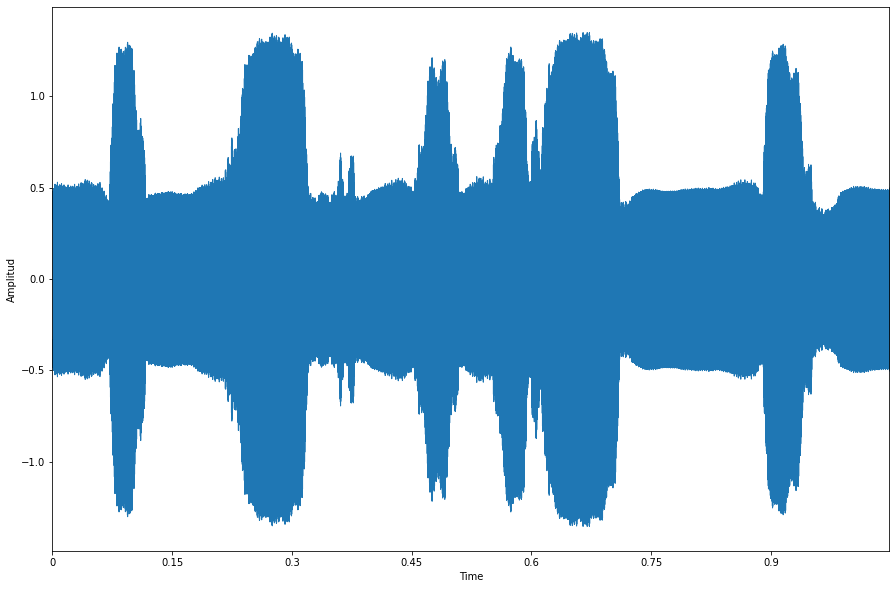

In [11]:
noise = tf.random.normal([1, 100])
generated_image = np.array(generator(noise, training=False))
comparison = np.array(X_train[0])


wavfile.write("1600epochs.wav", 16000, *generated_image)

wavfile.write("Comparison.wav", 16384, X_train[0])
output, sr = librosa.load("1600epochs.wav", 16384)
FIG_SIZE = (15,10)
fig = plt.figure(figsize=FIG_SIZE)
librosa.display.waveplot(output, 16000)


plt.ylabel("Amplitud")
fig.savefig('1600.png')

 Finalmente, creamos el gif

In [12]:
tensorboard --logdir logs/train

Reusing TensorBoard on port 6006 (pid 25812), started 15:28:14 ago. (Use '!kill 25812' to kill it.)

In [ ]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

![SegmentLocal](dcgan.gif "segment")